**Style transfer using GAN (RGB to Thermal)**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
'''working_directory = cwd+"/drive/My Drive/Deep Learning/Project 2/FLIR"
if not os.path.exists(working_directory):
    os.makedirs(working_directory)
print(working_directory)'''

'working_directory = cwd+"/drive/My Drive/Deep Learning/Project 2/FLIR"\nif not os.path.exists(working_directory):\n    os.makedirs(working_directory)\nprint(working_directory)'

In [3]:
!pwd
%cd /content

/content
/content


In [12]:
!wget https://doc-0k-08-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/u9m3i502hpj7quvo5ttpnrli19jniq6v/1574985600000/02779054821842818921/*/1obLol6Mhk0QwN53W6AGOv9iQE8lLTRYC?e=download -O all.zip

--2019-11-29 00:28:35--  https://doc-0k-08-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/u9m3i502hpj7quvo5ttpnrli19jniq6v/1574985600000/02779054821842818921/*/1obLol6Mhk0QwN53W6AGOv9iQE8lLTRYC?e=download
Resolving doc-0k-08-docs.googleusercontent.com (doc-0k-08-docs.googleusercontent.com)... 64.233.189.132, 2404:6800:4008:c07::84
Connecting to doc-0k-08-docs.googleusercontent.com (doc-0k-08-docs.googleusercontent.com)|64.233.189.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-zip-compressed]
Saving to: ‘all.zip’

all.zip                 [           <=>      ] 369.07M  42.8MB/s    in 8.9s    

2019-11-29 00:28:44 (41.6 MB/s) - ‘all.zip’ saved [386999873]



In [13]:
!unzip all.zip

Archive:  all.zip
   creating: resize/
   creating: resize/RGB/
  inflating: resize/RGB/FLIR_02889.jpg  
  inflating: resize/RGB/FLIR_03457.jpg  
  inflating: resize/RGB/FLIR_01374.jpg  
  inflating: resize/RGB/FLIR_01685.jpg  
  inflating: resize/RGB/FLIR_06460.jpg  
  inflating: resize/RGB/FLIR_03501.jpg  
  inflating: resize/RGB/FLIR_02673.jpg  
  inflating: resize/RGB/FLIR_06532.jpg  
  inflating: resize/RGB/FLIR_08595.jpg  
  inflating: resize/RGB/FLIR_07103.jpg  
  inflating: resize/RGB/FLIR_07455.jpg  
  inflating: resize/RGB/FLIR_03865.jpg  
  inflating: resize/RGB/FLIR_05577.jpg  
  inflating: resize/RGB/FLIR_00846.jpg  
  inflating: resize/RGB/FLIR_01971.jpg  
  inflating: resize/RGB/FLIR_07897.jpg  
  inflating: resize/RGB/FLIR_01317.jpg  
  inflating: resize/RGB/FLIR_01021.jpg  
  inflating: resize/RGB/FLIR_02253.jpg  
  inflating: resize/RGB/FLIR_02844.jpg  
  inflating: resize/RGB/FLIR_06744.jpg  
  inflating: resize/RGB/FLIR_05025.jpg  
  inflating: resize/RGB/FLIR_00056

In [0]:
#source https://stackoverflow.com/questions/48298146/changing-directory-in-google-colab-breaking-out-of-the-python-interpreter
#!pwd
#%cd /content/drive/My\ Drive/Deep\ Learning/Project\ 2/FLIR
#!pwd

In [15]:
import os
cwd = os.getcwd()
print(cwd)

/content


In [0]:
import sys
from PIL import Image
import glob
import os
import os.path
#from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

In [17]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-ugdbt5ac
  Running command git clone -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-ugdbt5ac
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-cp36-none-any.whl size=101065 sha256=8ef34344e6915cc9e5fb35b0b001f9522f3ae25c6729464d481caa38f230b9a5
  Stored in directory: /tmp/pip-ephem-wheel-cache-0llo9va_/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


In [0]:
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.utils.vis_utils import plot_model
from keras.layers import Conv2DTranspose
from keras.layers import Concatenate

from tqdm import tqdm_notebook

8362
8362


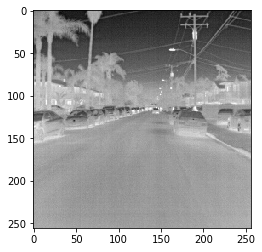

In [19]:
from random import randint, shuffle

def load_files(file_pattern):
  return glob.glob(file_pattern)

def read_image(fn):
  im = cv2.imread(fn).astype('float32')
  return im

def show_image(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype('uint8')
  plt.imshow(img)

def normalize_image(img):
  #print((img[1:2,1:5]))
  img = img.astype('float32')
  img = (img/127.5) - 1
  #print((img[1:2,1:5]))
  return img

def read_normalized_image(fn):
  im = cv2.imread(fn).astype('float32')
  im = (im/127.5) - 1
  return im

def show_normalized_image(img):
  #print((img[1:2,1:5]))
  img = ((img + 1)*127.5).astype('uint8')
  #print((img[1:2,1:5]))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img)
  #print((img[1:2,1:5]))

def save_normalized_image(filename, img):
  #print((img[1:2,1:5]))
  img = ((img + 1)*127.5).astype('uint8')
  #print((img[1:2,1:5]))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imsave(filename, img)
  #print((img[1:2,1:5]))

train_A = load_files('/content/resize/RGB/*.jpg')
train_B = load_files('/content/resize/thermal_8_bit/*.jpg')

print(len(train_A))
print(len(train_B))

thermal_sample_filename = '/content/resize/thermal_8_bit/FLIR_07851.jpg'
show_normalized_image(read_normalized_image(thermal_sample_filename))
#show_image(read_image('/content/drive/My Drive/Deep Learning/Project 2/FLIR/FLIR_ADAS_1_3/train/resize/thermal_8_bit/FLIR_07851.jpg'))
#normalize_image(read_image('/content/drive/My Drive/Deep Learning/Project 2/FLIR/FLIR_ADAS_1_3/train/resize/thermal_8_bit/FLIR_07851.jpg'))

In [0]:
#train_A.sort()
#train_B.sort()

In [0]:
#train_A = train_A[0:100]
#train_B = train_B[0:100]

In [22]:
rgb_list = []
thermal_list = []
for filename in tqdm_notebook(train_A):
  rgb_list.append(read_normalized_image(filename))
for filename in tqdm_notebook(train_B):
  thermal_list.append(read_normalized_image(filename))

rgb_list = np.asarray(rgb_list)
thermal_list = np.asarray(thermal_list)

In [0]:
#rgb_images = np.array([np.array( read_normalized_image(fname) ) for fname in train_A])
#thermal_images = np.array([np.array( read_normalized_image(fname) ) for fname in train_B])

In [0]:
# initialize weigts according to paper
kernel_init = RandomNormal(stddev=0.02)





Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      3072      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       131072    
_________________________________________________________________
instance_normalization_1 (In (None, 64, 64, 128)       256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 256)       

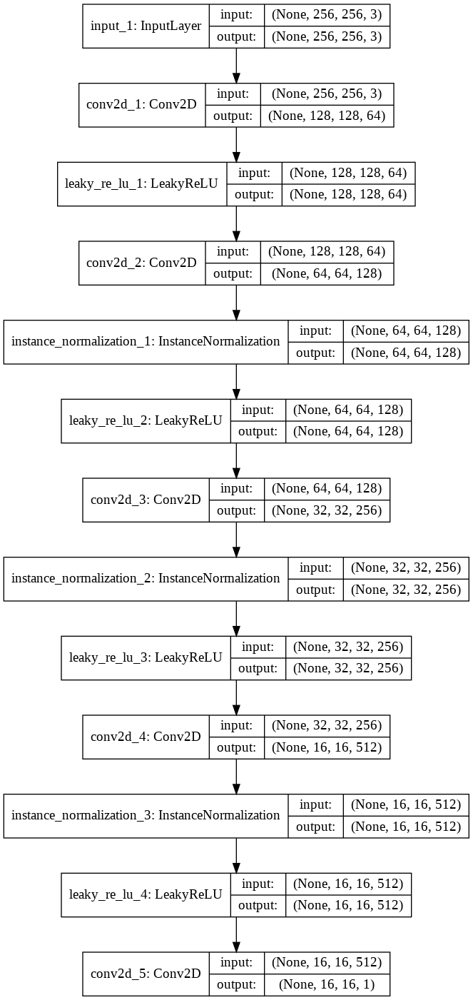

In [25]:
#patchgan discriminator model
def patchgan_discriminator(image_shape):
	# source image input
	input_img = Input(shape=image_shape)
	# filters = 64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=kernel_init, use_bias=False)(input_img)
	d = LeakyReLU(alpha=0.2)(d)
	filters = [128,256,512]
	#use filters 128, 256 and 512 for 3 conv layers
	for i_filter in filters:
		d = Conv2D(i_filter, (4,4), strides=(2,2), padding='same', kernel_initializer=kernel_init, use_bias=False)(d)
		d = InstanceNormalization(axis=-1)(d)
		d = LeakyReLU(alpha=0.2)(d)
	# patch output
	patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=kernel_init, use_bias=False)(d)
	# define model
	model = Model(input_img, patch_out)
	# compile model
	model.compile(loss='mse', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
	return model

sample_rgb_img = (read_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/FLIR/FLIR_ADAS_1_3/train/resize/RGB/FLIR_07851.jpg'))
sample_thermal_img = (read_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/FLIR/FLIR_ADAS_1_3/train/resize/thermal_8_bit/FLIR_07851.jpg'))
# define image shape
image_shape = sample_rgb_img.shape#(256,256,3)
# create the model
dis_1 = patchgan_discriminator(image_shape)
# summarize the model
dis_1.summary()
# plot the model
plot_model(dis_1, to_file='discriminator_model_plot_1.png', show_shapes=True, show_layer_names=True)

In [0]:
# resnet block for generator
def resnet_block(n_filters, input_layer):
	r = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=kernel_init)(input_layer)
	r = InstanceNormalization(axis=-1)(r)
	r = Activation('relu')(r)
	# convolutional layer 1 


	r = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=kernel_init)(r)
	r = InstanceNormalization(axis=-1)(r)
	# convolutional layer 2

	# concatenate merge channel-wise with input layer
	r_block = Concatenate()([r, input_layer])
	return r_block

In [0]:
# generator model for each discriminator with resnet blocks. Use 9 blocks if image size is 256*256. Use 6 resnet blocks if image size is 128*128
#from paper - The network with 9 residual blocks consists of:
#c7s1-64,
#d128,d256,R256,R256,R256,R256,R256,R256,R256,R256,R256,
#u128,u64,
#c7s1-3
#where these terms are defined as follows

def resnet_generator(image_shape=(256,256,3), resnet_layers=9):
	# image input
	input_image = Input(shape=image_shape)
	
	g = Conv2D(64, (7,7), padding='same', kernel_initializer=kernel_init)(input_image)
	g = InstanceNormalization(axis=-1)(g)
	g = Activation('relu')(g)
	# c7s1-64
	#Let c7s1-k denote a 7×7 Convolution-InstanceNormReLU layer with k filters and stride 1.	
	
	g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(g)
	g = InstanceNormalization(axis=-1)(g)
	g = Activation('relu')(g)
	# d128
	#dk denotes a 3 × 3 Convolution-InstanceNorm-ReLU layer with k filters and stride 2
	
	g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(g)
	g = InstanceNormalization(axis=-1)(g)
	g = Activation('relu')(g)
	# d256
	#dk denotes a 3 × 3 Convolution-InstanceNorm-ReLU layer with k filters and stride 2


	# R256*9
	#Rk denotes a residual block that contains two 3 × 3 convolutional layers with the same number of filters on both layer.
	for _ in range(resnet_layers):
		g = resnet_block(256, g)

	g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(g)
	g = InstanceNormalization(axis=-1)(g)
	g = Activation('relu')(g)
 	# u128
	#uk denotes a 3 × 3 fractional-strided-ConvolutionInstanceNorm-ReLU layer with k filters and stride 1/2.
	
	g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(g)
	g = InstanceNormalization(axis=-1)(g)
	g = Activation('relu')(g)
	# u64
	#uk denotes a 3 × 3 fractional-strided-ConvolutionInstanceNorm-ReLU layer with k filters and stride 1/2.
	#the official code uses same number of strides and kernel as used above in code

	g = Conv2D(3, (7,7), padding='same', kernel_initializer=kernel_init)(g)
	g = InstanceNormalization(axis=-1)(g)
	out_image = Activation('tanh')(g)
	# c7s1-3
	
	
	model = Model(input_image, out_image)
	return model



Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 256, 256, 64) 9472        input_2[0][0]                    
__________________________________________________________________________________________________
instance_normalization_4 (Insta (None, 256, 256, 64) 128         conv2d_6[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 256, 256, 64) 0           instance_normalization_4[0][0]   
____________________________________________________________________________________________

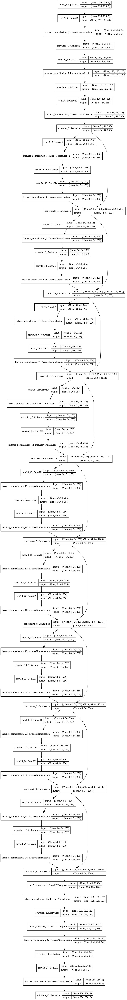

In [28]:
# create the model
model = resnet_generator()
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

In [0]:
# composite model for updating generators by adversarial, cycle loss - forward and backward and identity loss 
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
	
	# only train 1 generator
	g_model_1.trainable = True
	# mark discriminator as not trainable
	d_model.trainable = False
	# mark other generator model as not trainable
	g_model_2.trainable = False
	#==============================================#
	# discriminator element
	input_gen = Input(shape=image_shape)
	gen1_out = g_model_1(input_gen)
	output_d = d_model(gen1_out)
	# identity element
	input_id = Input(shape=image_shape)
	output_id = g_model_1(input_id)
	# forward cycle
	output_f = g_model_2(gen1_out)
	# backward cycle
	gen2_out = g_model_2(input_id)
	output_b = g_model_1(gen2_out)
 	#==============================================#
	model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
	opt = Adam(lr=0.0002, beta_1=0.5)
	# mse - least squares loss -L2
	# mae - mean absolute loss - L1 loss
	model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
	return model

In [0]:
# input shape
image_shape = (256,256,3)
# generator: RGB -> Thermal
generator_model_RGBtoThermal = resnet_generator(image_shape)
# generator: Thermal -> RGB
generator_model_ThermaltoRGB = resnet_generator(image_shape)
# discriminator: RGB -> [real/fake]
d_model_RGB = patchgan_discriminator(image_shape)
# discriminator: Thermal -> [real/fake]
d_model_Thermal = patchgan_discriminator(image_shape)
# composite: RGB -> Thermal -> [real/fake, RGB]
c_model_RGBtoThermal = define_composite_model(generator_model_RGBtoThermal, d_model_Thermal, generator_model_ThermaltoRGB, image_shape)
# composite: Thermal -> RGB -> [real/fake, Thermal]
c_model_ThermaltoRGB = define_composite_model(generator_model_ThermaltoRGB, d_model_RGB, generator_model_RGBtoThermal, image_shape)

In [31]:
print(c_model_RGBtoThermal.output_shape)

[(None, 16, 16, 1), (None, 256, 256, 3), (None, 256, 256, 3), (None, 256, 256, 3)]


Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
model_3 (Model)                 (None, 256, 256, 3)  35276553    input_7[0][0]                    
                                                                 input_8[0][0]                    
                                                                 model_4[2][0]                    
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 256, 256, 3)  0                                            
____________________________________________________________________________________________

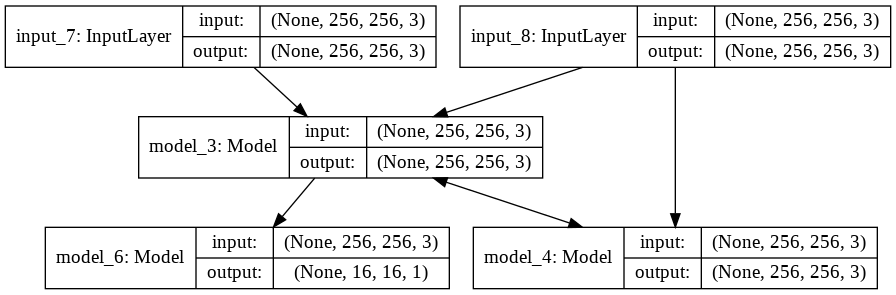

In [32]:
c_model_RGBtoThermal.summary()
plot_model(c_model_RGBtoThermal, to_file='composite_model_output_plot.png', show_shapes=True, show_layer_names=True)

In [0]:
def get_real_samples(dataset, n_samples, patch_shape):
	ix = np.random.randint(0, dataset.shape[0], n_samples)
	X = dataset[ix]
	y = np.ones((n_samples, patch_shape, patch_shape, 1))
	return X, y
def get_fake_samples(g_model, dataset, patch_shape):
	X = g_model.predict(dataset)
	y = np.zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

In [0]:
def update_image_pool(pool, images, max_size=50):
	selected = list()
	for image in images:
		if len(pool) < max_size:
			# stock the pool
			pool.append(image)
			selected.append(image)
		elif np.random.random() < 0.5:
			# use image, but don't add it to the pool
			selected.append(image)
		else:
			# replace an existing image and use replaced image
			ix = randint(0, len(pool)-1)
			selected.append(pool[ix])
			pool[ix] = image
	return np.asarray(selected)

In [0]:
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA):
	# define properties of the training run
	n_epochs, n_batch, = 100, 1
	# determine the output square shape of the discriminator
	n_patch = d_model_A.output_shape[1]
	# prepare image pool for fakes
	poolA, poolB = list(), list()
	# calculate the number of batches per training epoch
	bat_per_epo = int(len(rgb_list) / n_batch)
	# calculate the number of training iterations
	n_steps = bat_per_epo * n_epochs
	# manually enumerate epochs
	for i in tqdm_notebook(range(n_steps)):
		# select a batch of real samples
		X_realA, y_realA = get_real_samples(rgb_list, n_batch, n_patch)
		X_realB, y_realB = get_real_samples(thermal_list, n_batch, n_patch)
		# generate a batch of fake samples
		X_fakeA, y_fakeA = get_fake_samples(g_model_BtoA, X_realB, n_patch)
		X_fakeB, y_fakeB = get_fake_samples(g_model_AtoB, X_realA, n_patch)
		# update fakes from pool
		X_fakeA = update_image_pool(poolA, X_fakeA)
		X_fakeB = update_image_pool(poolB, X_fakeB)

		# get generator B->A via adversarial, cycle ->forward and backward and identity loss
		g_loss2, _, _, _, _  = c_model_ThermaltoRGB.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
	

		# get discriminator for A -> [real/fake]
		dA_loss1 = d_model_RGB.train_on_batch(X_realA, y_realA)
		dA_loss2 = d_model_RGB.train_on_batch(X_fakeA, y_fakeA)
	

		# get generator A->B via adversarial, cycle ->forward and backward and identity loss
		g_loss1, _, _, _, _ = c_model_RGBtoThermal.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
	

		# get discriminator for B -> [real/fake]
		dB_loss1 = d_model_Thermal.train_on_batch(X_realB, y_realB)
		dB_loss2 = d_model_Thermal.train_on_batch(X_fakeB, y_fakeB)
	

		# summarize performance	
		summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorA_loss_real", simple_value=dA_loss1), ])
		writer.add_summary(summary,i)
		summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorA_loss_fake", simple_value=dA_loss2), ])
		writer.add_summary(summary,i)
		summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorB_loss_real", simple_value=dB_loss1), ])
		writer.add_summary(summary,i)
		summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorB_loss_fake", simple_value=dB_loss2), ])
		writer.add_summary(summary,i)
		summary = tf.Summary(value=[tf.Summary.Value(tag="generator_A_B_loss", simple_value=g_loss1), ])
		writer.add_summary(summary,i)
		summary = tf.Summary(value=[tf.Summary.Value(tag="generator_B_A_loss", simple_value=g_loss2), ])
		writer.add_summary(summary,i)
		writer.flush()  
		if i%10==0:
			save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/X_realA_'+str(i)+'_.jpg', X_realA[0])
			save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/X_realB_'+str(i)+'_.jpg', X_realB[0])
			save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/X_fakeA_'+str(i)+'_.jpg', X_fakeA[0])
			save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/X_fakeB_'+str(i)+'_.jpg', X_fakeB[0])
			d_model_B.save('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/d_model_B.hdf5')
			d_model_A.save('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/d_model_A.hdf5')
			g_model_AtoB.save('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/g_model_AtoB.hdf5')
			g_model_BtoA.save('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/g_model_BtoA.hdf5')
		print('>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1,dA_loss2, dB_loss1,dB_loss2, g_loss1,g_loss2))

In [37]:
print( np.asarray(rgb_list).shape )

(8362, 256, 256, 3)


In [0]:
%load_ext tensorboard
#import datetime, os
import tensorflow as tf

In [0]:
writer = tf.summary.FileWriter("/content/mylogs")

In [0]:
!kill 2035

In [40]:
#%reload_ext tensorboard
%tensorboard --logdir /content/mylogs/

Reusing TensorBoard on port 6006 (pid 2035), started 2:31:12 ago. (Use '!kill 2035' to kill it.)

In [0]:
# train models
train(d_model_RGB, d_model_Thermal, generator_model_RGBtoThermal, generator_model_ThermaltoRGB, c_model_RGBtoThermal, c_model_ThermaltoRGB)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected

>1, dA[1.526,0.768] dB[0.943,0.858] g[18.519,19.388]
>2, dA[1.958,1.412] dB[9.675,0.838] g[16.216,16.039]
>3, dA[9.743,2.086] dB[5.644,0.708] g[13.847,14.381]
>4, dA[5.256,0.821] dB[1.286,0.707] g[15.440,17.985]
>5, dA[3.113,1.971] dB[2.532,0.678] g[12.297,15.266]
>6, dA[1.742,3.224] dB[2.266,0.744] g[14.147,15.302]
>7, dA[0.550,3.205] dB[1.887,1.420] g[11.813,13.297]
>8, dA[0.747,2.071] dB[0.909,0.857] g[11.493,12.639]
>9, dA[0.696,1.288] dB[0.323,0.568] g[10.887,12.440]
>10, dA[0.261,0.543] dB[0.311,0.483] g[10.399,11.888]
>11, dA[0.596,0.507] dB[0.177,0.335] g[7.766,9.239]
>12, dA[0.360,0.890] dB[0.118,0.299] g[8.945,11.247]
>13, dA[0.301,1.403] dB[0.134,0.207] g[8.043,10.956]
>14, dA[0.186,1.326] dB[0.136,0.139] g[6.539,8.597]
>15, dA[0.282,0.607] dB[0.229,0.238] g[8.603,9.857]
>16, dA[0.309,0.476] dB[0.163,0.182] g[7.185,9.311]
>17, dA[0.350,0.303] dB[0.101,0.166] g[5.490,6.873]
>18, dA[0.230,0.348] dB[0.178,0.132] g[5.907,6.791]
>19, dA[0.311,0.254] dB[0.112,0.186] g[6.546,8.296]

In [65]:
from keras.models import load_model
generator_model_RGBtoThermal = load_model("/g_model_AtoB.hdf5", custom_objects = {'InstanceNormalization':InstanceNormalization})
generator_model_ThermaltoRGB = load_model("/g_model_BtoA.hdf5", custom_objects = {'InstanceNormalization':InstanceNormalization})

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:310: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


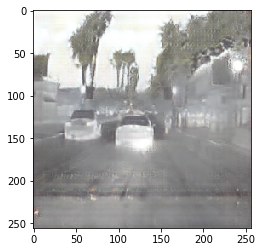

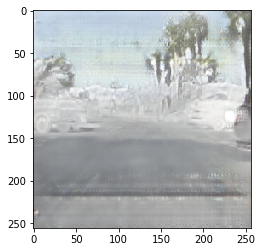

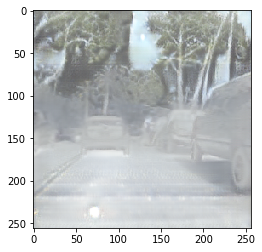

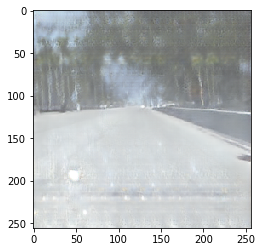

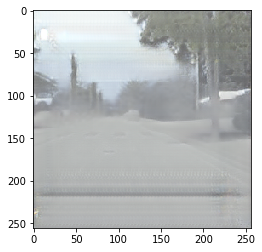

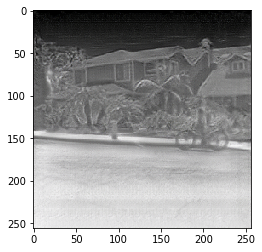

In [66]:
#Sample code for test images
n_samples = 5
n_patch = 16
X_realA, y_realA = get_real_samples(rgb_list, n_samples, n_patch)
X_realB, y_realB = get_real_samples(thermal_list, n_samples, n_patch)
# generate a batch of fake samples
X_fakeA, y_fakeA = get_fake_samples(generator_model_ThermaltoRGB, X_realB, n_patch)
X_fakeB, y_fakeB = get_fake_samples(generator_model_RGBtoThermal, X_realA, n_patch)

for i in range(n_samples):
  save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/test_X_fakeA_'+str(i)+'_.jpg', X_fakeA[i])
  show_normalized_image(X_fakeA[i])
  plt.figure()
  save_normalized_image('/content/drive/My Drive/Deep Learning/Project 2/save_imgs/test_X_fakeB_'+str(i)+'_.jpg', X_fakeB[i])
  show_normalized_image(X_fakeB[i])

In [0]:
discriminatorA_loss_real = [1.526,1.958, 9.743, 5.256, 3.113, 1.742, 0.55, 0.747, 0.696, 0.261, 0.596, 0.36, 0.301, 0.186, 0.282, 0.309, 0.35, 0.23, 0.311, 0.185, 0.257, 0.223, 0.36, 0.186, 0.214, 0.235, 0.2, 0.217, 0.228, 0.174, 0.196, 0.13, 0.185, 0.181, 0.091, 0.249, 0.289, 0.261, 0.23, 0.258, 0.086, 0.102, 0.135, 0.283, 0.106, 0.238, 0.154, 0.104, 0.174, 0.34, 0.23, 0.109, 0.1, 0.15, 0.248, 0.158, 0.191, 0.156, 0.088, 0.186, 0.14, 0.057, 0.079, 0.103, 0.129, 0.343, 0.225, 0.149, 0.158, 0.177, 0.2, 0.16, 0.276, 0.154, 0.138, 0.119, 0.125, 0.072, 0.196, 0.166, 0.154, 0.104, 0.118, 0.159, 0.133, 0.101, 0.12, 0.128, 0.151, 0.165, 0.07, 0.108, 0.065, 0.065, 0.047, 0.096, 0.056, 0.069, 0.082, 0.105, 0.116, 0.183, 0.104, 0.175, 0.084, 0.107, 0.086, 0.05, 0.262, 0.042, 0.538, 0.061, 0.066, 0.111, 0.033, 0.08, 0.151, 0.048, 0.175, 0.074, 0.044, 0.073, 0.081, 0.185, 0.071, 0.047, 0.123, 0.052, 0.365, 0.061, 0.111, 0.196, 0.121, 0.135, 0.095, 0.047, 0.102, 0.063, 0.04, 0.081, 0.053, 0.116, 0.125, 0.072, 0.055, 0.047, 0.048, 0.17, 0.125, 0.048, 0.086, 0.097, 0.054, 0.025, 0.239, 0.062, 0.062, 0.046, 0.086, 0.047, 0.046, 0.049, 0.034, 0.045, 0.229, 0.263, 0.071, 0.083, 0.035, 0.07, 0.115, 0.035, 0.035, 0.134, 0.048, 0.132, 0.048, 0.062, 0.168, 0.039, 0.233, 0.273, 0.075, 0.173, 0.039, 0.079, 0.131, 0.031, 0.166, 0.024, 0.09, 0.17, 0.034, 0.089, 0.085, 0.132, 0.042, 0.047, 0.04, 0.142, 0.224, 0.123, 0.083, 0.064, 0.387, 0.427, 0.113, 0.087, 0.052, 0.04, 0.054, 0.266, 0.172, 0.072, 0.063, 0.197, 0.054, 0.058, 0.083, 0.04, 0.031, 0.042, 0.056, 0.025, 0.177, 0.121, 0.022, 0.255, 0.026, 0.306, 0.395, 0.103, 0.12, 0.185, 0.052, 0.056, 0.393, 0.131, 0.256, 0.056, 0.204, 0.218, 0.057, 0.092, 0.107, 0.128, 0.021, 0.024, 0.119, 0.043, 0.11, 0.066, 0.182, 0.091, 0.094, 0.426, 0.06, 0.038, 0.07, 0.336, 0.047, 0.18, 0.07, 0.1, 0.237, 0.09, 0.06, 0.311, 0.036, 0.07, 0.066, 0.161, 0.043, 0.264, 0.054, 0.239, 0.098, 0.162, 0.041, 0.138, 0.091, 0.069, 0.057, 0.1, 0.276, 0.131, 0.069, 0.223, 0.067, 0.039, 0.187, 0.033, 0.216, 0.126, 0.08, 0.115, 0.098, 0.034, 0.03, 0.029, 0.03, 0.036, 0.051, 0.09, 0.218, 0.063, 0.149, 0.263, 0.096, 0.062, 0.082, 0.061, 0.053, 0.044, 0.184, 0.074, 0.132, 0.174, 0.026, 0.044, 0.02, 0.042, 0.053, 0.022, 0.033, 0.073, 0.035, 0.157, 0.159, 0.058, 0.198, 0.043, 0.113, 0.031, 0.033, 0.055, 0.089, 0.264, 0.104, 0.188, 0.109, 0.06, 0.131, 0.156, 0.048, 0.028, 0.223, 0.081, 0.062, 0.183, 0.057, 0.35, 0.062, 0.126, 0.056, 0.038, 0.183, 0.244, 0.244, 0.116, 0.025, 0.258, 0.056, 0.141, 0.125, 0.091, 0.087, 0.047, 0.14, 0.125, 0.049, 0.3, 0.022, 0.087, 0.033, 0.094, 0.02, 0.196, 0.036, 0.136, 0.076, 0.074, 0.043, 0.042, 0.068, 0.034, 0.109, 0.116, 0.175, 0.049, 0.026, 0.087, 0.061, 0.056, 0.029, 0.413, 0.091, 0.051, 0.054, 0.028, 0.171, 0.021, 0.323, 0.056, 0.018, 0.308, 0.08, 0.029, 0.088, 0.045, 0.037, 0.084, 0.024, 0.389, 0.117, 0.173, 0.301, 0.029, 0.208, 0.126, 0.059, 0.019, 0.098, 0.036, 0.034, 0.09, 0.028, 0.149, 0.028, 0.037, 0.031, 0.034, 0.303, 0.128, 0.294, 0.088, 0.131, 0.214, 0.041, 0.054, 0.029, 0.088, 0.386, 0.034, 0.206, 0.06, 0.077, 0.028, 0.148, 0.084, 0.029, 0.309, 0.082, 0.102, 0.047, 0.363, 0.073, 0.05, 0.096, 0.05, 0.03, 0.173, 0.024, 0.032, 0.185, 0.048, 0.207, 0.236, 0.015, 0.313, 0.049, 0.062, 0.028, 0.38, 0.101, 0.033, 0.045, 0.107, 0.035, 0.014, 0.29, 0.079, 0.205, 0.048, 0.029, 0.051, 0.359, 0.16, 0.05, 0.343, 0.045, 0.078, 0.322, 0.028, 0.094, 0.075, 0.018, 0.119, 0.043, 0.052, 0.03, 0.079, 0.038, 0.074, 0.06, 0.328, 0.051, 0.067, 0.044, 0.046, 0.154, 0.095, 0.088, 0.027, 0.234, 0.028, 0.143, 0.05, 0.049, 0.112, 0.047, 0.222, 0.044, 0.033, 0.112, 0.342, 0.099, 0.03, 0.038, 0.055, 0.054, 0.157, 0.023, 0.024, 0.038, 0.045, 0.163, 0.048, 0.054, 0.362, 0.054, 0.027, 0.049, 0.118, 0.023, 0.055, 0.013, 0.072, 0.071, 0.217, 0.029, 0.043, 0.307, 0.038, 0.031, 0.076, 0.316, 0.081, 0.067, 0.171, 0.085, 0.036, 0.031, 0.015, 0.076, 0.074, 0.04, 0.027, 0.225, 0.033, 0.215, 0.099, 0.062, 0.26, 0.022, 0.143, 0.044, 0.206, 0.054, 0.182, 0.018, 0.02, 0.114, 0.088, 0.04, 0.022, 0.549, 0.09, 0.188, 0.056, 0.052, 0.096, 0.223, 0.063, 0.085, 0.209, 0.078, 0.093, 0.359, 0.037, 0.057, 0.105, 0.022, 0.065, 0.094, 0.269, 0.134, 0.012, 0.062, 0.11, 0.059, 0.057, 0.134, 0.019, 0.028, 0.028, 0.026, 0.211, 0.067, 0.154, 0.088, 0.02, 0.106, 0.025, 0.554, 0.037, 0.055, 0.031, 0.014, 0.019, 0.083, 0.202, 0.056, 0.043, 0.401, 0.14, 0.072, 0.138, 0.05, 0.049, 0.034, 0.034, 0.01, 0.129, 0.223, 0.092, 0.064, 0.131, 0.01, 0.038, 0.072, 0.017, 0.036, 0.083, 0.263, 0.053, 0.079, 0.059, 0.086, 0.375, 0.035, 0.082, 0.221, 0.07, 0.04, 0.11, 0.05, 0.159, 0.188, 0.046, 0.051, 0.03, 0.028, 0.388, 0.02, 0.256, 0.08, 0.033, 0.16, 0.101, 0.149, 0.053, 0.214, 0.016, 0.053, 0.026, 0.11, 0.132, 0.208, 0.043, 0.151, 0.136, 0.068, 0.046, 0.412, 0.099, 0.141, 0.087, 0.01, 0.032, 0.139, 0.01, 0.039, 0.059, 0.198, 0.038, 0.055, 0.104, 0.014, 0.481, 0.046, 0.031, 0.073, 0.294, 0.111, 0.066, 0.22, 0.025, 0.045, 0.113, 0.184, 0.028, 0.091, 0.116, 0.527, 0.266, 0.138, 0.061, 0.146, 0.046, 0.1, 0.148, 0.05, 0.099, 0.059, 0.048, 0.024, 0.039, 0.293, 0.086, 0.315, 0.053, 0.053, 0.037, 0.068, 0.026, 0.031, 0.073, 0.031, 0.356, 0.066, 0.016, 0.467, 0.072, 0.057, 0.25, 0.056, 0.361, 0.052, 0.079, 0.103, 0.057, 0.167, 0.044, 0.029, 0.087, 0.018, 0.265, 0.048, 0.338, 0.017, 0.018, 0.02, 0.029, 0.022, 0.017, 0.031, 0.019, 0.032, 0.013, 0.022, 0.064, 0.014, 0.008, 0.286, 0.096, 0.046, 0.057, 0.064, 0.077, 0.031, 0.011, 0.055, 0.297, 0.055, 0.026, 0.041, 0.023, 0.016, 0.012, 0.118, 0.082, 0.021, 0.02, 0.028, 0.024, 0.247, 0.123, 0.024, 0.008, 0.049, 0.273, 0.363, 0.524, 0.155, 0.141, 0.226, 0.023, 0.141, 0.034, 0.012, 0.016, 0.021, 0.027, 0.02, 0.117, 0.025, 0.175, 0.021, 0.226, 0.152, 0.163, 0.044, 0.01, 0.078, 0.022, 0.018, 0.01, 0.216, 0.041, 0.045, 0.066, 0.259, 0.052, 0.37, 0.075, 0.02, 0.226, 0.015, 0.059, 0.052, 0.007, 0.017, 0.018, 0.031, 0.01, 0.012, 0.014, 0.122, 0.051, 0.027, 0.024, 0.043, 0.326, 0.058, 0.034, 0.068, 0.199, 0.083, 0.437, 0.057, 0.106, 0.049, 0.041, 0.19, 0.022, 0.055, 0.022, 0.021, 0.031, 0.026, 0.318, 0.157, 0.07, 0.047, 0.211, 0.08, 0.225, 0.034, 0.069, 0.099, 0.029, 0.211, 0.052, 0.064, 0.029, 0.206, 0.127, 0.17, 0.024, 0.014, 0.024, 0.284, 0.03, 0.211, 0.229, 0.087, 0.222, 0.112, 0.023, 0.059, 0.08, 0.02, 0.11, 0.047, 0.036, 0.035, 0.134, 0.036, 0.014, 0.119, 0.017, 0.035, 0.017, 0.094, 0.035, 0.383, 0.04, 0.091, 0.194, 0.105, 0.104, 0.018, 0.123, 0.025, 0.501, 0.118, 0.062, 0.39, 0.066, 0.037, 0.155, 0.022, 0.033, 0.033, 0.063, 0.005, 0.321, 0.045, 0.045, 0.013, 0.004, 0.023, 0.225, 0.051, 0.484, 0.048, 0.1, 0.042, 0.031, 0.028, 0.026, 0.034, 0.033, 0.01, 0.01, 0.009, 0.009, 0.025, 0.013, 0.007, 0.017, 0.044, 0.281, 0.054, 0.043, 0.038, 0.205, 0.06, 0.011, 0.043, 0.301, 0.019, 0.041, 0.233, 0.026, 0.222, 0.026, 0.066, 0.176, 0.024, 0.333, 0.029, 0.144, 0.143, 0.027, 0.067, 0.035, 0.027, 0.012, 0.419, 0.105, 0.054, 0.041, 0.101, 0.241, 0.081, 0.433, 0.037, 0.022, 0.063, 0.025, 0.063, 0.026, 0.03, 0.079, 0.118, 0.041, 0.312, 0.059, 0.05, 0.395, 0.051, 0.07, 0.096, 0.035, 0.031, 0.011, 0.029, 0.021, 0.373, 0.13, 0.116, 0.03, 0.202, 0.071, 0.257, 0.033, 0.083, 0.017, 0.013, 0.013, 0.044, 0.012, 0.028, 0.081, 0.017, 0.014, 0.088, 0.138, 0.029, 0.283, 0.032, 0.025, 0.011, 0.013, 0.108, 0.007, 0.011, 0.009, 0.009, 0.008, 0.005, 0.021, 0.015, 0.011, 0.493, 0.075, 0.458, 0.039, 0.008, 0.216, 0.008, 0.036, 0.009, 0.011, 0.026, 0.025, 0.078, 0.03, 0.037, 0.014, 0.089, 0.048, 0.007, 0.013, 0.011, 0.015, 0.28, 0.074, 0.398, 0.054, 0.2, 0.03, 0.037, 0.031, 0.104, 0.025, 0.039, 0.297, 0.041, 0.494, 0.035, 0.377, 0.019, 0.043, 0.056, 0.194, 0.016, 0.035, 0.277, 0.052, 0.047, 0.038, 0.014, 0.199, 0.021, 0.023, 0.018, 0.066, 0.028, 0.053, 0.218, 0.027, 0.01, 0.008, 0.055, 0.274, 0.036, 0.031, 0.39, 0.137, 0.391, 0.038, 0.033, 0.026, 0.035, 0.02, 0.048, 0.047, 0.021, 0.022, 0.079, 0.018, 0.041, 0.035, 0.085, 0.137, 0.146, 0.037, 0.028, 0.022, 0.403, 0.024, 0.064, 0.016, 0.007, 0.005, 0.023, 0.105, 0.327, 0.121, 0.018, 0.006, 0.343, 0.147, 0.026, 0.035, 0.183, 0.006, 0.221, 0.071, 0.019, 0.012, 0.024, 0.01, 0.006, 0.006, 0.284, 0.318, 0.029, 0.014, 0.012, 0.007, 0.01, 0.014, 0.005, 0.017, 0.006, 0.179, 0.055, 0.066, 0.013, 0.198, 0.016, 0.036, 0.066, 0.104, 0.328, 0.147, 0.117, 0.03, 0.07, 0.041, 0.059, 0.102, 0.025, 0.037, 0.028, 0.298, 0.175, 0.065, 0.018, 0.221, 0.054, 0.073, 0.036, 0.067, 0.022, 0.045, 0.015, 0.009, 0.011, 0.004, 0.157, 0.015, 0.026, 0.027, 0.006, 0.042, 0.008, 0.011, 0.063, 0.159, 0.092, 0.071, 0.058, 0.062, 0.019, 0.106, 0.217, 0.084, 0.041, 0.069, 0.03, 0.028, 0.011, 0.307, 0.12, 0.171, 0.081, 0.009, 0.207, 0.015, 0.022, 0.015, 0.464, 0.032, 0.027, 0.401, 0.06, 0.029, 0.372, 0.041, 0.014, 0.028, 0.092, 0.049, 0.018, 0.009, 0.016, 0.1, 0.038, 0.139, 0.016, 0.55, 0.156, 0.057, 0.055, 0.376, 0.021, 0.15, 0.174, 0.022, 0.147, 0.015, 0.39, 0.16, 0.027, 0.031, 0.281, 0.011, 0.023, 0.008, 0.038, 0.035, 0.011, 0.448, 0.055, 0.053, 0.343, 0.02, 0.233, 0.016, 0.097, 0.016, 0.207, 0.029, 0.025, 0.02, 0.015, 0.019, 0.216, 0.023, 0.046, 0.016, 0.112, 0.036, 0.016, 0.029, 0.024, 0.025, 0.019, 0.213, 0.03, 0.36, 0.034, 0.149, 0.125, 0.011, 0.345, 0.049, 0.054, 0.345, 0.063, 0.045, 0.01, 0.018, 0.011, 0.016, 0.01, 0.414, 0.066, 0.07, 0.039, 0.072, 0.106, 0.033, 0.069, 0.155, 0.102, 0.13, 0.121, 0.019, 0.233, 0.05, 0.052, 0.012, 0.366, 0.047, 0.044, 0.185, 0.05, 0.223, 0.022, 0.083, 0.04, 0.024, 0.018, 0.01, 0.061, 0.039, 0.026, 0.021, 0.03, 0.201, 0.112, 0.056, 0.052, 0.013, 0.177, 0.016, 0.006, 0.076, 0.03, 0.034, 0.301, 0.184, 0.045, 0.029, 0.018, 0.013, 0.235, 0.05, 0.017, 0.026, 0.042, 0.442, 0.108, 0.06, 0.105, 0.049, 0.009, 0.048, 0.016, 0.005, 0.026, 0.015, 0.094, 0.032, 0.063, 0.01, 0.036, 0.012, 0.029, 0.079, 0.013, 0.003, 0.283, 0.076, 0.367, 0.067, 0.078, 0.313, 0.034, 0.166, 0.209, 0.019, 0.021, 0.258, 0.045, 0.129, 0.155, 0.071, 0.103, 0.022, 0.234, 0.098, 0.053, 0.099, 0.019, 0.009, 0.023, 0.015, 0.031, 0.028, 0.038, 0.092, 0.055, 0.271, 0.171, 0.132, 0.017, 0.19, 0.056, 0.197, 0.092, 0.04, 0.353, 0.11, 0.072, 0.054, 0.182, 0.056, 0.03, 0.087, 0.009, 0.026, 0.318, 0.027, 0.026, 0.006, 0.007, 0.232, 0.049, 0.056, 0.011, 0.023, 0.012, 0.029, 0.009, 0.021, 0.007, 0.062, 0.011, 0.019, 0.118, 0.025, 0.052, 0.014, 0.345, 0.016, 0.008, 0.044, 0.017, 0.023, 0.05, 0.005, 0.006, 0.01, 0.023, 0.108, 0.018, 0.024, 0.021, 0.004, 0.136, 0.474, 0.073, 0.163, 0.031, 0.047, 0.092, 0.037, 0.056, 0.053, 0.122, 0.024, 0.013, 0.168, 0.066, 0.064, 0.013, 0.018, 0.027, 0.01, 0.006, 0.011, 0.01, 0.047, 0.036, 0.01, 0.035, 0.011, 0.444, 0.041, 0.03, 0.017, 0.247, 0.143, 0.029, 0.013, 0.009, 0.008, 0.031, 0.01, 0.014, 0.017, 0.009, 0.014, 0.151, 0.013, 0.023, 0.03, 0.291, 0.032, 0.242, 0.048, 0.063, 0.407, 0.029, 0.256, 0.223, 0.068, 0.07, 0.047, 0.1, 0.024, 0.159, 0.038, 0.145, 0.058, 0.032, 0.012, 0.007, 0.022, 0.012, 0.146, 0.022, 0.046, 0.292, 0.049, 0.053, 0.041, 0.157, 0.147, 0.057, 0.439, 0.241, 0.224, 0.047, 0.464, 0.095, 0.3, 0.034, 0.087, 0.048, 0.22, 0.322, 0.08, 0.012, 0.223, 0.022, 0.153, 0.044, 0.049, 0.372, 0.041, 0.103, 0.054, 0.224, 0.037, 0.169, 0.101, 0.043, 0.021, 0.01, 0.015, 0.007, 0.056, 0.421, 0.197, 0.17, 0.065, 0.362, 0.196, 0.059, 0.391, 0.04, 0.1, 0.036, 0.318, 0.007, 0.111, 0.011, 0.072, 0.022, 0.011, 0.027, 0.025, 0.009, 0.013, 0.027, 0.039, 0.273, 0.076, 0.132, 0.026, 0.101, 0.027, 0.018, 0.135, 0.038, 0.017, 0.019, 0.017, 0.275, 0.103, 0.033, 0.07, 0.102, 0.018, 0.032, 0.535, 0.126, 0.044, 0.04, 0.023, 0.02, 0.011, 0.034, 0.011, 0.085, 0.43, 0.02, 0.017, 0.292, 0.074, 0.088, 0.359, 0.031, 0.361, 0.015, 0.216, 0.066, 0.087, 0.062, 0.034, 0.119, 0.016, 0.099, 0.052, 0.09, 0.01, 0.024, 0.04, 0.012, 0.079, 0.012, 0.032, 0.044, 0.021, 0.012, 0.482, 0.109, 0.016, 0.108, 0.178, 0.266, 0.138, 0.032, 0.281, 0.024, 0.072, 0.022, 0.034, 0.038, 0.022, 0.02, 0.072, 0.023, 0.047, 0.069, 0.016, 0.023, 0.224, 0.018, 0.409, 0.008, 0.021, 0.03, 0.083, 0.042, 0.318, 0.138, 0.11, 0.212, 0.035, 1.214, 0.249, 0.277, 0.172, 0.063, 0.142, 0.091, 0.064, 0.029, 0.229, 0.038, 0.149, 0.028, 0.095, 0.176, 0.085, 0.374, 0.121, 0.049, 0.037, 0.033, 0.285, 0.07, 0.131, 0.261, 0.022, 0.03, 0.097, 0.028, 0.015, 0.03, 0.278, 0.026, 0.285, 0.012, 0.018, 0.076, 0.012, 0.012, 0.012, 0.023, 0.016, 0.012, 0.116, 0.026, 0.277, 0.176, 0.037, 0.086, 0.209, 0.25, 0.069, 0.226, 0.033, 0.229, 0.096, 0.087, 0.041, 0.089, 0.222, 0.084, 0.033, 0.396, 0.039, 0.146, 0.023, 0.086, 0.298, 0.037, 0.041, 0.026, 0.01, 0.11, 0.018, 0.025, 0.012, 0.248, 0.045, 0.021, 0.351, 0.057, 0.02, 0.058, 0.019, 0.022, 0.073, 0.015, 0.071, 0.253, 0.033, 0.021, 0.036, 0.026, 0.007, 0.007, 0.026, 0.032, 0.015, 0.085, 0.051, 0.056, 0.243, 0.02, 0.186, 0.1, 0.018, 0.142, 0.316, 0.018, 0.048, 0.068, 0.103, 0.011, 0.188, 0.079, 0.016, 0.016, 0.005, 0.06, 0.026, 0.048, 0.059, 0.166, 0.019, 0.061, 0.018, 0.012, 0.016, 0.15, 0.029, 0.07, 0.068, 0.025, 0.023, 0.364, 0.085, 0.046, 0.111, 0.023, 0.052, 0.021, 0.019, 0.037, 0.046, 0.01, 0.005, 0.258, 0.064, 0.133, 0.048, 0.262, 0.06, 0.043, 0.21, 0.093, 0.2, 0.087, 0.035, 0.106, 0.035, 0.018, 0.079, 0.022, 0.012, 0.036, 0.02, 0.039, 0.016, 0.035, 0.012, 0.022, 0.439, 0.019, 0.043, 0.63, 0.058, 0.397, 0.088, 0.039, 0.144, 0.195, 0.136, 0.066, 0.024, 0.356, 0.036, 0.03, 0.049, 0.014, 0.238, 0.213, 0.236, 0.084, 0.028, 0.014, 0.094, 0.196, 0.165, 0.118, 0.124, 0.019, 0.157, 0.053, 0.033, 0.006, 0.082, 0.011, 0.218, 0.03, 0.013, 0.008, 0.392, 0.021, 0.013, 0.015, 0.062, 0.009, 0.072, 0.076, 0.054, 0.67, 0.07, 0.026, 0.033, 0.008, 0.034, 0.057, 0.322, 0.05, 0.016, 0.018, 0.006, 0.131, 0.02, 0.15, 0.132, 0.062, 0.018, 0.057, 0.016, 0.014, 0.544, 0.062, 0.04, 0.017, 0.187, 0.084, 0.101, 0.144, 0.02, 0.142, 0.011, 0.011, 0.03, 0.172, 0.026, 0.017, 0.043, 0.295, 0.093, 0.125, 0.072, 0.112, 0.018, 0.353, 0.025, 0.035, 0.04, 0.057, 0.007, 0.04, 0.017, 0.007, 0.019, 0.023, 0.007, 0.009, 0.006, 0.004, 0.351, 0.069, 0.008, 0.068, 0.008, 0.078, 0.015, 0.025, 0.083, 0.006, 0.008, 0.061, 0.031, 0.054, 0.033, 0.011, 0.045, 0.036, 0.005, 0.143, 0.038, 0.027, 0.031, 0.025, 0.003, 0.067, 0.009, 0.052, 0.092, 0.112, 0.055, 0.021, 0.211, 0.02, 0.007, 0.055, 0.01, 0.01, 0.204, 0.018, 0.031, 0.086, 0.044, 0.022, 0.065, 0.034, 0.057, 0.017, 0.02, 0.017, 0.014, 0.099, 0.007, 0.009, 0.29, 0.08, 0.253, 0.018, 0.022, 0.051, 0.015, 0.262, 0.093, 0.017, 0.05, 0.013, 0.063, 0.285, 0.023, 0.297, 0.044, 0.029, 0.076, 0.013, 0.113, 0.035, 0.335, 0.188, 0.016, 0.03, 0.021, 0.01, 0.005, 0.013, 0.009, 0.349, 0.03, 0.018, 0.124, 0.036, 0.016, 0.039, 0.029, 0.016, 0.015, 0.009, 0.017, 0.026, 0.005, 0.071, 0.015, 0.01, 0.01, 0.005, 0.032, 0.019, 0.022, 0.065, 0.118, 0.103, 0.035, 0.008, 0.008, 0.011, 0.033, 0.006, 0.009, 0.006, 0.298, 0.053, 0.1, 0.148, 0.037, 0.065, 0.215, 0.017, 0.01, 0.023, 0.044, 0.008, 0.034, 0.023, 0.108, 0.018, 0.013, 0.064, 0.065, 0.234, 0.033, 0.092, 0.058, 0.104, 0.018, 0.061, 0.033, 0.016, 0.355, 0.019, 0.01, 0.027, 0.012, 0.015, 0.022, 0.009, 0.108, 0.029, 0.008, 0.011, 0.059, 0.011, 0.018, 0.006, 0.014, 0.016, 0.008, 0.007, 0.344, 0.009, 0.012, 0.216, 0.081, 0.02, 0.231, 0.016, 0.313, 0.086, 0.057, 0.021, 0.026, 0.016, 0.07, 0.098, 0.03, 0.113, 0.071, 0.059, 0.102, 0.03, 0.016, 0.007, 0.011, 0.028, 0.019, 0.03, 0.004, 0.014, 0.009, 0.21, 0.03, 0.005, 0.009, 0.02, 0.014, 0.167, 0.027, 0.011, 0.125, 0.194, 0.073, 0.022, 0.029, 0.011, 0.308, 0.019, 0.176, 0.034, 0.009, 0.329, 0.017, 0.03, 0.025, 0.107, 0.013, 0.212, 0.113, 0.563, 0.241, 0.047, 0.07, 0.052, 0.169, 0.055, 0.065, 0.064, 0.162, 0.071, 0.215, 0.016, 0.051, 0.024, 0.044, 0.014, 0.317, 0.142, 0.178, 0.035, 0.042, 0.067, 0.022, 0.023, 0.021, 0.011, 0.012, 0.005, 0.017, 0.004, 0.009, 0.003, 0.035, 0.229, 0.016, 0.006, 0.029, 0.009, 0.207, 0.022, 0.014, 0.162, 0.044, 0.04, 0.043, 0.009, 0.011, 0.015, 0.268, 0.055, 0.056, 0.016, 0.007, 0.009, 0.032, 0.007, 0.053, 0.011, 0.095, 0.026, 0.043, 0.215, 0.067, 0.019, 0.02, 0.055, 0.006, 0.009, 0.053, 0.013, 0.049, 0.016, 0.074, 0.011, 0.01, 0.031, 0.006, 0.005, 0.006, 0.256, 0.057, 0.007, 0.092, 0.206, 0.054, 0.073, 0.163, 0.038, 0.012, 0.021, 0.286, 0.011, 0.014, 0.018, 0.012, 0.012, 0.065, 0.023, 0.01, 0.075, 0.176, 0.148, 0.063, 0.315, 0.133, 0.055, 0.124, 0.084, 0.052, 0.013, 0.006, 0.085, 0.201, 0.056, 0.058, 0.014, 0.083, 0.054, 0.41, 0.15, 0.082, 0.063, 0.01, 0.005, 0.545, 0.251, 0.065, 0.022, 0.064, 0.037, 0.027, 0.013, 0.026, 0.097, 0.024, 0.036, 0.215, 0.047, 0.277, 0.287, 0.054, 0.433, 0.051, 0.242, 0.021, 0.004, 0.029, 0.027, 0.016, 0.011, 0.153, 0.067, 0.01, 0.442, 0.102, 0.114, 0.506, 0.019, 0.121, 0.025, 0.053, 0.088, 0.121, 0.236, 0.101, 0.046, 0.011, 0.024, 0.047, 0.03, 0.047, 0.053, 0.036, 0.273, 0.076, 0.08, 0.087, 0.078, 0.474, 0.14, 0.037, 0.031, 0.484, 0.069, 0.043, 0.024, 0.007, 0.02, 0.329, 0.043, 0.215, 0.262, 0.023, 0.034, 0.021, 0.007, 0.094, 0.014, 0.006, 0.028, 0.007, 0.008, 0.014, 0.018, 0.011, 0.014, 0.004, 0.162, 0.037, 0.013, 0.121, 0.033, 0.03, 0.015, 0.011, 0.067, 0.045, 0.005, 0.013, 0.118, 0.125, 0.012, 0.071, 0.08, 0.028, 0.024, 0.059, 0.014, 0.013, 0.012, 0.044, 0.011, 0.005, 0.007, 0.025, 0.01, 0.005, 0.006, 0.009, 0.478, 0.151, 0.046, 0.216, 0.218, 0.137, 0.038, 0.03, 0.032, 0.017, 0.413, 0.038, 0.019, 0.343, 0.018, 0.008, 0.168, 0.054, 0.293, 0.015, 0.021, 0.176, 0.016, 0.02, 0.033, 0.036, 0.007, 0.01, 0.005, 0.29, 0.008, 0.007, 0.487, 0.066, 0.093, 0.01, 0.096, 0.018, 0.012, 0.014, 0.043, 0.013, 0.009, 0.365, 0.075, 0.045, 0.077, 0.026, 0.016, 0.344, 0.084, 0.497, 0.076, 0.079, 0.033, 0.108, 0.056, 0.035, 0.411, 0.094, 0.38, 0.016, 0.029, 0.343, 0.025, 0.009, 0.019, 0.044, 0.005, 0.024, 0.006, 0.144, 0.091, 0.029, 0.025, 0.004, 0.061, 0.019, 0.171, 0.026, 0.011, 0.12, 0.015, 0.056, 0.065, 0.026, 0.007, 0.021, 0.023, 0.013, 0.047, 0.084, 0.054, 0.032, 0.019, 0.028, 0.372, 0.038, 0.129, 0.014, 0.009, 0.053, 0.008, 0.012, 0.012, 0.009, 0.006, 0.105, 0.025, 0.069, 0.021, 0.01, 0.022, 0.006, 0.263, 0.015, 0.072, 0.036, 0.038, 0.005, 0.007, 0.017, 0.066, 0.008, 0.018, 0.007, 0.234, 0.024, 0.059, 0.007, 0.011, 0.034, 0.205, 0.091, 0.036, 0.034, 0.009, 0.03, 0.008, 0.011, 0.007, 0.003, 0.025, 0.032, 0.033, 0.022, 0.014, 0.022, 0.028, 0.088, 0.008, 0.014, 0.192, 0.3, 0.047, 0.201, 0.049, 0.025, 0.497, 0.087, 0.076, 0.105, 0.237, 0.18, 0.078, 0.101, 0.012, 0.127, 0.007, 0.291, 0.006, 0.262, 0.06, 0.007, 0.02, 0.036, 0.007, 0.027, 0.014, 0.008, 0.029, 0.14, 0.006, 0.026, 0.014, 0.054, 0.194, 0.045, 0.061, 0.022, 0.067, 0.108, 0.047, 0.01, 0.157, 0.263, 0.063, 0.057, 0.116, 0.022, 0.088, 0.035, 0.183, 0.056, 0.023, 0.034, 0.023, 0.076, 0.081, 0.028, 0.083, 0.078, 0.016, 0.121, 0.017, 0.011, 0.029, 0.015, 0.017, 0.032, 0.049, 0.018, 0.005, 0.015, 0.015, 0.039, 0.131, 0.124, 0.098, 0.056, 0.063, 0.044, 0.499, 0.054, 0.067, 0.044, 0.459, 0.028, 0.024, 0.031, 0.021, 0.017, 0.251, 0.007, 0.083, 0.018, 0.141, 0.318, 0.03, 0.069, 0.057, 0.057, 0.033, 0.057, 0.031, 0.018, 0.328, 0.222, 0.021, 0.018, 0.014, 0.012, 0.183, 0.024, 0.077, 0.016, 0.024, 0.374, 0.053, 0.097, 0.038, 0.035, 0.029, 0.154, 0.077, 0.411, 0.015, 0.013, 0.123, 0.047, 0.192, 0.027, 0.049, 0.028, 0.084, 0.011, 0.279, 0.157, 0.064, 0.121, 0.023, 0.098, 0.021, 0.022, 0.115, 0.02, 0.121, 0.026, 0.01, 0.106, 0.033, 0.067, 0.017, 0.211, 0.032, 0.036, 0.118, 0.307, 0.045, 0.047, 0.021, 0.229, 0.072, 0.182, 0.045, 0.165, 0.059, 0.14, 0.136, 0.04, 0.01, 0.013, 0.07, 0.013, 0.211, 0.018, 0.264, 0.171, 0.054, 0.059, 0.019, 0.027, 0.095, 0.04, 0.142, 0.014, 0.015, 0.19, 0.014, 0.065, 0.037, 0.007, 0.007, 0.012, 0.382, 0.133, 0.057, 0.013, 0.015, 0.019, 0.026, 0.282, 0.046, 0.011, 0.015, 0.315, 0.024, 0.032, 0.09, 0.039, 0.007, 0.01, 0.005, 0.031, 0.008, 0.157, 0.058, 0.027, 0.055, 0.018, 0.069, 0.076, 0.024, 0.096, 0.307, 0.089, 0.025, 0.026, 0.01, 0.003, 0.033, 0.014, 0.042, 0.011, 0.056, 0.013, 0.008, 0.018, 0.016, 0.122, 0.022, 0.03, 0.115, 0.007, 0.005, 0.267, 0.076, 0.128, 0.004, 0.115, 0.018, 0.009, 0.012, 0.103, 0.047, 0.025, 0.031, 0.023, 0.022, 0.202, 0.022, 0.025, 0.01, 0.006, 0.01, 0.055, 0.013, 0.004, 0.022, 0.016, 0.02, 0.035, 0.025, 0.009, 0.012, 0.024, 0.115, 0.03, 0.044, 0.021, 0.027, 0.06, 0.081, 0.231, 0.035, 0.01, 0.017, 0.023, 0.29, 0.225, 0.03, 0.054, 0.044, 0.028, 0.026, 0.02, 0.136, 0.006, 0.011, 0.005, 0.034, 0.016, 0.006, 0.017, 0.016, 0.151, 0.026, 0.228, 0.032, 0.061, 0.015, 0.056, 0.031, 0.008, 0.015, 0.411, 0.063, 0.086, 0.117, 0.07, 0.017, 0.019, 0.023, 0.02, 0.085, 0.018, 0.016, 0.503, 0.009, 0.027, 0.033, 0.012, 0.153, 0.102, 0.005, 0.023, 0.144, 0.144, 0.028, 0.04, 0.294, 0.059, 0.019, 0.051, 0.007, 0.471, 0.007, 0.035, 0.155, 0.098, 0.068, 0.023, 0.253, 0.093, 0.017, 0.011, 0.038, 0.182, 0.047, 0.035, 0.025, 0.006, 0.01, 0.009, 0.458, 0.053, 0.056, 0.035, 0.026, 0.107, 0.053, 0.03, 0.011, 0.006, 0.054, 0.031, 0.066, 0.017, 0.006, 0.005, 0.007, 0.004, 0.031, 0.111, 0.018, 0.024, 0.065, 0.084, 0.03, 0.089, 0.121, 0.027, 0.058, 0.266, 0.015, 0.084, 0.089, 0.079, 0.015, 0.034, 0.013, 0.022, 0.004, 0.065, 0.218, 0.129, 0.047, 0.083, 0.109, 0.024, 0.039, 0.018, 0.025, 0.017, 0.014, 0.234, 0.02, 0.041, 0.078, 0.177, 0.012, 0.009, 0.111, 0.04, 0.012, 0.007, 0.022, 0.01, 0.027, 0.011, 0.003, 0.007, 0.002, 0.004, 0.012, 0.018, 0.021, 0.004, 0.004, 0.063, 0.196, 0.041, 0.003, 0.029, 0.01, 0.019, 0.293, 0.091, 0.071, 0.009, 0.016, 0.006, 0.007, 0.016, 0.019, 0.011, 0.02, 0.022, 0.022, 0.036, 0.028, 0.033, 0.02, 0.028, 0.034, 0.046, 0.009, 0.042, 0.022, 0.022, 0.006, 0.433, 0.117, 0.458, 0.032, 0.096, 0.056, 0.019, 0.029, 0.029, 0.025, 0.042, 0.214, 0.06, 0.09, 0.344, 0.018, 0.025, 0.026, 0.051, 0.034, 0.009, 0.257, 0.021, 0.282, 0.031, 0.012, 0.01, 0.009, 0.008, 0.019, 0.01, 0.254, 0.124, 0.266, 0.021, 0.047, 0.111, 0.041, 0.031, 0.032, 0.09, 0.015, 0.18, 0.035, 0.057, 0.046, 0.032, 0.124, 0.046, 0.102, 0.009, 0.008, 0.073, 0.025, 0.014, 0.011, 0.01, 0.019, 0.014, 0.187, 0.143, 0.066, 0.094, 0.231, 0.075, 0.035, 0.016, 0.04, 0.015, 0.008, 0.007, 0.245, 0.022, 0.032, 0.053, 0.3, 0.043, 0.105, 0.171, 0.045, 0.05, 0.012, 0.015, 0.031, 0.231, 0.026, 0.129, 0.024, 0.023, 0.048, 0.01, 0.267, 0.042, 0.192, 0.082, 0.011, 0.012, 0.491, 0.114, 0.07, 0.118, 0.023, 0.016, 0.021, 0.335, 0.086, 0.081, 0.004, 0.012, 0.008, 0.036, 0.022, 0.162, 0.121, 0.033, 0.032, 0.099, 0.078, 0.015, 0.015, 0.284, 0.11, 0.03, 0.078, 0.013, 0.219, 0.045, 0.007, 0.004, 0.265, 0.157, 0.009, 0.039, 0.135, 0.29, 0.091, 0.072, 0.178, 0.035, 0.068, 0.017, 0.009, 0.013, 0.003, 0.094, 0.009, 0.038, 0.011, 0.053, 0.031, 0.014, 0.01, 0.02, 0.286, 0.075, 0.007, 0.095, 0.03, 0.021, 0.003, 0.008, 0.033, 0.016, 0.007, 0.022, 0.023, 0.269, 0.043, 0.231, 0.014, 0.02, 0.027, 0.022, 0.061, 0.023, 0.018, 0.005, 0.012, 0.007, 0.008, 0.005, 0.008, 0.077, 0.008, 0.006, 0.019, 0.005, 0.037, 0.01, 0.009, 0.012, 0.008, 0.005, 0.372, 0.072, 0.015, 0.016, 0.024, 0.458, 0.016, 0.032, 0.041, 0.028, 0.021, 0.005, 0.029, 0.016, 0.151, 0.018, 0.026, 0.018, 0.009, 0.063, 0.026, 0.011, 0.097, 0.016, 0.004, 0.002, 0.375, 0.063, 0.057, 0.239, 0.461, 0.144, 0.092, 0.028, 0.018, 0.017, 0.007, 0.025, 0.022, 0.023, 0.327, 0.11, 0.028, 0.013, 0.16, 0.018, 0.027, 0.227, 0.02, 0.045, 0.076, 0.005, 0.009, 0.062, 0.04, 0.133, 0.019, 0.021, 0.02, 0.007, 0.016, 0.006, 0.021, 0.233, 0.092, 0.332, 0.447, 0.037, 0.31, 0.059, 0.055, 0.122, 0.018, 0.025, 0.055, 0.044, 0.114, 0.048, 0.093, 0.041, 0.021, 0.191, 0.007, 0.009, 0.166, 0.03, 0.007, 0.008, 0.004, 0.01, 0.003, 0.013, 0.009, 0.005, 0.334, 0.054, 0.01, 0.011, 0.005, 0.141, 0.018, 0.539, 0.081, 0.194, 0.094, 0.1, 0.293, 0.196, 0.012, 0.006, 0.27, 0.015, 0.027, 0.012, 0.235, 0.022, 0.019, 0.021, 0.003, 0.177, 0.183, 0.094, 0.252, 0.023, 0.012, 0.336, 0.015, 0.008, 0.016, 0.132, 0.205, 0.137, 0.021, 0.107, 0.011, 0.118, 0.014, 0.018, 0.027, 0.012, 0.02, 0.01, 0.005, 0.051, 0.009, 0.006, 0.238, 0.034, 0.014, 0.079, 0.037, 0.448, 0.066, 0.151, 0.023, 0.008, 0.048, 0.029, 0.022, 0.488, 0.035, 0.041, 0.032, 0.065, 0.026, 0.011, 0.013, 0.011, 0.022, 0.088, 0.032, 0.012, 0.008, 0.005, 0.217, 0.025, 0.014, 0.31, 0.282, 0.059, 0.008, 0.006, 0.006, 0.023, 0.017, 0.011, 0.009, 0.028, 0.01, 0.008, 0.01, 0.115, 0.011, 0.043, 0.052, 0.113, 0.013, 0.008, 0.009, 0.027, 0.259, 0.059, 0.047, 0.036, 0.147, 0.027, 0.022, 0.016, 0.02, 0.119, 0.029, 0.026, 0.025, 0.021, 0.029, 0.021, 0.02, 0.155, 0.013, 0.035, 0.012, 0.012, 0.057, 0.013, 0.052, 0.089, 0.01, 0.372, 0.029, 0.031, 0.11, 0.013, 0.005, 0.039, 0.019, 0.006, 0.005, 0.006, 0.003, 0.036, 0.038, 0.007, 0.01, 0.055, 0.01, 0.014, 0.009, 0.009, 0.255, 0.054, 0.246, 0.047, 0.092, 0.337, 0.172, 0.04, 0.017, 0.012, 0.012, 0.005, 0.006, 0.014, 0.031, 0.032, 0.014, 0.056, 0.055, 0.012, 0.008, 0.146, 0.027, 0.137, 0.022, 0.236, 0.06, 0.163, 0.179, 0.049, 0.04, 0.048, 0.009, 0.017, 0.128, 0.033, 0.052, 0.025, 0.363, 0.031, 0.022, 0.058, 0.065, 0.035, 0.185, 0.078, 0.017, 0.007, 0.09, 0.035, 0.121, 0.011, 0.04, 0.015, 0.393, 0.045, 0.093, 0.026, 0.05, 0.087, 0.05, 0.06, 0.038, 0.024, 0.012, 0.033, 0.432, 0.021, 0.193, 0.045, 0.04, 0.264, 0.026, 0.067, 0.039, 0.021, 0.071, 0.321, 0.03, 0.027, 0.018, 0.067, 0.044, 0.013, 0.008, 0.009, 0.019, 0.016, 0.259, 0.011, 0.011, 0.004, 0.019, 0.023, 0.006, 0.011, 0.022, 0.205, 0.034, 0.03, 0.077, 0.021, 0.004, 0.019, 0.126, 0.068, 0.389, 0.016, 0.023, 0.025, 0.11, 0.047, 0.02, 0.022, 0.03, 0.011, 0.007, 0.02, 0.028, 0.021, 0.021, 0.007, 0.006, 0.007, 0.342, 0.023, 0.023, 0.181, 0.016, 0.051, 0.035, 0.009, 0.008, 0.027, 0.03, 0.009, 0.027, 0.011, 0.014, 0.109, 0.006, 0.027, 0.014, 0.166, 0.069, 0.029, 0.031, 0.187, 0.478, 0.011, 0.072, 0.026, 0.017, 0.009, 0.049, 0.227, 0.015, 0.007, 0.008, 0.008, 0.021, 0.317, 0.072, 0.085, 0.12, 0.083, 0.019, 0.273, 0.008, 0.024, 0.057, 0.024, 0.011, 0.007, 0.015, 0.198, 0.042, 0.077, 0.036, 0.023, 0.019, 0.143, 0.012, 0.081, 0.517, 0.07, 0.163, 0.106, 0.086, 0.09, 0.026, 0.033, 0.136, 0.034, 0.005, 0.13, 0.028, 0.02, 0.097, 0.042, 0.041, 0.172, 0.007, 0.272, 0.029, 0.174, 0.012, 0.025, 0.212, 0.119, 0.017, 0.034, 0.026, 0.04, 0.053, 0.354, 0.039, 0.167, 0.115, 0.031, 0.331, 0.069, 0.039, 0.025, 0.053, 0.021, 0.063, 0.023, 0.221, 0.008, 0.05, 0.041, 0.061, 0.133, 0.016, 0.041, 0.251, 0.013, 0.121, 0.022, 0.087, 0.027, 0.078, 0.028, 0.032, 0.006, 0.015, 0.03, 0.008, 0.02, 0.094, 0.049, 0.029, 0.297, 0.045, 0.031, 0.044, 0.006, 0.029, 0.03, 0.01, 0.045, 0.013, 0.046, 0.015, 0.017, 0.013, 0.06, 0.012, 0.009, 0.011, 0.059, 0.033, 0.692, 0.192, 0.244, 0.073, 0.141, 0.02, 0.04, 0.405, 0.085, 0.046, 0.036, 0.044, 0.041, 0.014, 0.397, 0.223, 0.055, 0.319, 0.027, 0.081, 0.122, 0.074, 0.023, 0.011, 0.019, 0.2, 0.024, 0.077, 0.014, 0.024, 0.027, 0.007, 0.395, 0.073, 0.01, 0.127, 0.199, 0.073, 0.019, 0.056, 0.026, 0.022, 0.018, 0.168, 0.019, 0.02, 0.192, 0.065, 0.107, 0.06, 0.021, 0.027, 0.004, 0.005, 0.023, 0.008, 0.17, 0.038, 0.026, 0.423, 0.062, 0.07, 0.046, 0.433, 0.055, 0.311, 0.041, 0.05, 0.059, 0.303, 0.051, 0.014, 0.013, 0.108, 0.009, 0.031, 0.058, 0.01, 0.036, 0.05, 0.01, 0.031, 0.031, 0.013, 0.022, 0.416, 0.011, 0.023, 0.092, 0.008, 0.202, 0.027, 0.097, 0.031, 0.015, 0.019, 0.011, 0.244, 0.077, 0.098, 0.003, 0.007, 0.02, 0.015, 0.017, 0.016, 0.007, 0.042, 0.007, 0.008, 0.006, 0.131, 0.348, 0.164, 0.033, 0.027, 0.019, 0.012, 0.028, 0.497, 0.025, 0.015, 0.104, 0.023, 0.028, 0.006, 0.031, 0.037, 0.023, 0.015, 0.01, 0.042, 0.245, 0.044, 0.148, 0.103, 0.265, 0.048, 0.02, 0.035, 0.012, 0.023, 0.019, 0.217, 0.103, 0.026, 0.022, 0.023, 0.08, 0.017, 0.021, 0.395, 0.046, 0.035, 0.015, 0.189, 0.009, 0.055, 0.038, 0.043, 0.035, 0.028, 0.022, 0.083, 0.069, 0.062, 0.02, 0.006, 0.111, 0.02, 0.086, 0.084, 0.107, 0.014, 0.023, 0.008, 0.003, 0.028, 0.021, 0.004, 0.015, 0.026, 0.033, 0.391, 0.116, 0.014, 0.262, 0.02, 0.014, 0.076, 0.043, 0.092, 0.088, 0.065, 0.044, 0.048, 0.01, 0.256, 0.065, 0.08, 0.023, 0.044, 0.047, 0.051, 0.378, 0.047, 0.017, 0.01, 0.012, 0.011, 0.003, 0.373, 0.032, 0.009, 0.03, 0.013, 0.007, 0.062, 0.007, 0.009, 0.007, 0.005, 0.205, 0.009, 0.29, 0.015, 0.015, 0.012, 0.003, 0.004, 0.01, 0.006, 0.013, 0.005, 0.008, 0.002, 0.003, 0.421, 0.029, 0.003, 0.099, 0.005, 0.13, 0.023, 0.024, 0.003, 0.023, 0.017, 0.008, 0.018, 0.005, 0.516, 0.122, 0.086, 0.027, 0.007, 0.425, 0.045, 0.011, 0.234, 0.052, 0.036, 0.085, 0.234, 0.018, 0.071, 0.229, 0.049, 0.031, 0.066, 0.271, 0.099, 0.085, 0.035, 0.037, 0.551, 0.044, 0.031, 0.008, 0.02, 0.078, 0.107, 0.022, 0.03, 0.155, 0.126, 0.041, 0.007, 0.07, 0.049, 0.034, 0.019, 0.012, 0.01, 0.008, 0.004, 0.002, 0.012, 0.246, 0.031, 0.02, 0.174, 0.086, 0.325, 0.004, 0.073, 0.02, 0.024, 0.348, 0.067, 0.078, 0.012, 0.408, 0.039, 0.03, 0.027, 0.011, 0.087, 0.264, 0.058, 0.051, 0.509, 0.02, 0.036, 0.009, 0.319, 0.017, 0.012, 0.042, 0.004, 0.095, 0.009, 0.006, 0.047, 0.014, 0.036, 0.005, 0.006, 0.004, 0.008, 0.006, 0.006, 0.019, 0.011, 0.043, 0.01, 0.007, 0.01, 0.006, 0.093, 0.018, 0.008, 0.005, 0.006, 0.037, 0.058, 0.073, 0.011, 0.025, 0.524, 0.198, 0.069, 0.007, 0.009, 0.011, 0.014, 0.365, 0.013, 0.089, 0.249, 0.035, 0.012, 0.024, 0.019, 0.023, 0.041, 0.157, 0.012, 0.122, 0.01, 0.019, 0.172, 0.01, 0.008, 0.039, 0.365, 0.099, 0.044, 0.013, 0.006, 0.01, 0.323, 0.007, 0.142, 0.075, 0.038, 0.043, 0.02, 0.005, 0.243, 0.03, 0.005, 0.016, 0.304, 0.009, 0.067, 0.102, 0.014, 0.004, 0.009, 0.008, 0.255, 0.013, 0.274, 0.022, 0.014, 0.025, 0.01, 0.149, 0.063, 0.013, 0.006, 0.036, 0.025, 0.096, 0.021, 0.035, 0.285, 0.053, 0.048, 0.009, 0.051, 0.006, 0.004, 0.069, 0.212, 0.025, 0.011, 0.009, 0.388, 0.033, 0.018, 0.082, 0.361, 0.109, 0.055, 0.47, 0.236, 0.031, 0.02, 0.011, 0.093, 0.036, 0.009, 0.182, 0.024, 0.125, 0.264, 0.044, 0.007, 0.042, 0.02, 0.039, 0.025, 0.024, 0.012, 0.196, 0.014, 0.05, 0.037, 0.021, 0.022, 0.012, 0.003, 0.003, 0.059, 0.238, 0.059, 0.353, 0.012, 0.003, 0.009, 0.127, 0.016, 0.021, 0.015, 0.009, 0.147, 0.018, 0.011, 0.443, 0.027, 0.014, 0.02, 0.486, 0.023, 0.019, 0.041, 0.046, 0.039, 0.012, 0.013, 0.016, 0.009, 0.034, 0.051, 0.013, 0.016, 0.06, 0.005, 0.013, 0.005, 0.066, 0.015, 0.009, 0.237, 0.038, 0.006, 0.019, 0.044, 0.016, 0.033, 0.013, 0.012, 0.046, 0.005, 0.008, 0.004, 0.277, 0.104, 0.132, 0.377, 0.034, 0.03, 0.155, 0.062, 0.014, 0.106, 0.024, 0.124, 0.018, 0.022, 0.156, 0.017, 0.018, 0.071, 0.005, 0.011, 0.031, 0.009, 0.006, 0.009, 0.006, 0.389, 0.13, 0.028, 0.007, 0.009, 0.218, 0.025, 0.048, 0.029, 0.011, 0.081, 0.023, 0.084, 0.188, 0.061, 0.052, 0.042, 0.032, 0.086, 0.017, 0.004, 0.146, 0.055, 0.033, 0.027, 0.012, 0.015, 0.013, 0.017, 0.018, 0.007, 0.007, 0.005, 0.008, 0.014, 0.008, 0.02, 0.169, 0.047, 0.149, 0.027, 0.012, 0.007, 0.033, 0.244, 0.034, 0.086, 0.008, 0.006, 0.004, 0.017, 0.026, 0.052, 0.017, 0.004, 0.003, 0.051, 0.009, 0.584, 0.034, 0.051, 0.048, 0.011, 0.4, 0.015, 0.008, 0.011, 0.029, 0.017, 0.019, 0.049, 0.026, 0.027, 0.194, 0.034, 0.016, 0.01, 0.025, 0.331, 0.039, 0.032, 0.029, 0.011, 0.036, 0.007, 0.009, 0.042, 0.004, 0.015, 0.018, 0.011, 0.132, 0.01, 0.008, 0.008, 0.178, 0.035, 0.04, 0.007, 0.009, 0.006, 0.008, 0.005, 0.034, 0.018, 0.009, 0.005, 0.019, 0.018, 0.005, 0.111, 0.008, 0.034, 0.009, 0.008, 0.007, 0.058, 0.013, 0.021, 0.018, 0.1, 0.048, 0.014, 0.008, 0.005, 0.066, 0.289, 0.018, 0.021, 0.205, 0.017, 0.146, 0.032, 0.032, 0.01, 0.019, 0.009, 0.015, 0.015, 0.108, 0.064, 0.027, 0.047, 0.065, 0.016, 0.37, 0.013, 0.098, 0.011, 0.263, 0.006, 0.07, 0.047, 0.025, 0.151, 0.077, 0.15, 0.046, 0.145, 0.024, 0.011, 0.387, 0.054, 0.024, 0.166, 0.044, 0.179, 0.089, 0.015, 0.154, 0.03, 0.011, 0.005, 0.021, 0.168, 0.057, 0.263, 0.01, 0.143, 0.034, 0.221, 0.021, 0.034, 0.057, 0.049, 0.04, 0.016, 0.058, 0.018, 0.016, 0.074, 0.009, 0.22, 0.024, 0.025, 0.025, 0.025, 0.048, 0.032, 0.021, 0.328, 0.021, 0.11, 0.048, 0.031, 0.094, 0.04, 0.024, 0.111, 0.009, 0.014, 0.037, 0.052, 0.009, 0.031, 0.016, 0.043, 0.168, 0.063, 0.151, 0.023, 0.022, 0.005, 0.004, 0.074, 0.229, 0.027, 0.044, 0.04, 0.026, 0.012, 0.424, 0.03, 0.027, 0.196, 0.01, 0.003, 0.035, 0.006, 0.009, 0.022, 0.086, 0.013, 0.013, 0.023, 0.025, 0.023, 0.165, 0.025, 0.047, 0.138, 0.024, 0.101, 0.247, 0.135, 0.051, 0.077, 0.037, 0.148, 0.045, 0.017, 0.084, 0.015, 0.008, 0.012, 0.015, 0.373, 0.198, 0.054, 0.016, 0.174, 0.015, 0.144, 0.089, 0.012, 0.012, 0.159, 0.027, 0.01, 0.028, 0.015, 0.011, 0.011, 0.263, 0.022, 0.01, 0.096, 0.024, 0.062, 0.027, 0.148, 0.03, 0.252, 0.023, 0.116, 0.198, 0.01, 0.273, 0.082, 0.023, 0.09, 0.03, 0.018, 0.093, 0.042, 0.401, 0.078, 0.035, 0.012, 0.335, 0.042, 0.152, 0.017, 0.033, 0.022, 0.094, 0.025, 0.041, 0.077, 0.022, 0.047, 0.015, 0.011, 0.012, 0.256, 0.331, 0.053, 0.02, 0.104, 0.013, 0.185, 0.046, 0.007, 0.028, 0.01, 0.034, 0.016, 0.201, 0.02, 0.015, 0.052, 0.007, 0.044, 0.174, 0.231, 0.164, 0.083, 0.216, 0.053, 0.187, 0.07, 0.292, 0.017, 0.168, 0.081, 0.016, 0.117, 0.406, 0.038, 0.016, 0.08, 0.009, 0.029, 0.064, 0.007, 0.024, 0.016, 0.066, 0.006, 0.003, 0.032, 0.014, 0.006, 0.018, 0.353, 0.125, 0.007, 0.007, 0.079, 0.006, 0.018, 0.009, 0.011, 0.141, 0.134, 0.035, 0.063, 0.027, 0.011, 0.115, 0.032, 0.037, 0.014, 0.068, 0.011, 0.012, 0.023, 0.301, 0.035, 0.05, 0.049, 0.037, 0.016, 0.064, 0.086, 0.061, 0.278, 0.027, 0.009, 0.095, 0.01, 0.125, 0.006, 0.044, 0.009, 0.014, 0.079, 0.008, 0.032, 0.014, 0.012, 0.017, 0.007, 0.084, 0.022, 0.053, 0.017, 0.008, 0.011, 0.088, 0.005, 0.043, 0.281, 0.011, 0.038, 0.061, 0.111, 0.081, 0.093, 0.043, 0.122, 0.02, 0.193, 0.039, 0.124, 0.026, 0.01, 0.102, 0.011, 0.092, 0.009, 0.011, 0.006, 0.03, 0.095, 0.046, 0.007, 0.009, 0.05, 0.022, 0.008, 0.048, 0.006, 0.238, 0.053, 0.009, 0.303, 0.074, 0.07, 0.11, 0.038, 0.021, 0.009, 0.141, 0.04, 0.008, 0.023, 0.084, 0.043, 0.055, 0.238, 0.025, 0.038, 0.101, 0.013, 0.257, 0.03, 0.184, 0.114, 0.009, 0.058, 0.022, 0.04, 0.069, 0.034, 0.055, 0.031, 0.063, 0.308, 0.018, 0.003, 0.013, 0.012, 0.01, 0.444, 0.09, 0.057, 0.179, 0.006, 0.019, 0.215, 0.022, 0.026, 0.315, 0.117, 0.045, 0.214, 0.015, 0.101, 0.07, 0.033, 0.016, 0.093, 0.064, 0.004, 0.163, 0.061, 0.111, 0.04, 0.039, 0.006, 0.026, 0.052, 0.02, 0.052, 0.04, 0.228, 0.128, 0.071, 0.013, 0.085, 0.011, 0.249, 0.255, 0.024, 0.081, 0.047, 0.059, 0.193, 0.033, 0.051, 0.15, 0.044, 0.028, 0.071, 0.071, 0.106, 0.038, 0.095, 0.195, 0.095, 0.03, 0.033, 0.051, 0.03, 0.024, 0.172, 0.018, 0.103, 0.053, 0.051, 0.063, 0.238, 0.038, 0.247, 0.23, 0.056, 0.013, 0.041, 0.199, 0.017, 0.134, 0.203, 0.017, 0.061, 0.144, 0.096, 0.129, 0.025, 0.133, 0.011, 0.011, 0.066, 0.077, 0.063, 0.018, 0.045, 0.012, 0.014, 0.194, 0.051, 0.014, 0.025, 0.033, 0.006, 0.01, 0.071, 0.016, 0.01, 0.074, 0.016, 0.023, 0.322, 0.123, 0.048, 0.025, 0.054, 0.058, 0.064, 0.183, 0.23, 0.021, 0.144, 0.012, 0.052, 0.066, 0.008, 0.028, 0.06, 0.124, 0.008, 0.009, 0.108, 0.019, 0.028, 0.079, 0.014, 0.013, 0.008, 0.034, 0.055, 0.074, 0.016, 0.024, 0.013, 0.007, 0.159, 0.034, 0.025, 0.018, 0.032, 0.18, 0.015, 0.204, 0.039, 0.022, 0.021, 0.013, 0.065, 0.035, 0.015, 0.419, 0.023, 0.049, 0.012, 0.09, 0.24, 0.152, 0.039, 0.07, 0.095, 0.201, 0.02, 0.17, 0.031, 0.258, 0.037, 0.051, 0.141, 0.037, 0.11, 0.28, 0.045, 0.022, 0.048, 0.009, 0.074, 0.08, 0.177, 0.065, 0.081, 0.126, 0.034, 0.092, 0.16, 0.093, 0.189, 0.098, 0.142, 0.029, 0.08, 0.011, 0.498, 0.027, 0.022, 0.088, 0.03, 0.052, 0.085, 0.014, 0.179, 0.095, 0.087, 0.145, 0.101, 0.149, 0.169, 0.186, 0.076, 0.112, 0.12, 0.074, 0.118, 0.144, 0.014, 0.12, 0.066, 0.209, 0.056, 0.719, 0.026, 0.016, 0.126, 0.101, 0.021, 0.336, 0.099, 0.038, 0.018, 0.02, 0.28, 0.021, 0.007, 0.009, 0.005, 0.031, 0.059, 0.014, 0.012, 0.007, 0.052, 0.137, 0.011, 0.016, 0.044, 0.041, 0.366, 0.007, 0.129, 0.03, 0.009, 0.195, 0.028, 0.114, 0.017, 0.035, 0.014, 0.109, 0.023, 0.027, 0.011, 0.085, 0.009, 0.015, 0.03, 0.004, 0.009, 0.076, 0.126, 0.016, 0.061, 0.008, 0.091, 0.085, 0.055, 0.081, 0.171, 0.026, 0.262, 0.034, 0.221, 0.137, 0.018, 0.028, 0.241, 0.019, 0.021, 0.167, 0.051, 0.065, 0.083, 0.057, 0.164, 0.075, 0.008, 0.102, 0.05, 0.102, 0.012, 0.026, 0.014, 0.012, 0.557, 0.046, 0.223, 0.053, 0.025, 0.099, 0.075, 0.02, 0.075, 0.028, 0.123, 0.213, 0.032, 0.093, 0.192, 0.023, 0.035, 0.035, 0.211, 0.118, 0.016, 0.013, 0.05, 0.145, 0.014, 0.163, 0.031, 0.013, 0.443, 0.175, 0.019, 0.138, 0.22, 0.024, 0.186, 0.08, 0.209, 0.098, 0.015, 0.132, 0.084, 0.034, 0.01, 0.067, 0.022, 0.006, 0.167, 0.119, 0.054, 0.058, 0.014, 0.013, 0.181, 0.011, 0.106, 0.016, 0.036, 0.015, 0.151, 0.028, 0.109, 0.106, 0.014, 0.104, 0.018, 0.137, 0.016, 0.277, 0.068, 0.024, 0.288, 0.02, 0.186, 0.036, 0.046, 0.021, 0.153, 0.029, 0.027, 0.011, 0.229, 0.321, 0.062, 0.086, 0.012, 0.199, 0.022, 0.018, 0.045, 0.024, 0.092, 0.058, 0.022, 0.187, 0.227, 0.024, 0.256, 0.019, 0.025, 0.053, 0.052, 0.104, 0.055, 0.015, 0.014, 0.009, 0.136, 0.016, 0.028, 0.053, 0.195, 0.044, 0.017, 0.024, 0.022, 0.06, 0.012, 0.035, 0.032, 0.032, 0.017, 0.009, 0.162, 0.032, 0.03, 0.037, 0.031, 0.172, 0.221, 0.287, 0.041, 0.016, 0.039, 0.008, 0.092, 0.012, 0.058, 0.038, 0.038, 0.328, 0.028, 0.018, 0.032, 0.011, 0.053, 0.016, 0.492, 0.019, 0.044, 0.016, 0.024, 0.047, 0.231, 0.025, 0.045, 0.109, 0.012, 0.11, 0.089, 0.028, 0.047, 0.12, 0.182, 0.062, 0.046, 0.115, 0.012, 0.009, 0.051, 0.108, 0.385, 0.029, 0.254, 0.019, 0.013, 0.327, 0.07, 0.037, 0.028, 0.073, 0.088, 0.052, 0.229, 0.118, 0.025, 0.177, 0.028, 0.121, 0.018, 0.079, 0.205, 0.185, 0.032, 0.031, 0.106, 0.033, 0.013, 0.158, 0.016, 0.018, 0.066, 0.008, 0.025, 0.014, 0.006, 0.235, 0.034, 0.011, 0.217, 0.019, 0.087, 0.006, 0.213, 0.017, 0.036, 0.018, 0.612, 0.016, 0.116, 0.028, 0.041, 0.365, 0.037, 0.038, 0.025, 0.081, 0.013, 0.123, 0.092, 0.013, 0.012, 0.028, 0.224, 0.233, 0.38, 0.184, 0.141, 0.039, 0.052, 0.144, 0.028, 0.157, 0.073, 0.041, 0.096, 0.238, 0.024, 0.071, 0.117, 0.111, 0.017, 0.01, 0.006, 0.083, 0.054, 0.05, 0.149, 0.041, 0.068, 0.1, 0.046, 0.042, 0.028, 0.038, 0.073, 0.022, 0.149, 0.043, 0.015, 0.373, 0.154, 0.135, 0.284, 0.067, 0.284, 0.012, 0.032, 0.166, 0.029, 0.012, 0.298, 0.032, 0.029, 0.099, 0.091, 0.004, 0.082, 0.005, 0.09, 0.104, 0.018, 0.236, 0.036, 0.068, 0.263, 0.069, 0.255, 0.04, 0.223, 0.133, 0.019, 0.022, 0.13, 0.119, 0.113, 0.035, 0.088, 0.028, 0.018, 0.177, 0.019, 0.037, 0.141, 0.156, 0.117, 0.124, 0.049, 0.012, 0.132, 0.018, 0.258, 0.031, 0.022, 0.034, 0.315, 0.214, 0.122, 0.047, 0.306, 0.142, 0.023, 0.012, 0.172, 0.311, 0.016, 0.014, 0.005, 0.034, 0.028, 0.019, 0.179, 0.02, 0.013, 0.037, 0.045, 0.081, 0.058, 0.06, 0.043, 0.067, 0.072, 0.222, 0.062, 0.017, 0.277, 0.136, 0.18, 0.193, 0.075, 0.02, 0.155, 0.238, 0.057, 0.172, 0.013, 0.029, 0.202, 0.102, 0.029, 0.037, 0.009, 0.106, 0.017, 0.042, 0.154, 0.245, 0.057, 0.042, 0.175, 0.013, 0.107, 0.023, 0.156, 0.034, 0.229, 0.027, 0.024, 0.262, 0.063, 0.039, 0.014, 0.034, 0.023, 0.024, 0.018, 0.198, 0.116, 0.053, 0.041, 0.267, 0.177, 0.012, 0.045, 0.125, 0.047, 0.007, 0.014, 0.036, 0.176, 0.047, 0.031, 0.059, 0.019, 0.248, 0.066, 0.034, 0.01, 0.138, 0.058, 0.155, 0.236, 0.038, 0.287, 0.101, 0.168, 0.028, 0.102, 0.034, 0.041, 0.212, 0.023, 0.013, 0.09, 0.023, 0.158, 0.096, 0.022, 0.262, 0.013, 0.081, 0.008, 0.033, 0.063, 0.009, 0.158, 0.091, 0.005, 0.233, 0.016, 0.052, 0.027, 0.055, 0.008, 0.05, 0.226, 0.023, 0.025, 0.058, 0.054, 0.039, 0.027, 0.121, 0.079, 0.056, 0.016, 0.271, 0.146, 0.05, 0.031, 0.043, 0.038, 0.245, 0.007, 0.033, 0.254, 0.02, 0.011, 0.277, 0.015, 0.071, 0.065, 0.125, 0.039, 0.039, 0.045, 0.02, 0.01, 0.109, 0.039, 0.016, 0.203, 0.03, 0.022, 0.023, 0.033, 0.037, 0.006, 0.133, 0.12, 0.11, 0.184, 0.119, 0.053, 0.065, 0.085, 0.023, 0.052, 0.136, 0.044, 0.106, 0.033, 0.017, 0.161, 0.056, 0.059, 0.059, 0.016, 0.164, 0.048, 0.011, 0.089, 0.03, 0.067, 0.351, 0.034, 0.089, 0.055, 0.022, 0.03, 0.02, 0.175, 0.024, 0.171, 0.042, 0.29, 0.029, 0.034, 0.017, 0.068, 0.008, 0.104, 0.089, 0.033, 0.038, 0.009, 0.045, 0.012, 0.019, 0.016, 0.012, 0.152, 0.019, 0.025, 0.149, 0.041, 0.072, 0.024, 0.015, 0.016, 0.226, 0.028, 0.011, 0.073, 0.012, 0.018, 0.025, 0.085, 0.048, 0.045, 0.256, 0.027, 0.031, 0.203, 0.11, 0.018, 0.069, 0.055, 0.048, 0.034, 0.185, 0.011, 0.07, 0.056, 0.112, 0.299, 0.02, 0.197, 0.069, 0.034, 0.014, 0.064, 0.075, 0.067, 0.047, 0.119, 0.403, 0.031, 0.035, 0.01, 0.125, 0.014, 0.021, 0.225, 0.033, 0.103, 0.036, 0.28, 0.032, 0.029, 0.04, 0.118, 0.024, 0.043, 0.052, 0.178, 0.042, 0.07, 0.022, 0.193, 0.112, 0.013, 0.049, 0.028, 0.227, 0.017, 0.027, 0.038, 0.011, 0.201, 0.028, 0.052, 0.011, 0.256, 0.011, 0.008, 0.268, 0.075, 0.052, 0.155, 0.111, 0.148, 0.05, 0.016, 0.054, 0.242, 0.014, 0.025, 0.069, 0.145, 0.028, 0.027, 0.163, 0.199, 0.033, 0.037, 0.375, 0.119, 0.025, 0.128, 0.029, 0.044, 0.068, 0.206, 0.183, 0.062, 0.026, 0.073, 0.097, 0.072, 0.093, 0.016, 0.022, 0.354, 0.037, 0.03, 0.067, 0.162, 0.075, 0.064, 0.031, 0.304, 0.012, 0.071, 0.162, 0.018, 0.051, 0.056, 0.021, 0.047, 0.017, 0.369, 0.027, 0.107, 0.008, 0.336, 0.222, 0.025, 0.095, 0.082, 0.129, 0.033, 0.093, 0.105, 0.127, 0.112, 0.053, 0.103, 0.043, 0.019, 0.023, 0.017, 0.132, 0.101, 0.028, 0.025, 0.142, 0.043, 0.228, 0.044, 0.054, 0.034, 0.134, 0.156, 0.026, 0.033, 0.219, 0.018, 0.121, 0.026, 0.044, 0.027, 0.089, 0.068, 0.009, 0.505, 0.029, 0.367, 0.104, 0.084, 0.068, 0.256, 0.059, 0.101, 0.103, 0.029, 0.042, 0.068, 0.006, 0.032, 0.086, 0.175, 0.064, 0.026, 0.077, 0.038, 0.087, 0.094, 0.084, 0.035, 0.046, 0.083, 0.053, 0.167, 0.024, 0.05, 0.015, 0.236, 0.044, 0.027, 0.187, 0.011, 0.026, 0.079, 0.198, 0.197, 0.083, 0.053, 0.044, 0.043, 0.022, 0.02, 0.019, 0.033, 0.006, 0.011, 0.329, 0.084, 0.036, 0.125, 0.079, 0.028, 0.03, 0.155, 0.044, 0.013, 0.013, 0.122, 0.069, 0.287, 0.025, 0.11, 0.062, 0.058, 0.013, 0.101, 0.124, 0.142, 0.013, 0.027, 0.03, 0.095, 0.203, 0.092, 0.114, 0.078, 0.024, 0.325, 0.015, 0.048, 0.035, 0.091, 0.018, 0.272, 0.027, 0.043, 0.162, 0.061, 0.042, 0.161, 0.107, 0.16, 0.028, 0.044, 0.02, 0.016, 0.014, 0.264, 0.017, 0.188, 0.01, 0.149, 0.219, 0.036, 0.198, 0.049, 0.138, 0.079, 0.05, 0.185, 0.016, 0.147, 0.019, 0.03, 0.013, 0.19, 0.043, 0.082, 0.063, 0.264, 0.019, 0.252, 0.044, 0.029, 0.061, 0.158, 0.02, 0.105, 0.012, 0.263, 0.044, 0.022, 0.038, 0.02, 0.074, 0.04, 0.195, 0.064, 0.051, 0.021, 0.036, 0.078, 0.102, 0.034, 0.019, 0.009, 0.094, 0.072, 0.17, 0.026, 0.021, 0.01, 0.008, 0.144, 0.16, 0.018, 0.051, 0.09, 0.019, 0.156, 0.014, 0.053, 0.069, 0.034, 0.225, 0.065, 0.014, 0.394, 0.089, 0.068, 0.063, 0.228, 0.174, 0.018, 0.094, 0.135, 0.099, 0.016, 0.253, 0.088, 0.081, 0.06, 0.051, 0.008, 0.039, 0.383, 0.033, 0.043, 0.18, 0.01, 0.058, 0.067, 0.04, 0.007, 0.008, 0.066, 0.038, 0.006, 0.071, 0.174, 0.013, 0.138, 0.066, 0.042, 0.036, 0.015, 0.089, 0.075, 0.252, 0.019, 0.014, 0.166, 0.025, 0.009, 0.01, 0.24, 0.065, 0.163, 0.041, 0.066, 0.091, 0.032, 0.112, 0.034, 0.107, 0.063, 0.061, 0.053, 0.244, 0.043, 0.066, 0.058, 0.259, 0.072, 0.111, 0.026, 0.111, 0.036, 0.021, 0.054, 0.377, 0.044, 0.048, 0.04, 0.294, 0.024, 0.019, 0.011, 0.247, 0.149, 0.021, 0.086, 0.083, 0.062, 0.177, 0.083, 0.097, 0.233, 0.085, 0.009, 0.118, 0.118, 0.013, 0.078, 0.091, 0.013, 0.255, 0.042, 0.116, 0.052, 0.009, 0.025, 0.027, 0.009, 0.027, 0.023, 0.126, 0.056, 0.039, 0.015, 0.1, 0.022, 0.021, 0.02, 0.125, 0.059, 0.038, 0.025, 0.015, 0.114, 0.019, 0.011, 0.039, 0.019, 0.056, 0.027, 0.024, 0.024, 0.118, 0.081, 0.026, 0.098, 0.013, 0.016, 0.149, 0.168, 0.032, 0.025, 0.04, 0.079, 0.026, 0.276, 0.029, 0.187, 0.174, 0.03, 0.053, 0.102, 0.017, 0.166, 0.06, 0.013, 0.136, 0.193, 0.162, 0.024, 0.101, 0.044, 0.079, 0.064, 0.021, 0.131, 0.033, 0.044, 0.252, 0.126, 0.019, 0.064, 0.029, 0.021, 0.242, 0.2, 0.119, 0.083, 0.037, 0.108, 0.035, 0.01, 0.106, 0.176, 0.072, 0.014, 0.043, 0.141, 0.022, 0.128, 0.018, 0.324, 0.131, 0.15, 0.04, 0.083, 0.054, 0.096, 0.031, 0.233, 0.088, 0.023, 0.121, 0.179, 0.134, 0.011, 0.018, 0.042, 0.089, 0.126, 0.044, 0.057, 0.172, 0.017, 0.101, 0.013, 0.03, 0.172, 0.086, 0.051, 0.193, 0.052, 0.036, 0.179, 0.011, 0.164, 0.045, 0.136, 0.123, 0.167, 0.104, 0.081, 0.145, 0.211, 0.069, 0.054, 0.013, 0.348, 0.087, 0.032, 0.013, 0.007, 0.11, 0.015, 0.31, 0.008, 0.019, 0.016, 0.037, 0.066, 0.152, 0.173, 0.168, 0.288, 0.211, 0.04, 0.08, 0.042, 0.131, 0.268, 0.041, 0.023, 0.056, 0.04, 0.075, 0.056, 0.017, 0.1, 0.034, 0.024, 0.107, 0.187, 0.116, 0.007, 0.017, 0.034, 0.053, 0.16, 0.026, 0.027, 0.02, 0.089, 0.179, 0.024, 0.012, 0.081, 0.006, 0.005, 0.105, 0.062, 0.011, 0.071, 0.166, 0.017, 0.095, 0.062, 0.141, 0.023, 0.152, 0.016, 0.444, 0.118, 0.069, 0.153, 0.049, 0.275, 0.041, 0.084, 0.156, 0.033, 0.154, 0.015, 0.074, 0.016, 0.067, 0.284, 0.033, 0.047, 0.054, 0.035, 0.223, 0.16, 0.119, 0.094, 0.043, 0.031, 0.019, 0.013, 0.012, 0.377, 0.16, 0.059, 0.034, 0.065, 0.023, 0.015, 0.231, 0.013, 0.131, 0.009, 0.009, 0.026, 0.042, 0.065, 0.034, 0.023, 0.016, 0.173, 0.027, 0.159, 0.01, 0.189, 0.027, 0.116, 0.036, 0.134, 0.016, 0.282, 0.045, 0.018, 0.08, 0.024, 0.022, 0.05, 0.017, 0.075, 0.111, 0.132, 0.012, 0.053, 0.054, 0.029, 0.025, 0.217, 0.055, 0.155, 0.033, 0.167, 0.023, 0.029, 0.266, 0.094, 0.015, 0.251, 0.031, 0.024, 0.009, 0.037, 0.037, 0.245, 0.025, 0.254, 0.08, 0.048, 0.104, 0.08, 0.236, 0.088, 0.018, 0.25, 0.251, 0.032, 0.053, 0.014, 0.009, 0.017, 0.093, 0.034, 0.028, 0.139, 0.025, 0.047, 0.046, 0.127, 0.019, 0.121, 0.008, 0.164, 0.066, 0.025, 0.027, 0.079, 0.068, 0.083, 0.016, 0.171, 0.016, 0.045, 0.238, 0.015, 0.011, 0.11, 0.07, 0.08, 0.033, 0.041, 0.15, 0.071, 0.099, 0.058, 0.04, 0.072, 0.01, 0.011, 0.111, 0.05, 0.068, 0.042, 0.101, 0.088, 0.185, 0.037, 0.007, 0.025, 0.213, 0.088, 0.019, 0.043, 0.093, 0.026, 0.018, 0.041, 0.005, 0.067, 0.038, 0.124, 0.068, 0.053, 0.007, 0.343, 0.012, 0.066, 0.028, 0.159, 0.116, 0.071, 0.279, 0.047, 0.037, 0.025, 0.026, 0.02, 0.046, 0.015, 0.068, 0.036, 0.077, 0.046, 0.019, 0.282, 0.024, 0.308, 0.025, 0.166, 0.024, 0.017, 0.014, 0.02, 0.009, 0.111, 0.021, 0.023, 0.32, 0.023, 0.02, 0.015, 0.031, 0.015, 0.224, 0.133, 0.053, 0.05, 0.019, 0.014, 0.025, 0.012, 0.017, 0.214, 0.04, 0.03, 0.228, 0.09, 0.05, 0.158, 0.056, 0.144, 0.043, 0.013, 0.014, 0.005, 0.015, 0.01, 0.186, 0.017, 0.022, 0.113, 0.072, 0.083, 0.007, 0.195, 0.058, 0.028, 0.106, 0.009, 0.079, 0.008, 0.03, 0.167, 0.043, 0.059, 0.039, 0.208, 0.04, 0.017, 0.065, 0.092, 0.27, 0.016, 0.058, 0.042, 0.044, 0.028, 0.021, 0.113, 0.112, 0.239, 0.044, 0.028, 0.06, 0.072, 0.019, 0.135, 0.013, 0.037, 0.07, 0.083, 0.095, 0.501, 0.031, 0.039, 0.04, 0.046, 0.045, 0.171, 0.221, 0.034, 0.037, 0.22, 0.177, 0.069, 0.011, 0.114, 0.05, 0.014, 0.329, 0.059, 0.079, 0.157, 0.029, 0.007, 0.008, 0.049, 0.051, 0.084, 0.031, 0.014, 0.073, 0.102, 0.069, 0.213, 0.017, 0.012, 0.011, 0.193, 0.04, 0.015, 0.079, 0.114, 0.037, 0.063, 0.306, 0.028, 0.161, 0.103, 0.132, 0.095, 0.293, 0.009, 0.016, 0.005, 0.012, 0.076, 0.035, 0.196, 0.022, 0.032, 0.121, 0.028, 0.013, 0.012, 0.093, 0.129, 0.014, 0.078, 0.031, 0.014, 0.076, 0.066, 0.046, 0.02, 0.009, 0.017, 0.166, 0.015, 0.068, 0.097, 0.086, 0.025, 0.026, 0.096, 0.051, 0.035, 0.057, 0.191, 0.021, 0.05, 0.013, 0.039, 0.027, 0.022, 0.018, 0.186, 0.049, 0.014, 0.232, 0.054, 0.067, 0.013, 0.068, 0.009, 0.016, 0.168, 0.095, 0.068, 0.24, 0.012, 0.017, 0.166, 0.019, 0.313, 0.026, 0.017, 0.343, 0.037, 0.115, 0.022, 0.21, 0.094, 0.198, 0.074, 0.026, 0.062, 0.02, 0.048, 0.084, 0.086, 0.009, 0.108, 0.31, 0.249, 0.019, 0.031, 0.083, 0.193, 0.106, 0.111, 0.03, 0.072, 0.049, 0.039, 0.013, 0.027, 0.12, 0.083, 0.121, 0.055, 0.126, 0.074, 0.012, 0.048, 0.131, 0.052, 0.033, 0.007, 0.04, 0.068, 0.015, 0.129, 0.031, 0.02, 0.165, 0.08, 0.05, 0.281, 0.029, 0.14, 0.06, 0.14, 0.021, 0.11, 0.072, 0.013, 0.26, 0.029, 0.322, 0.042, 0.024, 0.286, 0.025, 0.08, 0.103, 0.01, 0.181, 0.013, 0.032, 0.031, 0.004, 0.114, 0.015, 0.013, 0.074, 0.022, 0.088, 0.043, 0.121, 0.012, 0.013, 0.288, 0.045, 0.179, 0.139, 0.021, 0.029, 0.246, 0.218, 0.074, 0.124, 0.015, 0.035, 0.2, 0.095, 0.018, 0.098, 0.042, 0.112, 0.015, 0.122, 0.036, 0.21, 0.029, 0.02, 0.111, 0.014, 0.046, 0.018, 0.005, 0.174, 0.035, 0.008, 0.097, 0.027, 0.05, 0.025, 0.056, 0.198, 0.007, 0.076, 0.052, 0.37, 0.046, 0.009, 0.04, 0.16, 0.043, 0.048, 0.23, 0.024, 0.053, 0.025, 0.016, 0.038, 0.129, 0.014, 0.01, 0.097, 0.041, 0.158, 0.055, 0.02, 0.169, 0.054, 0.015, 0.007, 0.237, 0.081, 0.045, 0.019, 0.021, 0.04, 0.153, 0.012, 0.012, 0.207, 0.148, 0.052, 0.03, 0.197, 0.035, 0.089, 0.021, 0.04, 0.123, 0.124, 0.009, 0.023, 0.027, 0.076, 0.02, 0.15, 0.096, 0.011, 0.052, 0.009, 0.115, 0.011, 0.084, 0.078, 0.081, 0.012, 0.099, 0.056, 0.28, 0.018, 0.007, 0.047, 0.127, 0.11, 0.013, 0.057, 0.022, 0.01, 0.033, 0.37, 0.035, 0.085, 0.108, 0.014, 0.266, 0.021, 0.045, 0.118, 0.041, 0.099, 0.18, 0.06, 0.019, 0.027, 0.042, 0.012, 0.211, 0.019, 0.22, 0.083, 0.025, 0.027, 0.085, 0.11, 0.204, 0.012, 0.019, 0.272, 0.014, 0.096, 0.016, 0.386, 0.015, 0.041, 0.012, 0.02, 0.027, 0.123, 0.02, 0.178, 0.226, 0.137, 0.014, 0.105, 0.102, 0.018, 0.011, 0.324, 0.043, 0.015, 0.017, 0.079, 0.028, 0.365, 0.085, 0.125, 0.066, 0.01, 0.024, 0.062, 0.035, 0.145, 0.034, 0.03, 0.021, 0.1, 0.112, 0.047, 0.013, 0.019, 0.035, 0.064, 0.356, 0.049, 0.317, 0.024, 0.02, 0.484, 0.019, 0.137, 0.26, 0.01, 0.053, 0.164, 0.144, 0.125, 0.059, 0.379, 0.151, 0.056, 0.029, 0.02, 0.03, 0.366, 0.083, 0.012, 0.013, 0.04, 0.316, 0.034, 0.058, 0.03, 0.09, 0.244, 0.026, 0.358, 0.101, 0.045, 0.028, 0.319, 0.009, 0.063, 0.069, 0.125, 0.119, 0.116, 0.014, 0.009, 0.099, 0.027, 0.061, 0.06, 0.022, 0.122, 0.047, 0.017, 0.033, 0.056, 0.054, 0.138, 0.012, 0.08, 0.103, 0.066, 0.189, 0.049, 0.084, 0.054, 0.114, 0.085, 0.06, 0.034, 0.045, 0.395, 0.074, 0.184, 0.06, 0.024, 0.034, 0.033, 0.014, 0.107, 0.022, 0.007, 0.075, 0.084, 0.033, 0.034, 0.022, 0.138, 0.025, 0.068, 0.048, 0.04, 0.074, 0.041, 0.047, 0.012, 0.025, 0.02, 0.01, 0.017, 0.014, 0.171, 0.086, 0.028, 0.091, 0.024, 0.084, 0.208, 0.095, 0.007, 0.078, 0.17, 0.207, 0.056, 0.011, 0.04, 0.153, 0.04, 0.01, 0.049, 0.078, 0.137, 0.041, 0.063, 0.156, 0.151, 0.068, 0.022, 0.046, 0.06, 0.201, 0.012, 0.018, 0.078, 0.169, 0.04, 0.111, 0.114, 0.092, 0.065, 0.027, 0.276, 0.02, 0.009, 0.018, 0.338, 0.056, 0.105, 0.061, 0.057, 0.03, 0.046, 0.107, 0.114, 0.027, 0.16, 0.234, 0.036, 0.153, 0.061, 0.101, 0.038, 0.066, 0.025, 0.025, 0.14, 0.022, 0.01, 0.055, 0.022, 0.015, 0.25, 0.024, 0.141, 0.057, 0.145, 0.213, 0.216, 0.04, 0.069, 0.024, 0.199, 0.011, 0.327, 0.038, 0.094, 0.122, 0.053, 0.086, 0.025, 0.02, 0.058, 0.037, 0.067, 0.02, 0.018, 0.024, 0.197, 0.023, 0.027, 0.013, 0.283, 0.045, 0.099, 0.181, 0.021, 0.055, 0.014, 0.085, 0.052, 0.021, 0.025, 0.03, 0.341, 0.033, 0.074, 0.029, 0.152, 0.066, 0.015, 0.076, 0.029, 0.027, 0.016, 0.119, 0.016, 0.013, 0.03, 0.06, 0.029, 0.011, 0.145, 0.018, 0.032, 0.043, 0.111, 0.043, 0.044, 0.047, 0.143, 0.057, 0.155, 0.056, 0.019, 0.008, 0.009, 0.022, 0.038, 0.01, 0.015, 0.065, 0.038, 0.061, 0.015, 0.027, 0.054, 0.019, 0.028, 0.02, 0.03, 0.143, 0.021, 0.024, 0.2, 0.012, 0.052, 0.124, 0.043, 0.061, 0.01, 0.019, 0.183, 0.034, 0.029, 0.012, 0.23, 0.017, 0.023, 0.081, 0.011, 0.031, 0.014, 0.069, 0.087, 0.112, 0.045, 0.121, 0.009, 0.153, 0.025, 0.026, 0.102, 0.014, 0.024, 0.011, 0.134, 0.014, 0.043, 0.034, 0.026, 0.042, 0.008, 0.042, 0.058, 0.023, 0.009, 0.017, 0.095, 0.03, 0.007, 0.033, 0.196, 0.014, 0.026, 0.014, 0.228, 0.031, 0.019, 0.005, 0.01, 0.034, 0.034, 0.032, 0.032, 0.012, 0.024, 0.009, 0.01, 0.032, 0.016, 0.014, 0.022, 0.039, 0.107, 0.064, 0.11, 0.011, 0.04, 0.018, 0.012, 0.007, 0.113, 0.012, 0.021, 0.054, 0.081, 0.059, 0.095, 0.045, 0.042, 0.018, 0.077, 0.011, 0.055, 0.082, 0.018, 0.165, 0.024, 0.042, 0.017, 0.103, 0.04, 0.071, 0.049, 0.064, 0.398, 0.158, 0.221, 0.157, 0.039, 0.054, 0.013, 0.036, 0.025, 0.105, 0.213, 0.05, 0.013, 0.016, 0.114, 0.095, 0.026, 0.025, 0.055, 0.016, 0.199, 0.026, 0.027, 0.167, 0.04, 0.023, 0.039, 0.448, 0.013, 0.204, 0.121, 0.08, 0.047, 0.188, 0.027, 0.046, 0.074, 0.025, 0.033, 0.226, 0.051, 0.153, 0.044, 0.01, 0.041, 0.094, 0.127, 0.01, 0.056, 0.164, 0.011, 0.03, 0.16, 0.255, 0.011, 0.03, 0.119, 0.034, 0.016, 0.058, 0.158, 0.029, 0.27, 0.035, 0.063, 0.122, 0.018, 0.161, 0.078, 0.026, 0.175, 0.016, 0.014, 0.029, 0.019, 0.153, 0.078, 0.019, 0.043, 0.017, 0.013, 0.031, 0.018, 0.012, 0.16, 0.067, 0.019, 0.111, 0.015, 0.064, 0.105, 0.035, 0.049, 0.081, 0.019, 0.007, 0.254, 0.041, 0.041, 0.019, 0.016, 0.023, 0.022, 0.088, 0.042, 0.076, 0.085, 0.318, 0.09, 0.029, 0.456, 0.031, 0.069, 0.169, 0.066, 0.307, 0.037, 0.013, 0.032, 0.101, 0.024, 0.021, 0.061, 0.011, 0.11, 0.08, 0.014, 0.232, 0.026, 0.08, 0.111, 0.015, 0.178, 0.039, 0.026, 0.004, 0.035, 0.082, 0.14, 0.016, 0.006, 0.031, 0.007, 0.02, 0.048, 0.022, 0.01, 0.073, 0.023, 0.04, 0.028, 0.043, 0.027, 0.045, 0.028, 0.006, 0.009, 0.018, 0.006, 0.037, 0.037, 0.031, 0.193, 0.015, 0.021, 0.022, 0.434, 0.029, 0.02, 0.023, 0.12, 0.04, 0.019, 0.006, 0.029, 0.009, 0.079, 0.056, 0.02, 0.163, 0.005, 0.005, 0.041, 0.167, 0.024, 0.247, 0.146, 0.043, 0.102, 0.05, 0.248, 0.115, 0.156, 0.098, 0.144, 0.021, 0.142, 0.118, 0.018, 0.061, 0.008, 0.027, 0.024, 0.005, 0.221, 0.021, 0.038, 0.198, 0.098, 0.016, 0.085, 0.041, 0.024, 0.016, 0.015, 0.029, 0.012, 0.051, 0.018, 0.177, 0.027, 0.177, 0.071, 0.138, 0.016, 0.218, 0.069, 0.033, 0.007, 0.189, 0.143, 0.015, 0.031, 0.017, 0.051, 0.053, 0.039, 0.096, 0.01, 0.22, 0.027, 0.116, 0.117, 0.042, 0.128, 0.05, 0.067, 0.07, 0.205, 0.015, 0.094, 0.038, 0.018, 0.143, 0.015, 0.012, 0.01, 0.125, 0.137, 0.016, 0.019, 0.023, 0.225, 0.147, 0.266, 0.116, 0.067, 0.136, 0.054, 0.126, 0.021, 0.03, 0.054, 0.013, 0.018, 0.014, 0.019, 0.149, 0.019, 0.062, 0.017, 0.019, 0.067, 0.043, 0.044, 0.14, 0.199, 0.042, 0.052, 0.236, 0.057, 0.025, 0.042, 0.441, 0.051, 0.032, 0.424, 0.315, 0.067, 0.137, 0.121, 0.138, 0.073, 0.274, 0.032, 0.167, 0.073, 0.083, 0.08, 0.014, 0.144, 0.019, 0.021, 0.267, 0.009, 0.215, 0.05, 0.121, 0.108, 0.013, 0.013, 0.292, 0.436, 0.076, 0.038, 0.09, 0.019, 0.296, 0.046, 0.094, 0.05, 0.149, 0.091, 0.027, 0.101, 0.082, 0.161, 0.069, 0.049, 0.038, 0.134, 0.018, 0.071, 0.104, 0.059, 0.032, 0.027, 0.028, 0.057, 0.005, 0.252, 0.018, 0.061, 0.039, 0.133, 0.009, 0.038, 0.278, 0.013, 0.075, 0.039, 0.127, 0.014, 0.038, 0.054, 0.176, 0.05, 0.011, 0.01, 0.442, 0.015, 0.02, 0.118, 0.037, 0.062, 0.127, 0.075, 0.157, 0.066, 0.015, 0.009, 0.011, 0.265, 0.012, 0.033, 0.165, 0.084, 0.081, 0.028, 0.06, 0.019, 0.257, 0.015, 0.027, 0.087, 0.095, 0.088, 0.017, 0.324, 0.175, 0.227, 0.124, 0.035, 0.044, 0.033, 0.02, 0.011, 0.143, 0.189, 0.022, 0.028, 0.101, 0.027, 0.008, 0.364, 0.158, 0.062, 0.046, 0.058, 0.014, 0.279, 0.18, 0.01, 0.088, 0.017, 0.227, 0.046, 0.039, 0.063, 0.288, 0.05, 0.008, 0.032, 0.051, 0.122, 0.007, 0.025, 0.011, 0.38, 0.028, 0.035, 0.047, 0.119, 0.038, 0.033, 0.012, 0.163, 0.146, 0.041, 0.022, 0.143, 0.059, 0.264, 0.016, 0.066, 0.055, 0.054, 0.017, 0.043, 0.133, 0.172, 0.021, 0.069, 0.249, 0.11, 0.041, 0.018, 0.295, 0.011, 0.219, 0.074, 0.01, 0.025, 0.064, 0.091, 0.079, 0.061, 0.164, 0.101, 0.017, 0.117, 0.008, 0.07, 0.033, 0.133, 0.071, 0.04, 0.034, 0.033, 0.153, 0.034, 0.005, 0.007, 0.004, 0.334, 0.036, 0.072, 0.008, 0.063, 0.073, 0.255, 0.101, 0.017, 0.11, 0.109, 0.045, 0.02, 0.186, 0.04, 0.134, 0.153, 0.029, 0.024, 0.254, 0.075, 0.089, 0.02, 0.257, 0.047, 0.12, 0.189, 0.008, 0.028, 0.042, 0.097, 0.058, 0.025, 0.009, 0.065, 0.015, 0.21, 0.152, 0.075, 0.009, 0.029, 0.035, 0.162, 0.079, 0.049, 0.04, 0.015, 0.266, 0.03, 0.021, 0.119, 0.018, 0.27, 0.026, 0.143, 0.066, 0.013, 0.133, 0.029, 0.12, 0.01, 0.03, 0.072, 0.013, 0.267, 0.2, 0.054, 0.115, 0.037, 0.194, 0.098, 0.18, 0.061, 0.023, 0.082, 0.11, 0.017, 0.172, 0.101, 0.249, 0.015, 0.047, 0.037, 0.02, 0.052, 0.159, 0.019, 0.023, 0.023, 0.381, 0.134, 0.008, 0.027, 0.097, 0.184, 0.07, 0.068, 0.026, 0.03, 0.091, 0.023, 0.054, 0.034, 0.226, 0.118, 0.078, 0.087, 0.012, 0.067, 0.01, 0.014, 0.321, 0.02, 0.069, 0.089, 0.014, 0.177, 0.02, 0.019, 0.027, 0.257, 0.104, 0.095, 0.02, 0.072, 0.056, 0.012, 0.134, 0.099, 0.012, 0.053, 0.276, 0.027, 0.245, 0.02, 0.2, 0.065, 0.031, 0.03, 0.203, 0.023, 0.028, 0.088, 0.032, 0.033, 0.159, 0.038, 0.05, 0.014, 0.023, 0.022, 0.023, 0.21, 0.015, 0.034, 0.029, 0.01, 0.27, 0.097, 0.072, 0.372, 0.09, 0.017, 0.019, 0.174, 0.106, 0.013, 0.089, 0.175, 0.153, 0.089, 0.117, 0.016, 0.137, 0.112, 0.015, 0.034, 0.143, 0.011, 0.014, 0.329, 0.043, 0.017, 0.007, 0.103, 0.035, 0.195, 0.021, 0.194, 0.014, 0.117, 0.021, 0.017, 0.114, 0.022, 0.158, 0.136, 0.021, 0.073, 0.086, 0.167, 0.028, 0.058, 0.01, 0.01, 0.048, 0.13, 0.044, 0.11, 0.01, 0.021, 0.032, 0.149, 0.042, 0.427, 0.075, 0.016, 0.083, 0.031, 0.11, 0.015, 0.14, 0.023, 0.08, 0.009, 0.201, 0.049, 0.033, 0.239, 0.092, 0.019, 0.191, 0.098, 0.025, 0.031, 0.032, 0.165, 0.041, 0.015, 0.026, 0.136, 0.233, 0.022, 0.015, 0.057, 0.079, 0.046, 0.102, 0.025, 0.32, 0.133, 0.011, 0.129, 0.051, 0.032, 0.037, 0.113, 0.015, 0.275, 0.021, 0.191, 0.034, 0.114, 0.025, 0.047, 0.149, 0.008, 0.074, 0.144, 0.03, 0.127, 0.026, 0.067, 0.103, 0.175, 0.123, 0.17, 0.125, 0.059, 0.064, 0.295, 0.075, 0.039, 0.175, 0.186, 0.037, 0.081, 0.021, 0.086, 0.091, 0.018, 0.014, 0.041, 0.021, 0.019, 0.082, 0.036, 0.131, 0.106, 0.095, 0.016, 0.032, 0.018, 0.017, 0.391, 0.102, 0.023, 0.081, 0.013, 0.135, 0.026, 0.02, 0.15, 0.032, 0.019, 0.171, 0.017, 0.111, 0.218, 0.019, 0.027, 0.023, 0.193, 0.006, 0.016, 0.155, 0.011, 0.027, 0.042, 0.04, 0.024, 0.06, 0.099, 0.035, 0.027, 0.088, 0.045, 0.025, 0.138, 0.054, 0.117, 0.051, 0.026, 0.375, 0.097, 0.01, 0.062, 0.017, 0.245, 0.113, 0.031, 0.021, 0.381, 0.055, 0.099, 0.028, 0.275, 0.349, 0.092, 0.106, 0.056, 0.119, 0.073, 0.015, 0.076, 0.042, 0.077, 0.055, 0.102, 0.133, 0.023, 0.017, 0.093, 0.042, 0.011, 0.013, 0.18, 0.082, 0.025, 0.038, 0.021, 0.027, 0.292, 0.013, 0.071, 0.026, 0.038, 0.011, 0.337, 0.021, 0.013, 0.028, 0.028, 0.275, 0.06, 0.033, 0.248, 0.054, 0.073, 0.012, 0.202, 0.053, 0.033, 0.137, 0.021, 0.094, 0.015, 0.075, 0.011, 0.04, 0.108, 0.015, 0.018, 0.253, 0.119, 0.046, 0.007, 0.052, 0.179, 0.034, 0.01, 0.307, 0.043, 0.034, 0.034, 0.011, 0.199, 0.168, 0.044, 0.154, 0.026, 0.086, 0.022, 0.024, 0.02, 0.004, 0.059, 0.033, 0.012, 0.032, 0.107, 0.007, 0.008, 0.124, 0.067, 0.023, 0.01, 0.009, 0.079, 0.196, 0.048, 0.011, 0.036, 0.269, 0.035, 0.034, 0.422, 0.013, 0.085, 0.017, 0.126, 0.027, 0.079, 0.24, 0.035, 0.037, 0.01, 0.054, 0.023, 0.026, 0.033, 0.013, 0.039, 0.035, 0.014, 0.091, 0.016, 0.065, 0.006, 0.345, 0.031, 0.042, 0.118, 0.014, 0.257, 0.041, 0.129, 0.307, 0.039, 0.193, 0.083, 0.067, 0.236, 0.188, 0.033, 0.071, 0.054, 0.015, 0.017, 0.181, 0.044, 0.037, 0.122, 0.068, 0.178, 0.022, 0.097, 0.113, 0.12, 0.042, 0.083, 0.136, 0.094, 0.033, 0.253, 0.023, 0.271, 0.03, 0.039, 0.021, 0.025, 0.377, 0.071, 0.037, 0.039, 0.063, 0.065, 0.023, 0.086, 0.225, 0.1, 0.076, 0.028, 0.036, 0.184, 0.13, 0.025, 0.073, 0.121, 0.015, 0.177, 0.032, 0.021, 0.048, 0.006, 0.119, 0.036, 0.091, 0.008, 0.044, 0.016, 0.021, 0.013, 0.015, 0.022, 0.228, 0.036, 0.022, 0.059, 0.03, 0.135, 0.116, 0.026, 0.035, 0.015, 0.263, 0.345, 0.029, 0.015, 0.067, 0.346, 0.121, 0.051, 0.231, 0.02, 0.2, 0.02, 0.102, 0.02, 0.028, 0.018, 0.115, 0.017, 0.065, 0.048, 0.008, 0.07, 0.011, 0.286, 0.025, 0.051, 0.137, 0.006, 0.155, 0.013, 0.036, 0.029, 0.013, 0.125, 0.052, 0.033, 0.032, 0.182, 0.093, 0.015, 0.026, 0.014, 0.013, 0.023, 0.013, 0.109, 0.044, 0.013, 0.056, 0.101, 0.167, 0.048, 0.184, 0.021, 0.031, 0.024, 0.016, 0.022, 0.016, 0.188, 0.148, 0.017, 0.126, 0.087, 0.054, 0.024, 0.318, 0.05, 0.029, 0.162, 0.095, 0.102, 0.233, 0.024, 0.011, 0.066, 0.114, 0.012, 0.05, 0.058, 0.027, 0.019, 0.342, 0.017, 0.021, 0.01, 0.017, 0.185, 0.206, 0.056, 0.077, 0.011, 0.101, 0.01, 0.182, 0.035, 0.08, 0.015, 0.049, 0.054, 0.02, 0.106, 0.024, 0.235, 0.208, 0.024, 0.029, 0.072, 0.257, 0.04, 0.037, 0.073, 0.034, 0.241, 0.035, 0.033, 0.122, 0.036, 0.134, 0.123, 0.025, 0.168, 0.181, 0.032, 0.183, 0.093, 0.028, 0.033, 0.436, 0.08, 0.025, 0.168, 0.015, 0.024, 0.083, 0.056, 0.045, 0.011, 0.018, 0.27, 0.012, 0.094, 0.016, 0.016, 0.288, 0.015, 0.089, 0.123, 0.098, 0.046, 0.039, 0.112, 0.017, 0.048, 0.093, 0.086, 0.13, 0.051, 0.123, 0.159, 0.01, 0.375, 0.008, 0.012, 0.245, 0.015, 0.183, 0.005, 0.25, 0.007, 0.017, 0.095, 0.087, 0.127, 0.115, 0.012, 0.211, 0.044, 0.019, 0.14, 0.046, 0.049, 0.041, 0.028, 0.014, 0.009, 0.233, 0.121, 0.035, 0.01, 0.015, 0.097, 0.023, 0.04, 0.105, 0.012, 0.034, 0.022, 0.121, 0.036, 0.014, 0.016, 0.356, 0.029, 0.13, 0.023, 0.231, 0.008, 0.163, 0.078, 0.052, 0.022, 0.036, 0.023, 0.007, 0.028, 0.014, 0.006, 0.166, 0.007, 0.019, 0.152, 0.012, 0.017, 0.063, 0.214, 0.24, 0.029, 0.15, 0.033, 0.085, 0.036, 0.025, 0.138, 0.035, 0.005, 0.151, 0.026, 0.062, 0.028, 0.022, 0.02, 0.016, 0.27, 0.054, 0.043, 0.176, 0.088, 0.04, 0.124, 0.121, 0.015, 0.013, 0.157, 0.136, 0.175, 0.107, 0.067, 0.031, 0.053, 0.183, 0.078, 0.15, 0.018, 0.018, 0.378, 0.023, 0.145, 0.027, 0.114, 0.114, 0.012, 0.146, 0.016, 0.277, 0.049, 0.095, 0.166, 0.104, 0.067, 0.137, 0.076, 0.239, 0.073, 0.12, 0.241, 0.025, 0.102, 0.046, 0.03, 0.239, 0.047, 0.011, 0.115, 0.039, 0.066, 0.263, 0.11, 0.027, 0.011, 0.011, 0.342, 0.087, 0.018, 0.012, 0.111, 0.127, 0.095, 0.049, 0.015, 0.144, 0.075, 0.027, 0.111, 0.024, 0.025, 0.133, 0.014, 0.211, 0.034, 0.017, 0.164, 0.095, 0.033, 0.124, 0.1, 0.012, 0.05, 0.038, 0.028, 0.07, 0.154, 0.042, 0.059, 0.011, 0.138, 0.022, 0.017, 0.287, 0.124, 0.035, 0.013, 0.005, 0.094, 0.188, 0.011, 0.216, 0.037, 0.105, 0.042, 0.02, 0.156, 0.016, 0.018, 0.282, 0.014, 0.074, 0.011, 0.047, 0.216, 0.15, 0.013, 0.064, 0.008, 0.013, 0.086, 0.121, 0.027, 0.026, 0.04, 0.05, 0.014, 0.155, 0.022, 0.111, 0.122, 0.011, 0.014, 0.008, 0.072, 0.089, 0.03, 0.043, 0.323, 0.044, 0.019, 0.066, 0.076, 0.384, 0.013, 0.017, 0.072, 0.075, 0.038, 0.157, 0.013, 0.01, 0.017, 0.06, 0.017, 0.073, 0.022, 0.07, 0.03, 0.147, 0.059, 0.013, 0.099, 0.292, 0.036, 0.359, 0.028, 0.027, 0.034, 0.042, 0.081, 0.079, 0.126, 0.013, 0.137, 0.029, 0.18, 0.11, 0.035, 0.11, 0.017, 0.032, 0.041, 0.024, 0.033, 0.07, 0.021, 0.049, 0.067, 0.009, 0.104, 0.042, 0.007, 0.01, 0.03, 0.03, 0.22, 0.026, 0.231, 0.026, 0.345, 0.022, 0.223, 0.074, 0.018, 0.036, 0.031, 0.016, 0.402, 0.163, 0.109, 0.024, 0.229, 0.071, 0.069, 0.022, 0.021, 0.037, 0.072, 0.054, 0.216, 0.15, 0.089, 0.015, 0.137, 0.131, 0.33, 0.044, 0.417, 0.015, 0.026, 0.193, 0.015, 0.067, 0.016, 0.188, 0.085, 0.044, 0.118, 0.061, 0.048, 0.061, 0.024, 0.062, 0.05, 0.268, 0.085, 0.135, 0.095, 0.086, 0.059, 0.083, 0.02, 0.041, 0.017, 0.069, 0.152, 0.183, 0.089, 0.016, 0.073, 0.049, 0.017, 0.018, 0.068, 0.015, 0.341, 0.114, 0.016, 0.018, 0.1, 0.101, 0.114, 0.034, 0.035, 0.038, 0.015, 0.109, 0.191, 0.009, 0.086, 0.046, 0.058, 0.124, 0.1, 0.13, 0.124, 0.122, 0.077, 0.067, 0.114, 0.114, 0.01, 0.122, 0.109, 0.165, 0.096, 0.069, 0.011, 0.068, 0.04, 0.02, 0.436, 0.017, 0.015, 0.16, 0.107, 0.011, 0.018, 0.375, 0.151, 0.108, 0.074, 0.021, 0.096, 0.126, 0.045, 0.208, 0.159, 0.22, 0.147, 0.028, 0.17, 0.055, 0.01, 0.011, 0.07, 0.245, 0.068, 0.007, 0.142, 0.108, 0.039, 0.007, 0.08, 0.008, 0.005, 0.009, 0.231, 0.128, 0.01, 0.063, 0.025, 0.011, 0.112, 0.012, 0.012, 0.026, 0.015, 0.252, 0.326, 0.023, 0.019, 0.138, 0.007, 0.155, 0.023, 0.09, 0.162, 0.089, 0.244, 0.028, 0.179, 0.198, 0.051, 0.012, 0.016, 0.023, 0.087, 0.028, 0.009, 0.287, 0.047, 0.017, 0.278, 0.019, 0.089, 0.018, 0.03, 0.049, 0.205, 0.059, 0.212, 0.08, 0.014, 0.084, 0.199, 0.021, 0.056, 0.152, 0.038, 0.259, 0.042, 0.215, 0.041, 0.157, 0.089, 0.108, 0.17, 0.028, 0.197, 0.049, 0.095, 0.057, 0.141, 0.191, 0.085, 0.102, 0.034, 0.039, 0.016, 0.016, 0.011, 0.093, 0.01, 0.052, 0.024, 0.013, 0.15, 0.015, 0.027, 0.015, 0.058, 0.158, 0.013, 0.086, 0.094, 0.017, 0.114, 0.204, 0.013, 0.029, 0.135, 0.095, 0.06, 0.17, 0.016, 0.036, 0.089, 0.019, 0.016, 0.025, 0.088, 0.027, 0.034, 0.014, 0.033, 0.211, 0.21, 0.024, 0.051, 0.022, 0.063, 0.274, 0.032, 0.258, 0.039, 0.053, 0.067, 0.029, 0.078, 0.038, 0.04, 0.097, 0.012, 0.067, 0.007, 0.254, 0.016, 0.068, 0.091, 0.015, 0.047, 0.163, 0.034, 0.066, 0.035, 0.039, 0.172, 0.028, 0.033, 0.035, 0.023, 0.237, 0.138, 0.058, 0.041, 0.029, 0.334, 0.018, 0.092, 0.103, 0.308, 0.016, 0.136, 0.043, 0.016, 0.009, 0.016, 0.087, 0.026, 0.164, 0.031, 0.134, 0.039, 0.017, 0.024, 0.325, 0.074, 0.172, 0.06, 0.016, 0.124, 0.051, 0.07, 0.062, 0.008, 0.057, 0.034, 0.082, 0.057, 0.046, 0.019, 0.064, 0.097, 0.014, 0.11, 0.036, 0.05, 0.052, 0.118, 0.007, 0.023, 0.105, 0.102, 0.077, 0.013, 0.011, 0.149, 0.078, 0.118, 0.023, 0.155, 0.01, 0.07, 0.009, 0.011, 0.02, 0.077, 0.051, 0.065, 0.053, 0.032, 0.024, 0.046, 0.205, 0.032, 0.106, 0.045, 0.105, 0.031, 0.044, 0.142, 0.082, 0.034, 0.104, 0.101, 0.011, 0.024, 0.09, 0.007, 0.022, 0.421, 0.245, 0.025, 0.016, 0.012, 0.142, 0.101, 0.023, 0.032, 0.027, 0.095, 0.079, 0.29, 0.266, 0.029, 0.032, 0.207, 0.028, 0.007, 0.104, 0.092, 0.034, 0.102, 0.007, 0.124, 0.023, 0.022, 0.079, 0.022, 0.018, 0.097, 0.021, 0.015, 0.009, 0.447, 0.012, 0.092, 0.035, 0.372, 0.034, 0.059, 0.044, 0.428, 0.035, 0.01, 0.083, 0.017, 0.411, 0.06, 0.094, 0.042, 0.019, 0.113, 0.077, 0.06, 0.014, 0.019, 0.168, 0.06, 0.024, 0.138, 0.296, 0.028, 0.023, 0.089, 0.131, 0.013, 0.184, 0.188, 0.171, 0.034, 0.171, 0.087, 0.128, 0.029, 0.265, 0.106, 0.046, 0.022, 0.153, 0.162, 0.106, 0.087, 0.026, 0.018, 0.195, 0.081, 0.02, 0.005, 0.34, 0.041, 0.016, 0.164, 0.025, 0.069, 0.017, 0.007, 0.142, 0.119, 0.019, 0.04, 0.016, 0.145, 0.058, 0.169, 0.016, 0.037, 0.417, 0.055, 0.062, 0.079, 0.072, 0.023, 0.147, 0.27, 0.008, 0.067, 0.022, 0.02, 0.384, 0.04, 0.027, 0.044, 0.142, 0.044, 0.03, 0.088, 0.034, 0.136, 0.085, 0.021, 0.279, 0.039, 0.089, 0.017, 0.397, 0.064, 0.183, 0.086, 0.05, 0.045, 0.113, 0.126, 0.052, 0.009, 0.031, 0.076, 0.182, 0.118, 0.011, 0.007, 0.19, 0.07, 0.02, 0.171, 0.011, 0.161, 0.11, 0.019, 0.008, 0.152, 0.107, 0.071, 0.016, 0.196, 0.027, 0.151, 0.032, 0.054, 0.012, 0.106, 0.007, 0.018, 0.074, 0.006, 0.058, 0.044, 0.097, 0.022, 0.004, 0.017, 0.036, 0.353, 0.015, 0.111, 0.092, 0.024, 0.007, 0.034, 0.014, 0.075, 0.111, 0.006, 0.004, 0.006, 0.12, 0.199, 0.01, 0.055, 0.303, 0.142, 0.005, 0.104, 0.191, 0.137, 0.007, 0.019, 0.186, 0.246, 0.094, 0.036, 0.083, 0.062, 0.023, 0.148, 0.035, 0.01, 0.014, 0.03, 0.029, 0.071, 0.008, 0.066, 0.01, 0.012, 0.015, 0.021, 0.194, 0.111, 0.015, 0.031, 0.011, 0.221, 0.064, 0.009, 0.239, 0.091, 0.067, 0.096, 0.148, 0.013, 0.104, 0.014, 0.398, 0.069, 0.079, 0.104, 0.019, 0.155, 0.042, 0.02, 0.009, 0.097, 0.012, 0.252, 0.291, 0.083, 0.032, 0.117, 0.075, 0.031, 0.014, 0.259, 0.178, 0.143, 0.036, 0.012, 0.099, 0.053, 0.073, 0.113, 0.011, 0.039, 0.043, 0.123, 0.016, 0.019, 0.058, 0.036, 0.018, 0.032, 0.058, 0.019, 0.063, 0.114, 0.023, 0.012, 0.243, 0.012, 0.099, 0.037, 0.108, 0.091, 0.013, 0.039, 0.108, 0.152, 0.024, 0.175, 0.013, 0.043, 0.136, 0.016, 0.019, 0.129, 0.193, 0.086, 0.019, 0.14, 0.251, 0.07, 0.201, 0.084, 0.065, 0.006, 0.064, 0.095, 0.087, 0.154, 0.013, 0.12, 0.118, 0.07, 0.171, 0.126, 0.016, 0.145, 0.045, 0.028, 0.217, 0.03, 0.035, 0.12, 0.007, 0.153, 0.048, 0.055, 0.174, 0.082, 0.074, 0.126, 0.012, 0.06, 0.024, 0.012, 0.023, 0.011, 0.029, 0.075, 0.017, 0.378, 0.017, 0.139, 0.085, 0.035, 0.013, 0.024, 0.183, 0.044, 0.01, 0.007, 0.209, 0.082, 0.228, 0.049, 0.015, 0.046, 0.014, 0.076, 0.041, 0.125, 0.08, 0.03, 0.049, 0.007, 0.152, 0.043, 0.068, 0.012, 0.012, 0.043, 0.023, 0.065, 0.021, 0.028, 0.388, 0.013, 0.12, 0.094, 0.059, 0.011, 0.329, 0.082, 0.162, 0.202, 0.036, 0.036, 0.021, 0.265, 0.216, 0.046, 0.025, 0.011, 0.198, 0.126, 0.025, 0.06, 0.14, 0.014, 0.063, 0.015, 0.031, 0.027, 0.018, 0.373, 0.016, 0.014, 0.271, 0.036, 0.112, 0.024, 0.012, 0.045, 0.125, 0.033, 0.055, 0.02, 0.081, 0.015, 0.215, 0.093, 0.106, 0.144, 0.166, 0.105, 0.036, 0.015, 0.353, 0.331, 0.013, 0.011, 0.316, 0.028, 0.17, 0.094, 0.081, 0.01, 0.122, 0.077, 0.029, 0.101, 0.043, 0.061, 0.029, 0.018, 0.167, 0.086, 0.12, 0.011, 0.235, 0.033, 0.154, 0.029, 0.017, 0.02, 0.149, 0.007, 0.176, 0.041, 0.025, 0.005, 0.209, 0.096, 0.02, 0.03, 0.31, 0.01, 0.127, 0.074, 0.169, 0.015, 0.021, 0.113, 0.007, 0.042, 0.007, 0.289, 0.131, 0.052, 0.034, 0.058, 0.182, 0.111, 0.018, 0.126, 0.029, 0.07, 0.216, 0.091, 0.057, 0.026, 0.118, 0.132, 0.073, 0.027, 0.132, 0.049, 0.241, 0.012, 0.11, 0.075, 0.094, 0.008, 0.075, 0.067, 0.063, 0.014, 0.015, 0.013, 0.016, 0.24, 0.07, 0.035, 0.012, 0.167, 0.095, 0.012, 0.227, 0.201, 0.036, 0.013, 0.016, 0.058, 0.042, 0.257, 0.027, 0.038, 0.012, 0.029, 0.128, 0.071, 0.042, 0.024, 0.055, 0.214, 0.08, 0.016, 0.01, 0.019, 0.195, 0.029, 0.106, 0.171, 0.016, 0.075, 0.04, 0.007, 0.011, 0.304, 0.112, 0.008, 0.123, 0.03, 0.037, 0.01, 0.098, 0.017, 0.071, 0.03, 0.146, 0.125, 0.016, 0.012, 0.234, 0.007, 0.111, 0.006, 0.142, 0.024, 0.02, 0.052, 0.028, 0.159, 0.02, 0.026, 0.275, 0.119, 0.066, 0.158, 0.043, 0.121, 0.034, 0.005, 0.008, 0.006, 0.155, 0.066, 0.192, 0.013, 0.063, 0.042, 0.069, 0.138, 0.05, 0.061, 0.083, 0.044, 0.016, 0.042, 0.136, 0.097, 0.066, 0.013, 0.011, 0.011, 0.271, 0.085, 0.087, 0.202, 0.017, 0.03, 0.015, 0.031, 0.045, 0.141, 0.059, 0.045, 0.079, 0.016, 0.024, 0.161, 0.019, 0.24, 0.01, 0.168, 0.04, 0.018, 0.163, 0.033, 0.02, 0.057, 0.045, 0.182, 0.037, 0.16, 0.01, 0.292, 0.04, 0.177, 0.014, 0.266, 0.027, 0.248, 0.071, 0.08, 0.07, 0.024, 0.1, 0.014, 0.005, 0.099, 0.154, 0.012, 0.072, 0.184, 0.045, 0.009, 0.02, 0.018, 0.229, 0.152, 0.078, 0.065, 0.23, 0.108, 0.087, 0.04, 0.026, 0.286, 0.034, 0.014, 0.24, 0.02, 0.196, 0.11, 0.112, 0.018, 0.087, 0.021, 0.057, 0.099, 0.033, 0.132, 0.035, 0.074, 0.023, 0.079, 0.065, 0.111, 0.048, 0.018, 0.033, 0.092, 0.04, 0.244, 0.058, 0.034, 0.029, 0.157, 0.129, 0.013, 0.169, 0.109, 0.189, 0.096, 0.079, 0.038, 0.357, 0.022, 0.096, 0.015, 0.121, 0.078, 0.071, 0.024, 0.166, 0.152, 0.208, 0.024, 0.023, 0.165, 0.047, 0.006, 0.197, 0.017, 0.018, 0.206, 0.014, 0.033, 0.285, 0.049, 0.042, 0.027, 0.033, 0.039, 0.009, 0.008, 0.245, 0.017, 0.151, 0.021, 0.081, 0.028, 0.273, 0.019, 0.081, 0.034, 0.016, 0.107, 0.006, 0.021, 0.013, 0.17, 0.122, 0.111, 0.033, 0.013, 0.455, 0.078, 0.031, 0.071, 0.027, 0.014, 0.112, 0.038, 0.056, 0.089, 0.061, 0.022, 0.012, 0.078, 0.12, 0.013, 0.047, 0.116, 0.011, 0.099, 0.024, 0.027, 0.013, 0.149, 0.222, 0.16, 0.022, 0.167, 0.085, 0.039, 0.023, 0.024, 0.183, 0.012, 0.046, 0.059, 0.041, 0.024, 0.194, 0.19, 0.015, 0.118, 0.091, 0.069, 0.01, 0.014, 0.209, 0.251, 0.015, 0.022, 0.236, 0.055, 0.063, 0.048, 0.066, 0.009, 0.043, 0.139, 0.231, 0.029, 0.019, 0.049, 0.008, 0.064, 0.087, 0.01, 0.015, 0.011, 0.204, 0.016, 0.043, 0.143, 0.065, 0.05, 0.135, 0.221, 0.115, 0.048, 0.014, 0.006, 0.021, 0.008, 0.121, 0.141, 0.161, 0.065, 0.247, 0.014, 0.18, 0.01, 0.015, 0.187, 0.052, 0.044, 0.021, 0.21, 0.206, 0.109, 0.262, 0.03, 0.059, 0.04, 0.281, 0.068, 0.066, 0.115, 0.097, 0.166, 0.011, 0.008, 0.134, 0.118, 0.012, 0.158, 0.188, 0.083, 0.213, 0.048, 0.054, 0.025, 0.05, 0.026, 0.023, 0.017, 0.182, 0.018, 0.012, 0.017, 0.006, 0.107, 0.02, 0.005, 0.204, 0.008, 0.107, 0.043, 0.01, 0.042, 0.017, 0.162, 0.049, 0.062, 0.015, 0.07, 0.018, 0.016, 0.018, 0.03, 0.207, 0.011, 0.168, 0.14, 0.009, 0.162, 0.012, 0.102, 0.041, 0.079, 0.036, 0.155, 0.084, 0.038, 0.009, 0.019, 0.023, 0.117, 0.012, 0.037, 0.122, 0.016, 0.052, 0.007, 0.038, 0.162, 0.019, 0.04, 0.072, 0.103, 0.01, 0.09, 0.014, 0.193, 0.211, 0.03, 0.015, 0.075, 0.053, 0.155, 0.021, 0.109, 0.063, 0.042, 0.015, 0.042, 0.032, 0.026, 0.026, 0.051, 0.008, 0.011, 0.176, 0.097, 0.017, 0.077, 0.005, 0.025, 0.023, 0.078, 0.013, 0.04, 0.029, 0.029, 0.018, 0.011, 0.006, 0.024, 0.045, 0.122, 0.022, 0.095, 0.074, 0.056, 0.027, 0.039, 0.011, 0.082, 0.009, 0.021, 0.15, 0.045, 0.072, 0.075, 0.013, 0.088, 0.033, 0.021, 0.013, 0.064, 0.009, 0.032, 0.04, 0.022, 0.043, 0.005, 0.01, 0.023, 0.008, 0.01, 0.007, 0.337, 0.019, 0.12, 0.124, 0.057, 0.014, 0.182, 0.021, 0.03, 0.04, 0.054, 0.088, 0.034, 0.017, 0.012, 0.033, 0.01, 0.061, 0.019, 0.26, 0.073, 0.019, 0.102, 0.008, 0.074, 0.023, 0.054, 0.144, 0.073, 0.029, 0.103, 0.015, 0.012, 0.082, 0.063, 0.096, 0.028, 0.013, 0.025, 0.014, 0.022, 0.008, 0.013, 0.025, 0.048, 0.007, 0.062, 0.079, 0.034, 0.022, 0.03, 0.061, 0.012, 0.292, 0.014, 0.051, 0.06, 0.116, 0.053, 0.008, 0.021, 0.015, 0.019, 0.008, 0.019, 0.044, 0.324, 0.035, 0.066, 0.032, 0.343, 0.012, 0.023, 0.043, 0.019, 0.022, 0.029, 0.02, 0.011, 0.025, 0.018, 0.181, 0.026, 0.023, 0.011, 0.007, 0.053, 0.01, 0.01, 0.029, 0.196, 0.025, 0.062, 0.018, 0.237, 0.3, 0.192, 0.009, 0.019, 0.11, 0.041, 0.05, 0.016, 0.005, 0.141, 0.013, 0.025, 0.07, 0.029, 0.036, 0.051, 0.128, 0.165, 0.011, 0.079, 0.091, 0.072, 0.013, 0.185, 0.047, 0.013, 0.015, 0.031, 0.097, 0.044, 0.019, 0.239, 0.011, 0.057, 0.07, 0.065, 0.016, 0.024, 0.011, 0.063, 0.052, 0.016, 0.134, 0.012, 0.032, 0.008, 0.415, 0.058, 0.224, 0.025, 0.206, 0.032, 0.013, 0.151, 0.049, 0.132, 0.067, 0.056, 0.271, 0.07, 0.12, 0.085, 0.02, 0.014, 0.135, 0.015, 0.014, 0.158, 0.017, 0.009, 0.048, 0.027, 0.072, 0.02, 0.126, 0.019, 0.015, 0.015, 0.192, 0.245, 0.055, 0.145, 0.15, 0.017, 0.304, 0.064, 0.238, 0.03, 0.027, 0.169, 0.077, 0.02, 0.163, 0.016, 0.189, 0.026, 0.01, 0.036, 0.316, 0.088, 0.02, 0.037, 0.029, 0.108, 0.031, 0.017, 0.206, 0.012, 0.031, 0.058, 0.112, 0.017, 0.025, 0.021, 0.083, 0.184, 0.028, 0.025, 0.137, 0.013, 0.012, 0.006, 0.098, 0.133, 0.058, 0.031, 0.013, 0.022, 0.008, 0.085, 0.023, 0.065, 0.069, 0.154, 0.014, 0.036, 0.018, 0.091, 0.011, 0.012, 0.237, 0.065, 0.018, 0.243, 0.045, 0.023, 0.114, 0.09, 0.044, 0.026, 0.013, 0.042, 0.104, 0.008, 0.156, 0.017, 0.066, 0.074, 0.105, 0.032, 0.024, 0.173, 0.015, 0.061, 0.081, 0.01, 0.01, 0.104, 0.049, 0.011, 0.162, 0.171, 0.032, 0.067, 0.141, 0.107, 0.353, 0.035, 0.015, 0.044, 0.032, 0.225, 0.053, 0.011, 0.112, 0.258, 0.016, 0.03, 0.105, 0.082, 0.172, 0.105, 0.023, 0.018, 0.236, 0.048, 0.094, 0.028, 0.318, 0.051, 0.116, 0.025, 0.01, 0.211, 0.089, 0.006, 0.078, 0.035, 0.012, 0.059, 0.105, 0.047, 0.089, 0.077, 0.021, 0.016, 0.042, 0.021, 0.118, 0.2, 0.039, 0.276, 0.039, 0.062, 0.044, 0.048, 0.011, 0.044, 0.029, 0.015, 0.203, 0.033, 0.015, 0.068, 0.311, 0.006, 0.021, 0.008, 0.058, 0.008, 0.035, 0.138, 0.026, 0.037, 0.196, 0.181, 0.019, 0.021, 0.017, 0.196, 0.031, 0.013, 0.163, 0.186, 0.047, 0.061, 0.047, 0.046, 0.021, 0.025, 0.047, 0.031, 0.088, 0.019, 0.185, 0.042, 0.084, 0.011, 0.011, 0.325, 0.009, 0.013, 0.009, 0.113, 0.054, 0.024, 0.256, 0.051, 0.166, 0.049, 0.02, 0.011, 0.487, 0.017, 0.013, 0.112, 0.013, 0.095, 0.007, 0.228, 0.027, 0.014, 0.019, 0.1, 0.04, 0.035, 0.061, 0.032, 0.168, 0.008, 0.223, 0.011, 0.086, 0.041, 0.106, 0.037, 0.025, 0.009, 0.062, 0.009, 0.08, 0.116, 0.031, 0.058, 0.191, 0.174, 0.045, 0.083, 0.071, 0.15, 0.025, 0.021, 0.043, 0.158, 0.008, 0.024, 0.056, 0.087, 0.108, 0.042, 0.04, 0.051, 0.007, 0.296, 0.15, 0.038, 0.237, 0.04, 0.084, 0.012, 0.017, 0.016, 0.309, 0.051, 0.018, 0.016, 0.071, 0.29, 0.166, 0.019, 0.007, 0.382, 0.044, 0.031, 0.082, 0.029, 0.069, 0.052, 0.136, 0.025, 0.021, 0.208, 0.069, 0.037, 0.012, 0.048, 0.07, 0.022, 0.053, 0.004, 0.207, 0.024, 0.011, 0.085, 0.173, 0.015, 0.013, 0.138, 0.034, 0.397, 0.026, 0.013, 0.021, 0.213, 0.016, 0.064, 0.166, 0.006, 0.142, 0.072, 0.01, 0.036, 0.058, 0.011, 0.047, 0.008, 0.061, 0.041, 0.062, 0.02, 0.035, 0.02, 0.034, 0.303, 0.1, 0.049, 0.231, 0.072, 0.019, 0.077, 0.156, 0.05, 0.055, 0.014, 0.018, 0.072, 0.008, 0.267, 0.253, 0.009, 0.029, 0.038, 0.254, 0.018, 0.182, 0.018, 0.01, 0.033, 0.051, 0.05, 0.008, 0.014, 0.238, 0.17, 0.055, 0.018, 0.165, 0.121, 0.02, 0.022, 0.049, 0.231, 0.015, 0.074, 0.02, 0.09, 0.011, 0.128, 0.021, 0.14, 0.109, 0.036, 0.087, 0.17, 0.051, 0.141, 0.018, 0.099, 0.014, 0.021, 0.027, 0.011, 0.013, 0.016, 0.045, 0.28, 0.019, 0.407, 0.016, 0.014, 0.008, 0.294, 0.014, 0.025, 0.065, 0.073, 0.017, 0.118, 0.056, 0.025, 0.019, 0.026, 0.011, 0.005, 0.062, 0.057, 0.075, 0.066, 0.039, 0.008, 0.007, 0.382, 0.118, 0.031, 0.226, 0.122, 0.042, 0.305, 0.052, 0.047, 0.098, 0.057, 0.017, 0.058, 0.018, 0.01, 0.091, 0.018, 0.014, 0.367, 0.023, 0.014, 0.026, 0.073, 0.177, 0.124, 0.032, 0.027, 0.312, 0.039, 0.019, 0.12, 0.101, 0.012, 0.036, 0.142, 0.052, 0.136, 0.029, 0.16, 0.094, 0.014, 0.31, 0.066, 0.033, 0.208, 0.171, 0.049, 0.022, 0.156, 0.091, 0.08, 0.078, 0.026, 0.077, 0.061, 0.016, 0.129, 0.102, 0.031, 0.048, 0.154, 0.198, 0.129, 0.034, 0.017, 0.037, 0.024, 0.113, 0.122, 0.025, 0.31, 0.009, 0.065, 0.087, 0.164, 0.072, 0.015, 0.01, 0.233, 0.018, 0.228, 0.044, 0.037, 0.015, 0.077, 0.046, 0.012, 0.059, 0.03, 0.013, 0.226, 0.016, 0.357, 0.018, 0.194, 0.023, 0.073, 0.098, 0.023, 0.029, 0.038, 0.151, 0.032, 0.132, 0.096, 0.101, 0.017, 0.012, 0.416, 0.02, 0.075, 0.031, 0.326, 0.026, 0.184, 0.009, 0.017, 0.16, 0.05, 0.031, 0.186, 0.016, 0.016, 0.142, 0.008, 0.092, 0.027, 0.028, 0.082, 0.046, 0.021, 0.036, 0.008, 0.18, 0.021, 0.02, 0.269, 0.092, 0.161, 0.045, 0.116, 0.013, 0.219, 0.025, 0.006, 0.027, 0.006, 0.033, 0.035, 0.17, 0.069, 0.021, 0.067, 0.168, 0.016, 0.012, 0.16, 0.09, 0.012, 0.16, 0.101, 0.097, 0.036, 0.021, 0.093, 0.032, 0.013, 0.1, 0.087, 0.037, 0.11, 0.02, 0.039, 0.117, 0.021, 0.012, 0.053, 0.004, 0.01, 0.279, 0.065, 0.092, 0.009, 0.09, 0.053, 0.141, 0.007, 0.051, 0.01, 0.043, 0.016, 0.12, 0.01, 0.164, 0.027, 0.135, 0.007, 0.318, 0.04, 0.223, 0.015, 0.128, 0.134, 0.02, 0.026, 0.058, 0.012, 0.068, 0.141, 0.039, 0.125, 0.014, 0.095, 0.008, 0.098, 0.006, 0.009, 0.101, 0.126, 0.184, 0.016, 0.12, 0.023, 0.097, 0.17, 0.013, 0.039, 0.039, 0.007, 0.089, 0.01, 0.158, 0.025, 0.107, 0.15, 0.034, 0.073, 0.198, 0.017, 0.134, 0.101, 0.046, 0.011, 0.013, 0.157, 0.131, 0.012, 0.014, 0.34, 0.017, 0.089, 0.09, 0.009, 0.164, 0.063, 0.052, 0.056, 0.01, 0.027, 0.165, 0.041, 0.031, 0.138, 0.021, 0.016, 0.04, 0.036, 0.026, 0.168, 0.133, 0.043, 0.097, 0.032, 0.031, 0.031, 0.016, 0.163, 0.02, 0.04, 0.013, 0.005, 0.19, 0.007, 0.365, 0.136, 0.007, 0.011, 0.217, 0.038, 0.012, 0.036, 0.012, 0.124, 0.12, 0.036, 0.13, 0.014, 0.049, 0.173, 0.049, 0.011, 0.084, 0.095, 0.017, 0.068, 0.044, 0.038, 0.298, 0.243, 0.053, 0.084, 0.01, 0.343, 0.121, 0.013, 0.115, 0.013, 0.03, 0.013, 0.338, 0.097, 0.095, 0.023, 0.139, 0.042, 0.017, 0.102, 0.01, 0.186, 0.013, 0.076, 0.028, 0.025, 0.008, 0.435, 0.013, 0.078, 0.008, 0.049, 0.013, 0.036, 0.099, 0.01, 0.35, 0.063, 0.007, 0.084, 0.053, 0.013, 0.195, 0.009, 0.077, 0.008, 0.02, 0.157, 0.056, 0.169, 0.056, 0.045, 0.088, 0.232, 0.05, 0.14, 0.055, 0.12, 0.169, 0.043, 0.041, 0.021, 0.288, 0.016, 0.236, 0.098, 0.032, 0.022, 0.307, 0.009, 0.015, 0.195, 0.255, 0.046, 0.02, 0.013, 0.015, 0.117, 0.01, 0.096, 0.013, 0.108, 0.076, 0.173, 0.211, 0.08, 0.057, 0.014, 0.078, 0.031, 0.129, 0.012, 0.009, 0.19, 0.094, 0.073, 0.051, 0.044, 0.031, 0.03, 0.142, 0.051, 0.018, 0.187, 0.057, 0.168, 0.081, 0.019, 0.014, 0.233, 0.015, 0.079, 0.064, 0.02, 0.031, 0.171, 0.018, 0.083, 0.031, 0.061, 0.03, 0.012, 0.027, 0.052, 0.107, 0.018, 0.008, 0.06, 0.047, 0.06, 0.036, 0.014, 0.038, 0.075, 0.032, 0.007, 0.115, 0.01, 0.084, 0.011, 0.034, 0.184, 0.008, 0.007, 0.016, 0.014, 0.016, 0.073, 0.008, 0.058, 0.164, 0.017, 0.089, 0.104, 0.01, 0.154, 0.132, 0.055, 0.052, 0.072, 0.327, 0.046, 0.187, 0.061, 0.025, 0.431, 0.056, 0.076, 0.055, 0.101, 0.026, 0.026, 0.02, 0.015, 0.118, 0.01, 0.133, 0.011, 0.012, 0.021, 0.071, 0.098, 0.022, 0.118, 0.035, 0.016, 0.014, 0.236, 0.026, 0.008, 0.096, 0.016, 0.008, 0.186, 0.007, 0.117, 0.126, 0.03, 0.015, 0.113, 0.041, 0.217, 0.026, 0.03, 0.036, 0.21, 0.024, 0.018, 0.005, 0.045, 0.013, 0.425, 0.177, 0.02, 0.055, 0.007, 0.138, 0.119, 0.044, 0.022, 0.148, 0.1, 0.176, 0.016, 0.123, 0.056, 0.109, 0.081, 0.037, 0.021, 0.014, 0.038, 0.009, 0.454, 0.009, 0.138, 0.096, 0.079, 0.016, 0.156, 0.011, 0.046, 0.033, 0.015, 0.01, 0.16, 0.007, 0.31, 0.016, 0.189, 0.058, 0.069, 0.009, 0.012, 0.023, 0.214, 0.132, 0.007, 0.006, 0.008, 0.008, 0.099, 0.294, 0.024, 0.134, 0.034, 0.07, 0.088, 0.011, 0.017, 0.095, 0.007, 0.008, 0.15, 0.134, 0.018, 0.079, 0.031, 0.074, 0.133, 0.139, 0.018, 0.041, 0.132, 0.084, 0.041, 0.054, 0.025, 0.364, 0.064, 0.036, 0.015, 0.078, 0.133, 0.197, 0.009, 0.068, 0.023, 0.099, 0.142, 0.035, 0.005, 0.076, 0.012, 0.04, 0.053, 0.033, 0.072, 0.027, 0.106, 0.035, 0.035, 0.03, 0.012, 0.045, 0.147, 0.009, 0.048, 0.048, 0.132, 0.009, 0.014, 0.084, 0.025, 0.01, 0.151, 0.099, 0.012, 0.217, 0.011, 0.022, 0.11, 0.079, 0.014, 0.1, 0.022, 0.038, 0.247, 0.027, 0.009, 0.04, 0.039, 0.105, 0.128, 0.05, 0.027, 0.011, 0.011, 0.214, 0.02, 0.124, 0.023, 0.099, 0.022, 0.043, 0.033, 0.023, 0.029, 0.237, 0.036, 0.071, 0.091, 0.019, 0.014, 0.053, 0.143, 0.018, 0.006, 0.264, 0.074, 0.019, 0.048, 0.077, 0.013, 0.024, 0.039, 0.017, 0.051, 0.096, 0.015, 0.051, 0.038, 0.027, 0.052, 0.009, 0.018, 0.027, 0.621, 0.1, 0.104, 0.173, 0.018, 0.153, 0.02, 0.102, 0.162, 0.02, 0.016, 0.415, 0.024, 0.109, 0.064, 0.012, 0.323, 0.117, 0.009, 0.19, 0.076, 0.023, 0.014, 0.028, 0.007, 0.08, 0.022, 0.217, 0.086, 0.013, 0.015, 0.082, 0.241, 0.023, 0.014, 0.182, 0.087, 0.009, 0.03, 0.031, 0.005, 0.023, 0.074, 0.236, 0.009, 0.109, 0.058, 0.026, 0.103, 0.063, 0.033, 0.241, 0.033, 0.237, 0.022, 0.012, 0.102, 0.163, 0.115, 0.097, 0.087, 0.037, 0.109, 0.093, 0.019, 0.123, 0.027, 0.02, 0.011, 0.144, 0.033, 0.094, 0.103, 0.15, 0.248, 0.079, 0.02, 0.237, 0.103, 0.242, 0.018, 0.029, 0.119, 0.009, 0.041, 0.011, 0.009, 0.146, 0.027, 0.036, 0.136, 0.226, 0.006, 0.022, 0.01, 0.145, 0.039, 0.268, 0.032, 0.187, 0.046, 0.026, 0.013, 0.329, 0.112, 0.021, 0.01, 0.019, 0.08, 0.039, 0.145, 0.085, 0.061, 0.197, 0.011, 0.013, 0.181, 0.038, 0.049, 0.023, 0.211, 0.036, 0.051, 0.11, 0.012, 0.019, 0.042, 0.373, 0.016, 0.046, 0.101, 0.09, 0.015, 0.051, 0.194, 0.032, 0.13, 0.237, 0.1, 0.104, 0.022, 0.086, 0.037, 0.066, 0.071, 0.019, 0.057, 0.051, 0.186, 0.013, 0.025, 0.063, 0.161, 0.083, 0.022, 0.114, 0.019, 0.066, 0.006, 0.058, 0.158, 0.157, 0.016, 0.075, 0.043, 0.005, 0.008, 0.004, 0.005, 0.303, 0.011, 0.152, 0.153, 0.027, 0.173, 0.026, 0.024, 0.009, 0.005, 0.056, 0.267, 0.114, 0.01, 0.163, 0.013, 0.014, 0.005, 0.144, 0.155, 0.099, 0.02, 0.026, 0.027, 0.251, 0.104, 0.009, 0.218, 0.01, 0.012, 0.292, 0.172, 0.03, 0.046, 0.24, 0.038, 0.221, 0.027, 0.278, 0.081, 0.027, 0.036, 0.047, 0.047, 0.084, 0.126, 0.027, 0.123, 0.027, 0.024, 0.221, 0.114, 0.085, 0.066, 0.022, 0.453, 0.052, 0.09, 0.031, 0.115, 0.059, 0.017, 0.088, 0.011, 0.113, 0.027, 0.016, 0.121, 0.083, 0.056, 0.029, 0.074, 0.018, 0.045, 0.062, 0.04, 0.225, 0.032, 0.033, 0.163, 0.041, 0.014, 0.077, 0.007, 0.032, 0.251, 0.289, 0.01, 0.058, 0.043, 0.126, 0.038, 0.051, 0.005, 0.273, 0.1, 0.099, 0.011, 0.008, 0.044, 0.139, 0.018, 0.006, 0.021, 0.286, 0.017, 0.01, 0.296, 0.023, 0.05, 0.013, 0.009, 0.04, 0.012, 0.013, 0.026, 0.008, 0.006, 0.011, 0.448, 0.049, 0.097, 0.143, 0.016, 0.03, 0.062, 0.384, 0.019, 0.1, 0.05, 0.026, 0.149, 0.054, 0.015, 0.125, 0.082, 0.058, 0.008, 0.025, 0.042, 0.226, 0.063, 0.018, 0.067, 0.045, 0.064, 0.028, 0.029, 0.081, 0.156, 0.027, 0.01, 0.045, 0.055, 0.042, 0.013, 0.037, 0.077, 0.079, 0.043, 0.014, 0.095, 0.015, 0.285, 0.03, 0.074, 0.063, 0.108, 0.015, 0.008, 0.214, 0.107, 0.071, 0.022, 0.116, 0.084, 0.011, 0.089, 0.016, 0.023, 0.049, 0.123, 0.024, 0.011, 0.261, 0.007, 0.006, 0.112, 0.033, 0.375, 0.162, 0.074, 0.018, 0.121, 0.023, 0.385, 0.015, 0.029, 0.07, 0.061, 0.021, 0.135, 0.14, 0.076, 0.007, 0.127, 0.015, 0.025, 0.021, 0.224, 0.132, 0.062, 0.034, 0.047, 0.091, 0.018, 0.008, 0.053, 0.212, 0.043, 0.121, 0.016, 0.019, 0.202, 0.094, 0.034, 0.052, 0.015, 0.229, 0.03, 0.171, 0.104, 0.011, 0.021, 0.249, 0.07, 0.064, 0.01, 0.052, 0.203, 0.019, 0.018, 0.086, 0.008, 0.14, 0.064, 0.009, 0.114, 0.123, 0.003, 0.16, 0.055, 0.146, 0.032, 0.008, 0.19, 0.138, 0.011, 0.101, 0.017, 0.03, 0.151, 0.114, 0.031, 0.126, 0.028, 0.065, 0.054, 0.047, 0.04, 0.062, 0.079, 0.025, 0.093, 0.034, 0.122, 0.007, 0.081, 0.01, 0.06, 0.03, 0.183, 0.052, 0.161, 0.084, 0.129, 0.02, 0.083, 0.069, 0.027, 0.011, 0.026, 0.205, 0.018, 0.021, 0.147, 0.06, 0.049, 0.174, 0.045, 0.109, 0.09, 0.011, 0.052, 0.168, 0.111, 0.007, 0.023, 0.054, 0.028, 0.241, 0.09, 0.023, 0.269, 0.059, 0.081, 0.007, 0.006, 0.167, 0.076, 0.029, 0.013, 0.049, 0.081, 0.026, 0.008, 0.189, 0.103, 0.091, 0.079, 0.011, 0.115, 0.012, 0.166, 0.158, 0.068, 0.021, 0.021, 0.056, 0.052, 0.161, 0.015, 0.012, 0.006, 0.009, 0.146, 0.083, 0.017, 0.338, 0.011, 0.02, 0.137, 0.013, 0.245, 0.016, 0.26, 0.137, 0.015, 0.175, 0.031, 0.097, 0.036, 0.015, 0.06, 0.013, 0.119, 0.015, 0.021, 0.014, 0.009, 0.068, 0.1, 0.065, 0.051, 0.069, 0.055, 0.053, 0.021, 0.013, 0.166, 0.015, 0.028, 0.086, 0.047, 0.02, 0.012, 0.107, 0.12, 0.022, 0.021, 0.112, 0.097, 0.016, 0.013, 0.012, 0.094, 0.015, 0.061, 0.019, 0.159, 0.296, 0.018, 0.087, 0.12, 0.209, 0.15, 0.028, 0.028, 0.039, 0.262, 0.017, 0.013, 0.077, 0.038, 0.106, 0.142, 0.051, 0.021, 0.042, 0.014, 0.065, 0.057, 0.032, 0.017, 0.043, 0.302, 0.011, 0.227, 0.199, 0.059, 0.017, 0.135, 0.069, 0.025, 0.119, 0.013, 0.053, 0.021, 0.009, 0.105, 0.034, 0.014, 0.053, 0.13, 0.066, 0.031, 0.074, 0.024, 0.068, 0.026, 0.094, 0.055, 0.017, 0.091, 0.254, 0.069, 0.15, 0.042, 0.026, 0.021, 0.014, 0.136, 0.005, 0.036, 0.047, 0.041, 0.025, 0.009, 0.041, 0.142, 0.131, 0.033, 0.025, 0.02, 0.01, 0.021, 0.398, 0.182, 0.032, 0.181, 0.14, 0.061, 0.153, 0.013, 0.01, 0.014, 0.238, 0.014, 0.009, 0.054, 0.011, 0.096, 0.058, 0.006, 0.095, 0.169, 0.008, 0.021, 0.172, 0.036, 0.009, 0.033, 0.181, 0.146, 0.03, 0.011, 0.157, 0.081, 0.075, 0.288, 0.007, 0.069, 0.005, 0.209, 0.015, 0.051, 0.026, 0.026, 0.113, 0.016, 0.095, 0.012, 0.013, 0.057, 0.012, 0.07, 0.042, 0.233, 0.021, 0.005, 0.017, 0.083, 0.163, 0.011, 0.174, 0.015, 0.024, 0.018, 0.016, 0.025, 0.13, 0.049, 0.035, 0.117, 0.013, 0.012, 0.06, 0.149, 0.012, 0.189, 0.01, 0.235, 0.013, 0.008, 0.009, 0.267, 0.039, 0.044, 0.015, 0.052, 0.014, 0.167, 0.014, 0.164, 0.044, 0.017, 0.186, 0.018, 0.083, 0.07, 0.071, 0.029, 0.015, 0.304, 0.044, 0.034, 0.025, 0.242, 0.039, 0.056, 0.013, 0.144, 0.039, 0.152, 0.021, 0.086, 0.01, 0.377, 0.118, 0.01, 0.078, 0.112, 0.061, 0.053, 0.037, 0.142, 0.021, 0.083, 0.025, 0.013, 0.232, 0.008, 0.011, 0.569, 0.02, 0.022, 0.012, 0.043, 0.024, 0.151, 0.022, 0.322, 0.016, 0.133, 0.01, 0.042, 0.086, 0.053, 0.018, 0.066, 0.021, 0.019, 0.08, 0.132, 0.127, 0.055, 0.023, 0.124, 0.01, 0.022, 0.296, 0.01, 0.167, 0.027, 0.014, 0.328, 0.063, 0.026, 0.114, 0.013, 0.164, 0.031, 0.067, 0.118, 0.037, 0.019, 0.009, 0.139, 0.01, 0.122, 0.008, 0.024, 0.142, 0.112, 0.01, 0.113, 0.012, 0.088, 0.094, 0.031, 0.054, 0.049, 0.014, 0.036, 0.105, 0.035, 0.229, 0.018, 0.045, 0.106, 0.036, 0.032, 0.173, 0.234, 0.027, 0.015, 0.066, 0.168, 0.039, 0.007, 0.008, 0.044, 0.133, 0.106, 0.032, 0.075, 0.018, 0.172, 0.019, 0.094, 0.088, 0.068, 0.075, 0.007, 0.041, 0.033, 0.031, 0.007, 0.078, 0.025, 0.139, 0.021, 0.395, 0.028, 0.068, 0.174, 0.124, 0.033, 0.047, 0.049, 0.023, 0.104, 0.022, 0.103, 0.194, 0.02, 0.052, 0.109, 0.026, 0.03, 0.059, 0.204, 0.067, 0.159, 0.054, 0.025, 0.032, 0.006, 0.296, 0.025, 0.068, 0.032, 0.284, 0.049, 0.016, 0.008, 0.032, 0.236, 0.064, 0.061, 0.012, 0.103, 0.015, 0.028, 0.017, 0.041, 0.382, 0.02, 0.143, 0.015, 0.013, 0.41, 0.057, 0.063, 0.053, 0.016, 0.05, 0.041, 0.079, 0.022, 0.01, 0.217, 0.006, 0.011, 0.057, 0.047, 0.113, 0.043, 0.043, 0.14, 0.026, 0.023, 0.019, 0.043, 0.024, 0.034, 0.021, 0.015, 0.038, 0.035, 0.257, 0.176, 0.02, 0.131, 0.043, 0.021, 0.019, 0.116, 0.018, 0.012, 0.023, 0.232, 0.037, 0.02, 0.07, 0.033, 0.042, 0.01, 0.027, 0.092, 0.149, 0.037, 0.081, 0.229, 0.013, 0.012, 0.074, 0.236, 0.13, 0.034, 0.07, 0.178, 0.095, 0.05, 0.028, 0.165, 0.033, 0.009, 0.093, 0.217, 0.042, 0.022, 0.014, 0.049, 0.212, 0.015, 0.016, 0.011, 0.086, 0.113, 0.021, 0.098, 0.087, 0.014, 0.01, 0.011, 0.076, 0.134, 0.019, 0.144, 0.279, 0.137, 0.072, 0.048, 0.043, 0.005, 0.063, 0.011, 0.282, 0.037, 0.097, 0.013, 0.017, 0.016, 0.015, 0.134, 0.014, 0.026, 0.207, 0.07, 0.033, 0.013, 0.139, 0.343, 0.01, 0.012, 0.039, 0.023, 0.037, 0.014, 0.169, 0.288, 0.016, 0.013, 0.206, 0.159, 0.064, 0.026, 0.017, 0.155, 0.011, 0.018, 0.192, 0.07, 0.156, 0.021, 0.058, 0.087, 0.107, 0.031, 0.113, 0.01, 0.068, 0.022, 0.037, 0.116, 0.028, 0.045, 0.017, 0.04, 0.025, 0.014, 0.13, 0.049, 0.009, 0.014, 0.154, 0.027, 0.034, 0.078, 0.157, 0.094, 0.019, 0.013, 0.014, 0.236, 0.012, 0.015, 0.093, 0.344, 0.007, 0.015, 0.154, 0.081, 0.025, 0.198, 0.079, 0.101, 0.06, 0.035, 0.077, 0.257, 0.124, 0.104, 0.145, 0.019, 0.021, 0.034, 0.026, 0.062, 0.018, 0.162, 0.028, 0.197, 0.234, 0.023, 0.041, 0.128, 0.047, 0.081, 0.016, 0.01, 0.009, 0.023, 0.023, 0.232, 0.053, 0.145, 0.029, 0.019, 0.017, 0.195, 0.034, 0.022, 0.004, 0.17, 0.107, 0.015, 0.418, 0.069, 0.219, 0.017, 0.026, 0.122, 0.153, 0.119, 0.145, 0.14, 0.168, 0.086, 0.146, 0.073, 0.043, 0.247, 0.094, 0.153, 0.067, 0.085, 0.031, 0.159, 0.212, 0.079, 0.035, 0.033, 0.098, 0.04, 0.068, 0.12, 0.255, 0.031, 0.228, 0.101, 0.033, 0.087, 0.151, 0.037, 0.02, 0.018, 0.143, 0.014, 0.165, 0.063, 0.063, 0.137, 0.088, 0.03, 0.194, 0.212, 0.087, 0.027, 0.019, 0.156, 0.161, 0.065, 0.322, 0.183, 0.041, 0.054, 0.02, 0.009, 0.336, 0.028, 0.11, 0.039, 0.017, 0.056, 0.095, 0.016, 0.238, 0.048, 0.012, 0.157, 0.083, 0.007, 0.014, 0.218, 0.071, 0.009, 0.047, 0.088, 0.008, 0.106, 0.024, 0.285, 0.029, 0.01, 0.132, 0.017, 0.03, 0.198, 0.026, 0.027, 0.01, 0.136, 0.135, 0.067, 0.12, 0.041, 0.016, 0.253, 0.053, 0.131, 0.163, 0.008, 0.045, 0.048, 0.099, 0.127, 0.099, 0.086, 0.017, 0.007, 0.039, 0.127, 0.01, 0.075, 0.013, 0.02, 0.013, 0.127, 0.018, 0.011, 0.145, 0.085, 0.067, 0.041, 0.136, 0.018, 0.032, 0.013, 0.011, 0.027, 0.023, 0.072, 0.146, 0.008, 0.05, 0.437, 0.066, 0.021, 0.036, 0.149, 0.074, 0.01, 0.009, 0.009, 0.008, 0.129, 0.238, 0.015, 0.008, 0.017, 0.457, 0.009, 0.148, 0.013, 0.223, 0.064, 0.08, 0.078, 0.049, 0.009, 0.103, 0.134, 0.021, 0.023, 0.025, 0.022, 0.031, 0.042, 0.279, 0.027, 0.015, 0.007, 0.162, 0.147, 0.069, 0.227, 0.02, 0.097, 0.049, 0.226, 0.054, 0.028, 0.059, 0.015, 0.147, 0.288, 0.042, 0.024, 0.106, 0.105, 0.121, 0.073, 0.007, 0.097, 0.031, 0.048, 0.044, 0.034, 0.059, 0.045, 0.054, 0.078, 0.032, 0.091, 0.051, 0.048, 0.013, 0.037, 0.076, 0.074, 0.161, 0.041, 0.236, 0.1, 0.023, 0.035, 0.252, 0.06, 0.048, 0.011, 0.4, 0.019, 0.009, 0.171, 0.154, 0.027, 0.018, 0.085, 0.009, 0.146, 0.084, 0.174, 0.025, 0.039, 0.095, 0.009, 0.013, 0.012, 0.056, 0.188, 0.123, 0.09, 0.034, 0.065, 0.008, 0.015, 0.123, 0.083, 0.153, 0.011, 0.014, 0.189, 0.078, 0.045, 0.016, 0.01, 0.16, 0.121, 0.02, 0.051, 0.047, 0.085, 0.037, 0.044, 0.126, 0.107, 0.263, 0.018, 0.231, 0.037, 0.01, 0.067, 0.028, 0.036, 0.12, 0.008, 0.01, 0.236, 0.016, 0.229, 0.012, 0.047, 0.075, 0.037, 0.102, 0.049, 0.168, 0.152, 0.077, 0.015, 0.017, 0.606, 0.009, 0.024, 0.105, 0.022, 0.231, 0.193, 0.128, 0.082, 0.065, 0.06, 0.07, 0.059, 0.069, 0.137, 0.025, 0.207, 0.032, 0.131, 0.036, 0.067, 0.158, 0.075, 0.032, 0.038, 0.167, 0.14, 0.023, 0.093, 0.078, 0.006, 0.194, 0.209, 0.023, 0.01, 0.041, 0.022, 0.158, 0.014, 0.109, 0.074, 0.038, 0.115, 0.034, 0.262, 0.063, 0.104, 0.048, 0.22, 0.016, 0.085, 0.018, 0.019, 0.251, 0.09, 0.037, 0.008, 0.175, 0.174, 0.012, 0.024, 0.039, 0.117, 0.034, 0.172, 0.009, 0.218, 0.06, 0.082, 0.124, 0.024, 0.043, 0.019, 0.053, 0.035, 0.092, 0.154, 0.07, 0.061, 0.061, 0.224, 0.026, 0.015, 0.014, 0.088, 0.342, 0.049, 0.12, 0.017, 0.126, 0.084, 0.019, 0.068, 0.054, 0.124, 0.045, 0.067, 0.013, 0.011, 0.014, 0.192, 0.054, 0.022, 0.012, 0.044, 0.027, 0.084, 0.141, 0.088, 0.111, 0.076, 0.057, 0.28, 0.036, 0.033, 0.017, 0.287, 0.007, 0.01, 0.22, 0.115, 0.018, 0.052, 0.229, 0.025, 0.019, 0.326, 0.034, 0.015, 0.188, 0.041, 0.157, 0.022, 0.142, 0.02, 0.137, 0.025, 0.015, 0.254, 0.165, 0.1, 0.03, 0.016, 0.114, 0.016, 0.195, 0.022, 0.003, 0.651, 0.091, 0.124, 0.019, 0.096, 0.012, 0.377, 0.053, 0.129, 0.016, 0.014, 0.042, 0.186, 0.101, 0.021, 0.236, 0.065, 0.04, 0.089, 0.018, 0.03, 0.32, 0.087, 0.076, 0.154, 0.148, 0.04, 0.102, 0.092, 0.011, 0.08, 0.141, 0.108, 0.113, 0.018, 0.142, 0.123, 0.022, 0.005, 0.007, 0.122, 0.042, 0.043, 0.04, 0.051, 0.006, 0.327, 0.009, 0.005, 0.148, 0.008, 0.01, 0.009, 0.066, 0.189, 0.021, 0.017, 0.04, 0.048, 0.018, 0.063, 0.102, 0.037, 0.027, 0.077, 0.144, 0.016, 0.03, 0.024, 0.027, 0.049, 0.007, 0.007, 0.017, 0.184, 0.061, 0.036, 0.24, 0.069, 0.189, 0.031, 0.039, 0.037, 0.018, 0.072, 0.034, 0.04, 0.066, 0.012, 0.182, 0.037, 0.271, 0.025, 0.023, 0.149, 0.055, 0.198, 0.009, 0.055, 0.144, 0.079, 0.021, 0.198, 0.007, 0.026, 0.081, 0.159, 0.087, 0.163, 0.042, 0.014, 0.009, 0.187, 0.176, 0.052, 0.02, 0.076, 0.04, 0.027, 0.024, 0.016, 0.065, 0.08, 0.136, 0.059, 0.21, 0.024, 0.013, 0.025, 0.03, 0.123, 0.198, 0.025, 0.014, 0.007, 0.047, 0.03, 0.196, 0.017, 0.006, 0.014, 0.014, 0.014, 0.026, 0.241, 0.112, 0.026, 0.357, 0.023, 0.151, 0.098, 0.012, 0.034, 0.028, 0.099, 0.006, 0.026, 0.039, 0.028, 0.083, 0.169, 0.014, 0.049, 0.04, 0.122, 0.026, 0.045, 0.113, 0.036, 0.052, 0.029, 0.074, 0.022, 0.047, 0.056, 0.015, 0.051, 0.158, 0.028, 0.021, 0.022, 0.213, 0.02, 0.091, 0.01, 0.052, 0.025, 0.015, 0.031, 0.071, 0.031, 0.032, 0.065, 0.029, 0.04, 0.022, 0.231, 0.017, 0.018, 0.016, 0.283, 0.03, 0.016, 0.011, 0.206, 0.035, 0.013, 0.133, 0.01, 0.053, 0.008, 0.034, 0.067, 0.05, 0.016, 0.057, 0.013, 0.007, 0.037, 0.01, 0.065, 0.018, 0.036, 0.067, 0.043, 0.007, 0.024, 0.037, 0.067, 0.107, 0.012, 0.055, 0.065, 0.116, 0.016, 0.116, 0.008, 0.02, 0.006, 0.094, 0.078, 0.011, 0.069, 0.011, 0.153, 0.122, 0.033, 0.122, 0.009, 0.038, 0.217, 0.058, 0.009, 0.109, 0.014, 0.023, 0.023, 0.173, 0.028, 0.082, 0.011, 0.017, 0.035, 0.017, 0.045, 0.036, 0.074, 0.053, 0.027, 0.121, 0.015, 0.089, 0.178, 0.097, 0.02, 0.011, 0.526, 0.065, 0.06, 0.037, 0.09, 0.012, 0.087, 0.047, 0.375, 0.017, 0.037, 0.01, 0.015, 0.02, 0.027, 0.025, 0.01, 0.02, 0.044, 0.149, 0.044, 0.024, 0.007, 0.213, 0.027, 0.149, 0.071, 0.014, 0.245, 0.042, 0.116, 0.05, 0.019, 0.116, 0.195, 0.033, 0.2, 0.029, 0.034, 0.145, 0.05, 0.191, 0.115, 0.042, 0.085, 0.074, 0.056, 0.017, 0.111, 0.025, 0.009, 0.079, 0.153, 0.007, 0.02, 0.167, 0.018, 0.078, 0.113, 0.011, 0.095, 0.047, 0.11, 0.018, 0.07, 0.027, 0.044, 0.011, 0.045, 0.241, 0.031, 0.03, 0.147, 0.102, 0.019, 0.019, 0.026, 0.097, 0.042, 0.036, 0.018, 0.005, 0.026, 0.087, 0.188, 0.053, 0.019, 0.009, 0.144, 0.025, 0.095, 0.023, 0.023, 0.016, 0.013, 0.045, 0.034, 0.094, 0.095, 0.073, 0.008, 0.117, 0.022, 0.14, 0.032, 0.068, 0.043, 0.061, 0.023, 0.258, 0.034, 0.035, 0.06, 0.029, 0.016, 0.187, 0.043, 0.087, 0.012, 0.363, 0.091, 0.082, 0.162, 0.053, 0.026, 0.013, 0.186, 0.029, 0.135, 0.013, 0.236, 0.058, 0.066, 0.113, 0.152, 0.093, 0.025, 0.018, 0.021, 0.152, 0.047, 0.04, 0.309, 0.106, 0.026, 0.017, 0.191, 0.118, 0.07, 0.029, 0.02, 0.032, 0.057, 0.078, 0.029, 0.17, 0.146, 0.069, 0.162, 0.075, 0.073, 0.248, 0.009, 0.133, 0.042, 0.036, 0.12, 0.085, 0.007, 0.022, 0.063, 0.019, 0.118, 0.044, 0.067, 0.23, 0.117, 0.076, 0.047, 0.025, 0.184, 0.017, 0.087, 0.087, 0.074, 0.128, 0.077, 0.025, 0.063, 0.077, 0.094, 0.089, 0.028, 0.04, 0.057, 0.016, 0.035, 0.013, 0.028, 0.023, 0.026, 0.091, 0.23, 0.022, 0.125, 0.015, 0.119, 0.006, 0.031, 0.019, 0.296, 0.11, 0.098, 0.037, 0.071, 0.101, 0.133, 0.01, 0.039, 0.028, 0.028, 0.206, 0.015, 0.042, 0.02, 0.025, 0.034, 0.22, 0.038, 0.044, 0.042, 0.032, 0.105, 0.03, 0.026, 0.131, 0.027, 0.092, 0.028, 0.069, 0.089, 0.109, 0.033, 0.175, 0.158, 0.027, 0.015, 0.158, 0.095, 0.021, 0.308, 0.021, 0.111, 0.013, 0.06, 0.007, 0.006, 0.023, 0.027, 0.069, 0.15, 0.047, 0.035, 0.01, 0.137, 0.007, 0.018, 0.014, 0.006, 0.016, 0.04, 0.352, 0.079, 0.057, 0.035, 0.13, 0.013, 0.039, 0.19, 0.099, 0.017, 0.019, 0.067, 0.012, 0.272, 0.083, 0.015, 0.103, 0.037, 0.013, 0.047, 0.215, 0.093, 0.024, 0.048, 0.106, 0.009, 0.183, 0.144, 0.049, 0.041, 0.436, 0.168, 0.201, 0.056, 0.029, 0.047, 0.019, 0.212, 0.038, 0.041, 0.008, 0.362, 0.062, 0.028, 0.17, 0.055, 0.165, 0.118, 0.051, 0.018, 0.198, 0.061, 0.024, 0.165, 0.016, 0.011, 0.175, 0.011, 0.128, 0.011, 0.073, 0.039, 0.018, 0.02, 0.259, 0.021, 0.019, 0.169, 0.08, 0.059, 0.007, 0.152, 0.036, 0.038, 0.095, 0.042, 0.091, 0.011, 0.023, 0.274, 0.103, 0.028, 0.01, 0.01, 0.454, 0.122, 0.029, 0.018, 0.028, 0.178, 0.032, 0.137, 0.086, 0.005, 0.029, 0.079, 0.046, 0.024, 0.124, 0.012, 0.194, 0.1, 0.009, 0.069, 0.037, 0.016, 0.022, 0.338, 0.071, 0.046, 0.031, 0.011, 0.128, 0.074, 0.019, 0.011, 0.065, 0.031, 0.009, 0.017, 0.081, 0.019, 0.148, 0.041, 0.348, 0.037, 0.025, 0.198, 0.086, 0.082, 0.143, 0.046, 0.033, 0.186, 0.022, 0.14, 0.208, 0.009, 0.023, 0.046, 0.03, 0.008, 0.171, 0.02, 0.056, 0.091, 0.013, 0.294, 0.01, 0.02, 0.047, 0.163, 0.159, 0.079, 0.018, 0.011, 0.014, 0.106, 0.021, 0.009, 0.057, 0.308, 0.019, 0.013, 0.099, 0.179, 0.096, 0.014, 0.017, 0.33, 0.089, 0.012, 0.039, 0.046, 0.019, 0.016, 0.058, 0.011, 0.018, 0.102, 0.016, 0.023, 0.174, 0.011, 0.01, 0.237, 0.085, 0.253, 0.01, 0.148, 0.201, 0.019, 0.006, 0.023, 0.243, 0.039, 0.035, 0.06, 0.016, 0.13, 0.087, 0.007, 0.012, 0.034, 0.029, 0.264, 0.143, 0.065, 0.102, 0.026, 0.072, 0.154, 0.132, 0.014, 0.054, 0.007, 0.049, 0.009, 0.118, 0.018, 0.111, 0.017, 0.009, 0.196, 0.204, 0.089, 0.039, 0.023, 0.012, 0.058, 0.082, 0.025, 0.079, 0.04, 0.322, 0.053, 0.041, 0.009, 0.214, 0.009, 0.009, 0.148, 0.173, 0.014, 0.051, 0.133, 0.016, 0.098, 0.073, 0.023, 0.159, 0.012, 0.022, 0.122, 0.064, 0.101, 0.064, 0.077, 0.011, 0.047, 0.138, 0.018, 0.093, 0.016, 0.008, 0.352, 0.06, 0.01, 0.078, 0.072, 0.122, 0.156, 0.011, 0.226, 0.145, 0.011, 0.049, 0.189, 0.071, 0.141, 0.015, 0.022, 0.015, 0.204, 0.174, 0.017, 0.008, 0.09, 0.023, 0.008, 0.262, 0.016, 0.088, 0.016, 0.088, 0.109, 0.011, 0.091, 0.008, 0.008, 0.333, 0.113, 0.033, 0.033, 0.026, 0.118, 0.024, 0.045, 0.051, 0.044, 0.01, 0.097, 0.01, 0.176, 0.019, 0.32, 0.038, 0.451, 0.089, 0.151, 0.163, 0.022, 0.017, 0.179, 0.014, 0.013, 0.117, 0.051, 0.041, 0.014, 0.01, 0.073, 0.06, 0.009, 0.174, 0.045, 0.016, 0.013, 0.024, 0.216, 0.091, 0.076, 0.146, 0.07, 0.014, 0.172, 0.166, 0.054, 0.012, 0.042, 0.014, 0.023, 0.122, 0.077, 0.06, 0.038, 0.012, 0.022, 0.012, 0.181, 0.009, 0.005, 0.006, 0.012, 0.254, 0.063, 0.063, 0.023, 0.061, 0.066, 0.075, 0.084, 0.011, 0.038, 0.203, 0.013, 0.017, 0.031, 0.16, 0.049, 0.021, 0.048, 0.192, 0.137, 0.015, 0.081, 0.01, 0.027, 0.173, 0.056, 0.038, 0.073, 0.038, 0.165, 0.014, 0.131, 0.033, 0.201, 0.019, 0.044, 0.017, 0.211, 0.318, 0.035, 0.124, 0.048, 0.006, 0.087, 0.142, 0.019, 0.099, 0.039, 0.119, 0.097, 0.041, 0.175, 0.021, 0.029, 0.034, 0.014, 0.181, 0.031, 0.026, 0.018, 0.093, 0.214, 0.143, 0.051, 0.021, 0.108, 0.086, 0.014, 0.004, 0.009, 0.072, 0.178, 0.004, 0.068, 0.018, 0.135, 0.093, 0.021, 0.167, 0.011, 0.19, 0.121, 0.077, 0.015, 0.014, 0.037, 0.054, 0.133, 0.12, 0.03, 0.128, 0.337, 0.045, 0.037, 0.016, 0.117, 0.01, 0.006, 0.167, 0.075, 0.022, 0.239, 0.019, 0.111, 0.1, 0.022, 0.032, 0.023, 0.149, 0.093, 0.011, 0.181, 0.07, 0.032, 0.031, 0.099, 0.172, 0.017, 0.072, 0.088, 0.168, 0.038, 0.062, 0.013, 0.174, 0.036, 0.039, 0.007, 0.138, 0.042, 0.015, 0.017, 0.048, 0.12, 0.014, 0.293, 0.091, 0.177, 0.046, 0.141, 0.201, 0.01, 0.086, 0.071, 0.011, 0.077, 0.018, 0.008, 0.27, 0.02, 0.004, 0.013, 0.187, 0.039, 0.051, 0.057, 0.051, 0.082, 0.2, 0.02, 0.109, 0.066, 0.025, 0.097, 0.055, 0.036, 0.034, 0.08, 0.102, 0.052, 0.101, 0.086, 0.006, 0.047, 0.143, 0.042, 0.009, 0.013, 0.14, 0.022, 0.116, 0.019, 0.007, 0.007, 0.015, 0.112, 0.052, 0.017, 0.354, 0.096, 0.014, 0.008, 0.055, 0.171, 0.035, 0.103, 0.045, 0.03, 0.017, 0.081, 0.019, 0.192, 0.056, 0.022, 0.007, 0.089, 0.383, 0.022, 0.012, 0.126, 0.014, 0.014, 0.138, 0.03, 0.021, 0.009, 0.018, 0.028, 0.079, 0.05, 0.009, 0.048, 0.018, 0.007, 0.04, 0.065, 0.146, 0.017, 0.079, 0.036, 0.091, 0.155, 0.059, 0.088, 0.005, 0.096, 0.1, 0.009, 0.06, 0.069, 0.016, 0.03, 0.008, 0.004, 0.018, 0.031, 0.013, 0.038, 0.07, 0.026, 0.02, 0.015, 0.087, 0.038, 0.019, 0.008, 0.162, 0.108, 0.023, 0.017, 0.018, 0.178, 0.01, 0.011, 0.548, 0.097, 0.009, 0.012, 0.025, 0.074, 0.007, 0.021, 0.091, 0.01, 0.018, 0.263, 0.031, 0.051, 0.042, 0.015, 0.06, 0.089, 0.016, 0.043, 0.011, 0.133, 0.03, 0.172, 0.039, 0.16, 0.086, 0.033, 0.019, 0.015, 0.024, 0.042, 0.068, 0.007, 0.127, 0.024, 0.015, 0.263, 0.066, 0.029, 0.06, 0.01, 0.189, 0.008, 0.011, 0.007, 0.071, 0.038, 0.21, 0.028, 0.007, 0.186, 0.01, 0.215, 0.055, 0.012, 0.051, 0.007, 0.264, 0.046, 0.051, 0.143, 0.02, 0.217, 0.033, 0.088, 0.014, 0.021, 0.207, 0.017, 0.056, 0.049, 0.08, 0.015, 0.011, 0.127, 0.19, 0.166, 0.046, 0.056, 0.024, 0.014, 0.009, 0.042, 0.015, 0.252, 0.012, 0.198, 0.027, 0.275, 0.014, 0.015, 0.011, 0.198, 0.024, 0.102, 0.023, 0.097, 0.082, 0.011, 0.154, 0.065, 0.019, 0.039, 0.034, 0.08, 0.071, 0.023, 0.153, 0.028, 0.009, 0.007, 0.006, 0.123, 0.158, 0.017, 0.05, 0.029, 0.296, 0.026, 0.01, 0.119, 0.07, 0.03, 0.039, 0.033, 0.067, 0.093, 0.082, 0.019, 0.418, 0.042, 0.03, 0.178, 0.014, 0.008, 0.113, 0.051, 0.004, 0.168, 0.381, 0.065, 0.079, 0.029, 0.119, 0.025, 0.073, 0.121, 0.099, 0.028, 0.153, 0.028, 0.321, 0.116, 0.033, 0.008, 0.016, 0.023, 0.389, 0.214, 0.05, 0.226, 0.075, 0.024, 0.019, 0.013, 0.231, 0.017, 0.076, 0.108, 0.105, 0.041, 0.012, 0.02, 0.124, 0.01, 0.079, 0.026, 0.054, 0.016, 0.17, 0.01, 0.009, 0.043, 0.168, 0.065, 0.076, 0.166, 0.127, 0.051, 0.021, 0.012, 0.153, 0.166, 0.033, 0.235, 0.023, 0.025, 0.006, 0.011, 0.015, 0.148, 0.009, 0.047, 0.043, 0.159, 0.012, 0.576, 0.06, 0.045, 0.111, 0.007, 0.134, 0.012, 0.085, 0.084, 0.011, 0.092, 0.006, 0.013, 0.188, 0.126, 0.012, 0.025, 0.03, 0.054, 0.017, 0.108, 0.166, 0.021, 0.222, 0.083, 0.025, 0.008, 0.08, 0.005, 0.4, 0.01, 0.031, 0.145, 0.112, 0.037, 0.02, 0.054, 0.146, 0.088, 0.015, 0.007, 0.013, 0.015, 0.004, 0.133, 0.055, 0.058, 0.082, 0.233, 0.017, 0.011, 0.227, 0.13, 0.006, 0.022, 0.012, 0.455, 0.019, 0.04, 0.079, 0.01, 0.02, 0.019, 0.2, 0.007, 0.1, 0.082, 0.022, 0.009, 0.014, 0.061, 0.096, 0.009, 0.089, 0.123, 0.017, 0.113, 0.034, 0.231, 0.064, 0.008, 0.159, 0.038, 0.058, 0.191, 0.01, 0.024, 0.04, 0.176, 0.031, 0.031, 0.011, 0.052, 0.053, 0.064, 0.015, 0.013, 0.104, 0.226, 0.022, 0.03, 0.164, 0.016, 0.097, 0.367, 0.017, 0.051, 0.015, 0.018, 0.038, 0.23, 0.004, 0.04, 0.056, 0.205, 0.068, 0.217, 0.051, 0.037, 0.017, 0.142, 0.042, 0.036, 0.044, 0.006, 0.018, 0.028, 0.338, 0.124, 0.068, 0.011, 0.062, 0.046, 0.025, 0.216, 0.052, 0.129, 0.026, 0.017, 0.102, 0.145, 0.041, 0.011, 0.042, 0.147, 0.053, 0.089, 0.008, 0.047, 0.139, 0.096, 0.026, 0.1, 0.014, 0.055, 0.031, 0.01, 0.024, 0.099, 0.021, 0.077, 0.134, 0.019, 0.027, 0.07, 0.109, 0.017, 0.019, 0.028, 0.047, 0.032, 0.024, 0.016, 0.048, 0.013, 0.024, 0.079, 0.158, 0.022, 0.033, 0.017, 0.049, 0.231, 0.036, 0.081, 0.011, 0.107, 0.019, 0.009, 0.012, 0.022, 0.035, 0.047, 0.073, 0.047, 0.007, 0.006, 0.021, 0.074, 0.056, 0.147, 0.091, 0.038, 0.261, 0.06, 0.075, 0.077, 0.175, 0.064, 0.006, 0.116, 0.008, 0.233, 0.013, 0.013, 0.06, 0.022, 0.013, 0.321, 0.028, 0.063, 0.008, 0.178, 0.055, 0.027, 0.052, 0.128, 0.007, 0.023, 0.014, 0.1, 0.237, 0.012, 0.05, 0.058, 0.062, 0.022, 0.18, 0.091, 0.02, 0.043, 0.05, 0.025, 0.006, 0.05, 0.034, 0.164, 0.006, 0.014, 0.013, 0.035, 0.053, 0.018, 0.084, 0.024, 0.018, 0.128, 0.017, 0.011, 0.027, 0.113, 0.178, 0.046, 0.256, 0.036, 0.042, 0.019, 0.031, 0.222, 0.039, 0.013, 0.132, 0.009, 0.014, 0.132, 0.19, 0.026, 0.007, 0.099, 0.015, 0.054, 0.012, 0.06, 0.297, 0.052, 0.132, 0.084, 0.033, 0.012, 0.111, 0.043, 0.224, 0.009, 0.052, 0.025, 0.156, 0.065, 0.167, 0.017, 0.01, 0.291, 0.011, 0.23, 0.165, 0.033, 0.016, 0.073, 0.117, 0.02, 0.124, 0.32, 0.03, 0.05, 0.009, 0.025, 0.167, 0.01, 0.291, 0.01, 0.235, 0.007, 0.029, 0.07, 0.036, 0.09, 0.037, 0.017, 0.042, 0.01, 0.012, 0.167, 0.014, 0.018, 0.132, 0.022, 0.064, 0.026, 0.026, 0.02, 0.219, 0.145, 0.018, 0.04, 0.01, 0.136, 0.039, 0.012, 0.023, 0.188, 0.005, 0.044, 0.023, 0.18, 0.056, 0.009, 0.007, 0.146, 0.128, 0.091, 0.063, 0.009, 0.008, 0.099, 0.08, 0.026, 0.102, 0.038, 0.012, 0.023, 0.238, 0.007, 0.01, 0.017, 0.193, 0.059, 0.047, 0.111, 0.138, 0.016, 0.173, 0.014, 0.037, 0.169, 0.022, 0.084, 0.153, 0.011, 0.046, 0.102, 0.112, 0.016, 0.031, 0.066, 0.033, 0.192, 0.056, 0.079, 0.057, 0.006, 0.014, 0.034, 0.109, 0.091, 0.106, 0.076, 0.017, 0.228, 0.065, 0.01, 0.029, 0.072, 0.077, 0.004, 0.014, 0.036, 0.233, 0.046, 0.019, 0.128, 0.075, 0.124, 0.129, 0.028, 0.045, 0.016, 0.015, 0.211, 0.028, 0.087, 0.09, 0.135, 0.037, 0.012, 0.087, 0.008, 0.009, 0.395, 0.107, 0.023, 0.041, 0.027, 0.014, 0.023, 0.163, 0.009, 0.071, 0.018, 0.104, 0.074, 0.063, 0.02, 0.024, 0.035, 0.051, 0.345, 0.097, 0.098, 0.015, 0.09, 0.009, 0.051, 0.031, 0.027, 0.059, 0.027, 0.013, 0.101, 0.036, 0.034, 0.087, 0.014, 0.016, 0.047, 0.056, 0.195, 0.015, 0.236, 0.036, 0.109, 0.027, 0.01, 0.007, 0.02, 0.174, 0.048, 0.016, 0.04, 0.165, 0.036, 0.059, 0.201, 0.007, 0.055, 0.005, 0.306, 0.019, 0.019, 0.068, 0.213, 0.11, 0.11, 0.039, 0.007, 0.075, 0.014, 0.017, 0.021, 0.187, 0.013, 0.012, 0.005, 0.411, 0.007, 0.027, 0.188, 0.076, 0.037, 0.163, 0.008, 0.014, 0.201, 0.016, 0.083, 0.005, 0.225, 0.007, 0.016, 0.308, 0.024, 0.046, 0.008, 0.164, 0.008, 0.024, 0.097, 0.041, 0.026, 0.192, 0.027, 0.169, 0.147, 0.105, 0.028, 0.072, 0.024, 0.133, 0.009, 0.249, 0.013, 0.015, 0.215, 0.082, 0.027, 0.015, 0.011, 0.271, 0.056, 0.022, 0.088, 0.009, 0.236, 0.164, 0.038, 0.009, 0.007, 0.031, 0.248, 0.162, 0.034, 0.114, 0.023, 0.047, 0.006, 0.182, 0.035, 0.012, 0.069, 0.127, 0.014, 0.011, 0.242, 0.1, 0.106, 0.035, 0.053, 0.1, 0.117, 0.048, 0.023, 0.006, 0.138, 0.236, 0.032, 0.074, 0.078, 0.099, 0.008, 0.007, 0.09, 0.022, 0.066, 0.037, 0.025, 0.255, 0.022, 0.009, 0.058, 0.013, 0.334, 0.142, 0.022, 0.059, 0.226, 0.02, 0.007, 0.241, 0.007, 0.105, 0.007, 0.034, 0.046, 0.011, 0.041, 0.11, 0.024, 0.058, 0.164, 0.089, 0.02, 0.011, 0.012, 0.206, 0.106, 0.016, 0.089, 0.016, 0.038, 0.106, 0.036, 0.018, 0.026, 0.202, 0.044, 0.025, 0.183, 0.162, 0.015, 0.087, 0.058, 0.145, 0.012, 0.091, 0.183, 0.16, 0.014, 0.105, 0.036, 0.021, 0.255, 0.017, 0.058, 0.009, 0.202, 0.074, 0.048, 0.181, 0.077, 0.01, 0.111, 0.121, 0.046, 0.243, 0.009, 0.017, 0.177, 0.009, 0.012, 0.248, 0.04, 0.223, 0.023, 0.172, 0.104, 0.027, 0.185, 0.054, 0.093, 0.126, 0.063, 0.046, 0.006, 0.013, 0.012, 0.27, 0.009, 0.188, 0.178, 0.112, 0.041, 0.099, 0.027, 0.009, 0.021, 0.132, 0.095, 0.022, 0.252, 0.192, 0.075, 0.017, 0.256, 0.019, 0.157, 0.031, 0.056, 0.083, 0.062, 0.16, 0.03, 0.14, 0.093, 0.186, 0.033, 0.234, 0.009, 0.098, 0.302, 0.077, 0.026, 0.026, 0.03, 0.167, 0.079, 0.083, 0.043, 0.007, 0.054, 0.013, 0.018, 0.126, 0.05, 0.034, 0.098, 0.029, 0.004, 0.092, 0.12, 0.018, 0.026, 0.136, 0.02, 0.092, 0.083, 0.127, 0.028, 0.032, 0.031, 0.021, 0.19, 0.025, 0.073, 0.011, 0.124, 0.03, 0.13, 0.008, 0.013, 0.081, 0.02, 0.299, 0.023, 0.035, 0.029, 0.024, 0.006, 0.078, 0.009, 0.023, 0.015, 0.005, 0.075, 0.173, 0.027, 0.012, 0.012, 0.116, 0.008, 0.222, 0.074, 0.029, 0.303, 0.045, 0.156, 0.014, 0.026, 0.135, 0.049, 0.014, 0.17, 0.01, 0.143, 0.008, 0.218, 0.056, 0.026, 0.06, 0.1, 0.063, 0.017, 0.069, 0.021, 0.011, 0.047, 0.066, 0.127, 0.039, 0.026, 0.016, 0.214, 0.042, 0.052, 0.019, 0.014, 0.192, 0.204, 0.013, 0.026, 0.031, 0.487, 0.023, 0.036, 0.28, 0.091, 0.128, 0.022, 0.012, 0.097, 0.184, 0.017, 0.177, 0.059, 0.063, 0.021, 0.017, 0.081, 0.295, 0.038, 0.011, 0.065, 0.159, 0.118, 0.042, 0.098, 0.088, 0.049, 0.108, 0.246, 0.058, 0.089, 0.02, 0.008, 0.012, 0.111, 0.029, 0.009, 0.019, 0.015, 0.022, 0.217, 0.036, 0.099, 0.072, 0.169, 0.02, 0.012, 0.136, 0.144, 0.038, 0.016, 0.14, 0.05, 0.06, 0.032, 0.01, 0.341, 0.017, 0.076, 0.186, 0.087, 0.008, 0.009, 0.006, 0.247, 0.042, 0.03, 0.068, 0.118, 0.125, 0.055, 0.062, 0.024, 0.043, 0.178, 0.03, 0.32, 0.112, 0.019, 0.011, 0.17, 0.096, 0.012, 0.007, 0.015, 0.128, 0.024, 0.015, 0.019, 0.02, 0.067, 0.006, 0.143, 0.363, 0.014, 0.057, 0.011, 0.06, 0.014, 0.034, 0.03, 0.02, 0.012, 0.282, 0.046, 0.092, 0.053, 0.19, 0.024, 0.038, 0.175, 0.022, 0.083, 0.02, 0.151, 0.023, 0.136, 0.014, 0.129, 0.011, 0.018, 0.104, 0.014, 0.098, 0.057, 0.029, 0.063, 0.005, 0.01, 0.1, 0.017, 0.031, 0.063, 0.038, 0.005, 0.011, 0.042, 0.057, 0.012, 0.011, 0.078, 0.028, 0.022, 0.019, 0.008, 0.107, 0.008, 0.004, 0.013, 0.061, 0.045, 0.059, 0.065, 0.092, 0.02, 0.053, 0.047, 0.009, 0.017, 0.06, 0.016, 0.014, 0.023, 0.048, 0.108, 0.082, 0.274, 0.013, 0.068, 0.013, 0.013, 0.029, 0.289, 0.012, 0.05, 0.027, 0.04, 0.028, 0.084, 0.039, 0.054, 0.076, 0.014, 0.038, 0.311, 0.028, 0.041, 0.093, 0.128, 0.027, 0.011, 0.044, 0.13, 0.013, 0.061, 0.015, 0.212, 0.014, 0.035, 0.088, 0.024, 0.025, 0.017, 0.058, 0.021, 0.068, 0.134, 0.037, 0.036, 0.013, 0.082, 0.257, 0.025, 0.068, 0.025, 0.02, 0.012, 0.064, 0.011, 0.032, 0.01, 0.076, 0.017, 0.024, 0.032, 0.01, 0.097, 0.079, 0.015, 0.019, 0.074, 0.014, 0.02, 0.129, 0.016, 0.365, 0.033, 0.021, 0.036, 0.031, 0.012, 0.012, 0.236, 0.051, 0.011, 0.074, 0.027, 0.051, 0.008, 0.032, 0.015, 0.017, 0.032, 0.069, 0.038, 0.098, 0.034, 0.015, 0.021, 0.014, 0.034, 0.043, 0.066, 0.045, 0.014, 0.253, 0.018, 0.015, 0.009, 0.138, 0.01, 0.013, 0.039, 0.04, 0.023, 0.049, 0.219, 0.031, 0.053, 0.014, 0.074, 0.01, 0.058, 0.034, 0.008, 0.019, 0.012, 0.006, 0.078, 0.071, 0.013, 0.125, 0.027, 0.056, 0.012, 0.041, 0.009, 0.006, 0.027, 0.021, 0.009, 0.049, 0.007, 0.011, 0.012, 0.019, 0.012, 0.213, 0.011, 0.019, 0.014, 0.008, 0.08, 0.04, 0.007, 0.196, 0.017, 0.034, 0.011, 0.045, 0.019, 0.084, 0.028, 0.014, 0.034, 0.022, 0.014, 0.022, 0.046, 0.11, 0.023, 0.054, 0.034, 0.042, 0.017, 0.207, 0.038, 0.01, 0.21, 0.067, 0.023, 0.026, 0.017, 0.068, 0.043, 0.228, 0.055, 0.016, 0.064, 0.016, 0.008, 0.012, 0.028, 0.218, 0.134, 0.011, 0.018, 0.216, 0.062, 0.057, 0.136, 0.02, 0.024, 0.146, 0.008, 0.017, 0.014, 0.038, 0.007, 0.03, 0.026, 0.006, 0.02, 0.017, 0.022, 0.015, 0.011, 0.01, 0.031, 0.016, 0.007, 0.007, 0.175, 0.022, 0.043, 0.008, 0.032, 0.016, 0.023, 0.011, 0.019, 0.027, 0.012, 0.045, 0.01, 0.016, 0.01, 0.012, 0.048, 0.041, 0.055, 0.273, 0.03, 0.052, 0.025, 0.208, 0.044, 0.041, 0.043, 0.02, 0.068, 0.315, 0.125, 0.006, 0.016, 0.013, 0.012, 0.146, 0.054, 0.027, 0.007, 0.12, 0.109, 0.007, 0.01, 0.016, 0.032, 0.011, 0.02, 0.094, 0.036, 0.016, 0.036, 0.067, 0.011, 0.024, 0.008, 0.126, 0.009, 0.011, 0.274, 0.027, 0.013, 0.009, 0.016, 0.016, 0.018, 0.005, 0.032, 0.01, 0.01, 0.011, 0.007, 0.009, 0.041, 0.161, 0.006, 0.035, 0.017, 0.011, 0.368, 0.015, 0.043, 0.047, 0.014, 0.145, 0.061, 0.007, 0.027, 0.011, 0.048, 0.006, 0.005, 0.156, 0.005, 0.005, 0.005, 0.124, 0.032, 0.009, 0.149, 0.007, 0.057, 0.036, 0.005, 0.202, 0.007, 0.199, 0.05, 0.007, 0.008, 0.029, 0.208, 0.01, 0.032, 0.111, 0.047, 0.027, 0.008, 0.037, 0.032, 0.02, 0.014, 0.005, 0.084, 0.038, 0.019, 0.034, 0.032, 0.293, 0.108, 0.056, 0.006, 0.022, 0.007, 0.129, 0.147, 0.108, 0.04, 0.312, 0.042, 0.034, 0.02, 0.014, 0.065, 0.016, 0.009, 0.066, 0.013, 0.188, 0.018, 0.262, 0.031, 0.201, 0.073, 0.02, 0.273, 0.033, 0.191, 0.027, 0.017, 0.363, 0.061, 0.166, 0.091, 0.057, 0.01, 0.446, 0.147, 0.024, 0.084, 0.02, 0.266, 0.027, 0.186, 0.017, 0.01, 0.087, 0.115, 0.024, 0.157, 0.021, 0.054, 0.009, 0.118, 0.223, 0.211, 0.01, 0.073, 0.016, 0.124, 0.007, 0.05, 0.012, 0.263, 0.124, 0.008, 0.088, 0.005, 0.031, 0.065, 0.088, 0.016, 0.082, 0.04, 0.011, 0.164, 0.011, 0.17, 0.014, 0.054, 0.006, 0.114, 0.052, 0.013, 0.006, 0.054, 0.009, 0.265, 0.033, 0.009, 0.036, 0.006, 0.194, 0.093, 0.022, 0.033, 0.023, 0.01, 0.005, 0.217, 0.211, 0.017, 0.011, 0.023, 0.3, 0.168, 0.023, 0.072, 0.123, 0.046, 0.012, 0.051, 0.032, 0.203, 0.011, 0.073, 0.193, 0.008, 0.021, 0.018, 0.126, 0.06, 0.038, 0.032, 0.095, 0.014, 0.075, 0.175, 0.075, 0.086, 0.031, 0.033, 0.008, 0.049, 0.063, 0.009, 0.065, 0.127, 0.042, 0.022, 0.095, 0.027, 0.054, 0.229, 0.043, 0.14, 0.016, 0.015, 0.101, 0.011, 0.086, 0.025, 0.09, 0.081, 0.024, 0.273, 0.035, 0.014, 0.059, 0.008, 0.32, 0.075, 0.018, 0.107, 0.04, 0.036, 0.252, 0.012, 0.016, 0.17, 0.006, 0.04, 0.007, 0.01, 0.027, 0.011, 0.021, 0.123, 0.099, 0.077, 0.047, 0.01, 0.092, 0.009, 0.038, 0.028, 0.195, 0.089, 0.05, 0.13, 0.013, 0.125, 0.021, 0.012, 0.075, 0.104, 0.111, 0.025, 0.156, 0.072, 0.058, 0.012, 0.043, 0.019, 0.091, 0.031, 0.014, 0.211, 0.096, 0.055, 0.032, 0.067, 0.007, 0.006, 0.007, 0.191, 0.045, 0.005, 0.014, 0.309, 0.027, 0.027, 0.012, 0.01, 0.342, 0.061, 0.014, 0.027, 0.009, 0.01, 0.251, 0.016, 0.013, 0.138, 0.097, 0.068, 0.017, 0.015, 0.141, 0.167, 0.013, 0.029, 0.012, 0.043, 0.074, 0.166, 0.014, 0.231, 0.026, 0.01, 0.155, 0.045, 0.091, 0.054, 0.048, 0.066, 0.006, 0.011, 0.019, 0.007, 0.174, 0.131, 0.011, 0.059, 0.024, 0.034, 0.02, 0.061, 0.016, 0.015, 0.148, 0.117, 0.141, 0.016, 0.014, 0.007, 0.016, 0.021, 0.381, 0.119, 0.03, 0.129, 0.026, 0.042, 0.04, 0.02, 0.05, 0.037, 0.023, 0.238, 0.02, 0.028, 0.021, 0.108, 0.13, 0.147, 0.096, 0.011, 0.014, 0.28, 0.013, 0.132, 0.017, 0.207, 0.162, 0.01, 0.071, 0.076, 0.055, 0.063, 0.041, 0.035, 0.013, 0.142, 0.005, 0.011, 0.005, 0.032, 0.012, 0.109, 0.123, 0.013, 0.208, 0.07, 0.042, 0.011, 0.036, 0.012, 0.213, 0.02, 0.013, 0.129, 0.066, 0.17, 0.025, 0.109, 0.087, 0.08, 0.014, 0.05, 0.105, 0.089, 0.008, 0.167, 0.218, 0.029, 0.087, 0.018, 0.013, 0.257, 0.013, 0.019, 0.161, 0.05, 0.037, 0.011, 0.007, 0.01, 0.366, 0.036, 0.016, 0.116, 0.028, 0.073, 0.031, 0.009, 0.12, 0.115, 0.029, 0.202, 0.016, 0.13, 0.008, 0.004, 0.215, 0.039, 0.085, 0.115, 0.015, 0.132, 0.1, 0.026, 0.021, 0.036, 0.056, 0.157, 0.13, 0.047, 0.08, 0.117, 0.02, 0.012, 0.026, 0.03, 0.072, 0.081, 0.045, 0.345, 0.036, 0.029, 0.02, 0.218, 0.313, 0.053, 0.01, 0.084, 0.017, 0.048, 0.045, 0.248, 0.036, 0.01, 0.122, 0.104, 0.018, 0.191, 0.05, 0.013, 0.009, 0.088, 0.129, 0.057, 0.016, 0.117, 0.018, 0.017, 0.022, 0.059, 0.06, 0.143, 0.055, 0.064, 0.034, 0.102, 0.009, 0.01, 0.124, 0.17, 0.006, 0.036, 0.019, 0.02, 0.258, 0.058, 0.013, 0.223, 0.01, 0.026, 0.04, 0.028, 0.016, 0.485, 0.015, 0.082, 0.024, 0.006, 0.299, 0.059, 0.096, 0.008, 0.056, 0.024, 0.016, 0.148, 0.168, 0.032, 0.013, 0.129, 0.176, 0.015, 0.006, 0.07, 0.159, 0.06, 0.043, 0.05, 0.019, 0.226, 0.117, 0.027, 0.049, 0.013, 0.185, 0.008, 0.087, 0.048, 0.055, 0.063, 0.006, 0.017, 0.112, 0.038, 0.127, 0.014, 0.018, 0.046, 0.018, 0.014, 0.011, 0.152, 0.028, 0.171, 0.098, 0.171, 0.064, 0.015, 0.055, 0.105, 0.015, 0.007, 0.275, 0.025, 0.068, 0.026, 0.149, 0.01, 0.204, 0.094, 0.005, 0.072, 0.04, 0.01, 0.205, 0.13, 0.088, 0.033, 0.015, 0.088, 0.09, 0.01, 0.118, 0.15, 0.01, 0.013, 0.296, 0.019, 0.069, 0.039, 0.037, 0.01, 0.114, 0.123, 0.023, 0.041, 0.009, 0.1, 0.093, 0.012, 0.015, 0.015, 0.012, 0.062, 0.139, 0.012, 0.056, 0.05, 0.008, 0.104, 0.013, 0.014, 0.025, 0.014, 0.123, 0.036, 0.136, 0.061, 0.012, 0.101, 0.043, 0.093, 0.119, 0.054, 0.103, 0.079, 0.008, 0.116, 0.039, 0.045, 0.011, 0.024, 0.078, 0.019, 0.029, 0.047, 0.013, 0.081, 0.007, 0.06, 0.15, 0.017, 0.019, 0.085, 0.042, 0.014, 0.055, 0.022, 0.146, 0.054, 0.009, 0.023, 0.027, 0.017, 0.201, 0.021, 0.015, 0.023, 0.013, 0.007, 0.006, 0.019, 0.016, 0.183, 0.047, 0.042, 0.012, 0.011, 0.186, 0.042, 0.222, 0.01, 0.035, 0.013, 0.058, 0.021, 0.035, 0.131, 0.014, 0.023, 0.049, 0.011, 0.13, 0.017, 0.025, 0.025, 0.017, 0.352, 0.016, 0.041, 0.022, 0.033, 0.026, 0.104, 0.017, 0.023, 0.02, 0.007, 0.007, 0.009, 0.022, 0.062, 0.012, 0.055, 0.039, 0.01, 0.077, 0.055, 0.012, 0.199, 0.014, 0.016, 0.033, 0.021, 0.097, 0.009, 0.006, 0.004, 0.024, 0.099, 0.046, 0.013, 0.183, 0.052, 0.019, 0.071, 0.056, 0.026, 0.017, 0.087, 0.021, 0.057, 0.028, 0.012, 0.031, 0.316, 0.016, 0.057, 0.013, 0.214, 0.044, 0.008, 0.012, 0.083, 0.024, 0.008, 0.145, 0.282, 0.113, 0.025, 0.036, 0.039, 0.059, 0.052, 0.016, 0.049, 0.035, 0.04, 0.023, 0.01, 0.199, 0.013, 0.023, 0.011, 0.052, 0.011, 0.022, 0.014, 0.019, 0.014, 0.119, 0.006, 0.005, 0.034, 0.05, 0.041, 0.227, 0.12, 0.015, 0.095, 0.095, 0.033, 0.106, 0.012, 0.013, 0.054, 0.048, 0.04, 0.087, 0.011, 0.014, 0.009, 0.039, 0.026, 0.019, 0.02, 0.105, 0.145, 0.012, 0.02, 0.124, 0.017, 0.044, 0.009, 0.013, 0.019, 0.012, 0.303, 0.085, 0.063, 0.036, 0.302, 0.018, 0.052, 0.02, 0.193, 0.023, 0.126, 0.072, 0.021, 0.037, 0.012, 0.036, 0.028, 0.029, 0.009, 0.023, 0.023, 0.031, 0.007, 0.159, 0.181, 0.035, 0.014, 0.023, 0.039, 0.008, 0.009, 0.011, 0.362, 0.01, 0.114, 0.065, 0.172, 0.056, 0.009, 0.081, 0.013, 0.192, 0.035, 0.056, 0.057, 0.025, 0.006, 0.137, 0.016, 0.166, 0.016, 0.005, 0.069, 0.093, 0.019, 0.054, 0.065, 0.056, 0.014, 0.006, 0.096, 0.011, 0.017, 0.024, 0.025, 0.051, 0.007, 0.141, 0.145, 0.01, 0.005, 0.02, 0.124, 0.024, 0.048, 0.014, 0.062, 0.019, 0.013, 0.018, 0.031, 0.006, 0.092, 0.003, 0.051, 0.055, 0.01, 0.007, 0.043, 0.015, 0.027, 0.021, 0.005, 0.265, 0.033, 0.028, 0.018, 0.074, 0.163, 0.034, 0.036, 0.102, 0.024, 0.263, 0.031, 0.019, 0.033, 0.15, 0.012, 0.019, 0.157, 0.126, 0.01, 0.044, 0.01, 0.005, 0.169, 0.006, 0.008, 0.016, 0.062, 0.017, 0.077, 0.28, 0.2, 0.037, 0.021, 0.028, 0.01, 0.026, 0.165, 0.138, 0.048, 0.008, 0.008, 0.049, 0.05, 0.029, 0.012, 0.009, 0.188, 0.117, 0.006, 0.107, 0.166, 0.016, 0.035, 0.112, 0.034, 0.069, 0.018, 0.01, 0.01, 0.006, 0.196, 0.051, 0.009, 0.025, 0.052, 0.01, 0.037, 0.029, 0.274, 0.018, 0.133, 0.033, 0.021, 0.006, 0.018, 0.114, 0.037, 0.029, 0.011, 0.008, 0.094, 0.009, 0.009, 0.029, 0.008, 0.082, 0.028, 0.012, 0.051, 0.014, 0.034, 0.04, 0.045, 0.033, 0.009, 0.007, 0.031, 0.009, 0.076, 0.071, 0.04, 0.006, 0.038, 0.021, 0.041, 0.066, 0.03, 0.012, 0.025, 0.163, 0.029, 0.025, 0.005, 0.032, 0.012, 0.109, 0.014, 0.013, 0.007, 0.007, 0.005, 0.131, 0.018, 0.008, 0.015, 0.011, 0.022, 0.058, 0.009, 0.011, 0.008, 0.154, 0.031, 0.022, 0.012, 0.06, 0.052, 0.062, 0.011, 0.128, 0.029, 0.063, 0.145, 0.022, 0.081, 0.021, 0.008, 0.021, 0.017, 0.017, 0.095, 0.012, 0.042, 0.005, 0.006, 0.01, 0.229, 0.022, 0.016, 0.013, 0.038, 0.032, 0.016, 0.363, 0.079, 0.028, 0.019, 0.151, 0.049, 0.059, 0.048, 0.018, 0.023, 0.091, 0.028, 0.038, 0.227, 0.015, 0.007, 0.01, 0.02, 0.102, 0.052, 0.055, 0.031, 0.084, 0.074, 0.067, 0.124, 0.012, 0.038, 0.06, 0.041, 0.009, 0.123, 0.013, 0.117, 0.029, 0.055, 0.013, 0.016, 0.024, 0.013, 0.135, 0.016, 0.013, 0.135, 0.016, 0.027, 0.02, 0.012, 0.004, 0.014, 0.075, 0.011, 0.007, 0.02, 0.154, 0.021, 0.162, 0.014, 0.007, 0.007, 0.005, 0.007, 0.102, 0.05, 0.043, 0.007, 0.003, 0.007, 0.072, 0.017, 0.029, 0.032, 0.013, 0.075, 0.003, 0.064, 0.005, 0.03, 0.096, 0.105, 0.018, 0.013, 0.012, 0.006, 0.007, 0.011, 0.012, 0.019, 0.043, 0.025, 0.008, 0.16, 0.013, 0.013, 0.04, 0.018, 0.012, 0.071, 0.034, 0.097, 0.051, 0.021, 0.069, 0.023, 0.118, 0.009, 0.007, 0.046, 0.015, 0.07, 0.043, 0.014, 0.197, 0.026, 0.081, 0.065, 0.009, 0.043, 0.007, 0.174, 0.012, 0.009, 0.012, 0.051, 0.12, 0.007, 0.014, 0.01, 0.014, 0.247, 0.06, 0.013, 0.092, 0.043, 0.013, 0.087, 0.014, 0.106, 0.017, 0.025, 0.041, 0.015, 0.013, 0.018, 0.024, 0.055, 0.016, 0.021, 0.014, 0.109, 0.107, 0.016, 0.025, 0.036, 0.011, 0.18, 0.018, 0.023, 0.111, 0.008, 0.009, 0.064, 0.089, 0.007, 0.02, 0.038, 0.015, 0.078, 0.077, 0.008, 0.029, 0.009, 0.179, 0.067, 0.022, 0.007, 0.113, 0.023, 0.041, 0.039, 0.017, 0.303, 0.086, 0.05, 0.273, 0.02, 0.038, 0.12, 0.007, 0.02, 0.153, 0.019, 0.008, 0.034, 0.047, 0.042, 0.089, 0.076, 0.004, 0.055, 0.006, 0.011, 0.01, 0.271, 0.007, 0.23, 0.033, 0.011, 0.155, 0.02, 0.029, 0.078, 0.01, 0.318, 0.017, 0.114, 0.028, 0.415, 0.059, 0.035, 0.076, 0.02, 0.011, 0.085, 0.014, 0.03, 0.335, 0.093, 0.01, 0.251, 0.019, 0.009, 0.005, 0.126, 0.09, 0.008, 0.135, 0.007, 0.015, 0.037, 0.209, 0.053, 0.01, 0.009, 0.146, 0.267, 0.012, 0.008, 0.01, 0.256, 0.007, 0.032, 0.01, 0.049, 0.17, 0.137, 0.008, 0.01, 0.023, 0.007, 0.102, 0.009, 0.167, 0.011, 0.009, 0.058, 0.007, 0.03, 0.066, 0.004, 0.011, 0.023, 0.023, 0.005, 0.004, 0.227, 0.07, 0.023, 0.025, 0.075, 0.06, 0.053, 0.007, 0.304, 0.124, 0.207, 0.016, 0.026, 0.027, 0.005, 0.004, 0.089, 0.124, 0.031, 0.007, 0.012, 0.101, 0.11, 0.008, 0.009, 0.084, 0.009, 0.005, 0.008, 0.356, 0.183, 0.075, 0.03, 0.152, 0.019, 0.069, 0.016, 0.077, 0.13, 0.087, 0.009, 0.264, 0.068, 0.122, 0.011, 0.012, 0.008, 0.035, 0.009, 0.089, 0.022, 0.243, 0.021, 0.042, 0.048, 0.203, 0.11, 0.043, 0.019, 0.006, 0.013, 0.004, 0.155, 0.018, 0.177, 0.053, 0.007, 0.207, 0.007, 0.007, 0.008, 0.149, 0.008, 0.117, 0.117, 0.008, 0.248, 0.007, 0.116, 0.006, 0.027, 0.163, 0.213, 0.007, 0.007, 0.133, 0.031, 0.009, 0.049, 0.15, 0.008, 0.114, 0.012, 0.104, 0.15, 0.034, 0.007, 0.006, 0.007, 0.18, 0.005, 0.158, 0.021, 0.108, 0.046, 0.203, 0.137, 0.028, 0.009, 0.032, 0.143, 0.073, 0.103, 0.089, 0.031, 0.011, 0.045, 0.135, 0.033, 0.081, 0.104, 0.028, 0.014, 0.13, 0.113, 0.146, 0.008, 0.016, 0.009, 0.397, 0.139, 0.027, 0.077, 0.021, 0.149, 0.023, 0.126, 0.05, 0.096, 0.009, 0.107, 0.024, 0.223, 0.011, 0.234, 0.118, 0.042, 0.024, 0.017, 0.048, 0.226, 0.011, 0.026, 0.081, 0.032, 0.008, 0.084, 0.007, 0.184, 0.16, 0.028, 0.01, 0.17, 0.046, 0.17, 0.097, 0.006, 0.1, 0.315, 0.026, 0.189, 0.012, 0.055, 0.059, 0.04, 0.023, 0.11, 0.029, 0.132, 0.011, 0.028, 0.005, 0.005, 0.003, 0.07, 0.212, 0.106, 0.018, 0.062, 0.055, 0.017, 0.007, 0.087, 0.028, 0.01, 0.016, 0.074, 0.162, 0.028, 0.28, 0.018, 0.012, 0.013, 0.029, 0.333, 0.017, 0.043, 0.264, 0.022, 0.128, 0.156, 0.14, 0.017, 0.013, 0.008, 0.248, 0.014, 0.056, 0.026, 0.071, 0.028, 0.094, 0.022, 0.023, 0.006, 0.028, 0.054, 0.13, 0.006, 0.011, 0.01, 0.045, 0.119, 0.004, 0.049, 0.092, 0.041, 0.051, 0.015, 0.035, 0.233, 0.024, 0.19, 0.024, 0.014, 0.094, 0.016, 0.074, 0.008, 0.419, 0.032, 0.279, 0.037, 0.007, 0.013, 0.2, 0.017, 0.026, 0.008, 0.168, 0.024, 0.234, 0.022, 0.254, 0.041, 0.156, 0.008, 0.008, 0.121, 0.126, 0.027, 0.139, 0.04, 0.025, 0.006, 0.005, 0.113, 0.011, 0.013, 0.033, 0.011, 0.148, 0.004, 0.029, 0.029, 0.007, 0.006, 0.018, 0.079, 0.024, 0.01, 0.007, 0.166, 0.006, 0.269, 0.082, 0.028, 0.029, 0.072, 0.081, 0.157, 0.022, 0.006, 0.086, 0.087, 0.005, 0.166, 0.007, 0.022, 0.009, 0.108, 0.051, 0.013, 0.01, 0.205, 0.054, 0.015, 0.022, 0.033, 0.005, 0.004, 0.273, 0.041, 0.026, 0.156, 0.043, 0.362, 0.059, 0.013, 0.132, 0.045, 0.009, 0.051, 0.061, 0.014, 0.075, 0.023, 0.156, 0.029, 0.062, 0.013, 0.063, 0.009, 0.01, 0.097, 0.008, 0.083, 0.036, 0.033, 0.035, 0.078, 0.024, 0.023, 0.294, 0.059, 0.071, 0.029, 0.013, 0.071, 0.105, 0.091, 0.179, 0.101, 0.066, 0.022, 0.128, 0.007, 0.229, 0.106, 0.124, 0.033, 0.243, 0.026, 0.081, 0.008, 0.031, 0.007, 0.093, 0.014, 0.167, 0.028, 0.013, 0.028, 0.009, 0.061, 0.008, 0.13, 0.019, 0.08, 0.077, 0.022, 0.1, 0.041, 0.063, 0.008, 0.039, 0.121, 0.015, 0.017, 0.055, 0.022, 0.035, 0.009, 0.01, 0.041, 0.074, 0.014, 0.012, 0.051, 0.014, 0.014, 0.048, 0.02, 0.094, 0.038, 0.11, 0.048, 0.018, 0.042, 0.305, 0.034, 0.008, 0.329, 0.047, 0.016, 0.16, 0.044, 0.007, 0.091, 0.023, 0.055, 0.029, 0.053, 0.012, 0.01, 0.034, 0.008, 0.068, 0.051, 0.012, 0.106, 0.012, 0.03, 0.012, 0.017, 0.014, 0.04, 0.015, 0.183, 0.021, 0.219, 0.061, 0.015, 0.042, 0.009, 0.006, 0.074, 0.12, 0.008, 0.012, 0.085, 0.212, 0.009, 0.008, 0.019, 0.084, 0.008, 0.014, 0.053, 0.021, 0.098, 0.008, 0.029, 0.08, 0.01, 0.013, 0.092, 0.016, 0.006, 0.132, 0.062, 0.039, 0.057, 0.032, 0.048, 0.017, 0.08, 0.006, 0.007, 0.063, 0.012, 0.063, 0.036, 0.025, 0.052, 0.004, 0.022, 0.019, 0.084, 0.012, 0.027, 0.021, 0.015, 0.006, 0.014, 0.151, 0.022, 0.006, 0.005, 0.027, 0.038, 0.027, 0.011, 0.007, 0.018, 0.011, 0.012, 0.019, 0.111, 0.02, 0.105, 0.009, 0.33, 0.026, 0.012, 0.009, 0.033, 0.025, 0.237, 0.028, 0.239, 0.019, 0.036, 0.015, 0.016, 0.085, 0.012, 0.176, 0.022, 0.015, 0.037, 0.053, 0.008, 0.174, 0.007, 0.064, 0.017, 0.013, 0.006, 0.161, 0.021, 0.01, 0.26, 0.013, 0.011, 0.01, 0.108, 0.006, 0.285, 0.019, 0.019, 0.013, 0.01, 0.081, 0.006, 0.029, 0.142, 0.04, 0.012, 0.024, 0.091, 0.272, 0.024, 0.206, 0.047, 0.027, 0.049, 0.013, 0.127, 0.032, 0.069, 0.021, 0.022, 0.027, 0.068, 0.062, 0.073, 0.018, 0.328, 0.019, 0.101, 0.076, 0.032, 0.027, 0.013, 0.182, 0.012, 0.01, 0.033, 0.077, 0.012, 0.027, 0.095, 0.013, 0.012, 0.027, 0.048, 0.054, 0.024, 0.038, 0.021, 0.057, 0.178, 0.028, 0.025, 0.046, 0.011, 0.01, 0.01, 0.01, 0.167, 0.071, 0.027, 0.009, 0.026, 0.023, 0.007, 0.035, 0.011, 0.008, 0.01, 0.029, 0.018, 0.006, 0.049, 0.047, 0.044, 0.007, 0.009, 0.063, 0.013, 0.004, 0.007, 0.018, 0.034, 0.007, 0.037, 0.029, 0.009, 0.007, 0.006, 0.007, 0.011, 0.03, 0.053, 0.021, 0.011, 0.065, 0.02, 0.051, 0.017, 0.093, 0.009, 0.016, 0.004, 0.053, 0.009, 0.008, 0.022, 0.009, 0.015, 0.006, 0.007, 0.016, 0.031, 0.071, 0.043, 0.021, 0.054, 0.019, 0.008, 0.019, 0.01, 0.073, 0.005, 0.032, 0.024, 0.128, 0.014, 0.007, 0.122, 0.01, 0.016, 0.183, 0.151, 0.013, 0.012, 0.033, 0.073, 0.011, 0.024, 0.023, 0.092, 0.041, 0.03, 0.024, 0.004, 0.034, 0.032, 0.014, 0.018, 0.01, 0.018, 0.026, 0.022, 0.154, 0.235, 0.011, 0.012, 0.034, 0.162, 0.017, 0.029, 0.335, 0.025, 0.035, 0.046, 0.038, 0.246, 0.006, 0.194, 0.006, 0.206, 0.012, 0.018, 0.063, 0.072, 0.032, 0.12, 0.009, 0.011, 0.053, 0.02, 0.088, 0.014, 0.033, 0.014, 0.003, 0.008, 0.087, 0.014, 0.091, 0.061, 0.031, 0.058, 0.02, 0.034, 0.008, 0.004, 0.027, 0.026, 0.02, 0.011, 0.007, 0.061, 0.014, 0.02, 0.006, 0.019, 0.009, 0.012, 0.31, 0.011, 0.011, 0.665, 0.059, 0.021, 0.061, 0.016, 0.216, 0.034, 0.055, 0.069, 0.026, 0.027, 0.004, 0.016, 0.025, 0.006, 0.085, 0.059, 0.007, 0.009, 0.122, 0.017, 0.016, 0.049, 0.006, 0.018, 0.036, 0.007, 0.154, 0.005, 0.039, 0.006, 0.141, 0.007, 0.214, 0.01, 0.015, 0.23, 0.138, 0.007, 0.07, 0.191, 0.007, 0.146, 0.153, 0.07, 0.005, 0.266, 0.014, 0.079, 0.098, 0.014, 0.12, 0.094, 0.006, 0.051, 0.025, 0.018, 0.016, 0.19, 0.008, 0.008, 0.002, 0.218, 0.049, 0.022, 0.037, 0.139, 0.014, 0.112, 0.011, 0.059, 0.097, 0.067, 0.054, 0.246, 0.011, 0.172, 0.034, 0.017, 0.006, 0.071, 0.195, 0.12, 0.021, 0.225, 0.012, 0.095, 0.009, 0.145, 0.022, 0.127, 0.039, 0.169, 0.006, 0.009, 0.197, 0.008, 0.011, 0.076, 0.021, 0.066, 0.008, 0.319, 0.078, 0.037, 0.077, 0.024, 0.166, 0.008, 0.033, 0.011, 0.019, 0.041, 0.016, 0.111, 0.036, 0.118, 0.021, 0.046, 0.071, 0.021, 0.022, 0.029, 0.017, 0.25, 0.039, 0.071, 0.036, 0.031, 0.007, 0.038, 0.007, 0.279, 0.062, 0.026, 0.103, 0.02, 0.236, 0.079, 0.175, 0.051, 0.02, 0.024, 0.009, 0.038, 0.286, 0.189, 0.015, 0.01, 0.124, 0.017, 0.005, 0.021, 0.007, 0.278, 0.02, 0.084, 0.008, 0.091, 0.005, 0.186, 0.033, 0.01, 0.162, 0.289, 0.034, 0.019, 0.08, 0.197, 0.038, 0.018, 0.106, 0.145, 0.091, 0.02, 0.17, 0.019, 0.008, 0.018, 0.007, 0.263, 0.087, 0.126, 0.039, 0.044, 0.116, 0.027, 0.017, 0.013, 0.082, 0.28, 0.045, 0.031, 0.013, 0.068, 0.183, 0.118, 0.012, 0.051, 0.007, 0.007, 0.045, 0.039, 0.052, 0.015, 0.059, 0.021, 0.239, 0.007, 0.008, 0.057, 0.012, 0.037, 0.006, 0.108, 0.084, 0.024, 0.023, 0.02, 0.233, 0.012, 0.046, 0.013, 0.252, 0.075, 0.018, 0.029, 0.202, 0.028, 0.019, 0.015, 0.005, 0.012, 0.079, 0.03, 0.2, 0.037, 0.03, 0.094, 0.133, 0.073, 0.123, 0.028, 0.017, 0.035, 0.012, 0.076, 0.024, 0.112, 0.071, 0.199, 0.009, 0.129, 0.294, 0.018, 0.102, 0.007, 0.033, 0.042, 0.009, 0.157, 0.037, 0.063, 0.021, 0.086, 0.166, 0.011, 0.14, 0.018, 0.134, 0.078, 0.102, 0.029, 0.03, 0.196, 0.014, 0.056, 0.019, 0.218, 0.099, 0.017, 0.045, 0.012, 0.012, 0.006, 0.298, 0.055, 0.05, 0.01, 0.116, 0.055, 0.055, 0.012, 0.075, 0.06, 0.02, 0.04, 0.018, 0.033, 0.067, 0.016, 0.029, 0.01, 0.091, 0.016, 0.079, 0.06, 0.065, 0.029, 0.074, 0.108, 0.017, 0.255, 0.031, 0.027, 0.011, 0.089, 0.095, 0.014, 0.034, 0.227, 0.034, 0.041, 0.019, 0.02, 0.094, 0.184, 0.02, 0.102, 0.034, 0.008, 0.017, 0.035, 0.02, 0.006, 0.124, 0.109, 0.02, 0.008, 0.016, 0.115, 0.086, 0.045, 0.044, 0.042, 0.067, 0.02, 0.016, 0.098, 0.025, 0.013, 0.007, 0.072, 0.061, 0.006, 0.015, 0.029, 0.036, 0.006, 0.023, 0.015, 0.027, 0.204, 0.033, 0.04, 0.015, 0.023, 0.106, 0.061, 0.343, 0.094, 0.028, 0.018, 0.031, 0.074, 0.236, 0.02, 0.018, 0.19, 0.008, 0.203, 0.011, 0.143, 0.048, 0.045, 0.064, 0.037, 0.009, 0.007, 0.021, 0.009, 0.016, 0.021, 0.224, 0.06, 0.014, 0.007, 0.012, 0.011, 0.041, 0.045, 0.058, 0.041, 0.019, 0.028, 0.213, 0.021, 0.012, 0.013, 0.01, 0.008, 0.113, 0.012, 0.02, 0.104, 0.05, 0.007, 0.082, 0.019, 0.017, 0.039, 0.009, 0.085, 0.231, 0.02, 0.095, 0.138, 0.016, 0.01, 0.018, 0.014, 0.145, 0.025, 0.014, 0.025, 0.122, 0.094, 0.144, 0.289, 0.044, 0.029, 0.008, 0.031, 0.149, 0.031, 0.01, 0.334, 0.02, 0.039, 0.008, 0.076, 0.007, 0.063, 0.012, 0.016, 0.025, 0.043, 0.014, 0.03, 0.107, 0.011, 0.079, 0.016, 0.18, 0.261, 0.13, 0.01, 0.014, 0.033, 0.038, 0.176, 0.079, 0.027, 0.02, 0.01, 0.006, 0.097, 0.025, 0.08, 0.012, 0.013, 0.024, 0.006, 0.319, 0.022, 0.041, 0.066, 0.015, 0.05, 0.005, 0.046, 0.031, 0.012, 0.089, 0.01, 0.145, 0.205, 0.014, 0.167, 0.018, 0.055, 0.04, 0.01, 0.124, 0.039, 0.021, 0.027, 0.012, 0.008, 0.057, 0.011, 0.343, 0.174, 0.023, 0.02, 0.068, 0.025, 0.053, 0.058, 0.011, 0.007, 0.074, 0.023, 0.104, 0.025, 0.178, 0.007, 0.033, 0.096, 0.26, 0.028, 0.046, 0.022, 0.045, 0.037, 0.043, 0.046, 0.521, 0.021, 0.048, 0.06, 0.047, 0.007, 0.008, 0.048, 0.23, 0.026, 0.141, 0.005, 0.031, 0.009, 0.158, 0.077, 0.023, 0.009, 0.014, 0.23, 0.011, 0.194, 0.005, 0.116, 0.008, 0.017, 0.008, 0.305, 0.008, 0.006, 0.029, 0.011, 0.097, 0.051, 0.135, 0.008, 0.018, 0.01, 0.016, 0.006, 0.006, 0.307, 0.156, 0.009, 0.005, 0.262, 0.026, 0.04, 0.076, 0.091, 0.004, 0.033, 0.021, 0.232, 0.131, 0.033, 0.006, 0.006, 0.202, 0.051, 0.019, 0.004, 0.172, 0.007, 0.078, 0.007, 0.01, 0.032, 0.075, 0.029, 0.007, 0.007, 0.323, 0.006, 0.181, 0.183, 0.028, 0.047, 0.021, 0.02, 0.127, 0.028, 0.105, 0.026, 0.011, 0.222, 0.024, 0.105, 0.008, 0.013, 0.012, 0.026, 0.013, 0.412, 0.007, 0.013, 0.019, 0.006, 0.168, 0.024, 0.026, 0.096, 0.005, 0.303, 0.051, 0.021, 0.011, 0.147, 0.028, 0.109, 0.038, 0.005, 0.013, 0.016, 0.056, 0.131, 0.027, 0.117, 0.043, 0.028, 0.19, 0.008, 0.007, 0.008, 0.004, 0.245, 0.024, 0.017, 0.023, 0.012, 0.009, 0.028, 0.084, 0.014, 0.018, 0.147, 0.013, 0.169, 0.017, 0.355, 0.035, 0.005, 0.196, 0.008, 0.006, 0.019, 0.116, 0.034, 0.015, 0.106, 0.023, 0.014, 0.01, 0.011, 0.11, 0.006, 0.097, 0.005, 0.266, 0.014, 0.028, 0.017, 0.007, 0.005, 0.326, 0.015, 0.011, 0.011, 0.006, 0.03, 0.295, 0.009, 0.088, 0.048, 0.016, 0.144, 0.127, 0.014, 0.025, 0.023, 0.119, 0.026, 0.032, 0.056, 0.017, 0.183, 0.116, 0.017, 0.008, 0.047, 0.046, 0.01, 0.016, 0.171, 0.014, 0.138, 0.106, 0.01, 0.029, 0.032, 0.058, 0.05, 0.011, 0.115, 0.037, 0.058, 0.078, 0.123, 0.262, 0.213, 0.107, 0.045, 0.053, 0.042, 0.055, 0.015, 0.009, 0.095, 0.016, 0.112, 0.006, 0.015, 0.054, 0.142, 0.206, 0.013, 0.006, 0.008, 0.249, 0.033, 0.055, 0.022, 0.005, 0.009, 0.205, 0.035, 0.022, 0.131, 0.246, 0.051, 0.007, 0.104, 0.009, 0.168, 0.025, 0.057, 0.072, 0.029, 0.034, 0.18, 0.132, 0.007, 0.011, 0.023, 0.007, 0.008, 0.332, 0.062, 0.308, 0.008, 0.014, 0.077, 0.008, 0.039, 0.017, 0.017, 0.111, 0.016, 0.287, 0.149, 0.059, 0.011, 0.047, 0.019, 0.05, 0.057, 0.016, 0.006, 0.237, 0.016, 0.273, 0.011, 0.084, 0.011, 0.236, 0.042, 0.145, 0.114, 0.046, 0.006, 0.007, 0.173, 0.158, 0.102, 0.06, 0.017, 0.008, 0.054, 0.114, 0.02, 0.011, 0.129, 0.058, 0.173, 0.025, 0.099, 0.006, 0.069, 0.087, 0.186, 0.05, 0.021, 0.152, 0.02, 0.015, 0.033, 0.187, 0.011, 0.025, 0.036, 0.073, 0.006, 0.032, 0.061, 0.027, 0.096, 0.027, 0.095, 0.043, 0.011, 0.012, 0.197, 0.045, 0.144, 0.056, 0.068, 0.017, 0.268, 0.028, 0.009, 0.014, 0.281, 0.013, 0.131, 0.01, 0.055, 0.193, 0.014, 0.011, 0.05, 0.019, 0.01, 0.106, 0.042, 0.13, 0.018, 0.032, 0.023, 0.061, 0.013, 0.012, 0.117, 0.023, 0.012, 0.01, 0.048, 0.031, 0.008, 0.056, 0.012, 0.208, 0.02, 0.111, 0.027, 0.024, 0.157, 0.076, 0.035, 0.072, 0.087, 0.029, 0.05, 0.008, 0.023, 0.05, 0.068, 0.012, 0.005, 0.146, 0.016, 0.032, 0.011, 0.008, 0.104, 0.108, 0.052, 0.057, 0.026, 0.01, 0.146, 0.088, 0.113, 0.035, 0.143, 0.065, 0.019, 0.005, 0.118, 0.003, 0.155, 0.123, 0.023, 0.017, 0.016, 0.467, 0.015, 0.04, 0.061, 0.049, 0.064, 0.059, 0.007, 0.243, 0.013, 0.01, 0.019, 0.042, 0.072, 0.017, 0.052, 0.025, 0.053, 0.009, 0.007, 0.131, 0.246, 0.028, 0.143, 0.007, 0.031, 0.024, 0.222, 0.016, 0.01, 0.169, 0.02, 0.399, 0.063, 0.11, 0.095, 0.03, 0.008, 0.01, 0.171, 0.014, 0.005, 0.117, 0.035, 0.18, 0.046, 0.006, 0.051, 0.025, 0.01, 0.008, 0.004, 0.124, 0.01, 0.11, 0.006, 0.081, 0.088, 0.03, 0.016, 0.162, 0.019, 0.061, 0.06, 0.043, 0.213, 0.01, 0.013, 0.023, 0.017, 0.053, 0.012, 0.099, 0.029, 0.13, 0.067, 0.031, 0.009, 0.016, 0.01, 0.008, 0.241, 0.074, 0.046, 0.026, 0.012, 0.064, 0.072, 0.007, 0.028, 0.005, 0.103, 0.015, 0.063, 0.074, 0.041, 0.037, 0.036, 0.058, 0.011, 0.189, 0.014, 0.034, 0.01, 0.046, 0.103, 0.024, 0.024, 0.086, 0.032, 0.052, 0.014, 0.011, 0.006, 0.069, 0.008, 0.022, 0.41, 0.006, 0.004, 0.408, 0.077, 0.024, 0.048, 0.081, 0.007, 0.121, 0.07, 0.093, 0.065, 0.007, 0.085, 0.004, 0.01, 0.07, 0.102, 0.009, 0.057, 0.017, 0.046, 0.107, 0.078, 0.045, 0.093, 0.135, 0.054, 0.049, 0.012, 0.01, 0.154, 0.017, 0.013, 0.014, 0.235, 0.091, 0.015, 0.03, 0.178, 0.017, 0.01, 0.006, 0.018, 0.01, 0.295, 0.005, 0.006, 0.074, 0.006, 0.008, 0.012, 0.007, 0.227, 0.172, 0.012, 0.007, 0.008, 0.52, 0.061, 0.057, 0.039, 0.057, 0.089, 0.142, 0.075, 0.019, 0.032, 0.03, 0.235, 0.067, 0.038, 0.012, 0.233, 0.019, 0.009, 0.081, 0.02, 0.06, 0.021, 0.006, 0.061, 0.187, 0.137, 0.028, 0.239, 0.022, 0.031, 0.026, 0.264, 0.088, 0.213, 0.008, 0.009, 0.225, 0.114, 0.162, 0.031, 0.003, 0.149, 0.009, 0.083, 0.033, 0.003, 0.153, 0.011, 0.055, 0.008, 0.273, 0.027, 0.146, 0.087, 0.148, 0.133, 0.112, 0.01, 0.039, 0.008, 0.025, 0.376, 0.025, 0.188, 0.106, 0.023, 0.178, 0.006, 0.054, 0.028, 0.06, 0.054, 0.009, 0.04, 0.017, 0.009, 0.07, 0.021, 0.143, 0.122, 0.016, 0.09, 0.095, 0.106, 0.014, 0.01, 0.01, 0.024, 0.019, 0.012, 0.034, 0.03, 0.01, 0.287, 0.006, 0.01, 0.033, 0.014, 0.216, 0.036, 0.009, 0.009, 0.008, 0.194, 0.082, 0.028, 0.116, 0.072, 0.013, 0.188, 0.022, 0.022, 0.049, 0.072, 0.012, 0.122, 0.014, 0.031, 0.045, 0.154, 0.176, 0.016, 0.074, 0.075, 0.029, 0.148, 0.088, 0.015, 0.005, 0.17, 0.032, 0.003, 0.081, 0.024, 0.007, 0.061, 0.01, 0.021, 0.1, 0.022, 0.009, 0.164, 0.154, 0.005, 0.206, 0.108, 0.05, 0.153, 0.033, 0.033, 0.01, 0.015, 0.028, 0.274, 0.071, 0.043, 0.028, 0.011, 0.009, 0.314, 0.114, 0.006, 0.007, 0.206, 0.016, 0.01, 0.421, 0.015, 0.011, 0.008, 0.007, 0.015, 0.457, 0.093, 0.013, 0.082, 0.165, 0.166, 0.019, 0.022, 0.022, 0.09, 0.004, 0.211, 0.125, 0.007, 0.142, 0.008, 0.153, 0.004, 0.115, 0.015, 0.015, 0.019, 0.095, 0.017, 0.135, 0.031, 0.008, 0.047, 0.006, 0.008, 0.229, 0.005, 0.087, 0.147, 0.009, 0.185, 0.153, 0.058, 0.044, 0.152, 0.037, 0.009, 0.118, 0.021, 0.006, 0.186, 0.057, 0.082, 0.007, 0.214, 0.133, 0.332, 0.013, 0.029, 0.06, 0.194, 0.005, 0.02, 0.105, 0.211, 0.02, 0.202, 0.032, 0.201, 0.083, 0.04, 0.009, 0.016, 0.009, 0.077, 0.309, 0.01, 0.175, 0.221, 0.115, 0.048, 0.049, 0.013, 0.015, 0.149, 0.064, 0.047, 0.105, 0.081, 0.056, 0.006, 0.073, 0.03, 0.009, 0.176, 0.03, 0.013, 0.02, 0.015, 0.209, 0.08, 0.054, 0.012, 0.006, 0.047, 0.189, 0.015, 0.006, 0.038, 0.01, 0.096, 0.117, 0.095, 0.139, 0.033, 0.105, 0.037, 0.072, 0.075, 0.047, 0.152, 0.006, 0.017, 0.019, 0.023, 0.016, 0.069, 0.207, 0.019, 0.007, 0.077, 0.021, 0.017, 0.476, 0.008, 0.029, 0.02, 0.02, 0.046, 0.048, 0.07, 0.119, 0.029, 0.027, 0.039, 0.061, 0.117, 0.025, 0.055, 0.031, 0.07, 0.206, 0.029, 0.146, 0.048, 0.038, 0.015, 0.112, 0.025, 0.007, 0.04, 0.01, 0.033, 0.046, 0.139, 0.027, 0.051, 0.014, 0.011, 0.06, 0.019, 0.169, 0.065, 0.016, 0.022, 0.216, 0.034, 0.095, 0.064, 0.024, 0.186, 0.162, 0.034, 0.057, 0.014, 0.163, 0.02, 0.009, 0.008, 0.017, 0.006, 0.109, 0.113, 0.034, 0.011, 0.069, 0.073, 0.029, 0.008, 0.233, 0.03, 0.13, 0.014, 0.03, 0.144, 0.151, 0.034, 0.005, 0.102, 0.358, 0.095, 0.029, 0.183, 0.01, 0.168, 0.153, 0.036, 0.019, 0.018, 0.048, 0.285, 0.063, 0.132, 0.02, 0.022, 0.207, 0.101, 0.05, 0.021, 0.013, 0.015, 0.036, 0.174, 0.025, 0.176, 0.008, 0.027, 0.031, 0.007, 0.019, 0.01, 0.005, 0.006, 0.421, 0.018, 0.014, 0.123, 0.013, 0.007, 0.006, 0.016, 0.091, 0.053, 0.12, 0.025, 0.091, 0.016, 0.019, 0.009, 0.087, 0.059, 0.01, 0.014, 0.319, 0.027, 0.029, 0.129, 0.135, 0.024, 0.139, 0.02, 0.127, 0.009, 0.065, 0.045, 0.021, 0.024, 0.027, 0.009, 0.114, 0.066, 0.038, 0.014, 0.005, 0.239, 0.084, 0.021, 0.089, 0.012, 0.006, 0.104, 0.025, 0.008, 0.052, 0.051, 0.01, 0.007, 0.019, 0.013, 0.041, 0.009, 0.004, 0.004, 0.087, 0.005, 0.182, 0.083, 0.007, 0.099, 0.141, 0.031, 0.06, 0.01, 0.036, 0.006, 0.009, 0.167, 0.083, 0.104, 0.052, 0.026, 0.026, 0.03, 0.254, 0.016, 0.025, 0.041, 0.285, 0.018, 0.027, 0.013, 0.016, 0.265, 0.048, 0.082, 0.041, 0.011, 0.004, 0.148, 0.007, 0.255, 0.086, 0.016, 0.149, 0.106, 0.06, 0.154, 0.024, 0.134, 0.009, 0.022, 0.019, 0.05, 0.075, 0.106, 0.022, 0.024, 0.029, 0.005, 0.011, 0.044, 0.039, 0.017, 0.023, 0.224, 0.016, 0.022, 0.114, 0.074, 0.02, 0.109, 0.01, 0.018, 0.156, 0.116, 0.029, 0.044, 0.009, 0.17, 0.147, 0.017, 0.075, 0.018, 0.247, 0.163, 0.034, 0.083, 0.086, 0.14, 0.026, 0.074, 0.011, 0.041, 0.065, 0.013, 0.19, 0.196, 0.019, 0.017, 0.072, 0.115, 0.062, 0.121, 0.089, 0.021, 0.016, 0.13, 0.223, 0.016, 0.064, 0.033, 0.164, 0.008, 0.144, 0.039, 0.109, 0.03, 0.228, 0.026, 0.005, 0.057, 0.009, 0.161, 0.007, 0.244, 0.089, 0.015, 0.006, 0.015, 0.019, 0.029, 0.031, 0.013, 0.264, 0.149, 0.093, 0.079, 0.013, 0.024, 0.027, 0.255, 0.034, 0.072, 0.013, 0.019, 0.097, 0.036, 0.158, 0.149, 0.071, 0.009, 0.142, 0.009, 0.018, 0.01, 0.213, 0.02, 0.01, 0.231, 0.013, 0.066, 0.056, 0.313, 0.009, 0.038, 0.096, 0.072, 0.013, 0.004, 0.089, 0.005, 0.097, 0.028, 0.014, 0.009, 0.087, 0.047, 0.096, 0.057, 0.013, 0.079, 0.067, 0.05, 0.011, 0.006, 0.186, 0.024, 0.154, 0.01, 0.044, 0.064, 0.111, 0.009, 0.146, 0.065, 0.01, 0.053, 0.088, 0.007, 0.149, 0.043, 0.046, 0.075, 0.046, 0.01, 0.018, 0.006, 0.008, 0.238, 0.005, 0.012, 0.303, 0.162, 0.016, 0.166, 0.123, 0.072, 0.072, 0.015, 0.221, 0.159, 0.011, 0.013, 0.021, 0.112, 0.11, 0.008, 0.014, 0.054, 0.022, 0.049, 0.009, 0.085, 0.346, 0.041, 0.077, 0.051, 0.035, 0.024, 0.068, 0.122, 0.005, 0.013, 0.156, 0.045, 0.011, 0.173, 0.211, 0.153, 0.012, 0.146, 0.043, 0.016, 0.119, 0.035, 0.086, 0.03, 0.244, 0.032, 0.009, 0.134, 0.012, 0.119, 0.104, 0.013, 0.092, 0.035, 0.011, 0.01, 0.052, 0.247, 0.03, 0.048, 0.058, 0.006, 0.04, 0.014, 0.196, 0.009, 0.012, 0.066, 0.154, 0.035, 0.13, 0.043, 0.014, 0.02, 0.116, 0.102, 0.084, 0.008, 0.087, 0.008, 0.27, 0.013, 0.029, 0.136, 0.062, 0.024, 0.017, 0.053, 0.01, 0.081, 0.039, 0.034, 0.037, 0.099, 0.017, 0.006, 0.01, 0.034, 0.073, 0.011, 0.016, 0.006, 0.207, 0.01, 0.097, 0.012, 0.022, 0.171, 0.006, 0.015, 0.009, 0.011, 0.064, 0.009, 0.145, 0.049, 0.004, 0.138, 0.058, 0.021, 0.14, 0.018, 0.122, 0.019, 0.025, 0.106, 0.019, 0.065, 0.17, 0.013, 0.202, 0.173, 0.007, 0.013, 0.023, 0.262, 0.046, 0.018, 0.067, 0.009, 0.007, 0.219, 0.007, 0.225, 0.016, 0.018, 0.015, 0.027, 0.023, 0.018, 0.097, 0.104, 0.036, 0.016, 0.179, 0.121, 0.012, 0.146, 0.009, 0.016, 0.179, 0.064, 0.012, 0.121, 0.019, 0.096, 0.026, 0.014, 0.07, 0.006, 0.014, 0.106, 0.05, 0.01, 0.075, 0.115, 0.006, 0.149, 0.036, 0.047, 0.026, 0.217, 0.082, 0.17, 0.142, 0.094, 0.006, 0.032, 0.011, 0.016, 0.025, 0.136, 0.112, 0.02, 0.063, 0.009, 0.037, 0.073, 0.02, 0.009, 0.117, 0.033, 0.072, 0.072, 0.199, 0.008, 0.012, 0.01, 0.007, 0.077, 0.119, 0.021, 0.005, 0.329, 0.146, 0.105, 0.009, 0.2, 0.014, 0.141, 0.046, 0.011, 0.056, 0.006, 0.035, 0.171, 0.06, 0.011, 0.062, 0.191, 0.07, 0.011, 0.052, 0.091, 0.028, 0.009, 0.043, 0.031, 0.112, 0.035, 0.159, 0.029, 0.012, 0.117, 0.027, 0.06, 0.034, 0.184, 0.04, 0.085, 0.045, 0.128, 0.015, 0.044, 0.015, 0.015, 0.043, 0.011, 0.008, 0.008, 0.017, 0.006, 0.005, 0.355, 0.083, 0.014, 0.245, 0.04, 0.091, 0.005, 0.041, 0.005, 0.129, 0.05, 0.018, 0.071, 0.204, 0.078, 0.019, 0.008, 0.271, 0.007, 0.006, 0.248, 0.014, 0.03, 0.071, 0.007, 0.016, 0.019, 0.006, 0.004, 0.08, 0.206, 0.053, 0.144, 0.027, 0.016, 0.101, 0.028, 0.008, 0.108, 0.043, 0.018, 0.055, 0.092, 0.221, 0.083, 0.008, 0.029, 0.006, 0.027, 0.121, 0.022, 0.073, 0.005, 0.064, 0.333, 0.021, 0.026, 0.134, 0.013, 0.01, 0.017, 0.223, 0.092, 0.01, 0.01, 0.014, 0.162, 0.109, 0.041, 0.18, 0.008, 0.023, 0.057, 0.04, 0.012, 0.058, 0.014, 0.01, 0.022, 0.024, 0.081, 0.015, 0.018, 0.008, 0.014, 0.019, 0.045, 0.061, 0.011, 0.032, 0.135, 0.137, 0.046, 0.013, 0.016, 0.113, 0.173, 0.024, 0.013, 0.24, 0.047, 0.015, 0.019, 0.077, 0.101, 0.017, 0.02, 0.009, 0.172, 0.046, 0.134, 0.051, 0.029, 0.082, 0.346, 0.01, 0.008, 0.344, 0.04, 0.022, 0.016, 0.009, 0.012, 0.007, 0.019, 0.01, 0.241, 0.009, 0.048, 0.007, 0.06, 0.045, 0.014, 0.078, 0.028, 0.011, 0.113, 0.007, 0.187, 0.095, 0.063, 0.007, 0.011, 0.01, 0.189, 0.085, 0.171, 0.008, 0.118, 0.026, 0.062, 0.132, 0.009, 0.007, 0.007, 0.102, 0.143, 0.129, 0.014, 0.16, 0.019, 0.225, 0.012, 0.062, 0.102, 0.009, 0.013, 0.273, 0.011, 0.234, 0.024, 0.212, 0.21, 0.236, 0.127, 0.066, 0.045, 0.028, 0.086, 0.063, 0.028, 0.075, 0.023, 0.013, 0.006, 0.03, 0.011, 0.05, 0.162, 0.013, 0.008, 0.265, 0.053, 0.053, 0.048, 0.147, 0.157, 0.009, 0.19, 0.019, 0.041, 0.201, 0.013, 0.029]

In [0]:
discriminatorA_loss_fake = [0.768, 1.412, 2.086, 0.821, 1.971, 3.224, 3.205, 2.071, 1.288, 0.543, 0.507, 0.89, 1.403, 1.326, 0.607, 0.476, 0.303, 0.348, 0.254, 0.451, 0.265, 0.197, 0.191, 0.186, 0.149, 0.282, 0.286, 0.114, 0.303, 0.194, 0.148, 0.239, 0.234, 0.423, 0.561, 0.864, 0.468, 0.245, 0.091, 0.144, 0.104, 0.097, 0.165, 0.141, 0.084, 0.137, 0.17, 0.086, 0.093, 0.162, 0.189, 0.101, 0.245, 0.08, 0.127, 0.112, 0.177, 0.068, 0.157, 0.108, 0.038, 0.18, 0.075, 0.112, 0.083, 0.167, 0.208, 0.095, 0.065, 0.401, 0.193, 0.114, 0.054, 0.117, 0.091, 0.187, 0.087, 0.178, 0.192, 0.075, 0.062, 0.233, 0.23, 0.165, 0.061, 0.071, 0.102, 0.087, 0.083, 0.248, 0.147, 0.053, 0.039, 0.058, 0.042, 0.079, 0.091, 0.093, 0.069, 0.092, 0.32, 0.145, 0.253, 0.047, 0.132, 0.146, 0.033, 0.125, 0.125, 0.459, 0.091, 0.066, 0.063, 0.057, 0.116, 0.026, 0.169, 0.08, 0.038, 0.15, 0.071, 0.092, 0.015, 0.212, 0.107, 0.147, 0.128, 0.071, 0.074, 0.189, 0.058, 0.245, 0.151, 0.12, 0.05, 0.077, 0.18, 0.028, 0.039, 0.08, 0.136, 0.107, 0.138, 0.049, 0.021, 0.045, 0.215, 0.314, 0.092, 0.092, 0.065, 0.062, 0.04, 0.065, 0.087, 0.146, 0.261, 0.02, 0.029, 0.073, 0.097, 0.038, 0.077, 0.187, 0.111, 0.193, 0.074, 0.131, 0.063, 0.052, 0.051, 0.112, 0.066, 0.152, 0.121, 0.08, 0.081, 0.034, 0.225, 0.04, 0.02, 0.235, 0.135, 0.215, 0.037, 0.016, 0.07, 0.056, 0.078, 0.089, 0.022, 0.193, 0.032, 0.194, 0.047, 0.093, 0.088, 0.031, 0.078, 0.132, 0.084, 0.26, 0.171, 0.182, 0.095, 0.251, 0.123, 0.065, 0.041, 0.029, 0.029, 0.051, 0.123, 0.118, 0.025, 0.029, 0.052, 0.074, 0.069, 0.053, 0.133, 0.065, 0.023, 0.071, 0.133, 0.171, 0.071, 0.187, 0.108, 0.19, 0.086, 0.036, 0.21, 0.091, 0.131, 0.095, 0.122, 0.165, 0.334, 0.115, 0.13, 0.293, 0.082, 0.045, 0.102, 0.034, 0.041, 0.039, 0.196, 0.139, 0.033, 0.055, 0.421, 0.256, 0.118, 0.21, 0.233, 0.129, 0.093, 0.141, 0.071, 0.07, 0.236, 0.108, 0.128, 0.039, 0.147, 0.029, 0.11, 0.108, 0.035, 0.11, 0.129, 0.349, 0.255, 0.23, 0.057, 0.082, 0.053, 0.124, 0.07, 0.128, 0.103, 0.074, 0.102, 0.264, 0.025, 0.104, 0.174, 0.056, 0.061, 0.089, 0.096, 0.064, 0.096, 0.139, 0.063, 0.024, 0.026, 0.017, 0.021, 0.194, 0.072, 0.039, 0.114, 0.243, 0.223, 0.199, 0.071, 0.081, 0.119, 0.047, 0.134, 0.033, 0.068, 0.073, 0.162, 0.15, 0.053, 0.031, 0.079, 0.044, 0.014, 0.046, 0.057, 0.093, 0.05, 0.098, 0.098, 0.091, 0.083, 0.061, 0.055, 0.112, 0.019, 0.059, 0.038, 0.183, 0.117, 0.247, 0.09, 0.187, 0.117, 0.077, 0.112, 0.063, 0.104, 0.105, 0.099, 0.185, 0.131, 0.211, 0.176, 0.096, 0.111, 0.122, 0.297, 0.107, 0.236, 0.033, 0.086, 0.151, 0.064, 0.076, 0.141, 0.057, 0.05, 0.042, 0.123, 0.097, 0.13, 0.25, 0.053, 0.02, 0.069, 0.049, 0.033, 0.123, 0.203, 0.031, 0.043, 0.11, 0.017, 0.045, 0.085, 0.05, 0.046, 0.276, 0.045, 0.153, 0.036, 0.132, 0.082, 0.041, 0.089, 0.055, 0.037, 0.156, 0.035, 0.048, 0.136, 0.1, 0.12, 0.106, 0.058, 0.18, 0.125, 0.054, 0.087, 0.026, 0.093, 0.062, 0.048, 0.446, 0.135, 0.025, 0.41, 0.039, 0.101, 0.106, 0.066, 0.053, 0.058, 0.142, 0.061, 0.04, 0.075, 0.15, 0.126, 0.046, 0.039, 0.036, 0.083, 0.057, 0.085, 0.131, 0.022, 0.046, 0.167, 0.059, 0.1, 0.071, 0.144, 0.098, 0.063, 0.057, 0.032, 0.073, 0.041, 0.05, 0.054, 0.02, 0.143, 0.062, 0.028, 0.133, 0.083, 0.04, 0.249, 0.075, 0.026, 0.059, 0.037, 0.022, 0.103, 0.037, 0.134, 0.213, 0.058, 0.069, 0.128, 0.052, 0.027, 0.133, 0.109, 0.054, 0.058, 0.139, 0.026, 0.036, 0.115, 0.124, 0.1, 0.122, 0.047, 0.04, 0.22, 0.179, 0.07, 0.149, 0.025, 0.073, 0.067, 0.198, 0.071, 0.062, 0.011, 0.045, 0.097, 0.014, 0.037, 0.045, 0.049, 0.028, 0.014, 0.169, 0.158, 0.045, 0.061, 0.025, 0.02, 0.265, 0.068, 0.034, 0.032, 0.043, 0.078, 0.028, 0.02, 0.046, 0.034, 0.049, 0.082, 0.039, 0.039, 0.202, 0.195, 0.036, 0.039, 0.052, 0.027, 0.067, 0.051, 0.083, 0.039, 0.031, 0.019, 0.063, 0.081, 0.096, 0.086, 0.049, 0.037, 0.09, 0.037, 0.047, 0.028, 0.061, 0.109, 0.069, 0.026, 0.098, 0.102, 0.058, 0.064, 0.024, 0.225, 0.121, 0.033, 0.03, 0.15, 0.018, 0.021, 0.083, 0.105, 0.072, 0.051, 0.043, 0.076, 0.182, 0.059, 0.12, 0.03, 0.034, 0.103, 0.051, 0.025, 0.22, 0.078, 0.102, 0.039, 0.039, 0.031, 0.194, 0.252, 0.032, 0.062, 0.182, 0.055, 0.062, 0.095, 0.059, 0.081, 0.117, 0.031, 0.117, 0.037, 0.045, 0.126, 0.154, 0.039, 0.16, 0.032, 0.031, 0.062, 0.263, 0.168, 0.013, 0.014, 0.135, 0.028, 0.046, 0.121, 0.08, 0.024, 0.042, 0.03, 0.152, 0.026, 0.028, 0.035, 0.023, 0.038, 0.081, 0.134, 0.091, 0.078, 0.104, 0.022, 0.015, 0.035, 0.209, 0.039, 0.013, 0.106, 0.308, 0.088, 0.023, 0.025, 0.019, 0.032, 0.011, 0.014, 0.03, 0.269, 0.138, 0.028, 0.029, 0.026, 0.016, 0.027, 0.065, 0.048, 0.063, 0.181, 0.076, 0.112, 0.045, 0.086, 0.146, 0.055, 0.046, 0.081, 0.069, 0.025, 0.021, 0.038, 0.045, 0.128, 0.103, 0.047, 0.056, 0.04, 0.598, 0.066, 0.099, 0.044, 0.05, 0.155, 0.082, 0.358, 0.055, 0.073, 0.059, 0.017, 0.02, 0.052, 0.191, 0.124, 0.042, 0.069, 0.05, 0.094, 0.032, 0.146, 0.129, 0.02, 0.041, 0.016, 0.058, 0.071, 0.03, 0.029, 0.047, 0.138, 0.195, 0.049, 0.032, 0.184, 0.06, 0.026, 0.075, 0.061, 0.13, 0.18, 0.086, 0.109, 0.364, 0.033, 0.049, 0.17, 0.06, 0.067, 0.045, 0.127, 0.107, 0.168, 0.077, 0.029, 0.156, 0.286, 0.239, 0.172, 0.198, 0.083, 0.026, 0.02, 0.034, 0.109, 0.066, 0.192, 0.062, 0.029, 0.088, 0.053, 0.025, 0.016, 0.062, 0.044, 0.201, 0.185, 0.104, 0.292, 0.047, 0.069, 0.183, 0.08, 0.077, 0.081, 0.042, 0.059, 0.038, 0.103, 0.184, 0.038, 0.087, 0.022, 0.134, 0.121, 0.03, 0.045, 0.024, 0.019, 0.024, 0.026, 0.009, 0.01, 0.032, 0.01, 0.018, 0.009, 0.063, 0.022, 0.021, 0.099, 0.126, 0.028, 0.016, 0.028, 0.032, 0.025, 0.028, 0.029, 0.138, 0.149, 0.08, 0.04, 0.018, 0.029, 0.015, 0.084, 0.06, 0.02, 0.02, 0.023, 0.054, 0.195, 0.024, 0.043, 0.029, 0.044, 0.068, 0.447, 0.375, 0.182, 0.177, 0.074, 0.073, 0.091, 0.055, 0.027, 0.016, 0.02, 0.005, 0.022, 0.175, 0.031, 0.014, 0.03, 0.095, 0.163, 0.225, 0.085, 0.031, 0.043, 0.056, 0.032, 0.022, 0.221, 0.031, 0.022, 0.011, 0.186, 0.096, 0.108, 0.023, 0.019, 0.057, 0.036, 0.057, 0.136, 0.032, 0.009, 0.046, 0.027, 0.028, 0.017, 0.007, 0.067, 0.013, 0.031, 0.013, 0.009, 0.247, 0.018, 0.014, 0.03, 0.155, 0.039, 0.097, 0.174, 0.045, 0.106, 0.035, 0.06, 0.031, 0.015, 0.03, 0.032, 0.018, 0.012, 0.121, 0.354, 0.04, 0.028, 0.157, 0.056, 0.169, 0.062, 0.085, 0.068, 0.041, 0.086, 0.227, 0.037, 0.039, 0.116, 0.026, 0.084, 0.015, 0.027, 0.026, 0.093, 0.048, 0.214, 0.032, 0.066, 0.194, 0.052, 0.046, 0.068, 0.109, 0.043, 0.094, 0.027, 0.103, 0.038, 0.065, 0.069, 0.065, 0.113, 0.057, 0.033, 0.011, 0.082, 0.046, 0.08, 0.085, 0.036, 0.067, 0.374, 0.103, 0.014, 0.143, 0.041, 0.066, 0.228, 0.047, 0.123, 0.145, 0.067, 0.034, 0.052, 0.037, 0.052, 0.039, 0.035, 0.065, 0.069, 0.023, 0.008, 0.037, 0.026, 0.069, 0.04, 0.105, 0.077, 0.039, 0.023, 0.026, 0.059, 0.017, 0.027, 0.014, 0.03, 0.048, 0.008, 0.014, 0.023, 0.02, 0.009, 0.058, 0.029, 0.197, 0.045, 0.029, 0.025, 0.112, 0.064, 0.087, 0.065, 0.029, 0.11, 0.014, 0.128, 0.073, 0.16, 0.027, 0.018, 0.088, 0.045, 0.245, 0.047, 0.046, 0.062, 0.045, 0.059, 0.049, 0.017, 0.013, 0.231, 0.092, 0.016, 0.019, 0.058, 0.201, 0.049, 0.183, 0.043, 0.047, 0.018, 0.01, 0.097, 0.04, 0.039, 0.026, 0.028, 0.061, 0.064, 0.098, 0.045, 0.143, 0.065, 0.059, 0.087, 0.022, 0.071, 0.033, 0.016, 0.016, 0.19, 0.032, 0.019, 0.017, 0.1, 0.121, 0.071, 0.061, 0.033, 0.036, 0.025, 0.015, 0.015, 0.044, 0.013, 0.042, 0.06, 0.03, 0.025, 0.156, 0.036, 0.132, 0.029, 0.022, 0.013, 0.012, 0.052, 0.037, 0.012, 0.013, 0.008, 0.021, 0.011, 0.011, 0.065, 0.03, 0.172, 0.022, 0.105, 0.102, 0.052, 0.113, 0.043, 0.021, 0.014, 0.021, 0.056, 0.024, 0.04, 0.031, 0.019, 0.01, 0.035, 0.059, 0.03, 0.014, 0.011, 0.021, 0.169, 0.036, 0.174, 0.127, 0.169, 0.069, 0.038, 0.018, 0.176, 0.045, 0.021, 0.115, 0.056, 0.143, 0.046, 0.126, 0.08, 0.023, 0.036, 0.085, 0.2, 0.066, 0.077, 0.056, 0.034, 0.033, 0.036, 0.103, 0.047, 0.021, 0.013, 0.055, 0.061, 0.066, 0.042, 0.031, 0.044, 0.025, 0.018, 0.271, 0.061, 0.053, 0.123, 0.127, 0.09, 0.091, 0.021, 0.102, 0.114, 0.089, 0.036, 0.019, 0.077, 0.019, 0.037, 0.042, 0.028, 0.046, 0.051, 0.048, 0.151, 0.209, 0.039, 0.024, 0.175, 0.027, 0.008, 0.017, 0.024, 0.017, 0.03, 0.015, 0.378, 0.16, 0.021, 0.019, 0.09, 0.03, 0.04, 0.059, 0.103, 0.109, 0.064, 0.047, 0.021, 0.018, 0.012, 0.019, 0.012, 0.018, 0.131, 0.194, 0.089, 0.02, 0.029, 0.02, 0.019, 0.018, 0.013, 0.017, 0.017, 0.067, 0.023, 0.021, 0.018, 0.053, 0.035, 0.037, 0.092, 0.175, 0.137, 0.281, 0.049, 0.058, 0.122, 0.068, 0.016, 0.054, 0.017, 0.034, 0.038, 0.074, 0.287, 0.086, 0.067, 0.069, 0.089, 0.061, 0.027, 0.029, 0.009, 0.028, 0.039, 0.013, 0.012, 0.007, 0.038, 0.063, 0.025, 0.016, 0.012, 0.026, 0.023, 0.011, 0.064, 0.114, 0.104, 0.033, 0.046, 0.106, 0.024, 0.147, 0.321, 0.024, 0.019, 0.041, 0.015, 0.012, 0.017, 0.082, 0.208, 0.063, 0.051, 0.016, 0.158, 0.09, 0.008, 0.013, 0.225, 0.076, 0.023, 0.242, 0.013, 0.008, 0.133, 0.088, 0.016, 0.026, 0.063, 0.016, 0.041, 0.049, 0.059, 0.044, 0.124, 0.036, 0.15, 0.09, 0.194, 0.089, 0.025, 0.189, 0.145, 0.098, 0.123, 0.046, 0.062, 0.034, 0.123, 0.192, 0.091, 0.038, 0.066, 0.019, 0.027, 0.023, 0.019, 0.024, 0.021, 0.13, 0.085, 0.016, 0.057, 0.165, 0.169, 0.073, 0.016, 0.007, 0.075, 0.07, 0.031, 0.007, 0.011, 0.022, 0.194, 0.026, 0.038, 0.028, 0.028, 0.023, 0.03, 0.021, 0.018, 0.011, 0.007, 0.089, 0.065, 0.225, 0.136, 0.037, 0.089, 0.08, 0.107, 0.028, 0.011, 0.175, 0.018, 0.016, 0.022, 0.022, 0.018, 0.005, 0.106, 0.039, 0.056, 0.237, 0.021, 0.069, 0.064, 0.018, 0.019, 0.265, 0.055, 0.028, 0.043, 0.016, 0.064, 0.038, 0.05, 0.041, 0.259, 0.016, 0.097, 0.225, 0.046, 0.133, 0.068, 0.027, 0.07, 0.023, 0.011, 0.04, 0.067, 0.038, 0.017, 0.019, 0.018, 0.05, 0.145, 0.031, 0.053, 0.061, 0.072, 0.064, 0.017, 0.097, 0.012, 0.022, 0.291, 0.089, 0.021, 0.022, 0.026, 0.026, 0.04, 0.022, 0.091, 0.026, 0.021, 0.143, 0.111, 0.058, 0.04, 0.074, 0.023, 0.039, 0.01, 0.008, 0.01, 0.054, 0.02, 0.036, 0.032, 0.058, 0.023, 0.021, 0.009, 0.056, 0.031, 0.01, 0.028, 0.022, 0.059, 0.026, 0.143, 0.151, 0.144, 0.066, 0.193, 0.057, 0.025, 0.175, 0.088, 0.016, 0.162, 0.143, 0.038, 0.026, 0.057, 0.08, 0.029, 0.026, 0.14, 0.028, 0.025, 0.045, 0.019, 0.03, 0.016, 0.025, 0.093, 0.152, 0.143, 0.103, 0.048, 0.035, 0.112, 0.066, 0.057, 0.021, 0.199, 0.015, 0.047, 0.02, 0.194, 0.1, 0.015, 0.039, 0.038, 0.111, 0.026, 0.062, 0.014, 0.011, 0.015, 0.151, 0.054, 0.045, 0.017, 0.048, 0.019, 0.01, 0.03, 0.031, 0.027, 0.028, 0.04, 0.01, 0.068, 0.035, 0.065, 0.02, 0.115, 0.053, 0.017, 0.011, 0.012, 0.024, 0.023, 0.023, 0.023, 0.028, 0.03, 0.118, 0.011, 0.008, 0.011, 0.018, 0.043, 0.25, 0.079, 0.022, 0.038, 0.016, 0.023, 0.019, 0.034, 0.026, 0.063, 0.014, 0.019, 0.085, 0.075, 0.077, 0.013, 0.018, 0.006, 0.007, 0.008, 0.034, 0.012, 0.104, 0.01, 0.012, 0.016, 0.03, 0.167, 0.036, 0.012, 0.013, 0.162, 0.117, 0.1, 0.016, 0.007, 0.009, 0.023, 0.015, 0.027, 0.026, 0.023, 0.018, 0.075, 0.146, 0.033, 0.015, 0.717, 0.037, 0.054, 0.107, 0.028, 0.12, 0.245, 0.03, 0.076, 0.123, 0.044, 0.035, 0.043, 0.042, 0.052, 0.051, 0.091, 0.068, 0.042, 0.019, 0.023, 0.012, 0.076, 0.051, 0.058, 0.017, 0.149, 0.081, 0.049, 0.059, 0.043, 0.176, 0.054, 0.152, 0.09, 0.097, 0.104, 0.2, 0.267, 0.156, 0.099, 0.098, 0.075, 0.054, 0.245, 0.192, 0.053, 0.112, 0.047, 0.019, 0.096, 0.019, 0.059, 0.116, 0.035, 0.025, 0.112, 0.089, 0.025, 0.074, 0.023, 0.017, 0.025, 0.014, 0.074, 0.026, 0.164, 0.103, 0.111, 0.055, 0.161, 0.138, 0.079, 0.156, 0.104, 0.043, 0.036, 0.188, 0.071, 0.029, 0.031, 0.043, 0.056, 0.068, 0.015, 0.022, 0.016, 0.018, 0.028, 0.014, 0.216, 0.039, 0.073, 0.12, 0.023, 0.03, 0.018, 0.092, 0.028, 0.017, 0.01, 0.018, 0.061, 0.03, 0.049, 0.021, 0.077, 0.042, 0.012, 0.179, 0.162, 0.043, 0.019, 0.064, 0.01, 0.007, 0.039, 0.018, 0.173, 0.198, 0.103, 0.089, 0.228, 0.071, 0.056, 0.083, 0.117, 0.209, 0.036, 0.042, 0.112, 0.024, 0.029, 0.019, 0.148, 0.005, 0.031, 0.181, 0.016, 0.036, 0.019, 0.055, 0.037, 0.107, 0.028, 0.069, 0.054, 0.017, 0.149, 0.015, 0.044, 0.093, 0.03, 0.176, 0.221, 0.131, 0.282, 0.033, 0.014, 0.064, 0.022, 0.013, 0.076, 0.021, 0.008, 0.051, 0.032, 0.039, 0.046, 0.069, 0.131, 0.09, 0.033, 0.096, 0.078, 0.03, 0.038, 0.146, 0.053, 0.059, 0.034, 0.035, 0.301, 0.045, 0.05, 0.041, 0.298, 0.061, 0.025, 0.024, 0.078, 0.079, 0.014, 0.315, 0.05, 0.06, 0.038, 0.088, 0.246, 0.022, 0.152, 0.087, 0.045, 0.016, 0.02, 0.154, 0.249, 0.073, 0.087, 0.041, 0.012, 0.072, 0.013, 0.009, 0.024, 0.098, 0.095, 0.042, 0.036, 0.013, 0.047, 0.026, 0.015, 0.021, 0.025, 0.007, 0.033, 0.099, 0.017, 0.234, 0.269, 0.04, 0.056, 0.041, 0.176, 0.087, 0.055, 0.043, 0.078, 0.128, 0.051, 0.077, 0.025, 0.102, 0.03, 0.045, 0.061, 0.102, 0.045, 0.143, 0.023, 0.652, 0.063, 0.07, 0.012, 0.007, 0.219, 0.04, 0.036, 0.03, 0.122, 0.027, 0.017, 0.068, 0.133, 0.105, 0.021, 0.019, 0.015, 0.084, 0.024, 0.041, 0.089, 0.082, 0.036, 0.026, 0.009, 0.013, 0.02, 0.016, 0.065, 0.025, 0.035, 0.011, 0.025, 0.107, 0.122, 0.034, 0.026, 0.179, 0.018, 0.099, 0.038, 0.053, 0.022, 0.048, 0.048, 0.11, 0.126, 0.075, 0.024, 0.021, 0.029, 0.081, 0.051, 0.09, 0.092, 0.035, 0.01, 0.008, 0.055, 0.025, 0.108, 0.099, 0.021, 0.04, 0.041, 0.094, 0.042, 0.062, 0.072, 0.135, 0.016, 0.021, 0.042, 0.039, 0.014, 0.008, 0.025, 0.009, 0.079, 0.514, 0.049, 0.048, 0.178, 0.04, 0.02, 0.084, 0.069, 0.165, 0.03, 0.034, 0.075, 0.03, 0.019, 0.032, 0.035, 0.007, 0.034, 0.017, 0.112, 0.024, 0.015, 0.097, 0.009, 0.068, 0.217, 0.097, 0.11, 0.294, 0.066, 0.068, 0.117, 0.098, 0.186, 0.027, 0.017, 0.135, 0.113, 0.023, 0.021, 0.038, 0.041, 0.042, 0.27, 0.185, 0.073, 0.026, 0.015, 0.041, 0.127, 0.04, 0.039, 0.085, 0.033, 0.067, 0.08, 0.019, 0.011, 0.046, 0.041, 0.128, 0.063, 0.02, 0.007, 0.183, 0.061, 0.015, 0.018, 0.056, 0.021, 0.033, 0.049, 0.097, 0.058, 0.101, 0.022, 0.011, 0.025, 0.014, 0.045, 0.143, 0.095, 0.021, 0.01, 0.026, 0.177, 0.012, 0.045, 0.114, 0.112, 0.087, 0.022, 0.06, 0.023, 0.07, 0.051, 0.031, 0.009, 0.07, 0.14, 0.085, 0.095, 0.024, 0.043, 0.013, 0.021, 0.015, 0.074, 0.011, 0.082, 0.031, 0.187, 0.17, 0.026, 0.092, 0.036, 0.015, 0.168, 0.098, 0.03, 0.021, 0.078, 0.043, 0.01, 0.009, 0.013, 0.012, 0.015, 0.009, 0.01, 0.012, 0.01, 0.079, 0.019, 0.016, 0.092, 0.024, 0.023, 0.121, 0.014, 0.027, 0.1, 0.023, 0.027, 0.01, 0.018, 0.011, 0.016, 0.034, 0.014, 0.009, 0.075, 0.095, 0.037, 0.022, 0.019, 0.01, 0.074, 0.074, 0.024, 0.022, 0.137, 0.122, 0.026, 0.117, 0.048, 0.041, 0.016, 0.077, 0.014, 0.038, 0.106, 0.02, 0.107, 0.048, 0.028, 0.039, 0.051, 0.016, 0.01, 0.013, 0.014, 0.034, 0.026, 0.016, 0.013, 0.103, 0.21, 0.023, 0.104, 0.046, 0.055, 0.013, 0.122, 0.118, 0.043, 0.019, 0.036, 0.055, 0.149, 0.03, 0.1, 0.055, 0.019, 0.019, 0.037, 0.095, 0.092, 0.194, 0.099, 0.064, 0.016, 0.037, 0.032, 0.011, 0.043, 0.01, 0.044, 0.174, 0.008, 0.017, 0.021, 0.028, 0.018, 0.022, 0.013, 0.023, 0.029, 0.031, 0.035, 0.059, 0.105, 0.024, 0.032, 0.004, 0.021, 0.046, 0.027, 0.035, 0.055, 0.121, 0.023, 0.026, 0.028, 0.012, 0.01, 0.008, 0.049, 0.009, 0.022, 0.041, 0.394, 0.086, 0.085, 0.056, 0.013, 0.14, 0.031, 0.014, 0.09, 0.018, 0.013, 0.019, 0.044, 0.015, 0.016, 0.018, 0.026, 0.018, 0.107, 0.098, 0.047, 0.043, 0.144, 0.061, 0.045, 0.056, 0.104, 0.129, 0.058, 0.012, 0.013, 0.023, 0.016, 0.005, 0.011, 0.005, 0.065, 0.022, 0.013, 0.197, 0.03, 0.013, 0.014, 0.016, 0.025, 0.01, 0.048, 0.077, 0.04, 0.052, 0.021, 0.065, 0.077, 0.116, 0.024, 0.229, 0.018, 0.095, 0.108, 0.027, 0.027, 0.111, 0.052, 0.036, 0.016, 0.044, 0.025, 0.058, 0.075, 0.053, 0.018, 0.005, 0.018, 0.014, 0.026, 0.021, 0.011, 0.012, 0.099, 0.063, 0.014, 0.019, 0.017, 0.015, 0.179, 0.025, 0.009, 0.103, 0.072, 0.037, 0.019, 0.017, 0.1, 0.282, 0.038, 0.055, 0.129, 0.038, 0.092, 0.062, 0.032, 0.064, 0.089, 0.055, 0.254, 0.046, 0.093, 0.243, 0.123, 0.016, 0.013, 0.049, 0.339, 0.051, 0.011, 0.067, 0.096, 0.109, 0.057, 0.025, 0.023, 0.018, 0.014, 0.305, 0.133, 0.174, 0.09, 0.11, 0.022, 0.02, 0.037, 0.009, 0.015, 0.025, 0.02, 0.03, 0.016, 0.008, 0.015, 0.01, 0.169, 0.044, 0.046, 0.033, 0.009, 0.081, 0.018, 0.02, 0.045, 0.027, 0.017, 0.021, 0.024, 0.007, 0.021, 0.037, 0.112, 0.014, 0.022, 0.013, 0.087, 0.008, 0.006, 0.026, 0.047, 0.076, 0.016, 0.066, 0.094, 0.012, 0.03, 0.023, 0.023, 0.011, 0.011, 0.089, 0.009, 0.04, 0.025, 0.026, 0.022, 0.015, 0.006, 0.019, 0.014, 0.003, 0.073, 0.029, 0.109, 0.029, 0.071, 0.065, 0.019, 0.026, 0.031, 0.011, 0.056, 0.097, 0.053, 0.016, 0.018, 0.009, 0.028, 0.024, 0.033, 0.006, 0.072, 0.045, 0.052, 0.035, 0.093, 0.233, 0.098, 0.057, 0.03, 0.026, 0.022, 0.039, 0.011, 0.19, 0.023, 0.009, 0.007, 0.084, 0.088, 0.222, 0.147, 0.014, 0.025, 0.025, 0.026, 0.144, 0.233, 0.088, 0.091, 0.047, 0.069, 0.035, 0.009, 0.008, 0.17, 0.085, 0.038, 0.038, 0.089, 0.169, 0.267, 0.069, 0.176, 0.045, 0.053, 0.102, 0.025, 0.013, 0.017, 0.018, 0.017, 0.124, 0.188, 0.024, 0.167, 0.125, 0.041, 0.072, 0.049, 0.116, 0.052, 0.031, 0.038, 0.07, 0.227, 0.054, 0.034, 0.024, 0.032, 0.054, 0.025, 0.015, 0.032, 0.027, 0.096, 0.159, 0.013, 0.053, 0.033, 0.09, 0.1, 0.279, 0.059, 0.104, 0.179, 0.031, 0.022, 0.011, 0.023, 0.099, 0.106, 0.064, 0.113, 0.097, 0.041, 0.021, 0.014, 0.013, 0.014, 0.027, 0.012, 0.026, 0.028, 0.023, 0.036, 0.029, 0.005, 0.009, 0.023, 0.039, 0.016, 0.106, 0.017, 0.013, 0.034, 0.047, 0.017, 0.022, 0.029, 0.034, 0.127, 0.354, 0.04, 0.054, 0.024, 0.024, 0.015, 0.05, 0.01, 0.01, 0.013, 0.01, 0.017, 0.016, 0.028, 0.011, 0.022, 0.056, 0.02, 0.045, 0.074, 0.293, 0.172, 0.464, 0.204, 0.038, 0.069, 0.057, 0.043, 0.018, 0.164, 0.085, 0.017, 0.146, 0.058, 0.017, 0.02, 0.09, 0.171, 0.061, 0.015, 0.035, 0.089, 0.019, 0.013, 0.18, 0.013, 0.019, 0.019, 0.109, 0.201, 0.029, 0.22, 0.027, 0.02, 0.05, 0.012, 0.091, 0.019, 0.018, 0.036, 0.013, 0.024, 0.032, 0.342, 0.046, 0.014, 0.026, 0.024, 0.077, 0.053, 0.056, 0.2, 0.078, 0.149, 0.059, 0.041, 0.024, 0.052, 0.239, 0.075, 0.029, 0.03, 0.134, 0.148, 0.018, 0.037, 0.014, 0.034, 0.011, 0.014, 0.045, 0.008, 0.013, 0.013, 0.044, 0.027, 0.039, 0.02, 0.015, 0.017, 0.077, 0.018, 0.057, 0.014, 0.115, 0.019, 0.013, 0.017, 0.023, 0.013, 0.081, 0.042, 0.024, 0.075, 0.048, 0.311, 0.051, 0.03, 0.027, 0.032, 0.018, 0.052, 0.051, 0.022, 0.011, 0.013, 0.114, 0.03, 0.029, 0.096, 0.009, 0.006, 0.006, 0.139, 0.063, 0.012, 0.011, 0.013, 0.016, 0.013, 0.015, 0.049, 0.083, 0.041, 0.016, 0.056, 0.077, 0.02, 0.021, 0.034, 0.054, 0.127, 0.219, 0.02, 0.044, 0.016, 0.022, 0.01, 0.022, 0.007, 0.006, 0.038, 0.039, 0.078, 0.084, 0.026, 0.006, 0.027, 0.024, 0.008, 0.094, 0.076, 0.124, 0.015, 0.038, 0.023, 0.019, 0.144, 0.206, 0.076, 0.071, 0.092, 0.383, 0.072, 0.035, 0.11, 0.063, 0.06, 0.043, 0.077, 0.195, 0.105, 0.012, 0.012, 0.012, 0.013, 0.021, 0.021, 0.014, 0.024, 0.105, 0.042, 0.021, 0.011, 0.026, 0.126, 0.054, 0.042, 0.103, 0.018, 0.014, 0.021, 0.013, 0.059, 0.091, 0.141, 0.038, 0.03, 0.061, 0.082, 0.042, 0.092, 0.198, 0.055, 0.032, 0.013, 0.1, 0.04, 0.065, 0.025, 0.064, 0.031, 0.055, 0.029, 0.007, 0.008, 0.007, 0.016, 0.021, 0.014, 0.025, 0.027, 0.021, 0.096, 0.055, 0.024, 0.338, 0.059, 0.036, 0.046, 0.009, 0.116, 0.156, 0.039, 0.014, 0.08, 0.113, 0.021, 0.024, 0.031, 0.02, 0.049, 0.197, 0.021, 0.024, 0.132, 0.384, 0.034, 0.051, 0.018, 0.046, 0.018, 0.034, 0.024, 0.034, 0.042, 0.276, 0.047, 0.02, 0.02, 0.023, 0.035, 0.181, 0.095, 0.063, 0.02, 0.078, 0.138, 0.018, 0.008, 0.028, 0.016, 0.116, 0.083, 0.161, 0.083, 0.025, 0.041, 0.086, 0.042, 0.052, 0.012, 0.034, 0.049, 0.419, 0.062, 0.157, 0.038, 0.099, 0.042, 0.031, 0.098, 0.019, 0.023, 0.043, 0.128, 0.033, 0.011, 0.029, 0.211, 0.058, 0.023, 0.078, 0.182, 0.246, 0.076, 0.312, 0.083, 0.025, 0.012, 0.087, 0.03, 0.08, 0.051, 0.054, 0.018, 0.145, 0.043, 0.015, 0.022, 0.014, 0.104, 0.022, 0.123, 0.022, 0.052, 0.041, 0.047, 0.033, 0.014, 0.027, 0.025, 0.025, 0.127, 0.014, 0.057, 0.066, 0.069, 0.094, 0.109, 0.052, 0.019, 0.021, 0.159, 0.118, 0.019, 0.01, 0.038, 0.011, 0.013, 0.181, 0.056, 0.036, 0.008, 0.288, 0.022, 0.007, 0.037, 0.053, 0.03, 0.014, 0.011, 0.014, 0.056, 0.016, 0.018, 0.037, 0.025, 0.031, 0.122, 0.048, 0.089, 0.034, 0.152, 0.272, 0.023, 0.016, 0.014, 0.008, 0.026, 0.018, 0.036, 0.005, 0.023, 0.014, 0.023, 0.029, 0.005, 0.051, 0.028, 0.165, 0.051, 0.014, 0.013, 0.071, 0.059, 0.079, 0.009, 0.057, 0.024, 0.013, 0.02, 0.059, 0.037, 0.015, 0.01, 0.124, 0.014, 0.161, 0.043, 0.018, 0.01, 0.037, 0.029, 0.054, 0.012, 0.008, 0.008, 0.005, 0.017, 0.031, 0.01, 0.008, 0.011, 0.005, 0.167, 0.044, 0.03, 0.022, 0.007, 0.016, 0.01, 0.25, 0.069, 0.041, 0.009, 0.008, 0.201, 0.147, 0.06, 0.011, 0.018, 0.019, 0.017, 0.024, 0.014, 0.038, 0.007, 0.016, 0.019, 0.01, 0.016, 0.034, 0.008, 0.053, 0.06, 0.057, 0.112, 0.073, 0.046, 0.017, 0.034, 0.024, 0.014, 0.274, 0.05, 0.058, 0.032, 0.037, 0.026, 0.052, 0.025, 0.028, 0.022, 0.049, 0.084, 0.07, 0.014, 0.074, 0.042, 0.042, 0.062, 0.225, 0.048, 0.011, 0.016, 0.32, 0.053, 0.019, 0.075, 0.068, 0.019, 0.011, 0.016, 0.075, 0.113, 0.024, 0.018, 0.089, 0.066, 0.033, 0.066, 0.027, 0.043, 0.037, 0.069, 0.024, 0.058, 0.04, 0.01, 0.017, 0.007, 0.008, 0.044, 0.189, 0.146, 0.066, 0.044, 0.102, 0.014, 0.028, 0.014, 0.004, 0.029, 0.026, 0.018, 0.01, 0.015, 0.009, 0.013, 0.006, 0.014, 0.034, 0.028, 0.027, 0.006, 0.055, 0.045, 0.06, 0.302, 0.028, 0.03, 0.179, 0.111, 0.022, 0.043, 0.072, 0.019, 0.029, 0.017, 0.015, 0.037, 0.027, 0.092, 0.012, 0.108, 0.03, 0.028, 0.063, 0.048, 0.038, 0.034, 0.031, 0.032, 0.086, 0.042, 0.01, 0.026, 0.181, 0.058, 0.008, 0.011, 0.024, 0.026, 0.043, 0.036, 0.033, 0.02, 0.034, 0.038, 0.016, 0.005, 0.005, 0.009, 0.02, 0.012, 0.01, 0.014, 0.04, 0.064, 0.02, 0.011, 0.006, 0.017, 0.146, 0.049, 0.082, 0.038, 0.014, 0.017, 0.019, 0.016, 0.035, 0.012, 0.011, 0.03, 0.018, 0.025, 0.029, 0.012, 0.005, 0.031, 0.032, 0.011, 0.041, 0.107, 0.089, 0.09, 0.029, 0.01, 0.187, 0.035, 0.121, 0.065, 0.045, 0.021, 0.037, 0.057, 0.033, 0.015, 0.015, 0.116, 0.151, 0.025, 0.083, 0.093, 0.026, 0.071, 0.021, 0.048, 0.013, 0.098, 0.077, 0.162, 0.056, 0.01, 0.016, 0.012, 0.015, 0.012, 0.018, 0.03, 0.037, 0.037, 0.148, 0.093, 0.025, 0.045, 0.027, 0.008, 0.047, 0.027, 0.1, 0.097, 0.038, 0.032, 0.026, 0.201, 0.217, 0.036, 0.037, 0.054, 0.047, 0.018, 0.016, 0.044, 0.027, 0.01, 0.018, 0.06, 0.429, 0.099, 0.033, 0.081, 0.052, 0.021, 0.143, 0.017, 0.01, 0.013, 0.02, 0.111, 0.054, 0.036, 0.012, 0.096, 0.091, 0.093, 0.008, 0.095, 0.007, 0.018, 0.015, 0.045, 0.128, 0.016, 0.02, 0.089, 0.016, 0.053, 0.022, 0.043, 0.377, 0.095, 0.031, 0.044, 0.04, 0.155, 0.085, 0.024, 0.089, 0.03, 0.025, 0.016, 0.055, 0.016, 0.115, 0.019, 0.005, 0.011, 0.02, 0.021, 0.069, 0.095, 0.06, 0.019, 0.03, 0.009, 0.011, 0.022, 0.157, 0.084, 0.062, 0.054, 0.01, 0.058, 0.041, 0.027, 0.01, 0.22, 0.132, 0.211, 0.03, 0.045, 0.237, 0.018, 0.019, 0.081, 0.022, 0.051, 0.017, 0.012, 0.007, 0.013, 0.053, 0.028, 0.105, 0.013, 0.02, 0.044, 0.014, 0.015, 0.044, 0.028, 0.049, 0.023, 0.023, 0.024, 0.072, 0.047, 0.027, 0.009, 0.007, 0.006, 0.014, 0.045, 0.104, 0.019, 0.051, 0.061, 0.013, 0.026, 0.091, 0.072, 0.044, 0.011, 0.008, 0.006, 0.005, 0.008, 0.006, 0.005, 0.056, 0.014, 0.005, 0.017, 0.051, 0.012, 0.016, 0.023, 0.032, 0.004, 0.025, 0.074, 0.149, 0.026, 0.016, 0.007, 0.178, 0.118, 0.011, 0.04, 0.013, 0.014, 0.044, 0.005, 0.012, 0.137, 0.03, 0.02, 0.018, 0.011, 0.045, 0.013, 0.008, 0.032, 0.01, 0.008, 0.012, 0.163, 0.171, 0.061, 0.067, 0.261, 0.067, 0.076, 0.028, 0.025, 0.033, 0.022, 0.027, 0.025, 0.034, 0.091, 0.207, 0.137, 0.038, 0.025, 0.042, 0.039, 0.092, 0.016, 0.192, 0.045, 0.018, 0.008, 0.01, 0.089, 0.02, 0.08, 0.013, 0.014, 0.026, 0.009, 0.006, 0.006, 0.147, 0.056, 0.199, 0.143, 0.03, 0.138, 0.03, 0.023, 0.113, 0.042, 0.021, 0.038, 0.065, 0.115, 0.052, 0.05, 0.033, 0.037, 0.133, 0.022, 0.022, 0.047, 0.018, 0.012, 0.003, 0.008, 0.014, 0.009, 0.007, 0.01, 0.013, 0.15, 0.037, 0.008, 0.01, 0.013, 0.053, 0.031, 0.261, 0.103, 0.044, 0.061, 0.046, 0.186, 0.129, 0.012, 0.024, 0.14, 0.056, 0.013, 0.006, 0.044, 0.138, 0.024, 0.046, 0.015, 0.188, 0.066, 0.1, 0.056, 0.108, 0.043, 0.104, 0.043, 0.023, 0.015, 0.049, 0.281, 0.129, 0.075, 0.065, 0.042, 0.181, 0.016, 0.011, 0.033, 0.046, 0.009, 0.014, 0.01, 0.023, 0.019, 0.011, 0.068, 0.111, 0.035, 0.024, 0.025, 0.074, 0.235, 0.069, 0.022, 0.014, 0.015, 0.038, 0.017, 0.162, 0.083, 0.037, 0.021, 0.082, 0.043, 0.01, 0.005, 0.007, 0.009, 0.109, 0.021, 0.01, 0.006, 0.009, 0.029, 0.055, 0.333, 0.029, 0.346, 0.047, 0.014, 0.014, 0.006, 0.052, 0.027, 0.009, 0.021, 0.012, 0.015, 0.004, 0.008, 0.055, 0.058, 0.027, 0.01, 0.03, 0.023, 0.017, 0.022, 0.012, 0.054, 0.128, 0.113, 0.024, 0.013, 0.022, 0.02, 0.026, 0.013, 0.062, 0.084, 0.014, 0.042, 0.007, 0.033, 0.014, 0.013, 0.19, 0.045, 0.033, 0.032, 0.007, 0.01, 0.038, 0.031, 0.036, 0.017, 0.101, 0.175, 0.026, 0.037, 0.01, 0.007, 0.02, 0.021, 0.011, 0.019, 0.011, 0.1, 0.028, 0.017, 0.126, 0.028, 0.02, 0.009, 0.055, 0.028, 0.014, 0.056, 0.017, 0.159, 0.104, 0.078, 0.029, 0.128, 0.035, 0.021, 0.013, 0.026, 0.018, 0.018, 0.031, 0.009, 0.026, 0.013, 0.02, 0.034, 0.016, 0.01, 0.1, 0.023, 0.049, 0.027, 0.023, 0.052, 0.063, 0.3, 0.014, 0.025, 0.023, 0.076, 0.007, 0.07, 0.045, 0.027, 0.018, 0.141, 0.098, 0.028, 0.076, 0.03, 0.029, 0.074, 0.117, 0.027, 0.103, 0.016, 0.144, 0.096, 0.024, 0.032, 0.053, 0.075, 0.092, 0.091, 0.04, 0.038, 0.439, 0.046, 0.031, 0.016, 0.031, 0.131, 0.02, 0.072, 0.062, 0.068, 0.078, 0.076, 0.09, 0.045, 0.061, 0.024, 0.012, 0.02, 0.136, 0.072, 0.054, 0.075, 0.03, 0.026, 0.013, 0.018, 0.013, 0.009, 0.036, 0.122, 0.019, 0.012, 0.007, 0.018, 0.024, 0.008, 0.025, 0.03, 0.011, 0.109, 0.017, 0.028, 0.027, 0.012, 0.004, 0.044, 0.053, 0.074, 0.063, 0.023, 0.062, 0.099, 0.03, 0.007, 0.009, 0.025, 0.008, 0.035, 0.033, 0.012, 0.009, 0.009, 0.011, 0.042, 0.017, 0.064, 0.086, 0.011, 0.023, 0.046, 0.125, 0.031, 0.018, 0.027, 0.033, 0.075, 0.02, 0.009, 0.019, 0.009, 0.066, 0.009, 0.07, 0.018, 0.017, 0.015, 0.041, 0.15, 0.132, 0.197, 0.074, 0.063, 0.018, 0.022, 0.009, 0.053, 0.017, 0.047, 0.023, 0.015, 0.018, 0.006, 0.089, 0.023, 0.015, 0.063, 0.304, 0.018, 0.126, 0.116, 0.017, 0.03, 0.038, 0.034, 0.018, 0.016, 0.035, 0.194, 0.011, 0.01, 0.022, 0.016, 0.271, 0.067, 0.037, 0.245, 0.169, 0.045, 0.026, 0.075, 0.064, 0.078, 0.045, 0.021, 0.014, 0.018, 0.033, 0.021, 0.027, 0.021, 0.145, 0.021, 0.01, 0.096, 0.084, 0.104, 0.151, 0.066, 0.042, 0.096, 0.201, 0.066, 0.023, 0.042, 0.038, 0.026, 0.197, 0.187, 0.033, 0.053, 0.266, 0.06, 0.057, 0.048, 0.04, 0.022, 0.016, 0.024, 0.06, 0.036, 0.022, 0.036, 0.043, 0.224, 0.013, 0.017, 0.034, 0.154, 0.03, 0.059, 0.032, 0.031, 0.113, 0.029, 0.013, 0.021, 0.013, 0.012, 0.044, 0.033, 0.012, 0.028, 0.097, 0.031, 0.12, 0.044, 0.052, 0.044, 0.04, 0.052, 0.007, 0.011, 0.014, 0.025, 0.035, 0.061, 0.05, 0.014, 0.033, 0.018, 0.006, 0.032, 0.008, 0.011, 0.14, 0.055, 0.221, 0.01, 0.014, 0.109, 0.022, 0.036, 0.079, 0.029, 0.076, 0.024, 0.017, 0.016, 0.072, 0.544, 0.007, 0.051, 0.133, 0.014, 0.134, 0.017, 0.066, 0.028, 0.035, 0.175, 0.008, 0.061, 0.036, 0.006, 0.057, 0.018, 0.066, 0.044, 0.023, 0.026, 0.135, 0.018, 0.019, 0.028, 0.012, 0.033, 0.031, 0.044, 0.013, 0.018, 0.303, 0.023, 0.053, 0.04, 0.057, 0.026, 0.011, 0.009, 0.016, 0.007, 0.101, 0.151, 0.009, 0.023, 0.097, 0.157, 0.024, 0.096, 0.141, 0.152, 0.022, 0.171, 0.047, 0.022, 0.035, 0.071, 0.056, 0.073, 0.024, 0.021, 0.051, 0.05, 0.013, 0.019, 0.045, 0.024, 0.026, 0.05, 0.055, 0.162, 0.033, 0.048, 0.012, 0.011, 0.096, 0.023, 0.148, 0.017, 0.025, 0.012, 0.006, 0.125, 0.026, 0.024, 0.047, 0.02, 0.059, 0.025, 0.013, 0.023, 0.01, 0.023, 0.128, 0.018, 0.013, 0.069, 0.48, 0.094, 0.089, 0.013, 0.013, 0.033, 0.012, 0.183, 0.036, 0.006, 0.051, 0.02, 0.011, 0.01, 0.019, 0.046, 0.018, 0.019, 0.022, 0.008, 0.15, 0.09, 0.031, 0.054, 0.189, 0.031, 0.008, 0.013, 0.027, 0.021, 0.034, 0.151, 0.587, 0.018, 0.013, 0.028, 0.095, 0.035, 0.019, 0.118, 0.075, 0.015, 0.045, 0.051, 0.016, 0.012, 0.021, 0.014, 0.017, 0.023, 0.018, 0.051, 0.068, 0.029, 0.012, 0.012, 0.034, 0.029, 0.019, 0.085, 0.022, 0.027, 0.039, 0.015, 0.019, 0.049, 0.095, 0.012, 0.015, 0.013, 0.081, 0.177, 0.039, 0.01, 0.094, 0.03, 0.121, 0.031, 0.023, 0.09, 0.068, 0.033, 0.015, 0.011, 0.01, 0.108, 0.015, 0.074, 0.011, 0.099, 0.039, 0.01, 0.133, 0.213, 0.098, 0.009, 0.016, 0.007, 0.038, 0.113, 0.04, 0.008, 0.011, 0.013, 0.007, 0.067, 0.021, 0.015, 0.012, 0.013, 0.154, 0.11, 0.074, 0.029, 0.013, 0.01, 0.014, 0.014, 0.014, 0.024, 0.017, 0.004, 0.013, 0.005, 0.013, 0.051, 0.045, 0.067, 0.024, 0.023, 0.018, 0.03, 0.015, 0.006, 0.039, 0.008, 0.008, 0.026, 0.007, 0.096, 0.045, 0.04, 0.024, 0.006, 0.114, 0.061, 0.022, 0.021, 0.049, 0.111, 0.012, 0.134, 0.107, 0.031, 0.132, 0.05, 0.053, 0.021, 0.046, 0.038, 0.028, 0.016, 0.035, 0.077, 0.058, 0.018, 0.024, 0.048, 0.053, 0.028, 0.039, 0.022, 0.045, 0.081, 0.071, 0.032, 0.024, 0.037, 0.038, 0.021, 0.018, 0.014, 0.004, 0.017, 0.011, 0.063, 0.021, 0.05, 0.024, 0.055, 0.529, 0.076, 0.009, 0.05, 0.106, 0.014, 0.078, 0.041, 0.018, 0.041, 0.091, 0.022, 0.016, 0.007, 0.01, 0.08, 0.108, 0.171, 0.011, 0.056, 0.08, 0.102, 0.04, 0.024, 0.03, 0.065, 0.022, 0.026, 0.011, 0.008, 0.035, 0.042, 0.012, 0.014, 0.006, 0.004, 0.015, 0.008, 0.01, 0.063, 0.029, 0.01, 0.015, 0.016, 0.01, 0.005, 0.024, 0.013, 0.015, 0.012, 0.016, 0.051, 0.061, 0.009, 0.022, 0.051, 0.028, 0.044, 0.102, 0.015, 0.011, 0.011, 0.012, 0.025, 0.038, 0.065, 0.096, 0.101, 0.115, 0.022, 0.054, 0.011, 0.059, 0.109, 0.015, 0.057, 0.102, 0.039, 0.025, 0.178, 0.021, 0.031, 0.016, 0.077, 0.049, 0.063, 0.015, 0.018, 0.035, 0.061, 0.087, 0.024, 0.04, 0.027, 0.043, 0.045, 0.009, 0.05, 0.018, 0.014, 0.019, 0.172, 0.025, 0.084, 0.039, 0.009, 0.025, 0.023, 0.047, 0.158, 0.011, 0.127, 0.016, 0.01, 0.022, 0.15, 0.02, 0.045, 0.01, 0.008, 0.015, 0.033, 0.026, 0.017, 0.026, 0.041, 0.155, 0.019, 0.013, 0.058, 0.013, 0.024, 0.053, 0.107, 0.08, 0.083, 0.025, 0.064, 0.29, 0.057, 0.029, 0.051, 0.11, 0.024, 0.071, 0.112, 0.052, 0.033, 0.042, 0.061, 0.031, 0.033, 0.071, 0.032, 0.025, 0.103, 0.036, 0.059, 0.035, 0.037, 0.279, 0.034, 0.009, 0.066, 0.101, 0.09, 0.015, 0.024, 0.05, 0.03, 0.015, 0.009, 0.005, 0.023, 0.186, 0.007, 0.051, 0.054, 0.02, 0.012, 0.08, 0.019, 0.01, 0.012, 0.005, 0.045, 0.035, 0.006, 0.141, 0.244, 0.013, 0.007, 0.07, 0.157, 0.025, 0.016, 0.029, 0.069, 0.02, 0.021, 0.014, 0.013, 0.048, 0.017, 0.023, 0.009, 0.048, 0.012, 0.013, 0.006, 0.072, 0.017, 0.057, 0.068, 0.041, 0.022, 0.043, 0.022, 0.005, 0.027, 0.011, 0.014, 0.035, 0.022, 0.008, 0.007, 0.095, 0.107, 0.017, 0.082, 0.025, 0.352, 0.03, 0.029, 0.022, 0.051, 0.018, 0.042, 0.042, 0.011, 0.026, 0.041, 0.023, 0.033, 0.027, 0.01, 0.02, 0.018, 0.013, 0.009, 0.008, 0.049, 0.197, 0.019, 0.012, 0.011, 0.143, 0.043, 0.024, 0.012, 0.01, 0.035, 0.046, 0.032, 0.051, 0.044, 0.039, 0.045, 0.018, 0.019, 0.019, 0.023, 0.114, 0.009, 0.026, 0.018, 0.007, 0.007, 0.018, 0.01, 0.02, 0.015, 0.008, 0.008, 0.008, 0.011, 0.006, 0.009, 0.255, 0.016, 0.018, 0.012, 0.121, 0.012, 0.024, 0.049, 0.093, 0.018, 0.015, 0.02, 0.013, 0.016, 0.019, 0.037, 0.005, 0.006, 0.007, 0.051, 0.051, 0.077, 0.086, 0.024, 0.03, 0.043, 0.165, 0.089, 0.023, 0.017, 0.028, 0.01, 0.015, 0.022, 0.031, 0.039, 0.196, 0.083, 0.013, 0.011, 0.017, 0.049, 0.072, 0.033, 0.045, 0.018, 0.015, 0.021, 0.011, 0.013, 0.017, 0.008, 0.017, 0.01, 0.045, 0.024, 0.024, 0.013, 0.038, 0.032, 0.015, 0.018, 0.019, 0.007, 0.1, 0.038, 0.014, 0.029, 0.009, 0.012, 0.02, 0.017, 0.008, 0.022, 0.072, 0.009, 0.02, 0.054, 0.007, 0.008, 0.03, 0.019, 0.022, 0.093, 0.02, 0.007, 0.009, 0.012, 0.036, 0.093, 0.024, 0.014, 0.172, 0.099, 0.046, 0.071, 0.022, 0.009, 0.016, 0.012, 0.032, 0.057, 0.021, 0.176, 0.045, 0.106, 0.027, 0.09, 0.13, 0.024, 0.041, 0.022, 0.166, 0.142, 0.021, 0.036, 0.019, 0.057, 0.077, 0.016, 0.054, 0.03, 0.016, 0.066, 0.034, 0.101, 0.164, 0.025, 0.071, 0.019, 0.142, 0.018, 0.041, 0.058, 0.058, 0.034, 0.019, 0.045, 0.129, 0.023, 0.057, 0.266, 0.142, 0.029, 0.045, 0.039, 0.048, 0.018, 0.074, 0.034, 0.029, 0.016, 0.029, 0.021, 0.178, 0.036, 0.024, 0.016, 0.068, 0.055, 0.035, 0.162, 0.042, 0.16, 0.059, 0.031, 0.177, 0.018, 0.048, 0.015, 0.009, 0.02, 0.088, 0.01, 0.026, 0.013, 0.093, 0.035, 0.069, 0.02, 0.038, 0.101, 0.079, 0.056, 0.028, 0.037, 0.043, 0.017, 0.042, 0.044, 0.021, 0.024, 0.047, 0.093, 0.087, 0.042, 0.049, 0.109, 0.034, 0.018, 0.013, 0.07, 0.028, 0.018, 0.07, 0.036, 0.056, 0.06, 0.062, 0.014, 0.013, 0.048, 0.084, 0.03, 0.038, 0.152, 0.102, 0.013, 0.04, 0.044, 0.025, 0.17, 0.075, 0.069, 0.009, 0.063, 0.026, 0.013, 0.012, 0.123, 0.176, 0.02, 0.034, 0.015, 0.068, 0.069, 0.064, 0.03, 0.031, 0.036, 0.041, 0.015, 0.024, 0.01, 0.048, 0.009, 0.216, 0.024, 0.016, 0.034, 0.02, 0.062, 0.013, 0.035, 0.043, 0.203, 0.043, 0.141, 0.052, 0.014, 0.349, 0.013, 0.028, 0.033, 0.081, 0.053, 0.194, 0.01, 0.238, 0.154, 0.03, 0.032, 0.125, 0.082, 0.044, 0.021, 0.094, 0.017, 0.088, 0.035, 0.034, 0.06, 0.022, 0.06, 0.02, 0.04, 0.233, 0.104, 0.057, 0.083, 0.023, 0.018, 0.027, 0.113, 0.035, 0.018, 0.012, 0.034, 0.021, 0.033, 0.125, 0.042, 0.017, 0.034, 0.085, 0.02, 0.21, 0.255, 0.11, 0.031, 0.048, 0.067, 0.197, 0.044, 0.053, 0.056, 0.132, 0.313, 0.036, 0.02, 0.166, 0.056, 0.016, 0.013, 0.025, 0.013, 0.026, 0.027, 0.036, 0.049, 0.017, 0.021, 0.008, 0.066, 0.017, 0.012, 0.025, 0.316, 0.037, 0.022, 0.024, 0.029, 0.037, 0.006, 0.007, 0.014, 0.017, 0.226, 0.03, 0.041, 0.038, 0.013, 0.13, 0.05, 0.019, 0.04, 0.021, 0.005, 0.036, 0.038, 0.218, 0.065, 0.008, 0.035, 0.021, 0.032, 0.04, 0.059, 0.067, 0.066, 0.107, 0.017, 0.048, 0.017, 0.051, 0.035, 0.064, 0.052, 0.074, 0.024, 0.015, 0.025, 0.018, 0.028, 0.024, 0.021, 0.033, 0.057, 0.015, 0.017, 0.028, 0.035, 0.024, 0.128, 0.019, 0.018, 0.009, 0.366, 0.036, 0.056, 0.083, 0.135, 0.032, 0.16, 0.044, 0.091, 0.027, 0.071, 0.013, 0.043, 0.029, 0.033, 0.018, 0.016, 0.023, 0.009, 0.02, 0.105, 0.04, 0.023, 0.023, 0.042, 0.032, 0.016, 0.021, 0.015, 0.055, 0.037, 0.065, 0.171, 0.04, 0.07, 0.151, 0.063, 0.027, 0.273, 0.011, 0.011, 0.035, 0.195, 0.02, 0.034, 0.127, 0.138, 0.031, 0.019, 0.032, 0.041, 0.097, 0.034, 0.235, 0.018, 0.027, 0.032, 0.219, 0.012, 0.049, 0.142, 0.017, 0.046, 0.084, 0.017, 0.094, 0.015, 0.017, 0.065, 0.009, 0.094, 0.049, 0.026, 0.063, 0.038, 0.035, 0.104, 0.047, 0.119, 0.072, 0.049, 0.182, 0.046, 0.118, 0.013, 0.077, 0.11, 0.023, 0.105, 0.043, 0.022, 0.031, 0.074, 0.044, 0.016, 0.022, 0.04, 0.035, 0.094, 0.034, 0.174, 0.013, 0.175, 0.143, 0.107, 0.027, 0.017, 0.165, 0.029, 0.164, 0.038, 0.054, 0.018, 0.087, 0.073, 0.066, 0.017, 0.031, 0.056, 0.086, 0.036, 0.017, 0.09, 0.126, 0.087, 0.125, 0.156, 0.034, 0.087, 0.041, 0.041, 0.09, 0.061, 0.046, 0.032, 0.064, 0.097, 0.021, 0.274, 0.02, 0.052, 0.547, 0.082, 0.054, 0.025, 0.112, 0.049, 0.053, 0.08, 0.061, 0.159, 0.03, 0.067, 0.136, 0.029, 0.02, 0.027, 0.009, 0.228, 0.017, 0.077, 0.082, 0.03, 0.035, 0.021, 0.126, 0.058, 0.022, 0.05, 0.038, 0.019, 0.066, 0.024, 0.057, 0.025, 0.022, 0.098, 0.009, 0.031, 0.176, 0.049, 0.033, 0.024, 0.121, 0.032, 0.036, 0.033, 0.082, 0.04, 0.036, 0.051, 0.07, 0.018, 0.035, 0.144, 0.111, 0.007, 0.009, 0.017, 0.194, 0.012, 0.026, 0.019, 0.051, 0.031, 0.048, 0.269, 0.309, 0.133, 0.028, 0.024, 0.025, 0.021, 0.045, 0.103, 0.02, 0.045, 0.012, 0.175, 0.185, 0.028, 0.012, 0.124, 0.026, 0.006, 0.034, 0.022, 0.133, 0.096, 0.049, 0.053, 0.032, 0.051, 0.115, 0.073, 0.028, 0.142, 0.098, 0.072, 0.102, 0.015, 0.125, 0.017, 0.035, 0.038, 0.285, 0.012, 0.111, 0.02, 0.056, 0.122, 0.027, 0.024, 0.028, 0.089, 0.109, 0.023, 0.193, 0.013, 0.159, 0.077, 0.065, 0.473, 0.031, 0.034, 0.015, 0.206, 0.087, 0.026, 0.068, 0.131, 0.022, 0.033, 0.017, 0.032, 0.011, 0.469, 0.036, 0.116, 0.032, 0.013, 0.127, 0.219, 0.039, 0.022, 0.099, 0.018, 0.082, 0.031, 0.098, 0.061, 0.022, 0.098, 0.15, 0.121, 0.152, 0.038, 0.112, 0.124, 0.066, 0.057, 0.058, 0.104, 0.111, 0.015, 0.016, 0.026, 0.049, 0.008, 0.007, 0.05, 0.022, 0.188, 0.043, 0.013, 0.041, 0.049, 0.029, 0.025, 0.031, 0.183, 0.016, 0.082, 0.054, 0.07, 0.015, 0.156, 0.146, 0.068, 0.026, 0.037, 0.019, 0.036, 0.032, 0.021, 0.098, 0.014, 0.084, 0.016, 0.006, 0.018, 0.091, 0.019, 0.013, 0.09, 0.021, 0.037, 0.056, 0.102, 0.152, 0.012, 0.064, 0.017, 0.343, 0.328, 0.044, 0.092, 0.137, 0.075, 0.033, 0.018, 0.084, 0.046, 0.088, 0.077, 0.05, 0.032, 0.335, 0.025, 0.036, 0.03, 0.281, 0.072, 0.134, 0.035, 0.017, 0.053, 0.089, 0.244, 0.042, 0.051, 0.067, 0.046, 0.032, 0.028, 0.057, 0.038, 0.042, 0.026, 0.135, 0.066, 0.018, 0.071, 0.018, 0.018, 0.09, 0.071, 0.058, 0.114, 0.037, 0.034, 0.184, 0.021, 0.053, 0.013, 0.16, 0.23, 0.067, 0.081, 0.036, 0.047, 0.146, 0.049, 0.083, 0.338, 0.09, 0.131, 0.014, 0.03, 0.061, 0.019, 0.017, 0.043, 0.032, 0.019, 0.12, 0.086, 0.025, 0.06, 0.009, 0.011, 0.039, 0.152, 0.02, 0.025, 0.071, 0.018, 0.179, 0.021, 0.178, 0.021, 0.023, 0.057, 0.121, 0.082, 0.047, 0.025, 0.017, 0.105, 0.156, 0.014, 0.069, 0.049, 0.053, 0.018, 0.051, 0.019, 0.049, 0.031, 0.025, 0.351, 0.071, 0.094, 0.038, 0.034, 0.017, 0.031, 0.038, 0.045, 0.146, 0.017, 0.034, 0.342, 0.053, 0.066, 0.065, 0.044, 0.033, 0.142, 0.039, 0.024, 0.014, 0.042, 0.167, 0.016, 0.069, 0.012, 0.011, 0.07, 0.135, 0.018, 0.015, 0.022, 0.02, 0.049, 0.021, 0.017, 0.045, 0.024, 0.059, 0.009, 0.016, 0.068, 0.017, 0.06, 0.075, 0.235, 0.219, 0.059, 0.014, 0.017, 0.017, 0.108, 0.01, 0.012, 0.046, 0.025, 0.135, 0.107, 0.056, 0.056, 0.013, 0.191, 0.028, 0.047, 0.122, 0.033, 0.022, 0.149, 0.042, 0.032, 0.059, 0.008, 0.078, 0.089, 0.115, 0.022, 0.196, 0.022, 0.103, 0.011, 0.089, 0.048, 0.011, 0.048, 0.077, 0.007, 0.113, 0.329, 0.049, 0.054, 0.086, 0.046, 0.078, 0.117, 0.08, 0.126, 0.029, 0.102, 0.051, 0.225, 0.067, 0.071, 0.039, 0.099, 0.106, 0.032, 0.139, 0.123, 0.02, 0.342, 0.027, 0.037, 0.058, 0.036, 0.04, 0.02, 0.051, 0.038, 0.019, 0.032, 0.014, 0.123, 0.177, 0.008, 0.016, 0.135, 0.077, 0.104, 0.027, 0.066, 0.086, 0.111, 0.01, 0.012, 0.473, 0.097, 0.018, 0.018, 0.173, 0.079, 0.094, 0.035, 0.068, 0.012, 0.009, 0.097, 0.078, 0.008, 0.02, 0.347, 0.239, 0.177, 0.061, 0.216, 0.161, 0.02, 0.021, 0.199, 0.136, 0.049, 0.136, 0.031, 0.164, 0.02, 0.089, 0.077, 0.101, 0.017, 0.014, 0.019, 0.022, 0.116, 0.079, 0.042, 0.054, 0.018, 0.038, 0.043, 0.011, 0.188, 0.023, 0.014, 0.137, 0.009, 0.072, 0.141, 0.03, 0.107, 0.121, 0.039, 0.046, 0.082, 0.024, 0.208, 0.009, 0.296, 0.019, 0.031, 0.036, 0.086, 0.035, 0.013, 0.112, 0.035, 0.127, 0.014, 0.175, 0.042, 0.035, 0.148, 0.011, 0.153, 0.155, 0.012, 0.16, 0.077, 0.146, 0.083, 0.071, 0.07, 0.156, 0.034, 0.026, 0.058, 0.03, 0.043, 0.101, 0.026, 0.041, 0.034, 0.042, 0.023, 0.1, 0.012, 0.037, 0.128, 0.032, 0.111, 0.124, 0.039, 0.084, 0.127, 0.164, 0.158, 0.05, 0.118, 0.036, 0.097, 0.016, 0.073, 0.051, 0.169, 0.013, 0.06, 0.016, 0.023, 0.065, 0.101, 0.04, 0.032, 0.026, 0.019, 0.046, 0.025, 0.102, 0.084, 0.097, 0.031, 0.1, 0.229, 0.153, 0.149, 0.066, 0.111, 0.038, 0.075, 0.142, 0.056, 0.233, 0.117, 0.089, 0.079, 0.041, 0.044, 0.067, 0.083, 0.024, 0.014, 0.116, 0.101, 0.015, 0.038, 0.163, 0.059, 0.022, 0.244, 0.088, 0.06, 0.051, 0.012, 0.02, 0.106, 0.039, 0.016, 0.097, 0.061, 0.048, 0.016, 0.105, 0.035, 0.043, 0.022, 0.02, 0.179, 0.029, 0.041, 0.01, 0.069, 0.045, 0.104, 0.061, 0.085, 0.053, 0.008, 0.072, 0.058, 0.088, 0.036, 0.015, 0.111, 0.166, 0.044, 0.044, 0.03, 0.033, 0.082, 0.012, 0.16, 0.056, 0.082, 0.077, 0.042, 0.112, 0.035, 0.026, 0.047, 0.126, 0.046, 0.03, 0.132, 0.046, 0.021, 0.566, 0.017, 0.034, 0.05, 0.018, 0.117, 0.072, 0.052, 0.01, 0.097, 0.09, 0.015, 0.095, 0.039, 0.033, 0.023, 0.012, 0.201, 0.031, 0.081, 0.18, 0.023, 0.011, 0.037, 0.01, 0.213, 0.014, 0.225, 0.028, 0.294, 0.049, 0.085, 0.08, 0.09, 0.018, 0.021, 0.074, 0.039, 0.185, 0.055, 0.032, 0.086, 0.154, 0.103, 0.111, 0.037, 0.032, 0.075, 0.043, 0.016, 0.026, 0.024, 0.055, 0.021, 0.047, 0.062, 0.061, 0.021, 0.035, 0.018, 0.126, 0.037, 0.032, 0.053, 0.095, 0.14, 0.127, 0.036, 0.077, 0.022, 0.145, 0.013, 0.083, 0.14, 0.017, 0.039, 0.011, 0.012, 0.239, 0.013, 0.164, 0.022, 0.186, 0.018, 0.014, 0.04, 0.207, 0.029, 0.035, 0.04, 0.22, 0.048, 0.018, 0.012, 0.036, 0.039, 0.023, 0.013, 0.104, 0.036, 0.085, 0.016, 0.026, 0.011, 0.049, 0.051, 0.087, 0.055, 0.028, 0.045, 0.027, 0.081, 0.069, 0.044, 0.009, 0.176, 0.026, 0.058, 0.146, 0.013, 0.014, 0.031, 0.062, 0.111, 0.037, 0.123, 0.016, 0.015, 0.091, 0.01, 0.092, 0.014, 0.091, 0.02, 0.191, 0.184, 0.019, 0.027, 0.141, 0.009, 0.053, 0.027, 0.047, 0.047, 0.043, 0.033, 0.074, 0.156, 0.035, 0.073, 0.024, 0.122, 0.031, 0.014, 0.031, 0.018, 0.051, 0.048, 0.167, 0.033, 0.068, 0.214, 0.039, 0.019, 0.068, 0.074, 0.023, 0.289, 0.013, 0.183, 0.039, 0.053, 0.024, 0.045, 0.05, 0.113, 0.192, 0.059, 0.024, 0.039, 0.094, 0.087, 0.016, 0.17, 0.126, 0.015, 0.053, 0.037, 0.015, 0.123, 0.017, 0.035, 0.15, 0.09, 0.035, 0.035, 0.019, 0.098, 0.025, 0.03, 0.013, 0.054, 0.022, 0.104, 0.016, 0.06, 0.073, 0.011, 0.043, 0.027, 0.203, 0.055, 0.024, 0.102, 0.044, 0.174, 0.017, 0.329, 0.093, 0.064, 0.127, 0.125, 0.018, 0.027, 0.165, 0.039, 0.063, 0.255, 0.037, 0.066, 0.022, 0.124, 0.036, 0.038, 0.008, 0.024, 0.134, 0.102, 0.078, 0.019, 0.046, 0.186, 0.016, 0.058, 0.085, 0.081, 0.056, 0.018, 0.299, 0.084, 0.026, 0.038, 0.235, 0.036, 0.031, 0.149, 0.033, 0.069, 0.164, 0.066, 0.074, 0.15, 0.027, 0.079, 0.148, 0.081, 0.016, 0.042, 0.284, 0.152, 0.139, 0.027, 0.03, 0.064, 0.063, 0.011, 0.106, 0.018, 0.162, 0.054, 0.153, 0.019, 0.015, 0.358, 0.087, 0.021, 0.049, 0.028, 0.209, 0.016, 0.109, 0.027, 0.049, 0.027, 0.025, 0.198, 0.285, 0.07, 0.027, 0.119, 0.116, 0.05, 0.03, 0.59, 0.041, 0.151, 0.202, 0.043, 0.31, 0.011, 0.051, 0.075, 0.082, 0.04, 0.097, 0.019, 0.018, 0.048, 0.251, 0.102, 0.032, 0.052, 0.078, 0.018, 0.028, 0.047, 0.051, 0.062, 0.02, 0.113, 0.012, 0.068, 0.009, 0.148, 0.03, 0.093, 0.011, 0.244, 0.084, 0.037, 0.066, 0.034, 0.088, 0.079, 0.009, 0.052, 0.036, 0.01, 0.037, 0.054, 0.131, 0.163, 0.012, 0.045, 0.366, 0.02, 0.028, 0.035, 0.139, 0.024, 0.009, 0.306, 0.089, 0.032, 0.202, 0.056, 0.085, 0.021, 0.037, 0.102, 0.031, 0.137, 0.022, 0.273, 0.103, 0.103, 0.208, 0.041, 0.029, 0.078, 0.023, 0.073, 0.055, 0.071, 0.175, 0.013, 0.051, 0.271, 0.136, 0.022, 0.023, 0.197, 0.235, 0.055, 0.037, 0.064, 0.026, 0.027, 0.195, 0.044, 0.024, 0.022, 0.127, 0.021, 0.107, 0.052, 0.201, 0.034, 0.211, 0.05, 0.058, 0.065, 0.105, 0.053, 0.02, 0.058, 0.114, 0.064, 0.039, 0.053, 0.049, 0.096, 0.151, 0.019, 0.234, 0.02, 0.174, 0.105, 0.007, 0.164, 0.023, 0.095, 0.013, 0.033, 0.292, 0.016, 0.031, 0.013, 0.401, 0.017, 0.134, 0.05, 0.064, 0.063, 0.021, 0.055, 0.021, 0.101, 0.025, 0.283, 0.073, 0.022, 0.162, 0.104, 0.018, 0.011, 0.039, 0.014, 0.049, 0.052, 0.2, 0.086, 0.09, 0.034, 0.1, 0.023, 0.063, 0.052, 0.034, 0.191, 0.02, 0.037, 0.199, 0.181, 0.047, 0.196, 0.161, 0.013, 0.027, 0.259, 0.041, 0.052, 0.113, 0.076, 0.022, 0.068, 0.02, 0.065, 0.037, 0.111, 0.046, 0.132, 0.041, 0.181, 0.033, 0.137, 0.013, 0.034, 0.055, 0.02, 0.012, 0.066, 0.108, 0.105, 0.021, 0.14, 0.073, 0.011, 0.065, 0.012, 0.024, 0.04, 0.076, 0.047, 0.042, 0.071, 0.022, 0.017, 0.248, 0.059, 0.036, 0.06, 0.041, 0.053, 0.359, 0.023, 0.007, 0.036, 0.126, 0.016, 0.03, 0.034, 0.052, 0.023, 0.324, 0.021, 0.041, 0.098, 0.106, 0.062, 0.066, 0.007, 0.065, 0.021, 0.016, 0.107, 0.164, 0.063, 0.051, 0.06, 0.013, 0.146, 0.09, 0.071, 0.102, 0.05, 0.294, 0.064, 0.053, 0.11, 0.115, 0.166, 0.027, 0.078, 0.018, 0.168, 0.076, 0.058, 0.135, 0.14, 0.053, 0.023, 0.027, 0.223, 0.013, 0.01, 0.011, 0.011, 0.051, 0.107, 0.017, 0.038, 0.202, 0.012, 0.019, 0.195, 0.016, 0.029, 0.229, 0.029, 0.124, 0.023, 0.03, 0.046, 0.024, 0.232, 0.019, 0.071, 0.04, 0.171, 0.029, 0.144, 0.014, 0.082, 0.016, 0.032, 0.161, 0.059, 0.178, 0.033, 0.037, 0.022, 0.019, 0.115, 0.039, 0.216, 0.023, 0.133, 0.074, 0.018, 0.324, 0.03, 0.024, 0.037, 0.162, 0.018, 0.019, 0.093, 0.057, 0.1, 0.041, 0.035, 0.044, 0.028, 0.032, 0.015, 0.097, 0.012, 0.233, 0.029, 0.116, 0.052, 0.052, 0.073, 0.047, 0.034, 0.161, 0.041, 0.251, 0.027, 0.071, 0.032, 0.034, 0.196, 0.147, 0.011, 0.015, 0.154, 0.035, 0.113, 0.037, 0.04, 0.081, 0.034, 0.114, 0.028, 0.038, 0.074, 0.076, 0.042, 0.045, 0.034, 0.189, 0.219, 0.039, 0.022, 0.078, 0.016, 0.17, 0.058, 0.039, 0.108, 0.036, 0.069, 0.09, 0.023, 0.012, 0.467, 0.016, 0.088, 0.078, 0.073, 0.085, 0.159, 0.057, 0.011, 0.035, 0.033, 0.092, 0.066, 0.111, 0.07, 0.067, 0.051, 0.043, 0.034, 0.08, 0.059, 0.024, 0.073, 0.027, 0.036, 0.106, 0.009, 0.037, 0.038, 0.035, 0.138, 0.017, 0.039, 0.034, 0.027, 0.223, 0.017, 0.107, 0.029, 0.169, 0.029, 0.192, 0.061, 0.24, 0.031, 0.022, 0.113, 0.036, 0.025, 0.324, 0.022, 0.099, 0.018, 0.066, 0.184, 0.026, 0.037, 0.013, 0.444, 0.024, 0.026, 0.118, 0.013, 0.01, 0.06, 0.119, 0.036, 0.032, 0.041, 0.034, 0.034, 0.054, 0.122, 0.016, 0.033, 0.115, 0.06, 0.064, 0.154, 0.04, 0.02, 0.123, 0.058, 0.074, 0.281, 0.174, 0.145, 0.066, 0.148, 0.011, 0.069, 0.059, 0.389, 0.051, 0.013, 0.047, 0.112, 0.079, 0.089, 0.112, 0.042, 0.013, 0.09, 0.142, 0.133, 0.102, 0.114, 0.033, 0.018, 0.018, 0.054, 0.034, 0.09, 0.04, 0.25, 0.034, 0.062, 0.069, 0.017, 0.093, 0.05, 0.023, 0.017, 0.03, 0.034, 0.019, 0.04, 0.029, 0.02, 0.051, 0.054, 0.233, 0.028, 0.03, 0.235, 0.035, 0.084, 0.078, 0.052, 0.073, 0.16, 0.015, 0.031, 0.013, 0.125, 0.048, 0.016, 0.066, 0.019, 0.18, 0.031, 0.059, 0.039, 0.048, 0.057, 0.033, 0.062, 0.014, 0.247, 0.018, 0.064, 0.047, 0.013, 0.07, 0.055, 0.172, 0.084, 0.017, 0.011, 0.008, 0.05, 0.126, 0.155, 0.027, 0.013, 0.167, 0.048, 0.128, 0.152, 0.188, 0.066, 0.06, 0.089, 0.181, 0.043, 0.133, 0.011, 0.016, 0.019, 0.019, 0.071, 0.085, 0.009, 0.05, 0.014, 0.07, 0.102, 0.022, 0.083, 0.025, 0.022, 0.018, 0.04, 0.208, 0.019, 0.013, 0.08, 0.078, 0.025, 0.084, 0.131, 0.104, 0.024, 0.027, 0.152, 0.026, 0.018, 0.029, 0.016, 0.273, 0.026, 0.381, 0.017, 0.031, 0.044, 0.236, 0.042, 0.012, 0.042, 0.135, 0.013, 0.074, 0.033, 0.036, 0.081, 0.014, 0.039, 0.089, 0.021, 0.024, 0.088, 0.05, 0.093, 0.033, 0.041, 0.068, 0.038, 0.049, 0.095, 0.019, 0.217, 0.062, 0.076, 0.026, 0.043, 0.174, 0.086, 0.109, 0.153, 0.08, 0.044, 0.038, 0.048, 0.023, 0.038, 0.042, 0.016, 0.04, 0.096, 0.017, 0.051, 0.052, 0.029, 0.016, 0.163, 0.225, 0.031, 0.033, 0.072, 0.02, 0.037, 0.104, 0.064, 0.017, 0.105, 0.027, 0.196, 0.039, 0.015, 0.047, 0.111, 0.063, 0.206, 0.095, 0.066, 0.025, 0.022, 0.01, 0.021, 0.093, 0.097, 0.014, 0.064, 0.164, 0.024, 0.028, 0.118, 0.029, 0.028, 0.179, 0.022, 0.071, 0.022, 0.054, 0.007, 0.008, 0.105, 0.059, 0.164, 0.076, 0.201, 0.034, 0.032, 0.124, 0.027, 0.051, 0.103, 0.02, 0.065, 0.019, 0.028, 0.106, 0.16, 0.026, 0.02, 0.106, 0.009, 0.061, 0.024, 0.34, 0.06, 0.073, 0.02, 0.036, 0.018, 0.222, 0.017, 0.055, 0.166, 0.028, 0.018, 0.194, 0.127, 0.015, 0.066, 0.022, 0.043, 0.298, 0.033, 0.01, 0.181, 0.11, 0.071, 0.055, 0.023, 0.019, 0.165, 0.041, 0.188, 0.033, 0.193, 0.078, 0.158, 0.06, 0.174, 0.023, 0.114, 0.033, 0.162, 0.088, 0.027, 0.069, 0.011, 0.032, 0.022, 0.043, 0.025, 0.158, 0.042, 0.17, 0.095, 0.156, 0.047, 0.036, 0.108, 0.033, 0.083, 0.057, 0.016, 0.073, 0.027, 0.027, 0.062, 0.067, 0.29, 0.052, 0.107, 0.057, 0.144, 0.066, 0.025, 0.023, 0.056, 0.104, 0.027, 0.16, 0.06, 0.052, 0.069, 0.008, 0.114, 0.031, 0.058, 0.062, 0.027, 0.147, 0.016, 0.107, 0.078, 0.018, 0.013, 0.011, 0.032, 0.189, 0.022, 0.083, 0.04, 0.043, 0.048, 0.023, 0.104, 0.108, 0.022, 0.209, 0.059, 0.091, 0.102, 0.022, 0.149, 0.043, 0.121, 0.032, 0.006, 0.031, 0.047, 0.012, 0.062, 0.012, 0.084, 0.322, 0.054, 0.02, 0.011, 0.036, 0.236, 0.037, 0.069, 0.074, 0.059, 0.033, 0.184, 0.042, 0.061, 0.128, 0.058, 0.179, 0.064, 0.144, 0.108, 0.043, 0.086, 0.096, 0.084, 0.062, 0.028, 0.027, 0.013, 0.021, 0.072, 0.019, 0.255, 0.068, 0.161, 0.026, 0.126, 0.066, 0.038, 0.019, 0.098, 0.14, 0.027, 0.031, 0.042, 0.012, 0.052, 0.014, 0.167, 0.196, 0.016, 0.133, 0.118, 0.02, 0.039, 0.02, 0.259, 0.013, 0.026, 0.088, 0.089, 0.071, 0.024, 0.061, 0.045, 0.246, 0.046, 0.027, 0.255, 0.094, 0.145, 0.056, 0.174, 0.094, 0.175, 0.088, 0.076, 0.044, 0.099, 0.105, 0.016, 0.069, 0.083, 0.108, 0.042, 0.163, 0.05, 0.132, 0.033, 0.023, 0.021, 0.058, 0.012, 0.178, 0.013, 0.017, 0.087, 0.057, 0.102, 0.078, 0.23, 0.032, 0.034, 0.251, 0.21, 0.014, 0.232, 0.015, 0.043, 0.118, 0.057, 0.03, 0.116, 0.046, 0.11, 0.133, 0.072, 0.182, 0.008, 0.073, 0.007, 0.123, 0.03, 0.074, 0.074, 0.026, 0.014, 0.034, 0.013, 0.168, 0.015, 0.018, 0.041, 0.019, 0.035, 0.065, 0.015, 0.03, 0.009, 0.067, 0.04, 0.088, 0.101, 0.04, 0.078, 0.025, 0.032, 0.115, 0.027, 0.075, 0.029, 0.065, 0.021, 0.072, 0.166, 0.075, 0.011, 0.062, 0.044, 0.186, 0.039, 0.073, 0.129, 0.019, 0.011, 0.052, 0.094, 0.025, 0.041, 0.057, 0.055, 0.021, 0.106, 0.011, 0.028, 0.102, 0.025, 0.075, 0.057, 0.156, 0.038, 0.035, 0.014, 0.049, 0.1, 0.058, 0.124, 0.069, 0.042, 0.01, 0.016, 0.102, 0.03, 0.028, 0.043, 0.027, 0.124, 0.024, 0.049, 0.016, 0.037, 0.157, 0.02, 0.062, 0.159, 0.041, 0.133, 0.057, 0.031, 0.059, 0.112, 0.072, 0.032, 0.079, 0.059, 0.061, 0.015, 0.072, 0.056, 0.111, 0.046, 0.013, 0.016, 0.08, 0.17, 0.043, 0.247, 0.207, 0.022, 0.226, 0.022, 0.029, 0.064, 0.074, 0.102, 0.053, 0.05, 0.101, 0.03, 0.017, 0.152, 0.102, 0.038, 0.122, 0.017, 0.052, 0.081, 0.02, 0.061, 0.018, 0.226, 0.035, 0.03, 0.021, 0.012, 0.085, 0.21, 0.046, 0.094, 0.08, 0.103, 0.011, 0.013, 0.319, 0.019, 0.053, 0.211, 0.03, 0.103, 0.176, 0.031, 0.136, 0.221, 0.051, 0.073, 0.011, 0.038, 0.191, 0.017, 0.025, 0.069, 0.033, 0.072, 0.137, 0.064, 0.049, 0.025, 0.144, 0.011, 0.094, 0.037, 0.168, 0.091, 0.352, 0.014, 0.112, 0.086, 0.05, 0.295, 0.05, 0.012, 0.115, 0.066, 0.095, 0.068, 0.076, 0.056, 0.035, 0.035, 0.237, 0.02, 0.085, 0.036, 0.072, 0.018, 0.106, 0.011, 0.147, 0.054, 0.241, 0.073, 0.033, 0.078, 0.031, 0.174, 0.149, 0.014, 0.01, 0.205, 0.162, 0.093, 0.066, 0.045, 0.03, 0.073, 0.049, 0.03, 0.147, 0.054, 0.128, 0.046, 0.042, 0.051, 0.027, 0.026, 0.076, 0.344, 0.169, 0.019, 0.118, 0.05, 0.127, 0.012, 0.028, 0.165, 0.031, 0.028, 0.156, 0.016, 0.219, 0.046, 0.153, 0.079, 0.138, 0.028, 0.029, 0.035, 0.024, 0.021, 0.054, 0.011, 0.011, 0.01, 0.152, 0.07, 0.102, 0.012, 0.02, 0.009, 0.16, 0.027, 0.059, 0.057, 0.014, 0.067, 0.126, 0.069, 0.125, 0.019, 0.017, 0.035, 0.013, 0.148, 0.056, 0.037, 0.103, 0.052, 0.098, 0.023, 0.039, 0.12, 0.178, 0.095, 0.158, 0.053, 0.107, 0.02, 0.02, 0.035, 0.11, 0.021, 0.028, 0.082, 0.115, 0.115, 0.021, 0.157, 0.114, 0.062, 0.041, 0.066, 0.029, 0.074, 0.018, 0.033, 0.143, 0.099, 0.056, 0.046, 0.065, 0.026, 0.126, 0.041, 0.043, 0.027, 0.262, 0.036, 0.142, 0.04, 0.028, 0.013, 0.047, 0.2, 0.025, 0.021, 0.202, 0.203, 0.062, 0.065, 0.196, 0.098, 0.049, 0.016, 0.054, 0.142, 0.021, 0.031, 0.032, 0.02, 0.068, 0.095, 0.011, 0.138, 0.018, 0.204, 0.064, 0.148, 0.137, 0.061, 0.21, 0.016, 0.064, 0.088, 0.113, 0.027, 0.109, 0.11, 0.032, 0.026, 0.013, 0.087, 0.049, 0.05, 0.033, 0.012, 0.013, 0.158, 0.1, 0.05, 0.107, 0.012, 0.029, 0.173, 0.109, 0.023, 0.062, 0.029, 0.015, 0.044, 0.216, 0.029, 0.084, 0.023, 0.02, 0.122, 0.04, 0.132, 0.061, 0.015, 0.054, 0.044, 0.013, 0.128, 0.019, 0.072, 0.009, 0.07, 0.015, 0.024, 0.018, 0.077, 0.081, 0.028, 0.034, 0.076, 0.02, 0.051, 0.09, 0.049, 0.023, 0.014, 0.054, 0.029, 0.04, 0.055, 0.012, 0.027, 0.177, 0.02, 0.031, 0.043, 0.035, 0.021, 0.021, 0.111, 0.009, 0.068, 0.048, 0.111, 0.054, 0.119, 0.016, 0.056, 0.044, 0.009, 0.084, 0.016, 0.02, 0.047, 0.112, 0.015, 0.031, 0.013, 0.069, 0.067, 0.033, 0.145, 0.011, 0.059, 0.065, 0.051, 0.101, 0.013, 0.031, 0.09, 0.153, 0.022, 0.077, 0.109, 0.054, 0.049, 0.118, 0.024, 0.028, 0.059, 0.023, 0.04, 0.028, 0.047, 0.028, 0.018, 0.044, 0.029, 0.088, 0.038, 0.015, 0.115, 0.067, 0.151, 0.025, 0.016, 0.148, 0.022, 0.056, 0.009, 0.11, 0.056, 0.02, 0.093, 0.018, 0.021, 0.033, 0.014, 0.204, 0.032, 0.014, 0.013, 0.01, 0.014, 0.024, 0.069, 0.018, 0.016, 0.039, 0.007, 0.054, 0.036, 0.091, 0.045, 0.074, 0.425, 0.104, 0.019, 0.019, 0.023, 0.068, 0.05, 0.033, 0.074, 0.015, 0.014, 0.025, 0.252, 0.012, 0.083, 0.04, 0.02, 0.057, 0.012, 0.037, 0.093, 0.038, 0.041, 0.126, 0.171, 0.066, 0.08, 0.043, 0.022, 0.154, 0.016, 0.181, 0.028, 0.017, 0.067, 0.05, 0.103, 0.019, 0.04, 0.047, 0.02, 0.143, 0.059, 0.043, 0.023, 0.023, 0.176, 0.028, 0.072, 0.172, 0.033, 0.012, 0.093, 0.2, 0.045, 0.195, 0.283, 0.164, 0.066, 0.09, 0.017, 0.193, 0.046, 0.031, 0.025, 0.236, 0.067, 0.053, 0.079, 0.023, 0.179, 0.027, 0.172, 0.087, 0.014, 0.056, 0.128, 0.064, 0.164, 0.017, 0.056, 0.02, 0.016, 0.012, 0.033, 0.029, 0.241, 0.023, 0.086, 0.047, 0.016, 0.223, 0.024, 0.108, 0.018, 0.118, 0.022, 0.051, 0.079, 0.038, 0.034, 0.056, 0.065, 0.025, 0.026, 0.024, 0.019, 0.016, 0.009, 0.078, 0.155, 0.255, 0.015, 0.025, 0.02, 0.072, 0.086, 0.02, 0.082, 0.043, 0.02, 0.13, 0.028, 0.146, 0.051, 0.097, 0.039, 0.029, 0.012, 0.029, 0.022, 0.048, 0.332, 0.078, 0.063, 0.122, 0.123, 0.021, 0.022, 0.101, 0.128, 0.098, 0.031, 0.017, 0.064, 0.019, 0.044, 0.057, 0.014, 0.021, 0.122, 0.034, 0.161, 0.139, 0.035, 0.033, 0.059, 0.072, 0.039, 0.07, 0.051, 0.043, 0.017, 0.064, 0.013, 0.036, 0.027, 0.041, 0.019, 0.008, 0.054, 0.012, 0.062, 0.03, 0.012, 0.009, 0.149, 0.055, 0.014, 0.087, 0.01, 0.011, 0.118, 0.049, 0.018, 0.149, 0.018, 0.015, 0.017, 0.032, 0.127, 0.061, 0.29, 0.01, 0.059, 0.018, 0.015, 0.022, 0.028, 0.022, 0.028, 0.02, 0.077, 0.081, 0.101, 0.022, 0.136, 0.028, 0.091, 0.034, 0.093, 0.151, 0.054, 0.056, 0.103, 0.15, 0.036, 0.048, 0.075, 0.024, 0.097, 0.058, 0.118, 0.134, 0.052, 0.018, 0.025, 0.066, 0.026, 0.163, 0.042, 0.009, 0.049, 0.217, 0.033, 0.042, 0.035, 0.046, 0.024, 0.057, 0.089, 0.026, 0.069, 0.094, 0.031, 0.113, 0.081, 0.177, 0.037, 0.029, 0.063, 0.043, 0.012, 0.259, 0.112, 0.023, 0.024, 0.021, 0.031, 0.171, 0.154, 0.042, 0.115, 0.077, 0.012, 0.097, 0.013, 0.045, 0.054, 0.01, 0.017, 0.237, 0.032, 0.077, 0.086, 0.024, 0.054, 0.012, 0.089, 0.011, 0.064, 0.015, 0.02, 0.048, 0.215, 0.031, 0.011, 0.139, 0.014, 0.042, 0.044, 0.049, 0.036, 0.031, 0.079, 0.181, 0.014, 0.015, 0.007, 0.025, 0.009, 0.155, 0.096, 0.021, 0.1, 0.033, 0.007, 0.015, 0.056, 0.277, 0.03, 0.018, 0.147, 0.065, 0.047, 0.209, 0.038, 0.012, 0.024, 0.192, 0.05, 0.094, 0.166, 0.127, 0.192, 0.095, 0.045, 0.025, 0.144, 0.119, 0.047, 0.177, 0.054, 0.061, 0.042, 0.071, 0.035, 0.026, 0.075, 0.028, 0.329, 0.025, 0.166, 0.043, 0.015, 0.134, 0.233, 0.06, 0.137, 0.037, 0.262, 0.016, 0.131, 0.054, 0.038, 0.149, 0.051, 0.072, 0.075, 0.034, 0.049, 0.24, 0.088, 0.1, 0.04, 0.065, 0.129, 0.128, 0.155, 0.043, 0.025, 0.079, 0.052, 0.015, 0.044, 0.118, 0.076, 0.03, 0.121, 0.042, 0.288, 0.034, 0.06, 0.021, 0.135, 0.177, 0.018, 0.031, 0.019, 0.193, 0.039, 0.099, 0.024, 0.232, 0.012, 0.053, 0.028, 0.076, 0.017, 0.17, 0.08, 0.341, 0.057, 0.055, 0.035, 0.083, 0.018, 0.026, 0.198, 0.101, 0.048, 0.057, 0.14, 0.039, 0.166, 0.025, 0.015, 0.091, 0.044, 0.029, 0.047, 0.122, 0.173, 0.037, 0.237, 0.173, 0.112, 0.037, 0.142, 0.047, 0.013, 0.018, 0.119, 0.023, 0.133, 0.12, 0.016, 0.056, 0.059, 0.041, 0.172, 0.169, 0.059, 0.028, 0.073, 0.03, 0.123, 0.046, 0.228, 0.02, 0.038, 0.149, 0.013, 0.02, 0.073, 0.104, 0.043, 0.036, 0.181, 0.039, 0.038, 0.057, 0.009, 0.022, 0.056, 0.119, 0.016, 0.039, 0.251, 0.067, 0.015, 0.017, 0.035, 0.034, 0.115, 0.122, 0.018, 0.031, 0.019, 0.065, 0.027, 0.103, 0.038, 0.319, 0.158, 0.065, 0.105, 0.108, 0.066, 0.05, 0.085, 0.016, 0.153, 0.063, 0.073, 0.023, 0.017, 0.039, 0.019, 0.033, 0.11, 0.034, 0.018, 0.041, 0.265, 0.013, 0.014, 0.028, 0.086, 0.089, 0.258, 0.032, 0.008, 0.093, 0.063, 0.023, 0.016, 0.029, 0.065, 0.039, 0.057, 0.055, 0.136, 0.034, 0.23, 0.012, 0.326, 0.051, 0.022, 0.155, 0.04, 0.018, 0.081, 0.022, 0.131, 0.123, 0.024, 0.06, 0.039, 0.209, 0.088, 0.054, 0.089, 0.028, 0.155, 0.067, 0.059, 0.013, 0.016, 0.031, 0.201, 0.222, 0.02, 0.012, 0.03, 0.09, 0.259, 0.009, 0.023, 0.014, 0.021, 0.094, 0.027, 0.13, 0.044, 0.021, 0.065, 0.027, 0.101, 0.153, 0.027, 0.17, 0.048, 0.08, 0.131, 0.01, 0.162, 0.014, 0.039, 0.039, 0.037, 0.028, 0.046, 0.142, 0.137, 0.101, 0.115, 0.099, 0.102, 0.161, 0.053, 0.011, 0.058, 0.082, 0.061, 0.012, 0.179, 0.029, 0.056, 0.076, 0.012, 0.242, 0.049, 0.04, 0.018, 0.148, 0.065, 0.035, 0.021, 0.085, 0.028, 0.099, 0.407, 0.037, 0.078, 0.039, 0.067, 0.036, 0.018, 0.048, 0.129, 0.055, 0.112, 0.07, 0.099, 0.051, 0.043, 0.02, 0.043, 0.114, 0.046, 0.047, 0.013, 0.113, 0.057, 0.102, 0.079, 0.021, 0.072, 0.247, 0.082, 0.341, 0.096, 0.03, 0.031, 0.029, 0.02, 0.163, 0.135, 0.076, 0.03, 0.029, 0.221, 0.06, 0.05, 0.041, 0.022, 0.107, 0.047, 0.087, 0.013, 0.025, 0.136, 0.014, 0.051, 0.011, 0.08, 0.084, 0.016, 0.035, 0.016, 0.064, 0.048, 0.018, 0.028, 0.084, 0.042, 0.213, 0.121, 0.128, 0.018, 0.17, 0.046, 0.021, 0.112, 0.034, 0.157, 0.142, 0.156, 0.071, 0.086, 0.056, 0.02, 0.123, 0.026, 0.03, 0.094, 0.06, 0.011, 0.02, 0.122, 0.026, 0.044, 0.036, 0.029, 0.05, 0.02, 0.127, 0.069, 0.046, 0.034, 0.072, 0.084, 0.06, 0.058, 0.04, 0.066, 0.213, 0.02, 0.012, 0.058, 0.09, 0.053, 0.021, 0.102, 0.117, 0.035, 0.11, 0.025, 0.048, 0.092, 0.15, 0.059, 0.102, 0.053, 0.017, 0.036, 0.049, 0.366, 0.084, 0.019, 0.009, 0.255, 0.042, 0.038, 0.257, 0.104, 0.025, 0.131, 0.056, 0.167, 0.018, 0.025, 0.036, 0.119, 0.049, 0.045, 0.01, 0.332, 0.07, 0.088, 0.033, 0.011, 0.058, 0.027, 0.143, 0.014, 0.243, 0.026, 0.095, 0.153, 0.012, 0.09, 0.014, 0.019, 0.127, 0.034, 0.028, 0.17, 0.054, 0.068, 0.012, 0.025, 0.074, 0.007, 0.012, 0.008, 0.24, 0.058, 0.152, 0.026, 0.083, 0.015, 0.104, 0.024, 0.112, 0.11, 0.03, 0.029, 0.026, 0.188, 0.082, 0.068, 0.219, 0.013, 0.038, 0.141, 0.033, 0.014, 0.075, 0.025, 0.042, 0.161, 0.013, 0.014, 0.161, 0.118, 0.104, 0.089, 0.041, 0.019, 0.047, 0.058, 0.081, 0.048, 0.016, 0.049, 0.018, 0.057, 0.193, 0.024, 0.026, 0.25, 0.007, 0.078, 0.049, 0.082, 0.084, 0.109, 0.032, 0.02, 0.035, 0.028, 0.015, 0.16, 0.069, 0.063, 0.042, 0.04, 0.043, 0.195, 0.075, 0.101, 0.137, 0.018, 0.006, 0.016, 0.025, 0.028, 0.085, 0.257, 0.065, 0.043, 0.027, 0.06, 0.097, 0.05, 0.223, 0.088, 0.08, 0.021, 0.136, 0.083, 0.217, 0.026, 0.024, 0.273, 0.217, 0.014, 0.05, 0.152, 0.032, 0.03, 0.095, 0.096, 0.014, 0.252, 0.053, 0.099, 0.027, 0.059, 0.026, 0.062, 0.064, 0.186, 0.082, 0.02, 0.099, 0.054, 0.061, 0.028, 0.071, 0.01, 0.017, 0.219, 0.02, 0.016, 0.184, 0.018, 0.025, 0.02, 0.021, 0.023, 0.37, 0.102, 0.037, 0.062, 0.04, 0.088, 0.058, 0.13, 0.068, 0.058, 0.088, 0.035, 0.086, 0.05, 0.017, 0.028, 0.102, 0.064, 0.048, 0.133, 0.237, 0.012, 0.013, 0.02, 0.114, 0.115, 0.015, 0.018, 0.152, 0.119, 0.044, 0.025, 0.092, 0.097, 0.045, 0.076, 0.075, 0.018, 0.017, 0.026, 0.007, 0.009, 0.128, 0.02, 0.056, 0.028, 0.016, 0.01, 0.122, 0.051, 0.023, 0.008, 0.081, 0.055, 0.085, 0.013, 0.047, 0.062, 0.033, 0.118, 0.041, 0.017, 0.071, 0.235, 0.037, 0.044, 0.09, 0.022, 0.242, 0.015, 0.07, 0.104, 0.019, 0.081, 0.052, 0.028, 0.037, 0.135, 0.01, 0.081, 0.023, 0.094, 0.073, 0.028, 0.008, 0.012, 0.238, 0.021, 0.054, 0.045, 0.086, 0.062, 0.074, 0.467, 0.134, 0.105, 0.14, 0.011, 0.475, 0.044, 0.089, 0.028, 0.079, 0.057, 0.079, 0.041, 0.022, 0.207, 0.037, 0.013, 0.12, 0.059, 0.056, 0.101, 0.013, 0.151, 0.008, 0.234, 0.043, 0.068, 0.089, 0.011, 0.106, 0.119, 0.033, 0.111, 0.011, 0.112, 0.145, 0.019, 0.026, 0.077, 0.044, 0.026, 0.152, 0.043, 0.122, 0.017, 0.177, 0.02, 0.067, 0.011, 0.184, 0.041, 0.008, 0.163, 0.043, 0.023, 0.084, 0.044, 0.039, 0.026, 0.067, 0.047, 0.061, 0.075, 0.033, 0.011, 0.012, 0.231, 0.022, 0.015, 0.046, 0.028, 0.283, 0.06, 0.073, 0.034, 0.145, 0.01, 0.017, 0.091, 0.161, 0.035, 0.055, 0.055, 0.126, 0.039, 0.184, 0.058, 0.24, 0.039, 0.062, 0.019, 0.007, 0.142, 0.012, 0.025, 0.019, 0.028, 0.077, 0.021, 0.049, 0.181, 0.068, 0.105, 0.022, 0.026, 0.112, 0.026, 0.175, 0.028, 0.035, 0.015, 0.024, 0.084, 0.038, 0.157, 0.053, 0.026, 0.023, 0.012, 0.015, 0.032, 0.036, 0.059, 0.037, 0.055, 0.008, 0.113, 0.029, 0.084, 0.028, 0.019, 0.054, 0.019, 0.046, 0.058, 0.087, 0.021, 0.119, 0.02, 0.167, 0.094, 0.082, 0.121, 0.046, 0.187, 0.069, 0.04, 0.312, 0.149, 0.015, 0.086, 0.11, 0.038, 0.031, 0.029, 0.015, 0.028, 0.018, 0.303, 0.044, 0.04, 0.01, 0.01, 0.094, 0.124, 0.056, 0.038, 0.27, 0.069, 0.02, 0.022, 0.018, 0.044, 0.045, 0.035, 0.238, 0.049, 0.033, 0.01, 0.238, 0.019, 0.019, 0.12, 0.397, 0.027, 0.066, 0.12, 0.091, 0.048, 0.156, 0.03, 0.059, 0.095, 0.015, 0.015, 0.169, 0.011, 0.285, 0.101, 0.013, 0.063, 0.298, 0.013, 0.041, 0.323, 0.185, 0.08, 0.078, 0.025, 0.11, 0.024, 0.106, 0.016, 0.241, 0.089, 0.014, 0.02, 0.018, 0.036, 0.123, 0.038, 0.021, 0.103, 0.171, 0.016, 0.143, 0.056, 0.076, 0.084, 0.135, 0.033, 0.023, 0.014, 0.099, 0.091, 0.011, 0.062, 0.218, 0.022, 0.015, 0.06, 0.017, 0.15, 0.012, 0.14, 0.034, 0.07, 0.146, 0.063, 0.053, 0.027, 0.055, 0.052, 0.055, 0.06, 0.093, 0.011, 0.051, 0.062, 0.015, 0.028, 0.019, 0.046, 0.028, 0.118, 0.073, 0.065, 0.006, 0.091, 0.016, 0.023, 0.19, 0.036, 0.051, 0.049, 0.058, 0.008, 0.082, 0.028, 0.014, 0.062, 0.091, 0.087, 0.018, 0.104, 0.109, 0.049, 0.087, 0.016, 0.027, 0.008, 0.017, 0.023, 0.01, 0.166, 0.01, 0.032, 0.065, 0.076, 0.014, 0.056, 0.091, 0.055, 0.069, 0.076, 0.134, 0.131, 0.025, 0.022, 0.181, 0.042, 0.045, 0.093, 0.028, 0.019, 0.023, 0.078, 0.235, 0.017, 0.024, 0.011, 0.017, 0.385, 0.108, 0.111, 0.175, 0.022, 0.133, 0.055, 0.043, 0.014, 0.149, 0.03, 0.209, 0.09, 0.03, 0.019, 0.091, 0.059, 0.155, 0.084, 0.024, 0.008, 0.025, 0.136, 0.261, 0.104, 0.053, 0.018, 0.184, 0.045, 0.042, 0.115, 0.23, 0.048, 0.032, 0.303, 0.037, 0.176, 0.039, 0.11, 0.024, 0.099, 0.132, 0.062, 0.02, 0.059, 0.014, 0.175, 0.029, 0.009, 0.101, 0.167, 0.19, 0.032, 0.048, 0.025, 0.211, 0.018, 0.101, 0.011, 0.086, 0.035, 0.069, 0.152, 0.034, 0.232, 0.01, 0.091, 0.159, 0.033, 0.017, 0.189, 0.024, 0.039, 0.082, 0.11, 0.057, 0.076, 0.032, 0.137, 0.025, 0.053, 0.026, 0.056, 0.009, 0.168, 0.037, 0.313, 0.017, 0.04, 0.069, 0.205, 0.017, 0.043, 0.11, 0.071, 0.105, 0.03, 0.018, 0.13, 0.057, 0.178, 0.045, 0.059, 0.042, 0.037, 0.062, 0.078, 0.029, 0.056, 0.04, 0.109, 0.024, 0.025, 0.117, 0.013, 0.051, 0.097, 0.022, 0.025, 0.066, 0.098, 0.024, 0.027, 0.021, 0.132, 0.07, 0.025, 0.043, 0.024, 0.039, 0.047, 0.14, 0.086, 0.012, 0.018, 0.012, 0.075, 0.18, 0.041, 0.017, 0.095, 0.061, 0.067, 0.018, 0.134, 0.076, 0.03, 0.012, 0.017, 0.087, 0.059, 0.058, 0.009, 0.022, 0.098, 0.024, 0.022, 0.039, 0.033, 0.068, 0.041, 0.187, 0.03, 0.131, 0.087, 0.082, 0.029, 0.118, 0.096, 0.027, 0.04, 0.084, 0.048, 0.203, 0.095, 0.062, 0.055, 0.02, 0.045, 0.032, 0.02, 0.038, 0.104, 0.066, 0.012, 0.066, 0.017, 0.039, 0.048, 0.026, 0.124, 0.05, 0.118, 0.067, 0.016, 0.006, 0.012, 0.021, 0.364, 0.038, 0.151, 0.119, 0.063, 0.071, 0.078, 0.038, 0.015, 0.05, 0.01, 0.031, 0.237, 0.132, 0.063, 0.026, 0.052, 0.228, 0.012, 0.019, 0.045, 0.106, 0.14, 0.143, 0.09, 0.056, 0.196, 0.031, 0.042, 0.151, 0.049, 0.039, 0.149, 0.027, 0.066, 0.013, 0.109, 0.069, 0.06, 0.134, 0.062, 0.086, 0.044, 0.023, 0.222, 0.08, 0.049, 0.257, 0.112, 0.153, 0.047, 0.147, 0.104, 0.132, 0.114, 0.027, 0.062, 0.045, 0.033, 0.1, 0.21, 0.083, 0.045, 0.015, 0.017, 0.038, 0.427, 0.005, 0.106, 0.072, 0.065, 0.059, 0.135, 0.021, 0.134, 0.036, 0.118, 0.069, 0.036, 0.068, 0.19, 0.089, 0.016, 0.013, 0.059, 0.416, 0.061, 0.045, 0.304, 0.014, 0.138, 0.107, 0.105, 0.062, 0.14, 0.012, 0.019, 0.333, 0.056, 0.122, 0.043, 0.032, 0.058, 0.159, 0.019, 0.095, 0.025, 0.064, 0.011, 0.215, 0.022, 0.059, 0.043, 0.169, 0.123, 0.156, 0.123, 0.009, 0.348, 0.041, 0.223, 0.06, 0.154, 0.205, 0.062, 0.053, 0.138, 0.013, 0.051, 0.043, 0.074, 0.045, 0.073, 0.091, 0.035, 0.052, 0.029, 0.01, 0.037, 0.076, 0.006, 0.111, 0.086, 0.056, 0.093, 0.101, 0.025, 0.097, 0.068, 0.074, 0.047, 0.033, 0.084, 0.112, 0.017, 0.133, 0.011, 0.015, 0.059, 0.318, 0.06, 0.049, 0.026, 0.186, 0.114, 0.03, 0.08, 0.021, 0.043, 0.056, 0.073, 0.028, 0.051, 0.023, 0.013, 0.228, 0.054, 0.13, 0.013, 0.012, 0.065, 0.014, 0.048, 0.164, 0.023, 0.042, 0.051, 0.065, 0.027, 0.021, 0.137, 0.266, 0.037, 0.078, 0.107, 0.352, 0.025, 0.079, 0.041, 0.171, 0.029, 0.24, 0.086, 0.129, 0.315, 0.029, 0.047, 0.067, 0.215, 0.014, 0.247, 0.114, 0.046, 0.013, 0.036, 0.038, 0.033, 0.007, 0.029, 0.047, 0.009, 0.015, 0.15, 0.094, 0.01, 0.238, 0.051, 0.061, 0.034, 0.028, 0.317, 0.071, 0.019, 0.082, 0.087, 0.085, 0.08, 0.032, 0.038, 0.103, 0.041, 0.044, 0.017, 0.018, 0.032, 0.011, 0.114, 0.02, 0.029, 0.014, 0.219, 0.13, 0.012, 0.05, 0.036, 0.081, 0.181, 0.218, 0.063, 0.028, 0.075, 0.13, 0.021, 0.022, 0.024, 0.067, 0.116, 0.079, 0.025, 0.074, 0.019, 0.156, 0.222, 0.018, 0.115, 0.016, 0.033, 0.008, 0.128, 0.015, 0.111, 0.016, 0.136, 0.015, 0.129, 0.045, 0.085, 0.047, 0.091, 0.085, 0.033, 0.07, 0.134, 0.121, 0.027, 0.058, 0.124, 0.023, 0.065, 0.032, 0.036, 0.031, 0.053, 0.017, 0.103, 0.032, 0.072, 0.07, 0.041, 0.01, 0.139, 0.02, 0.06, 0.041, 0.136, 0.059, 0.184, 0.027, 0.101, 0.016, 0.04, 0.042, 0.013, 0.064, 0.009, 0.018, 0.084, 0.075, 0.023, 0.01, 0.168, 0.137, 0.08, 0.02, 0.019, 0.065, 0.143, 0.104, 0.014, 0.01, 0.007, 0.094, 0.007, 0.067, 0.043, 0.172, 0.095, 0.024, 0.09, 0.021, 0.132, 0.016, 0.014, 0.046, 0.049, 0.031, 0.025, 0.116, 0.037, 0.021, 0.161, 0.022, 0.06, 0.111, 0.021, 0.057, 0.146, 0.124, 0.201, 0.06, 0.102, 0.023, 0.094, 0.013, 0.084, 0.142, 0.05, 0.172, 0.01, 0.026, 0.038, 0.079, 0.019, 0.017, 0.011, 0.115, 0.176, 0.031, 0.013, 0.112, 0.122, 0.011, 0.025, 0.143, 0.022, 0.149, 0.016, 0.172, 0.016, 0.264, 0.063, 0.033, 0.016, 0.128, 0.014, 0.018, 0.114, 0.083, 0.016, 0.015, 0.129, 0.3, 0.068, 0.052, 0.241, 0.053, 0.022, 0.023, 0.165, 0.016, 0.124, 0.084, 0.106, 0.191, 0.052, 0.101, 0.014, 0.026, 0.021, 0.054, 0.16, 0.022, 0.122, 0.151, 0.104, 0.023, 0.018, 0.151, 0.068, 0.024, 0.088, 0.363, 0.132, 0.079, 0.038, 0.034, 0.156, 0.071, 0.036, 0.183, 0.045, 0.067, 0.041, 0.017, 0.209, 0.058, 0.13, 0.034, 0.183, 0.016, 0.023, 0.167, 0.118, 0.018, 0.169, 0.133, 0.068, 0.072, 0.126, 0.033, 0.011, 0.082, 0.062, 0.059, 0.013, 0.02, 0.158, 0.027, 0.099, 0.039, 0.088, 0.032, 0.023, 0.07, 0.079, 0.039, 0.034, 0.153, 0.112, 0.081, 0.041, 0.069, 0.044, 0.02, 0.024, 0.216, 0.134, 0.026, 0.032, 0.169, 0.194, 0.11, 0.017, 0.016, 0.493, 0.044, 0.11, 0.082, 0.089, 0.046, 0.068, 0.112, 0.058, 0.062, 0.068, 0.019, 0.033, 0.152, 0.035, 0.06, 0.021, 0.134, 0.081, 0.048, 0.032, 0.023, 0.011, 0.045, 0.073, 0.014, 0.261, 0.102, 0.009, 0.01, 0.072, 0.193, 0.099, 0.01, 0.133, 0.031, 0.174, 0.009, 0.103, 0.082, 0.076, 0.063, 0.007, 0.107, 0.08, 0.01, 0.013, 0.008, 0.205, 0.036, 0.026, 0.043, 0.025, 0.167, 0.057, 0.068, 0.065, 0.028, 0.013, 0.024, 0.009, 0.103, 0.011, 0.116, 0.015, 0.014, 0.013, 0.029, 0.125, 0.05, 0.17, 0.017, 0.12, 0.153, 0.042, 0.128, 0.096, 0.012, 0.102, 0.046, 0.069, 0.076, 0.295, 0.016, 0.028, 0.038, 0.037, 0.046, 0.024, 0.07, 0.007, 0.008, 0.243, 0.029, 0.013, 0.011, 0.043, 0.092, 0.03, 0.154, 0.057, 0.02, 0.113, 0.082, 0.101, 0.009, 0.082, 0.21, 0.013, 0.072, 0.111, 0.056, 0.306, 0.022, 0.026, 0.058, 0.198, 0.136, 0.021, 0.017, 0.106, 0.169, 0.007, 0.053, 0.176, 0.02, 0.162, 0.04, 0.01, 0.006, 0.034, 0.172, 0.205, 0.057, 0.038, 0.058, 0.21, 0.024, 0.055, 0.042, 0.094, 0.087, 0.139, 0.04, 0.016, 0.048, 0.061, 0.023, 0.187, 0.018, 0.022, 0.028, 0.057, 0.088, 0.042, 0.029, 0.018, 0.098, 0.028, 0.132, 0.079, 0.042, 0.197, 0.014, 0.121, 0.116, 0.168, 0.072, 0.05, 0.015, 0.019, 0.149, 0.097, 0.018, 0.135, 0.026, 0.048, 0.233, 0.024, 0.025, 0.223, 0.074, 0.01, 0.176, 0.09, 0.016, 0.069, 0.026, 0.133, 0.151, 0.029, 0.138, 0.036, 0.043, 0.116, 0.245, 0.022, 0.059, 0.052, 0.049, 0.23, 0.301, 0.05, 0.036, 0.034, 0.037, 0.09, 0.077, 0.18, 0.15, 0.052, 0.058, 0.037, 0.035, 0.105, 0.063, 0.028, 0.034, 0.062, 0.134, 0.027, 0.069, 0.069, 0.075, 0.017, 0.071, 0.103, 0.017, 0.029, 0.026, 0.085, 0.067, 0.034, 0.144, 0.073, 0.029, 0.119, 0.063, 0.021, 0.026, 0.151, 0.056, 0.024, 0.034, 0.01, 0.055, 0.026, 0.197, 0.052, 0.015, 0.065, 0.005, 0.014, 0.148, 0.068, 0.015, 0.084, 0.027, 0.037, 0.195, 0.151, 0.031, 0.057, 0.378, 0.05, 0.075, 0.121, 0.054, 0.043, 0.143, 0.045, 0.12, 0.207, 0.029, 0.082, 0.009, 0.196, 0.021, 0.041, 0.077, 0.061, 0.011, 0.067, 0.015, 0.167, 0.091, 0.016, 0.035, 0.14, 0.098, 0.058, 0.095, 0.065, 0.011, 0.096, 0.024, 0.024, 0.042, 0.025, 0.031, 0.114, 0.065, 0.021, 0.155, 0.07, 0.23, 0.012, 0.079, 0.01, 0.177, 0.113, 0.035, 0.184, 0.112, 0.162, 0.035, 0.142, 0.04, 0.029, 0.136, 0.134, 0.08, 0.011, 0.218, 0.054, 0.033, 0.04, 0.12, 0.039, 0.156, 0.029, 0.038, 0.029, 0.03, 0.022, 0.084, 0.042, 0.086, 0.044, 0.057, 0.048, 0.041, 0.038, 0.07, 0.22, 0.04, 0.017, 0.249, 0.028, 0.071, 0.302, 0.049, 0.011, 0.075, 0.019, 0.056, 0.086, 0.124, 0.011, 0.284, 0.073, 0.095, 0.085, 0.13, 0.042, 0.025, 0.013, 0.073, 0.09, 0.02, 0.157, 0.019, 0.026, 0.271, 0.011, 0.057, 0.17, 0.076, 0.073, 0.007, 0.022, 0.232, 0.064, 0.01, 0.011, 0.075, 0.183, 0.024, 0.008, 0.026, 0.191, 0.046, 0.089, 0.064, 0.029, 0.032, 0.131, 0.126, 0.036, 0.019, 0.041, 0.141, 0.077, 0.022, 0.022, 0.017, 0.032, 0.015, 0.1, 0.032, 0.019, 0.008, 0.437, 0.056, 0.011, 0.114, 0.083, 0.013, 0.08, 0.021, 0.021, 0.128, 0.039, 0.03, 0.197, 0.04, 0.072, 0.027, 0.011, 0.16, 0.104, 0.012, 0.072, 0.015, 0.204, 0.085, 0.014, 0.024, 0.027, 0.163, 0.014, 0.139, 0.122, 0.024, 0.018, 0.027, 0.062, 0.037, 0.023, 0.112, 0.085, 0.043, 0.023, 0.3, 0.013, 0.031, 0.134, 0.066, 0.225, 0.01, 0.147, 0.111, 0.041, 0.029, 0.034, 0.021, 0.113, 0.256, 0.03, 0.012, 0.035, 0.133, 0.04, 0.086, 0.075, 0.063, 0.035, 0.034, 0.168, 0.038, 0.01, 0.031, 0.099, 0.118, 0.086, 0.011, 0.116, 0.232, 0.022, 0.014, 0.141, 0.069, 0.01, 0.031, 0.016, 0.16, 0.04, 0.014, 0.061, 0.33, 0.01, 0.097, 0.033, 0.019, 0.171, 0.042, 0.031, 0.065, 0.205, 0.015, 0.073, 0.025, 0.125, 0.114, 0.025, 0.125, 0.034, 0.152, 0.121, 0.089, 0.254, 0.034, 0.173, 0.05, 0.168, 0.029, 0.177, 0.03, 0.01, 0.057, 0.008, 0.122, 0.06, 0.025, 0.089, 0.055, 0.012, 0.181, 0.048, 0.028, 0.077, 0.091, 0.115, 0.126, 0.181, 0.104, 0.137, 0.031, 0.025, 0.158, 0.096, 0.019, 0.01, 0.198, 0.077, 0.144, 0.029, 0.088, 0.185, 0.022, 0.019, 0.018, 0.187, 0.041, 0.18, 0.017, 0.108, 0.023, 0.086, 0.044, 0.161, 0.021, 0.104, 0.052, 0.033, 0.121, 0.118, 0.021, 0.053, 0.061, 0.144, 0.022, 0.201, 0.087, 0.169, 0.088, 0.067, 0.059, 0.178, 0.061, 0.08, 0.032, 0.017, 0.807, 0.017, 0.058, 0.2, 0.13, 0.138, 0.071, 0.056, 0.182, 0.035, 0.019, 0.032, 0.084, 0.026, 0.044, 0.078, 0.064, 0.06, 0.143, 0.052, 0.027, 0.033, 0.064, 0.037, 0.121, 0.066, 0.045, 0.047, 0.198, 0.12, 0.045, 0.062, 0.043, 0.045, 0.016, 0.235, 0.039, 0.017, 0.02, 0.246, 0.059, 0.094, 0.011, 0.077, 0.141, 0.107, 0.082, 0.033, 0.038, 0.11, 0.091, 0.077, 0.078, 0.237, 0.019, 0.068, 0.019, 0.197, 0.042, 0.01, 0.136, 0.035, 0.078, 0.028, 0.064, 0.023, 0.021, 0.087, 0.087, 0.081, 0.093, 0.033, 0.049, 0.094, 0.154, 0.015, 0.029, 0.014, 0.04, 0.055, 0.241, 0.041, 0.06, 0.065, 0.032, 0.22, 0.032, 0.018, 0.023, 0.087, 0.102, 0.014, 0.048, 0.04, 0.192, 0.036, 0.169, 0.027, 0.137, 0.037, 0.063, 0.098, 0.037, 0.155, 0.049, 0.016, 0.031, 0.021, 0.009, 0.019, 0.128, 0.012, 0.013, 0.057, 0.186, 0.012, 0.022, 0.027, 0.098, 0.022, 0.149, 0.139, 0.053, 0.044, 0.036, 0.013, 0.015, 0.033, 0.137, 0.041, 0.131, 0.074, 0.018, 0.028, 0.083, 0.016, 0.018, 0.137, 0.073, 0.109, 0.02, 0.074, 0.017, 0.088, 0.092, 0.098, 0.037, 0.077, 0.33, 0.009, 0.087, 0.077, 0.013, 0.056, 0.067, 0.042, 0.026, 0.03, 0.156, 0.012, 0.068, 0.101, 0.1, 0.047, 0.016, 0.038, 0.027, 0.059, 0.021, 0.118, 0.186, 0.043, 0.009, 0.032, 0.065, 0.068, 0.017, 0.152, 0.049, 0.038, 0.017, 0.1, 0.01, 0.031, 0.07, 0.016, 0.035, 0.023, 0.028, 0.038, 0.037, 0.058, 0.088, 0.078, 0.081, 0.072, 0.259, 0.068, 0.026, 0.088, 0.034, 0.133, 0.023, 0.191, 0.039, 0.051, 0.032, 0.014, 0.072, 0.02, 0.074, 0.094, 0.022, 0.147, 0.114, 0.041, 0.046, 0.048, 0.066, 0.092, 0.029, 0.064, 0.148, 0.03, 0.132, 0.092, 0.015, 0.042, 0.201, 0.035, 0.14, 0.135, 0.15, 0.085, 0.057, 0.048, 0.044, 0.044, 0.136, 0.02, 0.13, 0.015, 0.01, 0.165, 0.019, 0.049, 0.009, 0.241, 0.066, 0.007, 0.038, 0.164, 0.011, 0.017, 0.04, 0.024, 0.013, 0.014, 0.007, 0.057, 0.016, 0.007, 0.036, 0.022, 0.038, 0.025, 0.021, 0.015, 0.031, 0.053, 0.07, 0.017, 0.122, 0.093, 0.018, 0.02, 0.035, 0.05, 0.019, 0.062, 0.08, 0.013, 0.021, 0.007, 0.02, 0.059, 0.068, 0.01, 0.016, 0.031, 0.03, 0.013, 0.179, 0.039, 0.108, 0.019, 0.131, 0.078, 0.06, 0.058, 0.099, 0.055, 0.108, 0.05, 0.101, 0.026, 0.019, 0.06, 0.008, 0.008, 0.038, 0.029, 0.14, 0.067, 0.036, 0.035, 0.164, 0.09, 0.058, 0.032, 0.138, 0.043, 0.016, 0.024, 0.232, 0.117, 0.036, 0.024, 0.038, 0.023, 0.063, 0.123, 0.07, 0.043, 0.017, 0.027, 0.013, 0.131, 0.018, 0.088, 0.012, 0.041, 0.028, 0.017, 0.01, 0.013, 0.16, 0.066, 0.166, 0.049, 0.021, 0.132, 0.019, 0.026, 0.02, 0.036, 0.042, 0.053, 0.071, 0.027, 0.089, 0.042, 0.121, 0.053, 0.126, 0.069, 0.186, 0.018, 0.101, 0.06, 0.029, 0.016, 0.105, 0.045, 0.008, 0.046, 0.035, 0.037, 0.028, 0.021, 0.035, 0.072, 0.025, 0.024, 0.259, 0.049, 0.155, 0.046, 0.043, 0.038, 0.09, 0.022, 0.025, 0.264, 0.087, 0.036, 0.052, 0.024, 0.014, 0.024, 0.223, 0.041, 0.016, 0.109, 0.109, 0.192, 0.084, 0.043, 0.051, 0.008, 0.069, 0.01, 0.017, 0.21, 0.049, 0.188, 0.044, 0.078, 0.026, 0.04, 0.054, 0.205, 0.026, 0.023, 0.268, 0.04, 0.021, 0.172, 0.061, 0.16, 0.061, 0.028, 0.136, 0.02, 0.043, 0.088, 0.025, 0.306, 0.059, 0.045, 0.035, 0.234, 0.044, 0.076, 0.075, 0.125, 0.048, 0.071, 0.201, 0.019, 0.042, 0.128, 0.009, 0.04, 0.026, 0.074, 0.054, 0.061, 0.033, 0.039, 0.081, 0.104, 0.017, 0.042, 0.197, 0.013, 0.018, 0.053, 0.303, 0.03, 0.024, 0.231, 0.062, 0.025, 0.039, 0.226, 0.028, 0.031, 0.016, 0.199, 0.174, 0.025, 0.042, 0.096, 0.028, 0.215, 0.063, 0.008, 0.109, 0.095, 0.104, 0.015, 0.028, 0.114, 0.021, 0.01, 0.022, 0.395, 0.013, 0.125, 0.015, 0.008, 0.068, 0.072, 0.026, 0.12, 0.014, 0.031, 0.064, 0.131, 0.042, 0.024, 0.08, 0.024, 0.052, 0.042, 0.013, 0.059, 0.011, 0.384, 0.032, 0.034, 0.029, 0.092, 0.027, 0.009, 0.048, 0.087, 0.06, 0.041, 0.177, 0.026, 0.146, 0.143, 0.014, 0.079, 0.153, 0.041, 0.026, 0.018, 0.012, 0.081, 0.175, 0.017, 0.009, 0.05, 0.176, 0.093, 0.024, 0.06, 0.016, 0.034, 0.026, 0.044, 0.018, 0.047, 0.021, 0.044, 0.091, 0.07, 0.019, 0.243, 0.165, 0.104, 0.111, 0.013, 0.24, 0.04, 0.006, 0.021, 0.049, 0.141, 0.063, 0.021, 0.147, 0.113, 0.261, 0.048, 0.018, 0.233, 0.042, 0.075, 0.085, 0.05, 0.052, 0.02, 0.008, 0.247, 0.049, 0.045, 0.181, 0.035, 0.032, 0.085, 0.053, 0.063, 0.145, 0.039, 0.016, 0.064, 0.253, 0.046, 0.074, 0.025, 0.045, 0.037, 0.016, 0.031, 0.087, 0.154, 0.007, 0.047, 0.171, 0.105, 0.098, 0.017, 0.078, 0.007, 0.038, 0.032, 0.046, 0.032, 0.012, 0.024, 0.025, 0.008, 0.051, 0.277, 0.014, 0.011, 0.102, 0.122, 0.023, 0.022, 0.185, 0.028, 0.084, 0.057, 0.021, 0.029, 0.193, 0.036, 0.15, 0.147, 0.077, 0.016, 0.051, 0.028, 0.016, 0.107, 0.053, 0.048, 0.032, 0.055, 0.01, 0.048, 0.018, 0.033, 0.025, 0.021, 0.031, 0.039, 0.016, 0.106, 0.063, 0.053, 0.166, 0.065, 0.047, 0.092, 0.048, 0.029, 0.041, 0.039, 0.015, 0.217, 0.083, 0.02, 0.163, 0.045, 0.012, 0.02, 0.071, 0.048, 0.016, 0.033, 0.011, 0.19, 0.011, 0.086, 0.035, 0.084, 0.16, 0.036, 0.07, 0.018, 0.008, 0.074, 0.052, 0.01, 0.02, 0.044, 0.091, 0.093, 0.119, 0.026, 0.151, 0.021, 0.095, 0.106, 0.028, 0.07, 0.016, 0.063, 0.096, 0.056, 0.02, 0.071, 0.04, 0.015, 0.103, 0.111, 0.033, 0.187, 0.151, 0.095, 0.028, 0.008, 0.177, 0.053, 0.009, 0.138, 0.048, 0.149, 0.011, 0.033, 0.117, 0.128, 0.017, 0.05, 0.014, 0.051, 0.059, 0.029, 0.009, 0.155, 0.066, 0.036, 0.086, 0.047, 0.083, 0.087, 0.03, 0.013, 0.157, 0.015, 0.015, 0.121, 0.035, 0.009, 0.066, 0.073, 0.04, 0.052, 0.124, 0.047, 0.076, 0.071, 0.024, 0.075, 0.022, 0.025, 0.019, 0.078, 0.056, 0.021, 0.046, 0.041, 0.095, 0.016, 0.257, 0.021, 0.045, 0.081, 0.05, 0.025, 0.089, 0.047, 0.024, 0.023, 0.041, 0.086, 0.08, 0.128, 0.03, 0.214, 0.052, 0.023, 0.07, 0.156, 0.06, 0.02, 0.053, 0.009, 0.026, 0.029, 0.137, 0.103, 0.044, 0.028, 0.013, 0.024, 0.119, 0.134, 0.012, 0.028, 0.028, 0.045, 0.05, 0.018, 0.021, 0.069, 0.114, 0.093, 0.028, 0.215, 0.153, 0.034, 0.06, 0.013, 0.02, 0.057, 0.068, 0.011, 0.039, 0.018, 0.182, 0.096, 0.01, 0.007, 0.147, 0.094, 0.025, 0.062, 0.028, 0.135, 0.043, 0.061, 0.036, 0.056, 0.017, 0.197, 0.074, 0.045, 0.049, 0.099, 0.048, 0.052, 0.035, 0.034, 0.025, 0.017, 0.063, 0.101, 0.084, 0.018, 0.018, 0.032, 0.008, 0.015, 0.008, 0.026, 0.173, 0.044, 0.01, 0.035, 0.047, 0.024, 0.057, 0.094, 0.033, 0.137, 0.106, 0.02, 0.186, 0.042, 0.145, 0.061, 0.034, 0.198, 0.009, 0.009, 0.031, 0.05, 0.007, 0.043, 0.173, 0.094, 0.084, 0.043, 0.024, 0.053, 0.015, 0.018, 0.21, 0.191, 0.017, 0.033, 0.128, 0.026, 0.019, 0.063, 0.047, 0.334, 0.016, 0.074, 0.031, 0.012, 0.079, 0.06, 0.189, 0.014, 0.129, 0.121, 0.043, 0.146, 0.214, 0.007, 0.125, 0.031, 0.08, 0.186, 0.124, 0.024, 0.018, 0.025, 0.015, 0.02, 0.153, 0.066, 0.093, 0.017, 0.115, 0.038, 0.021, 0.012, 0.04, 0.053, 0.022, 0.358, 0.104, 0.011, 0.387, 0.032, 0.008, 0.014, 0.016, 0.15, 0.343, 0.007, 0.01, 0.169, 0.026, 0.152, 0.035, 0.06, 0.015, 0.023, 0.119, 0.057, 0.078, 0.075, 0.066, 0.013, 0.018, 0.209, 0.022, 0.093, 0.019, 0.199, 0.056, 0.02, 0.029, 0.166, 0.264, 0.035, 0.136, 0.022, 0.026, 0.044, 0.04, 0.096, 0.043, 0.03, 0.149, 0.093, 0.016, 0.029, 0.065, 0.104, 0.049, 0.106, 0.011, 0.004, 0.018, 0.182, 0.011, 0.056, 0.061, 0.072, 0.006, 0.013, 0.086, 0.007, 0.117, 0.021, 0.062, 0.112, 0.023, 0.116, 0.017, 0.133, 0.093, 0.025, 0.077, 0.068, 0.013, 0.04, 0.006, 0.106, 0.248, 0.019, 0.046, 0.072, 0.013, 0.035, 0.055, 0.123, 0.011, 0.029, 0.156, 0.017, 0.177, 0.013, 0.099, 0.095, 0.022, 0.072, 0.05, 0.17, 0.013, 0.021, 0.021, 0.03, 0.145, 0.014, 0.029, 0.035, 0.021, 0.05, 0.198, 0.187, 0.008, 0.02, 0.12, 0.124, 0.009, 0.017, 0.182, 0.071, 0.011, 0.064, 0.031, 0.031, 0.021, 0.08, 0.06, 0.049, 0.052, 0.031, 0.03, 0.239, 0.034, 0.032, 0.021, 0.052, 0.017, 0.187, 0.103, 0.026, 0.062, 0.018, 0.198, 0.011, 0.017, 0.235, 0.014, 0.033, 0.097, 0.011, 0.115, 0.022, 0.082, 0.019, 0.167, 0.019, 0.169, 0.015, 0.026, 0.159, 0.048, 0.013, 0.048, 0.019, 0.146, 0.09, 0.021, 0.077, 0.168, 0.072, 0.099, 0.103, 0.02, 0.023, 0.025, 0.025, 0.176, 0.022, 0.257, 0.048, 0.081, 0.03, 0.018, 0.046, 0.119, 0.016, 0.011, 0.078, 0.027, 0.027, 0.095, 0.073, 0.066, 0.012, 0.109, 0.034, 0.054, 0.018, 0.016, 0.384, 0.083, 0.013, 0.062, 0.09, 0.016, 0.067, 0.04, 0.228, 0.015, 0.026, 0.073, 0.122, 0.096, 0.029, 0.091, 0.171, 0.024, 0.04, 0.026, 0.034, 0.038, 0.025, 0.019, 0.014, 0.11, 0.099, 0.239, 0.008, 0.019, 0.179, 0.038, 0.093, 0.087, 0.07, 0.021, 0.048, 0.238, 0.087, 0.029, 0.047, 0.126, 0.018, 0.101, 0.059, 0.112, 0.014, 0.111, 0.012, 0.049, 0.117, 0.242, 0.179, 0.054, 0.032, 0.005, 0.014, 0.07, 0.029, 0.244, 0.036, 0.049, 0.094, 0.02, 0.037, 0.029, 0.013, 0.047, 0.125, 0.041, 0.012, 0.007, 0.104, 0.058, 0.018, 0.03, 0.061, 0.089, 0.084, 0.037, 0.073, 0.027, 0.077, 0.031, 0.013, 0.009, 0.046, 0.107, 0.019, 0.139, 0.012, 0.025, 0.057, 0.108, 0.053, 0.166, 0.146, 0.03, 0.02, 0.025, 0.07, 0.111, 0.037, 0.215, 0.079, 0.055, 0.022, 0.073, 0.079, 0.134, 0.025, 0.142, 0.076, 0.008, 0.011, 0.107, 0.057, 0.029, 0.023, 0.303, 0.024, 0.033, 0.074, 0.034, 0.026, 0.059, 0.166, 0.049, 0.095, 0.189, 0.023, 0.105, 0.043, 0.043, 0.044, 0.09, 0.115, 0.064, 0.022, 0.066, 0.013, 0.119, 0.087, 0.144, 0.043, 0.038, 0.105, 0.06, 0.029, 0.066, 0.072, 0.033, 0.088, 0.097, 0.048, 0.17, 0.018, 0.094, 0.024, 0.019, 0.1, 0.128, 0.023, 0.07, 0.055, 0.025, 0.062, 0.017, 0.071, 0.025, 0.127, 0.034, 0.024, 0.055, 0.031, 0.039, 0.252, 0.048, 0.08, 0.023, 0.061, 0.015, 0.017, 0.016, 0.005, 0.17, 0.021, 0.12, 0.087, 0.011, 0.053, 0.084, 0.015, 0.212, 0.052, 0.256, 0.087, 0.03, 0.061, 0.048, 0.038, 0.377, 0.071, 0.048, 0.044, 0.093, 0.02, 0.067, 0.161, 0.045, 0.021, 0.014, 0.011, 0.007, 0.062, 0.063, 0.009, 0.023, 0.262, 0.021, 0.013, 0.141, 0.044, 0.094, 0.009, 0.064, 0.062, 0.008, 0.08, 0.077, 0.021, 0.089, 0.099, 0.042, 0.093, 0.041, 0.017, 0.262, 0.01, 0.008, 0.074, 0.013, 0.01, 0.374, 0.022, 0.016, 0.013, 0.018, 0.052, 0.096, 0.212, 0.029, 0.115, 0.014, 0.127, 0.078, 0.036, 0.031, 0.135, 0.111, 0.035, 0.241, 0.038, 0.101, 0.024, 0.1, 0.053, 0.087, 0.018, 0.036, 0.088, 0.03, 0.147, 0.028, 0.027, 0.162, 0.029, 0.016, 0.16, 0.009, 0.043, 0.121, 0.006, 0.033, 0.084, 0.022, 0.108, 0.156, 0.031, 0.078, 0.007, 0.026, 0.016, 0.046, 0.095, 0.016, 0.068, 0.063, 0.062, 0.043, 0.086, 0.07, 0.018, 0.169, 0.079, 0.102, 0.027, 0.048, 0.045, 0.03, 0.056, 0.028, 0.225, 0.019, 0.018, 0.199, 0.124, 0.051, 0.096, 0.008, 0.022, 0.026, 0.043, 0.276, 0.079, 0.063, 0.056, 0.292, 0.086, 0.034, 0.017, 0.081, 0.021, 0.085, 0.161, 0.061, 0.009, 0.049, 0.021, 0.009, 0.054, 0.025, 0.035, 0.035, 0.033, 0.019, 0.022, 0.037, 0.04, 0.035, 0.081, 0.037, 0.057, 0.04, 0.156, 0.045, 0.017, 0.037, 0.115, 0.037, 0.025, 0.168, 0.012, 0.053, 0.032, 0.024, 0.058, 0.183, 0.123, 0.031, 0.051, 0.032, 0.026, 0.055, 0.048, 0.009, 0.12, 0.018, 0.02, 0.063, 0.029, 0.024, 0.035, 0.209, 0.022, 0.015, 0.095, 0.043, 0.028, 0.021, 0.165, 0.02, 0.024, 0.016, 0.2, 0.047, 0.04, 0.047, 0.042, 0.038, 0.05, 0.041, 0.005, 0.178, 0.063, 0.012, 0.04, 0.052, 0.06, 0.083, 0.015, 0.101, 0.019, 0.13, 0.025, 0.018, 0.092, 0.427, 0.008, 0.061, 0.014, 0.019, 0.166, 0.047, 0.016, 0.047, 0.014, 0.091, 0.035, 0.027, 0.154, 0.047, 0.049, 0.016, 0.129, 0.246, 0.046, 0.116, 0.042, 0.096, 0.07, 0.02, 0.14, 0.028, 0.069, 0.007, 0.047, 0.011, 0.041, 0.189, 0.079, 0.019, 0.104, 0.013, 0.029, 0.054, 0.112, 0.009, 0.016, 0.025, 0.189, 0.054, 0.019, 0.006, 0.105, 0.156, 0.032, 0.036, 0.117, 0.114, 0.017, 0.064, 0.031, 0.021, 0.093, 0.091, 0.053, 0.308, 0.061, 0.056, 0.065, 0.213, 0.041, 0.007, 0.133, 0.029, 0.029, 0.147, 0.118, 0.019, 0.033, 0.013, 0.029, 0.011, 0.071, 0.188, 0.11, 0.244, 0.101, 0.218, 0.172, 0.084, 0.119, 0.094, 0.046, 0.133, 0.026, 0.202, 0.016, 0.025, 0.018, 0.014, 0.013, 0.036, 0.013, 0.092, 0.112, 0.02, 0.114, 0.047, 0.105, 0.049, 0.039, 0.213, 0.15, 0.091, 0.061, 0.015, 0.109, 0.056, 0.022, 0.097, 0.017, 0.184, 0.01, 0.006, 0.078, 0.1, 0.074, 0.019, 0.021, 0.047, 0.276, 0.062, 0.099, 0.025, 0.068, 0.125, 0.007, 0.022, 0.062, 0.009, 0.027, 0.214, 0.158, 0.035, 0.197, 0.031, 0.009, 0.309, 0.024, 0.058, 0.099, 0.156, 0.011, 0.209, 0.038, 0.061, 0.129, 0.041, 0.014, 0.01, 0.161, 0.172, 0.083, 0.032, 0.022, 0.17, 0.02, 0.009, 0.067, 0.052, 0.084, 0.043, 0.008, 0.092, 0.147, 0.019, 0.116, 0.038, 0.015, 0.033, 0.062, 0.024, 0.041, 0.215, 0.021, 0.072, 0.079, 0.009, 0.049, 0.014, 0.063, 0.087, 0.045, 0.021, 0.18, 0.061, 0.101, 0.04, 0.013, 0.058, 0.042, 0.107, 0.072, 0.018, 0.05, 0.026, 0.136, 0.239, 0.027, 0.088, 0.04, 0.044, 0.079, 0.134, 0.021, 0.029, 0.047, 0.087, 0.209, 0.096, 0.028, 0.081, 0.397, 0.077, 0.023, 0.044, 0.037, 0.023, 0.012, 0.05, 0.129, 0.158, 0.051, 0.072, 0.073, 0.132, 0.02, 0.097, 0.075, 0.068, 0.015, 0.036, 0.084, 0.068, 0.07, 0.021, 0.009, 0.065, 0.13, 0.091, 0.137, 0.013, 0.067, 0.124, 0.038, 0.09, 0.085, 0.071, 0.049, 0.253, 0.044, 0.025, 0.007, 0.022, 0.01, 0.155, 0.015, 0.119, 0.123, 0.091, 0.008, 0.045, 0.036, 0.029, 0.367, 0.025, 0.044, 0.035, 0.151, 0.105, 0.024, 0.035, 0.04, 0.01, 0.026, 0.018, 0.025, 0.095, 0.054, 0.119, 0.039, 0.005, 0.012, 0.009, 0.03, 0.009, 0.031, 0.009, 0.01, 0.082, 0.007, 0.014, 0.331, 0.131, 0.012, 0.175, 0.048, 0.079, 0.012, 0.016, 0.088, 0.223, 0.025, 0.028, 0.071, 0.022, 0.017, 0.21, 0.201, 0.041, 0.013, 0.124, 0.054, 0.166, 0.062, 0.088, 0.01, 0.075, 0.016, 0.036, 0.042, 0.021, 0.028, 0.062, 0.182, 0.051, 0.039, 0.03, 0.032, 0.038, 0.102, 0.019, 0.017, 0.121, 0.017, 0.053, 0.094, 0.039, 0.077, 0.19, 0.051, 0.009, 0.122, 0.131, 0.011, 0.057, 0.015, 0.199, 0.066, 0.026, 0.011, 0.09, 0.121, 0.016, 0.168, 0.029, 0.024, 0.017, 0.242, 0.076, 0.022, 0.031, 0.015, 0.064, 0.277, 0.416, 0.037, 0.021, 0.19, 0.026, 0.053, 0.246, 0.022, 0.046, 0.085, 0.13, 0.011, 0.065, 0.023, 0.127, 0.009, 0.083, 0.008, 0.263, 0.121, 0.011, 0.058, 0.043, 0.07, 0.038, 0.02, 0.023, 0.124, 0.028, 0.073, 0.019, 0.017, 0.107, 0.041, 0.201, 0.025, 0.025, 0.117, 0.008, 0.071, 0.21, 0.061, 0.025, 0.165, 0.014, 0.166, 0.007, 0.12, 0.009, 0.065, 0.067, 0.216, 0.007, 0.012, 0.092, 0.125, 0.079, 0.015, 0.057, 0.244, 0.061, 0.051, 0.039, 0.02, 0.117, 0.024, 0.037, 0.037, 0.048, 0.097, 0.187, 0.033, 0.024, 0.08, 0.083, 0.014, 0.079, 0.126, 0.047, 0.12, 0.069, 0.03, 0.009, 0.047, 0.092, 0.037, 0.127, 0.017, 0.03, 0.239, 0.03, 0.107, 0.091, 0.133, 0.02, 0.186, 0.014, 0.102, 0.047, 0.008, 0.073, 0.062, 0.051, 0.117, 0.018, 0.207, 0.192, 0.028, 0.052, 0.076, 0.04, 0.023, 0.033, 0.008, 0.178, 0.043, 0.055, 0.059, 0.009, 0.288, 0.127, 0.015, 0.025, 0.014, 0.168, 0.02, 0.019, 0.054, 0.152, 0.084, 0.084, 0.034, 0.012, 0.146, 0.054, 0.292, 0.014, 0.262, 0.158, 0.031, 0.041, 0.058, 0.016, 0.108, 0.083, 0.013, 0.171, 0.09, 0.006, 0.013, 0.006, 0.009, 0.037, 0.168, 0.025, 0.039, 0.009, 0.013, 0.079, 0.081, 0.042, 0.067, 0.067, 0.088, 0.044, 0.014, 0.122, 0.107, 0.013, 0.02, 0.008, 0.17, 0.036, 0.032, 0.027, 0.01, 0.006, 0.162, 0.026, 0.022, 0.124, 0.01, 0.028, 0.012, 0.043, 0.226, 0.05, 0.047, 0.091, 0.057, 0.142, 0.018, 0.012, 0.031, 0.165, 0.104, 0.033, 0.03, 0.118, 0.047, 0.029, 0.032, 0.036, 0.093, 0.007, 0.155, 0.012, 0.12, 0.109, 0.015, 0.111, 0.147, 0.091, 0.077, 0.018, 0.037, 0.012, 0.034, 0.098, 0.066, 0.044, 0.049, 0.025, 0.058, 0.06, 0.012, 0.067, 0.014, 0.018, 0.031, 0.125, 0.151, 0.073, 0.013, 0.189, 0.022, 0.118, 0.093, 0.084, 0.1, 0.05, 0.027, 0.02, 0.033, 0.303, 0.047, 0.095, 0.029, 0.028, 0.093, 0.035, 0.12, 0.344, 0.02, 0.005, 0.227, 0.011, 0.022, 0.09, 0.066, 0.057, 0.076, 0.048, 0.09, 0.01, 0.177, 0.024, 0.015, 0.008, 0.013, 0.017, 0.294, 0.009, 0.041, 0.008, 0.152, 0.125, 0.115, 0.012, 0.07, 0.028, 0.012, 0.05, 0.008, 0.202, 0.043, 0.063, 0.043, 0.1, 0.06, 0.149, 0.007, 0.02, 0.04, 0.019, 0.171, 0.026, 0.085, 0.068, 0.096, 0.007, 0.044, 0.014, 0.127, 0.056, 0.029, 0.022, 0.083, 0.069, 0.036, 0.078, 0.058, 0.172, 0.034, 0.062, 0.032, 0.138, 0.03, 0.025, 0.033, 0.021, 0.06, 0.073, 0.044, 0.039, 0.014, 0.048, 0.056, 0.051, 0.016, 0.017, 0.058, 0.158, 0.03, 0.009, 0.025, 0.087, 0.008, 0.09, 0.077, 0.037, 0.027, 0.095, 0.123, 0.017, 0.011, 0.012, 0.02, 0.098, 0.034, 0.008, 0.04, 0.143, 0.172, 0.071, 0.066, 0.144, 0.015, 0.069, 0.016, 0.018, 0.025, 0.1, 0.068, 0.053, 0.038, 0.038, 0.077, 0.048, 0.131, 0.13, 0.072, 0.09, 0.019, 0.054, 0.265, 0.1, 0.14, 0.157, 0.12, 0.126, 0.135, 0.012, 0.04, 0.173, 0.07, 0.074, 0.083, 0.073, 0.033, 0.095, 0.103, 0.052, 0.035, 0.042, 0.131, 0.034, 0.052, 0.056, 0.151, 0.029, 0.027, 0.013, 0.017, 0.299, 0.062, 0.12, 0.028, 0.01, 0.043, 0.011, 0.116, 0.013, 0.037, 0.068, 0.006, 0.103, 0.124, 0.027, 0.02, 0.035, 0.128, 0.147, 0.036, 0.011, 0.011, 0.091, 0.089, 0.083, 0.034, 0.008, 0.02, 0.15, 0.051, 0.025, 0.085, 0.021, 0.012, 0.02, 0.116, 0.08, 0.035, 0.048, 0.247, 0.032, 0.016, 0.03, 0.021, 0.021, 0.058, 0.021, 0.029, 0.126, 0.056, 0.04, 0.012, 0.116, 0.023, 0.045, 0.241, 0.023, 0.04, 0.056, 0.01, 0.119, 0.031, 0.013, 0.06, 0.067, 0.009, 0.101, 0.015, 0.141, 0.069, 0.02, 0.019, 0.025, 0.054, 0.154, 0.027, 0.089, 0.133, 0.048, 0.066, 0.285, 0.025, 0.038, 0.009, 0.037, 0.051, 0.028, 0.018, 0.16, 0.019, 0.053, 0.052, 0.039, 0.01, 0.122, 0.103, 0.058, 0.039, 0.053, 0.019, 0.022, 0.045, 0.014, 0.072, 0.12, 0.067, 0.125, 0.149, 0.038, 0.031, 0.107, 0.04, 0.068, 0.055, 0.158, 0.155, 0.044, 0.104, 0.095, 0.017, 0.053, 0.07, 0.024, 0.038, 0.305, 0.119, 0.058, 0.108, 0.033, 0.068, 0.016, 0.026, 0.07, 0.107, 0.031, 0.038, 0.085, 0.051, 0.036, 0.022, 0.182, 0.011, 0.095, 0.015, 0.024, 0.122, 0.03, 0.116, 0.191, 0.056, 0.045, 0.041, 0.147, 0.031, 0.034, 0.032, 0.149, 0.026, 0.029, 0.023, 0.195, 0.02, 0.043, 0.072, 0.013, 0.091, 0.037, 0.012, 0.102, 0.044, 0.028, 0.065, 0.022, 0.076, 0.086, 0.056, 0.027, 0.264, 0.045, 0.011, 0.24, 0.014, 0.036, 0.055, 0.095, 0.047, 0.113, 0.026, 0.039, 0.024, 0.133, 0.2, 0.03, 0.027, 0.041, 0.096, 0.067, 0.024, 0.08, 0.038, 0.193, 0.055, 0.027, 0.032, 0.306, 0.017, 0.031, 0.031, 0.074, 0.05, 0.115, 0.017, 0.306, 0.099, 0.038, 0.083, 0.146, 0.017, 0.085, 0.021, 0.016, 0.019, 0.037, 0.039, 0.028, 0.079, 0.031, 0.177, 0.038, 0.019, 0.066, 0.041, 0.109, 0.042, 0.201, 0.044, 0.03, 0.11, 0.027, 0.053, 0.022, 0.221, 0.111, 0.064, 0.007, 0.047, 0.015, 0.185, 0.017, 0.329, 0.029, 0.063, 0.01, 0.106, 0.028, 0.043, 0.163, 0.031, 0.044, 0.04, 0.028, 0.013, 0.141, 0.264, 0.027, 0.082, 0.021, 0.099, 0.057, 0.043, 0.016, 0.009, 0.01, 0.043, 0.186, 0.04, 0.047, 0.097, 0.062, 0.033, 0.047, 0.113, 0.044, 0.078, 0.026, 0.096, 0.035, 0.163, 0.034, 0.128, 0.114, 0.04, 0.052, 0.052, 0.093, 0.033, 0.016, 0.073, 0.009, 0.093, 0.05, 0.105, 0.069, 0.008, 0.033, 0.209, 0.016, 0.014, 0.032, 0.019, 0.195, 0.01, 0.129, 0.18, 0.052, 0.027, 0.038, 0.02, 0.115, 0.059, 0.071, 0.006, 0.067, 0.094, 0.009, 0.099, 0.069, 0.144, 0.088, 0.089, 0.019, 0.094, 0.136, 0.035, 0.05, 0.116, 0.055, 0.143, 0.179, 0.051, 0.02, 0.078, 0.027, 0.2, 0.011, 0.043, 0.016, 0.198, 0.162, 0.031, 0.027, 0.08, 0.036, 0.261, 0.032, 0.006, 0.104, 0.006, 0.065, 0.064, 0.033, 0.117, 0.126, 0.011, 0.015, 0.115, 0.037, 0.023, 0.081, 0.036, 0.045, 0.14, 0.507, 0.071, 0.086, 0.011, 0.061, 0.043, 0.305, 0.059, 0.316, 0.021, 0.103, 0.021, 0.314, 0.014, 0.065, 0.167, 0.15, 0.046, 0.113, 0.062, 0.131, 0.06, 0.049, 0.013, 0.14, 0.032, 0.09, 0.01, 0.145, 0.188, 0.042, 0.11, 0.109, 0.237, 0.057, 0.081, 0.108, 0.01, 0.081, 0.005, 0.053, 0.034, 0.061, 0.109, 0.146, 0.048, 0.012, 0.181, 0.157, 0.076, 0.025, 0.113, 0.09, 0.137, 0.092, 0.056, 0.023, 0.101, 0.068, 0.058, 0.015, 0.033, 0.107, 0.117, 0.036, 0.061, 0.053, 0.061, 0.197, 0.04, 0.038, 0.033, 0.126, 0.204, 0.013, 0.016, 0.024, 0.153, 0.036, 0.182, 0.023, 0.054, 0.186, 0.013, 0.078, 0.054, 0.025, 0.089, 0.06, 0.048, 0.047, 0.058, 0.043, 0.08, 0.062, 0.043, 0.088, 0.099, 0.121, 0.101, 0.038, 0.142, 0.024, 0.037, 0.126, 0.064, 0.233, 0.015, 0.216, 0.044, 0.026, 0.053, 0.015, 0.034, 0.028, 0.022, 0.039, 0.019, 0.146, 0.052, 0.014, 0.124, 0.055, 0.159, 0.031, 0.019, 0.095, 0.038, 0.018, 0.115, 0.021, 0.019, 0.067, 0.023, 0.117, 0.042, 0.044, 0.05, 0.009, 0.123, 0.094, 0.024, 0.06, 0.023, 0.144, 0.009, 0.015, 0.01, 0.183, 0.005, 0.157, 0.013, 0.028, 0.053, 0.088, 0.105, 0.01, 0.027, 0.248, 0.129, 0.009, 0.022, 0.186, 0.014, 0.035, 0.039, 0.067, 0.011, 0.057, 0.005, 0.082, 0.074, 0.017, 0.026, 0.014, 0.056, 0.064, 0.093, 0.066, 0.067, 0.057, 0.034, 0.015, 0.043, 0.123, 0.113, 0.016, 0.018, 0.048, 0.107, 0.037, 0.029, 0.076, 0.117, 0.038, 0.057, 0.024, 0.121, 0.052, 0.069, 0.022, 0.066, 0.083, 0.033, 0.047, 0.093, 0.035, 0.032, 0.009, 0.168, 0.071, 0.108, 0.09, 0.073, 0.165, 0.049, 0.109, 0.054, 0.051, 0.043, 0.167, 0.024, 0.011, 0.022, 0.018, 0.105, 0.029, 0.212, 0.023, 0.101, 0.015, 0.057, 0.022, 0.142, 0.026, 0.258, 0.016, 0.034, 0.087, 0.009, 0.013, 0.072, 0.034, 0.244, 0.083, 0.013, 0.016, 0.2, 0.019, 0.062, 0.021, 0.036, 0.029, 0.018, 0.083, 0.071, 0.068, 0.106, 0.041, 0.029, 0.202, 0.019, 0.018, 0.108, 0.011, 0.052, 0.204, 0.302, 0.01, 0.038, 0.167, 0.06, 0.064, 0.027, 0.023, 0.032, 0.02, 0.079, 0.129, 0.066, 0.022, 0.061, 0.018, 0.036, 0.158, 0.032, 0.068, 0.056, 0.292, 0.014, 0.11, 0.108, 0.105, 0.01, 0.027, 0.06, 0.09, 0.052, 0.082, 0.19, 0.067, 0.118, 0.07, 0.043, 0.06, 0.045, 0.122, 0.132, 0.098, 0.02, 0.069, 0.035, 0.106, 0.044, 0.135, 0.022, 0.04, 0.146, 0.019, 0.013, 0.22, 0.024, 0.129, 0.057, 0.099, 0.027, 0.152, 0.013, 0.026, 0.038, 0.038, 0.02, 0.101, 0.15, 0.015, 0.09, 0.079, 0.115, 0.039, 0.093, 0.039, 0.016, 0.177, 0.048, 0.163, 0.022, 0.015, 0.048, 0.192, 0.154, 0.012, 0.156, 0.036, 0.015, 0.132, 0.035, 0.024, 0.012, 0.054, 0.167, 0.1, 0.11, 0.07, 0.073, 0.06, 0.021, 0.061, 0.16, 0.078, 0.069, 0.097, 0.064, 0.073, 0.015, 0.063, 0.118, 0.114, 0.049, 0.028, 0.104, 0.041, 0.075, 0.068, 0.18, 0.049, 0.028, 0.028, 0.042, 0.03, 0.136, 0.104, 0.019, 0.026, 0.045, 0.011, 0.01, 0.265, 0.112, 0.02, 0.037, 0.067, 0.06, 0.135, 0.038, 0.133, 0.202, 0.015, 0.099, 0.08, 0.019, 0.022, 0.046, 0.011, 0.068, 0.046, 0.26, 0.016, 0.07, 0.077, 0.017, 0.082, 0.042, 0.023, 0.032, 0.469, 0.007, 0.024, 0.06, 0.045, 0.14, 0.036, 0.029, 0.016, 0.246, 0.129, 0.033, 0.205, 0.078, 0.014, 0.14, 0.085, 0.167, 0.021, 0.166, 0.104, 0.142, 0.047, 0.016, 0.084, 0.089, 0.078, 0.103, 0.04, 0.04, 0.154, 0.015, 0.064, 0.037, 0.117, 0.069, 0.07, 0.116, 0.049, 0.05, 0.053, 0.097, 0.366, 0.07, 0.036, 0.01, 0.111, 0.056, 0.084, 0.146, 0.027, 0.112, 0.161, 0.035, 0.039, 0.026, 0.043, 0.024, 0.021, 0.02, 0.019, 0.016, 0.273, 0.059, 0.03, 0.032, 0.024, 0.045, 0.03, 0.006, 0.011, 0.026, 0.086, 0.086, 0.049, 0.02, 0.145, 0.015, 0.043, 0.024, 0.188, 0.031, 0.044, 0.109, 0.05, 0.018, 0.019, 0.062, 0.011, 0.109, 0.041, 0.02, 0.124, 0.032, 0.055, 0.014, 0.145, 0.034, 0.017, 0.147, 0.014, 0.015, 0.095, 0.024, 0.112, 0.014, 0.08, 0.118, 0.113, 0.151, 0.015, 0.064, 0.112, 0.031, 0.053, 0.05, 0.017, 0.043, 0.247, 0.069, 0.026, 0.015, 0.15, 0.26, 0.03, 0.018, 0.376, 0.098, 0.028, 0.015, 0.061, 0.048, 0.09, 0.114, 0.062, 0.119, 0.019, 0.02, 0.053, 0.015, 0.05, 0.184, 0.057, 0.333, 0.016, 0.054, 0.011, 0.032, 0.01, 0.04, 0.055, 0.018, 0.018, 0.015, 0.014, 0.054, 0.102, 0.014, 0.012, 0.016, 0.037, 0.023, 0.102, 0.102, 0.039, 0.121, 0.303, 0.026, 0.033, 0.014, 0.117, 0.023, 0.064, 0.015, 0.028, 0.037, 0.092, 0.115, 0.2, 0.031, 0.028, 0.029, 0.035, 0.118, 0.082, 0.158, 0.1, 0.038, 0.017, 0.049, 0.032, 0.011, 0.066, 0.089, 0.114, 0.05, 0.03, 0.178, 0.032, 0.099, 0.067, 0.031, 0.134, 0.028, 0.024, 0.077, 0.062, 0.01, 0.046, 0.03, 0.074, 0.023, 0.068, 0.009, 0.06, 0.095, 0.079, 0.028, 0.049, 0.159, 0.015, 0.017, 0.116, 0.016, 0.029, 0.022, 0.047, 0.098, 0.015, 0.012, 0.211, 0.068, 0.029, 0.014, 0.041, 0.036, 0.008, 0.025, 0.065, 0.018, 0.247, 0.01, 0.015, 0.058, 0.011, 0.07, 0.018, 0.018, 0.034, 0.078, 0.082, 0.129, 0.046, 0.034, 0.049, 0.015, 0.117, 0.023, 0.015, 0.013, 0.274, 0.056, 0.043, 0.105, 0.042, 0.019, 0.25, 0.037, 0.035, 0.118, 0.101, 0.025, 0.015, 0.051, 0.088, 0.011, 0.134, 0.035, 0.008, 0.01, 0.036, 0.127, 0.021, 0.026, 0.038, 0.016, 0.119, 0.201, 0.032, 0.107, 0.137, 0.017, 0.069, 0.031, 0.073, 0.049, 0.055, 0.159, 0.028, 0.272, 0.084, 0.02, 0.02, 0.083, 0.023, 0.03, 0.007, 0.175, 0.029, 0.009, 0.105, 0.013, 0.096, 0.015, 0.193, 0.008, 0.008, 0.096, 0.012, 0.03, 0.265, 0.023, 0.044, 0.054, 0.032, 0.036, 0.325, 0.03, 0.068, 0.014, 0.184, 0.03, 0.034, 0.196, 0.119, 0.074, 0.074, 0.017, 0.12, 0.065, 0.043, 0.022, 0.035, 0.071, 0.02, 0.144, 0.01, 0.04, 0.016, 0.079, 0.071, 0.066, 0.008, 0.031, 0.076, 0.017, 0.048, 0.188, 0.019, 0.041, 0.104, 0.016, 0.015, 0.097, 0.091, 0.034, 0.053, 0.166, 0.021, 0.048, 0.043, 0.029, 0.025, 0.032, 0.033, 0.01, 0.138, 0.017, 0.013, 0.329, 0.086, 0.021, 0.055, 0.063, 0.014, 0.021, 0.007, 0.019, 0.037, 0.015, 0.089, 0.012, 0.106, 0.086, 0.036, 0.015, 0.052, 0.17, 0.021, 0.031, 0.035, 0.016, 0.042, 0.114, 0.121, 0.011, 0.096, 0.038, 0.026, 0.02, 0.226, 0.05, 0.007, 0.056, 0.259, 0.046, 0.051, 0.285, 0.096, 0.027, 0.116, 0.078, 0.027, 0.054, 0.031, 0.344, 0.014, 0.021, 0.017, 0.125, 0.035, 0.075, 0.029, 0.219, 0.021, 0.026, 0.021, 0.045, 0.324, 0.038, 0.049, 0.097, 0.007, 0.046, 0.042, 0.021, 0.031, 0.289, 0.07, 0.035, 0.271, 0.132, 0.061, 0.116, 0.057, 0.025, 0.152, 0.024, 0.069, 0.029, 0.033, 0.125, 0.01, 0.042, 0.082, 0.057, 0.122, 0.033, 0.043, 0.403, 0.032, 0.079, 0.033, 0.03, 0.043, 0.284, 0.05, 0.051, 0.138, 0.109, 0.023, 0.022, 0.112, 0.101, 0.18, 0.034, 0.046, 0.043, 0.072, 0.016, 0.047, 0.141, 0.051, 0.05, 0.016, 0.019, 0.028, 0.052, 0.075, 0.048, 0.094, 0.008, 0.233, 0.035, 0.032, 0.182, 0.02, 0.051, 0.176, 0.063, 0.023, 0.037, 0.081, 0.173, 0.03, 0.039, 0.082, 0.06, 0.016, 0.093, 0.079, 0.04, 0.012, 0.007, 0.069, 0.07, 0.029, 0.016, 0.075, 0.017, 0.04, 0.028, 0.014, 0.315, 0.015, 0.069, 0.029, 0.21, 0.024, 0.058, 0.129, 0.091, 0.019, 0.195, 0.17, 0.048, 0.038, 0.139, 0.032, 0.021, 0.022, 0.008, 0.022, 0.049, 0.055, 0.148, 0.078, 0.021, 0.034, 0.021, 0.012, 0.16, 0.018, 0.055, 0.031, 0.035, 0.136, 0.103, 0.053, 0.112, 0.014, 0.028, 0.069, 0.144, 0.063, 0.046, 0.043, 0.02, 0.016, 0.168, 0.04, 0.014, 0.02, 0.245, 0.029, 0.058, 0.146, 0.01, 0.105, 0.021, 0.167, 0.024, 0.052, 0.038, 0.177, 0.207, 0.074, 0.037, 0.071, 0.078, 0.097, 0.027, 0.115, 0.036, 0.069, 0.028, 0.052, 0.115, 0.009, 0.174, 0.188, 0.112, 0.039, 0.11, 0.106, 0.036, 0.076, 0.024, 0.081, 0.034, 0.053, 0.011, 0.185, 0.048, 0.036, 0.042, 0.047, 0.092, 0.043, 0.015, 0.072, 0.093, 0.018, 0.014, 0.204, 0.089, 0.025, 0.103, 0.063, 0.008, 0.042, 0.01, 0.142, 0.066, 0.073, 0.011, 0.145, 0.035, 0.071, 0.07, 0.121, 0.011, 0.015, 0.005, 0.043, 0.154, 0.122, 0.181, 0.007, 0.064, 0.021, 0.129, 0.034, 0.083, 0.014, 0.132, 0.058, 0.01, 0.127, 0.092, 0.008, 0.014, 0.008, 0.05, 0.17, 0.092, 0.009, 0.097, 0.076, 0.05, 0.028, 0.01, 0.025, 0.008, 0.07, 0.078, 0.007, 0.013, 0.07, 0.023, 0.103, 0.181, 0.081, 0.063, 0.013, 0.14, 0.09, 0.021, 0.178, 0.107, 0.05, 0.059, 0.02, 0.034, 0.026, 0.141, 0.035, 0.009, 0.013, 0.036, 0.135, 0.037, 0.013, 0.16, 0.061, 0.014, 0.033, 0.035, 0.029, 0.045, 0.051, 0.008, 0.062, 0.095, 0.015, 0.013, 0.016, 0.089, 0.064, 0.183, 0.089, 0.091, 0.086, 0.009, 0.071, 0.066, 0.02, 0.014, 0.102, 0.048, 0.009, 0.102, 0.011, 0.033, 0.064, 0.038, 0.013, 0.022, 0.011, 0.147, 0.182, 0.086, 0.202, 0.031, 0.084, 0.045, 0.044, 0.013, 0.01, 0.019, 0.165, 0.121, 0.04, 0.017, 0.008, 0.077, 0.106, 0.017, 0.017, 0.012, 0.101, 0.031, 0.084, 0.193, 0.04, 0.079, 0.007, 0.101, 0.091, 0.113, 0.03, 0.038, 0.039, 0.023, 0.136, 0.028, 0.009, 0.031, 0.216, 0.08, 0.073, 0.108, 0.01, 0.005, 0.076, 0.014, 0.081, 0.022, 0.014, 0.061, 0.05, 0.03, 0.018, 0.103, 0.009, 0.016, 0.023, 0.136, 0.031, 0.008, 0.029, 0.077, 0.071, 0.114, 0.13, 0.058, 0.009, 0.015, 0.047, 0.19, 0.01, 0.112, 0.075, 0.017, 0.149, 0.047, 0.097, 0.034, 0.031, 0.209, 0.021, 0.058, 0.059, 0.027, 0.182, 0.191, 0.11, 0.082, 0.028, 0.206, 0.026, 0.014, 0.189, 0.054, 0.037, 0.219, 0.096, 0.043, 0.022, 0.11, 0.068, 0.016, 0.012, 0.059, 0.06, 0.007, 0.012, 0.041, 0.239, 0.069, 0.235, 0.008, 0.011, 0.042, 0.025, 0.034, 0.071, 0.029, 0.068, 0.037, 0.011, 0.061, 0.032, 0.059, 0.037, 0.011, 0.016, 0.023, 0.149, 0.121, 0.095, 0.101, 0.072, 0.046, 0.076, 0.026, 0.043, 0.142, 0.014, 0.014, 0.023, 0.036, 0.372, 0.012, 0.008, 0.005, 0.018, 0.097, 0.019, 0.022, 0.106, 0.028, 0.17, 0.018, 0.093, 0.151, 0.012, 0.123, 0.08, 0.064, 0.025, 0.1, 0.018, 0.078, 0.053, 0.042, 0.015, 0.073, 0.017, 0.022, 0.058, 0.048, 0.059, 0.02, 0.019, 0.007, 0.063, 0.04, 0.021, 0.039, 0.082, 0.039, 0.147, 0.034, 0.019, 0.019, 0.092, 0.024, 0.295, 0.057, 0.062, 0.019, 0.019, 0.012, 0.122, 0.018, 0.082, 0.121, 0.063, 0.042, 0.134, 0.1, 0.024, 0.028, 0.015, 0.035, 0.097, 0.255, 0.029, 0.027, 0.039, 0.048, 0.122, 0.037, 0.042, 0.024, 0.229, 0.062, 0.016, 0.015, 0.231, 0.032, 0.027, 0.146, 0.142, 0.015, 0.136, 0.011, 0.154, 0.028, 0.039, 0.074, 0.079, 0.121, 0.076, 0.012, 0.098, 0.091, 0.043, 0.029, 0.054, 0.037, 0.27, 0.076, 0.069, 0.039, 0.011, 0.035, 0.023, 0.053, 0.194, 0.014, 0.051, 0.025, 0.129, 0.044, 0.015, 0.061, 0.214, 0.07, 0.073, 0.036, 0.105, 0.021, 0.01, 0.018, 0.159, 0.027, 0.206, 0.036, 0.028, 0.076, 0.207, 0.018, 0.009, 0.016, 0.116, 0.023, 0.018, 0.197, 0.141, 0.026, 0.218, 0.07, 0.037, 0.03, 0.014, 0.035, 0.049, 0.091, 0.013, 0.136, 0.174, 0.026, 0.018, 0.092, 0.086, 0.177, 0.034, 0.218, 0.022, 0.045, 0.028, 0.109, 0.115, 0.063, 0.011, 0.044, 0.017, 0.023, 0.086, 0.048, 0.049, 0.042, 0.083, 0.227, 0.031, 0.083, 0.086, 0.026, 0.116, 0.065, 0.058, 0.036, 0.049, 0.172, 0.016, 0.09, 0.035, 0.009, 0.042, 0.109, 0.062, 0.026, 0.054, 0.172, 0.059, 0.106, 0.03, 0.039, 0.167, 0.026, 0.093, 0.075, 0.019, 0.091, 0.018, 0.065, 0.049, 0.038, 0.088, 0.122, 0.025, 0.075, 0.02, 0.016, 0.047, 0.009, 0.072, 0.046, 0.012, 0.038, 0.017, 0.071, 0.014, 0.017, 0.018, 0.03, 0.301, 0.028, 0.013, 0.073, 0.045, 0.081, 0.077, 0.052, 0.071, 0.112, 0.037, 0.016, 0.088, 0.055, 0.061, 0.038, 0.036, 0.035, 0.048, 0.055, 0.056, 0.042, 0.107, 0.011, 0.018, 0.058, 0.027, 0.016, 0.047, 0.055, 0.092, 0.026, 0.051, 0.035, 0.015, 0.016, 0.106, 0.062, 0.015, 0.047, 0.183, 0.073, 0.057, 0.094, 0.055, 0.02, 0.083, 0.029, 0.019, 0.059, 0.043, 0.118, 0.016, 0.024, 0.027, 0.06, 0.03, 0.035, 0.068, 0.06, 0.108, 0.084, 0.016, 0.12, 0.1, 0.042, 0.03, 0.019, 0.044, 0.069, 0.081, 0.121, 0.029, 0.025, 0.026, 0.034, 0.076, 0.066, 0.013, 0.118, 0.016, 0.031, 0.014, 0.025, 0.227, 0.028, 0.019, 0.057, 0.063, 0.085, 0.017, 0.147, 0.024, 0.015, 0.079, 0.02, 0.024, 0.075, 0.03, 0.025, 0.139, 0.035, 0.032, 0.025, 0.128, 0.124, 0.013, 0.018, 0.227, 0.066, 0.025, 0.017, 0.019, 0.051, 0.23, 0.023, 0.013, 0.146, 0.031, 0.082, 0.006, 0.018, 0.039, 0.057, 0.051, 0.04, 0.014, 0.073, 0.166, 0.079, 0.087, 0.012, 0.023, 0.01, 0.045, 0.05, 0.124, 0.015, 0.067, 0.089, 0.019, 0.167, 0.237, 0.014, 0.029, 0.229, 0.025, 0.096, 0.052, 0.024, 0.121, 0.192, 0.016, 0.014, 0.149, 0.065, 0.027, 0.016, 0.013, 0.058, 0.116, 0.028, 0.076, 0.02, 0.226, 0.057, 0.013, 0.011, 0.066, 0.051, 0.036, 0.031, 0.16, 0.095, 0.009, 0.055, 0.02, 0.127, 0.052, 0.014, 0.058, 0.06, 0.051, 0.077, 0.033, 0.008, 0.013, 0.023, 0.072, 0.018, 0.078, 0.035, 0.095, 0.02, 0.01, 0.275, 0.013, 0.011, 0.086, 0.087, 0.031, 0.094, 0.109, 0.055, 0.015, 0.018, 0.157, 0.09, 0.016, 0.02, 0.219, 0.037, 0.123, 0.038, 0.13, 0.04, 0.184, 0.165, 0.019, 0.204, 0.086, 0.107, 0.033, 0.052, 0.072, 0.031, 0.072, 0.055, 0.025, 0.344, 0.034, 0.031, 0.025, 0.134, 0.062, 0.121, 0.053, 0.073, 0.223, 0.018, 0.008, 0.025, 0.169, 0.059, 0.073, 0.087, 0.012, 0.129, 0.009, 0.006, 0.076, 0.037, 0.014, 0.16, 0.053, 0.028, 0.02, 0.097, 0.047, 0.079, 0.055, 0.056, 0.12, 0.109, 0.103, 0.022, 0.058, 0.107, 0.111, 0.096, 0.028, 0.032, 0.016, 0.01, 0.013, 0.014, 0.045, 0.037, 0.091, 0.141, 0.156, 0.009, 0.213, 0.11, 0.014, 0.023, 0.076, 0.132, 0.017, 0.046, 0.033, 0.049, 0.142, 0.014, 0.009, 0.048, 0.06, 0.048, 0.116, 0.033, 0.024, 0.025, 0.085, 0.282, 0.049, 0.023, 0.031, 0.086, 0.046, 0.031, 0.022, 0.129, 0.027, 0.013, 0.265, 0.018, 0.211, 0.135, 0.012, 0.069, 0.078, 0.074, 0.036, 0.047, 0.018, 0.018, 0.044, 0.059, 0.112, 0.088, 0.029, 0.097, 0.177, 0.057, 0.164, 0.025, 0.097, 0.007, 0.014, 0.017, 0.028, 0.034, 0.18, 0.029, 0.009, 0.009, 0.097, 0.1, 0.064, 0.043, 0.013, 0.03, 0.021, 0.01, 0.135, 0.014, 0.148, 0.018, 0.16, 0.015, 0.013, 0.054, 0.031, 0.064, 0.084, 0.064, 0.151, 0.035, 0.036, 0.033, 0.039, 0.039, 0.026, 0.019, 0.044, 0.157, 0.027, 0.041, 0.022, 0.033, 0.057, 0.089, 0.022, 0.203, 0.018, 0.017, 0.043, 0.064, 0.043, 0.052, 0.032, 0.012, 0.039, 0.021, 0.014, 0.031, 0.154, 0.303, 0.03, 0.015, 0.115, 0.021, 0.117, 0.031, 0.039, 0.081, 0.047, 0.018, 0.035, 0.066, 0.04, 0.087, 0.101, 0.018, 0.025, 0.033, 0.097, 0.194, 0.016, 0.069, 0.086, 0.053, 0.116, 0.142, 0.02, 0.014, 0.082, 0.042, 0.09, 0.056, 0.116, 0.016, 0.108, 0.04, 0.071, 0.021, 0.014, 0.014, 0.042, 0.084, 0.133, 0.013, 0.075, 0.069, 0.071, 0.033, 0.101, 0.018, 0.105, 0.026, 0.021, 0.131, 0.029, 0.035, 0.027, 0.131, 0.023, 0.108, 0.063, 0.014, 0.047, 0.02, 0.047, 0.038, 0.064, 0.011, 0.017, 0.041, 0.187, 0.033, 0.009, 0.015, 0.054, 0.029, 0.023, 0.033, 0.036, 0.076, 0.064, 0.054, 0.039, 0.181, 0.022, 0.165, 0.022, 0.038, 0.084, 0.046, 0.1, 0.01, 0.226, 0.072, 0.032, 0.055, 0.024, 0.03, 0.01, 0.107, 0.08, 0.083, 0.074, 0.015, 0.021, 0.058, 0.13, 0.006, 0.021, 0.098, 0.019, 0.073, 0.373, 0.026, 0.023, 0.005, 0.009, 0.099, 0.066, 0.101, 0.017, 0.081, 0.054, 0.042, 0.053, 0.019, 0.02, 0.035, 0.071, 0.107, 0.098, 0.029, 0.093, 0.015, 0.016, 0.054, 0.027, 0.026, 0.05, 0.025, 0.019, 0.059, 0.016, 0.026, 0.047, 0.061, 0.22, 0.022, 0.029, 0.017, 0.008, 0.113, 0.051, 0.01, 0.319, 0.071, 0.02, 0.023, 0.019, 0.145, 0.033, 0.092, 0.013, 0.026, 0.244, 0.07, 0.023, 0.022, 0.062, 0.08, 0.049, 0.039, 0.039, 0.081, 0.035, 0.056, 0.014, 0.199, 0.216, 0.03, 0.099, 0.016, 0.097, 0.025, 0.089, 0.022, 0.046, 0.111, 0.02, 0.145, 0.106, 0.057, 0.054, 0.092, 0.01, 0.013, 0.184, 0.012, 0.029, 0.019, 0.202, 0.071, 0.02, 0.007, 0.018, 0.085, 0.173, 0.018, 0.12, 0.113, 0.079, 0.137, 0.021, 0.019, 0.013, 0.229, 0.048, 0.052, 0.046, 0.035, 0.015, 0.014, 0.009, 0.028, 0.248, 0.021, 0.023, 0.018, 0.02, 0.255, 0.023, 0.013, 0.047, 0.173, 0.016, 0.052, 0.026, 0.101, 0.026, 0.122, 0.06, 0.035, 0.03, 0.083, 0.027, 0.033, 0.169, 0.018, 0.018, 0.078, 0.051, 0.036, 0.098, 0.119, 0.061, 0.088, 0.012, 0.068, 0.034, 0.081, 0.032, 0.023, 0.274, 0.01, 0.067, 0.071, 0.027, 0.062, 0.03, 0.015, 0.087, 0.094, 0.156, 0.045, 0.018, 0.043, 0.079, 0.036, 0.245, 0.018, 0.068, 0.034, 0.017, 0.059, 0.012, 0.026, 0.073, 0.081, 0.028, 0.043, 0.028, 0.026, 0.266, 0.036, 0.021, 0.098, 0.027, 0.046, 0.03, 0.036, 0.024, 0.259, 0.131, 0.029, 0.177, 0.018, 0.045, 0.065, 0.009, 0.093, 0.016, 0.04, 0.208, 0.063, 0.01, 0.197, 0.031, 0.012, 0.048, 0.017, 0.07, 0.064, 0.164, 0.01, 0.018, 0.024, 0.079, 0.149, 0.01, 0.097, 0.015, 0.024, 0.037, 0.056, 0.115, 0.013, 0.017, 0.111, 0.018, 0.072, 0.096, 0.031, 0.018, 0.025, 0.01, 0.121, 0.059, 0.052, 0.023, 0.161, 0.076, 0.009, 0.03, 0.035, 0.014, 0.029, 0.069, 0.008, 0.421, 0.061, 0.019, 0.069, 0.019, 0.014, 0.066, 0.011, 0.009, 0.03, 0.03, 0.124, 0.094, 0.015, 0.028, 0.27, 0.01, 0.209, 0.085, 0.027, 0.019, 0.067, 0.135, 0.143, 0.07, 0.061, 0.049, 0.103, 0.006, 0.109, 0.145, 0.038, 0.051, 0.052, 0.291, 0.025, 0.004, 0.017, 0.038, 0.072, 0.06, 0.148, 0.024, 0.084, 0.07, 0.006, 0.015, 0.105, 0.112, 0.053, 0.014, 0.165, 0.01, 0.008, 0.176, 0.07, 0.05, 0.034, 0.027, 0.092, 0.019, 0.02, 0.037, 0.068, 0.037, 0.124, 0.157, 0.055, 0.042, 0.136, 0.052, 0.109, 0.331, 0.03, 0.027, 0.109, 0.049, 0.025, 0.125, 0.021, 0.091, 0.01, 0.212, 0.057, 0.037, 0.071, 0.005, 0.089, 0.224, 0.026, 0.017, 0.044, 0.08, 0.135, 0.02, 0.015, 0.016, 0.132, 0.01, 0.069, 0.009, 0.069, 0.025, 0.051, 0.159, 0.01, 0.03, 0.041, 0.148, 0.135, 0.077, 0.118, 0.056, 0.016, 0.028, 0.115, 0.021, 0.118, 0.036, 0.172, 0.013, 0.067, 0.031, 0.021, 0.016, 0.031, 0.332, 0.092, 0.03, 0.17, 0.045, 0.015, 0.222, 0.007, 0.018, 0.134, 0.094, 0.227, 0.02, 0.048, 0.01, 0.082, 0.012, 0.033, 0.069, 0.04, 0.009, 0.013, 0.028, 0.061, 0.089, 0.08, 0.114, 0.039, 0.021, 0.073, 0.015, 0.074, 0.053, 0.015, 0.019, 0.088, 0.093, 0.035, 0.013, 0.319, 0.039, 0.009, 0.014, 0.182, 0.058, 0.096, 0.066, 0.067, 0.016, 0.058, 0.024, 0.084, 0.114, 0.205, 0.023, 0.125, 0.025, 0.057, 0.033, 0.019, 0.042, 0.06, 0.093, 0.199, 0.024, 0.159, 0.054, 0.02, 0.114, 0.15, 0.108, 0.015, 0.051, 0.088, 0.085, 0.024, 0.043, 0.024, 0.17, 0.123, 0.064, 0.067, 0.063, 0.061, 0.02, 0.021, 0.055, 0.144, 0.056, 0.061, 0.018, 0.081, 0.015, 0.091, 0.066, 0.055, 0.022, 0.312, 0.039, 0.027, 0.032, 0.039, 0.011, 0.021, 0.212, 0.013, 0.081, 0.044, 0.132, 0.062, 0.081, 0.025, 0.082, 0.223, 0.034, 0.021, 0.088, 0.085, 0.019, 0.098, 0.019, 0.048, 0.026, 0.229, 0.138, 0.014, 0.082, 0.035, 0.114, 0.018, 0.119, 0.027, 0.134, 0.086, 0.011, 0.042, 0.087, 0.03, 0.025, 0.075, 0.071, 0.047, 0.039, 0.055, 0.045, 0.03, 0.125, 0.056, 0.066, 0.082, 0.028, 0.124, 0.039, 0.091, 0.013, 0.03, 0.156, 0.03, 0.046, 0.097, 0.063, 0.016, 0.012, 0.056, 0.053, 0.019, 0.047, 0.041, 0.012, 0.092, 0.071, 0.034, 0.006, 0.013, 0.097, 0.012, 0.026, 0.088, 0.026, 0.027, 0.033, 0.04, 0.025, 0.039, 0.075, 0.007, 0.014, 0.039, 0.201, 0.028, 0.025, 0.145, 0.016, 0.021, 0.032, 0.088, 0.01, 0.05, 0.255, 0.013, 0.216, 0.017, 0.018, 0.028, 0.151, 0.089, 0.009, 0.039, 0.203, 0.014, 0.055, 0.009, 0.024, 0.084, 0.072, 0.014, 0.01, 0.045, 0.041, 0.02, 0.036, 0.016, 0.07, 0.187, 0.038, 0.02, 0.007, 0.013, 0.015, 0.343, 0.079, 0.053, 0.106, 0.103, 0.012, 0.011, 0.105, 0.018, 0.074, 0.056, 0.1, 0.072, 0.05, 0.126, 0.015, 0.017, 0.112, 0.232, 0.029, 0.102, 0.015, 0.173, 0.037, 0.252, 0.055, 0.16, 0.1, 0.027, 0.053, 0.084, 0.022, 0.017, 0.095, 0.107, 0.027, 0.015, 0.02, 0.01, 0.05, 0.079, 0.044, 0.253, 0.179, 0.032, 0.039, 0.083, 0.062, 0.052, 0.031, 0.009, 0.071, 0.038, 0.071, 0.008, 0.249, 0.034, 0.16, 0.015, 0.077, 0.164, 0.008, 0.014, 0.022, 0.024, 0.092, 0.027, 0.072, 0.093, 0.258, 0.009, 0.131, 0.143, 0.2, 0.076, 0.03, 0.121, 0.085, 0.04, 0.042, 0.027, 0.026, 0.229, 0.025, 0.013, 0.081, 0.019, 0.03, 0.041, 0.061, 0.012, 0.05, 0.153, 0.04, 0.031, 0.008, 0.098, 0.098, 0.022, 0.036, 0.026, 0.084, 0.017, 0.075, 0.16, 0.037, 0.207, 0.09, 0.039, 0.08, 0.174, 0.02, 0.018, 0.092, 0.127, 0.058, 0.036, 0.017, 0.118, 0.007, 0.103, 0.042, 0.078, 0.049, 0.076, 0.066, 0.025, 0.031, 0.047, 0.009, 0.012, 0.059, 0.018, 0.028, 0.018, 0.01, 0.016, 0.119, 0.042, 0.114, 0.026, 0.06, 0.036, 0.018, 0.007, 0.036, 0.033, 0.029, 0.025, 0.022, 0.097, 0.013, 0.034, 0.019, 0.036, 0.044, 0.071, 0.02, 0.046, 0.05, 0.064, 0.187, 0.042, 0.183, 0.079, 0.09, 0.096, 0.027, 0.02, 0.011, 0.103, 0.063, 0.064, 0.109, 0.02, 0.061, 0.019, 0.013, 0.143, 0.015, 0.343, 0.188, 0.098, 0.125, 0.056, 0.042, 0.045, 0.044, 0.43, 0.048, 0.023, 0.01, 0.078, 0.023, 0.012, 0.026, 0.026, 0.059, 0.047, 0.042, 0.042, 0.016, 0.143, 0.022, 0.052, 0.02, 0.095, 0.12, 0.163, 0.022, 0.127, 0.075, 0.085, 0.018, 0.044, 0.022, 0.017, 0.076, 0.059, 0.021, 0.059, 0.053, 0.043, 0.094, 0.138, 0.022, 0.019, 0.043, 0.018, 0.04, 0.013, 0.052, 0.051, 0.035, 0.164, 0.034, 0.08, 0.012, 0.03, 0.031, 0.027, 0.021, 0.036, 0.035, 0.098, 0.028, 0.067, 0.061, 0.056, 0.012, 0.055, 0.007, 0.022, 0.011, 0.191, 0.017, 0.018, 0.035, 0.008, 0.061, 0.022, 0.013, 0.012, 0.073, 0.179, 0.108, 0.04, 0.025, 0.011, 0.014, 0.018, 0.064, 0.026, 0.031, 0.024, 0.01, 0.099, 0.086, 0.031, 0.008, 0.045, 0.022, 0.05, 0.174, 0.021, 0.168, 0.02, 0.026, 0.013, 0.037, 0.108, 0.028, 0.019, 0.03, 0.03, 0.033, 0.025, 0.054, 0.062, 0.015, 0.022, 0.014, 0.055, 0.01, 0.021, 0.024, 0.06, 0.064, 0.01, 0.014, 0.013, 0.147, 0.015, 0.015, 0.093, 0.03, 0.124, 0.179, 0.023, 0.022, 0.03, 0.034, 0.019, 0.02, 0.018, 0.259, 0.017, 0.02, 0.013, 0.017, 0.175, 0.045, 0.054, 0.133, 0.041, 0.065, 0.118, 0.057, 0.079, 0.022, 0.033, 0.098, 0.027, 0.015, 0.029, 0.068, 0.007, 0.06, 0.014, 0.088, 0.021, 0.015, 0.03, 0.015, 0.116, 0.052, 0.16, 0.011, 0.015, 0.079, 0.025, 0.259, 0.029, 0.063, 0.025, 0.011, 0.021, 0.09, 0.013, 0.014, 0.012, 0.036, 0.018, 0.031, 0.011, 0.039, 0.112, 0.076, 0.029, 0.039, 0.015, 0.13, 0.013, 0.08, 0.01, 0.051, 0.029, 0.056, 0.011, 0.016, 0.014, 0.074, 0.043, 0.041, 0.028, 0.006, 0.197, 0.012, 0.044, 0.012, 0.135, 0.051, 0.018, 0.032, 0.156, 0.009, 0.028, 0.092, 0.069, 0.051, 0.025, 0.171, 0.109, 0.014, 0.018, 0.027, 0.012, 0.015, 0.382, 0.013, 0.031, 0.038, 0.022, 0.048, 0.01, 0.018, 0.009, 0.026, 0.032, 0.038, 0.043, 0.111, 0.01, 0.01, 0.032, 0.01, 0.034, 0.032, 0.032, 0.007, 0.124, 0.028, 0.006, 0.027, 0.01, 0.006, 0.008, 0.013, 0.024, 0.007, 0.021, 0.013, 0.022, 0.251, 0.009, 0.012, 0.024, 0.009, 0.017, 0.022, 0.378, 0.296, 0.049, 0.012, 0.008, 0.1, 0.007, 0.019, 0.058, 0.012, 0.012, 0.021, 0.078, 0.036, 0.013, 0.046, 0.278, 0.019, 0.043, 0.005, 0.012, 0.005, 0.275, 0.032, 0.101, 0.009, 0.164, 0.045, 0.025, 0.042, 0.014, 0.007, 0.013, 0.2, 0.029, 0.098, 0.073, 0.008, 0.015, 0.008, 0.105, 0.017, 0.022, 0.009, 0.009, 0.012, 0.02, 0.112, 0.008, 0.011, 0.089, 0.107, 0.131, 0.026, 0.028, 0.295, 0.074, 0.014, 0.07, 0.121, 0.062, 0.032, 0.016, 0.014, 0.035, 0.034, 0.158, 0.008, 0.065, 0.139, 0.07, 0.018, 0.308, 0.009, 0.028, 0.025, 0.023, 0.067, 0.094, 0.018, 0.194, 0.083, 0.075, 0.141, 0.077, 0.059, 0.122, 0.065, 0.183, 0.124, 0.012, 0.078, 0.113, 0.052, 0.044, 0.112, 0.11, 0.011, 0.013, 0.06, 0.094, 0.034, 0.03, 0.166, 0.045, 0.06, 0.089, 0.026, 0.088, 0.173, 0.026, 0.149, 0.085, 0.031, 0.102, 0.078, 0.049, 0.009, 0.087, 0.008, 0.04, 0.082, 0.143, 0.015, 0.014, 0.046, 0.047, 0.093, 0.038, 0.059, 0.028, 0.086, 0.027, 0.058, 0.126, 0.009, 0.015, 0.079, 0.017, 0.06, 0.021, 0.008, 0.143, 0.044, 0.014, 0.065, 0.008, 0.057, 0.05, 0.047, 0.014, 0.038, 0.087, 0.038, 0.036, 0.049, 0.118, 0.033, 0.034, 0.028, 0.009, 0.102, 0.047, 0.013, 0.088, 0.116, 0.061, 0.015, 0.026, 0.098, 0.015, 0.013, 0.059, 0.041, 0.007, 0.285, 0.064, 0.01, 0.056, 0.053, 0.016, 0.009, 0.122, 0.076, 0.023, 0.011, 0.15, 0.095, 0.028, 0.011, 0.184, 0.007, 0.078, 0.134, 0.052, 0.054, 0.09, 0.172, 0.007, 0.01, 0.02, 0.029, 0.2, 0.06, 0.07, 0.009, 0.042, 0.14, 0.012, 0.015, 0.054, 0.185, 0.048, 0.012, 0.14, 0.111, 0.107, 0.03, 0.028, 0.132, 0.012, 0.013, 0.014, 0.011, 0.032, 0.049, 0.041, 0.096, 0.146, 0.118, 0.019, 0.116, 0.01, 0.034, 0.024, 0.266, 0.009, 0.133, 0.058, 0.089, 0.026, 0.137, 0.007, 0.017, 0.101, 0.193, 0.147, 0.011, 0.007, 0.146, 0.018, 0.015, 0.011, 0.218, 0.107, 0.023, 0.012, 0.068, 0.12, 0.021, 0.05, 0.076, 0.084, 0.01, 0.047, 0.071, 0.021, 0.039, 0.047, 0.019, 0.266, 0.06, 0.018, 0.022, 0.117, 0.085, 0.047, 0.088, 0.008, 0.01, 0.016, 0.014, 0.026, 0.189, 0.021, 0.031, 0.237, 0.007, 0.021, 0.066, 0.034, 0.1, 0.031, 0.013, 0.122, 0.064, 0.019, 0.079, 0.137, 0.016, 0.052, 0.124, 0.013, 0.084, 0.017, 0.069, 0.025, 0.143, 0.015, 0.016, 0.009, 0.106, 0.098, 0.048, 0.044, 0.067, 0.024, 0.013, 0.047, 0.136, 0.115, 0.151, 0.036, 0.023, 0.014, 0.025, 0.208, 0.02, 0.055, 0.015, 0.013, 0.254, 0.008, 0.03, 0.082, 0.352, 0.014, 0.042, 0.042, 0.024, 0.018, 0.013, 0.23, 0.068, 0.015, 0.271, 0.132, 0.114, 0.011, 0.115, 0.029, 0.079, 0.041, 0.02, 0.039, 0.162, 0.095, 0.031, 0.054, 0.084, 0.014, 0.014, 0.054, 0.274, 0.017, 0.008, 0.116, 0.017, 0.042, 0.013, 0.185, 0.068, 0.059, 0.085, 0.033, 0.087, 0.058, 0.013, 0.071, 0.029, 0.013, 0.071, 0.045, 0.029, 0.088, 0.011, 0.185, 0.08, 0.068, 0.018, 0.086, 0.149, 0.022, 0.024, 0.135, 0.107, 0.025, 0.018, 0.009, 0.271, 0.009, 0.026, 0.055, 0.078, 0.047, 0.035, 0.036, 0.012, 0.075, 0.013, 0.038, 0.051, 0.02, 0.149, 0.039, 0.041, 0.037, 0.079, 0.077, 0.072, 0.388, 0.022, 0.01, 0.034, 0.067, 0.088, 0.118, 0.054, 0.062, 0.048, 0.05, 0.007, 0.128, 0.016, 0.082, 0.081, 0.069, 0.08, 0.013, 0.051, 0.051, 0.016, 0.035, 0.009, 0.121, 0.018, 0.126, 0.164, 0.025, 0.031, 0.014, 0.15, 0.049, 0.034, 0.058, 0.073, 0.02, 0.028, 0.287, 0.027, 0.085, 0.007, 0.018, 0.084, 0.029, 0.134, 0.071, 0.016, 0.065, 0.031, 0.101, 0.058, 0.005, 0.088, 0.094, 0.024, 0.04, 0.044, 0.019, 0.02, 0.061, 0.213, 0.032, 0.039, 0.195, 0.014, 0.053, 0.067, 0.062, 0.035, 0.083, 0.012, 0.034, 0.269, 0.068, 0.009, 0.116, 0.04, 0.023, 0.014, 0.116, 0.015, 0.064, 0.122, 0.05, 0.013, 0.044, 0.142, 0.097, 0.02, 0.032, 0.053, 0.023, 0.075, 0.011, 0.117, 0.043, 0.029, 0.112, 0.048, 0.009, 0.054, 0.105, 0.012, 0.163, 0.12, 0.08, 0.072, 0.013, 0.061, 0.22, 0.011, 0.059, 0.038, 0.115, 0.066, 0.025, 0.019, 0.012, 0.05, 0.201, 0.035, 0.009, 0.047, 0.011, 0.017, 0.025, 0.087, 0.019, 0.324, 0.013, 0.145, 0.062, 0.008, 0.024, 0.199, 0.014, 0.042, 0.01, 0.215, 0.023, 0.056, 0.167, 0.012, 0.16, 0.012, 0.141, 0.016, 0.014, 0.163, 0.147, 0.011, 0.026, 0.174, 0.085, 0.046, 0.047, 0.022, 0.071, 0.08, 0.221, 0.033, 0.061, 0.034, 0.006, 0.068, 0.05, 0.015, 0.023, 0.106, 0.069, 0.05, 0.062, 0.076, 0.02, 0.179, 0.014, 0.118, 0.01, 0.006, 0.116, 0.015, 0.112, 0.026, 0.016, 0.115, 0.108, 0.006, 0.041, 0.019, 0.014, 0.009, 0.113, 0.045, 0.059, 0.155, 0.053, 0.019, 0.019, 0.051, 0.197, 0.015, 0.117, 0.045, 0.06, 0.054, 0.101, 0.036, 0.037, 0.012, 0.137, 0.006, 0.061, 0.044, 0.063, 0.023, 0.017, 0.044, 0.06, 0.014, 0.021, 0.211, 0.031, 0.062, 0.022, 0.028, 0.078, 0.129, 0.011, 0.028, 0.04, 0.038, 0.049, 0.038, 0.011, 0.064, 0.017, 0.017, 0.006, 0.112, 0.033, 0.052, 0.012, 0.06, 0.065, 0.116, 0.206, 0.054, 0.036, 0.017, 0.07, 0.064, 0.231, 0.047, 0.024, 0.016, 0.018, 0.048, 0.012, 0.017, 0.089, 0.144, 0.084, 0.026, 0.02, 0.063, 0.028, 0.052, 0.023, 0.042, 0.036, 0.024, 0.033, 0.074, 0.017, 0.01, 0.164, 0.12, 0.031, 0.036, 0.019, 0.103, 0.016, 0.027, 0.046, 0.034, 0.018, 0.036, 0.02, 0.025, 0.042, 0.022, 0.041, 0.046, 0.051, 0.222, 0.023, 0.027, 0.059, 0.059, 0.147, 0.023, 0.042, 0.059, 0.033, 0.029, 0.023, 0.051, 0.013, 0.028, 0.064, 0.218, 0.037, 0.205, 0.039, 0.048, 0.048, 0.092, 0.018, 0.024, 0.148, 0.069, 0.008, 0.047, 0.047, 0.038, 0.095, 0.345, 0.011, 0.07, 0.135, 0.025, 0.015, 0.052, 0.009, 0.022, 0.048, 0.017, 0.088, 0.016, 0.035, 0.02, 0.026, 0.013, 0.022, 0.015, 0.008, 0.017, 0.07, 0.012, 0.053, 0.073, 0.047, 0.038, 0.032, 0.2, 0.138, 0.037, 0.023, 0.035, 0.093, 0.013, 0.023, 0.06, 0.047, 0.007, 0.017, 0.16, 0.023, 0.032, 0.012, 0.008, 0.066, 0.183, 0.012, 0.05, 0.024, 0.228, 0.038, 0.039, 0.073, 0.06, 0.044, 0.054, 0.108, 0.017, 0.183, 0.026, 0.129, 0.059, 0.149, 0.094, 0.017, 0.048, 0.037, 0.019, 0.03, 0.041, 0.043, 0.119, 0.072, 0.014, 0.058, 0.113, 0.075, 0.007, 0.015, 0.065, 0.089, 0.054, 0.061, 0.057, 0.009, 0.016, 0.007, 0.016, 0.03, 0.011, 0.218, 0.054, 0.016, 0.016, 0.041, 0.205, 0.02, 0.023, 0.041, 0.009, 0.204, 0.101, 0.007, 0.053, 0.043, 0.13, 0.1, 0.026, 0.019, 0.056, 0.012, 0.069, 0.083, 0.032, 0.039, 0.014, 0.008, 0.031, 0.15, 0.044, 0.023, 0.052, 0.035, 0.086, 0.023, 0.017, 0.044, 0.034, 0.136, 0.006, 0.008, 0.054, 0.011, 0.048, 0.1, 0.012, 0.017, 0.013, 0.148, 0.009, 0.004, 0.138, 0.03, 0.046, 0.006, 0.025, 0.03, 0.011, 0.03, 0.023, 0.025, 0.072, 0.113, 0.007, 0.011, 0.024, 0.054, 0.178, 0.074, 0.03, 0.116, 0.011, 0.017, 0.028, 0.077, 0.052, 0.011, 0.049, 0.199, 0.015, 0.021, 0.011, 0.09, 0.03, 0.01, 0.025, 0.027, 0.104, 0.011, 0.171, 0.059, 0.035, 0.121, 0.066, 0.018, 0.063, 0.008, 0.019, 0.019, 0.042, 0.005, 0.026, 0.028, 0.1, 0.02, 0.054, 0.01, 0.066, 0.053, 0.058, 0.011, 0.182, 0.162, 0.024, 0.079, 0.067, 0.021, 0.011, 0.047, 0.041, 0.011, 0.014, 0.111, 0.034, 0.057, 0.086, 0.038, 0.049, 0.009, 0.171, 0.062, 0.104, 0.048, 0.013, 0.13, 0.099, 0.033, 0.01, 0.013, 0.005, 0.026, 0.024, 0.008, 0.016, 0.017, 0.026, 0.026, 0.043, 0.03, 0.013, 0.15, 0.012, 0.019, 0.016, 0.085, 0.037, 0.01, 0.019, 0.008, 0.024, 0.027, 0.072, 0.032, 0.031, 0.013, 0.005, 0.15, 0.049, 0.014, 0.016, 0.071, 0.079, 0.01, 0.013, 0.017, 0.008, 0.036, 0.136, 0.067, 0.014, 0.08, 0.005, 0.029, 0.012, 0.042, 0.116, 0.014, 0.014, 0.041, 0.045, 0.033, 0.008, 0.018, 0.026, 0.037, 0.042, 0.017, 0.101, 0.01, 0.014, 0.072, 0.051, 0.122, 0.078, 0.076, 0.019, 0.036, 0.008, 0.036, 0.041, 0.016, 0.038, 0.048, 0.016, 0.056, 0.066, 0.023, 0.027, 0.202, 0.031, 0.012, 0.035, 0.215, 0.013, 0.009, 0.033, 0.215, 0.054, 0.048, 0.023, 0.006, 0.056, 0.046, 0.254, 0.025, 0.032, 0.064, 0.171, 0.024, 0.053, 0.015, 0.015, 0.021, 0.03, 0.026, 0.103, 0.065, 0.02, 0.037, 0.014, 0.111, 0.27, 0.025, 0.042, 0.086, 0.007, 0.016, 0.032, 0.007, 0.023, 0.133, 0.015, 0.01, 0.036, 0.023, 0.072, 0.044, 0.231, 0.065, 0.028, 0.037, 0.071, 0.03, 0.039, 0.019, 0.023, 0.019, 0.113, 0.078, 0.011, 0.039, 0.045, 0.01, 0.013, 0.062, 0.186, 0.024, 0.023, 0.018, 0.014, 0.029, 0.017, 0.132, 0.016, 0.047, 0.012, 0.012, 0.039, 0.059, 0.029, 0.007, 0.031, 0.04, 0.038, 0.008, 0.014, 0.009, 0.031, 0.023, 0.034, 0.019, 0.007, 0.039, 0.042, 0.06, 0.021, 0.009, 0.015, 0.011, 0.059, 0.013, 0.033, 0.064, 0.092, 0.086, 0.023, 0.016, 0.043, 0.094, 0.018, 0.017, 0.026, 0.045, 0.048, 0.336, 0.013, 0.054, 0.03, 0.098, 0.03, 0.036, 0.046, 0.027, 0.021, 0.013, 0.009, 0.032, 0.065, 0.013, 0.014, 0.055, 0.047, 0.01, 0.044, 0.13, 0.048, 0.091, 0.044, 0.132, 0.028, 0.08, 0.033, 0.041, 0.029, 0.059, 0.037, 0.017, 0.094, 0.027, 0.012, 0.025, 0.035, 0.008, 0.141, 0.15, 0.118, 0.15, 0.033, 0.067, 0.064, 0.08, 0.036, 0.066, 0.02, 0.073, 0.009, 0.129, 0.013, 0.028, 0.033, 0.009, 0.034, 0.069, 0.027, 0.014, 0.086, 0.114, 0.043, 0.03, 0.098, 0.043, 0.043, 0.021, 0.011, 0.043, 0.089, 0.113, 0.032, 0.073, 0.025, 0.146, 0.071, 0.013, 0.018, 0.314, 0.027, 0.039, 0.014, 0.014, 0.112, 0.323, 0.018, 0.06, 0.053, 0.013, 0.01, 0.01, 0.109, 0.084, 0.036, 0.252, 0.019, 0.051, 0.012, 0.061, 0.014, 0.014, 0.199, 0.088, 0.135, 0.027, 0.034, 0.029, 0.063, 0.171, 0.085, 0.057, 0.017, 0.013, 0.044, 0.109, 0.082, 0.036, 0.083, 0.023, 0.044, 0.009, 0.01, 0.029, 0.156, 0.05, 0.091, 0.026, 0.089, 0.044, 0.22, 0.038, 0.022, 0.059, 0.084, 0.087, 0.006, 0.013, 0.026, 0.053, 0.076, 0.093, 0.098, 0.008, 0.241, 0.018, 0.012, 0.061, 0.011, 0.023, 0.059, 0.016, 0.047, 0.017, 0.035, 0.126, 0.081, 0.016, 0.012, 0.013, 0.073, 0.018, 0.039, 0.08, 0.04, 0.247, 0.016, 0.014, 0.01, 0.018, 0.014, 0.104, 0.062, 0.246, 0.037, 0.026, 0.08, 0.019, 0.011, 0.017, 0.061, 0.014, 0.163, 0.089, 0.059, 0.037, 0.126, 0.006, 0.011, 0.176, 0.01, 0.011, 0.036, 0.238, 0.314, 0.045, 0.046, 0.123, 0.025, 0.081, 0.129, 0.013, 0.116, 0.405, 0.009, 0.007, 0.016, 0.089, 0.34, 0.045, 0.011, 0.046, 0.022, 0.006, 0.022, 0.047, 0.018, 0.157, 0.1, 0.092, 0.023, 0.131, 0.028, 0.031, 0.008, 0.011, 0.042, 0.01, 0.052, 0.185, 0.152, 0.046, 0.022, 0.019, 0.007, 0.109, 0.062, 0.015, 0.205, 0.073, 0.026, 0.008, 0.098, 0.082, 0.047, 0.032, 0.05, 0.012, 0.022, 0.024, 0.058, 0.124, 0.022, 0.128, 0.025, 0.017, 0.073, 0.049, 0.095, 0.026, 0.011, 0.077, 0.048, 0.035, 0.055, 0.016, 0.039, 0.042, 0.112, 0.015, 0.102, 0.169, 0.02, 0.014, 0.014, 0.134, 0.241, 0.062, 0.017, 0.014, 0.062, 0.023, 0.248, 0.111, 0.011, 0.039, 0.06, 0.107, 0.036, 0.246, 0.066, 0.017, 0.02, 0.033, 0.182, 0.061, 0.031, 0.046, 0.061, 0.029, 0.036, 0.018, 0.035, 0.118, 0.094, 0.067, 0.078, 0.156, 0.076, 0.034, 0.109, 0.115, 0.054, 0.013, 0.011, 0.014, 0.008, 0.154, 0.133, 0.023, 0.049, 0.007, 0.041, 0.065, 0.195, 0.033, 0.013, 0.063, 0.048, 0.153, 0.066, 0.067, 0.068, 0.11, 0.022, 0.087, 0.032, 0.022, 0.008, 0.21, 0.148, 0.03, 0.02, 0.05, 0.05, 0.091, 0.035, 0.013, 0.018, 0.016, 0.106, 0.018, 0.018, 0.023, 0.09, 0.047, 0.057, 0.047, 0.052, 0.102, 0.03, 0.063, 0.008, 0.06, 0.199, 0.017, 0.015, 0.02, 0.017, 0.058, 0.023, 0.095, 0.043, 0.083, 0.052, 0.018, 0.148, 0.019, 0.008, 0.013, 0.017, 0.081, 0.102, 0.017, 0.031, 0.05, 0.075, 0.01, 0.028, 0.055, 0.194, 0.054, 0.006, 0.018, 0.006, 0.07, 0.092, 0.109, 0.027, 0.013, 0.017, 0.207, 0.019, 0.027, 0.113, 0.053, 0.121, 0.028, 0.129, 0.03, 0.022, 0.102, 0.051, 0.104, 0.081, 0.035, 0.102, 0.022, 0.021, 0.039, 0.077, 0.071, 0.011, 0.019, 0.02, 0.218, 0.059, 0.044, 0.016, 0.126, 0.118, 0.01, 0.086, 0.066, 0.106, 0.045, 0.045, 0.032, 0.095, 0.013, 0.032, 0.051, 0.005, 0.019, 0.08, 0.007, 0.017, 0.047, 0.086, 0.058, 0.011, 0.01, 0.01, 0.062, 0.013, 0.008, 0.02, 0.082, 0.128, 0.075, 0.024, 0.02, 0.133, 0.007, 0.025, 0.082, 0.06, 0.043, 0.053, 0.023, 0.089, 0.212, 0.012, 0.046, 0.024, 0.016, 0.02, 0.007, 0.192, 0.029, 0.034, 0.023, 0.048, 0.006, 0.012, 0.02, 0.122, 0.03, 0.09, 0.019, 0.054, 0.205, 0.038, 0.018, 0.018, 0.047, 0.04, 0.071, 0.228, 0.07, 0.012, 0.026, 0.1, 0.09, 0.017, 0.013, 0.039, 0.016, 0.01, 0.06, 0.025, 0.018, 0.016, 0.054, 0.081, 0.03, 0.014, 0.07, 0.037, 0.04, 0.112, 0.013, 0.037, 0.109, 0.043, 0.133, 0.01, 0.022, 0.075, 0.1, 0.042, 0.112, 0.047, 0.187, 0.033, 0.071, 0.013, 0.068, 0.076, 0.014, 0.009, 0.047, 0.013, 0.207, 0.05, 0.021, 0.022, 0.091, 0.057, 0.013, 0.029, 0.128, 0.037, 0.014, 0.01, 0.023, 0.045, 0.031, 0.024, 0.016, 0.013, 0.054, 0.016, 0.036, 0.054, 0.016, 0.012, 0.099, 0.058, 0.014, 0.078, 0.037, 0.105, 0.033, 0.013, 0.168, 0.019, 0.029, 0.067, 0.021, 0.109, 0.029, 0.023, 0.044, 0.198, 0.024, 0.046, 0.199, 0.016, 0.026, 0.09, 0.076, 0.029, 0.037, 0.014, 0.078, 0.016, 0.099, 0.068, 0.273, 0.018, 0.045, 0.018, 0.105, 0.012, 0.046, 0.049, 0.024, 0.023, 0.019, 0.052, 0.065, 0.151, 0.07, 0.027, 0.009, 0.06, 0.022, 0.009, 0.111, 0.008, 0.081, 0.01, 0.1, 0.028, 0.131, 0.017, 0.035, 0.045, 0.018, 0.025, 0.091, 0.025, 0.036, 0.007, 0.025, 0.131, 0.259, 0.023, 0.042, 0.024, 0.061, 0.058, 0.029, 0.103, 0.032, 0.013, 0.101, 0.014, 0.021, 0.148, 0.027, 0.018, 0.042, 0.049, 0.064, 0.071, 0.018, 0.056, 0.026, 0.053, 0.022, 0.04, 0.026, 0.012, 0.027, 0.025, 0.162, 0.013, 0.049, 0.019, 0.042, 0.04, 0.013, 0.033, 0.016, 0.023, 0.028, 0.012, 0.077, 0.015, 0.044, 0.304, 0.093, 0.045, 0.013, 0.033, 0.094, 0.02, 0.088, 0.025, 0.032, 0.05, 0.016, 0.018, 0.051, 0.076, 0.014, 0.012, 0.096, 0.014, 0.028, 0.023, 0.155, 0.009, 0.131, 0.006, 0.047, 0.069, 0.015, 0.016, 0.019, 0.011, 0.017, 0.122, 0.023, 0.053, 0.059, 0.251, 0.017, 0.022, 0.007, 0.129, 0.026, 0.055, 0.013, 0.064, 0.018, 0.032, 0.016, 0.008, 0.078, 0.205, 0.046, 0.032, 0.178, 0.123, 0.013, 0.103, 0.027, 0.106, 0.03, 0.096, 0.009, 0.028, 0.01, 0.021, 0.029, 0.055, 0.013, 0.027, 0.037, 0.193, 0.038, 0.01, 0.107, 0.017, 0.033, 0.037, 0.019, 0.021, 0.045, 0.076, 0.086, 0.058, 0.011, 0.022, 0.027, 0.038, 0.037, 0.103, 0.011, 0.041, 0.044, 0.024, 0.014, 0.023, 0.021, 0.092, 0.021, 0.017, 0.013, 0.041, 0.034, 0.008, 0.027, 0.017, 0.056, 0.009, 0.043, 0.042, 0.014, 0.015, 0.014, 0.053, 0.044, 0.079, 0.034, 0.022, 0.007, 0.01, 0.035, 0.057, 0.015, 0.007, 0.01, 0.011, 0.044, 0.022, 0.007, 0.008, 0.016, 0.013, 0.042, 0.131, 0.062, 0.007, 0.038, 0.007, 0.012, 0.008, 0.128, 0.04, 0.047, 0.082, 0.006, 0.105, 0.017, 0.031, 0.023, 0.099, 0.011, 0.048, 0.061, 0.011, 0.023, 0.01, 0.031, 0.02, 0.009, 0.022, 0.042, 0.08, 0.018, 0.013, 0.052, 0.08, 0.069, 0.037, 0.009, 0.02, 0.132, 0.042, 0.036, 0.026, 0.119, 0.03, 0.013, 0.099, 0.024, 0.335, 0.033, 0.042, 0.055, 0.063, 0.045, 0.069, 0.012, 0.011, 0.058, 0.075, 0.022, 0.009, 0.014, 0.013, 0.021, 0.02, 0.083, 0.035, 0.045, 0.016, 0.129, 0.093, 0.024, 0.019, 0.08, 0.033, 0.154, 0.038, 0.109, 0.074, 0.085, 0.14, 0.018, 0.051, 0.067, 0.059, 0.018, 0.078, 0.027, 0.01, 0.021, 0.027, 0.051, 0.024, 0.017, 0.022, 0.034, 0.016, 0.021, 0.011, 0.019, 0.042, 0.09, 0.016, 0.029, 0.129, 0.088, 0.009, 0.016, 0.062, 0.008, 0.032, 0.006, 0.017, 0.039, 0.042, 0.051, 0.017, 0.008, 0.041, 0.01, 0.082, 0.238, 0.014, 0.032, 0.178, 0.018, 0.012, 0.095, 0.06, 0.05, 0.247, 0.036, 0.036, 0.03, 0.072, 0.076, 0.022, 0.066, 0.05, 0.018, 0.016, 0.056, 0.008, 0.126, 0.036, 0.009, 0.146, 0.012, 0.009, 0.036, 0.054, 0.094, 0.027, 0.038, 0.174, 0.028, 0.01, 0.17, 0.014, 0.036, 0.031, 0.063, 0.175, 0.043, 0.088, 0.017, 0.188, 0.028, 0.129, 0.202, 0.107, 0.078, 0.044, 0.022, 0.014, 0.263, 0.032, 0.097, 0.104, 0.012, 0.188, 0.025, 0.016, 0.031, 0.024, 0.102, 0.015, 0.018, 0.013, 0.116, 0.023, 0.071, 0.023, 0.037, 0.084, 0.009, 0.074, 0.136, 0.097, 0.022, 0.158, 0.014, 0.098, 0.041, 0.131, 0.045, 0.012, 0.154, 0.061, 0.104, 0.041, 0.069, 0.038, 0.037, 0.014, 0.018, 0.151, 0.042, 0.079, 0.071, 0.019, 0.099, 0.037, 0.011, 0.15, 0.019, 0.038, 0.012, 0.086, 0.055, 0.081, 0.068, 0.018, 0.018, 0.049, 0.171, 0.039, 0.016, 0.148, 0.03, 0.009, 0.092, 0.03, 0.029, 0.232, 0.03, 0.01, 0.058, 0.121, 0.032, 0.023, 0.009, 0.025, 0.222, 0.027, 0.041, 0.019, 0.031, 0.014, 0.031, 0.181, 0.078, 0.079, 0.06, 0.011, 0.294, 0.094, 0.009, 0.012, 0.01, 0.027, 0.01, 0.076, 0.147, 0.017, 0.042, 0.008, 0.032, 0.01, 0.085, 0.011, 0.101, 0.052, 0.028, 0.061, 0.016, 0.12, 0.052, 0.03, 0.045, 0.016, 0.118, 0.039, 0.29, 0.038, 0.108, 0.101, 0.026, 0.064, 0.041, 0.056, 0.03, 0.037, 0.191, 0.033, 0.012, 0.127, 0.032, 0.021, 0.257, 0.054, 0.147, 0.124, 0.031, 0.014, 0.046, 0.023, 0.046, 0.032, 0.061, 0.191, 0.02, 0.03, 0.064, 0.01, 0.005, 0.007, 0.019, 0.054, 0.051, 0.009, 0.259, 0.011, 0.086, 0.015, 0.032, 0.203, 0.015, 0.067, 0.058, 0.018, 0.15, 0.029, 0.016, 0.011, 0.037, 0.093, 0.028, 0.006, 0.03, 0.138, 0.299, 0.012, 0.062, 0.062, 0.037, 0.046, 0.021, 0.057, 0.055, 0.167, 0.047, 0.008, 0.026, 0.275, 0.186, 0.053, 0.045, 0.032, 0.03, 0.015, 0.019, 0.015, 0.014, 0.214, 0.023, 0.078, 0.068, 0.059, 0.088, 0.022, 0.016, 0.163, 0.06, 0.008, 0.012, 0.007, 0.2, 0.169, 0.014, 0.019, 0.117, 0.042, 0.04, 0.156, 0.007, 0.058, 0.019, 0.158, 0.041, 0.058, 0.043, 0.147, 0.086, 0.076, 0.013, 0.018, 0.142, 0.029, 0.011, 0.107, 0.039, 0.043, 0.103, 0.019, 0.111, 0.033, 0.041, 0.061, 0.017, 0.017, 0.072, 0.023, 0.047, 0.044, 0.041, 0.007, 0.026, 0.022, 0.061, 0.055, 0.031, 0.023, 0.059, 0.041, 0.01, 0.323, 0.127, 0.01, 0.03, 0.078, 0.02, 0.012, 0.098, 0.087, 0.059, 0.026, 0.016, 0.025, 0.017, 0.165, 0.077, 0.049, 0.041, 0.058, 0.032, 0.037, 0.046, 0.075, 0.086, 0.05, 0.019, 0.039, 0.085, 0.076, 0.017, 0.016, 0.154, 0.116, 0.097, 0.022, 0.105, 0.055, 0.063, 0.047, 0.016, 0.059, 0.042, 0.038, 0.046, 0.014, 0.02, 0.036, 0.013, 0.075, 0.029, 0.01, 0.043, 0.032, 0.037, 0.028, 0.021, 0.023, 0.081, 0.016, 0.048, 0.262, 0.085, 0.106, 0.05, 0.03, 0.011, 0.162, 0.047, 0.007, 0.014, 0.021, 0.335, 0.033, 0.1, 0.068, 0.031, 0.025, 0.009, 0.015, 0.025, 0.013, 0.022, 0.019, 0.071, 0.023, 0.01, 0.075, 0.014, 0.064, 0.059, 0.082, 0.01, 0.084, 0.02, 0.015, 0.041, 0.063, 0.126, 0.089, 0.011, 0.071, 0.011, 0.019, 0.016, 0.139, 0.094, 0.032, 0.022, 0.066, 0.19, 0.011, 0.086, 0.042, 0.089, 0.03, 0.019, 0.025, 0.139, 0.016, 0.014, 0.02, 0.034, 0.031, 0.029, 0.105, 0.065, 0.029, 0.164, 0.022, 0.021, 0.016, 0.158, 0.009, 0.019, 0.141, 0.015, 0.043, 0.202, 0.017, 0.032, 0.021, 0.018, 0.044, 0.064, 0.015, 0.015, 0.037, 0.015, 0.043, 0.017, 0.165, 0.056, 0.009, 0.115, 0.014, 0.016, 0.074, 0.023, 0.183, 0.051, 0.041, 0.095, 0.01, 0.012, 0.035, 0.015, 0.011, 0.32, 0.014, 0.057, 0.008, 0.015, 0.026, 0.066, 0.01, 0.02, 0.021, 0.047, 0.024, 0.203, 0.036, 0.054, 0.024, 0.044, 0.151, 0.02, 0.094, 0.175, 0.008, 0.025, 0.018, 0.041, 0.03, 0.053, 0.051, 0.071, 0.136, 0.046, 0.01, 0.026, 0.027, 0.204, 0.018, 0.161, 0.054, 0.003, 0.032, 0.007, 0.015, 0.263, 0.108, 0.027, 0.009, 0.067, 0.016, 0.106, 0.021, 0.056, 0.06, 0.009, 0.03, 0.06, 0.039, 0.009, 0.07, 0.131, 0.016, 0.013, 0.025, 0.149, 0.009, 0.253, 0.021, 0.013, 0.011, 0.094, 0.053, 0.118, 0.059, 0.033, 0.009, 0.012, 0.097, 0.126, 0.026, 0.022, 0.015, 0.02, 0.091, 0.113, 0.027, 0.009, 0.021, 0.054, 0.027, 0.081, 0.025, 0.012, 0.011, 0.068, 0.013, 0.018, 0.083, 0.243, 0.013, 0.011, 0.01, 0.01, 0.02, 0.049, 0.089, 0.034, 0.008, 0.022, 0.01, 0.05, 0.153, 0.042, 0.111, 0.016, 0.034, 0.088, 0.029, 0.043, 0.033, 0.018, 0.04, 0.013, 0.011, 0.047, 0.007, 0.042, 0.028, 0.182, 0.02, 0.008, 0.018, 0.007, 0.16, 0.041, 0.014, 0.026, 0.07, 0.204, 0.059, 0.066, 0.042, 0.046, 0.021, 0.036, 0.112, 0.055, 0.053, 0.01, 0.086, 0.025, 0.049, 0.018, 0.026, 0.178, 0.022, 0.007, 0.024, 0.01, 0.009, 0.018, 0.066, 0.09, 0.1, 0.009, 0.01, 0.169, 0.105, 0.021, 0.016, 0.031, 0.154, 0.013, 0.084, 0.017, 0.029, 0.101, 0.089, 0.081, 0.017, 0.154, 0.029, 0.021, 0.06, 0.013, 0.016, 0.015, 0.008, 0.015, 0.08, 0.013, 0.058, 0.011, 0.02, 0.085, 0.184, 0.039, 0.028, 0.134, 0.011, 0.096, 0.033, 0.251, 0.028, 0.058, 0.018, 0.008, 0.004, 0.147, 0.012, 0.09, 0.056, 0.047, 0.011, 0.013, 0.03, 0.072, 0.015, 0.038, 0.009, 0.03, 0.167, 0.012, 0.01, 0.01, 0.009, 0.038, 0.053, 0.052, 0.017, 0.018, 0.011, 0.027, 0.023, 0.017, 0.127, 0.007, 0.145, 0.03, 0.009, 0.074, 0.123, 0.014, 0.026, 0.039, 0.089, 0.07, 0.039, 0.077, 0.008, 0.011, 0.008, 0.03, 0.144, 0.019, 0.022, 0.027, 0.121, 0.021, 0.031, 0.049, 0.035, 0.01, 0.042, 0.021, 0.03, 0.082, 0.014, 0.073, 0.071, 0.157, 0.072, 0.018, 0.222, 0.104, 0.031, 0.014, 0.15, 0.008, 0.052, 0.037, 0.024, 0.026, 0.113, 0.187, 0.038, 0.035, 0.236, 0.034, 0.03, 0.033, 0.089, 0.153, 0.026, 0.021, 0.012, 0.046, 0.031, 0.05, 0.107, 0.029, 0.103, 0.007, 0.109, 0.019, 0.035, 0.129, 0.017, 0.044, 0.013, 0.089, 0.042, 0.145, 0.006, 0.027, 0.076, 0.043, 0.016, 0.079, 0.145, 0.11, 0.033, 0.009, 0.049, 0.015, 0.006, 0.068, 0.041, 0.011, 0.098, 0.059, 0.038, 0.034, 0.062, 0.095, 0.015, 0.012, 0.085, 0.038, 0.022, 0.115, 0.073, 0.026, 0.097, 0.033, 0.022, 0.044, 0.053, 0.112, 0.021, 0.04, 0.024, 0.1, 0.033, 0.023, 0.118, 0.084, 0.013, 0.023, 0.024, 0.056, 0.107, 0.041, 0.115, 0.036, 0.016, 0.115, 0.074, 0.061, 0.16, 0.187, 0.072, 0.046, 0.026, 0.025, 0.024, 0.112, 0.092, 0.011, 0.008, 0.127, 0.02, 0.013, 0.033, 0.023, 0.03, 0.287, 0.013, 0.044, 0.008, 0.012, 0.102, 0.045, 0.196, 0.014, 0.136, 0.07, 0.068, 0.027, 0.071, 0.066, 0.028, 0.062, 0.011, 0.034, 0.109, 0.083, 0.026, 0.016, 0.024, 0.053, 0.038, 0.143, 0.017, 0.027, 0.141, 0.02, 0.048, 0.141, 0.007, 0.012, 0.058, 0.058, 0.017, 0.008, 0.009, 0.085, 0.024, 0.168, 0.061, 0.088, 0.266, 0.011, 0.145, 0.052, 0.01, 0.014, 0.025, 0.229, 0.109, 0.038, 0.102, 0.039, 0.082, 0.028, 0.008, 0.021, 0.032, 0.106, 0.009, 0.025, 0.02, 0.215, 0.015, 0.013, 0.007, 0.078, 0.065, 0.123, 0.02, 0.037, 0.012, 0.216, 0.056, 0.008, 0.015, 0.075, 0.135, 0.035, 0.013, 0.04, 0.107, 0.162, 0.027, 0.047, 0.025, 0.068, 0.091, 0.13, 0.007, 0.043, 0.121, 0.038, 0.038, 0.019, 0.029, 0.01, 0.046, 0.013, 0.114, 0.012, 0.033, 0.016, 0.041, 0.145, 0.195, 0.01, 0.153, 0.027, 0.065, 0.108, 0.019, 0.041, 0.018, 0.093, 0.027, 0.05, 0.125, 0.037, 0.13, 0.082, 0.154, 0.028, 0.066, 0.028, 0.021, 0.044, 0.011, 0.025, 0.038, 0.099, 0.057, 0.073, 0.07, 0.029, 0.079, 0.011, 0.01, 0.035, 0.035, 0.011, 0.008, 0.041, 0.044, 0.015, 0.01, 0.169, 0.014, 0.022, 0.176, 0.115, 0.013, 0.023, 0.017, 0.02, 0.165, 0.039, 0.012, 0.073, 0.059, 0.078, 0.049, 0.021, 0.043, 0.127, 0.086, 0.02, 0.11, 0.052, 0.009, 0.067, 0.007, 0.008, 0.093, 0.009, 0.013, 0.018, 0.039, 0.153, 0.014, 0.076, 0.011, 0.02, 0.009, 0.114, 0.031, 0.147, 0.014, 0.071, 0.056, 0.046, 0.009, 0.12, 0.008, 0.062, 0.19, 0.02, 0.013, 0.049, 0.031, 0.043, 0.02, 0.073, 0.026, 0.069, 0.011, 0.048, 0.05, 0.131, 0.131, 0.091, 0.112, 0.029, 0.017, 0.381, 0.015, 0.017, 0.129, 0.021, 0.009, 0.031, 0.037, 0.016, 0.042, 0.125, 0.025, 0.015, 0.149, 0.188, 0.02, 0.34, 0.014, 0.041, 0.056, 0.106, 0.047, 0.022, 0.013, 0.01, 0.015, 0.035, 0.196, 0.027, 0.09, 0.015, 0.04, 0.024, 0.054, 0.054, 0.032, 0.072, 0.05, 0.017, 0.01, 0.042, 0.029, 0.014, 0.128, 0.055, 0.056, 0.129, 0.04, 0.045, 0.013, 0.032, 0.061, 0.1, 0.062, 0.011, 0.178, 0.014, 0.173, 0.009, 0.033, 0.193, 0.04, 0.036, 0.03, 0.084, 0.021, 0.013, 0.015, 0.024, 0.235, 0.065, 0.051, 0.032, 0.039, 0.129, 0.135, 0.046, 0.035, 0.019, 0.056, 0.021, 0.12, 0.113, 0.02, 0.044, 0.044, 0.035, 0.177, 0.041, 0.016, 0.04, 0.016, 0.132, 0.011, 0.015, 0.161, 0.047, 0.011, 0.041, 0.131, 0.008, 0.148, 0.028, 0.142, 0.072, 0.114, 0.03, 0.014, 0.015, 0.243, 0.011, 0.051, 0.134, 0.073, 0.103, 0.102, 0.01, 0.007, 0.009, 0.012, 0.232, 0.109, 0.02, 0.027, 0.012, 0.012, 0.012, 0.156, 0.077, 0.097, 0.058, 0.061, 0.027, 0.035, 0.015, 0.015, 0.035, 0.091, 0.048, 0.047, 0.077, 0.013, 0.022, 0.045, 0.013, 0.173, 0.014, 0.078, 0.065, 0.013, 0.013, 0.016, 0.064, 0.142, 0.101, 0.052, 0.025, 0.051, 0.073, 0.02, 0.026, 0.166, 0.065, 0.193, 0.016, 0.046, 0.054, 0.099, 0.075, 0.022, 0.105, 0.038, 0.028, 0.027, 0.065, 0.083, 0.021, 0.034, 0.056, 0.012, 0.056, 0.012, 0.014, 0.026, 0.131, 0.02, 0.033, 0.065, 0.069, 0.124, 0.094, 0.089, 0.031, 0.029, 0.013, 0.12, 0.156, 0.013, 0.134, 0.032, 0.023, 0.015, 0.037, 0.214, 0.056, 0.03, 0.023, 0.007, 0.02, 0.065, 0.105, 0.018, 0.03, 0.08, 0.025, 0.163, 0.012, 0.018, 0.064, 0.028, 0.011, 0.133, 0.012, 0.087, 0.022, 0.301, 0.009, 0.069, 0.041, 0.02, 0.1, 0.131, 0.087, 0.02, 0.096, 0.059, 0.044, 0.008, 0.032, 0.01, 0.011, 0.017, 0.034, 0.044, 0.059, 0.026, 0.125, 0.006, 0.05, 0.041, 0.01, 0.229, 0.022, 0.108, 0.023, 0.021, 0.197, 0.12, 0.071, 0.027, 0.097, 0.041, 0.113, 0.052, 0.013, 0.02, 0.086, 0.037, 0.036, 0.175, 0.065, 0.064, 0.245, 0.013, 0.055, 0.018, 0.161, 0.039, 0.018, 0.098, 0.011, 0.039, 0.123, 0.056, 0.054, 0.042, 0.008, 0.09, 0.014, 0.129, 0.032, 0.046, 0.1, 0.141, 0.054, 0.039, 0.028, 0.054, 0.011, 0.056, 0.03, 0.046, 0.148, 0.035, 0.067, 0.138, 0.051, 0.008, 0.157, 0.092, 0.02, 0.021, 0.091, 0.137, 0.039, 0.061, 0.01, 0.05, 0.048, 0.015, 0.041, 0.023, 0.045, 0.043, 0.029, 0.011, 0.161, 0.036, 0.21, 0.047, 0.064, 0.043, 0.037, 0.116, 0.159, 0.027, 0.12, 0.01, 0.096, 0.017, 0.035, 0.048, 0.07, 0.08, 0.04, 0.01, 0.11, 0.006, 0.021, 0.075, 0.059, 0.038, 0.031, 0.044, 0.109, 0.022, 0.052, 0.083, 0.129, 0.012, 0.016, 0.067, 0.043, 0.034, 0.033, 0.088, 0.022, 0.058, 0.181, 0.096, 0.038, 0.019, 0.144, 0.038, 0.011, 0.025, 0.046, 0.068, 0.052, 0.035, 0.03, 0.23, 0.023, 0.106, 0.044, 0.022, 0.039, 0.139, 0.045, 0.005, 0.035, 0.205, 0.021, 0.146, 0.026, 0.119, 0.088, 0.086, 0.028, 0.016, 0.216, 0.009, 0.013, 0.011, 0.04, 0.027, 0.015, 0.195, 0.075, 0.039, 0.107, 0.048, 0.032, 0.061, 0.071, 0.013, 0.076, 0.17, 0.053, 0.134, 0.02, 0.049, 0.007, 0.022, 0.056, 0.189, 0.017, 0.115, 0.126, 0.102, 0.012, 0.033, 0.116, 0.084, 0.014, 0.063, 0.227, 0.051, 0.067, 0.023, 0.019, 0.092, 0.008, 0.191, 0.017, 0.019, 0.026, 0.106, 0.057, 0.017, 0.019, 0.011, 0.197, 0.04, 0.016, 0.016, 0.033, 0.014, 0.12, 0.039, 0.015, 0.029, 0.032, 0.013, 0.023, 0.015, 0.03, 0.024, 0.104, 0.072, 0.012, 0.021, 0.01, 0.008, 0.239, 0.043, 0.026, 0.032, 0.162, 0.032, 0.067, 0.022, 0.136, 0.092, 0.007, 0.028, 0.026, 0.017, 0.047, 0.075, 0.054, 0.008, 0.049, 0.033, 0.058, 0.326, 0.112, 0.039, 0.021, 0.014, 0.017, 0.069, 0.065, 0.009, 0.042, 0.012, 0.018, 0.027, 0.029, 0.049, 0.024, 0.018, 0.023, 0.259, 0.018, 0.008, 0.038, 0.008, 0.026, 0.064, 0.029, 0.212, 0.046, 0.045, 0.011, 0.137, 0.012, 0.135, 0.009, 0.136, 0.01, 0.04, 0.008, 0.036, 0.295, 0.161, 0.057, 0.01, 0.068, 0.037, 0.038, 0.01, 0.023, 0.036, 0.047, 0.132, 0.035, 0.048, 0.068, 0.169, 0.012, 0.066, 0.061, 0.009, 0.037, 0.009, 0.175, 0.158, 0.033, 0.038, 0.17, 0.079, 0.079, 0.009, 0.127, 0.017, 0.011, 0.009, 0.024, 0.083, 0.029, 0.019, 0.012, 0.016, 0.176, 0.055, 0.044, 0.046, 0.009, 0.037, 0.029, 0.054, 0.02, 0.11, 0.014, 0.011, 0.029, 0.025, 0.065, 0.02, 0.011, 0.18, 0.011, 0.012, 0.032, 0.154, 0.131, 0.059, 0.09, 0.095, 0.066, 0.132, 0.029, 0.018, 0.096, 0.204, 0.017, 0.012, 0.201, 0.155, 0.071, 0.033, 0.182, 0.068, 0.024, 0.027, 0.012, 0.149, 0.033, 0.073, 0.025, 0.02, 0.121, 0.055, 0.015, 0.055, 0.039, 0.096, 0.191, 0.038, 0.07, 0.025, 0.037, 0.11, 0.024, 0.013, 0.02, 0.024, 0.043, 0.11, 0.21, 0.057, 0.015, 0.012, 0.021, 0.015, 0.074, 0.043, 0.016, 0.263, 0.165, 0.043, 0.084, 0.218, 0.023, 0.015, 0.053, 0.067, 0.045, 0.012, 0.156, 0.008, 0.066, 0.076, 0.021, 0.212, 0.079, 0.129, 0.037, 0.045, 0.139, 0.009, 0.012, 0.121, 0.042, 0.075, 0.063, 0.07, 0.007, 0.038, 0.09, 0.013, 0.166, 0.013, 0.066, 0.011, 0.027, 0.04, 0.343, 0.035, 0.025, 0.02, 0.058, 0.088, 0.03, 0.051, 0.027, 0.025, 0.056, 0.039, 0.15, 0.103, 0.014, 0.044, 0.01, 0.103, 0.062, 0.04, 0.019, 0.071, 0.007, 0.061, 0.081, 0.005, 0.065, 0.03, 0.212, 0.016, 0.027, 0.013, 0.016, 0.058, 0.128, 0.214, 0.015, 0.016, 0.027, 0.047, 0.21, 0.068, 0.03, 0.047, 0.101, 0.012, 0.133, 0.098, 0.015, 0.092, 0.062, 0.014, 0.027, 0.172, 0.025, 0.008, 0.015, 0.333, 0.114, 0.028, 0.011, 0.144, 0.031, 0.112, 0.029, 0.045, 0.085, 0.123, 0.018, 0.022, 0.158, 0.075, 0.043, 0.169, 0.063, 0.024, 0.122, 0.065, 0.014, 0.09, 0.019, 0.09, 0.047, 0.026, 0.077, 0.025, 0.021, 0.221, 0.051, 0.009, 0.014, 0.129, 0.013, 0.041, 0.082, 0.092, 0.007, 0.005, 0.091, 0.037, 0.049, 0.056, 0.061, 0.036, 0.017, 0.068, 0.037, 0.035, 0.031, 0.239, 0.012, 0.02, 0.04, 0.143, 0.032, 0.072, 0.191, 0.017, 0.012, 0.129, 0.096, 0.081, 0.032, 0.121, 0.02, 0.158, 0.023, 0.024, 0.027, 0.059, 0.055, 0.011, 0.052, 0.078, 0.02, 0.083, 0.02, 0.03, 0.017, 0.006, 0.35, 0.047, 0.078, 0.027, 0.04, 0.027, 0.032, 0.015, 0.027, 0.058, 0.015, 0.03, 0.015, 0.045, 0.014, 0.146, 0.008, 0.013, 0.072, 0.098, 0.024, 0.027, 0.011, 0.136, 0.01, 0.048, 0.186, 0.004, 0.071, 0.077, 0.02, 0.066, 0.064, 0.013, 0.013, 0.055, 0.007, 0.07, 0.227, 0.062, 0.118, 0.017, 0.047, 0.042, 0.053, 0.008, 0.017, 0.14, 0.022, 0.024, 0.026, 0.086, 0.017, 0.068, 0.012, 0.088, 0.125, 0.008, 0.101, 0.012, 0.011, 0.088, 0.338, 0.021, 0.012, 0.039, 0.057, 0.102, 0.1, 0.022, 0.009, 0.054, 0.061, 0.122, 0.008, 0.123, 0.111, 0.103, 0.028, 0.017, 0.11, 0.015, 0.078, 0.043, 0.102, 0.081, 0.009, 0.026, 0.033, 0.012, 0.019, 0.013, 0.221, 0.091, 0.021, 0.054, 0.017, 0.011, 0.052, 0.041, 0.018, 0.066, 0.068, 0.046, 0.009, 0.071, 0.075, 0.026, 0.006, 0.02, 0.067, 0.014, 0.162, 0.035, 0.08, 0.035, 0.085, 0.08, 0.046, 0.015, 0.012, 0.123, 0.388, 0.029, 0.017, 0.025, 0.026, 0.048, 0.027, 0.075, 0.066, 0.027, 0.069, 0.112, 0.014, 0.011, 0.033, 0.025, 0.024, 0.095, 0.147, 0.121, 0.017, 0.032, 0.043, 0.035, 0.117, 0.011, 0.172, 0.03, 0.014, 0.123, 0.035, 0.009, 0.052, 0.021, 0.099, 0.115, 0.035, 0.027, 0.018, 0.014, 0.123, 0.011, 0.083, 0.008, 0.147, 0.066, 0.114, 0.017, 0.027, 0.035, 0.039, 0.026, 0.036, 0.01, 0.105, 0.041, 0.038, 0.044, 0.036, 0.082, 0.066, 0.041, 0.008, 0.018, 0.127, 0.09, 0.028, 0.008, 0.007, 0.039, 0.014, 0.028, 0.081, 0.099, 0.064, 0.085, 0.021, 0.076, 0.027, 0.031, 0.335, 0.032, 0.013, 0.125, 0.038, 0.12, 0.019, 0.012, 0.037, 0.024, 0.055, 0.104, 0.026, 0.014, 0.059, 0.099, 0.044, 0.033, 0.026, 0.049, 0.125, 0.01, 0.052, 0.113, 0.026, 0.047, 0.021, 0.025, 0.136, 0.112, 0.049, 0.039, 0.02, 0.018, 0.119, 0.024, 0.009, 0.078, 0.013, 0.02, 0.024, 0.086, 0.023, 0.075, 0.066, 0.007, 0.014, 0.031, 0.138, 0.009, 0.319, 0.018, 0.018, 0.131, 0.039, 0.048, 0.131, 0.013, 0.167, 0.092, 0.014, 0.026, 0.077, 0.012, 0.034, 0.01, 0.123, 0.051, 0.047, 0.022, 0.022, 0.141, 0.403, 0.018, 0.022, 0.069, 0.153, 0.009, 0.013, 0.036, 0.048, 0.01, 0.011, 0.113, 0.011, 0.043, 0.009, 0.019, 0.066, 0.013, 0.076, 0.015, 0.204, 0.012, 0.012, 0.043, 0.007, 0.013, 0.227, 0.055, 0.028, 0.161, 0.01, 0.018, 0.025, 0.016, 0.032, 0.462, 0.023, 0.006, 0.085, 0.051, 0.012, 0.114, 0.029, 0.006, 0.032, 0.019, 0.099, 0.191, 0.038, 0.057, 0.024, 0.018, 0.015, 0.099, 0.11, 0.053, 0.04, 0.028, 0.007, 0.08, 0.16, 0.124, 0.03, 0.105, 0.065, 0.253, 0.046, 0.053, 0.029, 0.044, 0.033, 0.065, 0.061, 0.01, 0.057, 0.014, 0.059, 0.008, 0.231, 0.015, 0.009, 0.083, 0.058, 0.186, 0.082, 0.015, 0.056, 0.067, 0.035, 0.047, 0.011, 0.08, 0.015]

In [0]:
discriminatorB_loss_real = [0.943, 9.675, 5.644, 1.286, 2.532, 2.266, 1.887, 0.909, 0.323, 0.311, 0.177, 0.118, 0.134, 0.136, 0.229, 0.163, 0.101, 0.178, 0.112, 0.405, 0.15, 0.139, 0.165, 0.214, 0.155, 0.166, 0.22, 0.207, 0.21, 0.124, 0.093, 0.203, 0.188, 0.164, 0.093, 0.166, 0.097, 0.11, 0.092, 0.109, 0.192, 0.111, 0.237, 0.113, 0.219, 0.133, 0.146, 0.171, 0.074, 0.044, 0.312, 0.108, 0.347, 0.118, 0.167, 0.082, 0.047, 0.178, 0.222, 0.236, 0.36, 0.105, 0.094, 0.111, 0.123, 0.123, 0.134, 0.156, 0.148, 0.058, 0.129, 0.181, 0.053, 0.117, 0.104, 0.054, 0.063, 0.138, 0.479, 0.422, 0.186, 0.344, 0.283, 0.223, 0.138, 0.067, 0.164, 0.077, 0.118, 0.109, 0.217, 0.171, 0.1, 0.097, 0.144, 0.069, 0.079, 0.168, 0.05, 0.068, 0.213, 0.207, 0.098, 0.1, 0.079, 0.12, 0.2, 0.16, 0.131, 0.231, 0.121, 0.079, 0.058, 0.126, 0.27, 0.129, 0.063, 0.058, 0.107, 0.092, 0.218, 0.128, 0.174, 0.087, 0.137, 0.061, 0.174, 0.107, 0.175, 0.128, 0.173, 0.115, 0.215, 0.036, 0.211, 0.228, 0.224, 0.246, 0.205, 0.151, 0.069, 0.19, 0.276, 0.022, 0.237, 0.177, 0.136, 0.113, 0.066, 0.157, 0.173, 0.133, 0.306, 0.138, 0.116, 0.138, 0.187, 0.153, 0.077, 0.167, 0.077, 0.054, 0.078, 0.086, 0.09, 0.139, 0.243, 0.051, 0.258, 0.138, 0.043, 0.093, 0.197, 0.057, 0.093, 0.077, 0.164, 0.411, 0.059, 0.06, 0.097, 0.196, 0.075, 0.082, 0.099, 0.09, 0.352, 0.046, 0.023, 0.151, 0.335, 0.116, 0.443, 0.142, 0.232, 0.064, 0.141, 0.123, 0.031, 0.044, 0.047, 0.089, 0.151, 0.136, 0.197, 0.091, 0.293, 0.165, 0.137, 0.118, 0.109, 0.066, 0.081, 0.13, 0.095, 0.148, 0.155, 0.154, 0.132, 0.034, 0.163, 0.114, 0.181, 0.144, 0.268, 0.167, 0.168, 0.189, 0.04, 0.031, 0.173, 0.195, 0.156, 0.146, 0.095, 0.095, 0.104, 0.018, 0.045, 0.108, 0.245, 0.043, 0.229, 0.097, 0.203, 0.033, 0.142, 0.401, 0.182, 0.088, 0.036, 0.303, 0.156, 0.166, 0.088, 0.061, 0.058, 0.24, 0.086, 0.082, 0.177, 0.468, 0.034, 0.118, 0.124, 0.196, 0.098, 0.193, 0.285, 0.223, 0.103, 0.222, 0.101, 0.126, 0.268, 0.226, 0.35, 0.129, 0.127, 0.05, 0.101, 0.126, 0.141, 0.124, 0.252, 0.078, 0.192, 0.07, 0.09, 0.172, 0.148, 0.251, 0.24, 0.111, 0.39, 0.067, 0.098, 0.143, 0.106, 0.081, 0.13, 0.117, 0.077, 0.148, 0.05, 0.116, 0.119, 0.136, 0.099, 0.218, 0.101, 0.128, 0.181, 0.142, 0.222, 0.104, 0.124, 0.113, 0.192, 0.332, 0.083, 0.155, 0.066, 0.18, 0.161, 0.192, 0.049, 0.192, 0.226, 0.345, 0.058, 0.136, 0.166, 0.091, 0.307, 0.064, 0.041, 0.243, 0.297, 0.073, 0.105, 0.095, 0.102, 0.09, 0.152, 0.109, 0.055, 0.194, 0.07, 0.205, 0.18, 0.143, 0.109, 0.234, 0.149, 0.148, 0.162, 0.075, 0.212, 0.13, 0.088, 0.049, 0.219, 0.067, 0.329, 0.077, 0.063, 0.126, 0.141, 0.229, 0.105, 0.056, 0.24, 0.17, 0.127, 0.168, 0.072, 0.211, 0.193, 0.13, 0.159, 0.164, 0.028, 0.277, 0.108, 0.231, 0.204, 0.184, 0.189, 0.056, 0.276, 0.074, 0.248, 0.233, 0.18, 0.097, 0.061, 0.086, 0.245, 0.114, 0.068, 0.082, 0.12, 0.054, 0.064, 0.252, 0.179, 0.112, 0.161, 0.065, 0.154, 0.083, 0.13, 0.185, 0.127, 0.098, 0.065, 0.067, 0.275, 0.068, 0.192, 0.29, 0.074, 0.038, 0.123, 0.121, 0.108, 0.121, 0.241, 0.147, 0.145, 0.286, 0.166, 0.228, 0.261, 0.223, 0.172, 0.145, 0.19, 0.106, 0.22, 0.091, 0.081, 0.11, 0.117, 0.117, 0.075, 0.135, 0.048, 0.197, 0.207, 0.106, 0.241, 0.048, 0.218, 0.133, 0.165, 0.157, 0.157, 0.247, 0.193, 0.148, 0.112, 0.058, 0.066, 0.147, 0.214, 0.126, 0.059, 0.134, 0.067, 0.044, 0.179, 0.08, 0.111, 0.062, 0.186, 0.082, 0.061, 0.197, 0.188, 0.058, 0.136, 0.125, 0.207, 0.182, 0.078, 0.209, 0.206, 0.141, 0.089, 0.13, 0.065, 0.161, 0.156, 0.125, 0.1, 0.182, 0.092, 0.168, 0.102, 0.119, 0.118, 0.119, 0.027, 0.388, 0.07, 0.07, 0.086, 0.298, 0.19, 0.272, 0.03, 0.174, 0.22, 0.361, 0.179, 0.24, 0.16, 0.091, 0.128, 0.06, 0.15, 0.077, 0.1, 0.051, 0.166, 0.251, 0.101, 0.154, 0.154, 0.117, 0.097, 0.05, 0.135, 0.165, 0.102, 0.074, 0.313, 0.083, 0.336, 0.15, 0.082, 0.072, 0.11, 0.088, 0.182, 0.155, 0.097, 0.035, 0.123, 0.244, 0.268, 0.08, 0.37, 0.092, 0.107, 0.099, 0.087, 0.104, 0.116, 0.108, 0.258, 0.081, 0.148, 0.048, 0.077, 0.045, 0.06, 0.05, 0.179, 0.101, 0.071, 0.098, 0.097, 0.157, 0.106, 0.136, 0.252, 0.158, 0.153, 0.09, 0.092, 0.155, 0.169, 0.055, 0.115, 0.187, 0.096, 0.066, 0.07, 0.156, 0.13, 0.089, 0.388, 0.249, 0.12, 0.101, 0.176, 0.167, 0.308, 0.202, 0.103, 0.327, 0.198, 0.027, 0.152, 0.185, 0.111, 0.141, 0.147, 0.096, 0.313, 0.109, 0.256, 0.105, 0.024, 0.064, 0.178, 0.165, 0.15, 0.136, 0.111, 0.065, 0.065, 0.111, 0.248, 0.079, 0.061, 0.108, 0.099, 0.098, 0.111, 0.096, 0.113, 0.199, 0.12, 0.147, 0.238, 0.065, 0.038, 0.069, 0.078, 0.091, 0.303, 0.078, 0.042, 0.099, 0.05, 0.032, 0.063, 0.243, 0.119, 0.066, 0.071, 0.195, 0.098, 0.074, 0.054, 0.198, 0.068, 0.233, 0.217, 0.171, 0.026, 0.18, 0.114, 0.274, 0.14, 0.066, 0.042, 0.081, 0.056, 0.091, 0.189, 0.174, 0.164, 0.094, 0.123, 0.136, 0.131, 0.137, 0.213, 0.144, 0.092, 0.208, 0.079, 0.082, 0.111, 0.105, 0.108, 0.089, 0.074, 0.187, 0.138, 0.218, 0.098, 0.048, 0.083, 0.166, 0.081, 0.086, 0.144, 0.435, 0.104, 0.129, 0.061, 0.219, 0.117, 0.111, 0.178, 0.116, 0.133, 0.178, 0.107, 0.064, 0.187, 0.068, 0.092, 0.061, 0.089, 0.151, 0.117, 0.204, 0.075, 0.214, 0.162, 0.288, 0.049, 0.113, 0.099, 0.18, 0.085, 0.067, 0.066, 0.027, 0.106, 0.324, 0.042, 0.068, 0.187, 0.243, 0.021, 0.09, 0.072, 0.228, 0.084, 0.076, 0.149, 0.215, 0.101, 0.116, 0.084, 0.079, 0.023, 0.108, 0.263, 0.023, 0.021, 0.093, 0.039, 0.263, 0.036, 0.121, 0.256, 0.05, 0.24, 0.141, 0.231, 0.121, 0.027, 0.163, 0.127, 0.144, 0.021, 0.061, 0.043, 0.07, 0.071, 0.149, 0.071, 0.09, 0.45, 0.079, 0.108, 0.341, 0.055, 0.097, 0.056, 0.08, 0.044, 0.153, 0.275, 0.301, 0.172, 0.066, 0.098, 0.112, 0.05, 0.2, 0.133, 0.17, 0.076, 0.156, 0.117, 0.128, 0.05, 0.204, 0.132, 0.069, 0.063, 0.174, 0.075, 0.105, 0.119, 0.141, 0.212, 0.099, 0.046, 0.059, 0.294, 0.031, 0.143, 0.048, 0.118, 0.198, 0.123, 0.1, 0.089, 0.074, 0.202, 0.047, 0.028, 0.237, 0.158, 0.03, 0.188, 0.13, 0.123, 0.061, 0.08, 0.102, 0.058, 0.226, 0.106, 0.042, 0.104, 0.402, 0.032, 0.378, 0.109, 0.122, 0.094, 0.131, 0.169, 0.154, 0.237, 0.076, 0.209, 0.159, 0.184, 0.134, 0.103, 0.172, 0.065, 0.323, 0.103, 0.057, 0.074, 0.078, 0.207, 0.03, 0.146, 0.045, 0.032, 0.144, 0.137, 0.174, 0.064, 0.089, 0.037, 0.104, 0.183, 0.194, 0.115, 0.066, 0.1, 0.077, 0.187, 0.031, 0.115, 0.038, 0.129, 0.24, 0.179, 0.158, 0.08, 0.053, 0.121, 0.162, 0.085, 0.152, 0.121, 0.076, 0.152, 0.152, 0.15, 0.096, 0.118, 0.068, 0.098, 0.149, 0.14, 0.166, 0.088, 0.063, 0.12, 0.124, 0.06, 0.15, 0.122, 0.237, 0.064, 0.087, 0.279, 0.11, 0.096, 0.053, 0.122, 0.06, 0.081, 0.142, 0.067, 0.253, 0.102, 0.049, 0.23, 0.106, 0.078, 0.11, 0.246, 0.087, 0.098, 0.123, 0.054, 0.037, 0.255, 0.199, 0.263, 0.082, 0.088, 0.15, 0.261, 0.055, 0.032, 0.12, 0.12, 0.025, 0.028, 0.06, 0.136, 0.135, 0.225, 0.237, 0.046, 0.076, 0.334, 0.03, 0.018, 0.522, 0.083, 0.102, 0.058, 0.049, 0.266, 0.028, 0.128, 0.075, 0.245, 0.084, 0.109, 0.057, 0.121, 0.052, 0.095, 0.195, 0.079, 0.107, 0.12, 0.057, 0.017, 0.073, 0.133, 0.05, 0.025, 0.342, 0.081, 0.069, 0.105, 0.135, 0.098, 0.258, 0.052, 0.166, 0.126, 0.035, 0.079, 0.316, 0.066, 0.092, 0.175, 0.161, 0.042, 0.174, 0.101, 0.09, 0.079, 0.215, 0.08, 0.078, 0.037, 0.068, 0.068, 0.033, 0.054, 0.119, 0.024, 0.188, 0.04, 0.067, 0.178, 0.076, 0.024, 0.138, 0.115, 0.026, 0.125, 0.099, 0.198, 0.045, 0.107, 0.158, 0.017, 0.056, 0.06, 0.076, 0.229, 0.051, 0.043, 0.096, 0.103, 0.043, 0.018, 0.145, 0.044, 0.345, 0.058, 0.056, 0.055, 0.03, 0.018, 0.094, 0.141, 0.043, 0.142, 0.085, 0.058, 0.094, 0.051, 0.218, 0.099, 0.036, 0.066, 0.092, 0.091, 0.299, 0.154, 0.241, 0.218, 0.025, 0.084, 0.078, 0.076, 0.063, 0.208, 0.128, 0.119, 0.101, 0.172, 0.047, 0.073, 0.083, 0.148, 0.039, 0.158, 0.09, 0.144, 0.263, 0.209, 0.233, 0.083, 0.168, 0.066, 0.048, 0.065, 0.092, 0.072, 0.02, 0.29, 0.087, 0.029, 0.043, 0.376, 0.131, 0.176, 0.133, 0.183, 0.112, 0.034, 0.069, 0.084, 0.113, 0.087, 0.109, 0.127, 0.071, 0.027, 0.183, 0.077, 0.047, 0.063, 0.019, 0.096, 0.165, 0.322, 0.153, 0.087, 0.26, 0.275, 0.067, 0.262, 0.15, 0.208, 0.064, 0.131, 0.147, 0.054, 0.114, 0.052, 0.154, 0.106, 0.161, 0.027, 0.252, 0.12, 0.386, 0.09, 0.119, 0.17, 0.076, 0.149, 0.104, 0.074, 0.035, 0.056, 0.056, 0.223, 0.046, 0.092, 0.352, 0.043, 0.133, 0.057, 0.198, 0.039, 0.116, 0.054, 0.436, 0.168, 0.093, 0.097, 0.079, 0.053, 0.134, 0.225, 0.227, 0.177, 0.089, 0.184, 0.065, 0.138, 0.056, 0.067, 0.081, 0.029, 0.104, 0.288, 0.149, 0.097, 0.173, 0.176, 0.271, 0.064, 0.067, 0.085, 0.044, 0.21, 0.139, 0.109, 0.108, 0.057, 0.056, 0.039, 0.047, 0.033, 0.153, 0.07, 0.063, 0.032, 0.327, 0.035, 0.153, 0.086, 0.133, 0.123, 0.05, 0.064, 0.039, 0.045, 0.073, 0.09, 0.204, 0.042, 0.059, 0.012, 0.13, 0.129, 0.079, 0.113, 0.222, 0.055, 0.166, 0.057, 0.075, 0.131, 0.192, 0.02, 0.142, 0.091, 0.198, 0.02, 0.062, 0.037, 0.164, 0.024, 0.107, 0.081, 0.03, 0.088, 0.04, 0.024, 0.108, 0.126, 0.046, 0.095, 0.057, 0.03, 0.123, 0.331, 0.091, 0.05, 0.127, 0.19, 0.085, 0.197, 0.111, 0.023, 0.124, 0.08, 0.042, 0.021, 0.088, 0.273, 0.045, 0.312, 0.051, 0.045, 0.253, 0.153, 0.064, 0.062, 0.022, 0.223, 0.097, 0.051, 0.015, 0.087, 0.149, 0.022, 0.292, 0.042, 0.048, 0.163, 0.339, 0.087, 0.209, 0.039, 0.032, 0.132, 0.185, 0.176, 0.098, 0.077, 0.307, 0.136, 0.124, 0.021, 0.209, 0.077, 0.144, 0.084, 0.068, 0.139, 0.023, 0.237, 0.124, 0.106, 0.038, 0.053, 0.026, 0.131, 0.189, 0.08, 0.042, 0.054, 0.175, 0.151, 0.325, 0.187, 0.05, 0.126, 0.11, 0.106, 0.184, 0.289, 0.067, 0.179, 0.101, 0.068, 0.152, 0.182, 0.164, 0.17, 0.049, 0.028, 0.128, 0.115, 0.197, 0.048, 0.052, 0.028, 0.083, 0.217, 0.162, 0.06, 0.063, 0.106, 0.085, 0.069, 0.062, 0.102, 0.09, 0.065, 0.177, 0.048, 0.035, 0.1, 0.428, 0.058, 0.049, 0.096, 0.054, 0.009, 0.09, 0.045, 0.047, 0.031, 0.071, 0.023, 0.09, 0.059, 0.069, 0.028, 0.023, 0.032, 0.014, 0.011, 0.2, 0.015, 0.016, 0.039, 0.071, 0.011, 0.351, 0.046, 0.033, 0.046, 0.046, 0.21, 0.166, 0.088, 0.024, 0.06, 0.164, 0.012, 0.078, 0.13, 0.072, 0.093, 0.051, 0.13, 0.038, 0.126, 0.056, 0.045, 0.037, 0.168, 0.136, 0.092, 0.305, 0.091, 0.154, 0.078, 0.275, 0.161, 0.081, 0.085, 0.044, 0.088, 0.235, 0.017, 0.054, 0.049, 0.045, 0.365, 0.064, 0.106, 0.086, 0.145, 0.025, 0.162, 0.041, 0.037, 0.078, 0.048, 0.054, 0.048, 0.063, 0.05, 0.058, 0.151, 0.116, 0.026, 0.05, 0.072, 0.041, 0.09, 0.079, 0.116, 0.128, 0.196, 0.025, 0.152, 0.197, 0.099, 0.348, 0.168, 0.222, 0.071, 0.063, 0.052, 0.065, 0.186, 0.089, 0.053, 0.042, 0.048, 0.046, 0.031, 0.031, 0.02, 0.087, 0.072, 0.027, 0.022, 0.082, 0.034, 0.018, 0.075, 0.009, 0.024, 0.065, 0.184, 0.014, 0.015, 0.16, 0.06, 0.307, 0.078, 0.131, 0.085, 0.011, 0.126, 0.026, 0.068, 0.198, 0.037, 0.016, 0.024, 0.212, 0.179, 0.071, 0.065, 0.08, 0.069, 0.041, 0.368, 0.07, 0.044, 0.183, 0.103, 0.045, 0.044, 0.035, 0.033, 0.026, 0.052, 0.03, 0.029, 0.301, 0.057, 0.037, 0.033, 0.035, 0.047, 0.013, 0.03, 0.021, 0.049, 0.097, 0.015, 0.032, 0.029, 0.05, 0.04, 0.062, 0.02, 0.009, 0.175, 0.204, 0.075, 0.053, 0.178, 0.076, 0.039, 0.017, 0.078, 0.098, 0.094, 0.053, 0.035, 0.15, 0.046, 0.03, 0.082, 0.07, 0.117, 0.229, 0.05, 0.04, 0.024, 0.024, 0.121, 0.031, 0.009, 0.432, 0.615, 0.067, 0.048, 0.135, 0.161, 0.04, 0.22, 0.048, 0.067, 0.162, 0.069, 0.221, 0.039, 0.077, 0.539, 0.027, 0.133, 0.02, 0.018, 0.027, 0.081, 0.092, 0.014, 0.052, 0.018, 0.028, 0.051, 0.04, 0.103, 0.386, 0.021, 0.057, 0.025, 0.06, 0.067, 0.154, 0.045, 0.077, 0.062, 0.032, 0.052, 0.076, 0.612, 0.129, 0.166, 0.1, 0.105, 0.08, 0.105, 0.068, 0.042, 0.021, 0.051, 0.058, 0.134, 0.082, 0.114, 0.12, 0.027, 0.029, 0.103, 0.219, 0.054, 0.198, 0.194, 0.026, 0.147, 0.179, 0.099, 0.108, 0.17, 0.037, 0.01, 0.112, 0.171, 0.016, 0.094, 0.136, 0.131, 0.09, 0.084, 0.013, 0.05, 0.082, 0.059, 0.187, 0.065, 0.04, 0.011, 0.031, 0.019, 0.07, 0.165, 0.186, 0.055, 0.009, 0.056, 0.143, 0.034, 0.036, 0.198, 0.062, 0.072, 0.011, 0.046, 0.072, 0.021, 0.016, 0.048, 0.022, 0.248, 0.206, 0.014, 0.077, 0.037, 0.018, 0.068, 0.01, 0.026, 0.021, 0.163, 0.106, 0.036, 0.027, 0.064, 0.042, 0.208, 0.153, 0.136, 0.23, 0.052, 0.087, 0.186, 0.076, 0.025, 0.181, 0.449, 0.058, 0.294, 0.193, 0.058, 0.256, 0.127, 0.027, 0.245, 0.038, 0.171, 0.045, 0.293, 0.148, 0.151, 0.205, 0.194, 0.081, 0.134, 0.081, 0.087, 0.088, 0.115, 0.039, 0.097, 0.019, 0.041, 0.018, 0.028, 0.059, 0.164, 0.078, 0.197, 0.031, 0.064, 0.024, 0.076, 0.016, 0.256, 0.093, 0.27, 0.048, 0.387, 0.07, 0.226, 0.042, 0.027, 0.068, 0.015, 0.07, 0.121, 0.175, 0.087, 0.018, 0.109, 0.023, 0.021, 0.013, 0.087, 0.108, 0.077, 0.169, 0.257, 0.083, 0.499, 0.066, 0.385, 0.081, 0.111, 0.235, 0.046, 0.14, 0.057, 0.058, 0.061, 0.022, 0.197, 0.098, 0.061, 0.151, 0.173, 0.037, 0.096, 0.189, 0.137, 0.056, 0.103, 0.083, 0.057, 0.041, 0.129, 0.202, 0.019, 0.202, 0.056, 0.227, 0.042, 0.153, 0.139, 0.126, 0.155, 0.266, 0.08, 0.185, 0.164, 0.157, 0.04, 0.311, 0.147, 0.026, 0.062, 0.101, 0.045, 0.032, 0.095, 0.029, 0.029, 0.035, 0.059, 0.172, 0.205, 0.042, 0.517, 0.114, 0.036, 0.286, 0.147, 0.141, 0.019, 0.047, 0.05, 0.267, 0.223, 0.027, 0.063, 0.199, 0.061, 0.284, 0.031, 0.109, 0.081, 0.036, 0.04, 0.032, 0.107, 0.038, 0.031, 0.195, 0.034, 0.085, 0.137, 0.021, 0.152, 0.049, 0.022, 0.13, 0.14, 0.068, 0.017, 0.209, 0.231, 0.049, 0.015, 0.035, 0.04, 0.017, 0.009, 0.153, 0.126, 0.052, 0.216, 0.047, 0.028, 0.03, 0.172, 0.056, 0.027, 0.05, 0.164, 0.059, 0.196, 0.019, 0.071, 0.027, 0.01, 0.015, 0.032, 0.284, 0.06, 0.041, 0.028, 0.046, 0.087, 0.158, 0.03, 0.042, 0.035, 0.091, 0.026, 0.089, 0.067, 0.018, 0.118, 0.039, 0.031, 0.064, 0.088, 0.316, 0.048, 0.027, 0.232, 0.116, 0.145, 0.131, 0.214, 0.129, 0.043, 0.057, 0.082, 0.051, 0.023, 0.125, 0.022, 0.017, 0.259, 0.04, 0.289, 0.046, 0.036, 0.045, 0.084, 0.063, 0.172, 0.052, 0.047, 0.104, 0.032, 0.011, 0.094, 0.028, 0.124, 0.017, 0.088, 0.019, 0.038, 0.019, 0.082, 0.115, 0.017, 0.051, 0.082, 0.033, 0.014, 0.02, 0.011, 0.091, 0.021, 0.395, 0.053, 0.094, 0.152, 0.046, 0.216, 0.06, 0.125, 0.069, 0.136, 0.118, 0.01, 0.066, 0.075, 0.038, 0.02, 0.028, 0.043, 0.022, 0.336, 0.085, 0.059, 0.25, 0.035, 0.01, 0.037, 0.253, 0.058, 0.328, 0.021, 0.319, 0.023, 0.029, 0.021, 0.265, 0.032, 0.1, 0.024, 0.025, 0.054, 0.034, 0.026, 0.18, 0.055, 0.479, 0.187, 0.203, 0.024, 0.116, 0.109, 0.131, 0.015, 0.092, 0.061, 0.011, 0.023, 0.324, 0.04, 0.14, 0.099, 0.089, 0.067, 0.162, 0.041, 0.019, 0.089, 0.12, 0.042, 0.288, 0.104, 0.03, 0.114, 0.047, 0.374, 0.046, 0.033, 0.114, 0.044, 0.126, 0.019, 0.057, 0.065, 0.089, 0.084, 0.015, 0.017, 0.097, 0.033, 0.049, 0.05, 0.339, 0.069, 0.039, 0.089, 0.076, 0.078, 0.1, 0.032, 0.092, 0.047, 0.087, 0.181, 0.069, 0.044, 0.026, 0.021, 0.367, 0.027, 0.061, 0.04, 0.057, 0.035, 0.026, 0.118, 0.039, 0.153, 0.055, 0.063, 0.024, 0.037, 0.025, 0.027, 0.2, 0.014, 0.183, 0.03, 0.047, 0.085, 0.034, 0.27, 0.015, 0.024, 0.044, 0.086, 0.429, 0.05, 0.469, 0.023, 0.051, 0.012, 0.032, 0.03, 0.148, 0.111, 0.022, 0.087, 0.037, 0.064, 0.131, 0.056, 0.008, 0.165, 0.012, 0.047, 0.017, 0.052, 0.05, 0.168, 0.14, 0.08, 0.07, 0.237, 0.034, 0.289, 0.105, 0.02, 0.062, 0.37, 0.052, 0.057, 0.059, 0.338, 0.102, 0.011, 0.148, 0.012, 0.082, 0.035, 0.118, 0.104, 0.105, 0.012, 0.076, 0.021, 0.048, 0.017, 0.283, 0.071, 0.018, 0.021, 0.252, 0.072, 0.112, 0.029, 0.081, 0.153, 0.153, 0.048, 0.09, 0.07, 0.06, 0.022, 0.321, 0.094, 0.157, 0.104, 0.031, 0.02, 0.117, 0.12, 0.052, 0.499, 0.088, 0.042, 0.109, 0.02, 0.254, 0.033, 0.047, 0.104, 0.121, 0.304, 0.131, 0.216, 0.038, 0.062, 0.149, 0.115, 0.036, 0.051, 0.052, 0.013, 0.272, 0.048, 0.046, 0.019, 0.126, 0.048, 0.068, 0.082, 0.295, 0.063, 0.257, 0.094, 0.119, 0.064, 0.165, 0.106, 0.085, 0.115, 0.043, 0.082, 0.066, 0.049, 0.201, 0.164, 0.187, 0.077, 0.053, 0.021, 0.145, 0.067, 0.099, 0.053, 0.279, 0.052, 0.072, 0.274, 0.053, 0.011, 0.36, 0.162, 0.031, 0.319, 0.041, 0.074, 0.071, 0.068, 0.142, 0.055, 0.118, 0.084, 0.123, 0.15, 0.052, 0.05, 0.063, 0.088, 0.017, 0.039, 0.115, 0.055, 0.035, 0.05, 0.008, 0.293, 0.09, 0.179, 0.156, 0.086, 0.028, 0.04, 0.077, 0.035, 0.122, 0.044, 0.038, 0.069, 0.056, 0.078, 0.133, 0.109, 0.151, 0.034, 0.032, 0.106, 0.04, 0.019, 0.09, 0.188, 0.064, 0.351, 0.238, 0.029, 0.036, 0.071, 0.083, 0.215, 0.038, 0.053, 0.028, 0.034, 0.078, 0.018, 0.04, 0.02, 0.046, 0.084, 0.028, 0.072, 0.115, 0.143, 0.035, 0.16, 0.078, 0.011, 0.092, 0.017, 0.088, 0.032, 0.054, 0.061, 0.061, 0.037, 0.014, 0.108, 0.297, 0.044, 0.075, 0.08, 0.194, 0.074, 0.034, 0.098, 0.132, 0.051, 0.095, 0.087, 0.049, 0.066, 0.051, 0.04, 0.039, 0.066, 0.133, 0.072, 0.017, 0.013, 0.017, 0.016, 0.011, 0.182, 0.08, 0.084, 0.048, 0.142, 0.035, 0.119, 0.071, 0.048, 0.109, 0.007, 0.062, 0.015, 0.051, 0.033, 0.049, 0.011, 0.163, 0.052, 0.03, 0.011, 0.037, 0.083, 0.019, 0.013, 0.039, 0.021, 0.014, 0.024, 0.008, 0.036, 0.078, 0.041, 0.079, 0.103, 0.038, 0.014, 0.012, 0.145, 0.163, 0.02, 0.077, 0.088, 0.167, 0.093, 0.114, 0.022, 0.073, 0.093, 0.064, 0.033, 0.107, 0.142, 0.02, 0.023, 0.075, 0.151, 0.016, 0.037, 0.086, 0.019, 0.124, 0.126, 0.242, 0.356, 0.146, 0.269, 0.362, 0.313, 0.076, 0.062, 0.052, 0.115, 0.018, 0.223, 0.73, 0.138, 0.078, 0.037, 0.155, 0.113, 0.067, 0.034, 0.052, 0.075, 0.103, 0.018, 0.046, 0.054, 0.064, 0.063, 0.099, 0.113, 0.025, 0.085, 0.024, 0.216, 0.17, 0.02, 0.284, 0.214, 0.026, 0.109, 0.229, 0.079, 0.023, 0.03, 0.108, 0.044, 0.033, 0.438, 0.13, 0.023, 0.058, 0.09, 0.166, 0.05, 0.077, 0.101, 0.263, 0.18, 0.024, 0.024, 0.163, 0.105, 0.064, 0.026, 0.126, 0.161, 0.037, 0.064, 0.048, 0.067, 0.021, 0.037, 0.107, 0.058, 0.021, 0.078, 0.361, 0.344, 0.031, 0.213, 0.072, 0.069, 0.015, 0.049, 0.145, 0.124, 0.033, 0.381, 0.025, 0.067, 0.143, 0.044, 0.055, 0.21, 0.02, 0.018, 0.089, 0.016, 0.086, 0.046, 0.063, 0.008, 0.079, 0.19, 0.087, 0.026, 0.019, 0.407, 0.039, 0.048, 0.033, 0.036, 0.056, 0.267, 0.067, 0.184, 0.031, 0.061, 0.319, 0.023, 0.055, 0.138, 0.02, 0.116, 0.182, 0.075, 0.065, 0.082, 0.019, 0.067, 0.039, 0.136, 0.02, 0.04, 0.042, 0.094, 0.027, 0.086, 0.054, 0.112, 0.101, 0.023, 0.06, 0.174, 0.123, 0.101, 0.047, 0.133, 0.349, 0.027, 0.044, 0.024, 0.144, 0.032, 0.028, 0.16, 0.033, 0.027, 0.177, 0.025, 0.121, 0.045, 0.057, 0.275, 0.139, 0.041, 0.241, 0.01, 0.105, 0.069, 0.018, 0.267, 0.015, 0.205, 0.015, 0.134, 0.02, 0.066, 0.012, 0.204, 0.144, 0.074, 0.029, 0.085, 0.091, 0.023, 0.028, 0.066, 0.103, 0.024, 0.097, 0.018, 0.027, 0.076, 0.012, 0.255, 0.019, 0.016, 0.156, 0.03, 0.021, 0.095, 0.086, 0.035, 0.173, 0.205, 0.014, 0.042, 0.096, 0.18, 0.036, 0.091, 0.109, 0.059, 0.159, 0.092, 0.017, 0.012, 0.259, 0.016, 0.187, 0.168, 0.017, 0.143, 0.096, 0.037, 0.019, 0.04, 0.041, 0.015, 0.428, 0.03, 0.133, 0.045, 0.052, 0.194, 0.026, 0.014, 0.11, 0.068, 0.339, 0.036, 0.684, 0.047, 0.032, 0.198, 0.012, 0.1, 0.239, 0.063, 0.029, 0.151, 0.02, 0.052, 0.251, 0.046, 0.079, 0.067, 0.045, 0.039, 0.104, 0.168, 0.055, 0.066, 0.013, 0.008, 0.069, 0.062, 0.156, 0.024, 0.03, 0.158, 0.036, 0.121, 0.084, 0.141, 0.052, 0.161, 0.014, 0.047, 0.047, 0.026, 0.065, 0.097, 0.032, 0.028, 0.085, 0.014, 0.071, 0.008, 0.047, 0.175, 0.033, 0.042, 0.079, 0.018, 0.059, 0.011, 0.042, 0.219, 0.056, 0.027, 0.034, 0.078, 0.118, 0.043, 0.034, 0.056, 0.198, 0.019, 0.013, 0.152, 0.119, 0.065, 0.062, 0.068, 0.03, 0.225, 0.302, 0.021, 0.166, 0.066, 0.056, 0.241, 0.021, 0.116, 0.115, 0.082, 0.018, 0.115, 0.137, 0.168, 0.116, 0.05, 0.936, 1.069, 0.442, 0.439, 0.193, 0.341, 0.292, 0.169, 0.313, 0.194, 0.265, 0.232, 0.224, 0.296, 0.167, 0.214, 0.345, 0.163, 0.327, 0.328, 0.231, 0.275, 0.244, 0.225, 0.269, 0.197, 0.209, 0.19, 0.206, 0.155, 0.131, 0.318, 0.216, 0.196, 0.242, 0.164, 0.254, 0.178, 0.222, 0.227, 0.289, 0.188, 0.184, 0.218, 0.165, 0.14, 0.224, 0.133, 0.256, 0.196, 0.186, 0.106, 0.109, 0.196, 0.156, 0.132, 0.157, 0.294, 0.245, 0.196, 0.173, 0.138, 0.234, 0.193, 0.172, 0.229, 0.178, 0.232, 0.162, 0.194, 0.19, 0.193, 0.123, 0.198, 0.234, 0.219, 0.189, 0.157, 0.135, 0.121, 0.154, 0.23, 0.198, 0.116, 0.242, 0.228, 0.184, 0.174, 0.21, 0.185, 0.146, 0.13, 0.175, 0.165, 0.226, 0.181, 0.12, 0.164, 0.109, 0.236, 0.135, 0.14, 0.193, 0.183, 0.165, 0.145, 0.149, 0.137, 0.207, 0.13, 0.158, 0.173, 0.115, 0.156, 0.154, 0.086, 0.164, 0.128, 0.194, 0.18, 0.128, 0.129, 0.149, 0.168, 0.321, 0.184, 0.215, 0.144, 0.145, 0.22, 0.212, 0.255, 0.163, 0.162, 0.19, 0.149, 0.155, 0.123, 0.223, 0.15, 0.204, 0.179, 0.071, 0.25, 0.12, 0.09, 0.135, 0.325, 0.137, 0.151, 0.212, 0.167, 0.199, 0.177, 0.172, 0.103, 0.15, 0.133, 0.269, 0.185, 0.193, 0.129, 0.144, 0.17, 0.12, 0.183, 0.188, 0.055, 0.1, 0.098, 0.165, 0.132, 0.164, 0.062, 0.172, 0.205, 0.107, 0.117, 0.189, 0.218, 0.201, 0.198, 0.14, 0.148, 0.227, 0.172, 0.148, 0.128, 0.194, 0.102, 0.087, 0.15, 0.298, 0.08, 0.283, 0.178, 0.172, 0.081, 0.109, 0.122, 0.116, 0.079, 0.101, 0.202, 0.137, 0.136, 0.082, 0.038, 0.209, 0.231, 0.199, 0.072, 0.131, 0.105, 0.21, 0.23, 0.2, 0.078, 0.106, 0.094, 0.137, 0.124, 0.071, 0.088, 0.149, 0.112, 0.135, 0.14, 0.126, 0.127, 0.138, 0.16, 0.097, 0.121, 0.142, 0.049, 0.093, 0.218, 0.151, 0.17, 0.164, 0.055, 0.22, 0.157, 0.091, 0.103, 0.089, 0.1, 0.093, 0.176, 0.045, 0.09, 0.279, 0.038, 0.093, 0.078, 0.249, 0.022, 0.218, 0.196, 0.275, 0.156, 0.045, 0.162, 0.106, 0.062, 0.489, 0.137, 0.146, 0.2, 0.199, 0.032, 0.304, 0.048, 0.163, 0.165, 0.133, 0.174, 0.117, 0.117, 0.246, 0.064, 0.045, 0.104, 0.044, 0.067, 0.089, 0.097, 0.18, 0.085, 0.162, 0.338, 0.074, 0.111, 0.185, 0.069, 0.105, 0.229, 0.11, 0.093, 0.168, 0.097, 0.125, 0.165, 0.143, 0.052, 0.082, 0.082, 0.088, 0.045, 0.037, 0.072, 0.157, 0.095, 0.3, 0.074, 0.206, 0.128, 0.101, 0.1, 0.086, 0.296, 0.102, 0.077, 0.181, 0.064, 0.032, 0.076, 0.174, 0.124, 0.088, 0.069, 0.076, 0.048, 0.018, 0.044, 0.384, 0.089, 0.131, 0.087, 0.271, 0.082, 0.054, 0.117, 0.046, 0.119, 0.049, 0.122, 0.022, 0.134, 0.044, 0.183, 0.16, 0.315, 0.123, 0.25, 0.117, 0.112, 0.115, 0.08, 0.142, 0.179, 0.055, 0.182, 0.2, 0.209, 0.101, 0.153, 0.241, 0.056, 0.177, 0.111, 0.162, 0.01, 0.087, 0.16, 0.082, 0.048, 0.068, 0.135, 0.092, 0.435, 0.126, 0.043, 0.018, 0.225, 0.112, 0.134, 0.292, 0.15, 0.139, 0.125, 0.131, 0.088, 0.033, 0.201, 0.241, 0.024, 0.331, 0.192, 0.037, 0.082, 0.285, 0.078, 0.096, 0.182, 0.045, 0.132, 0.135, 0.286, 0.044, 0.106, 0.166, 0.226, 0.013, 0.09, 0.221, 0.253, 0.147, 0.105, 0.084, 0.177, 0.137, 0.178, 0.172, 0.076, 0.099, 0.202, 0.188, 0.235, 0.073, 0.172, 0.2, 0.153, 0.125, 0.124, 0.035, 0.18, 0.222, 0.07, 0.086, 0.085, 0.086, 0.07, 0.16, 0.095, 0.049, 0.092, 0.043, 0.105, 0.109, 0.087, 0.081, 0.129, 0.082, 0.055, 0.077, 0.176, 0.053, 0.341, 0.269, 0.111, 0.105, 0.264, 0.251, 0.165, 0.07, 0.251, 0.211, 0.089, 0.088, 0.085, 0.164, 0.04, 0.195, 0.159, 0.222, 0.095, 0.074, 0.144, 0.14, 0.195, 0.166, 0.09, 0.177, 0.127, 0.154, 0.151, 0.026, 0.217, 0.124, 0.078, 0.135, 0.139, 0.068, 0.134, 0.018, 0.074, 0.078, 0.11, 0.054, 0.048, 0.066, 0.136, 0.154, 0.042, 0.025, 0.148, 0.057, 0.106, 0.318, 0.04, 0.074, 0.308, 0.098, 0.139, 0.342, 0.236, 0.121, 0.048, 0.103, 0.115, 0.115, 0.039, 0.092, 0.16, 0.028, 0.353, 0.037, 0.042, 0.033, 0.244, 0.041, 0.266, 0.136, 0.143, 0.099, 0.159, 0.014, 0.204, 0.132, 0.045, 0.141, 0.056, 0.233, 0.244, 0.102, 0.017, 0.163, 0.165, 0.147, 0.042, 0.146, 0.181, 0.16, 0.047, 0.189, 0.089, 0.254, 0.08, 0.113, 0.091, 0.074, 0.25, 0.062, 0.097, 0.305, 0.194, 0.125, 0.101, 0.024, 0.05, 0.032, 0.165, 0.16, 0.051, 0.118, 0.026, 0.02, 0.139, 0.216, 0.057, 0.023, 0.05, 0.074, 0.036, 0.121, 0.051, 0.084, 0.078, 0.066, 0.118, 0.117, 0.068, 0.071, 0.025, 0.051, 0.025, 0.11, 0.115, 0.158, 0.183, 0.078, 0.161, 0.039, 0.134, 0.175, 0.103, 0.25, 0.189, 0.039, 0.133, 0.062, 0.02, 0.034, 0.263, 0.376, 0.064, 0.205, 0.055, 0.221, 0.034, 0.141, 0.097, 0.138, 0.026, 0.041, 0.042, 0.111, 0.205, 0.09, 0.104, 0.039, 0.063, 0.113, 0.147, 0.139, 0.135, 0.036, 0.207, 0.123, 0.024, 0.099, 0.037, 0.019, 0.147, 0.13, 0.235, 0.174, 0.037, 0.443, 0.119, 0.036, 0.209, 0.166, 0.06, 0.11, 0.154, 0.162, 0.023, 0.116, 0.05, 0.056, 0.175, 0.068, 0.169, 0.028, 0.117, 0.274, 0.126, 0.084, 0.127, 0.145, 0.103, 0.148, 0.057, 0.152, 0.115, 0.076, 0.106, 0.084, 0.251, 0.01, 0.026, 0.062, 0.053, 0.034, 0.104, 0.186, 0.021, 0.288, 0.031, 0.079, 0.21, 0.067, 0.058, 0.055, 0.058, 0.211, 0.158, 0.128, 0.042, 0.032, 0.068, 0.101, 0.022, 0.116, 0.094, 0.057, 0.056, 0.077, 0.021, 0.283, 0.122, 0.162, 0.12, 0.037, 0.07, 0.207, 0.045, 0.03, 0.088, 0.096, 0.011, 0.154, 0.043, 0.021, 0.047, 0.031, 0.068, 0.084, 0.011, 0.709, 0.167, 0.083, 0.084, 0.206, 0.122, 0.133, 0.123, 0.069, 0.117, 0.083, 0.028, 0.041, 0.019, 0.089, 0.213, 0.04, 0.17, 0.175, 0.118, 0.032, 0.143, 0.012, 0.02, 0.134, 0.097, 0.031, 0.059, 0.043, 0.125, 0.122, 0.212, 0.088, 0.093, 0.143, 0.103, 0.051, 0.213, 0.111, 0.085, 0.02, 0.008, 0.263, 0.102, 0.012, 0.056, 0.075, 0.176, 0.077, 0.073, 0.108, 0.209, 0.046, 0.016, 0.06, 0.06, 0.025, 0.015, 0.055, 0.354, 0.024, 0.053, 0.211, 0.218, 0.029, 0.095, 0.098, 0.047, 0.148, 0.09, 0.159, 0.081, 0.122, 0.037, 0.023, 0.211, 0.027, 0.009, 0.122, 0.013, 0.209, 0.268, 0.107, 0.037, 0.327, 0.146, 0.02, 0.105, 0.038, 0.052, 0.147, 0.022, 0.086, 0.046, 0.154, 0.107, 0.059, 0.387, 0.017, 0.08, 0.074, 0.06, 0.053, 0.099, 0.087, 0.074, 0.066, 0.086, 0.124, 0.024, 0.03, 0.046, 0.06, 0.155, 0.078, 0.013, 0.025, 0.057, 0.053, 0.131, 0.028, 0.049, 0.209, 0.35, 0.161, 0.132, 0.038, 0.061, 0.091, 0.07, 0.201, 0.093, 0.009, 0.056, 0.008, 0.147, 0.038, 0.057, 0.06, 0.041, 0.035, 0.172, 0.062, 0.052, 0.172, 0.068, 0.035, 0.035, 0.033, 0.093, 0.234, 0.123, 0.042, 0.046, 0.229, 0.176, 0.053, 0.172, 0.161, 0.115, 0.01, 0.068, 0.128, 0.147, 0.06, 0.069, 0.052, 0.1, 0.258, 0.035, 0.06, 0.029, 0.072, 0.074, 0.041, 0.202, 0.02, 0.144, 0.124, 0.028, 0.086, 0.038, 0.021, 0.306, 0.047, 0.016, 0.088, 0.032, 0.076, 0.079, 0.068, 0.01, 0.082, 0.249, 0.04, 0.076, 0.137, 0.016, 0.114, 0.139, 0.043, 0.094, 0.027, 0.092, 0.026, 0.136, 0.038, 0.015, 0.022, 0.077, 0.026, 0.115, 0.039, 0.084, 0.052, 0.063, 0.02, 0.071, 0.043, 0.152, 0.023, 0.082, 0.059, 0.213, 0.043, 0.014, 0.065, 0.378, 0.138, 0.193, 0.097, 0.429, 0.082, 0.185, 0.051, 0.221, 0.134, 0.049, 0.171, 0.105, 0.261, 0.083, 0.172, 0.033, 0.139, 0.081, 0.049, 0.05, 0.075, 0.009, 0.085, 0.059, 0.322, 0.018, 0.166, 0.148, 0.095, 0.177, 0.011, 0.104, 0.267, 0.141, 0.045, 0.032, 0.026, 0.09, 0.027, 0.266, 0.067, 0.073, 0.067, 0.012, 0.229, 0.025, 0.036, 0.182, 0.286, 0.085, 0.041, 0.052, 0.051, 0.058, 0.061, 0.027, 0.01, 0.082, 0.13, 0.053, 0.145, 0.142, 0.019, 0.078, 0.044, 0.066, 0.156, 0.032, 0.109, 0.061, 0.069, 0.035, 0.036, 0.084, 0.049, 0.132, 0.065, 0.108, 0.281, 0.039, 0.031, 0.143, 0.159, 0.048, 0.034, 0.078, 0.04, 0.017, 0.206, 0.041, 0.008, 0.089, 0.011, 0.046, 0.033, 0.033, 0.022, 0.125, 0.154, 0.021, 0.016, 0.091, 0.012, 0.086, 0.041, 0.012, 0.019, 0.038, 0.251, 0.022, 0.074, 0.078, 0.039, 0.215, 0.079, 0.045, 0.059, 0.059, 0.225, 0.138, 0.02, 0.092, 0.081, 0.031, 0.069, 0.102, 0.02, 0.028, 0.392, 0.069, 0.446, 0.068, 0.01, 0.018, 0.132, 0.101, 0.013, 0.202, 0.2, 0.097, 0.03, 0.052, 0.077, 0.095, 0.054, 0.009, 0.197, 0.015, 0.041, 0.216, 0.118, 0.108, 0.134, 0.089, 0.013, 0.152, 0.072, 0.128, 0.049, 0.159, 0.609, 0.167, 0.087, 0.077, 0.036, 0.077, 0.108, 0.106, 0.019, 0.036, 0.168, 0.057, 0.162, 0.138, 0.041, 0.193, 0.15, 0.052, 0.045, 0.162, 0.059, 0.05, 0.069, 0.185, 0.036, 0.082, 0.06, 0.057, 0.031, 0.05, 0.18, 0.112, 0.107, 0.102, 0.013, 0.101, 0.082, 0.008, 0.082, 0.102, 0.009, 0.174, 0.13, 0.123, 0.025, 0.023, 0.022, 0.231, 0.092, 0.036, 0.025, 0.115, 0.042, 0.174, 0.033, 0.054, 0.149, 0.025, 0.177, 0.021, 0.204, 0.118, 0.019, 0.035, 0.141, 0.009, 0.067, 0.02, 0.065, 0.112, 0.016, 0.114, 0.025, 0.025, 0.192, 0.084, 0.112, 0.139, 0.101, 0.066, 0.012, 0.075, 0.032, 0.014, 0.071, 0.03, 0.064, 0.029, 0.077, 0.024, 0.091, 0.047, 0.088, 0.066, 0.229, 0.027, 0.191, 0.054, 0.026, 0.013, 0.136, 0.094, 0.109, 0.096, 0.015, 0.044, 0.01, 0.05, 0.082, 0.067, 0.141, 0.032, 0.016, 0.022, 0.257, 0.055, 0.099, 0.018, 0.077, 0.224, 0.069, 0.055, 0.134, 0.137, 0.122, 0.028, 0.05, 0.02, 0.113, 0.011, 0.188, 0.092, 0.03, 0.209, 0.019, 0.164, 0.044, 0.068, 0.019, 0.192, 0.299, 0.033, 0.115, 0.023, 0.016, 0.15, 0.139, 0.085, 0.108, 0.052, 0.073, 0.129, 0.082, 0.185, 0.068, 0.094, 0.107, 0.045, 0.021, 0.064, 0.322, 0.066, 0.115, 0.096, 0.128, 0.024, 0.022, 0.202, 0.109, 0.153, 0.045, 0.047, 0.032, 0.019, 0.125, 0.058, 0.134, 0.066, 0.014, 0.111, 0.334, 0.303, 0.015, 0.189, 0.144, 0.151, 0.029, 0.135, 0.01, 0.215, 0.358, 0.021, 0.135, 0.294, 0.008, 0.098, 0.088, 0.096, 0.282, 0.074, 0.025, 0.022, 0.035, 0.137, 0.023, 0.02, 0.136, 0.084, 0.025, 0.01, 0.089, 0.034, 0.259, 0.073, 0.017, 0.351, 0.033, 0.027, 0.1, 0.146, 0.073, 0.037, 0.093, 0.16, 0.04, 0.162, 0.048, 0.098, 0.083, 0.009, 0.015, 0.012, 0.029, 0.079, 0.197, 0.117, 0.284, 0.256, 0.102, 0.135, 0.2, 0.105, 0.146, 0.091, 0.173, 0.026, 0.068, 0.224, 0.114, 0.028, 0.048, 0.07, 0.024, 0.007, 0.181, 0.028, 0.167, 0.028, 0.065, 0.111, 0.286, 0.046, 0.061, 0.029, 0.023, 0.034, 0.093, 0.065, 0.121, 0.141, 0.014, 0.047, 0.16, 0.017, 0.072, 0.192, 0.027, 0.083, 0.03, 0.062, 0.024, 0.092, 0.079, 0.075, 0.051, 0.034, 0.134, 0.015, 0.013, 0.104, 0.15, 0.023, 0.363, 0.079, 0.109, 0.137, 0.127, 0.021, 0.082, 0.086, 0.014, 0.054, 0.041, 0.15, 0.027, 0.084, 0.207, 0.028, 0.116, 0.058, 0.282, 0.109, 0.261, 0.093, 0.101, 0.088, 0.055, 0.037, 0.134, 0.075, 0.075, 0.14, 0.035, 0.176, 0.164, 0.021, 0.019, 0.056, 0.074, 0.111, 0.034, 0.043, 0.127, 0.026, 0.019, 0.063, 0.035, 0.061, 0.102, 0.044, 0.224, 0.109, 0.054, 0.013, 0.149, 0.03, 0.06, 0.043, 0.008, 0.023, 0.087, 0.088, 0.073, 0.054, 0.037, 0.097, 0.13, 0.096, 0.174, 0.035, 0.185, 0.105, 0.074, 0.015, 0.129, 0.159, 0.071, 0.125, 0.122, 0.107, 0.123, 0.013, 0.013, 0.147, 0.05, 0.145, 0.132, 0.081, 0.025, 0.024, 0.092, 0.235, 0.02, 0.072, 0.012, 0.048, 0.022, 0.035, 0.12, 0.05, 0.061, 0.021, 0.458, 0.121, 0.032, 0.028, 0.093, 0.257, 0.13, 0.019, 0.01, 0.016, 0.225, 0.029, 0.026, 0.086, 0.099, 0.136, 0.08, 0.055, 0.072, 0.038, 0.104, 0.099, 0.014, 0.171, 0.168, 0.186, 0.014, 0.036, 0.015, 0.047, 0.08, 0.043, 0.045, 0.226, 0.091, 0.128, 0.026, 0.016, 0.608, 0.111, 0.054, 0.024, 0.049, 0.058, 0.103, 0.257, 0.057, 0.023, 0.075, 0.021, 0.029, 0.154, 0.122, 0.074, 0.081, 0.02, 0.087, 0.097, 0.015, 0.262, 0.038, 0.033, 0.022, 0.031, 0.224, 0.041, 0.268, 0.072, 0.068, 0.136, 0.045, 0.072, 0.008, 0.079, 0.024, 0.069, 0.065, 0.029, 0.142, 0.079, 0.038, 0.14, 0.042, 0.109, 0.032, 0.012, 0.062, 0.079, 0.031, 0.076, 0.009, 0.086, 0.071, 0.039, 0.046, 0.024, 0.405, 0.049, 0.147, 0.07, 0.02, 0.063, 0.122, 0.028, 0.013, 0.173, 0.063, 0.018, 0.07, 0.047, 0.038, 0.034, 0.018, 0.119, 0.073, 0.063, 0.037, 0.123, 0.031, 0.07, 0.027, 0.355, 0.045, 0.011, 0.307, 0.012, 0.154, 0.06, 0.029, 0.252, 0.068, 0.079, 0.025, 0.161, 0.023, 0.023, 0.035, 0.02, 0.206, 0.035, 0.023, 0.282, 0.276, 0.236, 0.026, 0.152, 0.021, 0.042, 0.041, 0.095, 0.04, 0.026, 0.035, 0.127, 0.033, 0.019, 0.096, 0.02, 0.072, 0.051, 0.033, 0.077, 0.025, 0.102, 0.017, 0.027, 0.174, 0.014, 0.02, 0.01, 0.058, 0.092, 0.063, 0.147, 0.017, 0.183, 0.095, 0.054, 0.242, 0.059, 0.025, 0.297, 0.022, 0.05, 0.017, 0.022, 0.061, 0.027, 0.051, 0.013, 0.099, 0.027, 0.093, 0.016, 0.024, 0.119, 0.034, 0.025, 0.046, 0.014, 0.049, 0.107, 0.022, 0.021, 0.018, 0.087, 0.019, 0.036, 0.077, 0.077, 0.035, 0.013, 0.1, 0.059, 0.032, 0.28, 0.106, 0.038, 0.095, 0.301, 0.024, 0.059, 0.083, 0.065, 0.132, 0.033, 0.081, 0.052, 0.148, 0.05, 0.026, 0.022, 0.148, 0.092, 0.062, 0.367, 0.181, 0.017, 0.051, 0.222, 0.123, 0.015, 0.088, 0.114, 0.15, 0.013, 0.052, 0.032, 0.143, 0.049, 0.077, 0.021, 0.085, 0.074, 0.039, 0.08, 0.098, 0.234, 0.1, 0.019, 0.135, 0.096, 0.023, 0.135, 0.014, 0.224, 0.115, 0.048, 0.076, 0.068, 0.175, 0.121, 0.258, 0.028, 0.135, 0.209, 0.112, 0.019, 0.278, 0.082, 0.013, 0.257, 0.117, 0.05, 0.083, 0.178, 0.059, 0.188, 0.044, 0.175, 0.022, 0.06, 0.039, 0.242, 0.073, 0.251, 0.114, 0.216, 0.115, 0.053, 0.071, 0.196, 0.062, 0.204, 0.214, 0.047, 0.018, 0.176, 0.181, 0.151, 0.212, 0.095, 0.085, 0.201, 0.05, 0.02, 0.171, 0.031, 0.249, 0.186, 0.136, 0.048, 0.014, 0.091, 0.06, 0.212, 0.153, 0.22, 0.089, 0.151, 0.137, 0.064, 0.169, 0.088, 0.143, 0.166, 0.042, 0.052, 0.09, 0.102, 0.196, 0.163, 0.076, 0.053, 0.163, 0.057, 0.07, 0.125, 0.055, 0.177, 0.124, 0.031, 0.194, 0.079, 0.177, 0.251, 0.033, 0.075, 0.113, 0.177, 0.087, 0.114, 0.101, 0.148, 0.082, 0.117, 0.088, 0.017, 0.092, 0.053, 0.137, 0.154, 0.039, 0.147, 0.087, 0.107, 0.048, 0.021, 0.173, 0.044, 0.039, 0.196, 0.031, 0.041, 0.1, 0.027, 0.358, 0.044, 0.039, 0.07, 0.036, 0.027, 0.143, 0.062, 0.019, 0.125, 0.203, 0.017, 0.182, 0.055, 0.032, 0.229, 0.018, 0.015, 0.085, 0.164, 0.102, 0.501, 0.109, 0.231, 0.13, 0.186, 0.04, 0.032, 0.073, 0.087, 0.014, 0.071, 0.199, 0.14, 0.019, 0.159, 0.036, 0.031, 0.033, 0.174, 0.058, 0.041, 0.098, 0.013, 0.311, 0.052, 0.022, 0.093, 0.063, 0.136, 0.028, 0.182, 0.052, 0.036, 0.106, 0.07, 0.248, 0.015, 0.017, 0.024, 0.149, 0.028, 0.029, 0.237, 0.019, 0.115, 0.217, 0.331, 0.152, 0.04, 0.221, 0.157, 0.071, 0.184, 0.048, 0.073, 0.142, 0.09, 0.108, 0.065, 0.199, 0.074, 0.107, 0.023, 0.26, 0.159, 0.352, 0.066, 0.23, 0.13, 0.018, 0.234, 0.056, 0.018, 0.051, 0.028, 0.012, 0.072, 0.138, 0.107, 0.257, 0.043, 0.036, 0.044, 0.092, 0.035, 0.088, 0.179, 0.047, 0.07, 0.314, 0.047, 0.07, 0.074, 0.036, 0.056, 0.019, 0.013, 0.192, 0.012, 0.071, 0.086, 0.195, 0.024, 0.12, 0.144, 0.064, 0.046, 0.052, 0.225, 0.189, 0.024, 0.015, 0.186, 0.178, 0.203, 0.032, 0.305, 0.094, 0.037, 0.047, 0.035, 0.173, 0.118, 0.027, 0.215, 0.195, 0.074, 0.039, 0.064, 0.193, 0.129, 0.114, 0.034, 0.024, 0.051, 0.024, 0.045, 0.144, 0.053, 0.103, 0.067, 0.018, 0.159, 0.029, 0.018, 0.081, 0.036, 0.223, 0.017, 0.088, 0.073, 0.011, 0.026, 0.112, 0.17, 0.211, 0.114, 0.045, 0.069, 0.043, 0.095, 0.095, 0.022, 0.049, 0.032, 0.1, 0.169, 0.039, 0.181, 0.058, 0.091, 0.073, 0.028, 0.061, 0.023, 0.023, 0.045, 0.126, 0.194, 0.015, 0.025, 0.187, 0.013, 0.054, 0.014, 0.067, 0.027, 0.274, 0.057, 0.165, 0.08, 0.025, 0.099, 0.11, 0.127, 0.076, 0.244, 0.017, 0.152, 0.057, 0.077, 0.204, 0.041, 0.012, 0.005, 0.069, 0.237, 0.061, 0.024, 0.095, 0.191, 0.016, 0.052, 0.262, 0.064, 0.068, 0.096, 0.039, 0.073, 0.196, 0.181, 0.114, 0.015, 0.27, 0.036, 0.035, 0.016, 0.14, 0.087, 0.072, 0.222, 0.061, 0.281, 0.092, 0.065, 0.102, 0.026, 0.021, 0.097, 0.064, 0.03, 0.106, 0.121, 0.053, 0.135, 0.055, 0.019, 0.143, 0.159, 0.076, 0.04, 0.146, 0.059, 0.101, 0.028, 0.128, 0.214, 0.012, 0.241, 0.095, 0.033, 0.083, 0.054, 0.152, 0.05, 0.094, 0.097, 0.033, 0.02, 0.11, 0.053, 0.133, 0.06, 0.136, 0.016, 0.182, 0.116, 0.026, 0.169, 0.076, 0.052, 0.051, 0.07, 0.089, 0.039, 0.17, 0.203, 0.149, 0.123, 0.416, 0.033, 0.145, 0.054, 0.085, 0.029, 0.057, 0.193, 0.16, 0.086, 0.144, 0.11, 0.04, 0.17, 0.096, 0.068, 0.015, 0.269, 0.02, 0.137, 0.095, 0.048, 0.109, 0.158, 0.055, 0.233, 0.218, 0.131, 0.176, 0.015, 0.075, 0.146, 0.03, 0.091, 0.161, 0.012, 0.016, 0.02, 0.031, 0.064, 0.229, 0.213, 0.061, 0.041, 0.101, 0.051, 0.22, 0.246, 0.038, 0.125, 0.147, 0.023, 0.016, 0.107, 0.02, 0.039, 0.054, 0.119, 0.074, 0.193, 0.036, 0.056, 0.028, 0.136, 0.036, 0.015, 0.253, 0.099, 0.084, 0.095, 0.051, 0.164, 0.058, 0.045, 0.019, 0.16, 0.17, 0.111, 0.041, 0.121, 0.089, 0.023, 0.066, 0.05, 0.005, 0.022, 0.16, 0.15, 0.024, 0.186, 0.1, 0.139, 0.209, 0.083, 0.104, 0.087, 0.079, 0.216, 0.1, 0.036, 0.186, 0.028, 0.057, 0.025, 0.241, 0.172, 0.019, 0.027, 0.038, 0.037, 0.083, 0.115, 0.051, 0.12, 0.138, 0.133, 0.054, 0.174, 0.175, 0.044, 0.182, 0.172, 0.031, 0.2, 0.04, 0.162, 0.077, 0.026, 0.062, 0.025, 0.018, 0.374, 0.062, 0.281, 0.181, 0.095, 0.075, 0.228, 0.072, 0.041, 0.126, 0.118, 0.052, 0.125, 0.27, 0.032, 0.056, 0.117, 0.056, 0.075, 0.096, 0.012, 0.313, 0.05, 0.017, 0.04, 0.087, 0.09, 0.016, 0.548, 0.056, 0.045, 0.145, 0.222, 0.022, 0.088, 0.115, 0.154, 0.023, 0.095, 0.025, 0.05, 0.035, 0.077, 0.011, 0.138, 0.113, 0.029, 0.235, 0.145, 0.025, 0.203, 0.08, 0.043, 0.255, 0.018, 0.128, 0.153, 0.096, 0.133, 0.069, 0.383, 0.065, 0.015, 0.33, 0.124, 0.076, 0.051, 0.133, 0.448, 0.061, 0.138, 0.125, 0.031, 0.192, 0.014, 0.176, 0.034, 0.139, 0.084, 0.079, 0.064, 0.025, 0.077, 0.072, 0.19, 0.124, 0.121, 0.063, 0.157, 0.048, 0.044, 0.045, 0.06, 0.052, 0.083, 0.122, 0.037, 0.03, 0.043, 0.056, 0.115, 0.076, 0.045, 0.07, 0.206, 0.011, 0.067, 0.077, 0.262, 0.037, 0.069, 0.144, 0.05, 0.027, 0.017, 0.059, 0.141, 0.2, 0.154, 0.096, 0.052, 0.082, 0.072, 0.036, 0.07, 0.1, 0.093, 0.099, 0.314, 0.077, 0.114, 0.162, 0.014, 0.065, 0.016, 0.057, 0.044, 0.032, 0.246, 0.129, 0.069, 0.051, 0.015, 0.384, 0.215, 0.059, 0.103, 0.133, 0.036, 0.048, 0.248, 0.074, 0.06, 0.098, 0.403, 0.11, 0.049, 0.118, 0.067, 0.036, 0.046, 0.065, 0.066, 0.105, 0.087, 0.198, 0.155, 0.01, 0.162, 0.035, 0.152, 0.139, 0.01, 0.432, 0.057, 0.031, 0.132, 0.142, 0.059, 0.195, 0.037, 0.038, 0.029, 0.064, 0.226, 0.121, 0.107, 0.029, 0.088, 0.034, 0.059, 0.075, 0.088, 0.042, 0.015, 0.174, 0.032, 0.142, 0.036, 0.05, 0.056, 0.191, 0.084, 0.042, 0.144, 0.029, 0.112, 0.061, 0.06, 0.155, 0.068, 0.016, 0.099, 0.064, 0.063, 0.022, 0.142, 0.095, 0.021, 0.046, 0.113, 0.144, 0.068, 0.017, 0.062, 0.043, 0.009, 0.028, 0.155, 0.079, 0.059, 0.068, 0.07, 0.046, 0.383, 0.03, 0.095, 0.077, 0.019, 0.009, 0.197, 0.194, 0.249, 0.019, 0.036, 0.109, 0.171, 0.098, 0.039, 0.089, 0.052, 0.112, 0.132, 0.02, 0.233, 0.06, 0.077, 0.085, 0.026, 0.04, 0.325, 0.086, 0.014, 0.164, 0.139, 0.021, 0.091, 0.05, 0.036, 0.074, 0.165, 0.038, 0.24, 0.024, 0.072, 0.065, 0.106, 0.11, 0.024, 0.036, 0.102, 0.163, 0.162, 0.026, 0.013, 0.061, 0.198, 0.047, 0.021, 0.324, 0.054, 0.059, 0.039, 0.271, 0.036, 0.129, 0.01, 0.042, 0.096, 0.01, 0.138, 0.097, 0.026, 0.108, 0.099, 0.066, 0.03, 0.04, 0.144, 0.086, 0.088, 0.009, 0.03, 0.049, 0.033, 0.35, 0.056, 0.037, 0.244, 0.091, 0.052, 0.061, 0.102, 0.09, 0.182, 0.113, 0.068, 0.047, 0.024, 0.133, 0.054, 0.119, 0.114, 0.036, 0.194, 0.032, 0.023, 0.084, 0.087, 0.046, 0.037, 0.12, 0.062, 0.027, 0.03, 0.079, 0.099, 0.013, 0.229, 0.021, 0.303, 0.056, 0.044, 0.061, 0.26, 0.056, 0.031, 0.26, 0.021, 0.023, 0.093, 0.125, 0.146, 0.312, 0.027, 0.122, 0.086, 0.094, 0.311, 0.031, 0.066, 0.127, 0.024, 0.153, 0.046, 0.289, 0.166, 0.03, 0.137, 0.251, 0.078, 0.084, 0.049, 0.145, 0.01, 0.074, 0.032, 0.017, 0.126, 0.04, 0.171, 0.076, 0.013, 0.014, 0.011, 0.045, 0.085, 0.018, 0.035, 0.095, 0.213, 0.071, 0.087, 0.049, 0.111, 0.104, 0.054, 0.056, 0.159, 0.086, 0.12, 0.214, 0.113, 0.104, 0.032, 0.109, 0.013, 0.039, 0.075, 0.036, 0.012, 0.145, 0.044, 0.019, 0.022, 0.057, 0.083, 0.059, 0.134, 0.034, 0.035, 0.078, 0.047, 0.131, 0.02, 0.019, 0.064, 0.15, 0.033, 0.038, 0.276, 0.117, 0.139, 0.138, 0.055, 0.05, 0.021, 0.067, 0.249, 0.164, 0.064, 0.021, 0.121, 0.029, 0.063, 0.062, 0.101, 0.044, 0.011, 0.222, 0.081, 0.015, 0.218, 0.031, 0.151, 0.089, 0.009, 0.192, 0.048, 0.18, 0.031, 0.183, 0.052, 0.101, 0.019, 0.016, 0.207, 0.02, 0.087, 0.03, 0.026, 0.042, 0.13, 0.045, 0.016, 0.067, 0.081, 0.092, 0.05, 0.113, 0.29, 0.041, 0.384, 0.056, 0.243, 0.026, 0.044, 0.05, 0.017, 0.055, 0.033, 0.122, 0.085, 0.167, 0.025, 0.044, 0.082, 0.1, 0.128, 0.042, 0.077, 0.101, 0.205, 0.076, 0.1, 0.033, 0.061, 0.027, 0.06, 0.007, 0.068, 0.142, 0.142, 0.077, 0.142, 0.055, 0.069, 0.069, 0.027, 0.072, 0.108, 0.077, 0.029, 0.086, 0.241, 0.034, 0.051, 0.1, 0.03, 0.06, 0.023, 0.024, 0.016, 0.057, 0.039, 0.019, 0.168, 0.036, 0.024, 0.074, 0.064, 0.101, 0.222, 0.037, 0.039, 0.068, 0.114, 0.151, 0.092, 0.093, 0.056, 0.092, 0.123, 0.194, 0.092, 0.033, 0.325, 0.024, 0.023, 0.154, 0.021, 0.257, 0.037, 0.059, 0.011, 0.248, 0.026, 0.465, 0.181, 0.133, 0.16, 0.094, 0.03, 0.11, 0.157, 0.018, 0.064, 0.035, 0.024, 0.078, 0.226, 0.037, 0.058, 0.026, 0.012, 0.04, 0.055, 0.043, 0.064, 0.036, 0.235, 0.04, 0.026, 0.017, 0.022, 0.088, 0.032, 0.027, 0.083, 0.018, 0.151, 0.014, 0.039, 0.012, 0.091, 0.032, 0.047, 0.074, 0.105, 0.095, 0.012, 0.095, 0.007, 0.14, 0.012, 0.023, 0.28, 0.066, 0.017, 0.145, 0.116, 0.024, 0.103, 0.034, 0.106, 0.041, 0.082, 0.023, 0.154, 0.048, 0.044, 0.069, 0.022, 0.032, 0.009, 0.06, 0.042, 0.102, 0.032, 0.012, 0.113, 0.013, 0.091, 0.037, 0.034, 0.095, 0.042, 0.206, 0.082, 0.07, 0.111, 0.063, 0.096, 0.025, 0.215, 0.046, 0.069, 0.11, 0.091, 0.009, 0.07, 0.076, 0.033, 0.083, 0.028, 0.043, 0.019, 0.059, 0.226, 0.217, 0.011, 0.096, 0.042, 0.053, 0.034, 0.022, 0.027, 0.05, 0.122, 0.197, 0.021, 0.024, 0.016, 0.04, 0.081, 0.049, 0.103, 0.022, 0.05, 0.069, 0.065, 0.038, 0.038, 0.047, 0.067, 0.025, 0.079, 0.027, 0.079, 0.096, 0.38, 0.015, 0.008, 0.061, 0.03, 0.017, 0.099, 0.014, 0.015, 0.026, 0.035, 0.021, 0.043, 0.098, 0.064, 0.073, 0.044, 0.035, 0.186, 0.151, 0.031, 0.166, 0.049, 0.018, 0.06, 0.023, 0.009, 0.052, 0.027, 0.1, 0.385, 0.027, 0.061, 0.074, 0.159, 0.036, 0.087, 0.067, 0.087, 0.068, 0.013, 0.234, 0.018, 0.037, 0.214, 0.335, 0.022, 0.041, 0.321, 0.037, 0.065, 0.057, 0.148, 0.059, 0.015, 0.029, 0.023, 0.046, 0.058, 0.027, 0.035, 0.212, 0.071, 0.043, 0.063, 0.063, 0.046, 0.081, 0.035, 0.029, 0.063, 0.043, 0.052, 0.04, 0.277, 0.023, 0.264, 0.158, 0.023, 0.134, 0.08, 0.118, 0.096, 0.035, 0.011, 0.024, 0.02, 0.057, 0.021, 0.049, 0.182, 0.147, 0.134, 0.236, 0.037, 0.046, 0.167, 0.027, 0.055, 0.023, 0.063, 0.125, 0.29, 0.098, 0.1, 0.154, 0.018, 0.08, 0.159, 0.131, 0.023, 0.017, 0.02, 0.056, 0.037, 0.066, 0.03, 0.033, 0.14, 0.062, 0.062, 0.032, 0.062, 0.149, 0.02, 0.171, 0.014, 0.207, 0.041, 0.115, 0.044, 0.233, 0.049, 0.06, 0.016, 0.175, 0.044, 0.089, 0.198, 0.024, 0.051, 0.037, 0.113, 0.085, 0.169, 0.206, 0.031, 0.089, 0.056, 0.02, 0.019, 0.118, 0.167, 0.015, 0.099, 0.355, 0.045, 0.124, 0.116, 0.066, 0.124, 0.065, 0.018, 0.015, 0.027, 0.078, 0.065, 0.157, 0.023, 0.191, 0.078, 0.026, 0.05, 0.029, 0.048, 0.089, 0.029, 0.125, 0.024, 0.392, 0.052, 0.224, 0.077, 0.11, 0.03, 0.406, 0.051, 0.046, 0.136, 0.031, 0.015, 0.174, 0.026, 0.069, 0.066, 0.085, 0.036, 0.023, 0.047, 0.026, 0.021, 0.04, 0.069, 0.079, 0.015, 0.022, 0.026, 0.17, 0.058, 0.095, 0.049, 0.026, 0.073, 0.027, 0.077, 0.017, 0.026, 0.115, 0.008, 0.015, 0.224, 0.076, 0.133, 0.154, 0.027, 0.017, 0.189, 0.217, 0.041, 0.2, 0.036, 0.125, 0.157, 0.018, 0.27, 0.116, 0.055, 0.315, 0.103, 0.028, 0.321, 0.182, 0.128, 0.029, 0.03, 0.031, 0.021, 0.113, 0.056, 0.043, 0.066, 0.05, 0.159, 0.06, 0.06, 0.054, 0.048, 0.028, 0.147, 0.038, 0.091, 0.076, 0.023, 0.083, 0.119, 0.128, 0.054, 0.015, 0.072, 0.012, 0.158, 0.068, 0.058, 0.038, 0.033, 0.039, 0.017, 0.029, 0.124, 0.224, 0.028, 0.245, 0.044, 0.061, 0.02, 0.113, 0.019, 0.225, 0.142, 0.041, 0.112, 0.056, 0.028, 0.129, 0.124, 0.054, 0.046, 0.467, 0.188, 0.046, 0.168, 0.054, 0.095, 0.188, 0.158, 0.014, 0.015, 0.259, 0.015, 0.122, 0.128, 0.054, 0.06, 0.023, 0.066, 0.1, 0.024, 0.035, 0.019, 0.163, 0.031, 0.05, 0.145, 0.084, 0.018, 0.032, 0.194, 0.073, 0.022, 0.147, 0.102, 0.055, 0.127, 0.148, 0.024, 0.012, 0.011, 0.029, 0.016, 0.036, 0.037, 0.155, 0.024, 0.018, 0.116, 0.235, 0.046, 0.039, 0.079, 0.11, 0.049, 0.308, 0.047, 0.151, 0.024, 0.182, 0.015, 0.116, 0.028, 0.047, 0.088, 0.129, 0.029, 0.054, 0.219, 0.165, 0.022, 0.201, 0.283, 0.035, 0.121, 0.022, 0.08, 0.011, 0.026, 0.037, 0.027, 0.071, 0.05, 0.051, 0.016, 0.242, 0.044, 0.188, 0.148, 0.126, 0.102, 0.075, 0.033, 0.135, 0.059, 0.045, 0.05, 0.075, 0.089, 0.13, 0.042, 0.042, 0.242, 0.106, 0.048, 0.017, 0.076, 0.077, 0.241, 0.025, 0.077, 0.083, 0.073, 0.059, 0.047, 0.139, 0.092, 0.057, 0.048, 0.035, 0.055, 0.009, 0.236, 0.068, 0.198, 0.09, 0.018, 0.179, 0.081, 0.031, 0.081, 0.03, 0.02, 0.01, 0.019, 0.088, 0.078, 0.03, 0.011, 0.053, 0.16, 0.07, 0.074, 0.032, 0.345, 0.016, 0.086, 0.04, 0.044, 0.051, 0.036, 0.045, 0.044, 0.017, 0.03, 0.131, 0.109, 0.072, 0.188, 0.063, 0.021, 0.026, 0.028, 0.06, 0.045, 0.05, 0.239, 0.035, 0.049, 0.037, 0.287, 0.044, 0.055, 0.049, 0.071, 0.043, 0.022, 0.025, 0.237, 0.341, 0.194, 0.009, 0.036, 0.109, 0.17, 0.034, 0.266, 0.028, 0.147, 0.093, 0.126, 0.042, 0.097, 0.139, 0.03, 0.065, 0.104, 0.034, 0.033, 0.086, 0.145, 0.197, 0.129, 0.013, 0.336, 0.03, 0.236, 0.077, 0.15, 0.054, 0.088, 0.015, 0.016, 0.117, 0.111, 0.082, 0.113, 0.163, 0.127, 0.059, 0.15, 0.014, 0.022, 0.117, 0.051, 0.031, 0.015, 0.031, 0.041, 0.019, 0.069, 0.183, 0.058, 0.486, 0.062, 0.028, 0.162, 0.032, 0.134, 0.111, 0.045, 0.102, 0.091, 0.064, 0.032, 0.066, 0.17, 0.042, 0.08, 0.096, 0.12, 0.035, 0.051, 0.095, 0.17, 0.061, 0.228, 0.103, 0.032, 0.018, 0.191, 0.083, 0.019, 0.425, 0.029, 0.06, 0.073, 0.031, 0.03, 0.017, 0.088, 0.189, 0.055, 0.014, 0.134, 0.019, 0.199, 0.022, 0.133, 0.038, 0.102, 0.146, 0.541, 0.112, 0.223, 0.1, 0.203, 0.279, 0.204, 0.146, 0.186, 0.216, 0.149, 0.23, 0.08, 0.078, 0.157, 0.047, 0.033, 0.022, 0.192, 0.014, 0.112, 0.024, 0.062, 0.293, 0.023, 0.064, 0.085, 0.082, 0.068, 0.038, 0.014, 0.039, 0.072, 0.054, 0.017, 0.279, 0.11, 0.138, 0.041, 0.027, 0.095, 0.048, 0.157, 0.078, 0.019, 0.043, 0.516, 0.021, 0.169, 0.23, 0.184, 0.069, 0.09, 0.084, 0.039, 0.194, 0.017, 0.167, 0.147, 0.012, 0.039, 0.021, 0.012, 0.063, 0.014, 0.154, 0.086, 0.048, 0.026, 0.032, 0.008, 0.038, 0.083, 0.166, 0.163, 0.087, 0.138, 0.035, 0.1, 0.07, 0.036, 0.103, 0.083, 0.187, 0.084, 0.106, 0.048, 0.078, 0.118, 0.048, 0.014, 0.092, 0.072, 0.16, 0.052, 0.044, 0.021, 0.017, 0.011, 0.161, 0.024, 0.401, 0.015, 0.183, 0.025, 0.086, 0.061, 0.123, 0.074, 0.035, 0.028, 0.028, 0.045, 0.086, 0.021, 0.121, 0.034, 0.029, 0.101, 0.045, 0.012, 0.043, 0.096, 0.011, 0.072, 0.049, 0.021, 0.186, 0.036, 0.083, 0.08, 0.017, 0.057, 0.161, 0.017, 0.042, 0.024, 0.1, 0.1, 0.197, 0.018, 0.13, 0.073, 0.078, 0.037, 0.059, 0.133, 0.193, 0.072, 0.061, 0.066, 0.198, 0.082, 0.094, 0.085, 0.046, 0.043, 0.095, 0.224, 0.091, 0.128, 0.037, 0.057, 0.047, 0.024, 0.093, 0.014, 0.036, 0.079, 0.049, 0.029, 0.168, 0.041, 0.076, 0.02, 0.134, 0.014, 0.031, 0.172, 0.016, 0.01, 0.032, 0.156, 0.063, 0.068, 0.027, 0.063, 0.026, 0.171, 0.162, 0.061, 0.061, 0.088, 0.035, 0.237, 0.18, 0.117, 0.067, 0.025, 0.043, 0.037, 0.172, 0.016, 0.079, 0.129, 0.256, 0.1, 0.307, 0.072, 0.152, 0.094, 0.067, 0.04, 0.245, 0.017, 0.014, 0.116, 0.024, 0.176, 0.025, 0.026, 0.031, 0.074, 0.376, 0.052, 0.055, 0.032, 0.346, 0.061, 0.037, 0.036, 0.076, 0.206, 0.115, 0.015, 0.066, 0.015, 0.028, 0.085, 0.137, 0.031, 0.03, 0.029, 0.373, 0.096, 0.013, 0.078, 0.213, 0.106, 0.114, 0.061, 0.091, 0.04, 0.016, 0.153, 0.09, 0.042, 0.216, 0.048, 0.141, 0.016, 0.119, 0.01, 0.121, 0.064, 0.015, 0.027, 0.087, 0.059, 0.008, 0.03, 0.015, 0.024, 0.057, 0.134, 0.056, 0.028, 0.023, 0.029, 0.054, 0.083, 0.123, 0.073, 0.006, 0.046, 0.078, 0.115, 0.141, 0.065, 0.074, 0.167, 0.025, 0.028, 0.231, 0.104, 0.011, 0.019, 0.03, 0.178, 0.027, 0.039, 0.203, 0.127, 0.011, 0.101, 0.165, 0.166, 0.03, 0.04, 0.019, 0.115, 0.052, 0.194, 0.022, 0.035, 0.03, 0.158, 0.004, 0.206, 0.154, 0.112, 0.021, 0.008, 0.037, 0.048, 0.007, 0.162, 0.084, 0.085, 0.143, 0.095, 0.015, 0.156, 0.019, 0.082, 0.121, 0.035, 0.011, 0.096, 0.02, 0.017, 0.011, 0.155, 0.064, 0.077, 0.015, 0.067, 0.066, 0.088, 0.036, 0.014, 0.015, 0.105, 0.048, 0.085, 0.125, 0.054, 0.08, 0.06, 0.115, 0.021, 0.227, 0.148, 0.831, 0.368, 0.339, 0.221, 0.064, 0.192, 0.152, 0.158, 0.154, 0.204, 0.206, 0.078, 0.088, 0.182, 0.099, 0.085, 0.156, 0.137, 0.21, 0.226, 0.285, 0.152, 0.292, 0.142, 0.108, 0.139, 0.136, 0.103, 0.045, 0.034, 0.095, 0.069, 0.116, 0.458, 0.068, 0.04, 0.058, 0.082, 0.1, 0.09, 0.277, 0.113, 0.095, 0.232, 0.011, 0.035, 0.09, 0.04, 0.043, 0.059, 0.171, 0.216, 0.278, 0.108, 0.056, 0.188, 0.148, 0.03, 0.073, 0.045, 0.015, 0.147, 0.081, 0.098, 0.066, 0.073, 0.03, 0.207, 0.25, 0.05, 0.141, 0.072, 0.164, 0.128, 0.066, 0.062, 0.099, 0.03, 0.111, 0.022, 0.037, 0.079, 0.35, 0.114, 0.054, 0.162, 0.159, 0.13, 0.066, 0.07, 0.073, 0.028, 0.041, 0.066, 0.095, 0.077, 0.147, 0.053, 0.015, 0.052, 0.193, 0.182, 0.092, 0.112, 0.035, 0.141, 0.09, 0.021, 0.043, 0.29, 0.071, 0.052, 0.029, 0.188, 0.087, 0.014, 0.093, 0.16, 0.051, 0.102, 0.041, 0.076, 0.083, 0.062, 0.015, 0.011, 0.065, 0.012, 0.014, 0.07, 0.055, 0.124, 0.041, 0.023, 0.072, 0.153, 0.015, 0.267, 0.204, 0.227, 0.064, 0.064, 0.225, 0.143, 0.035, 0.089, 0.157, 0.035, 0.135, 0.114, 0.058, 0.305, 0.189, 0.021, 0.177, 0.019, 0.176, 0.07, 0.192, 0.098, 0.084, 0.14, 0.034, 0.02, 0.074, 0.091, 0.039, 0.197, 0.122, 0.067, 0.081, 0.124, 0.227, 0.011, 0.05, 0.049, 0.091, 0.063, 0.013, 0.016, 0.052, 0.027, 0.015, 0.161, 0.061, 0.034, 0.268, 0.074, 0.027, 0.053, 0.057, 0.152, 0.088, 0.215, 0.339, 0.086, 0.036, 0.024, 0.268, 0.1, 0.019, 0.125, 0.083, 0.177, 0.03, 0.019, 0.27, 0.04, 0.018, 0.011, 0.009, 0.085, 0.161, 0.054, 0.046, 0.013, 0.314, 0.009, 0.061, 0.013, 0.011, 0.067, 0.013, 0.065, 0.064, 0.039, 0.035, 0.098, 0.086, 0.022, 0.028, 0.127, 0.251, 0.025, 0.042, 0.118, 0.066, 0.17, 0.08, 0.041, 0.055, 0.26, 0.083, 0.106, 0.094, 0.04, 0.13, 0.114, 0.077, 0.046, 0.051, 0.211, 0.14, 0.02, 0.052, 0.27, 0.074, 0.026, 0.137, 0.073, 0.025, 0.037, 0.105, 0.261, 0.067, 0.085, 0.113, 0.017, 0.211, 0.053, 0.099, 0.112, 0.043, 0.154, 0.129, 0.169, 0.131, 0.173, 0.115, 0.045, 0.095, 0.064, 0.073, 0.084, 0.055, 0.093, 0.101, 0.016, 0.066, 0.077, 0.234, 0.031, 0.021, 0.426, 0.055, 0.054, 0.141, 0.116, 0.136, 0.179, 0.049, 0.013, 0.02, 0.12, 0.025, 0.043, 0.009, 0.116, 0.052, 0.037, 0.106, 0.054, 0.017, 0.022, 0.083, 0.154, 0.049, 0.014, 0.073, 0.011, 0.011, 0.105, 0.046, 0.149, 0.04, 0.097, 0.048, 0.064, 0.012, 0.02, 0.02, 0.1, 0.07, 0.089, 0.072, 0.191, 0.011, 0.076, 0.102, 0.023, 0.013, 0.167, 0.034, 0.11, 0.033, 0.102, 0.106, 0.054, 0.17, 0.149, 0.023, 0.038, 0.061, 0.012, 0.121, 0.017, 0.214, 0.052, 0.097, 0.012, 0.029, 0.172, 0.114, 0.111, 0.146, 0.017, 0.024, 0.039, 0.05, 0.092, 0.058, 0.028, 0.026, 0.015, 0.126, 0.032, 0.104, 0.053, 0.037, 0.05, 0.074, 0.029, 0.062, 0.021, 0.028, 0.099, 0.14, 0.013, 0.131, 0.014, 0.06, 0.021, 0.032, 0.303, 0.021, 0.055, 0.122, 0.019, 0.092, 0.063, 0.028, 0.259, 0.018, 0.014, 0.106, 0.095, 0.064, 0.03, 0.018, 0.258, 0.077, 0.072, 0.079, 0.061, 0.05, 0.077, 0.088, 0.123, 0.049, 0.16, 0.229, 0.023, 0.045, 0.123, 0.018, 0.124, 0.014, 0.016, 0.018, 0.193, 0.054, 0.052, 0.176, 0.227, 0.026, 0.109, 0.148, 0.124, 0.051, 0.057, 0.078, 0.082, 0.238, 0.087, 0.102, 0.228, 0.017, 0.089, 0.072, 0.058, 0.172, 0.108, 0.064, 0.027, 0.051, 0.029, 0.199, 0.15, 0.037, 0.018, 0.046, 0.085, 0.011, 0.157, 0.068, 0.036, 0.083, 0.129, 0.016, 0.015, 0.1, 0.105, 0.027, 0.058, 0.047, 0.135, 0.013, 0.014, 0.026, 0.104, 0.17, 0.1, 0.059, 0.025, 0.179, 0.084, 0.104, 0.154, 0.023, 0.714, 0.042, 0.072, 0.252, 0.079, 0.075, 0.077, 0.179, 0.082, 0.028, 0.101, 0.02, 0.107, 0.024, 0.258, 0.153, 0.03, 0.037, 0.14, 0.05, 0.224, 0.03, 0.047, 0.079, 0.027, 0.026, 0.017, 0.02, 0.103, 0.409, 0.033, 0.193, 0.041, 0.15, 0.12, 0.116, 0.043, 0.114, 0.114, 0.078, 0.058, 0.063, 0.062, 0.247, 0.017, 0.031, 0.054, 0.161, 0.09, 0.446, 0.037, 0.054, 0.07, 0.056, 0.035, 0.122, 0.014, 0.052, 0.162, 0.028, 0.097, 0.049, 0.127, 0.044, 0.046, 0.012, 0.075, 0.094, 0.089, 0.015, 0.008, 0.062, 0.137, 0.016, 0.164, 0.036, 0.019, 0.248, 0.031, 0.018, 0.116, 0.123, 0.043, 0.06, 0.015, 0.053, 0.042, 0.285, 0.015, 0.014, 0.075, 0.046, 0.038, 0.01, 0.093, 0.03, 0.137, 0.051, 0.044, 0.08, 0.254, 0.145, 0.023, 0.08, 0.012, 0.044, 0.195, 0.185, 0.057, 0.108, 0.073, 0.148, 0.036, 0.044, 0.137, 0.017, 0.198, 0.033, 0.077, 0.214, 0.07, 0.032, 0.022, 0.054, 0.043, 0.013, 0.036, 0.033, 0.096, 0.021, 0.028, 0.022, 0.115, 0.01, 0.055, 0.083, 0.038, 0.023, 0.017, 0.139, 0.136, 0.034, 0.039, 0.05, 0.069, 0.024, 0.031, 0.012, 0.023, 0.085, 0.02, 0.015, 0.063, 0.017, 0.021, 0.013, 0.375, 0.029, 0.178, 0.245, 0.055, 0.096, 0.08, 0.037, 0.049, 0.197, 0.084, 0.054, 0.123, 0.024, 0.011, 0.165, 0.105, 0.091, 0.035, 0.016, 0.054, 0.12, 0.032, 0.028, 0.006, 0.105, 0.016, 0.018, 0.126, 0.254, 0.021, 0.016, 0.006, 0.062, 0.226, 0.071, 0.218, 0.022, 0.224, 0.022, 0.017, 0.014, 0.049, 0.092, 0.01, 0.054, 0.04, 0.191, 0.053, 0.047, 0.021, 0.061, 0.044, 0.098, 0.17, 0.031, 0.216, 0.215, 0.069, 0.106, 0.053, 0.044, 0.086, 0.05, 0.091, 0.089, 0.238, 0.06, 0.095, 0.088, 0.028, 0.025, 0.12, 0.094, 0.057, 0.09, 0.045, 0.039, 0.038, 0.042, 0.038, 0.044, 0.034, 0.018, 0.033, 0.024, 0.214, 0.125, 0.066, 0.056, 0.019, 0.188, 0.119, 0.023, 0.115, 0.076, 0.185, 0.039, 0.117, 0.134, 0.039, 0.025, 0.051, 0.053, 0.076, 0.193, 0.022, 0.043, 0.073, 0.058, 0.175, 0.036, 0.014, 0.041, 0.021, 0.032, 0.085, 0.071, 0.03, 0.03, 0.029, 0.013, 0.019, 0.135, 0.134, 0.014, 0.012, 0.093, 0.03, 0.014, 0.021, 0.058, 0.087, 0.041, 0.033, 0.011, 0.201, 0.011, 0.18, 0.024, 0.008, 0.105, 0.239, 0.036, 0.079, 0.027, 0.242, 0.118, 0.031, 0.077, 0.014, 0.135, 0.019, 0.021, 0.182, 0.054, 0.053, 0.027, 0.054, 0.009, 0.246, 0.044, 0.02, 0.097, 0.052, 0.04, 0.165, 0.163, 0.121, 0.103, 0.068, 0.048, 0.099, 0.069, 0.028, 0.077, 0.03, 0.007, 0.049, 0.036, 0.101, 0.203, 0.029, 0.107, 0.11, 0.139, 0.026, 0.15, 0.07, 0.067, 0.113, 0.022, 0.033, 0.067, 0.069, 0.017, 0.08, 0.041, 0.046, 0.023, 0.072, 0.115, 0.069, 0.217, 0.015, 0.065, 0.121, 0.039, 0.031, 0.062, 0.026, 0.107, 0.029, 0.074, 0.205, 0.352, 0.039, 0.142, 0.011, 0.012, 0.092, 0.018, 0.124, 0.184, 0.016, 0.062, 0.031, 0.041, 0.126, 0.136, 0.095, 0.086, 0.034, 0.012, 0.081, 0.172, 0.243, 0.014, 0.11, 0.108, 0.255, 0.097, 0.105, 0.091, 0.036, 0.037, 0.016, 0.148, 0.103, 0.014, 0.008, 0.05, 0.137, 0.066, 0.029, 0.06, 0.033, 0.212, 0.084, 0.034, 0.148, 0.194, 0.056, 0.027, 0.014, 0.061, 0.025, 0.081, 0.09, 0.057, 0.23, 0.033, 0.06, 0.073, 0.034, 0.093, 0.013, 0.06, 0.036, 0.01, 0.058, 0.065, 0.14, 0.025, 0.036, 0.055, 0.021, 0.075, 0.126, 0.107, 0.143, 0.075, 0.085, 0.027, 0.067, 0.04, 0.336, 0.111, 0.013, 0.099, 0.029, 0.014, 0.191, 0.049, 0.01, 0.071, 0.118, 0.02, 0.064, 0.075, 0.013, 0.037, 0.019, 0.054, 0.546, 0.061, 0.044, 0.097, 0.145, 0.121, 0.137, 0.037, 0.014, 0.115, 0.105, 0.19, 0.018, 0.016, 0.133, 0.01, 0.102, 0.218, 0.019, 0.016, 0.123, 0.028, 0.16, 0.035, 0.027, 0.046, 0.055, 0.013, 0.071, 0.225, 0.036, 0.056, 0.125, 0.085, 0.158, 0.013, 0.024, 0.021, 0.127, 0.051, 0.275, 0.115, 0.049, 0.056, 0.212, 0.017, 0.022, 0.057, 0.191, 0.066, 0.031, 0.143, 0.013, 0.02, 0.056, 0.012, 0.046, 0.031, 0.023, 0.1, 0.052, 0.142, 0.02, 0.123, 0.073, 0.088, 0.096, 0.075, 0.079, 0.169, 0.017, 0.08, 0.181, 0.093, 0.04, 0.143, 0.032, 0.057, 0.02, 0.014, 0.007, 0.047, 0.061, 0.15, 0.066, 0.085, 0.086, 0.055, 0.127, 0.153, 0.03, 0.056, 0.018, 0.034, 0.132, 0.056, 0.168, 0.1, 0.022, 0.408, 0.057, 0.272, 0.081, 0.082, 0.083, 0.056, 0.081, 0.028, 0.017, 0.198, 0.185, 0.04, 0.055, 0.028, 0.067, 0.039, 0.023, 0.101, 0.068, 0.058, 0.209, 0.019, 0.1, 0.012, 0.018, 0.025, 0.064, 0.025, 0.111, 0.184, 0.056, 0.146, 0.027, 0.016, 0.024, 0.018, 0.088, 0.008, 0.074, 0.091, 0.046, 0.079, 0.014, 0.07, 0.244, 0.018, 0.335, 0.058, 0.031, 0.034, 0.03, 0.049, 0.02, 0.082, 0.093, 0.038, 0.022, 0.073, 0.087, 0.153, 0.05, 0.075, 0.036, 0.051, 0.067, 0.055, 0.01, 0.09, 0.273, 0.015, 0.076, 0.147, 0.094, 0.061, 0.015, 0.204, 0.111, 0.015, 0.043, 0.026, 0.018, 0.031, 0.076, 0.011, 0.041, 0.059, 0.024, 0.176, 0.28, 0.205, 0.029, 0.059, 0.038, 0.065, 0.045, 0.064, 0.007, 0.293, 0.025, 0.068, 0.122, 0.053, 0.165, 0.224, 0.05, 0.077, 0.361, 0.214, 0.021, 0.031, 0.165, 0.129, 0.049, 0.012, 0.091, 0.012, 0.135, 0.034, 0.085, 0.054, 0.019, 0.052, 0.01, 0.165, 0.159, 0.053, 0.179, 0.1, 0.179, 0.034, 0.082, 0.026, 0.115, 0.017, 0.183, 0.093, 0.093, 0.33, 0.157, 0.07, 0.057, 0.239, 0.122, 0.016, 0.049, 0.352, 0.116, 0.145, 0.129, 0.057, 0.031, 0.015, 0.1, 0.117, 0.048, 0.261, 0.072, 0.013, 0.026, 0.1, 0.143, 0.026, 0.049, 0.15, 0.059, 0.081, 0.185, 0.061, 0.167, 0.033, 0.028, 0.171, 0.061, 0.029, 0.035, 0.133, 0.02, 0.068, 0.021, 0.11, 0.087, 0.137, 0.134, 0.01, 0.205, 0.095, 0.013, 0.103, 0.246, 0.016, 0.322, 0.081, 0.127, 0.068, 0.091, 0.077, 0.054, 0.041, 0.037, 0.164, 0.065, 0.116, 0.062, 0.103, 0.07, 0.24, 0.109, 0.086, 0.107, 0.094, 0.089, 0.026, 0.111, 0.136, 0.037, 0.065, 0.06, 0.04, 0.043, 0.039, 0.042, 0.03, 0.016, 0.199, 0.019, 0.048, 0.058, 0.075, 0.064, 0.169, 0.094, 0.07, 0.053, 0.033, 0.074, 0.092, 0.04, 0.04, 0.186, 0.027, 0.026, 0.026, 0.058, 0.014, 0.147, 0.128, 0.046, 0.026, 0.015, 0.153, 0.119, 0.153, 0.051, 0.032, 0.094, 0.043, 0.042, 0.171, 0.216, 0.13, 0.089, 0.048, 0.018, 0.024, 0.046, 0.037, 0.012, 0.16, 0.08, 0.028, 0.014, 0.049, 0.071, 0.007, 0.084, 0.055, 0.143, 0.053, 0.183, 0.037, 0.017, 0.089, 0.021, 0.074, 0.019, 0.039, 0.122, 0.299, 0.041, 0.091, 0.167, 0.101, 0.09, 0.1, 0.03, 0.05, 0.131, 0.033, 0.026, 0.132, 0.087, 0.012, 0.064, 0.049, 0.098, 0.178, 0.029, 0.015, 0.387, 0.033, 0.032, 0.103, 0.031, 0.019, 0.012, 0.073, 0.041, 0.031, 0.045, 0.116, 0.141, 0.068, 0.063, 0.158, 0.28, 0.04, 0.036, 0.051, 0.074, 0.014, 0.014, 0.12, 0.123, 0.066, 0.046, 0.028, 0.237, 0.259, 0.029, 0.031, 0.079, 0.079, 0.077, 0.128, 0.053, 0.048, 0.064, 0.06, 0.051, 0.041, 0.156, 0.188, 0.035, 0.174, 0.021, 0.269, 0.088, 0.032, 0.02, 0.112, 0.115, 0.022, 0.161, 0.048, 0.011, 0.099, 0.041, 0.277, 0.019, 0.017, 0.086, 0.035, 0.104, 0.03, 0.117, 0.008, 0.04, 0.016, 0.027, 0.054, 0.095, 0.045, 0.26, 0.058, 0.076, 0.092, 0.046, 0.039, 0.195, 0.015, 0.045, 0.077, 0.024, 0.011, 0.125, 0.009, 0.077, 0.052, 0.031, 0.027, 0.06, 0.073, 0.169, 0.07, 0.072, 0.17, 0.209, 0.225, 0.024, 0.12, 0.062, 0.162, 0.036, 0.02, 0.049, 0.037, 0.086, 0.17, 0.041, 0.074, 0.241, 0.019, 0.122, 0.1, 0.037, 0.037, 0.089, 0.033, 0.044, 0.039, 0.154, 0.017, 0.227, 0.03, 0.113, 0.075, 0.037, 0.033, 0.058, 0.115, 0.034, 0.084, 0.052, 0.082, 0.017, 0.017, 0.108, 0.02, 0.067, 0.062, 0.011, 0.293, 0.043, 0.251, 0.122, 0.08, 0.033, 0.126, 0.017, 0.058, 0.014, 0.03, 0.041, 0.017, 0.114, 0.058, 0.108, 0.013, 0.151, 0.085, 0.199, 0.079, 0.043, 0.026, 0.172, 0.126, 0.072, 0.016, 0.049, 0.154, 0.047, 0.011, 0.022, 0.042, 0.174, 0.078, 0.027, 0.12, 0.019, 0.026, 0.283, 0.126, 0.042, 0.132, 0.032, 0.019, 0.089, 0.13, 0.173, 0.052, 0.033, 0.13, 0.115, 0.101, 0.043, 0.072, 0.051, 0.057, 0.122, 0.083, 0.043, 0.039, 0.145, 0.023, 0.051, 0.139, 0.129, 0.032, 0.068, 0.084, 0.086, 0.019, 0.032, 0.07, 0.029, 0.05, 0.011, 0.047, 0.306, 0.049, 0.098, 0.107, 0.008, 0.062, 0.105, 0.007, 0.028, 0.019, 0.01, 0.041, 0.016, 0.133, 0.145, 0.045, 0.078, 0.137, 0.013, 0.021, 0.049, 0.017, 0.096, 0.127, 0.242, 0.016, 0.028, 0.058, 0.014, 0.029, 0.071, 0.207, 0.538, 0.204, 0.097, 0.116, 0.118, 0.011, 0.196, 0.147, 0.083, 0.149, 0.033, 0.035, 0.017, 0.102, 0.075, 0.008, 0.075, 0.008, 0.01, 0.154, 0.055, 0.202, 0.181, 0.032, 0.012, 0.02, 0.098, 0.128, 0.137, 0.148, 0.115, 0.021, 0.067, 0.044, 0.049, 0.043, 0.012, 0.12, 0.038, 0.018, 0.045, 0.085, 0.151, 0.057, 0.064, 0.085, 0.204, 0.018, 0.06, 0.234, 0.027, 0.019, 0.108, 0.089, 0.057, 0.04, 0.057, 0.018, 0.35, 0.049, 0.133, 0.183, 0.23, 0.143, 0.223, 0.033, 0.06, 0.027, 0.124, 0.047, 0.063, 0.025, 0.039, 0.016, 0.116, 0.033, 0.009, 0.118, 0.073, 0.071, 0.041, 0.009, 0.029, 0.066, 0.013, 0.068, 0.027, 0.037, 0.297, 0.144, 0.223, 0.123, 0.136, 0.017, 0.097, 0.054, 0.087, 0.187, 0.174, 0.188, 0.02, 0.278, 0.116, 0.008, 0.061, 0.074, 0.032, 0.098, 0.079, 0.097, 0.054, 0.008, 0.293, 0.012, 0.038, 0.079, 0.089, 0.25, 0.033, 0.062, 0.088, 0.027, 0.138, 0.033, 0.038, 0.042, 0.012, 0.072, 0.013, 0.059, 0.019, 0.042, 0.294, 0.138, 0.047, 0.256, 0.023, 0.026, 0.175, 0.05, 0.156, 0.011, 0.032, 0.023, 0.026, 0.014, 0.086, 0.175, 0.076, 0.015, 0.072, 0.075, 0.022, 0.349, 0.042, 0.117, 0.054, 0.03, 0.127, 0.05, 0.043, 0.03, 0.01, 0.063, 0.126, 0.032, 0.039, 0.077, 0.049, 0.096, 0.032, 0.082, 0.11, 0.007, 0.023, 0.041, 0.018, 0.011, 0.145, 0.16, 0.041, 0.041, 0.182, 0.138, 0.066, 0.081, 0.1, 0.345, 0.036, 0.145, 0.163, 0.35, 0.085, 0.339, 0.036, 0.015, 0.077, 0.142, 0.127, 0.02, 0.118, 0.089, 0.138, 0.014, 0.048, 0.152, 0.281, 0.03, 0.059, 0.021, 0.124, 0.015, 0.081, 0.032, 0.048, 0.01, 0.079, 0.015, 0.031, 0.015, 0.042, 0.228, 0.045, 0.012, 0.075, 0.198, 0.057, 0.027, 0.028, 0.067, 0.181, 0.165, 0.016, 0.03, 0.11, 0.17, 0.297, 0.062, 0.016, 0.122, 0.085, 0.051, 0.046, 0.082, 0.028, 0.11, 0.118, 0.018, 0.069, 0.042, 0.027, 0.007, 0.02, 0.085, 0.04, 0.163, 0.083, 0.11, 0.035, 0.123, 0.011, 0.024, 0.033, 0.138, 0.011, 0.067, 0.05, 0.131, 0.024, 0.212, 0.135, 0.025, 0.129, 0.096, 0.154, 0.016, 0.032, 0.228, 0.19, 0.034, 0.016, 0.027, 0.063, 0.019, 0.313, 0.057, 0.076, 0.018, 0.06, 0.086, 0.031, 0.104, 0.054, 0.018, 0.015, 0.028, 0.02, 0.125, 0.041, 0.076, 0.016, 0.11, 0.014, 0.032, 0.105, 0.302, 0.049, 0.059, 0.038, 0.062, 0.009, 0.015, 0.046, 0.176, 0.177, 0.034, 0.084, 0.125, 0.036, 0.035, 0.016, 0.038, 0.382, 0.035, 0.021, 0.089, 0.253, 0.138, 0.016, 0.295, 0.238, 0.033, 0.041, 0.024, 0.189, 0.107, 0.032, 0.064, 0.038, 0.078, 0.054, 0.018, 0.109, 0.101, 0.029, 0.031, 0.012, 0.039, 0.053, 0.024, 0.026, 0.124, 0.111, 0.025, 0.335, 0.029, 0.077, 0.254, 0.08, 0.019, 0.047, 0.106, 0.03, 0.017, 0.043, 0.269, 0.219, 0.095, 0.061, 0.134, 0.056, 0.192, 0.033, 0.19, 0.028, 0.295, 0.013, 0.072, 0.181, 0.056, 0.102, 0.205, 0.015, 0.098, 0.383, 0.157, 0.015, 0.049, 0.096, 0.023, 0.082, 0.047, 0.027, 0.093, 0.047, 0.026, 0.088, 0.579, 0.018, 0.071, 0.014, 0.046, 0.031, 0.318, 0.279, 0.086, 0.098, 0.133, 0.077, 0.017, 0.067, 0.078, 0.099, 0.018, 0.078, 0.055, 0.119, 0.084, 0.024, 0.006, 0.069, 0.016, 0.127, 0.107, 0.15, 0.017, 0.102, 0.127, 0.029, 0.127, 0.057, 0.015, 0.142, 0.015, 0.085, 0.006, 0.29, 0.1, 0.018, 0.078, 0.015, 0.042, 0.039, 0.11, 0.103, 0.021, 0.035, 0.067, 0.038, 0.053, 0.205, 0.035, 0.024, 0.107, 0.14, 0.033, 0.166, 0.081, 0.053, 0.052, 0.21, 0.055, 0.069, 0.121, 0.061, 0.091, 0.089, 0.01, 0.03, 0.123, 0.014, 0.011, 0.043, 0.04, 0.097, 0.034, 0.104, 0.02, 0.017, 0.016, 0.127, 0.154, 0.109, 0.022, 0.145, 0.094, 0.098, 0.028, 0.075, 0.12, 0.027, 0.035, 0.084, 0.037, 0.08, 0.073, 0.058, 0.021, 0.084, 0.082, 0.142, 0.014, 0.087, 0.015, 0.266, 0.108, 0.045, 0.021, 0.071, 0.055, 0.036, 0.044, 0.053, 0.087, 0.014, 0.045, 0.042, 0.083, 0.017, 0.014, 0.148, 0.051, 0.116, 0.089, 0.049, 0.043, 0.032, 0.09, 0.036, 0.021, 0.154, 0.016, 0.021, 0.121, 0.024, 0.101, 0.035, 0.02, 0.027, 0.014, 0.074, 0.055, 0.247, 0.06, 0.069, 0.066, 0.079, 0.059, 0.022, 0.146, 0.051, 0.08, 0.078, 0.03, 0.101, 0.015, 0.171, 0.079, 0.196, 0.038, 0.117, 0.153, 0.033, 0.033, 0.178, 0.143, 0.045, 0.013, 0.123, 0.08, 0.034, 0.093, 0.008, 0.055, 0.11, 0.287, 0.041, 0.069, 0.038, 0.05, 0.019, 0.02, 0.091, 0.109, 0.044, 0.087, 0.076, 0.012, 0.045, 0.115, 0.086, 0.039, 0.007, 0.016, 0.008, 0.112, 0.026, 0.251, 0.023, 0.289, 0.058, 0.075, 0.167, 0.056, 0.072, 0.075, 0.108, 0.016, 0.029, 0.019, 0.022, 0.08, 0.092, 0.038, 0.084, 0.039, 0.077, 0.108, 0.151, 0.014, 0.263, 0.009, 0.045, 0.014, 0.149, 0.036, 0.104, 0.006, 0.146, 0.132, 0.236, 0.203, 0.018, 0.058, 0.096, 0.023, 0.331, 0.045, 0.078, 0.02, 0.19, 0.035, 0.093, 0.074, 0.13, 0.104, 0.1, 0.017, 0.174, 0.047, 0.094, 0.14, 0.091, 0.008, 0.035, 0.524, 0.091, 0.179, 0.125, 0.027, 0.113, 0.038, 0.024, 0.195, 0.108, 0.124, 0.036, 0.173, 0.135, 0.025, 0.033, 0.031, 0.016, 0.086, 0.146, 0.108, 0.063, 0.016, 0.214, 0.181, 0.124, 0.116, 0.019, 0.194, 0.081, 0.129, 0.022, 0.106, 0.117, 0.04, 0.033, 0.011, 0.058, 0.116, 0.163, 0.035, 0.083, 0.052, 0.19, 0.068, 0.069, 0.033, 0.051, 0.012, 0.046, 0.183, 0.122, 0.013, 0.022, 0.024, 0.023, 0.019, 0.011, 0.294, 0.112, 0.056, 0.013, 0.132, 0.148, 0.072, 0.091, 0.055, 0.017, 0.087, 0.085, 0.024, 0.018, 0.077, 0.213, 0.211, 0.135, 0.011, 0.12, 0.148, 0.02, 0.074, 0.014, 0.088, 0.078, 0.02, 0.103, 0.107, 0.017, 0.156, 0.119, 0.071, 0.039, 0.369, 0.155, 0.135, 0.026, 0.028, 0.173, 0.031, 0.019, 0.15, 0.016, 0.15, 0.041, 0.016, 0.226, 0.228, 0.044, 0.134, 0.058, 0.088, 0.043, 0.045, 0.031, 0.106, 0.103, 0.027, 0.145, 0.101, 0.041, 0.047, 0.032, 0.128, 0.014, 0.124, 0.085, 0.167, 0.107, 0.058, 0.01, 0.02, 0.12, 0.017, 0.071, 0.042, 0.032, 0.09, 0.078, 0.05, 0.095, 0.021, 0.019, 0.058, 0.117, 0.093, 0.058, 0.029, 0.055, 0.129, 0.024, 0.06, 0.169, 0.013, 0.042, 0.174, 0.029, 0.015, 0.047, 0.108, 0.02, 0.043, 0.03, 0.076, 0.011, 0.017, 0.041, 0.034, 0.011, 0.074, 0.008, 0.029, 0.015, 0.031, 0.076, 0.076, 0.068, 0.151, 0.151, 0.053, 0.149, 0.059, 0.066, 0.238, 0.042, 0.029, 0.206, 0.074, 0.127, 0.029, 0.044, 0.045, 0.061, 0.106, 0.032, 0.085, 0.038, 0.02, 0.021, 0.069, 0.186, 0.02, 0.164, 0.234, 0.198, 0.067, 0.257, 0.272, 0.026, 0.104, 0.031, 0.109, 0.025, 0.089, 0.015, 0.044, 0.026, 0.115, 0.021, 0.037, 0.04, 0.033, 0.045, 0.276, 0.027, 0.088, 0.017, 0.04, 0.029, 0.07, 0.168, 0.096, 0.033, 0.225, 0.033, 0.016, 0.135, 0.176, 0.11, 0.127, 0.079, 0.075, 0.053, 0.017, 0.008, 0.071, 0.128, 0.065, 0.033, 0.057, 0.108, 0.021, 0.084, 0.104, 0.015, 0.037, 0.074, 0.035, 0.026, 0.029, 0.079, 0.023, 0.063, 0.053, 0.028, 0.128, 0.043, 0.042, 0.101, 0.02, 0.12, 0.154, 0.038, 0.035, 0.22, 0.075, 0.023, 0.088, 0.045, 0.016, 0.13, 0.15, 0.064, 0.082, 0.118, 0.047, 0.047, 0.054, 0.043, 0.029, 0.153, 0.01, 0.029, 0.028, 0.127, 0.036, 0.142, 0.015, 0.05, 0.124, 0.119, 0.073, 0.316, 0.029, 0.039, 0.147, 0.06, 0.043, 0.069, 0.067, 0.182, 0.145, 0.022, 0.088, 0.019, 0.03, 0.071, 0.06, 0.111, 0.04, 0.01, 0.087, 0.121, 0.267, 0.058, 0.012, 0.101, 0.059, 0.066, 0.056, 0.024, 0.074, 0.041, 0.023, 0.726, 0.136, 0.016, 0.046, 0.069, 0.165, 0.089, 0.086, 0.072, 0.034, 0.115, 0.113, 0.067, 0.028, 0.102, 0.157, 0.077, 0.031, 0.08, 0.03, 0.01, 0.007, 0.181, 0.066, 0.033, 0.119, 0.1, 0.117, 0.024, 0.034, 0.188, 0.057, 0.054, 0.052, 0.094, 0.02, 0.08, 0.062, 0.026, 0.187, 0.042, 0.063, 0.114, 0.042, 0.096, 0.031, 0.023, 0.017, 0.031, 0.057, 0.104, 0.03, 0.282, 0.041, 0.116, 0.066, 0.083, 0.082, 0.062, 0.085, 0.075, 0.024, 0.06, 0.087, 0.101, 0.019, 0.097, 0.013, 0.039, 0.188, 0.025, 0.105, 0.032, 0.037, 0.03, 0.026, 0.126, 0.047, 0.095, 0.174, 0.047, 0.227, 0.023, 0.01, 0.04, 0.283, 0.033, 0.063, 0.167, 0.116, 0.043, 0.018, 0.395, 0.065, 0.045, 0.075, 0.102, 0.173, 0.013, 0.033, 0.189, 0.103, 0.039, 0.054, 0.1, 0.025, 0.202, 0.041, 0.063, 0.028, 0.148, 0.052, 0.072, 0.078, 0.027, 0.011, 0.05, 0.05, 0.03, 0.038, 0.113, 0.023, 0.179, 0.021, 0.039, 0.028, 0.146, 0.081, 0.015, 0.128, 0.046, 0.031, 0.108, 0.169, 0.016, 0.058, 0.278, 0.046, 0.021, 0.037, 0.12, 0.226, 0.031, 0.065, 0.122, 0.036, 0.09, 0.143, 0.087, 0.017, 0.05, 0.023, 0.017, 0.01, 0.081, 0.086, 0.041, 0.016, 0.087, 0.056, 0.015, 0.251, 0.019, 0.086, 0.059, 0.016, 0.15, 0.036, 0.115, 0.022, 0.017, 0.013, 0.156, 0.107, 0.045, 0.062, 0.089, 0.043, 0.041, 0.03, 0.01, 0.036, 0.088, 0.276, 0.033, 0.109, 0.062, 0.036, 0.016, 0.159, 0.037, 0.024, 0.115, 0.045, 0.066, 0.105, 0.02, 0.03, 0.387, 0.184, 0.043, 0.114, 0.055, 0.034, 0.075, 0.048, 0.117, 0.122, 0.07, 0.096, 0.023, 0.035, 0.017, 0.049, 0.026, 0.305, 0.171, 0.043, 0.091, 0.13, 0.017, 0.438, 0.056, 0.131, 0.128, 0.024, 0.066, 0.139, 0.224, 0.023, 0.013, 0.102, 0.098, 0.058, 0.028, 0.045, 0.11, 0.048, 0.065, 0.069, 0.017, 0.148, 0.236, 0.024, 0.081, 0.052, 0.056, 0.048, 0.054, 0.078, 0.155, 0.005, 0.074, 0.03, 0.227, 0.035, 0.024, 0.134, 0.026, 0.093, 0.013, 0.017, 0.015, 0.043, 0.01, 0.219, 0.154, 0.133, 0.139, 0.031, 0.025, 0.092, 0.042, 0.017, 0.053, 0.083, 0.018, 0.129, 0.06, 0.119, 0.127, 0.081, 0.021, 0.079, 0.013, 0.103, 0.026, 0.045, 0.059, 0.063, 0.187, 0.089, 0.213, 0.079, 0.211, 0.08, 0.099, 0.187, 0.071, 0.027, 0.056, 0.041, 0.063, 0.051, 0.024, 0.147, 0.149, 0.119, 0.041, 0.025, 0.116, 0.12, 0.056, 0.141, 0.039, 0.021, 0.073, 0.048, 0.083, 0.144, 0.034, 0.016, 0.112, 0.012, 0.012, 0.068, 0.086, 0.078, 0.143, 0.027, 0.054, 0.074, 0.065, 0.019, 0.106, 0.103, 0.016, 0.017, 0.025, 0.2, 0.096, 0.224, 0.034, 0.02, 0.195, 0.081, 0.237, 0.091, 0.127, 0.031, 0.017, 0.212, 0.088, 0.061, 0.142, 0.041, 0.018, 0.058, 0.071, 0.063, 0.015, 0.035, 0.016, 0.078, 0.311, 0.029, 0.178, 0.143, 0.062, 0.046, 0.038, 0.075, 0.014, 0.031, 0.194, 0.053, 0.014, 0.034, 0.044, 0.084, 0.047, 0.034, 0.217, 0.011, 0.132, 0.091, 0.507, 0.116, 0.03, 0.048, 0.121, 0.067, 0.054, 0.101, 0.028, 0.064, 0.308, 0.048, 0.013, 0.175, 0.018, 0.134, 0.046, 0.053, 0.021, 0.046, 0.087, 0.016, 0.087, 0.082, 0.031, 0.061, 0.01, 0.122, 0.115, 0.114, 0.105, 0.032, 0.017, 0.186, 0.121, 0.156, 0.204, 0.18, 0.036, 0.081, 0.134, 0.127, 0.064, 0.044, 0.076, 0.046, 0.1, 0.084, 0.066, 0.129, 0.069, 0.035, 0.037, 0.054, 0.049, 0.015, 0.115, 0.023, 0.045, 0.051, 0.324, 0.068, 0.143, 0.175, 0.159, 0.046, 0.013, 0.306, 0.039, 0.04, 0.007, 0.141, 0.031, 0.038, 0.055, 0.062, 0.062, 0.114, 0.099, 0.078, 0.043, 0.042, 0.113, 0.052, 0.063, 0.024, 0.143, 0.029, 0.018, 0.026, 0.118, 0.123, 0.027, 0.041, 0.058, 0.012, 0.013, 0.086, 0.037, 0.077, 0.09, 0.127, 0.086, 0.059, 0.021, 0.01, 0.075, 0.066, 0.23, 0.266, 0.03, 0.109, 0.024, 0.054, 0.096, 0.027, 0.026, 0.223, 0.055, 0.015, 0.084, 0.095, 0.026, 0.011, 0.312, 0.024, 0.025, 0.1, 0.022, 0.017, 0.01, 0.056, 0.042, 0.039, 0.013, 0.117, 0.198, 0.137, 0.03, 0.143, 0.233, 0.074, 0.128, 0.039, 0.046, 0.04, 0.025, 0.053, 0.057, 0.078, 0.088, 0.067, 0.039, 0.018, 0.082, 0.028, 0.023, 0.026, 0.009, 0.125, 0.075, 0.038, 0.042, 0.019, 0.146, 0.016, 0.046, 0.031, 0.076, 0.04, 0.047, 0.113, 0.025, 0.104, 0.1, 0.068, 0.045, 0.083, 0.175, 0.12, 0.007, 0.308, 0.152, 0.101, 0.044, 0.062, 0.169, 0.045, 0.033, 0.19, 0.042, 0.021, 0.148, 0.026, 0.038, 0.046, 0.159, 0.076, 0.02, 0.023, 0.043, 0.093, 0.014, 0.009, 0.009, 0.132, 0.025, 0.153, 0.052, 0.014, 0.032, 0.085, 0.029, 0.126, 0.088, 0.199, 0.074, 0.017, 0.085, 0.147, 0.023, 0.108, 0.038, 0.037, 0.013, 0.013, 0.131, 0.008, 0.093, 0.109, 0.039, 0.024, 0.391, 0.053, 0.028, 0.048, 0.01, 0.079, 0.163, 0.041, 0.142, 0.176, 0.022, 0.134, 0.024, 0.084, 0.019, 0.073, 0.047, 0.031, 0.019, 0.038, 0.172, 0.044, 0.033, 0.069, 0.238, 0.028, 0.1, 0.063, 0.126, 0.057, 0.133, 0.097, 0.039, 0.017, 0.138, 0.013, 0.014, 0.084, 0.053, 0.045, 0.015, 0.04, 0.099, 0.008, 0.069, 0.255, 0.034, 0.177, 0.184, 0.035, 0.099, 0.345, 0.074, 0.076, 0.141, 0.024, 0.019, 0.155, 0.084, 0.048, 0.05, 0.015, 0.094, 0.046, 0.115, 0.296, 0.034, 0.012, 0.172, 0.022, 0.032, 0.053, 0.13, 0.181, 0.043, 0.033, 0.092, 0.011, 0.064, 0.175, 0.092, 0.07, 0.229, 0.024, 0.3, 0.12, 0.106, 0.107, 0.085, 0.126, 0.016, 0.018, 0.127, 0.103, 0.115, 0.043, 0.036, 0.056, 0.063, 0.02, 0.08, 0.083, 0.05, 0.049, 0.019, 0.125, 0.087, 0.01, 0.025, 0.076, 0.105, 0.113, 0.058, 0.218, 0.037, 0.088, 0.019, 0.09, 0.035, 0.066, 0.047, 0.093, 0.105, 0.028, 0.021, 0.007, 0.07, 0.11, 0.07, 0.014, 0.079, 0.097, 0.083, 0.029, 0.029, 0.032, 0.24, 0.045, 0.014, 0.073, 0.114, 0.085, 0.024, 0.112, 0.097, 0.025, 0.035, 0.011, 0.207, 0.096, 0.025, 0.036, 0.183, 0.032, 0.07, 0.03, 0.2, 0.166, 0.166, 0.088, 0.011, 0.019, 0.064, 0.125, 0.115, 0.019, 0.029, 0.172, 0.085, 0.021, 0.019, 0.123, 0.013, 0.014, 0.011, 0.06, 0.09, 0.12, 0.029, 0.345, 0.046, 0.018, 0.131, 0.175, 0.126, 0.056, 0.02, 0.207, 0.158, 0.121, 0.101, 0.024, 0.196, 0.025, 0.066, 0.04, 0.025, 0.022, 0.02, 0.073, 0.133, 0.177, 0.096, 0.094, 0.028, 0.185, 0.042, 0.214, 0.077, 0.021, 0.028, 0.01, 0.044, 0.096, 0.066, 0.05, 0.025, 0.037, 0.045, 0.051, 0.038, 0.015, 0.234, 0.074, 0.268, 0.025, 0.178, 0.078, 0.03, 0.058, 0.06, 0.086, 0.076, 0.061, 0.06, 0.011, 0.039, 0.33, 0.033, 0.132, 0.079, 0.083, 0.057, 0.09, 0.186, 0.069, 0.05, 0.044, 0.014, 0.035, 0.145, 0.133, 0.048, 0.163, 0.019, 0.085, 0.133, 0.074, 0.162, 0.231, 0.058, 0.106, 0.057, 0.037, 0.343, 0.047, 0.042, 0.06, 0.011, 0.066, 0.018, 0.084, 0.077, 0.016, 0.021, 0.241, 0.028, 0.014, 0.028, 0.055, 0.032, 0.03, 0.026, 0.127, 0.064, 0.439, 0.113, 0.025, 0.035, 0.153, 0.028, 0.056, 0.156, 0.035, 0.066, 0.35, 0.095, 0.12, 0.052, 0.032, 0.036, 0.024, 0.074, 0.026, 0.026, 0.109, 0.059, 0.105, 0.01, 0.021, 0.041, 0.015, 0.012, 0.071, 0.014, 0.081, 0.312, 0.059, 0.018, 0.029, 0.022, 0.035, 0.061, 0.031, 0.047, 0.048, 0.037, 0.013, 0.184, 0.04, 0.009, 0.013, 0.064, 0.037, 0.02, 0.012, 0.031, 0.009, 0.097, 0.235, 0.017, 0.029, 0.153, 0.033, 0.043, 0.032, 0.057, 0.054, 0.037, 0.015, 0.027, 0.044, 0.043, 0.015, 0.011, 0.122, 0.122, 0.011, 0.037, 0.061, 0.023, 0.023, 0.024, 0.042, 0.016, 0.071, 0.057, 0.023, 0.018, 0.013, 0.095, 0.083, 0.111, 0.053, 0.057, 0.063, 0.036, 0.124, 0.014, 0.132, 0.038, 0.013, 0.161, 0.033, 0.035, 0.048, 0.02, 0.01, 0.024, 0.054, 0.112, 0.032, 0.196, 0.228, 0.052, 0.021, 0.012, 0.011, 0.21, 0.076, 0.02, 0.023, 0.036, 0.011, 0.062, 0.028, 0.067, 0.014, 0.013, 0.011, 0.068, 0.263, 0.132, 0.056, 0.024, 0.032, 0.078, 0.056, 0.049, 0.057, 0.204, 0.031, 0.03, 0.058, 0.027, 0.107, 0.095, 0.054, 0.146, 0.085, 0.038, 0.02, 0.226, 0.035, 0.02, 0.178, 0.043, 0.031, 0.034, 0.077, 0.014, 0.013, 0.03, 0.012, 0.207, 0.093, 0.265, 0.022, 0.144, 0.013, 0.125, 0.05, 0.062, 0.111, 0.172, 0.206, 0.062, 0.043, 0.12, 0.047, 0.053, 0.335, 0.046, 0.017, 0.015, 0.07, 0.037, 0.013, 0.036, 0.09, 0.15, 0.044, 0.186, 0.035, 0.07, 0.007, 0.143, 0.089, 0.137, 0.098, 0.056, 0.078, 0.071, 0.087, 0.193, 0.019, 0.02, 0.092, 0.026, 0.092, 0.077, 0.133, 0.066, 0.071, 0.035, 0.028, 0.012, 0.049, 0.016, 0.036, 0.108, 0.007, 0.084, 0.013, 0.095, 0.017, 0.023, 0.111, 0.155, 0.205, 0.096, 0.096, 0.051, 0.16, 0.03, 0.092, 0.047, 0.011, 0.088, 0.033, 0.038, 0.111, 0.043, 0.131, 0.094, 0.111, 0.02, 0.14, 0.08, 0.018, 0.03, 0.025, 0.12, 0.026, 0.074, 0.07, 0.165, 0.103, 0.075, 0.078, 0.057, 0.083, 0.104, 0.026, 0.154, 0.247, 0.009, 0.252, 0.11, 0.055, 0.012, 0.03, 0.214, 0.078, 0.065, 0.078, 0.082, 0.03, 0.034, 0.116, 0.063, 0.072, 0.124, 0.183, 0.101, 0.121, 0.025, 0.098, 0.103, 0.077, 0.052, 0.01, 0.028, 0.201, 0.014, 0.276, 0.189, 0.054, 0.021, 0.156, 0.108, 0.085, 0.046, 0.102, 0.023, 0.047, 0.043, 0.092, 0.044, 0.046, 0.019, 0.068, 0.165, 0.155, 0.043, 0.09, 0.043, 0.17, 0.149, 0.025, 0.061, 0.085, 0.096, 0.045, 0.156, 0.224, 0.148, 0.073, 0.038, 0.085, 0.008, 0.029, 0.08, 0.01, 0.247, 0.015, 0.357, 0.065, 0.058, 0.047, 0.036, 0.102, 0.149, 0.043, 0.148, 0.057, 0.023, 0.083, 0.022, 0.042, 0.073, 0.108, 0.078, 0.091, 0.047, 0.011, 0.044, 0.042, 0.134, 0.026, 0.023, 0.108, 0.029, 0.131, 0.141, 0.077, 0.048, 0.12, 0.019, 0.092, 0.044, 0.13, 0.044, 0.133, 0.015, 0.05, 0.023, 0.027, 0.107, 0.109, 0.171, 0.224, 0.025, 0.037, 0.074, 0.085, 0.023, 0.023, 0.147, 0.152, 0.041, 0.079, 0.078, 0.046, 0.144, 0.073, 0.057, 0.07, 0.052, 0.014, 0.038, 0.137, 0.07, 0.16, 0.02, 0.051, 0.055, 0.076, 0.087, 0.042, 0.063, 0.046, 0.078, 0.125, 0.024, 0.216, 0.021, 0.072, 0.077, 0.016, 0.226, 0.049, 0.394, 0.117, 0.322, 0.163, 0.146, 0.073, 0.17, 0.046, 0.167, 0.034, 0.032, 0.071, 0.104, 0.027, 0.039, 0.127, 0.109, 0.074, 0.026, 0.037, 0.085, 0.077, 0.071, 0.017, 0.033, 0.157, 0.016, 0.09, 0.034, 0.054, 0.029, 0.009, 0.032, 0.214, 0.191, 0.024, 0.011, 0.232, 0.218, 0.209, 0.056, 0.079, 0.026, 0.054, 0.083, 0.077, 0.035, 0.314, 0.015, 0.03, 0.239, 0.1, 0.061, 0.042, 0.04, 0.094, 0.159, 0.007, 0.099, 0.155, 0.078, 0.068, 0.193, 0.096, 0.064, 0.061, 0.122, 0.021, 0.038, 0.113, 0.015, 0.024, 0.019, 0.089, 0.009, 0.014, 0.284, 0.212, 0.09, 0.077, 0.058, 0.094, 0.025, 0.133, 0.043, 0.135, 0.064, 0.071, 0.043, 0.022, 0.013, 0.053, 0.089, 0.159, 0.024, 0.207, 0.294, 0.221, 0.086, 0.09, 0.123, 0.109, 0.053, 0.073, 0.275, 0.071, 0.03, 0.029, 0.012, 0.124, 0.03, 0.233, 0.066, 0.068, 0.236, 0.102, 0.168, 0.105, 0.057, 0.125, 0.016, 0.014, 0.036, 0.023, 0.134, 0.091, 0.015, 0.188, 0.078, 0.067, 0.028, 0.084, 0.105, 0.108, 0.039, 0.091, 0.017, 0.244, 0.076, 0.053, 0.045, 0.058, 0.019, 0.012, 0.047, 0.054, 0.051, 0.089, 0.035, 0.018, 0.035, 0.099, 0.182, 0.016, 0.067, 0.23, 0.037, 0.038, 0.029, 0.084, 0.056, 0.017, 0.022, 0.134, 0.013, 0.054, 0.052, 0.276, 0.017, 0.087, 0.056, 0.02, 0.114, 0.045, 0.034, 0.123, 0.015, 0.015, 0.121, 0.07, 0.064, 0.026, 0.014, 0.132, 0.077, 0.115, 0.066, 0.014, 0.123, 0.031, 0.037, 0.087, 0.024, 0.023, 0.135, 0.019, 0.03, 0.012, 0.035, 0.201, 0.085, 0.081, 0.044, 0.138, 0.042, 0.093, 0.106, 0.075, 0.025, 0.114, 0.095, 0.012, 0.051, 0.016, 0.047, 0.049, 0.101, 0.059, 0.132, 0.02, 0.126, 0.06, 0.113, 0.122, 0.019, 0.046, 0.037, 0.036, 0.137, 0.041, 0.046, 0.012, 0.04, 0.057, 0.093, 0.132, 0.035, 0.008, 0.025, 0.183, 0.151, 0.122, 0.03, 0.04, 0.27, 0.01, 0.138, 0.109, 0.026, 0.021, 0.081, 0.26, 0.041, 0.068, 0.228, 0.029, 0.035, 0.048, 0.007, 0.12, 0.047, 0.051, 0.016, 0.013, 0.208, 0.081, 0.022, 0.028, 0.039, 0.077, 0.077, 0.094, 0.14, 0.048, 0.033, 0.044, 0.115, 0.126, 0.205, 0.065, 0.132, 0.143, 0.154, 0.018, 0.016, 0.139, 0.027, 0.052, 0.012, 0.084, 0.012, 0.044, 0.157, 0.013, 0.046, 0.055, 0.145, 0.011, 0.021, 0.053, 0.063, 0.041, 0.057, 0.021, 0.183, 0.028, 0.025, 0.085, 0.153, 0.069, 0.094, 0.012, 0.012, 0.008, 0.061, 0.027, 0.009, 0.068, 0.033, 0.025, 0.017, 0.017, 0.023, 0.095, 0.123, 0.13, 0.098, 0.112, 0.121, 0.101, 0.014, 0.011, 0.065, 0.02, 0.016, 0.15, 0.056, 0.344, 0.048, 0.052, 0.302, 0.208, 0.033, 0.129, 0.09, 0.07, 0.173, 0.161, 0.084, 0.024, 0.296, 0.224, 0.111, 0.14, 0.033, 0.068, 0.068, 0.077, 0.12, 0.072, 0.027, 0.03, 0.047, 0.035, 0.04, 0.027, 0.024, 0.01, 0.02, 0.251, 0.219, 0.188, 0.041, 0.033, 0.013, 0.084, 0.08, 0.023, 0.016, 0.196, 0.032, 0.071, 0.184, 0.126, 0.153, 0.141, 0.012, 0.119, 0.124, 0.067, 0.055, 0.052, 0.043, 0.446, 0.018, 0.088, 0.057, 0.033, 0.029, 0.064, 0.045, 0.022, 0.081, 0.085, 0.08, 0.031, 0.104, 0.092, 0.012, 0.026, 0.015, 0.008, 0.088, 0.064, 0.022, 0.055, 0.041, 0.12, 0.12, 0.035, 0.152, 0.017, 0.033, 0.028, 0.035, 0.127, 0.157, 0.068, 0.022, 0.118, 0.038, 0.142, 0.032, 0.03, 0.083, 0.018, 0.087, 0.12, 0.045, 0.124, 0.008, 0.012, 0.183, 0.042, 0.023, 0.232, 0.013, 0.043, 0.018, 0.101, 0.024, 0.121, 0.046, 0.033, 0.189, 0.068, 0.043, 0.017, 0.038, 0.277, 0.079, 0.055, 0.045, 0.126, 0.051, 0.027, 0.037, 0.117, 0.023, 0.068, 0.038, 0.077, 0.025, 0.013, 0.147, 0.108, 0.058, 0.013, 0.153, 0.089, 0.062, 0.125, 0.109, 0.185, 0.024, 0.116, 0.162, 0.313, 0.174, 0.093, 0.118, 0.05, 0.029, 0.104, 0.008, 0.087, 0.086, 0.018, 0.044, 0.13, 0.104, 0.008, 0.064, 0.06, 0.11, 0.099, 0.018, 0.014, 0.14, 0.017, 0.148, 0.136, 0.063, 0.008, 0.091, 0.01, 0.014, 0.227, 0.018, 0.04, 0.062, 0.054, 0.022, 0.095, 0.121, 0.01, 0.085, 0.018, 0.009, 0.024, 0.194, 0.109, 0.051, 0.051, 0.151, 0.171, 0.188, 0.039, 0.033, 0.102, 0.064, 0.251, 0.075, 0.009, 0.068, 0.06, 0.141, 0.296, 0.064, 0.088, 0.064, 0.085, 0.065, 0.023, 0.094, 0.032, 0.016, 0.07, 0.028, 0.063, 0.018, 0.057, 0.014, 0.008, 0.022, 0.069, 0.091, 0.027, 0.01, 0.038, 0.026, 0.076, 0.073, 0.02, 0.034, 0.048, 0.016, 0.024, 0.013, 0.028, 0.09, 0.045, 0.053, 0.014, 0.145, 0.142, 0.011, 0.039, 0.031, 0.007, 0.099, 0.268, 0.016, 0.03, 0.171, 0.03, 0.071, 0.02, 0.064, 0.096, 0.1, 0.029, 0.128, 0.058, 0.072, 0.054, 0.051, 0.051, 0.071, 0.029, 0.042, 0.026, 0.012, 0.022, 0.098, 0.088, 0.02, 0.01, 0.04, 0.057, 0.108, 0.15, 0.09, 0.017, 0.016, 0.051, 0.152, 0.116, 0.031, 0.02, 0.096, 0.073, 0.035, 0.018, 0.011, 0.045, 0.085, 0.027, 0.13, 0.015, 0.023, 0.016, 0.041, 0.069, 0.148, 0.134, 0.02, 0.039, 0.061, 0.042, 0.036, 0.2, 0.097, 0.138, 0.06, 0.06, 0.119, 0.026, 0.055, 0.092, 0.009, 0.012, 0.099, 0.015, 0.053, 0.016, 0.012, 0.083, 0.163, 0.035, 0.08, 0.048, 0.074, 0.037, 0.022, 0.102, 0.155, 0.064, 0.054, 0.076, 0.016, 0.055, 0.103, 0.017, 0.137, 0.057, 0.09, 0.016, 0.01, 0.011, 0.011, 0.024, 0.168, 0.021, 0.226, 0.151, 0.03, 0.032, 0.059, 0.056, 0.018, 0.011, 0.075, 0.121, 0.009, 0.014, 0.008, 0.167, 0.08, 0.115, 0.174, 0.142, 0.114, 0.07, 0.02, 0.081, 0.025, 0.151, 0.038, 0.005, 0.009, 0.057, 0.093, 0.039, 0.02, 0.022, 0.016, 0.015, 0.172, 0.014, 0.104, 0.011, 0.068, 0.225, 0.087, 0.025, 0.027, 0.011, 0.119, 0.019, 0.075, 0.26, 0.03, 0.182, 0.026, 0.015, 0.225, 0.234, 0.112, 0.029, 0.231, 0.029, 0.011, 0.191, 0.023, 0.077, 0.048, 0.237, 0.06, 0.015, 0.181, 0.113, 0.134, 0.103, 0.016, 0.063, 0.209, 0.013, 0.102, 0.026, 0.068, 0.084, 0.014, 0.029, 0.018, 0.01, 0.054, 0.016, 0.097, 0.187, 0.016, 0.008, 0.088, 0.02, 0.094, 0.011, 0.035, 0.008, 0.111, 0.107, 0.21, 0.103, 0.027, 0.018, 0.215, 0.021, 0.141, 0.032, 0.025, 0.18, 0.084, 0.031, 0.042, 0.044, 0.042, 0.019, 0.019, 0.078, 0.017, 0.018, 0.056, 0.099, 0.068, 0.071, 0.087, 0.111, 0.015, 0.313, 0.059, 0.087, 0.043, 0.017, 0.046, 0.017, 0.02, 0.014, 0.03, 0.008, 0.022, 0.009, 0.016, 0.036, 0.102, 0.041, 0.055, 0.034, 0.024, 0.02, 0.3, 0.054, 0.079, 0.01, 0.126, 0.052, 0.053, 0.041, 0.066, 0.011, 0.079, 0.017, 0.015, 0.022, 0.027, 0.008, 0.216, 0.028, 0.013, 0.198, 0.183, 0.058, 0.041, 0.066, 0.334, 0.04, 0.02, 0.028, 0.094, 0.078, 0.086, 0.03, 0.022, 0.072, 0.058, 0.049, 0.106, 0.049, 0.049, 0.086, 0.017, 0.189, 0.016, 0.053, 0.101, 0.1, 0.283, 0.068, 0.025, 0.114, 0.119, 0.04, 0.065, 0.034, 0.018, 0.229, 0.096, 0.11, 0.086, 0.077, 0.034, 0.01, 0.013, 0.033, 0.098, 0.087, 0.079, 0.03, 0.018, 0.108, 0.026, 0.15, 0.046, 0.027, 0.042, 0.101, 0.085, 0.03, 0.126, 0.042, 0.075, 0.071, 0.043, 0.156, 0.184, 0.021, 0.086, 0.078, 0.046, 0.177, 0.02, 0.051, 0.074, 0.17, 0.085, 0.021, 0.05, 0.067, 0.023, 0.011, 0.007, 0.042, 0.06, 0.041, 0.011, 0.102, 0.057, 0.047, 0.013, 0.026, 0.022, 0.145, 0.04, 0.038, 0.234, 0.164, 0.047, 0.129, 0.024, 0.269, 0.049, 0.092, 0.151, 0.054, 0.035, 0.271, 0.061, 0.135, 0.017, 0.112, 0.433, 0.064, 0.163, 0.128, 0.09, 0.1, 0.186, 0.046, 0.142, 0.16, 0.124, 0.04, 0.03, 0.059, 0.095, 0.144, 0.026, 0.045, 0.028, 0.03, 0.103, 0.066, 0.117, 0.093, 0.054, 0.081, 0.179, 0.049, 0.039, 0.163, 0.132, 0.139, 0.033, 0.043, 0.153, 0.059, 0.024, 0.021, 0.204, 0.032, 0.079, 0.072, 0.039, 0.622, 0.274, 0.333, 0.145, 0.044, 0.117, 0.11, 0.017, 0.126, 0.115, 0.13, 0.067, 0.323, 0.087, 0.049, 0.304, 0.164, 0.051, 0.092, 0.121, 0.046, 0.048, 0.154, 0.051, 0.186, 0.141, 0.131, 0.043, 0.105, 0.062, 0.082, 0.012, 0.071, 0.041, 0.104, 0.085, 0.221, 0.112, 0.072, 0.114, 0.069, 0.121, 0.132, 0.09, 0.093, 0.015, 0.029, 0.117, 0.201, 0.026, 0.127, 0.245, 0.172, 0.038, 0.153, 0.051, 0.21, 0.021, 0.026, 0.089, 0.065, 0.065, 0.027, 0.075, 0.217, 0.019, 0.08, 0.033, 0.032, 0.021, 0.016, 0.065, 0.044, 0.045, 0.154, 0.053, 0.02, 0.032, 0.023, 0.081, 0.021, 0.034, 0.061, 0.064, 0.02, 0.054, 0.085, 0.028, 0.012, 0.075, 0.027, 0.025, 0.021, 0.085, 0.029, 0.136, 0.105, 0.025, 0.086, 0.073, 0.085, 0.091, 0.014, 0.011, 0.032, 0.011, 0.166, 0.034, 0.039, 0.023, 0.045, 0.024, 0.032, 0.148, 0.072, 0.096, 0.169, 0.132, 0.047, 0.063, 0.047, 0.066, 0.03, 0.026, 0.098, 0.013, 0.054, 0.044, 0.104, 0.154, 0.029, 0.15, 0.06, 0.017, 0.048, 0.072, 0.095, 0.062, 0.098, 0.014, 0.157, 0.037, 0.141, 0.145, 0.176, 0.015, 0.033, 0.124, 0.08, 0.019, 0.021, 0.018, 0.022, 0.055, 0.144, 0.016, 0.117, 0.205, 0.06, 0.013, 0.102, 0.048, 0.049, 0.039, 0.267, 0.14, 0.115, 0.186, 0.061, 0.097, 0.107, 0.026, 0.095, 0.015, 0.079, 0.06, 0.009, 0.31, 0.198, 0.126, 0.014, 0.063, 0.059, 0.017, 0.036, 0.066, 0.186, 0.024, 0.021, 0.019, 0.214, 0.03, 0.03, 0.184, 0.386, 0.037, 0.025, 0.221, 0.068, 0.065, 0.022, 0.083, 0.285, 0.024, 0.026, 0.094, 0.039, 0.171, 0.267, 0.038, 0.166, 0.117, 0.096, 0.175, 0.022, 0.06, 0.123, 0.02, 0.024, 0.066, 0.058, 0.264, 0.197, 0.03, 0.018, 0.045, 0.058, 0.168, 0.139, 0.086, 0.064, 0.026, 0.037, 0.296, 0.027, 0.03, 0.08, 0.108, 0.036, 0.044, 0.1, 0.064, 0.008, 0.055, 0.033, 0.043, 0.019, 0.019, 0.109, 0.293, 0.03, 0.141, 0.137, 0.034, 0.034, 0.048, 0.052, 0.045, 0.126, 0.229, 0.039, 0.012, 0.135, 0.155, 0.071, 0.047, 0.16, 0.117, 0.05, 0.019, 0.044, 0.168, 0.058, 0.082, 0.042, 0.018, 0.059, 0.057, 0.065, 0.019, 0.057, 0.08, 0.017, 0.049, 0.234, 0.027, 0.017, 0.151, 0.042, 0.031, 0.106, 0.008, 0.075, 0.274, 0.048, 0.07, 0.062, 0.065, 0.015, 0.015, 0.181, 0.23, 0.016, 0.075, 0.072, 0.103, 0.039, 0.111, 0.013, 0.009, 0.072, 0.073, 0.204, 0.103, 0.072, 0.039, 0.263, 0.014, 0.011, 0.062, 0.036, 0.02, 0.082, 0.089, 0.07, 0.034, 0.111, 0.029, 0.055, 0.027, 0.127, 0.172, 0.059, 0.025, 0.008, 0.048, 0.193, 0.124, 0.025, 0.017, 0.075, 0.125, 0.053, 0.009, 0.137, 0.022, 0.025, 0.165, 0.05, 0.117, 0.049, 0.211, 0.038, 0.066, 0.111, 0.013, 0.055, 0.024, 0.051, 0.164, 0.035, 0.086, 0.094, 0.065, 0.114, 0.018, 0.085, 0.062, 0.046, 0.194, 0.01, 0.164, 0.012, 0.086, 0.085, 0.029, 0.043, 0.234, 0.059, 0.014, 0.085, 0.044, 0.03, 0.022, 0.083, 0.046, 0.027, 0.056, 0.015, 0.22, 0.051, 0.016, 0.03, 0.021, 0.262, 0.009, 0.275, 0.038, 0.042, 0.02, 0.053, 0.016, 0.112, 0.208, 0.027, 0.043, 0.143, 0.059, 0.031, 0.059, 0.046, 0.01, 0.022, 0.243, 0.066, 0.325, 0.026, 0.168, 0.189, 0.213, 0.041, 0.034, 0.009, 0.159, 0.123, 0.023, 0.174, 0.152, 0.013, 0.017, 0.043, 0.124, 0.053, 0.016, 0.069, 0.045, 0.169, 0.06, 0.026, 0.084, 0.017, 0.357, 0.12, 0.102, 0.021, 0.045, 0.07, 0.04, 0.133, 0.036, 0.057, 0.045, 0.085, 0.008, 0.038, 0.11, 0.058, 0.052, 0.036, 0.063, 0.014, 0.222, 0.07, 0.193, 0.044, 0.032, 0.026, 0.045, 0.038, 0.041, 0.13, 0.036, 0.204, 0.208, 0.106, 0.022, 0.025, 0.011, 0.17, 0.208, 0.036, 0.239, 0.135, 0.07, 0.042, 0.11, 0.261, 0.052, 0.033, 0.093, 0.078, 0.086, 0.029, 0.128, 0.028, 0.057, 0.033, 0.1, 0.088, 0.079, 0.012, 0.074, 0.135, 0.037, 0.035, 0.175, 0.025, 0.152, 0.074, 0.165, 0.052, 0.026, 0.269, 0.166, 0.087, 0.082, 0.018, 0.127, 0.11, 0.078, 0.017, 0.164, 0.007, 0.029, 0.191, 0.148, 0.067, 0.075, 0.037, 0.042, 0.017, 0.092, 0.016, 0.235, 0.036, 0.167, 0.051, 0.132, 0.048, 0.079, 0.026, 0.097, 0.112, 0.087, 0.096, 0.08, 0.061, 0.056, 0.094, 0.109, 0.108, 0.014, 0.104, 0.035, 0.012, 0.102, 0.228, 0.069, 0.058, 0.008, 0.112, 0.317, 0.147, 0.035, 0.105, 0.064, 0.069, 0.042, 0.127, 0.14, 0.019, 0.031, 0.125, 0.081, 0.06, 0.085, 0.025, 0.3, 0.04, 0.03, 0.085, 0.055, 0.089, 0.054, 0.158, 0.159, 0.022, 0.149, 0.01, 0.087, 0.029, 0.009, 0.126, 0.036, 0.039, 0.056, 0.02, 0.021, 0.044, 0.089, 0.016, 0.116, 0.019, 0.131, 0.248, 0.011, 0.035, 0.081, 0.046, 0.094, 0.183, 0.077, 0.033, 0.068, 0.059, 0.037, 0.089, 0.018, 0.202, 0.035, 0.069, 0.072, 0.011, 0.033, 0.073, 0.044, 0.007, 0.019, 0.055, 0.094, 0.042, 0.366, 0.043, 0.163, 0.02, 0.063, 0.166, 0.025, 0.012, 0.114, 0.144, 0.063, 0.052, 0.098, 0.015, 0.007, 0.129, 0.03, 0.035, 0.054, 0.034, 0.036, 0.071, 0.048, 0.124, 0.01, 0.159, 0.024, 0.058, 0.032, 0.116, 0.209, 0.041, 0.01, 0.044, 0.152, 0.132, 0.021, 0.068, 0.07, 0.059, 0.295, 0.055, 0.056, 0.185, 0.04, 0.015, 0.488, 0.033, 0.193, 0.086, 0.029, 0.023, 0.098, 0.011, 0.019, 0.116, 0.021, 0.106, 0.005, 0.034, 0.006, 0.116, 0.111, 0.026, 0.02, 0.064, 0.056, 0.014, 0.083, 0.039, 0.023, 0.097, 0.035, 0.027, 0.008, 0.166, 0.035, 0.118, 0.015, 0.025, 0.11, 0.074, 0.265, 0.014, 0.119, 0.026, 0.043, 0.012, 0.077, 0.022, 0.088, 0.114, 0.074, 0.06, 0.147, 0.185, 0.019, 0.038, 0.024, 0.173, 0.129, 0.074, 0.315, 0.053, 0.277, 0.019, 0.036, 0.047, 0.084, 0.086, 0.031, 0.057, 0.01, 0.102, 0.153, 0.035, 0.047, 0.143, 0.019, 0.295, 0.257, 0.025, 0.068, 0.28, 0.034, 0.093, 0.015, 0.061, 0.009, 0.01, 0.227, 0.045, 0.109, 0.049, 0.231, 0.039, 0.132, 0.014, 0.033, 0.048, 0.037, 0.033, 0.048, 0.146, 0.013, 0.112, 0.084, 0.061, 0.019, 0.035, 0.033, 0.127, 0.105, 0.054, 0.007, 0.14, 0.027, 0.082, 0.037, 0.076, 0.016, 0.011, 0.028, 0.063, 0.018, 0.048, 0.099, 0.011, 0.086, 0.041, 0.097, 0.06, 0.014, 0.017, 0.034, 0.022, 0.076, 0.04, 0.073, 0.039, 0.044, 0.142, 0.031, 0.019, 0.019, 0.126, 0.032, 0.055, 0.075, 0.044, 0.027, 0.053, 0.039, 0.113, 0.048, 0.009, 0.059, 0.079, 0.043, 0.021, 0.121, 0.058, 0.039, 0.043, 0.012, 0.021, 0.131, 0.12, 0.02, 0.032, 0.143, 0.022, 0.197, 0.111, 0.019, 0.068, 0.018, 0.023, 0.073, 0.257, 0.096, 0.041, 0.041, 0.103, 0.041, 0.035, 0.144, 0.045, 0.011, 0.077, 0.017, 0.116, 0.015, 0.247, 0.047, 0.013, 0.159, 0.114, 0.046, 0.056, 0.019, 0.033, 0.108, 0.269, 0.059, 0.101, 0.092, 0.047, 0.053, 0.009, 0.063, 0.058, 0.058, 0.054, 0.173, 0.083, 0.043, 0.017, 0.098, 0.124, 0.13, 0.027, 0.071, 0.172, 0.05, 0.066, 0.07, 0.059, 0.02, 0.067, 0.055, 0.101, 0.057, 0.101, 0.168, 0.07, 0.061, 0.072, 0.102, 0.012, 0.067, 0.009, 0.141, 0.029, 0.111, 0.032, 0.061, 0.214, 0.02, 0.277, 0.107, 0.018, 0.141, 0.165, 0.297, 0.018, 0.023, 0.068, 0.046, 0.013, 0.064, 0.09, 0.069, 0.059, 0.101, 0.027, 0.199, 0.042, 0.079, 0.039, 0.085, 0.184, 0.063, 0.034, 0.023, 0.025, 0.016, 0.083, 0.01, 0.022, 0.147, 0.024, 0.023, 0.044, 0.014, 0.078, 0.006, 0.073, 0.162, 0.02, 0.014, 0.051, 0.011, 0.022, 0.007, 0.068, 0.016, 0.147, 0.05, 0.172, 0.025, 0.124, 0.32, 0.086, 0.022, 0.191, 0.249, 0.046, 0.063, 0.041, 0.059, 0.044, 0.063, 0.073, 0.014, 0.042, 0.09, 0.134, 0.061, 0.101, 0.118, 0.057, 0.031, 0.173, 0.024, 0.177, 0.109, 0.099, 0.023, 0.019, 0.103, 0.081, 0.024, 0.141, 0.099, 0.035, 0.046, 0.088, 0.043, 0.019, 0.081, 0.021, 0.107, 0.055, 0.042, 0.037, 0.096, 0.029, 0.036, 0.026, 0.303, 0.024, 0.054, 0.025, 0.104, 0.025, 0.214, 0.069, 0.287, 0.021, 0.039, 0.139, 0.014, 0.057, 0.024, 0.248, 0.115, 0.043, 0.025, 0.049, 0.016, 0.043, 0.116, 0.058, 0.013, 0.057, 0.048, 0.131, 0.088, 0.083, 0.08, 0.019, 0.023, 0.162, 0.327, 0.172, 0.061, 0.034, 0.099, 0.147, 0.097, 0.044, 0.091, 0.03, 0.32, 0.19, 0.123, 0.078, 0.242, 0.037, 0.022, 0.013, 0.061, 0.055, 0.028, 0.061, 0.193, 0.277, 0.148, 0.05, 0.069, 0.103, 0.049, 0.084, 0.106, 0.208, 0.017, 0.13, 0.015, 0.134, 0.065, 0.063, 0.192, 0.083, 0.117, 0.01, 0.045, 0.142, 0.011, 0.068, 0.088, 0.032, 0.037, 0.02, 0.087, 0.059, 0.05, 0.086, 0.125, 0.131, 0.041, 0.086, 0.027, 0.135, 0.047, 0.015, 0.123, 0.043, 0.109, 0.119, 0.033, 0.072, 0.04, 0.07, 0.023, 0.125, 0.01, 0.076, 0.132, 0.016, 0.03, 0.063, 0.063, 0.024, 0.023, 0.054, 0.044, 0.065, 0.013, 0.215, 0.072, 0.091, 0.128, 0.016, 0.057, 0.096, 0.045, 0.024, 0.043, 0.229, 0.062, 0.02, 0.171, 0.041, 0.41, 0.097, 0.122, 0.369, 0.036, 0.257, 0.025, 0.046, 0.279, 0.029, 0.061, 0.047, 0.051, 0.109, 0.037, 0.01, 0.118, 0.102, 0.016, 0.102, 0.056, 0.014, 0.114, 0.137, 0.128, 0.06, 0.02, 0.123, 0.186, 0.023, 0.382, 0.187, 0.037, 0.155, 0.031, 0.051, 0.123, 0.027, 0.097, 0.007, 0.102, 0.019, 0.125, 0.024, 0.105, 0.181, 0.119, 0.051, 0.098, 0.152, 0.06, 0.103, 0.02, 0.02, 0.012, 0.065, 0.05, 0.081, 0.091, 0.055, 0.016, 0.019, 0.215, 0.143, 0.052, 0.093, 0.019, 0.078, 0.08, 0.06, 0.036, 0.03, 0.031, 0.035, 0.038, 0.07, 0.017, 0.043, 0.107, 0.023, 0.048, 0.044, 0.046, 0.033, 0.015, 0.028, 0.059, 0.3, 0.045, 0.068, 0.197, 0.096, 0.055, 0.051, 0.025, 0.277, 0.029, 0.109, 0.02, 0.04, 0.036, 0.042, 0.059, 0.023, 0.039, 0.032, 0.051, 0.083, 0.036, 0.204, 0.047, 0.071, 0.029, 0.044, 0.021, 0.061, 0.141, 0.14, 0.054, 0.015, 0.203, 0.079, 0.049, 0.147, 0.017, 0.075, 0.093, 0.017, 0.064, 0.123, 0.053, 0.188, 0.075, 0.089, 0.102, 0.095, 0.169, 0.009, 0.086, 0.024, 0.21, 0.044, 0.022, 0.044, 0.186, 0.138, 0.173, 0.129, 0.05, 0.023, 0.322, 0.034, 0.101, 0.067, 0.018, 0.11, 0.133, 0.015, 0.044, 0.051, 0.034, 0.1, 0.089, 0.028, 0.073, 0.037, 0.021, 0.037, 0.047, 0.047, 0.171, 0.026, 0.039, 0.012, 0.254, 0.116, 0.041, 0.046, 0.047, 0.024, 0.011, 0.141, 0.017, 0.023, 0.13, 0.078, 0.078, 0.099, 0.011, 0.223, 0.018, 0.116, 0.142, 0.135, 0.013, 0.089, 0.048, 0.073, 0.085, 0.102, 0.011, 0.078, 0.031, 0.11, 0.011, 0.077, 0.219, 0.086, 0.019, 0.064, 0.046, 0.165, 0.039, 0.05, 0.115, 0.019, 0.05, 0.069, 0.148, 0.144, 0.029, 0.264, 0.039, 0.028, 0.018, 0.137, 0.033, 0.076, 0.042, 0.075, 0.062, 0.077, 0.157, 0.083, 0.07, 0.015, 0.196, 0.149, 0.01, 0.105, 0.053, 0.012, 0.016, 0.081, 0.059, 0.02, 0.179, 0.055, 0.012, 0.018, 0.036, 0.146, 0.042, 0.123, 0.175, 0.091, 0.031, 0.125, 0.011, 0.277, 0.018, 0.19, 0.13, 0.019, 0.273, 0.022, 0.036, 0.026, 0.051, 0.066, 0.039, 0.116, 0.071, 0.106, 0.025, 0.098, 0.034, 0.044, 0.032, 0.053, 0.013, 0.037, 0.031, 0.041, 0.049, 0.015, 0.013, 0.072, 0.012, 0.016, 0.012, 0.02, 0.113, 0.025, 0.134, 0.02, 0.027, 0.036, 0.073, 0.134, 0.034, 0.054, 0.195, 0.014, 0.03, 0.07, 0.007, 0.058, 0.09, 0.031, 0.043, 0.01, 0.015, 0.206, 0.024, 0.035, 0.021, 0.054, 0.167, 0.304, 0.039, 0.096, 0.063, 0.018, 0.015, 0.096, 0.057, 0.028, 0.121, 0.025, 0.03, 0.011, 0.091, 0.088, 0.073, 0.095, 0.024, 0.085, 0.108, 0.064, 0.029, 0.109, 0.289, 0.067, 0.104, 0.113, 0.063, 0.044, 0.038, 0.014, 0.068, 0.016, 0.157, 0.198, 0.029, 0.17, 0.114, 0.085, 0.061, 0.141, 0.042, 0.062, 0.023, 0.023, 0.087, 0.066, 0.016, 0.026, 0.074, 0.026, 0.108, 0.024, 0.074, 0.027, 0.047, 0.019, 0.013, 0.071, 0.029, 0.051, 0.007, 0.203, 0.057, 0.117, 0.086, 0.042, 0.08, 0.099, 0.083, 0.135, 0.012, 0.052, 0.055, 0.117, 0.033, 0.017, 0.057, 0.017, 0.024, 0.269, 0.098, 0.011, 0.092, 0.121, 0.175, 0.025, 0.074, 0.028, 0.016, 0.084, 0.077, 0.058, 0.136, 0.018, 0.021, 0.076, 0.069, 0.084, 0.035, 0.077, 0.049, 0.028, 0.037, 0.105, 0.087, 0.02, 0.31, 0.123, 0.05, 0.129, 0.141, 0.013, 0.066, 0.018, 0.101, 0.096, 0.14, 0.134, 0.012, 0.012, 0.024, 0.051, 0.045, 0.197, 0.298, 0.03, 0.015, 0.055, 0.013, 0.247, 0.235, 0.069, 0.034, 0.093, 0.078, 0.017, 0.011, 0.025, 0.018, 0.08, 0.18, 0.08, 0.034, 0.055, 0.048, 0.106, 0.076, 0.052, 0.015, 0.151, 0.063, 0.019, 0.04, 0.012, 0.035, 0.014, 0.075, 0.013, 0.159, 0.073, 0.027, 0.078, 0.048, 0.036, 0.096, 0.023, 0.039, 0.033, 0.023, 0.019, 0.031, 0.123, 0.063, 0.027, 0.022, 0.015, 0.053, 0.043, 0.267, 0.046, 0.086, 0.023, 0.023, 0.058, 0.022, 0.036, 0.03, 0.037, 0.08, 0.138, 0.021, 0.06, 0.014, 0.051, 0.013, 0.011, 0.018, 0.012, 0.109, 0.025, 0.038, 0.037, 0.146, 0.017, 0.083, 0.037, 0.023, 0.008, 0.208, 0.314, 0.031, 0.142, 0.062, 0.028, 0.051, 0.144, 0.077, 0.033, 0.046, 0.161, 0.018, 0.046, 0.054, 0.051, 0.13, 0.022, 0.03, 0.011, 0.016, 0.204, 0.051, 0.12, 0.013, 0.012, 0.02, 0.048, 0.223, 0.015, 0.095, 0.056, 0.082, 0.052, 0.055, 0.027, 0.079, 0.066, 0.018, 0.032, 0.026, 0.039, 0.058, 0.165, 0.049, 0.122, 0.048, 0.025, 0.023, 0.092, 0.01, 0.095, 0.094, 0.018, 0.025, 0.187, 0.161, 0.039, 0.031, 0.185, 0.018, 0.038, 0.074, 0.081, 0.018, 0.072, 0.092, 0.044, 0.135, 0.119, 0.016, 0.027, 0.165, 0.059, 0.008, 0.022, 0.012, 0.036, 0.006, 0.064, 0.043, 0.167, 0.008, 0.017, 0.049, 0.058, 0.016, 0.191, 0.045, 0.071, 0.167, 0.009, 0.061, 0.068, 0.108, 0.163, 0.091, 0.04, 0.017, 0.025, 0.216, 0.09, 0.062, 0.018, 0.008, 0.063, 0.074, 0.16, 0.026, 0.009, 0.103, 0.236, 0.014, 0.092, 0.043, 0.032, 0.02, 0.028, 0.146, 0.052, 0.008, 0.158, 0.034, 0.075, 0.022, 0.089, 0.027, 0.153, 0.012, 0.085, 0.013, 0.037, 0.122, 0.014, 0.291, 0.133, 0.018, 0.044, 0.037, 0.009, 0.027, 0.017, 0.382, 0.018, 0.149, 0.014, 0.155, 0.011, 0.008, 0.157, 0.024, 0.009, 0.055, 0.033, 0.016, 0.009, 0.033, 0.308, 0.045, 0.097, 0.022, 0.045, 0.009, 0.243, 0.012, 0.034, 0.112, 0.073, 0.042, 0.1, 0.047, 0.131, 0.048, 0.088, 0.028, 0.034, 0.063, 0.05, 0.178, 0.015, 0.015, 0.014, 0.143, 0.298, 0.149, 0.117, 0.02, 0.099, 0.18, 0.018, 0.017, 0.043, 0.054, 0.04, 0.135, 0.128, 0.117, 0.015, 0.12, 0.025, 0.015, 0.058, 0.01, 0.16, 0.102, 0.023, 0.127, 0.031, 0.021, 0.022, 0.078, 0.124, 0.109, 0.01, 0.03, 0.127, 0.021, 0.057, 0.051, 0.014, 0.078, 0.019, 0.029, 0.048, 0.078, 0.072, 0.176, 0.014, 0.043, 0.038, 0.111, 0.061, 0.039, 0.013, 0.031, 0.13, 0.121, 0.024, 0.017, 0.092, 0.024, 0.071, 0.056, 0.016, 0.192, 0.026, 0.035, 0.051, 0.056, 0.21, 0.017, 0.054, 0.025, 0.129, 0.121, 0.22, 0.033, 0.032, 0.061, 0.015, 0.016, 0.143, 0.123, 0.04, 0.022, 0.037, 0.223, 0.025, 0.052, 0.026, 0.024, 0.101, 0.104, 0.01, 0.058, 0.192, 0.044, 0.009, 0.141, 0.103, 0.024, 0.253, 0.086, 0.09, 0.037, 0.037, 0.057, 0.135, 0.068, 0.107, 0.039, 0.042, 0.056, 0.021, 0.135, 0.099, 0.027, 0.059, 0.047, 0.064, 0.174, 0.012, 0.08, 0.135, 0.057, 0.022, 0.072, 0.014, 0.033, 0.012, 0.111, 0.047, 0.041, 0.074, 0.031, 0.054, 0.047, 0.083, 0.201, 0.019, 0.088, 0.019, 0.08, 0.189, 0.035, 0.122, 0.024, 0.201, 0.149, 0.031, 0.205, 0.081, 0.183, 0.063, 0.128, 0.013, 0.074, 0.049, 0.172, 0.056, 0.151, 0.104, 0.052, 0.124, 0.021, 0.075, 0.121, 0.229, 0.088, 0.041, 0.029, 0.129, 0.301, 0.07, 0.054, 0.028, 0.106, 0.053, 0.138, 0.015, 0.064, 0.04, 0.156, 0.124, 0.037, 0.181, 0.033, 0.051, 0.06, 0.063, 0.026, 0.019, 0.013, 0.049, 0.067, 0.013, 0.068, 0.152, 0.032, 0.164, 0.161, 0.067, 0.109, 0.06, 0.068, 0.014, 0.035, 0.093, 0.012, 0.038, 0.053, 0.068, 0.081, 0.035, 0.054, 0.017, 0.09, 0.02, 0.094, 0.01, 0.062, 0.05, 0.021, 0.205, 0.059, 0.057, 0.045, 0.074, 0.015, 0.016, 0.293, 0.032, 0.054, 0.088, 0.091, 0.013, 0.029, 0.182, 0.177, 0.072, 0.032, 0.055, 0.145, 0.025, 0.118, 0.053, 0.094, 0.09, 0.102, 0.032, 0.013, 0.026, 0.131, 0.144, 0.02, 0.017, 0.058, 0.171, 0.116, 0.07, 0.213, 0.048, 0.066, 0.284, 0.07, 0.053, 0.127, 0.038, 0.199, 0.051, 0.088, 0.036, 0.138, 0.069, 0.018, 0.017, 0.011, 0.014, 0.011, 0.022, 0.103, 0.012, 0.147, 0.023, 0.03, 0.034, 0.092, 0.018, 0.029, 0.081, 0.016, 0.15, 0.057, 0.158, 0.031, 0.161, 0.023, 0.236, 0.09, 0.078, 0.009, 0.034, 0.047, 0.084, 0.047, 0.066, 0.012, 0.032, 0.374, 0.035, 0.047, 0.038, 0.028, 0.109, 0.008, 0.012, 0.141, 0.046, 0.105, 0.11, 0.014, 0.061, 0.066, 0.013, 0.009, 0.005, 0.034, 0.121, 0.026, 0.171, 0.021, 0.036, 0.03, 0.061, 0.057, 0.043, 0.032, 0.098, 0.085, 0.146, 0.087, 0.103, 0.09, 0.012, 0.094, 0.097, 0.03, 0.184, 0.16, 0.071, 0.012, 0.172, 0.116, 0.02, 0.033, 0.009, 0.189, 0.14, 0.026, 0.013, 0.018, 0.036, 0.047, 0.031, 0.012, 0.107, 0.01, 0.108, 0.054, 0.214, 0.032, 0.013, 0.28, 0.029, 0.013, 0.146, 0.144, 0.023, 0.122, 0.024, 0.125, 0.064, 0.062, 0.124, 0.088, 0.01, 0.025, 0.128, 0.058, 0.057, 0.033, 0.025, 0.106, 0.017, 0.011, 0.026, 0.05, 0.017, 0.064, 0.12, 0.044, 0.015, 0.164, 0.143, 0.009, 0.061, 0.03, 0.032, 0.147, 0.067, 0.1, 0.027, 0.063, 0.034, 0.019, 0.237, 0.158, 0.06, 0.076, 0.01, 0.185, 0.049, 0.095, 0.055, 0.105, 0.107, 0.065, 0.057, 0.011, 0.018, 0.081, 0.04, 0.028, 0.029, 0.178, 0.038, 0.012, 0.102, 0.045, 0.014, 0.036, 0.034, 0.016, 0.142, 0.054, 0.025, 0.241, 0.096, 0.1, 0.016, 0.115, 0.009, 0.027, 0.069, 0.042, 0.129, 0.184, 0.085, 0.052, 0.084, 0.01, 0.096, 0.044, 0.05, 0.108, 0.096, 0.008, 0.055, 0.05, 0.059, 0.024, 0.227, 0.332, 0.022, 0.119, 0.156, 0.05, 0.021, 0.072, 0.022, 0.017, 0.188, 0.035, 0.059, 0.306, 0.014, 0.044, 0.127, 0.056, 0.14, 0.344, 0.11, 0.211, 0.077, 0.015, 0.036, 0.121, 0.072, 0.057, 0.011, 0.03, 0.149, 0.016, 0.171, 0.099, 0.038, 0.058, 0.257, 0.018, 0.04, 0.021, 0.057, 0.047, 0.029, 0.107, 0.061, 0.052, 0.051, 0.107, 0.063, 0.092, 0.09, 0.019, 0.081, 0.111, 0.029, 0.117, 0.026, 0.069, 0.024, 0.225, 0.153, 0.039, 0.134, 0.022, 0.1, 0.015, 0.028, 0.019, 0.042, 0.103, 0.074, 0.06, 0.058, 0.06, 0.024, 0.148, 0.023, 0.1, 0.015, 0.04, 0.016, 0.055, 0.015, 0.059, 0.011, 0.163, 0.047, 0.279, 0.02, 0.092, 0.043, 0.062, 0.048, 0.015, 0.1, 0.186, 0.05, 0.011, 0.111, 0.1, 0.036, 0.105, 0.151, 0.031, 0.131, 0.114, 0.403, 0.044, 0.028, 0.017, 0.077, 0.034, 0.106, 0.049, 0.078, 0.217, 0.018, 0.123, 0.024, 0.149, 0.03, 0.046, 0.022, 0.204, 0.042, 0.02, 0.188, 0.266, 0.01, 0.033, 0.189, 0.118, 0.012, 0.01, 0.195, 0.131, 0.18, 0.083, 0.033, 0.111, 0.2, 0.134, 0.022, 0.088, 0.047, 0.025, 0.015, 0.026, 0.081, 0.122, 0.115, 0.058, 0.015, 0.138, 0.098, 0.118, 0.005, 0.013, 0.124, 0.143, 0.011, 0.098, 0.017, 0.027, 0.13, 0.046, 0.104, 0.017, 0.01, 0.013, 0.036, 0.184, 0.113, 0.3, 0.066, 0.06, 0.06, 0.05, 0.067, 0.103, 0.127, 0.07, 0.068, 0.028, 0.042, 0.038, 0.231, 0.056, 0.06, 0.263, 0.029, 0.104, 0.039, 0.125, 0.255, 0.047, 0.019, 0.034, 0.038, 0.103, 0.17, 0.017, 0.074, 0.04, 0.047, 0.137, 0.014, 0.022, 0.029, 0.027, 0.327, 0.121, 0.15, 0.021, 0.314, 0.116, 0.084, 0.217, 0.032, 0.118, 0.019, 0.006, 0.018, 0.108, 0.104, 0.041, 0.043, 0.105, 0.031, 0.047, 0.048, 0.173, 0.006, 0.12, 0.078, 0.346, 0.023, 0.045, 0.18, 0.017, 0.073, 0.016, 0.422, 0.027, 0.109, 0.095, 0.011, 0.22, 0.08, 0.009, 0.118, 0.146, 0.086, 0.029, 0.078, 0.125, 0.125, 0.015, 0.093, 0.035, 0.019, 0.126, 0.102, 0.101, 0.063, 0.027, 0.021, 0.061, 0.043, 0.13, 0.058, 0.024, 0.093, 0.065, 0.079, 0.087, 0.069, 0.021, 0.03, 0.107, 0.159, 0.026, 0.032, 0.016, 0.013, 0.155, 0.027, 0.111, 0.096, 0.032, 0.025, 0.013, 0.154, 0.087, 0.128, 0.036, 0.01, 0.057, 0.028, 0.009, 0.062, 0.084, 0.139, 0.152, 0.014, 0.011, 0.064, 0.03, 0.025, 0.121, 0.029, 0.08, 0.024, 0.016, 0.052, 0.187, 0.024, 0.024, 0.034, 0.046, 0.05, 0.095, 0.05, 0.078, 0.015, 0.072, 0.136, 0.021, 0.01, 0.014, 0.038, 0.165, 0.012, 0.018, 0.079, 0.051, 0.013, 0.149, 0.119, 0.119, 0.117, 0.038, 0.038, 0.101, 0.099, 0.018, 0.05, 0.182, 0.106, 0.045, 0.068, 0.04, 0.029, 0.059, 0.031, 0.217, 0.142, 0.057, 0.016, 0.037, 0.028, 0.014, 0.049, 0.014, 0.051, 0.219, 0.099, 0.249, 0.19, 0.015, 0.135, 0.026, 0.054, 0.025, 0.099, 0.005, 0.089, 0.081, 0.018, 0.033, 0.013, 0.035, 0.025, 0.194, 0.107, 0.078, 0.089, 0.026, 0.213, 0.092, 0.035, 0.023, 0.131, 0.058, 0.014, 0.075, 0.092, 0.014, 0.041, 0.015, 0.022, 0.017, 0.084, 0.103, 0.043, 0.032, 0.113, 0.016, 0.017, 0.156, 0.05, 0.129, 0.01, 0.08, 0.121, 0.043, 0.135, 0.112, 0.052, 0.014, 0.062, 0.095, 0.035, 0.231, 0.198, 0.022, 0.025, 0.096, 0.441, 0.081, 0.074, 0.141, 0.041, 0.023, 0.009, 0.052, 0.013, 0.124, 0.037, 0.012, 0.081, 0.048, 0.013, 0.145, 0.1, 0.033, 0.034, 0.082, 0.114, 0.042, 0.147, 0.21, 0.011, 0.072, 0.066, 0.04, 0.059, 0.05, 0.12, 0.057, 0.193, 0.105, 0.029, 0.015, 0.052, 0.028, 0.01, 0.071, 0.099, 0.194, 0.029, 0.123, 0.038, 0.04, 0.208, 0.007, 0.056, 0.178, 0.041, 0.203, 0.052, 0.015, 0.046, 0.29, 0.174, 0.021, 0.059, 0.018, 0.177, 0.04, 0.029, 0.042, 0.025, 0.156, 0.106, 0.031, 0.055, 0.028, 0.03, 0.012, 0.037, 0.041, 0.061, 0.041, 0.06, 0.014, 0.009, 0.017, 0.116, 0.039, 0.096, 0.017, 0.11, 0.014, 0.181, 0.061, 0.039, 0.201, 0.07, 0.02, 0.008, 0.02, 0.064, 0.225, 0.07, 0.119, 0.035, 0.047, 0.035, 0.021, 0.027, 0.322, 0.081, 0.107, 0.038, 0.057, 0.157, 0.137, 0.136, 0.034, 0.018, 0.048, 0.032, 0.029, 0.04, 0.032, 0.021, 0.085, 0.068, 0.063, 0.017, 0.05, 0.155, 0.026, 0.061, 0.013, 0.025, 0.245, 0.083, 0.096, 0.147, 0.058, 0.074, 0.029, 0.072, 0.242, 0.018, 0.057, 0.04, 0.061, 0.044, 0.011, 0.026, 0.243, 0.162, 0.069, 0.036, 0.058, 0.091, 0.024, 0.134, 0.047, 0.076, 0.187, 0.071, 0.094, 0.094, 0.037, 0.006, 0.22, 0.111, 0.111, 0.016, 0.066, 0.065, 0.133, 0.034, 0.106, 0.295, 0.031, 0.161, 0.006, 0.093, 0.029, 0.067, 0.177, 0.07, 0.011, 0.115, 0.022, 0.086, 0.023, 0.206, 0.041, 0.038, 0.095, 0.167, 0.085, 0.013, 0.041, 0.033, 0.037, 0.087, 0.046, 0.093, 0.224, 0.02, 0.083, 0.136, 0.028, 0.035, 0.049, 0.145, 0.142, 0.176, 0.063, 0.05, 0.116, 0.164, 0.067, 0.021, 0.19, 0.104, 0.278, 0.113, 0.032, 0.01, 0.231, 0.018, 0.087, 0.132, 0.021, 0.022, 0.058, 0.063, 0.127, 0.114, 0.015, 0.191, 0.018, 0.089, 0.18, 0.174, 0.065, 0.006, 0.005, 0.071, 0.016, 0.019, 0.026, 0.02, 0.045, 0.024, 0.171, 0.025, 0.007, 0.017, 0.195, 0.056, 0.103, 0.009, 0.028, 0.045, 0.065, 0.02, 0.04, 0.121, 0.051, 0.017, 0.029, 0.225, 0.03, 0.052, 0.029, 0.089, 0.114, 0.038, 0.018, 0.012, 0.012, 0.08, 0.017, 0.049, 0.047, 0.016, 0.084, 0.039, 0.029, 0.147, 0.085, 0.066, 0.119, 0.031, 0.016, 0.007, 0.012, 0.162, 0.063, 0.04, 0.005, 0.01, 0.054, 0.113, 0.025, 0.052, 0.053, 0.072, 0.07, 0.078, 0.027, 0.011, 0.015, 0.01, 0.024, 0.174, 0.075, 0.011, 0.038, 0.063, 0.074, 0.023, 0.01, 0.013, 0.279, 0.036, 0.013, 0.207, 0.098, 0.169, 0.182, 0.01, 0.146, 0.028, 0.062, 0.012, 0.042, 0.044, 0.013, 0.01, 0.015, 0.02, 0.257, 0.097, 0.038, 0.099, 0.043, 0.02, 0.017, 0.049, 0.032, 0.006, 0.158, 0.014, 0.031, 0.013, 0.085, 0.02, 0.008, 0.06, 0.149, 0.06, 0.011, 0.026, 0.011, 0.024, 0.011, 0.068, 0.045, 0.036, 0.103, 0.021, 0.045, 0.021, 0.042, 0.069, 0.149, 0.011, 0.36, 0.01, 0.078, 0.031, 0.015, 0.136, 0.056, 0.06, 0.073, 0.11, 0.012, 0.135, 0.337, 0.06, 0.036, 0.014, 0.139, 0.051, 0.008, 0.061, 0.056, 0.091, 0.025, 0.076, 0.052, 0.031, 0.118, 0.006, 0.043, 0.017, 0.042, 0.14, 0.213, 0.029, 0.033, 0.237, 0.061, 0.013, 0.012, 0.071, 0.03, 0.352, 0.089, 0.025, 0.094, 0.123, 0.041, 0.018, 0.064, 0.037, 0.044, 0.105, 0.016, 0.021, 0.014, 0.044, 0.225, 0.133, 0.075, 0.042, 0.032, 0.105, 0.032, 0.032, 0.009, 0.034, 0.159, 0.087, 0.013, 0.102, 0.145, 0.074, 0.011, 0.165, 0.023, 0.032, 0.068, 0.017, 0.009, 0.029, 0.123, 0.116, 0.135, 0.024, 0.204, 0.168, 0.33, 0.036, 0.113, 0.161, 0.173, 0.114, 0.07, 0.036, 0.189, 0.121, 0.197, 0.053, 0.081, 0.091, 0.018, 0.023, 0.224, 0.098, 0.024, 0.04, 0.04, 0.12, 0.036, 0.03, 0.118, 0.051, 0.022, 0.061, 0.077, 0.073, 0.047, 0.038, 0.049, 0.021, 0.206, 0.023, 0.095, 0.05, 0.228, 0.048, 0.008, 0.066, 0.029, 0.025, 0.084, 0.139, 0.056, 0.035, 0.049, 0.036, 0.034, 0.134, 0.187, 0.02, 0.162, 0.014, 0.096, 0.022, 0.024, 0.141, 0.014, 0.037, 0.011, 0.009, 0.037, 0.105, 0.031, 0.014, 0.053, 0.052, 0.013, 0.111, 0.148, 0.008, 0.01, 0.032, 0.167, 0.061, 0.032, 0.039, 0.082, 0.055, 0.06, 0.01, 0.015, 0.067, 0.049, 0.122, 0.011, 0.032, 0.169, 0.06, 0.073, 0.022, 0.077, 0.117, 0.015, 0.244, 0.062, 0.016, 0.133, 0.024, 0.04, 0.035, 0.058, 0.153, 0.034, 0.059, 0.059, 0.044, 0.048, 0.097, 0.018, 0.012, 0.036, 0.143, 0.097, 0.063, 0.034, 0.05, 0.147, 0.07, 0.04, 0.045, 0.06, 0.146, 0.043, 0.044, 0.012, 0.346, 0.041, 0.022, 0.007, 0.126, 0.02, 0.058, 0.212, 0.24, 0.098, 0.083, 0.148, 0.078, 0.033, 0.081, 0.047, 0.014, 0.048, 0.008, 0.13, 0.019, 0.288, 0.026, 0.074, 0.015, 0.035, 0.081, 0.034, 0.037, 0.176, 0.038, 0.064, 0.037, 0.01, 0.017, 0.078, 0.068, 0.12, 0.213, 0.042, 0.024, 0.053, 0.141, 0.129, 0.023, 0.01, 0.061, 0.018, 0.079, 0.058, 0.163, 0.069, 0.129, 0.091, 0.079, 0.145, 0.024, 0.031, 0.083, 0.082, 0.139, 0.022, 0.119, 0.063, 0.044, 0.061, 0.101, 0.021, 0.058, 0.163, 0.162, 0.068, 0.026, 0.01, 0.031, 0.12, 0.195, 0.077, 0.02, 0.092, 0.108, 0.063, 0.063, 0.175, 0.088, 0.044, 0.261, 0.013, 0.013, 0.296, 0.055, 0.111, 0.015, 0.037, 0.091, 0.009, 0.035, 0.159, 0.088, 0.059, 0.044, 0.012, 0.179, 0.027, 0.125, 0.086, 0.051, 0.01, 0.067, 0.152, 0.092, 0.054, 0.028, 0.069, 0.077, 0.287, 0.046, 0.046, 0.046, 0.029, 0.02, 0.011, 0.047, 0.088, 0.028, 0.046, 0.098, 0.053, 0.166, 0.026, 0.062, 0.337, 0.014, 0.018, 0.04, 0.219, 0.023, 0.057, 0.193, 0.013, 0.035, 0.114, 0.072, 0.125, 0.224, 0.071, 0.028, 0.234, 0.071, 0.044, 0.088, 0.023, 0.009, 0.085, 0.037, 0.023, 0.01, 0.034, 0.067, 0.177, 0.065, 0.148, 0.012, 0.111, 0.05, 0.095, 0.22, 0.03, 0.076, 0.01, 0.105, 0.341, 0.046, 0.044, 0.067, 0.239, 0.017, 0.068, 0.022, 0.039, 0.042, 0.057, 0.183, 0.111, 0.031, 0.171, 0.082, 0.252, 0.057, 0.082, 0.051, 0.07, 0.029, 0.124, 0.044, 0.034, 0.052, 0.026, 0.026, 0.133, 0.126, 0.071, 0.1, 0.064, 0.064, 0.01, 0.069, 0.11, 0.085, 0.094, 0.01, 0.017, 0.038, 0.093, 0.007, 0.059, 0.035, 0.167, 0.04, 0.051, 0.048, 0.039, 0.024, 0.078, 0.022, 0.137, 0.009, 0.028, 0.091, 0.319, 0.008, 0.025, 0.067, 0.01, 0.077, 0.036, 0.057, 0.015, 0.073, 0.018, 0.028, 0.017, 0.148, 0.06, 0.059, 0.048, 0.064, 0.094, 0.025, 0.086, 0.093, 0.011, 0.143, 0.043, 0.03, 0.042, 0.095, 0.113, 0.014, 0.093, 0.02, 0.18, 0.039, 0.042, 0.068, 0.015, 0.035, 0.265, 0.042, 0.014, 0.07, 0.104, 0.034, 0.147, 0.076, 0.113, 0.019, 0.022, 0.088, 0.087, 0.022, 0.02, 0.1, 0.055, 0.021, 0.136, 0.069, 0.02, 0.024, 0.086, 0.125, 0.055, 0.055, 0.157, 0.032, 0.111, 0.049, 0.071, 0.042, 0.327, 0.042, 0.04, 0.455, 0.067, 0.053, 0.054, 0.014, 0.042, 0.095, 0.022, 0.267, 0.08, 0.013, 0.051, 0.184, 0.022, 0.095, 0.128, 0.064, 0.133, 0.081, 0.032, 0.171, 0.017, 0.17, 0.037, 0.103, 0.04, 0.102, 0.02, 0.016, 0.107, 0.085, 0.013, 0.079, 0.029, 0.02, 0.048, 0.034, 0.033, 0.028, 0.054, 0.063, 0.035, 0.022, 0.014, 0.095, 0.067, 0.05, 0.073, 0.017, 0.039, 0.018, 0.077, 0.028, 0.096, 0.093, 0.025, 0.097, 0.031, 0.085, 0.033, 0.059, 0.009, 0.086, 0.079, 0.048, 0.128, 0.024, 0.086, 0.011, 0.236, 0.02, 0.138, 0.017, 0.108, 0.04, 0.065, 0.021, 0.07, 0.075, 0.041, 0.096, 0.148, 0.017, 0.077, 0.072, 0.17, 0.025, 0.046, 0.022, 0.097, 0.107, 0.069, 0.018, 0.019, 0.009, 0.159, 0.07, 0.025, 0.043, 0.135, 0.139, 0.114, 0.026, 0.072, 0.227, 0.024, 0.073, 0.077, 0.03, 0.028, 0.012, 0.056, 0.179, 0.087, 0.109, 0.181, 0.02, 0.018, 0.167, 0.01, 0.029, 0.025, 0.028, 0.029, 0.01, 0.133, 0.014, 0.083, 0.079, 0.218, 0.065, 0.056, 0.053, 0.203, 0.043, 0.064, 0.099, 0.034, 0.212, 0.099, 0.085, 0.107, 0.05, 0.032, 0.079, 0.204, 0.037, 0.024, 0.075, 0.065, 0.009, 0.201, 0.061, 0.084, 0.04, 0.026, 0.138, 0.064, 0.052, 0.044, 0.027, 0.088, 0.027, 0.025, 0.11, 0.051, 0.097, 0.033, 0.029, 0.016, 0.016, 0.041, 0.067, 0.032, 0.045, 0.024, 0.091, 0.076, 0.119, 0.022, 0.044, 0.051, 0.172, 0.024, 0.011, 0.139, 0.07, 0.016, 0.016, 0.025, 0.043, 0.016, 0.047, 0.167, 0.01, 0.107, 0.102, 0.062, 0.185, 0.041, 0.011, 0.035, 0.08, 0.058, 0.015, 0.071, 0.049, 0.06, 0.067, 0.009, 0.064, 0.031, 0.036, 0.017, 0.053, 0.046, 0.032, 0.056, 0.013, 0.055, 0.358, 0.048, 0.089, 0.076, 0.034, 0.119, 0.03, 0.055, 0.078, 0.012, 0.04, 0.057, 0.042, 0.164, 0.024, 0.043, 0.015, 0.056, 0.033, 0.011, 0.062, 0.018, 0.039, 0.015, 0.006, 0.141, 0.04, 0.118, 0.017, 0.026, 0.067, 0.014, 0.06, 0.024, 0.023, 0.025, 0.005, 0.007, 0.158, 0.089, 0.119, 0.015, 0.057, 0.03, 0.021, 0.15, 0.012, 0.06, 0.035, 0.088, 0.01, 0.07, 0.027, 0.017, 0.227, 0.013, 0.04, 0.099, 0.042, 0.039, 0.063, 0.052, 0.017, 0.02, 0.019, 0.159, 0.087, 0.019, 0.005, 0.077, 0.023, 0.016, 0.023, 0.096, 0.012, 0.013, 0.073, 0.056, 0.111, 0.096, 0.074, 0.012, 0.046, 0.033, 0.012, 0.05, 0.051, 0.017, 0.073, 0.14, 0.087, 0.099, 0.016, 0.2, 0.024, 0.023, 0.053, 0.03, 0.083, 0.01, 0.04, 0.039, 0.046, 0.052, 0.08, 0.008, 0.022, 0.008, 0.019, 0.055, 0.024, 0.042, 0.025, 0.016, 0.064, 0.046, 0.106, 0.061, 0.085, 0.032, 0.015, 0.088, 0.06, 0.009, 0.143, 0.04, 0.052, 0.079, 0.044, 0.1, 0.143, 0.011, 0.016, 0.082, 0.124, 0.321, 0.052, 0.088, 0.024, 0.071, 0.119, 0.066, 0.028, 0.013, 0.018, 0.097, 0.093, 0.024, 0.053, 0.032, 0.011, 0.006, 0.017, 0.193, 0.021, 0.013, 0.021, 0.039, 0.153, 0.148, 0.099, 0.034, 0.143, 0.051, 0.047, 0.042, 0.015, 0.082, 0.264, 0.354, 0.056, 0.092, 0.015, 0.132, 0.024, 0.013, 0.092, 0.031, 0.013, 0.057, 0.053, 0.044, 0.071, 0.024, 0.011, 0.037, 0.032, 0.046, 0.012, 0.022, 0.039, 0.114, 0.044, 0.02, 0.04, 0.055, 0.098, 0.016, 0.017, 0.034, 0.141, 0.026, 0.054, 0.033, 0.118, 0.043, 0.016, 0.105, 0.163, 0.014, 0.065, 0.092, 0.035, 0.033, 0.065, 0.022, 0.02, 0.026, 0.061, 0.018, 0.044, 0.011, 0.124, 0.032, 0.164, 0.011, 0.013, 0.061, 0.011, 0.026, 0.108, 0.01, 0.016, 0.019, 0.027, 0.102, 0.154, 0.016, 0.025, 0.173, 0.032, 0.008, 0.057, 0.042, 0.032, 0.136, 0.007, 0.094, 0.008, 0.057, 0.031, 0.052, 0.021, 0.081, 0.076, 0.023, 0.025, 0.152, 0.095, 0.169, 0.058, 0.123, 0.03, 0.165, 0.07, 0.024, 0.014, 0.057, 0.03, 0.106, 0.101, 0.035, 0.085, 0.245, 0.045, 0.014, 0.057, 0.045, 0.168, 0.016, 0.124, 0.011, 0.012, 0.055, 0.058, 0.197, 0.025, 0.109, 0.009, 0.017, 0.246, 0.026, 0.074, 0.014, 0.075, 0.062, 0.253, 0.01, 0.063, 0.063, 0.026, 0.112, 0.03, 0.021, 0.345, 0.083, 0.023, 0.142, 0.021, 0.176, 0.06, 0.064, 0.034, 0.086, 0.063, 0.038, 0.06, 0.057, 0.049, 0.158, 0.045, 0.007, 0.061, 0.091, 0.036, 0.094, 0.02, 0.198, 0.106, 0.262, 0.103, 0.086, 0.113, 0.079, 0.084, 0.196, 0.067, 0.03, 0.028, 0.129, 0.039, 0.195, 0.013, 0.04, 0.065, 0.007, 0.195, 0.083, 0.025, 0.038, 0.058, 0.021, 0.048, 0.081, 0.038, 0.085, 0.042, 0.019, 0.055, 0.02, 0.132, 0.01, 0.016, 0.205, 0.084, 0.269, 0.08, 0.034, 0.108, 0.113, 0.008, 0.101, 0.096, 0.058, 0.055, 0.057, 0.058, 0.018, 0.005, 0.049, 0.085, 0.033, 0.065, 0.033, 0.053, 0.047, 0.012, 0.007, 0.014, 0.054, 0.035, 0.12, 0.021, 0.014, 0.02, 0.045, 0.028, 0.08, 0.123, 0.048, 0.124, 0.015, 0.031, 0.031, 0.021, 0.025, 0.12, 0.232, 0.117, 0.024, 0.024, 0.053, 0.188, 0.18, 0.03, 0.051, 0.007, 0.124, 0.105, 0.014, 0.028, 0.021, 0.01, 0.054, 0.056, 0.072, 0.103, 0.034, 0.174, 0.089, 0.048, 0.083, 0.011, 0.088, 0.022, 0.054, 0.011, 0.011, 0.255, 0.023, 0.042, 0.014, 0.017, 0.186, 0.117, 0.146, 0.264, 0.024, 0.101, 0.04, 0.091, 0.032, 0.08, 0.07, 0.01, 0.031, 0.139, 0.01, 0.097, 0.022, 0.02, 0.056, 0.023, 0.125, 0.045, 0.153, 0.018, 0.05, 0.156, 0.147, 0.068, 0.02, 0.024, 0.016, 0.089, 0.132, 0.083, 0.027, 0.041, 0.034, 0.248, 0.017, 0.031, 0.017, 0.251, 0.092, 0.027, 0.026, 0.165, 0.131, 0.17, 0.015, 0.056, 0.009, 0.217, 0.079, 0.048, 0.009, 0.271, 0.046, 0.04, 0.087, 0.059, 0.176, 0.154, 0.047, 0.03, 0.019, 0.038, 0.141, 0.107, 0.076, 0.095, 0.012, 0.04, 0.112, 0.022, 0.037, 0.006, 0.035, 0.031, 0.047, 0.133, 0.008, 0.078, 0.258, 0.102, 0.067, 0.081, 0.083, 0.035, 0.109, 0.294, 0.03, 0.101, 0.119, 0.036, 0.023, 0.074, 0.05, 0.233, 0.059, 0.048, 0.009, 0.069, 0.102, 0.011, 0.049, 0.056, 0.012, 0.118, 0.034, 0.032, 0.025, 0.011, 0.043, 0.03, 0.175, 0.131, 0.19, 0.03, 0.048, 0.017, 0.051, 0.113, 0.009, 0.016, 0.053, 0.098, 0.073, 0.144, 0.04, 0.055, 0.031, 0.178, 0.016, 0.042, 0.088, 0.015, 0.197, 0.085, 0.026, 0.162, 0.058, 0.016, 0.007, 0.133, 0.083, 0.062, 0.036, 0.025, 0.021, 0.009, 0.034, 0.021, 0.072, 0.171, 0.017, 0.005, 0.007, 0.022, 0.049, 0.079, 0.087, 0.043, 0.046, 0.033, 0.1, 0.064, 0.02, 0.297, 0.177, 0.024, 0.024, 0.061, 0.016, 0.026, 0.012, 0.233, 0.12, 0.049, 0.07, 0.038, 0.096, 0.137, 0.051, 0.044, 0.023, 0.194, 0.1, 0.251, 0.217, 0.04, 0.021, 0.215, 0.158, 0.057, 0.032, 0.047, 0.095, 0.084, 0.019, 0.146, 0.078, 0.066, 0.039, 0.084, 0.026, 0.019, 0.03, 0.094, 0.021, 0.034, 0.043, 0.09, 0.029, 0.052, 0.196, 0.022, 0.069, 0.039, 0.034, 0.185, 0.028, 0.138, 0.065, 0.079, 0.011, 0.027, 0.025, 0.256, 0.08, 0.028, 0.178, 0.022, 0.121, 0.013, 0.059, 0.066, 0.246, 0.091, 0.147, 0.023, 0.03, 0.121, 0.094, 0.039, 0.171, 0.031, 0.24, 0.101, 0.14, 0.167, 0.035, 0.038, 0.036, 0.058, 0.2, 0.088, 0.13, 0.012, 0.009, 0.017, 0.122, 0.069, 0.025, 0.024, 0.146, 0.11, 0.045, 0.014, 0.014, 0.02, 0.198, 0.029, 0.044, 0.104, 0.053, 0.204, 0.163, 0.067, 0.266, 0.037, 0.094, 0.137, 0.121, 0.056, 0.31, 0.014, 0.077, 0.146, 0.039, 0.028, 0.017, 0.117, 0.106, 0.028, 0.028, 0.067, 0.233, 0.058, 0.064, 0.025, 0.103, 0.019, 0.135, 0.045, 0.02, 0.145, 0.004, 0.113, 0.019, 0.027, 0.01, 0.025, 0.145, 0.255, 0.048, 0.056, 0.057, 0.034, 0.118, 0.057, 0.051, 0.044, 0.071, 0.061, 0.058, 0.02, 0.023, 0.087, 0.026, 0.031, 0.012, 0.045, 0.076, 0.023, 0.077, 0.095, 0.012, 0.136, 0.115, 0.112, 0.011, 0.041, 0.042, 0.109, 0.019, 0.051, 0.058, 0.075, 0.067, 0.075, 0.098, 0.155, 0.037, 0.12, 0.119, 0.032, 0.054, 0.032, 0.025, 0.393, 0.031, 0.134, 0.028, 0.199, 0.014, 0.021, 0.183, 0.039, 0.033, 0.084, 0.027, 0.118, 0.01, 0.056, 0.3, 0.017, 0.034, 0.084, 0.104, 0.051, 0.036, 0.081, 0.111, 0.087, 0.01, 0.012, 0.048, 0.231, 0.058, 0.05, 0.054, 0.231, 0.132, 0.012, 0.015, 0.015, 0.064, 0.035, 0.073, 0.222, 0.139, 0.019, 0.034, 0.015, 0.028, 0.252, 0.029, 0.116, 0.061, 0.086, 0.068, 0.018, 0.037, 0.012, 0.118, 0.05, 0.021, 0.034, 0.147, 0.154, 0.118, 0.049, 0.017, 0.041, 0.007, 0.018, 0.099, 0.257, 0.165, 0.031, 0.132, 0.037, 0.177, 0.162, 0.095, 0.064, 0.017, 0.089, 0.265, 0.025, 0.017, 0.225, 0.141, 0.173, 0.044, 0.052, 0.108, 0.032, 0.127, 0.019, 0.033, 0.135, 0.031, 0.013, 0.014, 0.109, 0.115, 0.069, 0.015, 0.14, 0.081, 0.033, 0.115, 0.055, 0.022, 0.114, 0.015, 0.043, 0.018, 0.018, 0.093, 0.012, 0.012, 0.03, 0.048, 0.014, 0.018, 0.12, 0.028, 0.039, 0.06, 0.029, 0.058, 0.096, 0.018, 0.044, 0.019, 0.147, 0.013, 0.046, 0.021, 0.047, 0.062, 0.232, 0.013, 0.096, 0.017, 0.114, 0.076, 0.03, 0.067, 0.022, 0.113, 0.056, 0.018, 0.025, 0.029, 0.195, 0.075, 0.038, 0.04, 0.137, 0.014, 0.023, 0.033, 0.105, 0.032, 0.034, 0.159, 0.019, 0.038, 0.022, 0.041, 0.101, 0.015, 0.014, 0.016, 0.015, 0.133, 0.008, 0.237, 0.02, 0.009, 0.156, 0.087, 0.152, 0.098, 0.021, 0.124, 0.139, 0.053, 0.092, 0.023, 0.02, 0.054, 0.021, 0.011, 0.023, 0.042, 0.038, 0.033, 0.034, 0.03, 0.015, 0.047, 0.132, 0.08, 0.055, 0.067, 0.075, 0.025, 0.056, 0.019, 0.039, 0.058, 0.018, 0.116, 0.039, 0.008, 0.013, 0.026, 0.037, 0.009, 0.235, 0.137, 0.038, 0.266, 0.04, 0.151, 0.039, 0.145, 0.112, 0.044, 0.044, 0.019, 0.038, 0.092, 0.05, 0.035, 0.084, 0.017, 0.014, 0.01, 0.181, 0.013, 0.116, 0.041, 0.016, 0.034, 0.024, 0.02, 0.24, 0.143, 0.098, 0.039, 0.078, 0.095, 0.011, 0.03, 0.025, 0.016, 0.027, 0.05, 0.015, 0.131, 0.011, 0.037, 0.01, 0.054, 0.059, 0.016, 0.04, 0.035, 0.034, 0.034, 0.01, 0.035, 0.02, 0.076, 0.052, 0.014, 0.07, 0.037, 0.012, 0.013, 0.192, 0.167, 0.02, 0.049, 0.062, 0.023, 0.075, 0.023, 0.006, 0.037, 0.059, 0.029, 0.026, 0.181, 0.059, 0.023, 0.054, 0.006, 0.061, 0.033, 0.019, 0.095, 0.028, 0.216, 0.009, 0.05, 0.062, 0.06, 0.048, 0.028, 0.018, 0.029, 0.007, 0.125, 0.015, 0.02, 0.022, 0.042, 0.01, 0.157, 0.182, 0.099, 0.023, 0.033, 0.05, 0.154, 0.016, 0.154, 0.149, 0.043, 0.101, 0.119, 0.034, 0.029, 0.057, 0.033, 0.016, 0.088, 0.053, 0.02, 0.01, 0.01, 0.057, 0.025, 0.049, 0.106, 0.289, 0.016, 0.022, 0.016, 0.047, 0.017, 0.061, 0.079, 0.257, 0.064, 0.044, 0.091, 0.03, 0.01, 0.021, 0.039, 0.067, 0.116, 0.01, 0.015, 0.075, 0.077, 0.021, 0.031, 0.061, 0.07, 0.213, 0.083, 0.015, 0.207, 0.158, 0.023, 0.046, 0.142, 0.045, 0.049, 0.014, 0.071, 0.11, 0.158, 0.027, 0.193, 0.147, 0.045, 0.021, 0.185, 0.023, 0.054, 0.054, 0.02, 0.076, 0.018, 0.069, 0.064, 0.023, 0.019, 0.116, 0.098, 0.023, 0.136, 0.059, 0.025, 0.085, 0.008, 0.188, 0.173, 0.025, 0.052, 0.058, 0.021, 0.013, 0.012, 0.008, 0.045, 0.01, 0.043, 0.036, 0.082, 0.039, 0.069, 0.016, 0.033, 0.008, 0.262, 0.047, 0.077, 0.079, 0.015, 0.228, 0.058, 0.135, 0.019, 0.007, 0.034, 0.017, 0.016, 0.092, 0.019, 0.015, 0.19, 0.072, 0.016, 0.019, 0.06, 0.1, 0.057, 0.024, 0.018, 0.022, 0.051, 0.074, 0.011, 0.056, 0.029, 0.064, 0.185, 0.047, 0.005, 0.024, 0.063, 0.024, 0.054, 0.024, 0.014, 0.055, 0.034, 0.057, 0.022, 0.047, 0.235, 0.044, 0.051, 0.197, 0.058, 0.039, 0.19, 0.089, 0.13, 0.019, 0.042, 0.192, 0.074, 0.018, 0.072, 0.063, 0.013, 0.007, 0.065, 0.03, 0.053, 0.1, 0.019, 0.043, 0.033, 0.006, 0.012, 0.197, 0.151, 0.017, 0.05, 0.064, 0.011, 0.071, 0.041, 0.044, 0.082, 0.05, 0.035, 0.053, 0.102, 0.1, 0.06, 0.034, 0.032, 0.053, 0.077, 0.017, 0.108, 0.115, 0.021, 0.101, 0.033, 0.008, 0.084, 0.071, 0.018, 0.037, 0.25, 0.065, 0.147, 0.238, 0.048, 0.129, 0.011, 0.111, 0.009, 0.034, 0.032, 0.041, 0.072, 0.164, 0.215, 0.012, 0.078, 0.048, 0.075, 0.4, 0.021, 0.08, 0.024, 0.015, 0.07, 0.048, 0.05, 0.049, 0.195, 0.112, 0.019, 0.063, 0.022, 0.032, 0.033, 0.055, 0.038, 0.079, 0.104, 0.119, 0.013, 0.059, 0.01, 0.067, 0.009, 0.053, 0.028, 0.024, 0.064, 0.076, 0.025, 0.019, 0.016, 0.011, 0.01, 0.225, 0.106, 0.047, 0.058, 0.085, 0.051, 0.033, 0.018, 0.047, 0.044, 0.025, 0.194, 0.032, 0.014, 0.041, 0.027, 0.026, 0.039, 0.014, 0.05, 0.014, 0.033, 0.022, 0.014, 0.034, 0.014, 0.014, 0.049, 0.047, 0.024, 0.008, 0.066, 0.066, 0.017, 0.014, 0.015, 0.043, 0.032, 0.013, 0.02, 0.009, 0.084, 0.04, 0.02, 0.143, 0.027, 0.104, 0.015, 0.162, 0.072, 0.059, 0.034, 0.009, 0.165, 0.033, 0.049, 0.063, 0.009, 0.04, 0.136, 0.073, 0.013, 0.027, 0.156, 0.064, 0.021, 0.024, 0.424, 0.023, 0.103, 0.027, 0.008, 0.115, 0.135, 0.035, 0.035, 0.061, 0.036, 0.019, 0.008, 0.026, 0.033, 0.017, 0.144, 0.026, 0.093, 0.059, 0.032, 0.012, 0.011, 0.032, 0.024, 0.02, 0.069, 0.017, 0.014, 0.035, 0.069, 0.059, 0.083, 0.01, 0.062, 0.021, 0.035, 0.032, 0.021, 0.024, 0.033, 0.122, 0.06, 0.029, 0.011, 0.023, 0.093, 0.103, 0.167, 0.025, 0.053, 0.056, 0.128, 0.058, 0.013, 0.168, 0.114, 0.025, 0.024, 0.011, 0.044, 0.064, 0.046, 0.094, 0.009, 0.05, 0.244, 0.008, 0.008, 0.034, 0.014, 0.045, 0.213, 0.122, 0.141, 0.031, 0.205, 0.078, 0.011, 0.046, 0.028, 0.014, 0.077, 0.046, 0.017, 0.031, 0.02, 0.014, 0.088, 0.032, 0.048, 0.017, 0.019, 0.039, 0.013, 0.019, 0.046, 0.075, 0.05, 0.108, 0.221, 0.032, 0.042, 0.114, 0.03, 0.13, 0.089, 0.033, 0.045, 0.022, 0.119, 0.035, 0.068, 0.071, 0.042, 0.165, 0.014, 0.033, 0.071, 0.025, 0.014, 0.029, 0.089, 0.189, 0.038, 0.075, 0.088, 0.01, 0.016, 0.04, 0.064, 0.009, 0.056, 0.029, 0.064, 0.042, 0.022, 0.246, 0.045, 0.023, 0.01, 0.061, 0.053, 0.016, 0.026, 0.091, 0.114, 0.034, 0.037, 0.049, 0.016, 0.033, 0.046, 0.036, 0.025, 0.2, 0.29, 0.059, 0.192, 0.006, 0.006, 0.041, 0.121, 0.028, 0.007, 0.067, 0.038, 0.025, 0.035, 0.079, 0.008, 0.036, 0.176, 0.067, 0.069, 0.042, 0.016, 0.074, 0.113, 0.069, 0.045, 0.348, 0.017, 0.14, 0.015, 0.072, 0.11, 0.004, 0.044, 0.207, 0.119, 0.015, 0.03, 0.202, 0.089, 0.021, 0.06, 0.044, 0.061, 0.025, 0.012, 0.032, 0.127, 0.059, 0.025, 0.043, 0.08, 0.013, 0.09, 0.11, 0.056, 0.014, 0.103, 0.013, 0.032, 0.129, 0.097, 0.018, 0.022, 0.061, 0.041, 0.072, 0.029, 0.141, 0.012, 0.028, 0.152, 0.032, 0.029, 0.067, 0.185, 0.051, 0.085, 0.032, 0.341, 0.031, 0.055, 0.043, 0.072, 0.023, 0.055, 0.022, 0.023, 0.129, 0.137, 0.012, 0.079, 0.046, 0.017, 0.01, 0.076, 0.083, 0.016, 0.029, 0.077, 0.032, 0.075, 0.19, 0.024, 0.036, 0.04, 0.184, 0.045, 0.061, 0.011, 0.021, 0.009, 0.009, 0.317, 0.056, 0.099, 0.02, 0.116, 0.189, 0.038, 0.082, 0.015, 0.062, 0.494, 0.113, 0.273, 0.055, 0.077, 0.205, 0.383, 0.045, 0.016, 0.014, 0.19, 0.186, 0.006, 0.09, 0.127, 0.026, 0.253, 0.058, 0.155, 0.066, 0.139, 0.055, 0.042, 0.024, 0.245, 0.014, 0.022, 0.027, 0.014, 0.04, 0.06, 0.06, 0.077, 0.067, 0.108, 0.066, 0.01, 0.109, 0.038, 0.077, 0.066, 0.241, 0.021, 0.206, 0.07, 0.063, 0.119, 0.032, 0.109, 0.143, 0.082, 0.012, 0.072, 0.121, 0.006, 0.145, 0.101, 0.117, 0.073, 0.064, 0.039, 0.037, 0.046, 0.035, 0.009, 0.012, 0.011, 0.135, 0.074, 0.236, 0.009, 0.082, 0.067, 0.161, 0.036, 0.068, 0.064, 0.029, 0.074, 0.012, 0.369, 0.146, 0.075, 0.052, 0.072, 0.015, 0.087, 0.044, 0.134, 0.151, 0.033, 0.066, 0.333, 0.015, 0.022, 0.103, 0.144, 0.007, 0.06, 0.089, 0.016, 0.129, 0.095, 0.057, 0.066, 0.047, 0.054, 0.112, 0.014, 0.029, 0.039, 0.087, 0.016, 0.03, 0.023, 0.112, 0.03, 0.05, 0.046, 0.02, 0.04, 0.05, 0.044, 0.181, 0.029, 0.053, 0.044, 0.355, 0.099, 0.057, 0.061, 0.055, 0.019, 0.046, 0.06, 0.159, 0.018, 0.038, 0.008, 0.017, 0.152, 0.017, 0.023, 0.135, 0.105, 0.01, 0.041, 0.096, 0.094, 0.02, 0.053, 0.055, 0.194, 0.006, 0.094, 0.053, 0.01, 0.009, 0.129, 0.048, 0.207, 0.053, 0.028, 0.015, 0.018, 0.014, 0.047, 0.011, 0.156, 0.25, 0.056, 0.05, 0.127, 0.018, 0.06, 0.018, 0.299, 0.041, 0.04, 0.035, 0.045, 0.136, 0.01, 0.091, 0.06, 0.067, 0.142, 0.039, 0.024, 0.068, 0.041, 0.132, 0.036, 0.041, 0.083, 0.031, 0.027, 0.028, 0.008, 0.03, 0.027, 0.021, 0.051, 0.018, 0.018, 0.153, 0.01, 0.079, 0.012, 0.01, 0.02, 0.051, 0.009, 0.039, 0.035, 0.009, 0.009, 0.011, 0.032, 0.051, 0.006, 0.064, 0.022, 0.126, 0.018, 0.025, 0.011, 0.03, 0.082, 0.186, 0.008, 0.079, 0.03, 0.016, 0.036, 0.054, 0.066, 0.086, 0.079, 0.012, 0.011, 0.036, 0.27, 0.038, 0.043, 0.074, 0.021, 0.017, 0.038, 0.059, 0.074, 0.014, 0.021, 0.099, 0.019, 0.214, 0.023, 0.009, 0.025, 0.026, 0.017, 0.108, 0.049, 0.035, 0.047, 0.101, 0.139, 0.02, 0.024, 0.029, 0.245, 0.046, 0.024, 0.098, 0.014, 0.034, 0.061, 0.062, 0.032, 0.116, 0.077, 0.148, 0.028, 0.037, 0.011, 0.129, 0.031, 0.027, 0.036, 0.104, 0.101, 0.091, 0.057, 0.028, 0.029, 0.042, 0.097, 0.014, 0.026, 0.014, 0.043, 0.011, 0.048, 0.017, 0.065, 0.049, 0.016, 0.13, 0.007, 0.281, 0.166, 0.016, 0.018, 0.168, 0.093, 0.056, 0.136, 0.152, 0.04, 0.027, 0.072, 0.013, 0.186, 0.025, 0.048, 0.017, 0.031, 0.027, 0.013, 0.04, 0.019, 0.016, 0.03, 0.015, 0.014, 0.023, 0.053, 0.042, 0.021, 0.045, 0.037, 0.03, 0.03, 0.015, 0.029, 0.014, 0.127, 0.083, 0.212, 0.015, 0.135, 0.021, 0.065, 0.012, 0.024, 0.034, 0.025, 0.113, 0.034, 0.057, 0.026, 0.012, 0.033, 0.127, 0.023, 0.011, 0.022, 0.011, 0.012, 0.014, 0.034, 0.113, 0.012, 0.141, 0.073, 0.018, 0.09, 0.094, 0.023, 0.015, 0.169, 0.047, 0.085, 0.047, 0.08, 0.046, 0.071, 0.01, 0.025, 0.007, 0.12, 0.026, 0.132, 0.032, 0.014, 0.033, 0.007, 0.186, 0.015, 0.019, 0.011, 0.016, 0.143, 0.056, 0.049, 0.045, 0.045, 0.034, 0.047, 0.012, 0.032, 0.008, 0.182, 0.029, 0.008, 0.048, 0.091, 0.092, 0.045, 0.021, 0.039, 0.142, 0.021, 0.17, 0.012, 0.018, 0.136, 0.178, 0.017, 0.036, 0.053, 0.11, 0.045, 0.014, 0.064, 0.008, 0.011, 0.081, 0.038, 0.02, 0.037, 0.009, 0.019, 0.017, 0.026, 0.056, 0.139, 0.067, 0.011, 0.076, 0.048, 0.038, 0.094, 0.043, 0.076, 0.081, 0.02, 0.018, 0.045, 0.163, 0.025, 0.09, 0.042, 0.013, 0.026, 0.025, 0.029, 0.045, 0.019, 0.011, 0.082, 0.056, 0.008, 0.046, 0.018, 0.027, 0.072, 0.015, 0.017, 0.007, 0.021, 0.029, 0.067, 0.044, 0.045, 0.036, 0.063, 0.03, 0.013, 0.011, 0.044, 0.057, 0.123, 0.033, 0.024, 0.151, 0.134, 0.028, 0.015, 0.113, 0.059, 0.031, 0.018, 0.033, 0.056, 0.014, 0.008, 0.055, 0.2, 0.008, 0.004, 0.042, 0.055, 0.01, 0.198, 0.018, 0.031, 0.013, 0.01, 0.028, 0.013, 0.185, 0.155, 0.092, 0.063, 0.097, 0.07, 0.01, 0.016, 0.024, 0.012, 0.153, 0.055, 0.013, 0.066, 0.032, 0.017, 0.025, 0.147, 0.016, 0.016, 0.014, 0.016, 0.036, 0.042, 0.063, 0.007, 0.019, 0.086, 0.014, 0.014, 0.023, 0.045, 0.006, 0.009, 0.023, 0.03, 0.122, 0.012, 0.044, 0.143, 0.031, 0.136, 0.036, 0.011, 0.053, 0.081, 0.028, 0.027, 0.124, 0.027, 0.091, 0.023, 0.055, 0.025, 0.02, 0.009, 0.199, 0.078, 0.05, 0.018, 0.015, 0.025, 0.161, 0.051, 0.015, 0.192, 0.168, 0.229, 0.138, 0.089, 0.046, 0.032, 0.057, 0.083, 0.016, 0.118, 0.007, 0.008, 0.093, 0.048, 0.065, 0.016, 0.01, 0.026, 0.086, 0.052, 0.093, 0.035, 0.081, 0.056, 0.037, 0.025, 0.027, 0.18, 0.105, 0.028, 0.067, 0.039, 0.063, 0.008, 0.009, 0.066, 0.019, 0.066, 0.024, 0.038, 0.03, 0.043, 0.148, 0.067, 0.019, 0.022, 0.011, 0.069, 0.003, 0.211, 0.029, 0.061, 0.019, 0.008, 0.024, 0.069, 0.091, 0.034, 0.03, 0.072, 0.006, 0.029, 0.076, 0.06, 0.042, 0.03, 0.059, 0.024, 0.017, 0.184, 0.04, 0.031, 0.016, 0.047, 0.023, 0.283, 0.064, 0.019, 0.077, 0.057, 0.05, 0.12, 0.047, 0.216, 0.034, 0.015, 0.062, 0.008, 0.02, 0.017, 0.021, 0.009, 0.022, 0.077, 0.022, 0.019, 0.042, 0.05, 0.015, 0.101, 0.011, 0.179, 0.079, 0.053, 0.268, 0.026, 0.013, 0.027, 0.169, 0.012, 0.049, 0.171, 0.056, 0.017, 0.113, 0.01, 0.011, 0.02, 0.008, 0.061, 0.097, 0.05, 0.112, 0.063, 0.155, 0.031, 0.034, 0.01, 0.037, 0.095, 0.012, 0.034, 0.027, 0.031, 0.06, 0.026, 0.012, 0.086, 0.049, 0.116, 0.094, 0.007, 0.065, 0.045, 0.015, 0.217, 0.022, 0.282, 0.044, 0.019, 0.027, 0.102, 0.119, 0.098, 0.013, 0.047, 0.158, 0.128, 0.016, 0.03, 0.098, 0.1, 0.045, 0.024, 0.21, 0.024, 0.018, 0.184, 0.042, 0.141, 0.319, 0.128, 0.059, 0.03, 0.048, 0.05, 0.091, 0.044, 0.015, 0.017, 0.03, 0.021, 0.136, 0.084, 0.022, 0.082, 0.016, 0.289, 0.078, 0.122, 0.031, 0.03, 0.073, 0.122, 0.307, 0.018, 0.009, 0.02, 0.065, 0.097, 0.061, 0.017, 0.095, 0.019, 0.015, 0.123, 0.084, 0.099, 0.027, 0.047, 0.039, 0.033, 0.051, 0.027, 0.054, 0.039, 0.011, 0.061, 0.014, 0.087, 0.072, 0.028, 0.056, 0.013, 0.01, 0.195, 0.02, 0.03, 0.08, 0.202, 0.024, 0.125, 0.011, 0.173, 0.093, 0.054, 0.009, 0.235, 0.032, 0.025, 0.066, 0.019, 0.177, 0.02, 0.124, 0.032, 0.011, 0.037, 0.039, 0.252, 0.062, 0.065, 0.076, 0.017, 0.084, 0.038, 0.022, 0.091, 0.091, 0.079, 0.209, 0.015, 0.016, 0.192, 0.231, 0.073, 0.286, 0.026, 0.271, 0.065, 0.014, 0.108, 0.055, 0.034, 0.04, 0.022, 0.095, 0.161, 0.031, 0.007, 0.075, 0.023, 0.012, 0.027, 0.014, 0.014, 0.017, 0.116, 0.101, 0.068, 0.036, 0.239, 0.057, 0.022, 0.184, 0.241, 0.028, 0.081, 0.035, 0.085, 0.067, 0.096, 0.011, 0.095, 0.017, 0.048, 0.015, 0.081, 0.015, 0.03, 0.035, 0.027, 0.039, 0.098, 0.051, 0.047, 0.021, 0.018, 0.039, 0.128, 0.07, 0.125, 0.012, 0.024, 0.193, 0.165, 0.081, 0.287, 0.039, 0.078, 0.043, 0.011, 0.202, 0.258, 0.022, 0.155, 0.074, 0.027, 0.052, 0.107, 0.062, 0.086, 0.009, 0.07, 0.044, 0.11, 0.052, 0.183, 0.043, 0.042, 0.121, 0.092, 0.107, 0.025, 0.018, 0.012, 0.137, 0.092, 0.054, 0.187, 0.146, 0.06, 0.323, 0.039, 0.06, 0.066, 0.093, 0.208, 0.086, 0.122, 0.045, 0.034, 0.078, 0.13, 0.031, 0.018, 0.176, 0.064, 0.035, 0.102, 0.037, 0.04, 0.059, 0.008, 0.041, 0.019, 0.124, 0.01, 0.048, 0.011, 0.075, 0.028, 0.036, 0.167, 0.014, 0.064, 0.032, 0.026, 0.026, 0.11, 0.04, 0.013, 0.083, 0.118, 0.2, 0.024, 0.013, 0.108, 0.048, 0.135, 0.014, 0.107, 0.176, 0.039, 0.01, 0.019, 0.035, 0.016, 0.032, 0.021, 0.019, 0.043, 0.076, 0.035, 0.052, 0.048, 0.018, 0.063, 0.009, 0.013, 0.063, 0.195, 0.034, 0.026, 0.014, 0.015, 0.115, 0.009, 0.017, 0.02, 0.013, 0.101, 0.009, 0.09, 0.023, 0.011, 0.15, 0.051, 0.008, 0.016, 0.022, 0.045, 0.031, 0.01, 0.013, 0.017, 0.05, 0.015, 0.019, 0.015, 0.018, 0.05, 0.032, 0.059, 0.02, 0.087, 0.01, 0.057, 0.133, 0.032, 0.017, 0.246, 0.014, 0.038, 0.206, 0.083, 0.015, 0.116, 0.08, 0.088, 0.022, 0.02, 0.027, 0.192, 0.05, 0.044, 0.085, 0.017, 0.01, 0.009, 0.043, 0.172, 0.038, 0.041, 0.084, 0.032, 0.027, 0.042, 0.04, 0.019, 0.033, 0.101, 0.01, 0.087, 0.105, 0.048, 0.045, 0.124, 0.03, 0.036, 0.027, 0.031, 0.13, 0.052, 0.034, 0.016, 0.014, 0.033, 0.039, 0.026, 0.141, 0.006, 0.073, 0.022, 0.008, 0.315, 0.176, 0.144, 0.062, 0.037, 0.184, 0.053, 0.157, 0.016, 0.114, 0.037, 0.03, 0.08, 0.172, 0.015, 0.165, 0.078, 0.148, 0.008, 0.057, 0.137, 0.009, 0.109, 0.022, 0.306, 0.008, 0.205, 0.02, 0.118, 0.026, 0.051, 0.02, 0.054, 0.08, 0.08, 0.029, 0.019, 0.095, 0.176, 0.021, 0.064, 0.175, 0.112, 0.093, 0.022, 0.096, 0.143, 0.012, 0.012, 0.072, 0.078, 0.031, 0.074, 0.089, 0.071, 0.006, 0.036, 0.07, 0.069, 0.017, 0.032, 0.031, 0.026, 0.022, 0.099, 0.017, 0.048, 0.086, 0.104, 0.054, 0.053, 0.02, 0.135, 0.037, 0.073, 0.081, 0.062, 0.114, 0.123, 0.022, 0.068, 0.09, 0.204, 0.04, 0.047, 0.017, 0.084, 0.319, 0.009, 0.057, 0.241, 0.069, 0.139, 0.093, 0.023, 0.193, 0.128, 0.034, 0.007, 0.159, 0.01, 0.086, 0.226, 0.168, 0.049, 0.038, 0.047, 0.051, 0.03, 0.077, 0.061, 0.072, 0.105, 0.018, 0.034, 0.028, 0.015, 0.048, 0.046, 0.063, 0.045, 0.007, 0.021, 0.016, 0.278, 0.053, 0.012, 0.058, 0.077, 0.016, 0.095, 0.014, 0.057, 0.118, 0.247, 0.016, 0.104, 0.007, 0.117, 0.042, 0.089, 0.096, 0.083, 0.131, 0.031, 0.024, 0.126, 0.081, 0.08, 0.101, 0.141, 0.059, 0.185, 0.019, 0.02, 0.054, 0.112, 0.065, 0.007, 0.051, 0.015, 0.078, 0.088, 0.114, 0.155, 0.11, 0.009, 0.005, 0.068, 0.017, 0.041, 0.007, 0.029, 0.049, 0.037, 0.022, 0.059, 0.081, 0.114, 0.088, 0.074, 0.019, 0.178, 0.033, 0.026, 0.223, 0.054, 0.072, 0.013, 0.032, 0.011, 0.144, 0.094, 0.029, 0.04, 0.093, 0.069, 0.016, 0.014, 0.016, 0.057, 0.057, 0.222, 0.175, 0.02, 0.047, 0.17, 0.052, 0.09, 0.012, 0.025, 0.076, 0.06, 0.023, 0.093, 0.007, 0.099, 0.087, 0.025, 0.014, 0.316, 0.063, 0.017, 0.037, 0.068, 0.09, 0.185, 0.128, 0.017, 0.057, 0.021, 0.008, 0.172, 0.068, 0.044, 0.071, 0.047, 0.135, 0.233, 0.054, 0.026, 0.018, 0.265, 0.035, 0.024, 0.065, 0.033, 0.027, 0.051, 0.076, 0.089, 0.054, 0.135, 0.046, 0.019, 0.01, 0.178, 0.044, 0.022, 0.014, 0.129, 0.19, 0.021, 0.052, 0.023, 0.041, 0.027, 0.041, 0.035, 0.017, 0.096, 0.106, 0.092, 0.081, 0.064, 0.044, 0.048, 0.035, 0.1, 0.057, 0.03, 0.085, 0.12, 0.059, 0.017, 0.092, 0.192, 0.051, 0.088, 0.076, 0.038, 0.018, 0.094, 0.088, 0.035, 0.077, 0.025, 0.033, 0.013, 0.008, 0.048, 0.117, 0.082, 0.012, 0.062, 0.019, 0.018, 0.084, 0.102, 0.028, 0.083, 0.023, 0.14, 0.244, 0.114, 0.024, 0.04, 0.068, 0.02, 0.043, 0.02, 0.188, 0.028, 0.103, 0.022, 0.018, 0.098, 0.019, 0.03, 0.024, 0.01, 0.06, 0.011, 0.104, 0.05, 0.092, 0.037, 0.053, 0.069, 0.052, 0.013, 0.033, 0.027, 0.084, 0.024, 0.211, 0.06, 0.024, 0.223, 0.027, 0.089, 0.027, 0.026, 0.138, 0.06, 0.043, 0.014, 0.016, 0.063, 0.07, 0.058, 0.015, 0.121, 0.059, 0.171, 0.083, 0.167, 0.08, 0.071, 0.025, 0.027, 0.013, 0.114, 0.141, 0.222, 0.065, 0.01, 0.193, 0.017, 0.064, 0.052, 0.089, 0.078, 0.022, 0.076, 0.013, 0.016, 0.046, 0.108, 0.249, 0.169, 0.065, 0.033, 0.177, 0.021, 0.307, 0.037, 0.029, 0.19, 0.144, 0.04, 0.154, 0.036, 0.039, 0.044, 0.059, 0.137, 0.053, 0.043, 0.063, 0.105, 0.017, 0.2, 0.042, 0.105, 0.046, 0.034, 0.023, 0.097, 0.068, 0.018, 0.101, 0.168, 0.036, 0.137, 0.065, 0.143, 0.115, 0.026, 0.148, 0.02, 0.072, 0.175, 0.122, 0.092, 0.017, 0.022, 0.037, 0.027, 0.019, 0.034, 0.039, 0.072, 0.047, 0.064, 0.227, 0.147, 0.053, 0.138, 0.252, 0.099, 0.025, 0.088, 0.037, 0.027, 0.111, 0.116, 0.027, 0.044, 0.041, 0.027, 0.023, 0.015, 0.019, 0.021, 0.322, 0.04, 0.083, 0.05, 0.158, 0.026, 0.045, 0.311, 0.132, 0.063, 0.035, 0.132, 0.03, 0.113, 0.008, 0.129, 0.236, 0.07, 0.038, 0.038, 0.055, 0.067, 0.317, 0.064, 0.048, 0.049, 0.115, 0.299, 0.104, 0.022, 0.02, 0.039, 0.014, 0.051, 0.048, 0.038, 0.164, 0.088, 0.089, 0.087, 0.01, 0.056, 0.084, 0.026, 0.021, 0.153, 0.035, 0.031, 0.165, 0.042, 0.035, 0.078, 0.032, 0.049, 0.058, 0.071, 0.036, 0.024, 0.012, 0.118, 0.046, 0.016, 0.06, 0.063, 0.034, 0.011, 0.011, 0.071, 0.036, 0.021, 0.044, 0.091, 0.023, 0.195, 0.208, 0.021, 0.12, 0.062, 0.141, 0.008, 0.009, 0.093, 0.038, 0.017, 0.058, 0.016, 0.077, 0.038, 0.011, 0.034, 0.103, 0.016, 0.039, 0.226, 0.011, 0.012, 0.111, 0.01, 0.024, 0.359, 0.072, 0.069, 0.025, 0.072, 0.027, 0.031, 0.036, 0.06, 0.018, 0.154, 0.015, 0.021, 0.103, 0.032, 0.033, 0.032, 0.081, 0.251, 0.026, 0.045, 0.028, 0.045, 0.049, 0.064, 0.053, 0.089, 0.015, 0.11, 0.054, 0.17, 0.098, 0.045, 0.041, 0.037, 0.018, 0.048, 0.017, 0.042, 0.021, 0.095, 0.023, 0.039, 0.014, 0.015, 0.103, 0.049, 0.014, 0.012, 0.012, 0.056, 0.079, 0.082, 0.007, 0.055, 0.058, 0.009, 0.159, 0.022, 0.063, 0.125, 0.014, 0.294, 0.04, 0.1, 0.106, 0.159, 0.055, 0.015, 0.139, 0.039, 0.074, 0.01, 0.038, 0.048, 0.066, 0.02, 0.018, 0.071, 0.012, 0.129, 0.081, 0.103, 0.251, 0.155, 0.068, 0.082, 0.124, 0.051, 0.062, 0.064, 0.041, 0.078, 0.013, 0.031, 0.118, 0.098, 0.016, 0.016, 0.095, 0.014, 0.052, 0.238, 0.032, 0.158, 0.025, 0.027, 0.046, 0.109, 0.028, 0.311, 0.007, 0.095, 0.187, 0.013, 0.077, 0.038, 0.024, 0.042, 0.076, 0.063, 0.096, 0.102, 0.06, 0.055, 0.099, 0.027, 0.101, 0.023, 0.041, 0.143, 0.035, 0.069, 0.017, 0.185, 0.086, 0.033, 0.023, 0.148, 0.015, 0.012, 0.15, 0.064, 0.024, 0.181, 0.111, 0.077, 0.072, 0.024, 0.036, 0.112, 0.06, 0.072, 0.122, 0.173, 0.011, 0.252, 0.074, 0.017, 0.043, 0.062, 0.014, 0.21, 0.064, 0.018, 0.038, 0.042, 0.031, 0.077, 0.131, 0.033, 0.072, 0.01, 0.087, 0.215, 0.022, 0.014, 0.091, 0.041, 0.051, 0.117, 0.024, 0.14, 0.065, 0.063, 0.017, 0.064, 0.021, 0.025, 0.069, 0.133, 0.055, 0.068, 0.034, 0.012, 0.016, 0.051, 0.007, 0.018, 0.047, 0.037, 0.008, 0.011, 0.058, 0.084, 0.02, 0.055, 0.194, 0.01, 0.04, 0.184, 0.159, 0.064, 0.041, 0.018, 0.112, 0.045, 0.028, 0.107, 0.028, 0.024, 0.014, 0.04, 0.1, 0.033, 0.173, 0.014, 0.07, 0.151, 0.017, 0.021, 0.113, 0.017, 0.01, 0.049, 0.134, 0.061, 0.028, 0.11, 0.333, 0.058, 0.061, 0.04, 0.176, 0.06, 0.125, 0.018, 0.149, 0.15, 0.115, 0.046, 0.014, 0.023, 0.18, 0.1, 0.069, 0.112, 0.129, 0.122, 0.032, 0.029, 0.063, 0.024, 0.055, 0.045, 0.026, 0.108, 0.038, 0.02, 0.017, 0.008, 0.089, 0.269, 0.036, 0.259, 0.121, 0.093, 0.039, 0.154, 0.109, 0.109, 0.035, 0.083, 0.15, 0.007, 0.094, 0.058, 0.084, 0.033, 0.02, 0.043, 0.072, 0.046, 0.038, 0.039, 0.029, 0.009, 0.098, 0.014, 0.066, 0.019, 0.048, 0.161, 0.152, 0.023, 0.058, 0.085, 0.016, 0.05, 0.075, 0.084, 0.041, 0.034, 0.016, 0.269, 0.039, 0.012, 0.012, 0.03, 0.095, 0.009, 0.022, 0.031, 0.03, 0.1, 0.031, 0.071, 0.084, 0.042, 0.031, 0.016, 0.033, 0.181, 0.056, 0.012, 0.045, 0.042, 0.011, 0.038, 0.141, 0.131, 0.149, 0.008, 0.022, 0.023, 0.095, 0.012, 0.139, 0.238, 0.036, 0.198, 0.014, 0.161, 0.04, 0.014, 0.01, 0.076, 0.301, 0.11, 0.045, 0.024, 0.158, 0.051, 0.028, 0.122, 0.013, 0.115, 0.073, 0.02, 0.062, 0.133, 0.094, 0.045, 0.177, 0.051, 0.119, 0.021, 0.142, 0.109, 0.028, 0.049, 0.092, 0.071, 0.041, 0.198, 0.047, 0.022, 0.085, 0.009, 0.097, 0.021, 0.028, 0.104, 0.038, 0.01, 0.018, 0.121, 0.035, 0.013, 0.085, 0.017, 0.175, 0.015, 0.123, 0.166, 0.074, 0.053, 0.056, 0.008, 0.01, 0.091, 0.014, 0.074, 0.101, 0.101, 0.021, 0.04, 0.142, 0.014, 0.085, 0.088, 0.027, 0.097, 0.112, 0.045, 0.007, 0.131, 0.048, 0.054, 0.016, 0.02, 0.102, 0.015, 0.096, 0.058, 0.022, 0.122, 0.106, 0.015, 0.104, 0.006, 0.066, 0.118, 0.013, 0.032, 0.027, 0.033, 0.04, 0.02, 0.094, 0.09, 0.067, 0.193, 0.103, 0.123, 0.135, 0.049, 0.132, 0.078, 0.108, 0.056, 0.117, 0.049, 0.017, 0.028, 0.05, 0.066, 0.289, 0.15, 0.149, 0.117, 0.179, 0.041, 0.045, 0.02, 0.008, 0.028, 0.048, 0.171, 0.011, 0.028, 0.096, 0.015, 0.062, 0.065, 0.036, 0.047, 0.072, 0.016, 0.084, 0.019, 0.056, 0.069, 0.047, 0.009, 0.098, 0.244, 0.053, 0.135, 0.041, 0.091, 0.024, 0.021, 0.037, 0.01, 0.038, 0.027, 0.014, 0.063, 0.06, 0.031, 0.013, 0.19, 0.116, 0.117, 0.124, 0.028, 0.1, 0.215, 0.016, 0.012, 0.112, 0.025, 0.144, 0.038, 0.021, 0.051, 0.054, 0.04, 0.217, 0.135, 0.031, 0.09, 0.186, 0.011, 0.191, 0.066, 0.053, 0.096, 0.077, 0.055, 0.014, 0.072, 0.097, 0.222, 0.025, 0.023, 0.068, 0.016, 0.075, 0.304, 0.055, 0.031, 0.103, 0.12, 0.027, 0.041, 0.067, 0.094, 0.016, 0.024, 0.016, 0.246, 0.111, 0.022, 0.019, 0.047, 0.027, 0.033, 0.014, 0.013, 0.021, 0.014, 0.016, 0.09, 0.207, 0.082, 0.021, 0.049, 0.05, 0.012, 0.016, 0.062, 0.187, 0.118, 0.023, 0.168, 0.014, 0.065, 0.038, 0.029, 0.017, 0.263, 0.025, 0.051, 0.041, 0.097, 0.013, 0.046, 0.204, 0.126, 0.04, 0.039, 0.042, 0.075, 0.063, 0.034, 0.094, 0.026, 0.082, 0.086, 0.03, 0.1, 0.037, 0.019, 0.018, 0.015, 0.018, 0.165, 0.223, 0.014, 0.014, 0.093, 0.08, 0.017, 0.297, 0.066, 0.034, 0.14, 0.081, 0.03, 0.047, 0.011, 0.015, 0.047, 0.013, 0.093, 0.036, 0.039, 0.046, 0.097, 0.069, 0.13, 0.047, 0.009, 0.078, 0.014, 0.05, 0.277, 0.17, 0.152, 0.138, 0.037, 0.024, 0.014, 0.055, 0.036, 0.02, 0.049, 0.134, 0.041, 0.011, 0.061, 0.073, 0.091, 0.065, 0.071, 0.026, 0.011, 0.064, 0.071, 0.017, 0.111, 0.015, 0.027, 0.044, 0.184, 0.037, 0.082, 0.081, 0.015, 0.05, 0.095, 0.149, 0.092, 0.017, 0.113, 0.093, 0.04, 0.021, 0.089, 0.017, 0.096, 0.061, 0.028, 0.034, 0.008, 0.181, 0.037, 0.048, 0.015, 0.038, 0.107, 0.007, 0.027, 0.052, 0.055, 0.049, 0.131, 0.051, 0.075, 0.033, 0.065, 0.071, 0.092, 0.094, 0.027, 0.065, 0.125, 0.018, 0.167, 0.096, 0.095, 0.015, 0.109, 0.036, 0.065, 0.059, 0.138, 0.01, 0.11, 0.033, 0.078, 0.275, 0.015, 0.032, 0.102, 0.063, 0.073, 0.126, 0.072, 0.029, 0.09, 0.054, 0.012, 0.089, 0.037, 0.03, 0.011, 0.095, 0.111, 0.012, 0.046, 0.011, 0.025, 0.069, 0.068, 0.027, 0.088, 0.096, 0.216, 0.024, 0.062, 0.022, 0.178, 0.153, 0.011, 0.102, 0.037, 0.044, 0.094, 0.02, 0.038, 0.026, 0.031, 0.083, 0.039, 0.044, 0.046, 0.064, 0.025, 0.095, 0.035, 0.05, 0.09, 0.099, 0.011, 0.06, 0.017, 0.016, 0.013, 0.045, 0.18, 0.036, 0.018, 0.053, 0.038, 0.089, 0.052, 0.075, 0.059, 0.123, 0.025, 0.038, 0.029, 0.137, 0.057, 0.081, 0.032, 0.089, 0.033, 0.157, 0.038, 0.011, 0.065, 0.027, 0.013, 0.018, 0.04, 0.039, 0.063, 0.014, 0.031, 0.126, 0.066, 0.009, 0.146, 0.009, 0.042, 0.053, 0.091, 0.061, 0.026, 0.04, 0.021, 0.022, 0.054, 0.158, 0.107, 0.194, 0.133, 0.015, 0.011, 0.088, 0.112, 0.054, 0.14, 0.032, 0.025, 0.226, 0.042, 0.064, 0.216, 0.058, 0.019, 0.21, 0.033, 0.151, 0.055, 0.06, 0.405, 0.014, 0.017, 0.029, 0.087, 0.067, 0.011, 0.12, 0.055, 0.031, 0.017, 0.06, 0.025, 0.013, 0.035, 0.13, 0.011, 0.137, 0.021, 0.067, 0.14, 0.041, 0.013, 0.01, 0.252, 0.03, 0.118, 0.075, 0.084, 0.051, 0.045, 0.062, 0.204, 0.068, 0.032, 0.037, 0.031, 0.084, 0.054, 0.044, 0.101, 0.039, 0.077, 0.166, 0.03, 0.01, 0.257, 0.026, 0.033, 0.038, 0.097, 0.021, 0.045, 0.013, 0.031, 0.07, 0.032, 0.016, 0.061, 0.117, 0.294, 0.009, 0.027, 0.061, 0.246, 0.201, 0.053, 0.053, 0.054, 0.02, 0.091, 0.017, 0.143, 0.027, 0.051, 0.147, 0.021, 0.025, 0.011, 0.234, 0.15, 0.151, 0.209, 0.013, 0.041, 0.476, 0.017, 0.025, 0.094, 0.007, 0.122, 0.039, 0.034, 0.108, 0.167, 0.017, 0.025, 0.021, 0.024, 0.151, 0.01, 0.036, 0.015, 0.091, 0.041, 0.07, 0.135, 0.097, 0.156, 0.055, 0.291, 0.184, 0.009, 0.011, 0.263, 0.16, 0.03, 0.035, 0.02, 0.068, 0.087, 0.016, 0.045, 0.055, 0.006, 0.182, 0.098, 0.039, 0.044, 0.036, 0.036, 0.026, 0.132, 0.267, 0.018, 0.013, 0.174, 0.019, 0.05, 0.01, 0.044, 0.038, 0.069, 0.018, 0.051, 0.022, 0.018, 0.028, 0.019, 0.037, 0.246, 0.116, 0.015, 0.019, 0.101, 0.388, 0.086, 0.085, 0.041, 0.122, 0.065, 0.017, 0.041, 0.065, 0.114, 0.092, 0.073, 0.026, 0.013, 0.026, 0.104, 0.019, 0.041, 0.235, 0.028, 0.01, 0.007, 0.217, 0.081, 0.113, 0.109, 0.062, 0.019, 0.16, 0.027, 0.022, 0.038, 0.06, 0.081, 0.179, 0.012, 0.213, 0.021, 0.023, 0.011, 0.066, 0.203, 0.096, 0.036, 0.037, 0.101, 0.03, 0.014, 0.083, 0.038, 0.01, 0.139, 0.009, 0.035, 0.032, 0.017, 0.094, 0.009, 0.018, 0.046, 0.011, 0.027, 0.01, 0.02, 0.013, 0.007, 0.079, 0.077, 0.094, 0.094, 0.041, 0.021, 0.13, 0.007, 0.153, 0.123, 0.041, 0.011, 0.031, 0.032, 0.081, 0.078, 0.054, 0.073, 0.159, 0.288, 0.029, 0.195, 0.012, 0.013, 0.028, 0.063, 0.129, 0.057, 0.031, 0.08, 0.028, 0.078, 0.076, 0.012, 0.072, 0.047, 0.025, 0.022, 0.015, 0.012, 0.191, 0.051, 0.087, 0.029, 0.21, 0.027, 0.013, 0.092, 0.075, 0.026, 0.019, 0.044, 0.176, 0.017, 0.014, 0.007, 0.074, 0.017, 0.099, 0.053, 0.009, 0.003, 0.098, 0.038, 0.06, 0.009, 0.041, 0.016, 0.026, 0.089, 0.011, 0.018, 0.048, 0.013, 0.025, 0.194, 0.187, 0.012, 0.172, 0.159, 0.083, 0.061, 0.16, 0.015, 0.046, 0.049, 0.089, 0.109, 0.015, 0.046, 0.066, 0.077, 0.012, 0.051, 0.119, 0.173, 0.016, 0.17, 0.045, 0.027, 0.039, 0.039, 0.066, 0.147, 0.138, 0.029, 0.009, 0.046, 0.114, 0.123, 0.136, 0.02, 0.079, 0.008, 0.065, 0.109, 0.061, 0.04, 0.081, 0.029, 0.034, 0.034, 0.094, 0.045, 0.021, 0.076, 0.146, 0.033, 0.022, 0.08, 0.143, 0.031, 0.145, 0.009, 0.141, 0.046, 0.018, 0.15, 0.013, 0.243, 0.11, 0.012, 0.074, 0.033, 0.082, 0.059, 0.011, 0.092, 0.024, 0.006, 0.115, 0.014, 0.007, 0.02, 0.01, 0.07, 0.034, 0.077, 0.113, 0.018, 0.033, 0.038, 0.026, 0.086, 0.006, 0.237, 0.052, 0.111, 0.17, 0.012, 0.117, 0.051, 0.142, 0.024, 0.048, 0.033, 0.028, 0.031, 0.125, 0.038, 0.035, 0.022, 0.059, 0.009]

In [0]:
discriminatorB_loss_fake = [0.858, 0.838, 0.708, 0.707, 0.678, 0.744, 1.42, 0.857, 0.568, 0.483, 0.335, 0.299, 0.207, 0.139, 0.238, 0.182, 0.166, 0.132, 0.186, 0.181, 0.257, 0.177, 0.239, 0.135, 0.282, 0.211, 0.204, 0.187, 0.203, 0.117, 0.165, 0.168, 0.308, 0.164, 0.064, 0.132, 0.14, 0.133, 0.08, 0.269, 0.073, 0.112, 0.285, 0.372, 0.075, 0.205, 0.138, 0.051, 0.127, 0.216, 0.166, 0.051, 0.299, 0.38, 0.124, 0.057, 0.341, 0.097, 0.166, 0.299, 0.097, 0.089, 0.195, 0.07, 0.163, 0.295, 0.058, 0.058, 0.282, 0.096, 0.063, 0.23, 0.137, 0.11, 0.147, 0.106, 0.17, 0.242, 0.598, 0.634, 0.071, 0.215, 0.376, 0.105, 0.188, 0.126, 0.111, 0.116, 0.28, 0.145, 0.054, 0.088, 0.094, 0.135, 0.053, 0.321, 0.05, 0.052, 0.166, 0.289, 0.094, 0.037, 0.164, 0.086, 0.232, 0.099, 0.284, 0.032, 0.313, 0.081, 0.039, 0.227, 0.137, 0.186, 0.089, 0.106, 0.229, 0.208, 0.165, 0.154, 0.134, 0.094, 0.23, 0.045, 0.143, 0.092, 0.161, 0.242, 0.14, 0.104, 0.173, 0.137, 0.079, 0.185, 0.149, 0.127, 0.307, 0.127, 0.17, 0.069, 0.372, 0.043, 0.141, 0.363, 0.103, 0.089, 0.111, 0.188, 0.273, 0.107, 0.09, 0.175, 0.175, 0.184, 0.193, 0.105, 0.068, 0.192, 0.147, 0.06, 0.17, 0.113, 0.076, 0.214, 0.041, 0.073, 0.356, 0.166, 0.13, 0.054, 0.255, 0.04, 0.063, 0.176, 0.079, 0.261, 0.042, 0.127, 0.129, 0.24, 0.153, 0.044, 0.108, 0.179, 0.09, 0.076, 0.198, 0.115, 0.328, 0.063, 0.314, 0.18, 0.124, 0.285, 0.087, 0.069, 0.217, 0.051, 0.091, 0.049, 0.16, 0.138, 0.1, 0.071, 0.046, 0.57, 0.199, 0.122, 0.137, 0.19, 0.094, 0.114, 0.171, 0.175, 0.078, 0.168, 0.062, 0.225, 0.088, 0.21, 0.119, 0.147, 0.123, 0.168, 0.111, 0.287, 0.074, 0.086, 0.061, 0.267, 0.177, 0.048, 0.27, 0.238, 0.046, 0.041, 0.077, 0.289, 0.29, 0.035, 0.302, 0.113, 0.083, 0.248, 0.086, 0.132, 0.129, 0.235, 0.242, 0.061, 0.163, 0.184, 0.33, 0.055, 0.13, 0.089, 0.338, 0.028, 0.295, 0.112, 0.061, 0.225, 0.326, 0.089, 0.032, 0.287, 0.174, 0.089, 0.095, 0.303, 0.094, 0.159, 0.263, 0.139, 0.247, 0.269, 0.119, 0.059, 0.138, 0.197, 0.081, 0.225, 0.062, 0.264, 0.106, 0.296, 0.04, 0.208, 0.16, 0.174, 0.152, 0.131, 0.21, 0.124, 0.193, 0.097, 0.18, 0.18, 0.087, 0.116, 0.166, 0.073, 0.089, 0.084, 0.194, 0.078, 0.179, 0.156, 0.063, 0.215, 0.183, 0.144, 0.119, 0.07, 0.301, 0.203, 0.036, 0.254, 0.14, 0.152, 0.13, 0.106, 0.253, 0.138, 0.126, 0.172, 0.195, 0.167, 0.062, 0.291, 0.137, 0.102, 0.148, 0.1, 0.163, 0.117, 0.156, 0.247, 0.064, 0.109, 0.268, 0.093, 0.168, 0.063, 0.077, 0.161, 0.156, 0.128, 0.082, 0.293, 0.134, 0.173, 0.147, 0.148, 0.211, 0.117, 0.054, 0.203, 0.203, 0.112, 0.128, 0.332, 0.051, 0.206, 0.036, 0.143, 0.167, 0.03, 0.122, 0.078, 0.131, 0.287, 0.092, 0.217, 0.097, 0.147, 0.17, 0.148, 0.192, 0.165, 0.08, 0.052, 0.259, 0.183, 0.116, 0.134, 0.422, 0.076, 0.118, 0.258, 0.111, 0.258, 0.087, 0.266, 0.129, 0.094, 0.086, 0.189, 0.089, 0.088, 0.036, 0.048, 0.177, 0.091, 0.225, 0.209, 0.085, 0.206, 0.045, 0.076, 0.315, 0.236, 0.126, 0.137, 0.117, 0.216, 0.062, 0.135, 0.093, 0.242, 0.062, 0.164, 0.066, 0.164, 0.068, 0.163, 0.094, 0.192, 0.2, 0.069, 0.418, 0.157, 0.125, 0.193, 0.264, 0.193, 0.142, 0.131, 0.133, 0.224, 0.072, 0.144, 0.155, 0.21, 0.058, 0.08, 0.179, 0.145, 0.134, 0.208, 0.091, 0.064, 0.163, 0.125, 0.176, 0.223, 0.161, 0.123, 0.326, 0.122, 0.103, 0.127, 0.05, 0.111, 0.239, 0.13, 0.109, 0.069, 0.052, 0.06, 0.065, 0.379, 0.061, 0.195, 0.033, 0.088, 0.312, 0.038, 0.195, 0.116, 0.104, 0.146, 0.18, 0.06, 0.073, 0.324, 0.145, 0.09, 0.099, 0.262, 0.112, 0.058, 0.188, 0.142, 0.162, 0.187, 0.13, 0.25, 0.157, 0.119, 0.113, 0.162, 0.036, 0.053, 0.178, 0.256, 0.067, 0.094, 0.18, 0.154, 0.103, 0.082, 0.221, 0.113, 0.166, 0.212, 0.236, 0.143, 0.149, 0.073, 0.132, 0.035, 0.223, 0.045, 0.047, 0.257, 0.113, 0.087, 0.268, 0.179, 0.083, 0.088, 0.155, 0.333, 0.075, 0.08, 0.088, 0.257, 0.051, 0.283, 0.225, 0.074, 0.142, 0.073, 0.081, 0.171, 0.131, 0.135, 0.067, 0.228, 0.068, 0.317, 0.082, 0.371, 0.063, 0.151, 0.147, 0.088, 0.092, 0.19, 0.05, 0.126, 0.231, 0.284, 0.045, 0.086, 0.062, 0.138, 0.026, 0.221, 0.073, 0.081, 0.087, 0.276, 0.095, 0.036, 0.395, 0.055, 0.227, 0.168, 0.109, 0.168, 0.15, 0.163, 0.08, 0.082, 0.256, 0.051, 0.139, 0.098, 0.151, 0.07, 0.233, 0.073, 0.293, 0.142, 0.156, 0.296, 0.134, 0.179, 0.171, 0.134, 0.336, 0.132, 0.18, 0.169, 0.17, 0.047, 0.188, 0.212, 0.092, 0.146, 0.27, 0.224, 0.101, 0.057, 0.17, 0.097, 0.134, 0.224, 0.117, 0.138, 0.069, 0.088, 0.277, 0.072, 0.049, 0.099, 0.147, 0.079, 0.139, 0.106, 0.129, 0.148, 0.113, 0.069, 0.23, 0.18, 0.057, 0.132, 0.034, 0.047, 0.303, 0.105, 0.074, 0.027, 0.278, 0.043, 0.058, 0.168, 0.245, 0.052, 0.184, 0.137, 0.207, 0.035, 0.078, 0.274, 0.148, 0.094, 0.102, 0.228, 0.048, 0.114, 0.201, 0.173, 0.182, 0.132, 0.076, 0.119, 0.045, 0.054, 0.074, 0.397, 0.087, 0.223, 0.053, 0.181, 0.171, 0.153, 0.231, 0.073, 0.163, 0.179, 0.108, 0.155, 0.028, 0.351, 0.034, 0.165, 0.164, 0.085, 0.224, 0.12, 0.203, 0.076, 0.09, 0.146, 0.115, 0.038, 0.4, 0.137, 0.134, 0.22, 0.096, 0.192, 0.172, 0.138, 0.119, 0.127, 0.097, 0.183, 0.16, 0.101, 0.08, 0.201, 0.055, 0.2, 0.056, 0.114, 0.033, 0.275, 0.118, 0.163, 0.117, 0.134, 0.188, 0.266, 0.223, 0.054, 0.1, 0.09, 0.137, 0.071, 0.093, 0.206, 0.071, 0.046, 0.258, 0.103, 0.113, 0.032, 0.033, 0.09, 0.228, 0.029, 0.092, 0.23, 0.109, 0.118, 0.081, 0.136, 0.081, 0.067, 0.214, 0.087, 0.056, 0.219, 0.075, 0.03, 0.059, 0.094, 0.33, 0.105, 0.064, 0.241, 0.195, 0.121, 0.065, 0.051, 0.188, 0.153, 0.098, 0.043, 0.023, 0.089, 0.077, 0.13, 0.136, 0.071, 0.276, 0.083, 0.242, 0.111, 0.134, 0.071, 0.08, 0.144, 0.137, 0.03, 0.065, 0.391, 0.107, 0.102, 0.19, 0.271, 0.081, 0.097, 0.272, 0.137, 0.086, 0.087, 0.092, 0.078, 0.146, 0.189, 0.218, 0.091, 0.046, 0.079, 0.26, 0.047, 0.073, 0.341, 0.109, 0.19, 0.078, 0.08, 0.066, 0.081, 0.155, 0.149, 0.153, 0.072, 0.157, 0.133, 0.167, 0.047, 0.084, 0.152, 0.043, 0.089, 0.242, 0.095, 0.075, 0.231, 0.08, 0.159, 0.128, 0.053, 0.095, 0.174, 0.197, 0.045, 0.034, 0.339, 0.067, 0.224, 0.158, 0.083, 0.148, 0.15, 0.063, 0.278, 0.16, 0.139, 0.088, 0.354, 0.146, 0.099, 0.149, 0.134, 0.155, 0.08, 0.191, 0.069, 0.107, 0.065, 0.19, 0.08, 0.125, 0.088, 0.154, 0.081, 0.207, 0.075, 0.211, 0.066, 0.06, 0.084, 0.217, 0.121, 0.082, 0.133, 0.264, 0.096, 0.286, 0.103, 0.035, 0.115, 0.066, 0.197, 0.21, 0.13, 0.172, 0.065, 0.081, 0.239, 0.043, 0.196, 0.157, 0.04, 0.279, 0.064, 0.114, 0.156, 0.12, 0.135, 0.031, 0.28, 0.107, 0.121, 0.17, 0.059, 0.126, 0.112, 0.035, 0.168, 0.124, 0.162, 0.105, 0.07, 0.23, 0.223, 0.066, 0.051, 0.187, 0.168, 0.055, 0.105, 0.08, 0.027, 0.213, 0.173, 0.046, 0.202, 0.085, 0.204, 0.159, 0.081, 0.159, 0.223, 0.071, 0.101, 0.09, 0.16, 0.057, 0.355, 0.043, 0.169, 0.21, 0.164, 0.122, 0.085, 0.226, 0.043, 0.104, 0.063, 0.169, 0.066, 0.21, 0.042, 0.056, 0.309, 0.184, 0.057, 0.162, 0.105, 0.212, 0.069, 0.148, 0.091, 0.071, 0.072, 0.126, 0.123, 0.182, 0.22, 0.041, 0.124, 0.133, 0.049, 0.025, 0.132, 0.225, 0.074, 0.086, 0.134, 0.04, 0.075, 0.026, 0.18, 0.051, 0.045, 0.179, 0.041, 0.092, 0.113, 0.176, 0.122, 0.142, 0.019, 0.459, 0.019, 0.099, 0.17, 0.146, 0.048, 0.133, 0.232, 0.094, 0.045, 0.104, 0.198, 0.067, 0.094, 0.169, 0.072, 0.037, 0.057, 0.066, 0.064, 0.188, 0.125, 0.029, 0.12, 0.042, 0.073, 0.134, 0.063, 0.149, 0.071, 0.127, 0.122, 0.064, 0.194, 0.103, 0.102, 0.065, 0.133, 0.14, 0.061, 0.129, 0.083, 0.045, 0.242, 0.014, 0.108, 0.114, 0.079, 0.058, 0.226, 0.063, 0.051, 0.122, 0.203, 0.046, 0.098, 0.023, 0.076, 0.108, 0.072, 0.124, 0.257, 0.066, 0.069, 0.096, 0.069, 0.24, 0.033, 0.127, 0.058, 0.071, 0.079, 0.082, 0.64, 0.154, 0.115, 0.037, 0.072, 0.118, 0.099, 0.121, 0.058, 0.178, 0.065, 0.126, 0.064, 0.09, 0.182, 0.036, 0.272, 0.039, 0.05, 0.112, 0.209, 0.086, 0.259, 0.112, 0.098, 0.396, 0.036, 0.111, 0.108, 0.1, 0.068, 0.032, 0.175, 0.083, 0.057, 0.138, 0.054, 0.375, 0.111, 0.075, 0.437, 0.046, 0.067, 0.212, 0.042, 0.154, 0.056, 0.239, 0.101, 0.063, 0.076, 0.093, 0.013, 0.288, 0.021, 0.039, 0.145, 0.034, 0.271, 0.125, 0.104, 0.058, 0.197, 0.101, 0.231, 0.088, 0.031, 0.139, 0.428, 0.065, 0.084, 0.181, 0.059, 0.176, 0.087, 0.151, 0.035, 0.324, 0.091, 0.219, 0.093, 0.348, 0.114, 0.076, 0.242, 0.11, 0.045, 0.061, 0.137, 0.036, 0.214, 0.044, 0.094, 0.217, 0.133, 0.081, 0.122, 0.215, 0.033, 0.12, 0.196, 0.104, 0.176, 0.285, 0.083, 0.061, 0.116, 0.2, 0.154, 0.118, 0.247, 0.046, 0.056, 0.167, 0.086, 0.066, 0.145, 0.072, 0.112, 0.106, 0.161, 0.119, 0.262, 0.108, 0.184, 0.064, 0.356, 0.141, 0.133, 0.078, 0.261, 0.073, 0.123, 0.085, 0.179, 0.038, 0.037, 0.047, 0.048, 0.174, 0.041, 0.062, 0.084, 0.097, 0.069, 0.221, 0.091, 0.152, 0.214, 0.097, 0.089, 0.098, 0.041, 0.056, 0.407, 0.034, 0.135, 0.064, 0.082, 0.082, 0.207, 0.104, 0.185, 0.046, 0.073, 0.247, 0.033, 0.099, 0.217, 0.044, 0.059, 0.205, 0.132, 0.099, 0.034, 0.092, 0.034, 0.311, 0.056, 0.153, 0.081, 0.095, 0.063, 0.118, 0.072, 0.431, 0.061, 0.056, 0.066, 0.03, 0.055, 0.482, 0.036, 0.093, 0.048, 0.264, 0.16, 0.041, 0.257, 0.029, 0.073, 0.371, 0.03, 0.043, 0.127, 0.146, 0.045, 0.346, 0.133, 0.093, 0.078, 0.257, 0.148, 0.055, 0.074, 0.044, 0.221, 0.036, 0.109, 0.022, 0.114, 0.028, 0.048, 0.074, 0.158, 0.056, 0.38, 0.03, 0.31, 0.145, 0.059, 0.045, 0.243, 0.028, 0.086, 0.224, 0.093, 0.307, 0.122, 0.043, 0.089, 0.126, 0.158, 0.096, 0.11, 0.067, 0.143, 0.038, 0.395, 0.032, 0.153, 0.045, 0.095, 0.018, 0.196, 0.159, 0.111, 0.103, 0.032, 0.13, 0.124, 0.253, 0.036, 0.154, 0.292, 0.017, 0.245, 0.145, 0.254, 0.046, 0.433, 0.059, 0.136, 0.109, 0.157, 0.091, 0.24, 0.027, 0.163, 0.069, 0.23, 0.067, 0.079, 0.068, 0.053, 0.215, 0.183, 0.126, 0.055, 0.152, 0.088, 0.083, 0.099, 0.037, 0.182, 0.028, 0.249, 0.073, 0.018, 0.046, 0.087, 0.303, 0.147, 0.181, 0.086, 0.038, 0.043, 0.13, 0.024, 0.104, 0.092, 0.062, 0.092, 0.084, 0.025, 0.021, 0.101, 0.017, 0.056, 0.043, 0.065, 0.108, 0.08, 0.018, 0.038, 0.04, 0.075, 0.23, 0.022, 0.143, 0.046, 0.043, 0.255, 0.068, 0.046, 0.092, 0.027, 0.258, 0.024, 0.148, 0.148, 0.101, 0.044, 0.106, 0.065, 0.116, 0.06, 0.025, 0.051, 0.076, 0.305, 0.035, 0.263, 0.056, 0.215, 0.126, 0.121, 0.357, 0.056, 0.143, 0.068, 0.166, 0.061, 0.215, 0.058, 0.16, 0.058, 0.084, 0.292, 0.122, 0.218, 0.072, 0.072, 0.082, 0.175, 0.031, 0.09, 0.092, 0.048, 0.03, 0.191, 0.024, 0.035, 0.029, 0.059, 0.218, 0.052, 0.035, 0.07, 0.019, 0.146, 0.083, 0.056, 0.19, 0.046, 0.054, 0.102, 0.023, 0.188, 0.144, 0.266, 0.185, 0.15, 0.128, 0.064, 0.058, 0.072, 0.12, 0.064, 0.061, 0.046, 0.089, 0.027, 0.051, 0.022, 0.115, 0.057, 0.022, 0.039, 0.027, 0.063, 0.034, 0.093, 0.037, 0.043, 0.137, 0.073, 0.015, 0.066, 0.038, 0.053, 0.172, 0.204, 0.051, 0.059, 0.073, 0.03, 0.064, 0.034, 0.254, 0.039, 0.066, 0.027, 0.078, 0.106, 0.139, 0.06, 0.034, 0.157, 0.043, 0.173, 0.152, 0.044, 0.059, 0.139, 0.122, 0.042, 0.036, 0.084, 0.019, 0.072, 0.077, 0.028, 0.054, 0.206, 0.041, 0.08, 0.026, 0.056, 0.038, 0.056, 0.021, 0.095, 0.025, 0.054, 0.037, 0.06, 0.052, 0.064, 0.043, 0.053, 0.036, 0.182, 0.034, 0.029, 0.05, 0.155, 0.132, 0.034, 0.075, 0.046, 0.03, 0.421, 0.04, 0.029, 0.406, 0.027, 0.06, 0.233, 0.056, 0.075, 0.324, 0.067, 0.125, 0.022, 0.039, 0.067, 0.021, 0.043, 0.331, 0.077, 0.383, 0.112, 0.258, 0.054, 0.296, 0.232, 0.049, 0.112, 0.148, 0.139, 0.096, 0.111, 0.068, 0.179, 0.088, 0.137, 0.067, 0.09, 0.041, 0.087, 0.151, 0.042, 0.121, 0.031, 0.02, 0.035, 0.081, 0.021, 0.287, 0.028, 0.078, 0.04, 0.053, 0.098, 0.223, 0.038, 0.254, 0.081, 0.024, 0.052, 0.231, 0.124, 0.099, 0.072, 0.136, 0.02, 0.082, 0.324, 0.032, 0.071, 0.05, 0.06, 0.112, 0.105, 0.06, 0.036, 0.2, 0.062, 0.026, 0.168, 0.07, 0.269, 0.146, 0.258, 0.097, 0.087, 0.118, 0.064, 0.265, 0.032, 0.033, 0.116, 0.029, 0.128, 0.122, 0.066, 0.128, 0.078, 0.058, 0.103, 0.054, 0.023, 0.17, 0.073, 0.226, 0.03, 0.132, 0.026, 0.044, 0.037, 0.103, 0.076, 0.139, 0.063, 0.084, 0.045, 0.087, 0.04, 0.04, 0.169, 0.056, 0.08, 0.04, 0.105, 0.093, 0.065, 0.101, 0.036, 0.081, 0.097, 0.074, 0.096, 0.096, 0.043, 0.023, 0.068, 0.026, 0.184, 0.061, 0.173, 0.143, 0.084, 0.034, 0.059, 0.05, 0.103, 0.065, 0.078, 0.067, 0.115, 0.124, 0.205, 0.055, 0.064, 0.086, 0.14, 0.291, 0.489, 0.085, 0.129, 0.087, 0.35, 0.059, 0.108, 0.204, 0.241, 0.043, 0.26, 0.07, 0.284, 0.141, 0.066, 0.338, 0.095, 0.03, 0.293, 0.043, 0.102, 0.16, 0.044, 0.024, 0.071, 0.029, 0.081, 0.059, 0.108, 0.061, 0.242, 0.073, 0.123, 0.072, 0.053, 0.053, 0.313, 0.083, 0.216, 0.055, 0.077, 0.317, 0.189, 0.087, 0.057, 0.049, 0.05, 0.08, 0.106, 0.13, 0.091, 0.05, 0.211, 0.04, 0.049, 0.033, 0.044, 0.237, 0.022, 0.198, 0.031, 0.085, 0.181, 0.187, 0.117, 0.24, 0.267, 0.055, 0.22, 0.15, 0.03, 0.165, 0.048, 0.066, 0.158, 0.105, 0.067, 0.139, 0.035, 0.11, 0.092, 0.315, 0.273, 0.053, 0.07, 0.214, 0.05, 0.043, 0.195, 0.021, 0.197, 0.116, 0.029, 0.113, 0.038, 0.193, 0.091, 0.182, 0.164, 0.195, 0.117, 0.216, 0.072, 0.267, 0.019, 0.222, 0.079, 0.105, 0.075, 0.063, 0.108, 0.059, 0.075, 0.04, 0.062, 0.052, 0.047, 0.112, 0.044, 0.045, 0.313, 0.073, 0.331, 0.026, 0.145, 0.03, 0.056, 0.139, 0.024, 0.547, 0.056, 0.032, 0.154, 0.044, 0.183, 0.09, 0.177, 0.068, 0.13, 0.053, 0.04, 0.074, 0.062, 0.019, 0.087, 0.15, 0.021, 0.126, 0.024, 0.037, 0.118, 0.05, 0.209, 0.044, 0.138, 0.182, 0.025, 0.118, 0.098, 0.106, 0.059, 0.02, 0.026, 0.092, 0.033, 0.091, 0.034, 0.196, 0.077, 0.064, 0.047, 0.093, 0.03, 0.063, 0.036, 0.054, 0.153, 0.038, 0.064, 0.079, 0.132, 0.028, 0.048, 0.067, 0.131, 0.062, 0.021, 0.017, 0.052, 0.094, 0.063, 0.109, 0.08, 0.087, 0.03, 0.015, 0.035, 0.333, 0.024, 0.027, 0.277, 0.028, 0.15, 0.097, 0.038, 0.409, 0.047, 0.114, 0.113, 0.076, 0.096, 0.141, 0.204, 0.087, 0.014, 0.143, 0.028, 0.059, 0.047, 0.09, 0.025, 0.108, 0.031, 0.169, 0.074, 0.136, 0.068, 0.028, 0.201, 0.048, 0.36, 0.013, 0.03, 0.13, 0.032, 0.063, 0.053, 0.018, 0.03, 0.07, 0.129, 0.038, 0.031, 0.037, 0.093, 0.099, 0.019, 0.038, 0.078, 0.055, 0.047, 0.03, 0.065, 0.033, 0.064, 0.214, 0.045, 0.168, 0.093, 0.035, 0.132, 0.019, 0.329, 0.053, 0.167, 0.053, 0.071, 0.037, 0.448, 0.022, 0.101, 0.034, 0.013, 0.105, 0.075, 0.033, 0.249, 0.095, 0.17, 0.061, 0.063, 0.137, 0.111, 0.193, 0.064, 0.149, 0.032, 0.104, 0.026, 0.06, 0.116, 0.107, 0.047, 0.046, 0.04, 0.046, 0.031, 0.178, 0.144, 0.157, 0.162, 0.134, 0.028, 0.237, 0.124, 0.195, 0.058, 0.102, 0.169, 0.099, 0.126, 0.203, 0.042, 0.152, 0.147, 0.065, 0.027, 0.191, 0.091, 0.056, 0.105, 0.018, 0.145, 0.132, 0.108, 0.058, 0.108, 0.022, 0.177, 0.037, 0.067, 0.276, 0.036, 0.123, 0.044, 0.028, 0.161, 0.043, 0.071, 0.047, 0.033, 0.145, 0.045, 0.115, 0.085, 0.098, 0.076, 0.155, 0.05, 0.094, 0.074, 0.135, 0.047, 0.088, 0.051, 0.229, 0.011, 0.289, 0.037, 0.212, 0.049, 0.23, 0.021, 0.128, 0.053, 0.05, 0.016, 0.074, 0.044, 0.021, 0.279, 0.044, 0.032, 0.03, 0.044, 0.079, 0.07, 0.068, 0.057, 0.138, 0.041, 0.054, 0.047, 0.075, 0.231, 0.017, 0.076, 0.061, 0.112, 0.049, 0.163, 0.133, 0.06, 0.092, 0.02, 0.124, 0.023, 0.081, 0.353, 0.022, 0.091, 0.047, 0.124, 0.077, 0.124, 0.03, 0.217, 0.022, 0.019, 0.064, 0.084, 0.065, 0.175, 0.136, 0.051, 0.166, 0.1, 0.056, 0.178, 0.022, 0.016, 0.044, 0.22, 0.064, 0.077, 0.035, 0.172, 0.037, 0.095, 0.058, 0.035, 0.015, 0.137, 0.023, 0.297, 0.047, 0.018, 0.085, 0.014, 0.078, 0.03, 0.415, 0.056, 0.07, 0.027, 0.107, 0.022, 0.076, 0.055, 0.049, 0.248, 0.115, 0.095, 0.113, 0.061, 0.045, 0.173, 0.115, 0.015, 0.165, 0.332, 0.115, 0.04, 0.102, 0.069, 0.063, 0.261, 0.321, 0.097, 0.116, 0.032, 0.151, 0.06, 0.12, 0.039, 0.207, 0.169, 0.182, 0.056, 0.159, 0.054, 0.143, 0.188, 0.028, 0.014, 0.063, 0.189, 0.026, 0.021, 0.187, 0.037, 0.076, 0.04, 0.263, 0.023, 0.249, 0.131, 0.178, 0.093, 0.171, 0.092, 0.166, 0.112, 0.115, 0.089, 0.042, 0.112, 0.157, 0.077, 0.251, 0.036, 0.416, 0.097, 0.06, 0.114, 0.022, 0.142, 0.086, 0.033, 0.205, 0.118, 0.014, 0.426, 0.076, 0.078, 0.161, 0.103, 0.131, 0.339, 0.046, 0.084, 0.095, 0.052, 0.139, 0.03, 0.266, 0.051, 0.32, 0.092, 0.043, 0.046, 0.245, 0.017, 0.045, 0.03, 0.095, 0.063, 0.046, 0.056, 0.066, 0.226, 0.035, 0.205, 0.121, 0.081, 0.067, 0.112, 0.168, 0.02, 0.182, 0.019, 0.091, 0.119, 0.051, 0.108, 0.148, 0.136, 0.043, 0.105, 0.058, 0.071, 0.04, 0.063, 0.091, 0.147, 0.062, 0.15, 0.188, 0.066, 0.079, 0.166, 0.069, 0.189, 0.025, 0.041, 0.046, 0.113, 0.046, 0.047, 0.056, 0.011, 0.035, 0.272, 0.043, 0.102, 0.027, 0.175, 0.058, 0.11, 0.062, 0.18, 0.149, 0.016, 0.144, 0.063, 0.067, 0.059, 0.154, 0.049, 0.028, 0.023, 0.427, 0.021, 0.09, 0.042, 0.176, 0.073, 0.028, 0.141, 0.134, 0.102, 0.05, 0.067, 0.049, 0.08, 0.021, 0.044, 0.034, 0.056, 0.358, 0.043, 0.019, 0.018, 0.052, 0.014, 0.012, 0.248, 0.015, 0.198, 0.083, 0.318, 0.034, 0.122, 0.091, 0.196, 0.017, 0.045, 0.021, 0.069, 0.035, 0.116, 0.043, 0.036, 0.1, 0.052, 0.102, 0.12, 0.209, 0.055, 0.012, 0.025, 0.023, 0.022, 0.028, 0.034, 0.027, 0.098, 0.059, 0.041, 0.158, 0.14, 0.032, 0.074, 0.026, 0.147, 0.086, 0.023, 0.036, 0.035, 0.16, 0.28, 0.024, 0.081, 0.065, 0.071, 0.074, 0.072, 0.087, 0.129, 0.036, 0.038, 0.042, 0.327, 0.035, 0.031, 0.146, 0.02, 0.034, 0.251, 0.114, 0.417, 0.476, 0.166, 0.156, 0.249, 0.079, 0.062, 0.138, 0.11, 0.041, 0.39, 0.131, 0.236, 0.13, 0.065, 0.117, 0.17, 0.031, 0.079, 0.099, 0.126, 0.07, 0.023, 0.046, 0.091, 0.054, 0.06, 0.172, 0.021, 0.129, 0.012, 0.028, 0.423, 0.054, 0.048, 0.37, 0.021, 0.031, 0.349, 0.161, 0.03, 0.028, 0.103, 0.083, 0.053, 0.057, 0.104, 0.171, 0.041, 0.095, 0.127, 0.128, 0.114, 0.061, 0.073, 0.281, 0.09, 0.015, 0.194, 0.032, 0.188, 0.097, 0.026, 0.209, 0.047, 0.1, 0.062, 0.047, 0.104, 0.046, 0.02, 0.138, 0.034, 0.023, 0.163, 0.047, 0.24, 0.149, 0.064, 0.117, 0.159, 0.037, 0.263, 0.018, 0.142, 0.028, 0.24, 0.044, 0.096, 0.089, 0.039, 0.041, 0.215, 0.026, 0.016, 0.118, 0.04, 0.175, 0.039, 0.055, 0.021, 0.332, 0.07, 0.02, 0.035, 0.065, 0.106, 0.171, 0.049, 0.022, 0.04, 0.182, 0.041, 0.122, 0.253, 0.013, 0.097, 0.208, 0.113, 0.089, 0.095, 0.139, 0.412, 0.038, 0.153, 0.089, 0.067, 0.05, 0.081, 0.03, 0.178, 0.076, 0.047, 0.069, 0.087, 0.048, 0.091, 0.104, 0.226, 0.045, 0.076, 0.115, 0.154, 0.02, 0.186, 0.035, 0.121, 0.096, 0.073, 0.062, 0.156, 0.055, 0.036, 0.09, 0.05, 0.055, 0.212, 0.041, 0.046, 0.138, 0.016, 0.106, 0.021, 0.256, 0.112, 0.031, 0.043, 0.204, 0.073, 0.027, 0.068, 0.04, 0.113, 0.071, 0.23, 0.032, 0.072, 0.03, 0.14, 0.169, 0.062, 0.029, 0.245, 0.026, 0.019, 0.166, 0.019, 0.028, 0.535, 0.034, 0.048, 0.029, 0.032, 0.123, 0.121, 0.016, 0.104, 0.032, 0.089, 0.02, 0.099, 0.054, 0.022, 0.244, 0.135, 0.039, 0.079, 0.052, 0.286, 0.014, 0.08, 0.197, 0.05, 0.454, 0.047, 0.059, 0.022, 0.21, 0.023, 0.15, 0.197, 0.032, 0.191, 0.027, 0.019, 0.088, 0.052, 0.021, 0.068, 0.193, 0.055, 0.135, 0.123, 0.082, 0.142, 0.013, 0.079, 0.154, 0.028, 0.03, 0.173, 0.169, 0.039, 0.058, 0.089, 0.021, 0.197, 0.13, 0.023, 0.174, 0.033, 0.027, 0.076, 0.281, 0.081, 0.14, 0.119, 0.079, 0.213, 0.027, 0.209, 0.113, 0.018, 0.081, 0.03, 0.096, 0.033, 0.205, 0.019, 0.172, 0.025, 0.018, 0.042, 0.092, 0.103, 0.057, 0.042, 0.127, 0.011, 0.07, 0.011, 0.088, 0.077, 0.049, 0.101, 0.038, 0.015, 0.049, 0.025, 0.034, 0.119, 0.038, 0.039, 0.033, 0.019, 0.05, 0.072, 0.062, 0.136, 0.043, 0.075, 0.056, 0.187, 0.038, 0.168, 0.041, 0.236, 0.149, 0.016, 0.022, 0.374, 0.017, 0.112, 0.15, 0.039, 0.022, 0.332, 0.099, 0.034, 0.275, 0.093, 0.183, 0.096, 0.075, 0.084, 0.155, 0.017, 0.101, 0.063, 0.125, 0.149, 0.079, 0.037, 0.248, 1.423, 0.643, 0.305, 0.429, 0.401, 0.234, 0.24, 0.283, 0.203, 0.323, 0.183, 0.316, 0.246, 0.224, 0.264, 0.29, 0.161, 0.298, 0.159, 0.188, 0.227, 0.191, 0.28, 0.212, 0.211, 0.227, 0.201, 0.224, 0.173, 0.194, 0.272, 0.22, 0.182, 0.239, 0.186, 0.224, 0.175, 0.246, 0.149, 0.181, 0.109, 0.268, 0.174, 0.165, 0.211, 0.151, 0.146, 0.338, 0.153, 0.228, 0.165, 0.179, 0.202, 0.178, 0.176, 0.137, 0.277, 0.174, 0.133, 0.312, 0.112, 0.228, 0.142, 0.223, 0.171, 0.191, 0.202, 0.156, 0.188, 0.222, 0.142, 0.15, 0.241, 0.162, 0.227, 0.124, 0.218, 0.147, 0.149, 0.193, 0.206, 0.141, 0.221, 0.251, 0.17, 0.176, 0.217, 0.201, 0.16, 0.151, 0.158, 0.203, 0.203, 0.167, 0.148, 0.13, 0.206, 0.164, 0.275, 0.123, 0.157, 0.217, 0.179, 0.134, 0.162, 0.239, 0.11, 0.125, 0.179, 0.304, 0.062, 0.19, 0.2, 0.089, 0.189, 0.208, 0.16, 0.193, 0.178, 0.104, 0.159, 0.117, 0.256, 0.145, 0.159, 0.21, 0.232, 0.118, 0.197, 0.203, 0.137, 0.157, 0.18, 0.132, 0.135, 0.169, 0.18, 0.186, 0.142, 0.113, 0.198, 0.195, 0.113, 0.208, 0.059, 0.243, 0.178, 0.157, 0.202, 0.198, 0.145, 0.241, 0.08, 0.238, 0.094, 0.221, 0.142, 0.222, 0.18, 0.128, 0.196, 0.24, 0.084, 0.206, 0.191, 0.145, 0.088, 0.116, 0.158, 0.133, 0.247, 0.039, 0.111, 0.187, 0.211, 0.093, 0.099, 0.248, 0.134, 0.155, 0.251, 0.196, 0.147, 0.221, 0.113, 0.155, 0.068, 0.245, 0.06, 0.197, 0.197, 0.162, 0.1, 0.293, 0.177, 0.098, 0.229, 0.153, 0.166, 0.061, 0.204, 0.062, 0.256, 0.081, 0.227, 0.089, 0.116, 0.152, 0.214, 0.063, 0.152, 0.194, 0.119, 0.191, 0.203, 0.124, 0.163, 0.11, 0.07, 0.194, 0.147, 0.052, 0.116, 0.142, 0.157, 0.163, 0.079, 0.268, 0.073, 0.216, 0.109, 0.06, 0.194, 0.087, 0.116, 0.18, 0.196, 0.136, 0.183, 0.091, 0.199, 0.06, 0.322, 0.102, 0.175, 0.106, 0.227, 0.032, 0.189, 0.045, 0.115, 0.257, 0.071, 0.063, 0.066, 0.106, 0.241, 0.246, 0.096, 0.197, 0.158, 0.027, 0.263, 0.041, 0.12, 0.226, 0.169, 0.142, 0.318, 0.052, 0.17, 0.217, 0.089, 0.313, 0.035, 0.12, 0.407, 0.082, 0.202, 0.115, 0.09, 0.087, 0.116, 0.065, 0.124, 0.059, 0.038, 0.259, 0.298, 0.12, 0.119, 0.125, 0.131, 0.1, 0.119, 0.239, 0.134, 0.072, 0.148, 0.122, 0.117, 0.271, 0.145, 0.105, 0.057, 0.068, 0.157, 0.078, 0.07, 0.054, 0.039, 0.343, 0.075, 0.113, 0.229, 0.096, 0.203, 0.092, 0.086, 0.118, 0.213, 0.18, 0.196, 0.092, 0.082, 0.124, 0.032, 0.168, 0.257, 0.029, 0.166, 0.124, 0.023, 0.135, 0.029, 0.203, 0.212, 0.075, 0.09, 0.322, 0.122, 0.047, 0.137, 0.035, 0.155, 0.168, 0.054, 0.067, 0.241, 0.076, 0.121, 0.202, 0.204, 0.073, 0.301, 0.071, 0.115, 0.169, 0.202, 0.142, 0.041, 0.142, 0.169, 0.05, 0.174, 0.28, 0.151, 0.036, 0.26, 0.192, 0.068, 0.115, 0.037, 0.153, 0.149, 0.085, 0.046, 0.152, 0.188, 0.088, 0.145, 0.137, 0.037, 0.065, 0.192, 0.041, 0.265, 0.051, 0.387, 0.13, 0.145, 0.137, 0.068, 0.032, 0.178, 0.059, 0.109, 0.263, 0.028, 0.084, 0.225, 0.204, 0.095, 0.13, 0.171, 0.045, 0.277, 0.13, 0.11, 0.041, 0.285, 0.184, 0.088, 0.018, 0.173, 0.182, 0.134, 0.106, 0.18, 0.126, 0.067, 0.165, 0.136, 0.185, 0.104, 0.185, 0.052, 0.269, 0.167, 0.066, 0.266, 0.154, 0.093, 0.113, 0.108, 0.056, 0.276, 0.187, 0.061, 0.151, 0.141, 0.052, 0.113, 0.173, 0.061, 0.095, 0.061, 0.065, 0.112, 0.05, 0.112, 0.07, 0.151, 0.102, 0.112, 0.037, 0.062, 0.216, 0.271, 0.098, 0.144, 0.281, 0.127, 0.227, 0.1, 0.144, 0.207, 0.056, 0.218, 0.143, 0.135, 0.134, 0.03, 0.239, 0.051, 0.377, 0.044, 0.14, 0.132, 0.154, 0.209, 0.127, 0.146, 0.166, 0.142, 0.098, 0.045, 0.118, 0.235, 0.047, 0.244, 0.083, 0.266, 0.074, 0.139, 0.025, 0.129, 0.142, 0.047, 0.105, 0.043, 0.142, 0.111, 0.082, 0.035, 0.261, 0.165, 0.04, 0.416, 0.04, 0.103, 0.1, 0.236, 0.064, 0.509, 0.125, 0.171, 0.103, 0.113, 0.184, 0.077, 0.142, 0.05, 0.238, 0.075, 0.063, 0.191, 0.053, 0.076, 0.054, 0.232, 0.063, 0.269, 0.166, 0.14, 0.106, 0.079, 0.05, 0.271, 0.111, 0.041, 0.251, 0.118, 0.212, 0.093, 0.01, 0.181, 0.191, 0.1, 0.089, 0.041, 0.316, 0.084, 0.131, 0.072, 0.28, 0.12, 0.102, 0.097, 0.152, 0.164, 0.118, 0.255, 0.042, 0.297, 0.179, 0.125, 0.101, 0.121, 0.022, 0.072, 0.057, 0.2, 0.065, 0.203, 0.05, 0.047, 0.05, 0.248, 0.04, 0.085, 0.079, 0.063, 0.074, 0.027, 0.255, 0.032, 0.114, 0.168, 0.044, 0.06, 0.115, 0.113, 0.089, 0.035, 0.142, 0.127, 0.037, 0.053, 0.195, 0.083, 0.158, 0.126, 0.091, 0.104, 0.161, 0.123, 0.282, 0.141, 0.085, 0.021, 0.204, 0.023, 0.024, 0.488, 0.063, 0.114, 0.163, 0.149, 0.166, 0.038, 0.352, 0.049, 0.35, 0.023, 0.185, 0.019, 0.161, 0.078, 0.113, 0.187, 0.073, 0.117, 0.018, 0.17, 0.317, 0.037, 0.073, 0.226, 0.045, 0.059, 0.138, 0.019, 0.035, 0.075, 0.203, 0.175, 0.053, 0.332, 0.26, 0.037, 0.138, 0.176, 0.161, 0.067, 0.216, 0.162, 0.039, 0.051, 0.318, 0.051, 0.313, 0.028, 0.08, 0.121, 0.105, 0.039, 0.281, 0.043, 0.155, 0.109, 0.069, 0.278, 0.072, 0.019, 0.397, 0.018, 0.058, 0.134, 0.157, 0.156, 0.023, 0.051, 0.113, 0.059, 0.05, 0.382, 0.043, 0.039, 0.213, 0.074, 0.12, 0.093, 0.084, 0.156, 0.017, 0.091, 0.192, 0.132, 0.047, 0.023, 0.081, 0.178, 0.033, 0.058, 0.134, 0.108, 0.016, 0.21, 0.058, 0.095, 0.099, 0.223, 0.072, 0.166, 0.086, 0.044, 0.181, 0.076, 0.105, 0.086, 0.083, 0.026, 0.118, 0.017, 0.047, 0.051, 0.046, 0.053, 0.035, 0.108, 0.245, 0.127, 0.107, 0.289, 0.075, 0.101, 0.216, 0.03, 0.23, 0.072, 0.054, 0.095, 0.08, 0.028, 0.125, 0.172, 0.033, 0.211, 0.109, 0.128, 0.128, 0.084, 0.032, 0.102, 0.106, 0.042, 0.051, 0.136, 0.044, 0.231, 0.101, 0.069, 0.097, 0.183, 0.104, 0.094, 0.061, 0.311, 0.147, 0.064, 0.026, 0.149, 0.158, 0.051, 0.048, 0.121, 0.06, 0.146, 0.119, 0.09, 0.06, 0.361, 0.029, 0.035, 0.201, 0.017, 0.036, 0.095, 0.049, 0.032, 0.164, 0.068, 0.051, 0.096, 0.096, 0.096, 0.213, 0.052, 0.052, 0.312, 0.12, 0.063, 0.064, 0.156, 0.023, 0.151, 0.027, 0.12, 0.106, 0.024, 0.122, 0.224, 0.094, 0.068, 0.414, 0.015, 0.142, 0.078, 0.103, 0.031, 0.056, 0.045, 0.155, 0.052, 0.218, 0.02, 0.087, 0.338, 0.034, 0.143, 0.072, 0.053, 0.108, 0.112, 0.082, 0.087, 0.077, 0.039, 0.192, 0.026, 0.13, 0.01, 0.139, 0.084, 0.087, 0.03, 0.034, 0.074, 0.03, 0.113, 0.241, 0.03, 0.258, 0.044, 0.288, 0.135, 0.058, 0.08, 0.102, 0.078, 0.15, 0.088, 0.035, 0.062, 0.015, 0.193, 0.017, 0.049, 0.059, 0.024, 0.29, 0.029, 0.051, 0.223, 0.155, 0.037, 0.174, 0.049, 0.026, 0.085, 0.24, 0.021, 0.031, 0.04, 0.14, 0.083, 0.087, 0.266, 0.153, 0.028, 0.103, 0.062, 0.16, 0.171, 0.034, 0.172, 0.06, 0.133, 0.059, 0.057, 0.018, 0.05, 0.147, 0.061, 0.047, 0.445, 0.05, 0.233, 0.038, 0.235, 0.046, 0.057, 0.066, 0.122, 0.046, 0.054, 0.045, 0.124, 0.059, 0.114, 0.026, 0.041, 0.062, 0.105, 0.022, 0.116, 0.126, 0.056, 0.088, 0.167, 0.051, 0.026, 0.169, 0.022, 0.027, 0.2, 0.083, 0.032, 0.058, 0.054, 0.022, 0.154, 0.082, 0.079, 0.043, 0.041, 0.05, 0.127, 0.033, 0.197, 0.068, 0.02, 0.068, 0.147, 0.12, 0.025, 0.136, 0.034, 0.07, 0.055, 0.231, 0.339, 0.12, 0.136, 0.075, 0.374, 0.017, 0.1, 0.049, 0.23, 0.206, 0.061, 0.173, 0.037, 0.215, 0.14, 0.03, 0.107, 0.125, 0.019, 0.096, 0.058, 0.092, 0.053, 0.434, 0.115, 0.125, 0.105, 0.05, 0.095, 0.163, 0.167, 0.031, 0.138, 0.064, 0.018, 0.044, 0.188, 0.043, 0.157, 0.05, 0.023, 0.214, 0.04, 0.045, 0.125, 0.254, 0.023, 0.073, 0.116, 0.055, 0.109, 0.043, 0.032, 0.027, 0.103, 0.127, 0.034, 0.14, 0.104, 0.075, 0.07, 0.093, 0.027, 0.034, 0.11, 0.1, 0.092, 0.018, 0.025, 0.059, 0.081, 0.083, 0.106, 0.027, 0.126, 0.247, 0.087, 0.034, 0.091, 0.102, 0.076, 0.024, 0.036, 0.131, 0.027, 0.181, 0.051, 0.215, 0.023, 0.041, 0.062, 0.026, 0.049, 0.031, 0.023, 0.408, 0.018, 0.099, 0.066, 0.033, 0.12, 0.032, 0.016, 0.04, 0.028, 0.274, 0.023, 0.085, 0.049, 0.023, 0.13, 0.047, 0.103, 0.03, 0.219, 0.108, 0.065, 0.241, 0.024, 0.127, 0.047, 0.147, 0.032, 0.058, 0.182, 0.053, 0.029, 0.146, 0.119, 0.025, 0.033, 0.249, 0.053, 0.012, 0.262, 0.116, 0.081, 0.033, 0.086, 0.077, 0.072, 0.044, 0.028, 0.193, 0.038, 0.24, 0.057, 0.157, 0.179, 0.064, 0.103, 0.012, 0.191, 0.134, 0.074, 0.017, 0.11, 0.285, 0.233, 0.217, 0.089, 0.055, 0.247, 0.042, 0.291, 0.036, 0.022, 0.024, 0.082, 0.167, 0.152, 0.059, 0.227, 0.05, 0.048, 0.045, 0.153, 0.014, 0.181, 0.026, 0.203, 0.026, 0.068, 0.076, 0.095, 0.018, 0.165, 0.057, 0.16, 0.031, 0.175, 0.025, 0.262, 0.019, 0.061, 0.097, 0.015, 0.104, 0.097, 0.132, 0.14, 0.032, 0.021, 0.049, 0.217, 0.068, 0.033, 0.107, 0.019, 0.058, 0.217, 0.037, 0.383, 0.019, 0.046, 0.056, 0.026, 0.295, 0.029, 0.112, 0.053, 0.1, 0.031, 0.058, 0.063, 0.108, 0.071, 0.037, 0.246, 0.043, 0.034, 0.248, 0.042, 0.142, 0.084, 0.097, 0.047, 0.047, 0.068, 0.081, 0.03, 0.018, 0.065, 0.046, 0.024, 0.06, 0.057, 0.047, 0.06, 0.208, 0.032, 0.221, 0.029, 0.198, 0.062, 0.081, 0.019, 0.017, 0.366, 0.094, 0.22, 0.1, 0.046, 0.029, 0.149, 0.019, 0.117, 0.107, 0.035, 0.081, 0.052, 0.128, 0.105, 0.066, 0.076, 0.053, 0.472, 0.067, 0.405, 0.159, 0.137, 0.032, 0.267, 0.064, 0.033, 0.041, 0.243, 0.028, 0.152, 0.091, 0.202, 0.044, 0.237, 0.024, 0.148, 0.047, 0.23, 0.049, 0.145, 0.085, 0.025, 0.036, 0.224, 0.018, 0.199, 0.087, 0.146, 0.035, 0.091, 0.102, 0.228, 0.069, 0.164, 0.08, 0.062, 0.052, 0.204, 0.075, 0.116, 0.152, 0.177, 0.069, 0.043, 0.029, 0.031, 0.287, 0.113, 0.029, 0.016, 0.059, 0.043, 0.066, 0.019, 0.212, 0.022, 0.017, 0.325, 0.028, 0.17, 0.064, 0.247, 0.09, 0.098, 0.098, 0.173, 0.057, 0.257, 0.047, 0.157, 0.077, 0.214, 0.074, 0.085, 0.159, 0.077, 0.224, 0.098, 0.04, 0.019, 0.208, 0.036, 0.062, 0.042, 0.267, 0.06, 0.032, 0.149, 0.113, 0.073, 0.45, 0.051, 0.019, 0.17, 0.036, 0.065, 0.109, 0.121, 0.044, 0.106, 0.024, 0.231, 0.188, 0.076, 0.192, 0.114, 0.114, 0.047, 0.017, 0.023, 0.018, 0.149, 0.155, 0.045, 0.595, 0.046, 0.068, 0.273, 0.033, 0.283, 0.097, 0.096, 0.218, 0.055, 0.076, 0.151, 0.083, 0.073, 0.041, 0.156, 0.022, 0.059, 0.182, 0.011, 0.072, 0.079, 0.054, 0.206, 0.074, 0.112, 0.139, 0.023, 0.092, 0.021, 0.214, 0.021, 0.072, 0.119, 0.024, 0.069, 0.043, 0.087, 0.024, 0.232, 0.035, 0.021, 0.021, 0.267, 0.027, 0.148, 0.034, 0.06, 0.131, 0.023, 0.129, 0.055, 0.039, 0.224, 0.031, 0.244, 0.071, 0.119, 0.126, 0.223, 0.088, 0.02, 0.3, 0.033, 0.018, 0.033, 0.028, 0.054, 0.026, 0.068, 0.174, 0.088, 0.214, 0.065, 0.345, 0.049, 0.222, 0.039, 0.317, 0.032, 0.1, 0.03, 0.15, 0.044, 0.063, 0.142, 0.099, 0.199, 0.093, 0.045, 0.042, 0.025, 0.313, 0.135, 0.11, 0.118, 0.074, 0.056, 0.048, 0.064, 0.036, 0.129, 0.043, 0.078, 0.191, 0.018, 0.125, 0.037, 0.15, 0.018, 0.047, 0.044, 0.012, 0.011, 0.084, 0.134, 0.12, 0.036, 0.328, 0.051, 0.027, 0.07, 0.208, 0.082, 0.115, 0.098, 0.039, 0.15, 0.176, 0.059, 0.188, 0.118, 0.039, 0.382, 0.029, 0.019, 0.058, 0.103, 0.02, 0.301, 0.111, 0.052, 0.052, 0.021, 0.138, 0.188, 0.019, 0.122, 0.032, 0.145, 0.024, 0.107, 0.141, 0.046, 0.035, 0.032, 0.085, 0.196, 0.05, 0.048, 0.073, 0.28, 0.2, 0.042, 0.06, 0.021, 0.148, 0.099, 0.027, 0.01, 0.285, 0.091, 0.06, 0.057, 0.071, 0.011, 0.09, 0.095, 0.018, 0.272, 0.02, 0.205, 0.091, 0.041, 0.068, 0.014, 0.284, 0.065, 0.257, 0.042, 0.184, 0.1, 0.011, 0.077, 0.264, 0.081, 0.133, 0.054, 0.017, 0.173, 0.202, 0.03, 0.076, 0.037, 0.12, 0.024, 0.12, 0.065, 0.074, 0.068, 0.05, 0.045, 0.044, 0.191, 0.029, 0.058, 0.075, 0.04, 0.032, 0.065, 0.108, 0.039, 0.073, 0.251, 0.099, 0.088, 0.064, 0.038, 0.033, 0.036, 0.022, 0.199, 0.02, 0.122, 0.012, 0.195, 0.118, 0.043, 0.048, 0.298, 0.022, 0.063, 0.083, 0.045, 0.012, 0.045, 0.125, 0.071, 0.077, 0.032, 0.098, 0.256, 0.083, 0.067, 0.148, 0.069, 0.068, 0.348, 0.03, 0.042, 0.111, 0.233, 0.063, 0.218, 0.042, 0.024, 0.218, 0.04, 0.104, 0.096, 0.075, 0.023, 0.02, 0.024, 0.05, 0.019, 0.144, 0.199, 0.042, 0.017, 0.343, 0.043, 0.207, 0.016, 0.111, 0.17, 0.086, 0.105, 0.061, 0.157, 0.039, 0.063, 0.053, 0.016, 0.165, 0.026, 0.018, 0.023, 0.377, 0.111, 0.202, 0.077, 0.028, 0.107, 0.044, 0.07, 0.039, 0.045, 0.042, 0.104, 0.024, 0.04, 0.061, 0.079, 0.176, 0.028, 0.035, 0.261, 0.023, 0.04, 0.091, 0.033, 0.227, 0.039, 0.026, 0.016, 0.016, 0.13, 0.06, 0.223, 0.048, 0.174, 0.013, 0.215, 0.025, 0.307, 0.022, 0.134, 0.02, 0.059, 0.057, 0.069, 0.013, 0.033, 0.019, 0.028, 0.045, 0.35, 0.113, 0.034, 0.082, 0.028, 0.033, 0.112, 0.034, 0.05, 0.024, 0.157, 0.067, 0.077, 0.017, 0.103, 0.022, 0.056, 0.035, 0.042, 0.029, 0.075, 0.056, 0.063, 0.028, 0.012, 0.519, 0.051, 0.167, 0.147, 0.029, 0.069, 0.302, 0.077, 0.116, 0.042, 0.028, 0.087, 0.144, 0.028, 0.1, 0.094, 0.089, 0.217, 0.112, 0.06, 0.389, 0.023, 0.09, 0.154, 0.058, 0.051, 0.046, 0.161, 0.185, 0.049, 0.076, 0.268, 0.021, 0.04, 0.044, 0.049, 0.117, 0.015, 0.02, 0.05, 0.064, 0.499, 0.052, 0.029, 0.273, 0.037, 0.047, 0.09, 0.085, 0.232, 0.051, 0.224, 0.103, 0.079, 0.043, 0.08, 0.136, 0.107, 0.143, 0.229, 0.121, 0.143, 0.016, 0.16, 0.258, 0.033, 0.112, 0.027, 0.446, 0.021, 0.028, 0.201, 0.129, 0.065, 0.037, 0.018, 0.017, 0.038, 0.155, 0.25, 0.066, 0.385, 0.025, 0.107, 0.057, 0.233, 0.016, 0.373, 0.168, 0.027, 0.066, 0.162, 0.056, 0.377, 0.114, 0.138, 0.185, 0.106, 0.033, 0.062, 0.097, 0.031, 0.327, 0.061, 0.133, 0.029, 0.019, 0.284, 0.035, 0.113, 0.218, 0.088, 0.257, 0.064, 0.102, 0.229, 0.099, 0.042, 0.271, 0.124, 0.094, 0.024, 0.204, 0.058, 0.145, 0.198, 0.103, 0.237, 0.052, 0.236, 0.078, 0.166, 0.052, 0.18, 0.066, 0.15, 0.079, 0.106, 0.101, 0.23, 0.069, 0.042, 0.218, 0.039, 0.186, 0.107, 0.096, 0.153, 0.124, 0.046, 0.077, 0.127, 0.031, 0.07, 0.169, 0.124, 0.053, 0.37, 0.089, 0.085, 0.047, 0.19, 0.037, 0.022, 0.148, 0.035, 0.122, 0.04, 0.033, 0.082, 0.16, 0.139, 0.036, 0.068, 0.148, 0.019, 0.124, 0.03, 0.044, 0.31, 0.028, 0.021, 0.511, 0.015, 0.1, 0.266, 0.029, 0.054, 0.182, 0.032, 0.203, 0.154, 0.106, 0.413, 0.061, 0.13, 0.149, 0.017, 0.09, 0.081, 0.12, 0.099, 0.112, 0.225, 0.034, 0.06, 0.24, 0.02, 0.135, 0.019, 0.089, 0.108, 0.016, 0.187, 0.071, 0.025, 0.085, 0.048, 0.142, 0.074, 0.125, 0.062, 0.094, 0.095, 0.06, 0.169, 0.029, 0.046, 0.092, 0.016, 0.119, 0.018, 0.022, 0.313, 0.025, 0.033, 0.246, 0.143, 0.237, 0.04, 0.083, 0.379, 0.117, 0.256, 0.02, 0.147, 0.117, 0.114, 0.115, 0.017, 0.241, 0.087, 0.041, 0.136, 0.189, 0.112, 0.137, 0.193, 0.062, 0.253, 0.231, 0.06, 0.059, 0.013, 0.1, 0.02, 0.046, 0.167, 0.027, 0.288, 0.121, 0.034, 0.033, 0.066, 0.232, 0.018, 0.148, 0.173, 0.013, 0.077, 0.136, 0.025, 0.144, 0.063, 0.031, 0.131, 0.016, 0.047, 0.17, 0.04, 0.18, 0.076, 0.129, 0.035, 0.136, 0.233, 0.135, 0.032, 0.105, 0.113, 0.206, 0.011, 0.05, 0.089, 0.24, 0.075, 0.058, 0.217, 0.288, 0.018, 0.014, 0.084, 0.19, 0.038, 0.017, 0.507, 0.083, 0.215, 0.061, 0.086, 0.126, 0.186, 0.098, 0.033, 0.026, 0.03, 0.077, 0.067, 0.021, 0.038, 0.134, 0.022, 0.096, 0.06, 0.051, 0.013, 0.044, 0.083, 0.109, 0.025, 0.15, 0.021, 0.09, 0.026, 0.203, 0.182, 0.109, 0.07, 0.07, 0.094, 0.023, 0.127, 0.036, 0.113, 0.048, 0.016, 0.209, 0.025, 0.205, 0.109, 0.08, 0.094, 0.118, 0.025, 0.104, 0.021, 0.035, 0.027, 0.127, 0.262, 0.049, 0.02, 0.289, 0.049, 0.151, 0.018, 0.074, 0.04, 0.085, 0.193, 0.14, 0.011, 0.044, 0.169, 0.072, 0.363, 0.075, 0.053, 0.089, 0.11, 0.18, 0.112, 0.081, 0.189, 0.058, 0.075, 0.021, 0.317, 0.039, 0.063, 0.165, 0.145, 0.02, 0.015, 0.169, 0.042, 0.217, 0.027, 0.22, 0.015, 0.522, 0.073, 0.075, 0.029, 0.178, 0.056, 0.053, 0.041, 0.112, 0.193, 0.073, 0.075, 0.08, 0.341, 0.042, 0.111, 0.062, 0.026, 0.092, 0.23, 0.038, 0.038, 0.239, 0.078, 0.025, 0.2, 0.063, 0.17, 0.078, 0.104, 0.098, 0.058, 0.045, 0.052, 0.028, 0.048, 0.283, 0.025, 0.032, 0.152, 0.09, 0.027, 0.241, 0.015, 0.136, 0.186, 0.033, 0.029, 0.243, 0.075, 0.089, 0.171, 0.227, 0.019, 0.094, 0.058, 0.148, 0.072, 0.05, 0.058, 0.143, 0.062, 0.061, 0.464, 0.031, 0.027, 0.108, 0.153, 0.268, 0.092, 0.122, 0.169, 0.052, 0.027, 0.31, 0.043, 0.036, 0.215, 0.04, 0.299, 0.228, 0.037, 0.142, 0.272, 0.017, 0.181, 0.036, 0.108, 0.031, 0.186, 0.024, 0.125, 0.19, 0.029, 0.122, 0.082, 0.286, 0.304, 0.073, 0.037, 0.081, 0.283, 0.02, 0.154, 0.036, 0.065, 0.027, 0.041, 0.065, 0.062, 0.33, 0.063, 0.096, 0.064, 0.219, 0.079, 0.2, 0.158, 0.031, 0.261, 0.076, 0.028, 0.106, 0.078, 0.038, 0.103, 0.022, 0.239, 0.071, 0.055, 0.063, 0.093, 0.014, 0.026, 0.371, 0.013, 0.116, 0.025, 0.234, 0.108, 0.031, 0.196, 0.06, 0.027, 0.055, 0.417, 0.076, 0.08, 0.084, 0.213, 0.019, 0.084, 0.24, 0.071, 0.056, 0.101, 0.162, 0.015, 0.065, 0.112, 0.062, 0.164, 0.248, 0.018, 0.36, 0.06, 0.018, 0.66, 0.033, 0.07, 0.244, 0.032, 0.227, 0.025, 0.296, 0.031, 0.022, 0.074, 0.013, 0.017, 0.472, 0.049, 0.224, 0.138, 0.117, 0.199, 0.016, 0.188, 0.23, 0.012, 0.344, 0.117, 0.042, 0.193, 0.096, 0.107, 0.188, 0.014, 0.035, 0.188, 0.082, 0.05, 0.047, 0.14, 0.045, 0.337, 0.025, 0.419, 0.02, 0.094, 0.145, 0.061, 0.033, 0.405, 0.044, 0.068, 0.081, 0.05, 0.141, 0.065, 0.06, 0.056, 0.319, 0.024, 0.061, 0.027, 0.141, 0.015, 0.05, 0.275, 0.097, 0.163, 0.126, 0.044, 0.13, 0.132, 0.096, 0.326, 0.023, 0.169, 0.067, 0.019, 0.124, 0.218, 0.052, 0.168, 0.067, 0.294, 0.249, 0.073, 0.065, 0.264, 0.067, 0.054, 0.236, 0.034, 0.115, 0.221, 0.056, 0.189, 0.153, 0.129, 0.037, 0.078, 0.135, 0.225, 0.119, 0.05, 0.168, 0.076, 0.181, 0.151, 0.168, 0.063, 0.129, 0.067, 0.219, 0.061, 0.185, 0.027, 0.171, 0.103, 0.019, 0.191, 0.036, 0.294, 0.06, 0.176, 0.02, 0.344, 0.033, 0.143, 0.062, 0.042, 0.121, 0.061, 0.125, 0.02, 0.029, 0.177, 0.032, 0.314, 0.037, 0.193, 0.026, 0.129, 0.055, 0.09, 0.023, 0.29, 0.021, 0.092, 0.167, 0.198, 0.014, 0.011, 0.073, 0.026, 0.479, 0.079, 0.166, 0.059, 0.059, 0.048, 0.198, 0.115, 0.019, 0.023, 0.043, 0.037, 0.339, 0.078, 0.196, 0.023, 0.046, 0.015, 0.04, 0.097, 0.045, 0.221, 0.044, 0.035, 0.048, 0.098, 0.287, 0.136, 0.037, 0.219, 0.118, 0.067, 0.044, 0.33, 0.025, 0.257, 0.039, 0.297, 0.163, 0.034, 0.145, 0.088, 0.047, 0.045, 0.056, 0.039, 0.066, 0.119, 0.141, 0.224, 0.02, 0.197, 0.089, 0.103, 0.023, 0.162, 0.318, 0.034, 0.034, 0.363, 0.023, 0.191, 0.162, 0.022, 0.017, 0.072, 0.074, 0.127, 0.122, 0.101, 0.047, 0.108, 0.019, 0.019, 0.088, 0.04, 0.078, 0.035, 0.071, 0.056, 0.091, 0.135, 0.031, 0.269, 0.027, 0.158, 0.114, 0.079, 0.015, 0.268, 0.029, 0.484, 0.018, 0.05, 0.023, 0.086, 0.072, 0.113, 0.037, 0.1, 0.045, 0.103, 0.084, 0.087, 0.096, 0.019, 0.047, 0.14, 0.019, 0.273, 0.019, 0.098, 0.097, 0.059, 0.18, 0.043, 0.064, 0.297, 0.031, 0.218, 0.027, 0.032, 0.048, 0.079, 0.17, 0.161, 0.064, 0.095, 0.079, 0.174, 0.021, 0.249, 0.138, 0.015, 0.315, 0.045, 0.026, 0.106, 0.183, 0.069, 0.081, 0.057, 0.013, 0.34, 0.022, 0.118, 0.182, 0.08, 0.013, 0.165, 0.055, 0.126, 0.081, 0.129, 0.104, 0.112, 0.027, 0.099, 0.027, 0.376, 0.013, 0.237, 0.019, 0.203, 0.091, 0.141, 0.026, 0.018, 0.156, 0.134, 0.057, 0.033, 0.154, 0.031, 0.05, 0.055, 0.274, 0.063, 0.07, 0.029, 0.176, 0.026, 0.065, 0.049, 0.186, 0.021, 0.034, 0.224, 0.054, 0.036, 0.151, 0.048, 0.13, 0.045, 0.148, 0.052, 0.077, 0.058, 0.311, 0.022, 0.187, 0.08, 0.055, 0.099, 0.069, 0.228, 0.066, 0.08, 0.229, 0.056, 0.02, 0.158, 0.058, 0.157, 0.129, 0.048, 0.105, 0.179, 0.067, 0.013, 0.201, 0.016, 0.09, 0.025, 0.255, 0.052, 0.302, 0.048, 0.096, 0.025, 0.044, 0.256, 0.029, 0.127, 0.017, 0.066, 0.123, 0.086, 0.013, 0.326, 0.051, 0.048, 0.02, 0.031, 0.216, 0.247, 0.072, 0.018, 0.287, 0.112, 0.212, 0.066, 0.106, 0.239, 0.016, 0.022, 0.26, 0.086, 0.271, 0.04, 0.022, 0.104, 0.179, 0.231, 0.18, 0.026, 0.324, 0.015, 0.073, 0.035, 0.051, 0.061, 0.065, 0.204, 0.014, 0.025, 0.042, 0.016, 0.077, 0.058, 0.015, 0.142, 0.022, 0.16, 0.224, 0.141, 0.046, 0.15, 0.008, 0.07, 0.047, 0.159, 0.128, 0.056, 0.071, 0.199, 0.025, 0.149, 0.105, 0.034, 0.075, 0.026, 0.021, 0.025, 0.113, 0.071, 0.037, 0.074, 0.035, 0.029, 0.246, 0.022, 0.074, 0.049, 0.136, 0.059, 0.1, 0.051, 0.065, 0.039, 0.048, 0.03, 0.065, 0.146, 0.211, 0.052, 0.029, 0.204, 0.093, 0.03, 0.113, 0.102, 0.1, 0.088, 0.113, 0.061, 0.251, 0.05, 0.284, 0.018, 0.018, 0.165, 0.154, 0.039, 0.041, 0.257, 0.06, 0.17, 0.067, 0.013, 0.151, 0.029, 0.268, 0.077, 0.272, 0.087, 0.039, 0.033, 0.051, 0.154, 0.026, 0.191, 0.017, 0.021, 0.073, 0.165, 0.011, 0.056, 0.067, 0.141, 0.026, 0.014, 0.26, 0.135, 0.044, 0.303, 0.137, 0.183, 0.014, 0.052, 0.061, 0.021, 0.043, 0.011, 0.148, 0.014, 0.259, 0.037, 0.117, 0.043, 0.183, 0.035, 0.056, 0.097, 0.107, 0.096, 0.123, 0.159, 0.052, 0.014, 0.047, 0.055, 0.024, 0.081, 0.097, 0.149, 0.065, 0.08, 0.07, 0.036, 0.04, 0.152, 0.023, 0.04, 0.161, 0.025, 0.133, 0.129, 0.013, 0.278, 0.032, 0.06, 0.045, 0.06, 0.019, 0.091, 0.019, 0.08, 0.053, 0.208, 0.113, 0.317, 0.018, 0.078, 0.028, 0.159, 0.082, 0.116, 0.104, 0.142, 0.043, 0.352, 0.026, 0.229, 0.052, 0.274, 0.259, 0.047, 0.047, 0.057, 0.186, 0.014, 0.093, 0.019, 0.317, 0.036, 0.048, 0.056, 0.114, 0.017, 0.265, 0.089, 0.513, 0.056, 0.054, 0.049, 0.281, 0.05, 0.143, 0.041, 0.057, 0.04, 0.094, 0.095, 0.122, 0.012, 0.13, 0.033, 0.067, 0.048, 0.119, 0.023, 0.022, 0.028, 0.119, 0.018, 0.022, 0.098, 0.036, 0.095, 0.026, 0.037, 0.19, 0.022, 0.027, 0.065, 0.013, 0.037, 0.154, 0.024, 0.087, 0.172, 0.01, 0.03, 0.168, 0.022, 0.064, 0.024, 0.02, 0.159, 0.049, 0.022, 0.18, 0.157, 0.027, 0.084, 0.029, 0.017, 0.061, 0.094, 0.013, 0.084, 0.063, 0.038, 0.021, 0.035, 0.033, 0.027, 0.082, 0.025, 0.121, 0.03, 0.148, 0.017, 0.054, 0.049, 0.051, 0.072, 0.066, 0.012, 0.247, 0.074, 0.101, 0.163, 0.096, 0.083, 0.033, 0.275, 0.022, 0.098, 0.221, 0.038, 0.096, 0.019, 0.152, 0.021, 0.069, 0.043, 0.039, 0.015, 0.037, 0.107, 0.147, 0.042, 0.132, 0.059, 0.05, 0.033, 0.018, 0.024, 0.043, 0.388, 0.042, 0.033, 0.011, 0.044, 0.048, 0.159, 0.041, 0.025, 0.194, 0.015, 0.097, 0.075, 0.032, 0.03, 0.067, 0.044, 0.041, 0.078, 0.044, 0.12, 0.037, 0.233, 0.016, 0.028, 0.02, 0.024, 0.185, 0.015, 0.034, 0.22, 0.07, 0.037, 0.022, 0.085, 0.021, 0.021, 0.03, 0.016, 0.017, 0.278, 0.048, 0.067, 0.073, 0.123, 0.021, 0.058, 0.124, 0.01, 0.044, 0.02, 0.026, 0.28, 0.056, 0.079, 0.106, 0.019, 0.14, 0.029, 0.108, 0.07, 0.03, 0.014, 0.297, 0.044, 0.085, 0.238, 0.12, 0.111, 0.016, 0.315, 0.054, 0.149, 0.032, 0.158, 0.034, 0.053, 0.014, 0.028, 0.063, 0.039, 0.012, 0.076, 0.145, 0.059, 0.105, 0.015, 0.139, 0.022, 0.16, 0.025, 0.193, 0.017, 0.057, 0.087, 0.09, 0.072, 0.026, 0.218, 0.199, 0.105, 0.167, 0.032, 0.225, 0.081, 0.041, 0.016, 0.012, 0.06, 0.038, 0.139, 0.027, 0.41, 0.044, 0.042, 0.33, 0.097, 0.013, 0.233, 0.025, 0.088, 0.023, 0.023, 0.15, 0.029, 0.013, 0.22, 0.06, 0.056, 0.046, 0.161, 0.173, 0.053, 0.025, 0.04, 0.022, 0.276, 0.017, 0.01, 0.016, 0.238, 0.061, 0.059, 0.018, 0.14, 0.023, 0.03, 0.117, 0.018, 0.28, 0.055, 0.092, 0.03, 0.315, 0.032, 0.017, 0.068, 0.133, 0.072, 0.312, 0.075, 0.097, 0.103, 0.024, 0.098, 0.036, 0.264, 0.043, 0.065, 0.177, 0.074, 0.063, 0.02, 0.33, 0.045, 0.054, 0.075, 0.116, 0.089, 0.119, 0.064, 0.117, 0.197, 0.019, 0.015, 0.023, 0.029, 0.207, 0.015, 0.158, 0.011, 0.231, 0.077, 0.125, 0.015, 0.01, 0.162, 0.013, 0.009, 0.151, 0.017, 0.371, 0.019, 0.358, 0.012, 0.175, 0.038, 0.227, 0.169, 0.039, 0.191, 0.028, 0.114, 0.047, 0.042, 0.142, 0.023, 0.068, 0.111, 0.069, 0.04, 0.039, 0.074, 0.055, 0.044, 0.198, 0.04, 0.03, 0.132, 0.071, 0.176, 0.074, 0.032, 0.041, 0.213, 0.077, 0.116, 0.016, 0.035, 0.064, 0.039, 0.036, 0.236, 0.039, 0.153, 0.027, 0.033, 0.137, 0.033, 0.346, 0.064, 0.349, 0.11, 0.038, 0.367, 0.169, 0.025, 0.215, 0.108, 0.19, 0.039, 0.031, 0.321, 0.176, 0.025, 0.112, 0.106, 0.027, 0.025, 0.062, 0.023, 0.3, 0.02, 0.174, 0.162, 0.014, 0.127, 0.028, 0.077, 0.057, 0.164, 0.063, 0.042, 0.176, 0.024, 0.342, 0.015, 0.174, 0.072, 0.044, 0.085, 0.02, 0.127, 0.126, 0.062, 0.047, 0.013, 0.079, 0.031, 0.05, 0.245, 0.085, 0.016, 0.44, 0.019, 0.129, 0.019, 0.237, 0.019, 0.181, 0.141, 0.038, 0.182, 0.058, 0.065, 0.062, 0.046, 0.032, 0.041, 0.369, 0.085, 0.11, 0.138, 0.044, 0.341, 0.136, 0.09, 0.041, 0.041, 0.331, 0.032, 0.257, 0.037, 0.099, 0.04, 0.057, 0.044, 0.133, 0.03, 0.109, 0.014, 0.073, 0.008, 0.156, 0.051, 0.073, 0.012, 0.101, 0.114, 0.073, 0.02, 0.168, 0.175, 0.043, 0.422, 0.054, 0.038, 0.027, 0.014, 0.011, 0.045, 0.012, 0.1, 0.094, 0.024, 0.025, 0.27, 0.145, 0.025, 0.167, 0.055, 0.127, 0.018, 0.25, 0.119, 0.028, 0.123, 0.042, 0.039, 0.248, 0.029, 0.081, 0.023, 0.217, 0.014, 0.191, 0.264, 0.024, 0.105, 0.421, 0.027, 0.097, 0.069, 0.214, 0.027, 0.024, 0.012, 0.022, 0.02, 0.173, 0.049, 0.146, 0.024, 0.105, 0.024, 0.112, 0.31, 0.039, 0.198, 0.085, 0.049, 0.073, 0.252, 0.102, 0.022, 0.027, 0.115, 0.031, 0.042, 0.039, 0.173, 0.116, 0.028, 0.159, 0.02, 0.226, 0.089, 0.01, 0.175, 0.079, 0.116, 0.013, 0.012, 0.125, 0.119, 0.108, 0.026, 0.106, 0.022, 0.04, 0.179, 0.046, 0.29, 0.135, 0.031, 0.193, 0.056, 0.1, 0.028, 0.013, 0.04, 0.027, 0.028, 0.141, 0.086, 0.031, 0.016, 0.031, 0.265, 0.039, 0.035, 0.041, 0.119, 0.028, 0.137, 0.018, 0.187, 0.047, 0.019, 0.067, 0.146, 0.017, 0.082, 0.07, 0.224, 0.024, 0.133, 0.049, 0.055, 0.048, 0.012, 0.039, 0.026, 0.152, 0.161, 0.064, 0.136, 0.108, 0.209, 0.017, 0.151, 0.015, 0.184, 0.025, 0.039, 0.025, 0.324, 0.243, 0.093, 0.083, 0.052, 0.198, 0.085, 0.057, 0.22, 0.029, 0.286, 0.062, 0.033, 0.155, 0.12, 0.033, 0.175, 0.025, 0.039, 0.115, 0.022, 0.098, 0.041, 0.306, 0.031, 0.097, 0.153, 0.165, 0.139, 0.092, 0.068, 0.13, 0.104, 0.048, 0.076, 0.148, 0.026, 0.028, 0.39, 0.041, 0.172, 0.155, 0.024, 0.017, 0.034, 0.088, 0.067, 0.015, 0.086, 0.017, 0.099, 0.051, 0.016, 0.444, 0.024, 0.336, 0.056, 0.098, 0.098, 0.049, 0.188, 0.103, 0.089, 0.151, 0.137, 0.016, 0.276, 0.04, 0.052, 0.023, 0.212, 0.033, 0.098, 0.023, 0.105, 0.086, 0.1, 0.023, 0.525, 0.026, 0.041, 0.026, 0.359, 0.07, 0.248, 0.083, 0.045, 0.15, 0.031, 0.025, 0.021, 0.024, 0.114, 0.177, 0.044, 0.026, 0.01, 0.108, 0.151, 0.042, 0.114, 0.014, 0.176, 0.119, 0.127, 0.126, 0.345, 0.071, 0.424, 0.113, 0.153, 0.267, 0.178, 0.126, 0.277, 0.143, 0.022, 0.325, 0.068, 0.019, 0.131, 0.034, 0.182, 0.03, 0.149, 0.019, 0.233, 0.115, 0.05, 0.029, 0.15, 0.087, 0.038, 0.005, 0.15, 0.07, 0.009, 0.123, 0.046, 0.065, 0.137, 0.087, 0.037, 0.106, 0.068, 0.029, 0.374, 0.049, 0.042, 0.029, 0.341, 0.019, 0.33, 0.04, 0.197, 0.047, 0.41, 0.046, 0.061, 0.212, 0.012, 0.295, 0.073, 0.014, 0.206, 0.014, 0.017, 0.075, 0.006, 0.204, 0.049, 0.047, 0.073, 0.022, 0.007, 0.104, 0.009, 0.475, 0.018, 0.089, 0.198, 0.019, 0.146, 0.086, 0.042, 0.246, 0.035, 0.093, 0.221, 0.044, 0.062, 0.217, 0.059, 0.079, 0.053, 0.077, 0.079, 0.137, 0.026, 0.067, 0.06, 0.024, 0.096, 0.069, 0.067, 0.087, 0.051, 0.143, 0.069, 0.028, 0.126, 0.243, 0.068, 0.038, 0.139, 0.011, 0.016, 0.016, 0.146, 0.066, 0.044, 0.043, 0.115, 0.015, 0.084, 0.051, 0.043, 0.042, 0.152, 0.043, 0.034, 0.219, 0.062, 0.118, 0.091, 0.021, 0.056, 0.093, 0.021, 0.071, 0.018, 0.253, 0.038, 0.11, 0.041, 0.174, 0.117, 0.026, 0.081, 0.044, 0.12, 0.21, 0.069, 0.067, 0.144, 0.022, 0.138, 0.085, 0.04, 0.027, 0.231, 0.081, 0.318, 0.18, 0.071, 0.083, 0.041, 0.032, 0.093, 0.054, 0.032, 0.036, 0.263, 0.045, 0.095, 0.187, 0.023, 0.154, 0.012, 0.204, 0.029, 0.04, 0.174, 0.023, 0.041, 0.036, 0.115, 0.117, 0.05, 0.018, 0.132, 0.04, 0.304, 0.165, 0.024, 0.089, 0.058, 0.133, 0.167, 0.038, 0.119, 0.217, 0.032, 0.032, 0.098, 0.086, 0.04, 0.33, 0.036, 0.344, 0.056, 0.234, 0.168, 0.247, 0.096, 0.054, 0.18, 0.158, 0.035, 0.017, 0.043, 0.212, 0.024, 0.041, 0.164, 0.037, 0.045, 0.049, 0.153, 0.043, 0.089, 0.009, 0.149, 0.238, 0.023, 0.298, 0.061, 0.059, 0.036, 0.05, 0.03, 0.023, 0.049, 0.141, 0.043, 0.016, 0.051, 0.237, 0.027, 0.056, 0.313, 0.064, 0.045, 0.437, 0.037, 0.158, 0.029, 0.017, 0.046, 0.402, 0.027, 0.172, 0.108, 0.038, 0.125, 0.013, 0.136, 0.052, 0.133, 0.013, 0.02, 0.161, 0.029, 0.065, 0.017, 0.014, 0.298, 0.09, 0.199, 0.097, 0.011, 0.134, 0.047, 0.308, 0.092, 0.432, 0.037, 0.044, 0.114, 0.033, 0.33, 0.016, 0.109, 0.168, 0.071, 0.018, 0.198, 0.086, 0.073, 0.015, 0.017, 0.18, 0.023, 0.132, 0.041, 0.23, 0.064, 0.109, 0.026, 0.096, 0.039, 0.062, 0.046, 0.032, 0.168, 0.011, 0.123, 0.078, 0.037, 0.062, 0.126, 0.018, 0.522, 0.018, 0.12, 0.024, 0.046, 0.022, 0.031, 0.016, 0.353, 0.029, 0.16, 0.107, 0.042, 0.048, 0.248, 0.022, 0.08, 0.126, 0.023, 0.154, 0.015, 0.044, 0.242, 0.029, 0.034, 0.132, 0.038, 0.13, 0.109, 0.042, 0.096, 0.013, 0.013, 0.024, 0.06, 0.029, 0.171, 0.062, 0.09, 0.164, 0.021, 0.026, 0.087, 0.296, 0.017, 0.257, 0.17, 0.534, 0.2, 0.076, 0.135, 0.109, 0.214, 0.212, 0.337, 0.148, 0.025, 0.271, 0.124, 0.094, 0.059, 0.266, 0.162, 0.119, 0.257, 0.199, 0.093, 0.368, 0.119, 0.058, 0.299, 0.125, 0.102, 0.158, 0.048, 0.09, 0.089, 0.2, 0.146, 0.144, 0.049, 0.054, 0.169, 0.073, 0.334, 0.054, 0.13, 0.178, 0.045, 0.054, 0.048, 0.071, 0.057, 0.09, 0.066, 0.122, 0.424, 0.112, 0.013, 0.377, 0.181, 0.038, 0.163, 0.065, 0.035, 0.036, 0.077, 0.054, 0.182, 0.041, 0.048, 0.029, 0.4, 0.032, 0.017, 0.24, 0.22, 0.072, 0.112, 0.059, 0.192, 0.042, 0.052, 0.148, 0.044, 0.036, 0.337, 0.096, 0.085, 0.087, 0.173, 0.261, 0.02, 0.207, 0.042, 0.089, 0.027, 0.141, 0.055, 0.148, 0.084, 0.182, 0.034, 0.096, 0.05, 0.164, 0.02, 0.238, 0.053, 0.193, 0.21, 0.046, 0.016, 0.289, 0.093, 0.012, 0.156, 0.029, 0.314, 0.03, 0.022, 0.227, 0.057, 0.041, 0.217, 0.016, 0.38, 0.039, 0.014, 0.044, 0.037, 0.174, 0.014, 0.099, 0.02, 0.051, 0.037, 0.286, 0.02, 0.121, 0.03, 0.059, 0.264, 0.016, 0.26, 0.031, 0.41, 0.019, 0.25, 0.06, 0.247, 0.03, 0.262, 0.022, 0.137, 0.15, 0.119, 0.27, 0.012, 0.22, 0.048, 0.136, 0.01, 0.377, 0.082, 0.188, 0.02, 0.049, 0.065, 0.092, 0.035, 0.104, 0.248, 0.048, 0.223, 0.029, 0.183, 0.077, 0.064, 0.15, 0.021, 0.033, 0.125, 0.091, 0.028, 0.132, 0.021, 0.056, 0.117, 0.019, 0.061, 0.274, 0.043, 0.13, 0.035, 0.064, 0.138, 0.147, 0.124, 0.089, 0.086, 0.135, 0.063, 0.155, 0.148, 0.016, 0.19, 0.086, 0.095, 0.031, 0.018, 0.278, 0.02, 0.04, 0.054, 0.016, 0.084, 0.216, 0.055, 0.058, 0.063, 0.155, 0.017, 0.036, 0.033, 0.048, 0.01, 0.018, 0.305, 0.026, 0.117, 0.01, 0.115, 0.122, 0.032, 0.022, 0.381, 0.027, 0.043, 0.142, 0.184, 0.035, 0.151, 0.08, 0.046, 0.117, 0.185, 0.054, 0.128, 0.069, 0.082, 0.122, 0.068, 0.078, 0.025, 0.05, 0.42, 0.1, 0.056, 0.121, 0.257, 0.016, 0.257, 0.103, 0.123, 0.014, 0.031, 0.159, 0.112, 0.052, 0.118, 0.085, 0.016, 0.487, 0.131, 0.36, 0.036, 0.089, 0.229, 0.146, 0.08, 0.14, 0.029, 0.242, 0.026, 0.205, 0.023, 0.153, 0.183, 0.017, 0.244, 0.039, 0.04, 0.039, 0.117, 0.16, 0.015, 0.12, 0.235, 0.034, 0.324, 0.063, 0.169, 0.265, 0.091, 0.024, 0.066, 0.009, 0.237, 0.02, 0.037, 0.203, 0.065, 0.02, 0.065, 0.045, 0.1, 0.026, 0.071, 0.146, 0.086, 0.009, 0.05, 0.176, 0.064, 0.168, 0.013, 0.13, 0.173, 0.104, 0.039, 0.151, 0.051, 0.021, 0.023, 0.197, 0.047, 0.014, 0.036, 0.287, 0.032, 0.012, 0.116, 0.172, 0.014, 0.038, 0.099, 0.034, 0.106, 0.049, 0.081, 0.022, 0.066, 0.306, 0.046, 0.025, 0.064, 0.096, 0.026, 0.069, 0.017, 0.282, 0.08, 0.101, 0.02, 0.102, 0.09, 0.025, 0.317, 0.024, 0.018, 0.027, 0.044, 0.034, 0.228, 0.046, 0.021, 0.065, 0.023, 0.022, 0.061, 0.125, 0.035, 0.054, 0.1, 0.089, 0.05, 0.119, 0.117, 0.02, 0.099, 0.104, 0.067, 0.069, 0.016, 0.066, 0.025, 0.066, 0.119, 0.023, 0.087, 0.282, 0.031, 0.08, 0.178, 0.055, 0.156, 0.049, 0.039, 0.058, 0.116, 0.031, 0.099, 0.016, 0.043, 0.204, 0.055, 0.103, 0.081, 0.215, 0.017, 0.162, 0.131, 0.017, 0.159, 0.37, 0.015, 0.243, 0.04, 0.019, 0.234, 0.014, 0.025, 0.062, 0.203, 0.099, 0.031, 0.424, 0.045, 0.048, 0.318, 0.033, 0.224, 0.088, 0.105, 0.022, 0.161, 0.214, 0.042, 0.294, 0.145, 0.029, 0.119, 0.034, 0.229, 0.112, 0.021, 0.087, 0.063, 0.029, 0.144, 0.091, 0.076, 0.065, 0.025, 0.171, 0.053, 0.019, 0.285, 0.028, 0.109, 0.292, 0.036, 0.043, 0.079, 0.066, 0.013, 0.028, 0.139, 0.03, 0.15, 0.019, 0.059, 0.025, 0.058, 0.203, 0.191, 0.019, 0.137, 0.023, 0.033, 0.265, 0.01, 0.125, 0.338, 0.068, 0.12, 0.224, 0.018, 0.323, 0.029, 0.091, 0.071, 0.057, 0.039, 0.027, 0.43, 0.017, 0.209, 0.096, 0.012, 0.179, 0.013, 0.041, 0.214, 0.098, 0.05, 0.025, 0.07, 0.081, 0.015, 0.018, 0.016, 0.393, 0.155, 0.082, 0.013, 0.148, 0.067, 0.035, 0.255, 0.154, 0.025, 0.232, 0.031, 0.057, 0.33, 0.03, 0.078, 0.098, 0.046, 0.278, 0.109, 0.082, 0.115, 0.063, 0.22, 0.017, 0.021, 0.279, 0.028, 0.016, 0.17, 0.029, 0.095, 0.046, 0.329, 0.01, 0.033, 0.079, 0.025, 0.161, 0.007, 0.033, 0.019, 0.279, 0.031, 0.033, 0.179, 0.043, 0.063, 0.108, 0.124, 0.069, 0.021, 0.101, 0.091, 0.015, 0.033, 0.078, 0.083, 0.095, 0.017, 0.024, 0.065, 0.01, 0.013, 0.125, 0.109, 0.031, 0.013, 0.476, 0.034, 0.207, 0.157, 0.151, 0.034, 0.078, 0.036, 0.076, 0.172, 0.073, 0.173, 0.064, 0.116, 0.023, 0.036, 0.07, 0.077, 0.071, 0.232, 0.008, 0.17, 0.144, 0.134, 0.022, 0.053, 0.039, 0.242, 0.034, 0.015, 0.024, 0.206, 0.035, 0.025, 0.042, 0.132, 0.096, 0.321, 0.039, 0.184, 0.025, 0.047, 0.059, 0.124, 0.02, 0.02, 0.207, 0.056, 0.026, 0.022, 0.022, 0.015, 0.149, 0.007, 0.028, 0.059, 0.012, 0.023, 0.107, 0.016, 0.166, 0.263, 0.191, 0.055, 0.04, 0.116, 0.166, 0.027, 0.2, 0.043, 0.18, 0.155, 0.024, 0.011, 0.333, 0.014, 0.051, 0.057, 0.063, 0.045, 0.229, 0.055, 0.053, 0.015, 0.038, 0.031, 0.117, 0.065, 0.088, 0.02, 0.018, 0.06, 0.083, 0.074, 0.033, 0.376, 0.03, 0.272, 0.026, 0.04, 0.019, 0.115, 0.076, 0.017, 0.095, 0.022, 0.133, 0.052, 0.009, 0.069, 0.021, 0.066, 0.39, 0.018, 0.018, 0.335, 0.045, 0.071, 0.185, 0.05, 0.075, 0.139, 0.01, 0.052, 0.228, 0.055, 0.191, 0.068, 0.033, 0.018, 0.043, 0.107, 0.128, 0.085, 0.008, 0.13, 0.024, 0.019, 0.246, 0.031, 0.174, 0.036, 0.025, 0.011, 0.127, 0.167, 0.036, 0.163, 0.045, 0.126, 0.017, 0.373, 0.019, 0.028, 0.19, 0.14, 0.016, 0.271, 0.018, 0.048, 0.03, 0.026, 0.104, 0.184, 0.012, 0.022, 0.075, 0.038, 0.058, 0.265, 0.016, 0.032, 0.04, 0.029, 0.02, 0.241, 0.017, 0.079, 0.085, 0.023, 0.017, 0.209, 0.036, 0.109, 0.018, 0.028, 0.106, 0.055, 0.019, 0.039, 0.076, 0.089, 0.025, 0.051, 0.071, 0.09, 0.022, 0.162, 0.032, 0.092, 0.042, 0.52, 0.022, 0.134, 0.078, 0.222, 0.056, 0.057, 0.143, 0.099, 0.021, 0.053, 0.02, 0.204, 0.027, 0.017, 0.048, 0.083, 0.074, 0.174, 0.055, 0.087, 0.021, 0.118, 0.09, 0.048, 0.233, 0.143, 0.241, 0.092, 0.139, 0.067, 0.175, 0.033, 0.167, 0.044, 0.17, 0.013, 0.013, 0.231, 0.181, 0.034, 0.118, 0.154, 0.114, 0.019, 0.019, 0.073, 0.236, 0.015, 0.088, 0.038, 0.192, 0.033, 0.05, 0.042, 0.025, 0.219, 0.014, 0.021, 0.254, 0.014, 0.409, 0.035, 0.166, 0.034, 0.035, 0.019, 0.038, 0.187, 0.034, 0.072, 0.188, 0.097, 0.114, 0.156, 0.092, 0.086, 0.033, 0.105, 0.016, 0.37, 0.029, 0.214, 0.021, 0.068, 0.015, 0.101, 0.255, 0.146, 0.125, 0.046, 0.188, 0.02, 0.074, 0.194, 0.011, 0.278, 0.105, 0.185, 0.027, 0.214, 0.149, 0.045, 0.017, 0.061, 0.122, 0.025, 0.025, 0.016, 0.198, 0.02, 0.05, 0.171, 0.077, 0.244, 0.121, 0.042, 0.073, 0.196, 0.087, 0.042, 0.02, 0.187, 0.014, 0.031, 0.217, 0.08, 0.284, 0.061, 0.034, 0.104, 0.072, 0.08, 0.006, 0.077, 0.06, 0.013, 0.02, 0.072, 0.026, 0.055, 0.035, 0.037, 0.179, 0.02, 0.278, 0.013, 0.121, 0.145, 0.046, 0.068, 0.075, 0.061, 0.037, 0.117, 0.06, 0.254, 0.069, 0.034, 0.083, 0.074, 0.099, 0.017, 0.045, 0.191, 0.019, 0.248, 0.017, 0.084, 0.019, 0.082, 0.074, 0.306, 0.134, 0.032, 0.075, 0.13, 0.104, 0.126, 0.035, 0.06, 0.097, 0.113, 0.21, 0.016, 0.041, 0.083, 0.024, 0.173, 0.045, 0.014, 0.032, 0.051, 0.056, 0.196, 0.036, 0.039, 0.025, 0.081, 0.021, 0.31, 0.035, 0.027, 0.108, 0.099, 0.056, 0.089, 0.013, 0.037, 0.037, 0.016, 0.314, 0.181, 0.058, 0.141, 0.077, 0.121, 0.025, 0.118, 0.013, 0.084, 0.143, 0.077, 0.296, 0.011, 0.098, 0.025, 0.015, 0.073, 0.024, 0.191, 0.01, 0.222, 0.036, 0.043, 0.205, 0.043, 0.088, 0.035, 0.148, 0.148, 0.04, 0.076, 0.035, 0.187, 0.137, 0.027, 0.166, 0.055, 0.055, 0.015, 0.025, 0.026, 0.088, 0.009, 0.388, 0.017, 0.102, 0.113, 0.078, 0.094, 0.105, 0.019, 0.035, 0.036, 0.036, 0.099, 0.017, 0.13, 0.06, 0.044, 0.222, 0.106, 0.253, 0.016, 0.046, 0.386, 0.094, 0.02, 0.075, 0.013, 0.319, 0.089, 0.035, 0.049, 0.049, 0.026, 0.131, 0.022, 0.295, 0.04, 0.197, 0.105, 0.018, 0.129, 0.028, 0.026, 0.259, 0.02, 0.17, 0.046, 0.022, 0.291, 0.095, 0.028, 0.014, 0.123, 0.028, 0.092, 0.01, 0.218, 0.083, 0.04, 0.049, 0.049, 0.422, 0.01, 0.029, 0.338, 0.024, 0.063, 0.133, 0.034, 0.075, 0.048, 0.025, 0.226, 0.104, 0.052, 0.067, 0.237, 0.087, 0.139, 0.014, 0.095, 0.02, 0.097, 0.073, 0.016, 0.274, 0.071, 0.011, 0.086, 0.039, 0.493, 0.015, 0.008, 0.526, 0.029, 0.024, 0.2, 0.023, 0.03, 0.044, 0.012, 0.01, 0.142, 0.028, 0.078, 0.17, 0.081, 0.258, 0.047, 0.071, 0.028, 0.252, 0.026, 0.02, 0.112, 0.051, 0.033, 0.138, 0.032, 0.026, 0.159, 0.089, 0.025, 0.17, 0.1, 0.225, 0.019, 0.164, 0.068, 0.126, 0.015, 0.037, 0.138, 0.013, 0.165, 0.073, 0.017, 0.153, 0.035, 0.035, 0.017, 0.185, 0.064, 0.232, 0.053, 0.295, 0.041, 0.037, 0.147, 0.094, 0.023, 0.052, 0.249, 0.05, 0.24, 0.026, 0.227, 0.228, 0.064, 0.202, 0.041, 0.022, 0.215, 0.051, 0.284, 0.089, 0.188, 0.141, 0.029, 0.167, 0.025, 0.187, 0.098, 0.111, 0.098, 0.027, 0.082, 0.078, 0.135, 0.051, 0.056, 0.216, 0.027, 0.267, 0.082, 0.059, 0.13, 0.041, 0.346, 0.027, 0.244, 0.023, 0.043, 0.092, 0.007, 0.263, 0.019, 0.14, 0.061, 0.154, 0.014, 0.16, 0.214, 0.06, 0.01, 0.27, 0.035, 0.067, 0.13, 0.183, 0.136, 0.041, 0.175, 0.022, 0.052, 0.092, 0.015, 0.214, 0.05, 0.287, 0.083, 0.229, 0.128, 0.112, 0.124, 0.082, 0.173, 0.129, 0.054, 0.243, 0.018, 0.142, 0.018, 0.164, 0.007, 0.192, 0.012, 0.17, 0.018, 0.079, 0.024, 0.351, 0.027, 0.142, 0.012, 0.034, 0.204, 0.079, 0.03, 0.222, 0.022, 0.077, 0.035, 0.118, 0.061, 0.29, 0.08, 0.035, 0.05, 0.014, 0.025, 0.025, 0.3, 0.076, 0.014, 0.039, 0.017, 0.099, 0.152, 0.077, 0.025, 0.183, 0.106, 0.085, 0.165, 0.055, 0.205, 0.109, 0.154, 0.067, 0.022, 0.141, 0.018, 0.018, 0.143, 0.072, 0.069, 0.017, 0.165, 0.025, 0.032, 0.019, 0.195, 0.03, 0.042, 0.341, 0.018, 0.034, 0.026, 0.237, 0.023, 0.105, 0.03, 0.016, 0.28, 0.372, 0.072, 0.219, 0.085, 0.138, 0.099, 0.067, 0.095, 0.068, 0.073, 0.015, 0.133, 0.087, 0.014, 0.135, 0.176, 0.012, 0.085, 0.097, 0.041, 0.255, 0.129, 0.019, 0.024, 0.203, 0.018, 0.039, 0.07, 0.135, 0.079, 0.026, 0.124, 0.172, 0.032, 0.061, 0.123, 0.272, 0.022, 0.191, 0.03, 0.058, 0.008, 0.013, 0.038, 0.242, 0.115, 0.014, 0.017, 0.284, 0.085, 0.143, 0.058, 0.189, 0.071, 0.036, 0.055, 0.262, 0.035, 0.179, 0.023, 0.076, 0.039, 0.093, 0.112, 0.127, 0.203, 0.008, 0.017, 0.19, 0.059, 0.07, 0.014, 0.232, 0.038, 0.267, 0.173, 0.022, 0.036, 0.077, 0.101, 0.18, 0.053, 0.028, 0.044, 0.094, 0.061, 0.046, 0.111, 0.017, 0.032, 0.02, 0.088, 0.032, 0.023, 0.122, 0.155, 0.009, 0.1, 0.023, 0.107, 0.059, 0.09, 0.059, 0.141, 0.037, 0.157, 0.059, 0.052, 0.138, 0.082, 0.04, 0.039, 0.043, 0.035, 0.054, 0.285, 0.017, 0.101, 0.098, 0.168, 0.087, 0.032, 0.352, 0.088, 0.114, 0.052, 0.013, 0.166, 0.011, 0.213, 0.032, 0.091, 0.084, 0.248, 0.03, 0.064, 0.099, 0.103, 0.02, 0.071, 0.011, 0.174, 0.08, 0.053, 0.112, 0.041, 0.035, 0.069, 0.081, 0.025, 0.02, 0.095, 0.024, 0.041, 0.045, 0.053, 0.088, 0.028, 0.06, 0.044, 0.03, 0.124, 0.01, 0.06, 0.074, 0.134, 0.21, 0.048, 0.109, 0.028, 0.064, 0.035, 0.151, 0.017, 0.047, 0.023, 0.142, 0.017, 0.473, 0.053, 0.02, 0.335, 0.037, 0.321, 0.019, 0.107, 0.04, 0.317, 0.032, 0.024, 0.228, 0.012, 0.137, 0.055, 0.025, 0.072, 0.02, 0.394, 0.009, 0.05, 0.153, 0.053, 0.051, 0.104, 0.091, 0.033, 0.06, 0.179, 0.086, 0.215, 0.156, 0.074, 0.022, 0.033, 0.07, 0.151, 0.095, 0.021, 0.093, 0.115, 0.077, 0.152, 0.035, 0.167, 0.038, 0.091, 0.166, 0.041, 0.016, 0.129, 0.07, 0.031, 0.308, 0.026, 0.122, 0.038, 0.01, 0.019, 0.057, 0.041, 0.197, 0.058, 0.087, 0.105, 0.058, 0.084, 0.068, 0.031, 0.024, 0.084, 0.033, 0.015, 0.144, 0.011, 0.141, 0.206, 0.017, 0.369, 0.064, 0.017, 0.068, 0.052, 0.222, 0.093, 0.102, 0.028, 0.061, 0.021, 0.012, 0.061, 0.031, 0.359, 0.029, 0.281, 0.215, 0.161, 0.136, 0.062, 0.09, 0.323, 0.027, 0.086, 0.278, 0.099, 0.034, 0.018, 0.073, 0.048, 0.051, 0.04, 0.017, 0.07, 0.073, 0.169, 0.108, 0.147, 0.058, 0.027, 0.01, 0.157, 0.165, 0.134, 0.081, 0.146, 0.011, 0.191, 0.014, 0.171, 0.028, 0.03, 0.225, 0.024, 0.029, 0.031, 0.155, 0.139, 0.041, 0.019, 0.344, 0.018, 0.042, 0.316, 0.026, 0.019, 0.122, 0.042, 0.132, 0.132, 0.031, 0.053, 0.014, 0.447, 0.03, 0.133, 0.203, 0.127, 0.221, 0.123, 0.039, 0.06, 0.026, 0.269, 0.018, 0.064, 0.037, 0.019, 0.019, 0.377, 0.02, 0.011, 0.178, 0.01, 0.192, 0.014, 0.017, 0.109, 0.017, 0.031, 0.016, 0.012, 0.107, 0.276, 0.058, 0.035, 0.534, 0.087, 0.012, 0.047, 0.099, 0.104, 0.152, 0.077, 0.151, 0.084, 0.25, 0.092, 0.023, 0.14, 0.019, 0.058, 0.179, 0.042, 0.197, 0.062, 0.017, 0.136, 0.03, 0.069, 0.098, 0.085, 0.215, 0.032, 0.054, 0.131, 0.009, 0.161, 0.055, 0.02, 0.042, 0.021, 0.077, 0.015, 0.03, 0.019, 0.289, 0.046, 0.077, 0.177, 0.065, 0.066, 0.009, 0.288, 0.056, 0.067, 0.015, 0.014, 0.16, 0.017, 0.016, 0.268, 0.053, 0.052, 0.068, 0.099, 0.02, 0.09, 0.043, 0.239, 0.024, 0.134, 0.061, 0.134, 0.021, 0.055, 0.03, 0.117, 0.099, 0.128, 0.023, 0.039, 0.093, 0.099, 0.014, 0.133, 0.11, 0.049, 0.057, 0.009, 0.048, 0.011, 0.016, 0.084, 0.051, 0.141, 0.056, 0.194, 0.092, 0.071, 0.131, 0.221, 0.112, 0.035, 0.243, 0.149, 0.06, 0.172, 0.196, 0.036, 0.041, 0.085, 0.124, 0.054, 0.031, 0.31, 0.092, 0.111, 0.025, 0.135, 0.363, 0.025, 0.091, 0.084, 0.073, 0.02, 0.046, 0.098, 0.16, 0.039, 0.111, 0.037, 0.012, 0.075, 0.015, 0.023, 0.291, 0.05, 0.087, 0.054, 0.08, 0.092, 0.014, 0.054, 0.084, 0.094, 0.122, 0.018, 0.178, 0.069, 0.121, 0.096, 0.069, 0.339, 0.06, 0.072, 0.014, 0.064, 0.018, 0.082, 0.164, 0.174, 0.019, 0.103, 0.107, 0.074, 0.032, 0.039, 0.038, 0.127, 0.036, 0.332, 0.029, 0.042, 0.135, 0.01, 0.055, 0.088, 0.036, 0.016, 0.147, 0.047, 0.059, 0.052, 0.081, 0.29, 0.039, 0.086, 0.124, 0.023, 0.061, 0.057, 0.322, 0.118, 0.014, 0.059, 0.055, 0.017, 0.044, 0.156, 0.18, 0.011, 0.065, 0.151, 0.024, 0.061, 0.012, 0.206, 0.024, 0.035, 0.089, 0.013, 0.15, 0.049, 0.058, 0.011, 0.028, 0.017, 0.04, 0.021, 0.155, 0.225, 0.101, 0.022, 0.147, 0.028, 0.155, 0.02, 0.152, 0.018, 0.136, 0.188, 0.012, 0.246, 0.029, 0.04, 0.11, 0.276, 0.026, 0.062, 0.074, 0.175, 0.115, 0.013, 0.528, 0.049, 0.048, 0.172, 0.044, 0.25, 0.104, 0.081, 0.037, 0.032, 0.221, 0.016, 0.063, 0.08, 0.111, 0.015, 0.118, 0.016, 0.043, 0.008, 0.024, 0.313, 0.028, 0.194, 0.173, 0.091, 0.059, 0.138, 0.091, 0.01, 0.283, 0.034, 0.03, 0.065, 0.079, 0.139, 0.045, 0.202, 0.02, 0.31, 0.071, 0.099, 0.136, 0.059, 0.153, 0.023, 0.106, 0.011, 0.408, 0.009, 0.088, 0.186, 0.05, 0.038, 0.083, 0.111, 0.339, 0.026, 0.212, 0.012, 0.016, 0.106, 0.024, 0.04, 0.026, 0.074, 0.041, 0.253, 0.083, 0.167, 0.016, 0.077, 0.051, 0.16, 0.111, 0.079, 0.175, 0.125, 0.035, 0.193, 0.047, 0.063, 0.163, 0.057, 0.015, 0.114, 0.182, 0.033, 0.029, 0.042, 0.016, 0.106, 0.045, 0.113, 0.049, 0.259, 0.056, 0.079, 0.125, 0.057, 0.149, 0.026, 0.124, 0.062, 0.024, 0.333, 0.017, 0.173, 0.043, 0.04, 0.207, 0.025, 0.034, 0.156, 0.039, 0.022, 0.025, 0.35, 0.173, 0.133, 0.199, 0.064, 0.015, 0.203, 0.034, 0.133, 0.023, 0.232, 0.014, 0.122, 0.184, 0.054, 0.053, 0.077, 0.115, 0.019, 0.357, 0.016, 0.024, 0.042, 0.033, 0.021, 0.025, 0.017, 0.035, 0.069, 0.169, 0.017, 0.024, 0.042, 0.014, 0.225, 0.02, 0.105, 0.074, 0.156, 0.071, 0.02, 0.098, 0.117, 0.013, 0.102, 0.119, 0.01, 0.099, 0.043, 0.203, 0.016, 0.023, 0.203, 0.114, 0.012, 0.088, 0.023, 0.09, 0.022, 0.108, 0.06, 0.056, 0.015, 0.158, 0.033, 0.041, 0.197, 0.046, 0.076, 0.021, 0.107, 0.022, 0.014, 0.025, 0.141, 0.135, 0.02, 0.271, 0.033, 0.029, 0.012, 0.075, 0.009, 0.289, 0.017, 0.021, 0.018, 0.088, 0.045, 0.129, 0.017, 0.042, 0.028, 0.01, 0.382, 0.017, 0.268, 0.013, 0.069, 0.23, 0.012, 0.054, 0.151, 0.031, 0.126, 0.03, 0.161, 0.024, 0.18, 0.012, 0.488, 0.061, 0.016, 0.087, 0.104, 0.112, 0.076, 0.275, 0.149, 0.023, 0.063, 0.074, 0.089, 0.065, 0.014, 0.13, 0.056, 0.014, 0.221, 0.086, 0.151, 0.024, 0.036, 0.017, 0.044, 0.014, 0.339, 0.036, 0.157, 0.087, 0.084, 0.025, 0.134, 0.02, 0.525, 0.029, 0.047, 0.058, 0.02, 0.015, 0.018, 0.442, 0.047, 0.055, 0.025, 0.081, 0.497, 0.018, 0.019, 0.213, 0.044, 0.037, 0.028, 0.124, 0.032, 0.044, 0.13, 0.065, 0.22, 0.027, 0.164, 0.057, 0.134, 0.032, 0.311, 0.048, 0.043, 0.033, 0.331, 0.043, 0.015, 0.158, 0.043, 0.078, 0.416, 0.086, 0.133, 0.049, 0.041, 0.062, 0.244, 0.018, 0.183, 0.028, 0.141, 0.028, 0.422, 0.034, 0.007, 0.308, 0.009, 0.097, 0.207, 0.023, 0.094, 0.2, 0.083, 0.012, 0.104, 0.222, 0.035, 0.249, 0.068, 0.031, 0.178, 0.019, 0.044, 0.061, 0.113, 0.125, 0.097, 0.127, 0.029, 0.053, 0.124, 0.013, 0.023, 0.076, 0.11, 0.203, 0.043, 0.092, 0.16, 0.174, 0.055, 0.282, 0.044, 0.188, 0.092, 0.094, 0.164, 0.109, 0.042, 0.04, 0.041, 0.047, 0.019, 0.164, 0.011, 0.14, 0.065, 0.053, 0.349, 0.027, 0.146, 0.032, 0.015, 0.016, 0.208, 0.113, 0.017, 0.023, 0.058, 0.032, 0.019, 0.02, 0.017, 0.175, 0.167, 0.017, 0.035, 0.13, 0.166, 0.078, 0.162, 0.036, 0.015, 0.07, 0.22, 0.025, 0.014, 0.064, 0.129, 0.15, 0.057, 0.162, 0.033, 0.217, 0.044, 0.044, 0.106, 0.022, 0.264, 0.112, 0.043, 0.068, 0.15, 0.078, 0.104, 0.022, 0.316, 0.121, 0.115, 0.188, 0.032, 0.202, 0.035, 0.047, 0.063, 0.168, 0.077, 0.043, 0.059, 0.031, 0.351, 0.17, 0.02, 0.269, 0.083, 0.101, 0.018, 0.098, 0.021, 0.202, 0.054, 0.045, 0.2, 0.119, 0.016, 0.026, 0.145, 0.043, 0.024, 0.458, 0.03, 0.266, 0.121, 0.049, 0.039, 0.02, 0.021, 0.013, 0.281, 0.021, 0.156, 0.06, 0.055, 0.214, 0.029, 0.036, 0.019, 0.051, 0.3, 0.045, 0.011, 0.079, 0.107, 0.085, 0.033, 0.039, 0.07, 0.014, 0.113, 0.081, 0.022, 0.128, 0.032, 0.112, 0.033, 0.04, 0.078, 0.022, 0.048, 0.018, 0.084, 0.025, 0.031, 0.061, 0.015, 0.066, 0.016, 0.109, 0.074, 0.148, 0.227, 0.241, 0.027, 0.112, 0.371, 0.011, 0.066, 0.343, 0.049, 0.188, 0.027, 0.103, 0.167, 0.019, 0.106, 0.02, 0.226, 0.175, 0.019, 0.094, 0.024, 0.029, 0.079, 0.039, 0.189, 0.023, 0.316, 0.033, 0.163, 0.162, 0.265, 0.035, 0.068, 0.108, 0.034, 0.093, 0.046, 0.035, 0.097, 0.017, 0.065, 0.026, 0.022, 0.038, 0.085, 0.036, 0.388, 0.067, 0.057, 0.08, 0.012, 0.026, 0.042, 0.537, 0.015, 0.139, 0.016, 0.222, 0.011, 0.041, 0.063, 0.334, 0.048, 0.175, 0.035, 0.26, 0.031, 0.014, 0.095, 0.104, 0.033, 0.045, 0.014, 0.104, 0.073, 0.031, 0.095, 0.151, 0.035, 0.137, 0.034, 0.026, 0.016, 0.095, 0.073, 0.07, 0.239, 0.082, 0.017, 0.165, 0.035, 0.079, 0.088, 0.036, 0.286, 0.052, 0.033, 0.065, 0.11, 0.152, 0.017, 0.069, 0.022, 0.085, 0.148, 0.009, 0.094, 0.229, 0.148, 0.03, 0.067, 0.05, 0.021, 0.02, 0.132, 0.014, 0.023, 0.011, 0.282, 0.023, 0.11, 0.068, 0.027, 0.263, 0.017, 0.103, 0.273, 0.058, 0.021, 0.253, 0.092, 0.013, 0.055, 0.235, 0.15, 0.026, 0.098, 0.143, 0.016, 0.029, 0.357, 0.022, 0.336, 0.014, 0.02, 0.072, 0.275, 0.141, 0.014, 0.088, 0.068, 0.102, 0.05, 0.059, 0.019, 0.046, 0.016, 0.136, 0.276, 0.047, 0.117, 0.221, 0.096, 0.058, 0.131, 0.2, 0.024, 0.011, 0.445, 0.062, 0.104, 0.057, 0.503, 0.067, 0.058, 0.028, 0.104, 0.021, 0.032, 0.241, 0.021, 0.102, 0.073, 0.111, 0.026, 0.132, 0.015, 0.123, 0.124, 0.065, 0.098, 0.43, 0.057, 0.018, 0.195, 0.01, 0.033, 0.285, 0.077, 0.044, 0.013, 0.24, 0.017, 0.019, 0.091, 0.018, 0.071, 0.225, 0.03, 0.133, 0.131, 0.049, 0.178, 0.082, 0.032, 0.1, 0.066, 0.117, 0.072, 0.014, 0.2, 0.01, 0.16, 0.047, 0.026, 0.023, 0.152, 0.05, 0.134, 0.05, 0.037, 0.011, 0.046, 0.32, 0.025, 0.021, 0.36, 0.024, 0.165, 0.114, 0.038, 0.037, 0.143, 0.185, 0.025, 0.09, 0.473, 0.053, 0.064, 0.015, 0.293, 0.027, 0.142, 0.016, 0.272, 0.032, 0.111, 0.034, 0.202, 0.11, 0.015, 0.157, 0.054, 0.06, 0.078, 0.111, 0.018, 0.282, 0.016, 0.124, 0.205, 0.084, 0.105, 0.113, 0.022, 0.08, 0.029, 0.162, 0.111, 0.024, 0.094, 0.03, 0.138, 0.035, 0.179, 0.026, 0.014, 0.23, 0.054, 0.138, 0.035, 0.169, 0.044, 0.382, 0.027, 0.118, 0.018, 0.029, 0.145, 0.056, 0.022, 0.111, 0.176, 0.043, 0.29, 0.066, 0.02, 0.222, 0.081, 0.011, 0.059, 0.066, 0.042, 0.038, 0.022, 0.046, 0.085, 0.086, 0.065, 0.302, 0.014, 0.073, 0.026, 0.335, 0.099, 0.033, 0.107, 0.017, 0.107, 0.021, 0.222, 0.035, 0.119, 0.026, 0.047, 0.114, 0.01, 0.008, 0.058, 0.019, 0.276, 0.046, 0.027, 0.265, 0.019, 0.018, 0.053, 0.2, 0.013, 0.171, 0.026, 0.139, 0.133, 0.074, 0.071, 0.236, 0.171, 0.105, 0.021, 0.465, 0.009, 0.147, 0.026, 0.047, 0.303, 0.113, 0.115, 0.034, 0.079, 0.07, 0.065, 0.137, 0.072, 0.162, 0.046, 0.055, 0.373, 0.016, 0.041, 0.332, 0.054, 0.262, 0.012, 0.042, 0.325, 0.069, 0.108, 0.02, 0.009, 0.173, 0.118, 0.025, 0.032, 0.124, 0.227, 0.015, 0.201, 0.063, 0.249, 0.046, 0.047, 0.104, 0.02, 0.131, 0.091, 0.022, 0.13, 0.23, 0.018, 0.069, 0.023, 0.054, 0.162, 0.025, 0.075, 0.212, 0.011, 0.138, 0.011, 0.063, 0.009, 0.027, 0.01, 0.212, 0.103, 0.159, 0.049, 0.025, 0.137, 0.02, 0.045, 0.068, 0.061, 0.081, 0.036, 0.225, 0.019, 0.201, 0.089, 0.057, 0.026, 0.009, 0.115, 0.053, 0.017, 0.077, 0.083, 0.025, 0.127, 0.333, 0.054, 0.154, 0.116, 0.017, 0.262, 0.069, 0.092, 0.037, 0.045, 0.038, 0.055, 0.083, 0.043, 0.163, 0.049, 0.22, 0.097, 0.024, 0.069, 0.012, 0.367, 0.052, 0.115, 0.017, 0.067, 0.025, 0.199, 0.082, 0.02, 0.134, 0.014, 0.024, 0.083, 0.016, 0.207, 0.076, 0.049, 0.02, 0.173, 0.015, 0.078, 0.042, 0.023, 0.144, 0.018, 0.049, 0.199, 0.13, 0.033, 0.363, 0.019, 0.172, 0.072, 0.091, 0.25, 0.069, 0.149, 0.045, 0.023, 0.081, 0.024, 0.141, 0.179, 0.026, 0.031, 0.041, 0.205, 0.011, 0.012, 0.017, 0.006, 0.199, 0.04, 0.02, 0.407, 0.057, 0.228, 0.036, 0.189, 0.014, 0.03, 0.058, 0.257, 0.021, 0.028, 0.167, 0.043, 0.018, 0.173, 0.153, 0.032, 0.008, 0.06, 0.294, 0.157, 0.014, 0.054, 0.041, 0.114, 0.115, 0.137, 0.041, 0.059, 0.139, 0.012, 0.352, 0.018, 0.026, 0.112, 0.033, 0.101, 0.025, 0.041, 0.261, 0.031, 0.032, 0.027, 0.176, 0.024, 0.051, 0.031, 0.389, 0.025, 0.23, 0.023, 0.073, 0.023, 0.261, 0.112, 0.126, 0.178, 0.056, 0.028, 0.157, 0.051, 0.224, 0.013, 0.229, 0.019, 0.2, 0.059, 0.139, 0.088, 0.092, 0.039, 0.085, 0.038, 0.052, 0.01, 0.041, 0.119, 0.011, 0.127, 0.153, 0.03, 0.079, 0.176, 0.142, 0.024, 0.072, 0.095, 0.219, 0.204, 0.017, 0.018, 0.172, 0.016, 0.054, 0.089, 0.082, 0.041, 0.221, 0.058, 0.062, 0.073, 0.011, 0.186, 0.134, 0.012, 0.141, 0.046, 0.023, 0.021, 0.044, 0.256, 0.045, 0.187, 0.332, 0.015, 0.017, 0.105, 0.033, 0.127, 0.012, 0.073, 0.256, 0.076, 0.045, 0.016, 0.036, 0.058, 0.27, 0.143, 0.13, 0.023, 0.237, 0.069, 0.071, 0.029, 0.02, 0.036, 0.073, 0.058, 0.012, 0.214, 0.054, 0.018, 0.163, 0.029, 0.116, 0.01, 0.066, 0.04, 0.027, 0.04, 0.015, 0.067, 0.025, 0.025, 0.02, 0.213, 0.015, 0.437, 0.075, 0.058, 0.08, 0.199, 0.043, 0.032, 0.107, 0.015, 0.193, 0.094, 0.126, 0.034, 0.056, 0.049, 0.082, 0.018, 0.018, 0.022, 0.054, 0.03, 0.206, 0.01, 0.194, 0.014, 0.125, 0.074, 0.009, 0.23, 0.028, 0.238, 0.014, 0.018, 0.234, 0.01, 0.164, 0.025, 0.058, 0.07, 0.18, 0.126, 0.083, 0.033, 0.29, 0.115, 0.062, 0.132, 0.028, 0.12, 0.015, 0.018, 0.187, 0.058, 0.333, 0.029, 0.021, 0.117, 0.013, 0.241, 0.031, 0.013, 0.062, 0.171, 0.024, 0.013, 0.036, 0.046, 0.029, 0.01, 0.101, 0.03, 0.194, 0.032, 0.058, 0.014, 0.136, 0.129, 0.236, 0.023, 0.058, 0.134, 0.102, 0.021, 0.169, 0.029, 0.015, 0.037, 0.028, 0.26, 0.033, 0.297, 0.019, 0.019, 0.141, 0.21, 0.013, 0.078, 0.014, 0.049, 0.112, 0.255, 0.039, 0.235, 0.097, 0.016, 0.225, 0.091, 0.011, 0.109, 0.033, 0.052, 0.055, 0.047, 0.167, 0.137, 0.009, 0.025, 0.134, 0.037, 0.035, 0.164, 0.128, 0.027, 0.23, 0.134, 0.046, 0.062, 0.045, 0.028, 0.016, 0.076, 0.048, 0.134, 0.014, 0.035, 0.025, 0.033, 0.063, 0.353, 0.025, 0.135, 0.101, 0.084, 0.056, 0.142, 0.135, 0.165, 0.024, 0.131, 0.025, 0.184, 0.064, 0.061, 0.094, 0.024, 0.017, 0.014, 0.038, 0.208, 0.186, 0.014, 0.175, 0.045, 0.028, 0.047, 0.118, 0.085, 0.13, 0.065, 0.014, 0.143, 0.036, 0.134, 0.173, 0.08, 0.046, 0.03, 0.197, 0.159, 0.058, 0.122, 0.062, 0.177, 0.153, 0.045, 0.016, 0.256, 0.058, 0.101, 0.033, 0.323, 0.036, 0.013, 0.018, 0.198, 0.013, 0.104, 0.016, 0.198, 0.073, 0.08, 0.027, 0.084, 0.089, 0.036, 0.072, 0.164, 0.189, 0.029, 0.069, 0.008, 0.386, 0.049, 0.043, 0.194, 0.081, 0.04, 0.057, 0.021, 0.008, 0.187, 0.043, 0.235, 0.045, 0.156, 0.025, 0.068, 0.034, 0.102, 0.041, 0.213, 0.014, 0.023, 0.164, 0.043, 0.222, 0.043, 0.076, 0.075, 0.015, 0.06, 0.015, 0.273, 0.039, 0.024, 0.11, 0.144, 0.036, 0.031, 0.162, 0.122, 0.06, 0.162, 0.108, 0.015, 0.045, 0.117, 0.055, 0.083, 0.024, 0.108, 0.335, 0.023, 0.016, 0.05, 0.327, 0.108, 0.03, 0.019, 0.297, 0.022, 0.024, 0.034, 0.362, 0.01, 0.051, 0.254, 0.161, 0.052, 0.099, 0.02, 0.173, 0.088, 0.167, 0.05, 0.098, 0.111, 0.015, 0.085, 0.029, 0.062, 0.043, 0.13, 0.036, 0.036, 0.269, 0.066, 0.019, 0.058, 0.216, 0.059, 0.193, 0.07, 0.041, 0.038, 0.197, 0.008, 0.07, 0.161, 0.014, 0.09, 0.028, 0.104, 0.084, 0.055, 0.052, 0.234, 0.021, 0.046, 0.236, 0.104, 0.011, 0.057, 0.069, 0.108, 0.047, 0.018, 0.083, 0.054, 0.034, 0.263, 0.029, 0.013, 0.222, 0.047, 0.118, 0.042, 0.337, 0.023, 0.314, 0.026, 0.08, 0.029, 0.212, 0.041, 0.029, 0.175, 0.074, 0.125, 0.094, 0.042, 0.369, 0.191, 0.066, 0.091, 0.215, 0.08, 0.037, 0.168, 0.113, 0.065, 0.114, 0.059, 0.108, 0.061, 0.079, 0.019, 0.026, 0.123, 0.034, 0.047, 0.016, 0.192, 0.059, 0.031, 0.032, 0.017, 0.195, 0.115, 0.205, 0.024, 0.147, 0.064, 0.17, 0.071, 0.034, 0.054, 0.12, 0.163, 0.045, 0.05, 0.133, 0.086, 0.058, 0.034, 0.1, 0.029, 0.069, 0.128, 0.152, 0.234, 0.043, 0.05, 0.065, 0.054, 0.014, 0.079, 0.02, 0.023, 0.028, 0.392, 0.142, 0.057, 0.129, 0.022, 0.016, 0.205, 0.138, 0.053, 0.166, 0.057, 0.027, 0.292, 0.014, 0.019, 0.021, 0.031, 0.045, 0.077, 0.019, 0.049, 0.05, 0.253, 0.047, 0.042, 0.026, 0.291, 0.03, 0.173, 0.028, 0.131, 0.134, 0.146, 0.186, 0.028, 0.084, 0.084, 0.041, 0.045, 0.245, 0.046, 0.069, 0.089, 0.009, 0.015, 0.049, 0.027, 0.033, 0.063, 0.03, 0.041, 0.027, 0.024, 0.019, 0.095, 0.089, 0.373, 0.052, 0.022, 0.051, 0.177, 0.114, 0.032, 0.082, 0.061, 0.032, 0.146, 0.038, 0.032, 0.074, 0.025, 0.049, 0.013, 0.088, 0.062, 0.083, 0.104, 0.052, 0.076, 0.063, 0.045, 0.051, 0.145, 0.06, 0.017, 0.082, 0.047, 0.187, 0.081, 0.044, 0.109, 0.04, 0.013, 0.016, 0.05, 0.065, 0.094, 0.04, 0.086, 0.02, 0.015, 0.017, 0.058, 0.187, 0.04, 0.04, 0.113, 0.019, 0.029, 0.254, 0.07, 0.027, 0.105, 0.018, 0.203, 0.168, 0.029, 0.047, 0.064, 0.212, 0.023, 0.215, 0.007, 0.116, 0.037, 0.079, 0.064, 0.082, 0.297, 0.029, 0.033, 0.081, 0.032, 0.5, 0.055, 0.062, 0.012, 0.333, 0.04, 0.177, 0.064, 0.07, 0.164, 0.059, 0.103, 0.235, 0.021, 0.105, 0.031, 0.048, 0.046, 0.022, 0.131, 0.036, 0.017, 0.038, 0.573, 0.008, 0.053, 0.019, 0.184, 0.215, 0.034, 0.191, 0.102, 0.291, 0.013, 0.159, 0.069, 0.038, 0.052, 0.214, 0.025, 0.13, 0.079, 0.041, 0.168, 0.013, 0.114, 0.013, 0.037, 0.067, 0.022, 0.268, 0.01, 0.018, 0.184, 0.032, 0.105, 0.01, 0.062, 0.223, 0.114, 0.045, 0.098, 0.086, 0.311, 0.013, 0.02, 0.265, 0.016, 0.091, 0.018, 0.072, 0.014, 0.134, 0.184, 0.077, 0.03, 0.013, 0.166, 0.141, 0.12, 0.02, 0.029, 0.012, 0.106, 0.138, 0.016, 0.238, 0.156, 0.012, 0.193, 0.028, 0.6, 0.029, 0.087, 0.052, 0.092, 0.078, 0.021, 0.364, 0.026, 0.03, 0.036, 0.161, 0.056, 0.123, 0.151, 0.083, 0.019, 0.056, 0.04, 0.142, 0.113, 0.067, 0.131, 0.128, 0.226, 0.021, 0.062, 0.33, 0.087, 0.018, 0.235, 0.047, 0.161, 0.008, 0.013, 0.325, 0.052, 0.237, 0.028, 0.018, 0.16, 0.114, 0.033, 0.091, 0.045, 0.051, 0.192, 0.029, 0.06, 0.134, 0.018, 0.154, 0.252, 0.015, 0.031, 0.267, 0.043, 0.067, 0.064, 0.247, 0.028, 0.13, 0.018, 0.281, 0.166, 0.158, 0.097, 0.028, 0.245, 0.037, 0.063, 0.049, 0.025, 0.017, 0.101, 0.268, 0.079, 0.041, 0.163, 0.095, 0.018, 0.343, 0.022, 0.022, 0.322, 0.058, 0.056, 0.197, 0.079, 0.082, 0.021, 0.229, 0.072, 0.154, 0.036, 0.043, 0.013, 0.228, 0.026, 0.008, 0.163, 0.043, 0.077, 0.116, 0.257, 0.022, 0.28, 0.015, 0.03, 0.33, 0.014, 0.088, 0.113, 0.024, 0.013, 0.053, 0.039, 0.02, 0.305, 0.034, 0.199, 0.084, 0.023, 0.121, 0.068, 0.113, 0.045, 0.057, 0.21, 0.213, 0.016, 0.168, 0.035, 0.153, 0.08, 0.031, 0.029, 0.195, 0.026, 0.142, 0.015, 0.219, 0.039, 0.068, 0.077, 0.062, 0.133, 0.018, 0.217, 0.021, 0.235, 0.044, 0.062, 0.03, 0.053, 0.179, 0.011, 0.103, 0.049, 0.042, 0.356, 0.023, 0.335, 0.089, 0.251, 0.176, 0.184, 0.115, 0.058, 0.039, 0.233, 0.033, 0.063, 0.156, 0.044, 0.016, 0.05, 0.462, 0.033, 0.027, 0.172, 0.008, 0.123, 0.149, 0.022, 0.022, 0.351, 0.05, 0.014, 0.012, 0.268, 0.042, 0.027, 0.032, 0.021, 0.451, 0.023, 0.076, 0.07, 0.09, 0.124, 0.114, 0.134, 0.051, 0.032, 0.275, 0.127, 0.039, 0.038, 0.106, 0.028, 0.187, 0.106, 0.107, 0.042, 0.059, 0.227, 0.064, 0.034, 0.051, 0.284, 0.125, 0.04, 0.102, 0.067, 0.168, 0.077, 0.066, 0.049, 0.123, 0.094, 0.006, 0.057, 0.011, 0.032, 0.046, 0.02, 0.021, 0.292, 0.198, 0.018, 0.206, 0.074, 0.116, 0.111, 0.058, 0.326, 0.136, 0.046, 0.16, 0.02, 0.016, 0.062, 0.02, 0.337, 0.017, 0.039, 0.513, 0.188, 0.144, 0.189, 0.12, 0.058, 0.134, 0.041, 0.07, 0.178, 0.053, 0.017, 0.015, 0.06, 0.054, 0.054, 0.336, 0.073, 0.085, 0.061, 0.123, 0.032, 0.132, 0.224, 0.119, 0.018, 0.012, 0.01, 0.083, 0.171, 0.048, 0.024, 0.189, 0.052, 0.104, 0.077, 0.01, 0.132, 0.114, 0.031, 0.092, 0.012, 0.22, 0.203, 0.069, 0.029, 0.042, 0.068, 0.033, 0.026, 0.356, 0.012, 0.01, 0.033, 0.048, 0.016, 0.013, 0.215, 0.105, 0.051, 0.037, 0.016, 0.325, 0.014, 0.052, 0.075, 0.039, 0.035, 0.137, 0.029, 0.119, 0.11, 0.068, 0.048, 0.035, 0.016, 0.024, 0.155, 0.061, 0.018, 0.04, 0.016, 0.013, 0.149, 0.009, 0.283, 0.013, 0.128, 0.011, 0.238, 0.046, 0.016, 0.08, 0.23, 0.028, 0.068, 0.188, 0.024, 0.054, 0.193, 0.009, 0.083, 0.058, 0.256, 0.019, 0.148, 0.078, 0.072, 0.135, 0.05, 0.034, 0.136, 0.015, 0.072, 0.082, 0.029, 0.197, 0.047, 0.018, 0.088, 0.026, 0.377, 0.111, 0.017, 0.238, 0.057, 0.205, 0.146, 0.009, 0.092, 0.013, 0.031, 0.206, 0.03, 0.093, 0.01, 0.08, 0.108, 0.015, 0.146, 0.1, 0.03, 0.086, 0.044, 0.07, 0.094, 0.166, 0.013, 0.17, 0.156, 0.009, 0.086, 0.115, 0.015, 0.308, 0.045, 0.097, 0.019, 0.172, 0.096, 0.112, 0.029, 0.018, 0.118, 0.11, 0.023, 0.017, 0.01, 0.126, 0.052, 0.113, 0.022, 0.107, 0.072, 0.15, 0.17, 0.028, 0.107, 0.109, 0.044, 0.024, 0.046, 0.047, 0.196, 0.058, 0.21, 0.073, 0.123, 0.028, 0.059, 0.079, 0.109, 0.035, 0.052, 0.022, 0.027, 0.059, 0.251, 0.036, 0.035, 0.021, 0.229, 0.018, 0.012, 0.052, 0.031, 0.022, 0.042, 0.025, 0.052, 0.055, 0.068, 0.206, 0.1, 0.094, 0.054, 0.063, 0.026, 0.02, 0.013, 0.064, 0.011, 0.056, 0.088, 0.01, 0.028, 0.029, 0.068, 0.048, 0.021, 0.015, 0.153, 0.016, 0.184, 0.091, 0.022, 0.047, 0.042, 0.013, 0.135, 0.02, 0.049, 0.071, 0.157, 0.022, 0.375, 0.045, 0.102, 0.166, 0.027, 0.19, 0.278, 0.045, 0.116, 0.052, 0.365, 0.056, 0.068, 0.362, 0.036, 0.118, 0.173, 0.029, 0.055, 0.058, 0.067, 0.03, 0.035, 0.093, 0.013, 0.026, 0.064, 0.022, 0.056, 0.176, 0.097, 0.287, 0.021, 0.048, 0.033, 0.163, 0.014, 0.162, 0.02, 0.194, 0.071, 0.052, 0.096, 0.058, 0.209, 0.071, 0.035, 0.154, 0.028, 0.13, 0.137, 0.014, 0.189, 0.098, 0.048, 0.092, 0.054, 0.108, 0.03, 0.076, 0.086, 0.06, 0.391, 0.029, 0.023, 0.138, 0.185, 0.024, 0.053, 0.025, 0.034, 0.049, 0.136, 0.011, 0.036, 0.23, 0.018, 0.14, 0.012, 0.068, 0.042, 0.022, 0.092, 0.025, 0.026, 0.392, 0.105, 0.094, 0.022, 0.18, 0.065, 0.022, 0.01, 0.07, 0.048, 0.271, 0.161, 0.027, 0.108, 0.062, 0.045, 0.033, 0.044, 0.093, 0.085, 0.039, 0.057, 0.011, 0.162, 0.022, 0.008, 0.272, 0.018, 0.017, 0.15, 0.022, 0.059, 0.023, 0.175, 0.078, 0.186, 0.022, 0.309, 0.027, 0.037, 0.016, 0.042, 0.202, 0.024, 0.195, 0.016, 0.023, 0.028, 0.047, 0.422, 0.026, 0.013, 0.014, 0.496, 0.032, 0.132, 0.157, 0.12, 0.037, 0.017, 0.172, 0.284, 0.171, 0.072, 0.138, 0.235, 0.034, 0.13, 0.031, 0.167, 0.013, 0.017, 0.111, 0.302, 0.041, 0.086, 0.012, 0.094, 0.096, 0.1, 0.021, 0.164, 0.017, 0.027, 0.071, 0.157, 0.059, 0.14, 0.039, 0.021, 0.042, 0.115, 0.017, 0.025, 0.105, 0.043, 0.011, 0.027, 0.299, 0.072, 0.02, 0.06, 0.022, 0.032, 0.019, 0.125, 0.021, 0.017, 0.182, 0.08, 0.109, 0.032, 0.036, 0.07, 0.353, 0.046, 0.093, 0.143, 0.036, 0.178, 0.099, 0.117, 0.067, 0.34, 0.014, 0.063, 0.08, 0.135, 0.075, 0.029, 0.026, 0.119, 0.025, 0.145, 0.016, 0.072, 0.04, 0.044, 0.033, 0.015, 0.201, 0.044, 0.02, 0.03, 0.016, 0.12, 0.058, 0.016, 0.099, 0.01, 0.161, 0.014, 0.022, 0.011, 0.017, 0.186, 0.015, 0.055, 0.109, 0.058, 0.107, 0.068, 0.071, 0.104, 0.058, 0.103, 0.039, 0.065, 0.011, 0.072, 0.03, 0.053, 0.007, 0.153, 0.047, 0.061, 0.402, 0.017, 0.037, 0.026, 0.316, 0.037, 0.067, 0.044, 0.062, 0.022, 0.011, 0.011, 0.186, 0.11, 0.01, 0.02, 0.111, 0.015, 0.05, 0.201, 0.068, 0.131, 0.02, 0.012, 0.145, 0.012, 0.207, 0.026, 0.08, 0.09, 0.174, 0.032, 0.061, 0.017, 0.283, 0.063, 0.051, 0.058, 0.075, 0.031, 0.015, 0.234, 0.022, 0.108, 0.012, 0.068, 0.087, 0.02, 0.062, 0.04, 0.029, 0.342, 0.076, 0.164, 0.053, 0.069, 0.039, 0.197, 0.018, 0.017, 0.059, 0.041, 0.028, 0.047, 0.019, 0.086, 0.181, 0.012, 0.323, 0.053, 0.216, 0.031, 0.021, 0.041, 0.217, 0.03, 0.179, 0.091, 0.045, 0.029, 0.072, 0.104, 0.032, 0.098, 0.051, 0.056, 0.025, 0.022, 0.021, 0.023, 0.05, 0.083, 0.269, 0.189, 0.017, 0.016, 0.347, 0.047, 0.069, 0.02, 0.01, 0.203, 0.017, 0.01, 0.019, 0.069, 0.019, 0.236, 0.135, 0.07, 0.052, 0.166, 0.018, 0.115, 0.017, 0.026, 0.162, 0.073, 0.022, 0.021, 0.186, 0.05, 0.034, 0.235, 0.048, 0.011, 0.149, 0.032, 0.024, 0.212, 0.011, 0.072, 0.107, 0.15, 0.133, 0.014, 0.026, 0.049, 0.107, 0.057, 0.056, 0.214, 0.029, 0.028, 0.096, 0.045, 0.205, 0.014, 0.073, 0.253, 0.016, 0.052, 0.161, 0.029, 0.151, 0.062, 0.108, 0.061, 0.046, 0.292, 0.102, 0.102, 0.093, 0.028, 0.3, 0.137, 0.021, 0.213, 0.017, 0.161, 0.025, 0.103, 0.042, 0.022, 0.207, 0.018, 0.115, 0.356, 0.146, 0.008, 0.011, 0.143, 0.049, 0.022, 0.028, 0.017, 0.117, 0.116, 0.076, 0.104, 0.104, 0.031, 0.109, 0.084, 0.09, 0.203, 0.018, 0.078, 0.259, 0.032, 0.08, 0.156, 0.009, 0.009, 0.019, 0.011, 0.022, 0.167, 0.076, 0.091, 0.121, 0.149, 0.032, 0.025, 0.04, 0.062, 0.112, 0.115, 0.143, 0.014, 0.257, 0.052, 0.018, 0.01, 0.029, 0.178, 0.029, 0.045, 0.141, 0.246, 0.063, 0.027, 0.515, 0.016, 0.089, 0.036, 0.249, 0.1, 0.031, 0.204, 0.029, 0.121, 0.094, 0.071, 0.014, 0.028, 0.073, 0.115, 0.011, 0.061, 0.009, 0.016, 0.134, 0.015, 0.033, 0.048, 0.115, 0.032, 0.075, 0.221, 0.048, 0.119, 0.022, 0.061, 0.107, 0.044, 0.147, 0.013, 0.019, 0.272, 0.015, 0.143, 0.014, 0.14, 0.046, 0.017, 0.288, 0.031, 0.09, 0.038, 0.114, 0.018, 0.329, 0.083, 0.038, 0.066, 0.125, 0.074, 0.11, 0.04, 0.147, 0.017, 0.111, 0.079, 0.082, 0.064, 0.061, 0.015, 0.032, 0.018, 0.021, 0.201, 0.112, 0.025, 0.088, 0.035, 0.037, 0.054, 0.12, 0.032, 0.154, 0.022, 0.159, 0.022, 0.017, 0.269, 0.025, 0.075, 0.022, 0.173, 0.118, 0.085, 0.021, 0.176, 0.048, 0.01, 0.304, 0.031, 0.041, 0.076, 0.216, 0.034, 0.026, 0.204, 0.016, 0.102, 0.015, 0.025, 0.142, 0.011, 0.02, 0.057, 0.147, 0.072, 0.015, 0.012, 0.018, 0.213, 0.01, 0.018, 0.235, 0.096, 0.072, 0.243, 0.021, 0.061, 0.093, 0.165, 0.02, 0.263, 0.077, 0.017, 0.273, 0.078, 0.033, 0.11, 0.011, 0.337, 0.064, 0.195, 0.314, 0.167, 0.024, 0.2, 0.229, 0.026, 0.293, 0.111, 0.124, 0.041, 0.031, 0.071, 0.082, 0.01, 0.145, 0.015, 0.111, 0.026, 0.057, 0.169, 0.02, 0.24, 0.075, 0.037, 0.148, 0.199, 0.026, 0.141, 0.219, 0.025, 0.142, 0.119, 0.123, 0.018, 0.191, 0.065, 0.085, 0.009, 0.021, 0.023, 0.025, 0.501, 0.104, 0.314, 0.073, 0.194, 0.105, 0.045, 0.074, 0.046, 0.376, 0.069, 0.124, 0.099, 0.147, 0.352, 0.013, 0.257, 0.079, 0.12, 0.034, 0.146, 0.126, 0.019, 0.214, 0.27, 0.038, 0.163, 0.041, 0.091, 0.18, 0.019, 0.185, 0.02, 0.101, 0.137, 0.089, 0.046, 0.081, 0.162, 0.088, 0.134, 0.162, 0.033, 0.161, 0.02, 0.137, 0.255, 0.027, 0.018, 0.149, 0.086, 0.182, 0.027, 0.358, 0.096, 0.101, 0.01, 0.035, 0.047, 0.149, 0.018, 0.071, 0.073, 0.068, 0.015, 0.396, 0.013, 0.036, 0.013, 0.027, 0.008, 0.061, 0.368, 0.09, 0.022, 0.02, 0.202, 0.036, 0.031, 0.017, 0.168, 0.011, 0.074, 0.077, 0.101, 0.039, 0.028, 0.127, 0.045, 0.014, 0.016, 0.063, 0.017, 0.031, 0.143, 0.217, 0.011, 0.016, 0.383, 0.04, 0.073, 0.06, 0.047, 0.024, 0.006, 0.179, 0.009, 0.015, 0.058, 0.026, 0.016, 0.045, 0.014, 0.29, 0.063, 0.012, 0.06, 0.245, 0.058, 0.151, 0.012, 0.016, 0.184, 0.127, 0.054, 0.035, 0.073, 0.093, 0.009, 0.102, 0.078, 0.01, 0.051, 0.019, 0.334, 0.026, 0.167, 0.014, 0.061, 0.12, 0.126, 0.043, 0.152, 0.161, 0.013, 0.283, 0.046, 0.123, 0.01, 0.021, 0.049, 0.02, 0.153, 0.02, 0.023, 0.539, 0.015, 0.019, 0.213, 0.03, 0.098, 0.108, 0.011, 0.371, 0.123, 0.124, 0.107, 0.136, 0.079, 0.115, 0.01, 0.119, 0.094, 0.019, 0.01, 0.204, 0.263, 0.083, 0.05, 0.066, 0.207, 0.022, 0.095, 0.043, 0.233, 0.075, 0.07, 0.078, 0.036, 0.053, 0.038, 0.064, 0.165, 0.07, 0.279, 0.097, 0.047, 0.298, 0.012, 0.05, 0.059, 0.095, 0.014, 0.252, 0.011, 0.077, 0.07, 0.41, 0.008, 0.198, 0.238, 0.107, 0.043, 0.071, 0.263, 0.017, 0.018, 0.028, 0.033, 0.065, 0.316, 0.174, 0.022, 0.062, 0.093, 0.013, 0.175, 0.14, 0.202, 0.015, 0.013, 0.231, 0.015, 0.021, 0.206, 0.061, 0.081, 0.017, 0.113, 0.164, 0.046, 0.122, 0.014, 0.098, 0.024, 0.044, 0.027, 0.287, 0.055, 0.055, 0.11, 0.224, 0.017, 0.07, 0.008, 0.024, 0.114, 0.21, 0.017, 0.073, 0.094, 0.047, 0.303, 0.029, 0.176, 0.118, 0.053, 0.052, 0.007, 0.2, 0.025, 0.035, 0.186, 0.078, 0.051, 0.211, 0.057, 0.026, 0.05, 0.034, 0.014, 0.052, 0.17, 0.028, 0.015, 0.305, 0.022, 0.032, 0.183, 0.016, 0.038, 0.115, 0.158, 0.102, 0.135, 0.084, 0.015, 0.026, 0.03, 0.187, 0.186, 0.015, 0.097, 0.079, 0.094, 0.058, 0.05, 0.014, 0.052, 0.102, 0.087, 0.061, 0.048, 0.322, 0.057, 0.072, 0.018, 0.059, 0.022, 0.02, 0.009, 0.334, 0.094, 0.01, 0.183, 0.026, 0.028, 0.042, 0.008, 0.029, 0.27, 0.019, 0.032, 0.084, 0.026, 0.222, 0.141, 0.045, 0.011, 0.048, 0.14, 0.029, 0.067, 0.025, 0.047, 0.024, 0.176, 0.038, 0.117, 0.082, 0.057, 0.087, 0.136, 0.085, 0.012, 0.054, 0.014, 0.232, 0.044, 0.11, 0.009, 0.065, 0.099, 0.155, 0.013, 0.215, 0.018, 0.081, 0.019, 0.055, 0.333, 0.02, 0.216, 0.012, 0.01, 0.07, 0.146, 0.01, 0.163, 0.058, 0.012, 0.033, 0.042, 0.021, 0.211, 0.04, 0.061, 0.119, 0.177, 0.013, 0.015, 0.175, 0.115, 0.045, 0.07, 0.069, 0.141, 0.04, 0.032, 0.242, 0.038, 0.105, 0.205, 0.02, 0.029, 0.068, 0.085, 0.008, 0.104, 0.057, 0.013, 0.032, 0.012, 0.374, 0.029, 0.077, 0.06, 0.251, 0.287, 0.034, 0.037, 0.057, 0.042, 0.226, 0.013, 0.365, 0.018, 0.017, 0.077, 0.01, 0.15, 0.02, 0.056, 0.241, 0.019, 0.088, 0.018, 0.217, 0.035, 0.098, 0.095, 0.126, 0.045, 0.341, 0.013, 0.016, 0.28, 0.04, 0.088, 0.037, 0.012, 0.256, 0.031, 0.011, 0.081, 0.143, 0.016, 0.12, 0.01, 0.162, 0.079, 0.117, 0.034, 0.194, 0.132, 0.014, 0.103, 0.009, 0.056, 0.309, 0.069, 0.358, 0.028, 0.148, 0.085, 0.029, 0.031, 0.099, 0.11, 0.108, 0.126, 0.126, 0.02, 0.021, 0.181, 0.117, 0.044, 0.379, 0.04, 0.063, 0.185, 0.212, 0.024, 0.078, 0.01, 0.012, 0.329, 0.02, 0.034, 0.107, 0.082, 0.052, 0.02, 0.134, 0.116, 0.013, 0.228, 0.05, 0.105, 0.063, 0.077, 0.219, 0.052, 0.127, 0.019, 0.208, 0.095, 0.097, 0.02, 0.129, 0.014, 0.131, 0.019, 0.159, 0.129, 0.036, 0.081, 0.101, 0.02, 0.102, 0.009, 0.2, 0.052, 0.074, 0.1, 0.026, 0.224, 0.011, 0.047, 0.09, 0.129, 0.128, 0.053, 0.116, 0.33, 0.034, 0.117, 0.074, 0.112, 0.024, 0.099, 0.184, 0.033, 0.034, 0.053, 0.149, 0.064, 0.067, 0.068, 0.043, 0.176, 0.063, 0.02, 0.212, 0.021, 0.029, 0.205, 0.116, 0.042, 0.047, 0.214, 0.018, 0.145, 0.082, 0.079, 0.035, 0.255, 0.039, 0.035, 0.273, 0.024, 0.111, 0.273, 0.019, 0.338, 0.024, 0.02, 0.072, 0.021, 0.1, 0.01, 0.158, 0.047, 0.075, 0.137, 0.095, 0.146, 0.106, 0.018, 0.022, 0.075, 0.087, 0.274, 0.036, 0.027, 0.173, 0.044, 0.13, 0.061, 0.19, 0.039, 0.051, 0.071, 0.021, 0.282, 0.071, 0.063, 0.02, 0.124, 0.157, 0.014, 0.093, 0.142, 0.01, 0.107, 0.038, 0.018, 0.037, 0.045, 0.108, 0.157, 0.085, 0.316, 0.025, 0.09, 0.063, 0.02, 0.034, 0.195, 0.095, 0.022, 0.378, 0.031, 0.016, 0.175, 0.019, 0.056, 0.036, 0.1, 0.03, 0.31, 0.016, 0.177, 0.091, 0.021, 0.169, 0.012, 0.079, 0.039, 0.051, 0.098, 0.013, 0.043, 0.096, 0.09, 0.05, 0.075, 0.057, 0.029, 0.285, 0.125, 0.113, 0.063, 0.038, 0.115, 0.077, 0.122, 0.035, 0.319, 0.037, 0.021, 0.049, 0.012, 0.023, 0.187, 0.016, 0.106, 0.037, 0.021, 0.16, 0.015, 0.179, 0.014, 0.019, 0.028, 0.13, 0.055, 0.241, 0.018, 0.017, 0.07, 0.127, 0.019, 0.033, 0.095, 0.15, 0.036, 0.073, 0.15, 0.061, 0.032, 0.264, 0.135, 0.159, 0.023, 0.039, 0.017, 0.095, 0.025, 0.015, 0.115, 0.105, 0.059, 0.104, 0.062, 0.061, 0.047, 0.063, 0.021, 0.041, 0.284, 0.021, 0.078, 0.284, 0.128, 0.035, 0.202, 0.033, 0.011, 0.321, 0.028, 0.032, 0.018, 0.225, 0.081, 0.02, 0.426, 0.048, 0.145, 0.077, 0.032, 0.155, 0.141, 0.093, 0.04, 0.026, 0.262, 0.062, 0.044, 0.037, 0.102, 0.016, 0.118, 0.213, 0.086, 0.052, 0.023, 0.036, 0.079, 0.066, 0.028, 0.017, 0.367, 0.04, 0.074, 0.166, 0.047, 0.012, 0.012, 0.041, 0.07, 0.056, 0.108, 0.053, 0.008, 0.092, 0.021, 0.211, 0.035, 0.007, 0.124, 0.01, 0.006, 0.024, 0.011, 0.063, 0.052, 0.06, 0.044, 0.018, 0.076, 0.086, 0.078, 0.062, 0.025, 0.014, 0.024, 0.311, 0.036, 0.026, 0.119, 0.01, 0.164, 0.016, 0.137, 0.033, 0.017, 0.299, 0.015, 0.097, 0.026, 0.016, 0.083, 0.13, 0.019, 0.17, 0.025, 0.077, 0.009, 0.083, 0.158, 0.012, 0.034, 0.076, 0.01, 0.053, 0.016, 0.08, 0.057, 0.094, 0.073, 0.056, 0.122, 0.105, 0.091, 0.029, 0.034, 0.05, 0.157, 0.211, 0.04, 0.08, 0.029, 0.145, 0.021, 0.083, 0.087, 0.112, 0.014, 0.094, 0.11, 0.025, 0.013, 0.397, 0.015, 0.027, 0.064, 0.076, 0.11, 0.05, 0.013, 0.14, 0.118, 0.064, 0.048, 0.137, 0.183, 0.013, 0.179, 0.009, 0.03, 0.021, 0.086, 0.087, 0.158, 0.115, 0.017, 0.073, 0.142, 0.083, 0.043, 0.027, 0.153, 0.127, 0.088, 0.064, 0.072, 0.04, 0.114, 0.044, 0.136, 0.052, 0.053, 0.025, 0.274, 0.024, 0.052, 0.127, 0.075, 0.03, 0.124, 0.03, 0.037, 0.029, 0.075, 0.031, 0.218, 0.026, 0.016, 0.339, 0.088, 0.036, 0.243, 0.109, 0.182, 0.017, 0.083, 0.067, 0.079, 0.069, 0.194, 0.017, 0.357, 0.043, 0.106, 0.047, 0.073, 0.037, 0.11, 0.014, 0.218, 0.089, 0.144, 0.011, 0.03, 0.052, 0.071, 0.028, 0.022, 0.13, 0.017, 0.029, 0.016, 0.025, 0.013, 0.059, 0.019, 0.165, 0.128, 0.032, 0.017, 0.078, 0.013, 0.017, 0.021, 0.054, 0.034, 0.277, 0.278, 0.03, 0.047, 0.076, 0.59, 0.02, 0.084, 0.211, 0.042, 0.103, 0.068, 0.101, 0.067, 0.031, 0.086, 0.029, 0.029, 0.212, 0.059, 0.079, 0.044, 0.05, 0.279, 0.068, 0.065, 0.024, 0.222, 0.091, 0.104, 0.088, 0.05, 0.045, 0.084, 0.045, 0.115, 0.067, 0.038, 0.222, 0.031, 0.34, 0.026, 0.037, 0.094, 0.081, 0.095, 0.008, 0.135, 0.045, 0.11, 0.053, 0.039, 0.04, 0.199, 0.016, 0.052, 0.053, 0.048, 0.073, 0.238, 0.126, 0.071, 0.106, 0.015, 0.127, 0.026, 0.191, 0.01, 0.036, 0.158, 0.036, 0.067, 0.032, 0.038, 0.029, 0.262, 0.057, 0.164, 0.032, 0.092, 0.086, 0.082, 0.041, 0.216, 0.01, 0.018, 0.153, 0.144, 0.037, 0.327, 0.086, 0.143, 0.119, 0.025, 0.045, 0.145, 0.196, 0.088, 0.074, 0.193, 0.116, 0.038, 0.209, 0.079, 0.041, 0.086, 0.081, 0.144, 0.089, 0.029, 0.389, 0.055, 0.032, 0.381, 0.017, 0.28, 0.07, 0.05, 0.016, 0.27, 0.034, 0.12, 0.117, 0.05, 0.058, 0.348, 0.013, 0.067, 0.035, 0.158, 0.058, 0.025, 0.152, 0.041, 0.087, 0.029, 0.021, 0.225, 0.034, 0.029, 0.244, 0.055, 0.055, 0.122, 0.01, 0.189, 0.054, 0.061, 0.03, 0.091, 0.202, 0.09, 0.064, 0.231, 0.012, 0.014, 0.045, 0.047, 0.025, 0.084, 0.27, 0.03, 0.02, 0.147, 0.076, 0.027, 0.241, 0.022, 0.051, 0.048, 0.046, 0.093, 0.174, 0.031, 0.086, 0.134, 0.042, 0.059, 0.044, 0.047, 0.182, 0.02, 0.092, 0.026, 0.254, 0.08, 0.08, 0.197, 0.013, 0.229, 0.214, 0.123, 0.024, 0.102, 0.302, 0.015, 0.02, 0.12, 0.141, 0.015, 0.102, 0.021, 0.045, 0.146, 0.046, 0.096, 0.144, 0.016, 0.041, 0.013, 0.255, 0.012, 0.166, 0.038, 0.075, 0.174, 0.066, 0.104, 0.189, 0.028, 0.043, 0.199, 0.137, 0.016, 0.058, 0.119, 0.071, 0.056, 0.064, 0.056, 0.084, 0.018, 0.304, 0.082, 0.285, 0.008, 0.134, 0.057, 0.11, 0.021, 0.021, 0.116, 0.058, 0.128, 0.017, 0.128, 0.041, 0.036, 0.045, 0.059, 0.067, 0.131, 0.017, 0.15, 0.064, 0.086, 0.016, 0.163, 0.024, 0.146, 0.012, 0.203, 0.012, 0.039, 0.126, 0.132, 0.059, 0.214, 0.04, 0.059, 0.008, 0.018, 0.044, 0.272, 0.058, 0.044, 0.123, 0.159, 0.097, 0.066, 0.047, 0.073, 0.059, 0.032, 0.098, 0.037, 0.042, 0.029, 0.083, 0.039, 0.031, 0.175, 0.042, 0.022, 0.013, 0.209, 0.041, 0.04, 0.02, 0.374, 0.065, 0.017, 0.154, 0.19, 0.117, 0.01, 0.108, 0.165, 0.041, 0.108, 0.117, 0.017, 0.083, 0.177, 0.015, 0.316, 0.016, 0.025, 0.314, 0.014, 0.052, 0.195, 0.042, 0.183, 0.046, 0.058, 0.066, 0.417, 0.033, 0.018, 0.057, 0.278, 0.095, 0.18, 0.026, 0.15, 0.081, 0.061, 0.091, 0.05, 0.089, 0.156, 0.052, 0.091, 0.064, 0.025, 0.014, 0.18, 0.129, 0.045, 0.099, 0.018, 0.071, 0.046, 0.012, 0.014, 0.345, 0.019, 0.147, 0.025, 0.072, 0.152, 0.018, 0.164, 0.055, 0.026, 0.02, 0.035, 0.047, 0.289, 0.072, 0.03, 0.193, 0.019, 0.218, 0.083, 0.179, 0.047, 0.057, 0.218, 0.185, 0.044, 0.184, 0.03, 0.309, 0.048, 0.054, 0.027, 0.012, 0.166, 0.096, 0.055, 0.131, 0.147, 0.068, 0.031, 0.105, 0.166, 0.06, 0.124, 0.125, 0.032, 0.221, 0.018, 0.031, 0.239, 0.027, 0.07, 0.221, 0.014, 0.064, 0.039, 0.055, 0.065, 0.148, 0.015, 0.11, 0.085, 0.108, 0.062, 0.068, 0.022, 0.057, 0.129, 0.052, 0.12, 0.055, 0.016, 0.04, 0.022, 0.147, 0.035, 0.253, 0.056, 0.037, 0.03, 0.014, 0.03, 0.196, 0.026, 0.084, 0.168, 0.04, 0.068, 0.206, 0.037, 0.104, 0.04, 0.198, 0.074, 0.129, 0.032, 0.067, 0.022, 0.052, 0.01, 0.075, 0.032, 0.172, 0.121, 0.12, 0.053, 0.035, 0.088, 0.02, 0.08, 0.015, 0.134, 0.018, 0.046, 0.053, 0.022, 0.012, 0.156, 0.033, 0.025, 0.025, 0.019, 0.016, 0.137, 0.049, 0.019, 0.029, 0.035, 0.295, 0.023, 0.027, 0.039, 0.294, 0.046, 0.02, 0.166, 0.012, 0.012, 0.036, 0.16, 0.06, 0.012, 0.033, 0.101, 0.149, 0.014, 0.021, 0.05, 0.154, 0.128, 0.029, 0.199, 0.02, 0.155, 0.018, 0.03, 0.162, 0.011, 0.143, 0.043, 0.039, 0.071, 0.02, 0.037, 0.011, 0.146, 0.116, 0.023, 0.015, 0.398, 0.034, 0.07, 0.102, 0.144, 0.128, 0.023, 0.326, 0.03, 0.088, 0.028, 0.063, 0.033, 0.029, 0.277, 0.022, 0.19, 0.104, 0.06, 0.128, 0.051, 0.022, 0.146, 0.037, 0.091, 0.014, 0.171, 0.007, 0.039, 0.017, 0.044, 0.016, 0.158, 0.013, 0.03, 0.023, 0.073, 0.19, 0.015, 0.064, 0.054, 0.019, 0.029, 0.15, 0.023, 0.156, 0.112, 0.033, 0.196, 0.034, 0.12, 0.067, 0.101, 0.034, 0.035, 0.107, 0.066, 0.02, 0.027, 0.017, 0.049, 0.264, 0.063, 0.207, 0.026, 0.288, 0.009, 0.154, 0.019, 0.052, 0.045, 0.149, 0.035, 0.196, 0.054, 0.012, 0.008, 0.247, 0.093, 0.02, 0.023, 0.081, 0.014, 0.066, 0.032, 0.165, 0.175, 0.025, 0.154, 0.095, 0.034, 0.109, 0.167, 0.059, 0.062, 0.026, 0.126, 0.117, 0.073, 0.118, 0.019, 0.027, 0.015, 0.013, 0.151, 0.197, 0.015, 0.064, 0.044, 0.021, 0.059, 0.115, 0.29, 0.016, 0.134, 0.096, 0.051, 0.04, 0.033, 0.057, 0.029, 0.152, 0.102, 0.022, 0.115, 0.019, 0.184, 0.028, 0.02, 0.151, 0.026, 0.119, 0.014, 0.054, 0.06, 0.014, 0.025, 0.056, 0.032, 0.018, 0.311, 0.018, 0.023, 0.09, 0.008, 0.061, 0.102, 0.014, 0.017, 0.048, 0.02, 0.016, 0.193, 0.074, 0.137, 0.02, 0.047, 0.017, 0.164, 0.174, 0.022, 0.071, 0.106, 0.024, 0.039, 0.018, 0.035, 0.127, 0.021, 0.047, 0.111, 0.061, 0.036, 0.073, 0.149, 0.013, 0.018, 0.022, 0.028, 0.022, 0.013, 0.111, 0.016, 0.017, 0.258, 0.044, 0.223, 0.01, 0.053, 0.062, 0.171, 0.032, 0.058, 0.495, 0.066, 0.028, 0.025, 0.076, 0.152, 0.039, 0.085, 0.071, 0.012, 0.028, 0.133, 0.146, 0.009, 0.018, 0.018, 0.015, 0.013, 0.528, 0.025, 0.053, 0.016, 0.033, 0.02, 0.078, 0.082, 0.048, 0.264, 0.052, 0.154, 0.058, 0.089, 0.182, 0.069, 0.144, 0.014, 0.091, 0.048, 0.038, 0.056, 0.28, 0.031, 0.113, 0.028, 0.172, 0.031, 0.014, 0.124, 0.067, 0.011, 0.011, 0.124, 0.04, 0.163, 0.035, 0.084, 0.104, 0.018, 0.036, 0.089, 0.045, 0.082, 0.015, 0.048, 0.255, 0.033, 0.074, 0.053, 0.032, 0.092, 0.024, 0.069, 0.015, 0.036, 0.045, 0.033, 0.009, 0.267, 0.101, 0.016, 0.01, 0.098, 0.098, 0.012, 0.172, 0.02, 0.093, 0.097, 0.082, 0.013, 0.299, 0.055, 0.049, 0.245, 0.054, 0.014, 0.078, 0.085, 0.085, 0.13, 0.035, 0.053, 0.079, 0.212, 0.023, 0.078, 0.032, 0.067, 0.123, 0.032, 0.107, 0.017, 0.02, 0.04, 0.124, 0.106, 0.016, 0.1, 0.049, 0.066, 0.011, 0.149, 0.172, 0.033, 0.143, 0.036, 0.148, 0.035, 0.019, 0.066, 0.049, 0.192, 0.034, 0.075, 0.046, 0.105, 0.016, 0.074, 0.033, 0.048, 0.112, 0.049, 0.159, 0.013, 0.009, 0.117, 0.041, 0.015, 0.048, 0.021, 0.113, 0.02, 0.097, 0.057, 0.305, 0.039, 0.097, 0.017, 0.042, 0.095, 0.02, 0.14, 0.017, 0.256, 0.041, 0.053, 0.105, 0.024, 0.313, 0.053, 0.326, 0.008, 0.054, 0.034, 0.034, 0.16, 0.028, 0.012, 0.013, 0.354, 0.036, 0.237, 0.055, 0.08, 0.043, 0.21, 0.013, 0.026, 0.097, 0.019, 0.039, 0.16, 0.148, 0.02, 0.093, 0.013, 0.051, 0.016, 0.083, 0.044, 0.159, 0.047, 0.136, 0.013, 0.03, 0.116, 0.012, 0.153, 0.08, 0.086, 0.042, 0.043, 0.042, 0.04, 0.087, 0.144, 0.029, 0.118, 0.052, 0.046, 0.017, 0.023, 0.108, 0.168, 0.02, 0.032, 0.008, 0.321, 0.024, 0.017, 0.171, 0.026, 0.3, 0.094, 0.029, 0.03, 0.238, 0.021, 0.055, 0.015, 0.086, 0.053, 0.054, 0.047, 0.105, 0.012, 0.127, 0.037, 0.185, 0.026, 0.068, 0.46, 0.088, 0.16, 0.02, 0.031, 0.082, 0.022, 0.156, 0.044, 0.037, 0.041, 0.184, 0.054, 0.018, 0.132, 0.015, 0.017, 0.145, 0.021, 0.16, 0.051, 0.027, 0.076, 0.057, 0.029, 0.198, 0.03, 0.178, 0.12, 0.09, 0.011, 0.106, 0.149, 0.023, 0.317, 0.069, 0.092, 0.013, 0.135, 0.008, 0.102, 0.009, 0.287, 0.032, 0.135, 0.088, 0.017, 0.221, 0.013, 0.186, 0.02, 0.039, 0.144, 0.029, 0.049, 0.011, 0.247, 0.016, 0.052, 0.052, 0.075, 0.06, 0.046, 0.229, 0.037, 0.018, 0.101, 0.07, 0.245, 0.071, 0.023, 0.056, 0.023, 0.319, 0.096, 0.019, 0.268, 0.173, 0.013, 0.251, 0.139, 0.011, 0.144, 0.063, 0.09, 0.191, 0.222, 0.033, 0.157, 0.055, 0.074, 0.048, 0.353, 0.08, 0.116, 0.014, 0.023, 0.328, 0.032, 0.142, 0.064, 0.018, 0.041, 0.135, 0.027, 0.052, 0.268, 0.019, 0.175, 0.009, 0.24, 0.089, 0.037, 0.102, 0.115, 0.023, 0.106, 0.042, 0.02, 0.33, 0.043, 0.013, 0.105, 0.094, 0.038, 0.156, 0.047, 0.245, 0.032, 0.194, 0.081, 0.011, 0.031, 0.013, 0.026, 0.012, 0.009, 0.192, 0.042, 0.167, 0.028, 0.03, 0.418, 0.019, 0.038, 0.057, 0.231, 0.043, 0.019, 0.127, 0.112, 0.187, 0.036, 0.014, 0.042, 0.08, 0.053, 0.014, 0.019, 0.133, 0.09, 0.011, 0.182, 0.16, 0.087, 0.133, 0.069, 0.054, 0.013, 0.201, 0.048, 0.173, 0.021, 0.123, 0.163, 0.026, 0.082, 0.071, 0.054, 0.107, 0.015, 0.012, 0.085, 0.148, 0.038, 0.175, 0.021, 0.054, 0.366, 0.013, 0.349, 0.042, 0.218, 0.058, 0.151, 0.069, 0.163, 0.052, 0.192, 0.02, 0.122, 0.087, 0.027, 0.015, 0.015, 0.009, 0.211, 0.032, 0.026, 0.015, 0.167, 0.037, 0.023, 0.027, 0.016, 0.166, 0.075, 0.311, 0.029, 0.017, 0.07, 0.026, 0.202, 0.138, 0.139, 0.075, 0.012, 0.09, 0.042, 0.277, 0.023, 0.022, 0.066, 0.01, 0.372, 0.047, 0.011, 0.134, 0.015, 0.167, 0.024, 0.02, 0.02, 0.212, 0.065, 0.028, 0.012, 0.185, 0.014, 0.007, 0.098, 0.014, 0.071, 0.056, 0.267, 0.033, 0.179, 0.03, 0.013, 0.079, 0.031, 0.011, 0.157, 0.093, 0.088, 0.048, 0.022, 0.23, 0.019, 0.011, 0.397, 0.008, 0.03, 0.23, 0.159, 0.029, 0.011, 0.161, 0.144, 0.022, 0.022, 0.093, 0.102, 0.029, 0.04, 0.138, 0.037, 0.038, 0.288, 0.022, 0.048, 0.041, 0.012, 0.036, 0.247, 0.028, 0.026, 0.392, 0.012, 0.014, 0.103, 0.225, 0.032, 0.081, 0.034, 0.073, 0.143, 0.073, 0.082, 0.114, 0.042, 0.034, 0.053, 0.34, 0.025, 0.053, 0.012, 0.021, 0.139, 0.023, 0.032, 0.038, 0.037, 0.048, 0.096, 0.029, 0.152, 0.014, 0.177, 0.051, 0.03, 0.083, 0.093, 0.062, 0.244, 0.062, 0.109, 0.037, 0.033, 0.094, 0.039, 0.007, 0.083, 0.087, 0.187, 0.012, 0.061, 0.173, 0.088, 0.043, 0.288, 0.19, 0.021, 0.143, 0.014, 0.095, 0.04, 0.059, 0.011, 0.075, 0.244, 0.041, 0.166, 0.052, 0.072, 0.021, 0.063, 0.016, 0.076, 0.291, 0.024, 0.095, 0.213, 0.013, 0.156, 0.185, 0.067, 0.017, 0.03, 0.296, 0.014, 0.24, 0.128, 0.144, 0.024, 0.012, 0.059, 0.153, 0.009, 0.158, 0.027, 0.104, 0.013, 0.078, 0.055, 0.02, 0.07, 0.08, 0.229, 0.015, 0.04, 0.312, 0.03, 0.223, 0.007, 0.078, 0.01, 0.083, 0.031, 0.169, 0.094, 0.022, 0.133, 0.044, 0.178, 0.142, 0.215, 0.054, 0.189, 0.209, 0.03, 0.03, 0.253, 0.082, 0.022, 0.056, 0.022, 0.031, 0.18, 0.106, 0.095, 0.032, 0.278, 0.022, 0.007, 0.176, 0.047, 0.01, 0.033, 0.066, 0.207, 0.05, 0.021, 0.141, 0.102, 0.025, 0.191, 0.02, 0.033, 0.063, 0.148, 0.019, 0.216, 0.006, 0.022, 0.126, 0.19, 0.117, 0.169, 0.145, 0.019, 0.015, 0.032, 0.04, 0.025, 0.289, 0.037, 0.03, 0.038, 0.303, 0.016, 0.18, 0.013, 0.13, 0.014, 0.202, 0.016, 0.105, 0.014, 0.129, 0.019, 0.166, 0.026, 0.135, 0.017, 0.017, 0.208, 0.039, 0.045, 0.22, 0.013, 0.234, 0.073, 0.046, 0.056, 0.197, 0.019, 0.016, 0.249, 0.112, 0.032, 0.063, 0.127, 0.155, 0.159, 0.022, 0.037, 0.033, 0.012, 0.133, 0.177, 0.069, 0.049, 0.467, 0.026, 0.015, 0.219, 0.014, 0.098, 0.038, 0.143, 0.016, 0.018, 0.532, 0.017, 0.022, 0.158, 0.104, 0.125, 0.014, 0.086, 0.25, 0.039, 0.137, 0.053, 0.196, 0.061, 0.196, 0.064, 0.134, 0.028, 0.02, 0.108, 0.017, 0.091, 0.133, 0.043, 0.021, 0.092, 0.047, 0.279, 0.046, 0.08, 0.016, 0.012, 0.295, 0.024, 0.036, 0.159, 0.01, 0.019, 0.17, 0.01, 0.201, 0.032, 0.024, 0.082, 0.083, 0.107, 0.091, 0.168, 0.032, 0.039, 0.127, 0.207, 0.021, 0.144, 0.103, 0.069, 0.111, 0.012, 0.189, 0.029, 0.375, 0.02, 0.223, 0.043, 0.07, 0.15, 0.03, 0.242, 0.109, 0.059, 0.022, 0.068, 0.106, 0.072, 0.15, 0.023, 0.027, 0.012, 0.208, 0.045, 0.015, 0.021, 0.01, 0.069, 0.245, 0.09, 0.011, 0.317, 0.232, 0.049, 0.189, 0.092, 0.057, 0.142, 0.012, 0.031, 0.019, 0.09, 0.283, 0.056, 0.006, 0.07, 0.013, 0.067, 0.163, 0.097, 0.158, 0.02, 0.226, 0.095, 0.008, 0.171, 0.125, 0.027, 0.073, 0.164, 0.061, 0.015, 0.476, 0.027, 0.104, 0.138, 0.031, 0.136, 0.054, 0.06, 0.145, 0.03, 0.112, 0.05, 0.027, 0.355, 0.07, 0.043, 0.076, 0.068, 0.086, 0.214, 0.042, 0.016, 0.065, 0.17, 0.016, 0.159, 0.045, 0.273, 0.022, 0.068, 0.061, 0.053, 0.085, 0.092, 0.057, 0.112, 0.01, 0.076, 0.114, 0.028, 0.048, 0.087, 0.043, 0.132, 0.048, 0.096, 0.014, 0.009, 0.301, 0.01, 0.104, 0.022, 0.029, 0.067, 0.009, 0.015, 0.151, 0.064, 0.106, 0.018, 0.032, 0.04, 0.036, 0.019, 0.207, 0.054, 0.069, 0.064, 0.085, 0.027, 0.011, 0.129, 0.095, 0.013, 0.013, 0.181, 0.014, 0.132, 0.018, 0.16, 0.017, 0.054, 0.051, 0.016, 0.054, 0.113, 0.038, 0.04, 0.02, 0.075, 0.015, 0.191, 0.089, 0.112, 0.137, 0.102, 0.14, 0.031, 0.087, 0.121, 0.053, 0.035, 0.136, 0.06, 0.061, 0.163, 0.056, 0.021, 0.119, 0.056, 0.079, 0.226, 0.091, 0.056, 0.118, 0.016, 0.031, 0.019, 0.017, 0.016, 0.191, 0.017, 0.247, 0.019, 0.174, 0.158, 0.116, 0.017, 0.07, 0.016, 0.03, 0.198, 0.031, 0.026, 0.015, 0.11, 0.024, 0.044, 0.111, 0.062, 0.224, 0.049, 0.034, 0.03, 0.076, 0.031, 0.013, 0.194, 0.035, 0.027, 0.056, 0.167, 0.032, 0.014, 0.192, 0.099, 0.028, 0.025, 0.186, 0.082, 0.02, 0.023, 0.188, 0.021, 0.155, 0.027, 0.039, 0.146, 0.032, 0.096, 0.034, 0.255, 0.116, 0.029, 0.087, 0.052, 0.029, 0.019, 0.157, 0.122, 0.053, 0.091, 0.01, 0.132, 0.02, 0.029, 0.166, 0.133, 0.026, 0.041, 0.022, 0.172, 0.028, 0.075, 0.032, 0.04, 0.137, 0.022, 0.031, 0.152, 0.016, 0.026, 0.058, 0.193, 0.062, 0.035, 0.157, 0.191, 0.024, 0.139, 0.075, 0.027, 0.018, 0.211, 0.023, 0.159, 0.077, 0.045, 0.067, 0.059, 0.039, 0.048, 0.082, 0.101, 0.071, 0.082, 0.049, 0.316, 0.022, 0.036, 0.227, 0.013, 0.174, 0.018, 0.341, 0.137, 0.028, 0.029, 0.049, 0.177, 0.067, 0.028, 0.017, 0.194, 0.171, 0.107, 0.027, 0.133, 0.03, 0.145, 0.051, 0.107, 0.053, 0.112, 0.02, 0.014, 0.016, 0.03, 0.243, 0.022, 0.143, 0.037, 0.028, 0.086, 0.049, 0.03, 0.177, 0.043, 0.252, 0.023, 0.267, 0.018, 0.246, 0.03, 0.11, 0.042, 0.022, 0.02, 0.263, 0.065, 0.095, 0.018, 0.088, 0.105, 0.009, 0.008, 0.253, 0.059, 0.055, 0.32, 0.102, 0.054, 0.107, 0.118, 0.067, 0.096, 0.075, 0.011, 0.039, 0.104, 0.025, 0.009, 0.058, 0.139, 0.118, 0.017, 0.015, 0.107, 0.028, 0.016, 0.304, 0.013, 0.028, 0.305, 0.043, 0.113, 0.258, 0.028, 0.113, 0.063, 0.116, 0.044, 0.016, 0.239, 0.103, 0.056, 0.038, 0.028, 0.036, 0.097, 0.285, 0.028, 0.051, 0.086, 0.117, 0.011, 0.16, 0.123, 0.207, 0.029, 0.121, 0.216, 0.021, 0.112, 0.032, 0.151, 0.04, 0.118, 0.017, 0.305, 0.026, 0.072, 0.06, 0.087, 0.066, 0.099, 0.191, 0.014, 0.038, 0.016, 0.11, 0.213, 0.014, 0.047, 0.245, 0.113, 0.065, 0.262, 0.016, 0.04, 0.009, 0.058, 0.128, 0.063, 0.018, 0.223, 0.043, 0.053, 0.135, 0.009, 0.312, 0.009, 0.018, 0.178, 0.07, 0.073, 0.025, 0.256, 0.018, 0.124, 0.146, 0.014, 0.292, 0.158, 0.042, 0.031, 0.161, 0.072, 0.14, 0.38, 0.011, 0.052, 0.105, 0.011, 0.127, 0.141, 0.021, 0.026, 0.03, 0.216, 0.029, 0.177, 0.043, 0.152, 0.06, 0.041, 0.155, 0.051, 0.139, 0.065, 0.037, 0.011, 0.008, 0.03, 0.064, 0.016, 0.023, 0.041, 0.023, 0.116, 0.017, 0.027, 0.035, 0.136, 0.086, 0.102, 0.02, 0.012, 0.136, 0.118, 0.014, 0.179, 0.057, 0.112, 0.008, 0.044, 0.204, 0.11, 0.105, 0.026, 0.209, 0.116, 0.01, 0.009, 0.011, 0.02, 0.186, 0.014, 0.011, 0.051, 0.037, 0.148, 0.021, 0.085, 0.174, 0.027, 0.142, 0.079, 0.029, 0.024, 0.022, 0.051, 0.097, 0.082, 0.081, 0.011, 0.058, 0.181, 0.012, 0.03, 0.014, 0.028, 0.094, 0.066, 0.091, 0.01, 0.019, 0.022, 0.015, 0.167, 0.107, 0.02, 0.027, 0.022, 0.075, 0.057, 0.031, 0.016, 0.018, 0.043, 0.022, 0.023, 0.26, 0.04, 0.172, 0.051, 0.026, 0.325, 0.016, 0.09, 0.016, 0.213, 0.025, 0.098, 0.012, 0.017, 0.134, 0.118, 0.112, 0.102, 0.014, 0.034, 0.013, 0.013, 0.126, 0.038, 0.155, 0.011, 0.03, 0.007, 0.023, 0.071, 0.008, 0.086, 0.087, 0.081, 0.032, 0.013, 0.042, 0.007, 0.009, 0.011, 0.068, 0.053, 0.087, 0.022, 0.047, 0.05, 0.012, 0.126, 0.014, 0.075, 0.033, 0.263, 0.011, 0.164, 0.016, 0.115, 0.128, 0.016, 0.111, 0.051, 0.009, 0.202, 0.048, 0.314, 0.058, 0.061, 0.089, 0.05, 0.015, 0.016, 0.296, 0.031, 0.109, 0.013, 0.171, 0.032, 0.137, 0.008, 0.045, 0.082, 0.02, 0.194, 0.018, 0.397, 0.052, 0.072, 0.179, 0.037, 0.025, 0.028, 0.174, 0.021, 0.196, 0.131, 0.017, 0.208, 0.057, 0.028, 0.055, 0.09, 0.021, 0.063, 0.093, 0.025, 0.007, 0.021, 0.193, 0.012, 0.062, 0.045, 0.052, 0.071, 0.063, 0.264, 0.016, 0.026, 0.013, 0.074, 0.047, 0.015, 0.134, 0.051, 0.126, 0.137, 0.051, 0.009, 0.168, 0.016, 0.014, 0.046, 0.038, 0.016, 0.493, 0.166, 0.027, 0.104, 0.304, 0.052, 0.204, 0.024, 0.486, 0.036, 0.279, 0.049, 0.053, 0.198, 0.101, 0.339, 0.013, 0.273, 0.043, 0.122, 0.039, 0.177, 0.032, 0.153, 0.03, 0.055, 0.104, 0.025, 0.124, 0.07, 0.005, 0.118, 0.084, 0.034, 0.055, 0.175, 0.033, 0.015, 0.163, 0.079, 0.104, 0.044, 0.073, 0.214, 0.029, 0.045, 0.146, 0.021, 0.012, 0.381, 0.027, 0.017, 0.047, 0.017, 0.106, 0.079, 0.132, 0.128, 0.01, 0.115, 0.027, 0.03, 0.074, 0.11, 0.015, 0.035, 0.012, 0.009, 0.014, 0.36, 0.013, 0.068, 0.015, 0.152, 0.068, 0.044, 0.092, 0.133, 0.023, 0.153, 0.033, 0.294, 0.057, 0.047, 0.102, 0.011, 0.033, 0.101, 0.028, 0.026, 0.154, 0.016, 0.243, 0.008, 0.118, 0.049, 0.048, 0.02, 0.029, 0.045, 0.211, 0.01, 0.173, 0.038, 0.027, 0.084, 0.012, 0.038, 0.027, 0.054, 0.047, 0.017, 0.077, 0.063, 0.017, 0.311, 0.072, 0.01, 0.036, 0.041, 0.204, 0.028, 0.076, 0.036, 0.225, 0.077, 0.061, 0.02, 0.07, 0.121, 0.041, 0.023, 0.032, 0.162, 0.014, 0.135, 0.027, 0.01, 0.332, 0.008, 0.1, 0.133, 0.198, 0.013, 0.244, 0.114, 0.013, 0.232, 0.023, 0.026, 0.048, 0.05, 0.022, 0.126, 0.024, 0.33, 0.077, 0.072, 0.172, 0.046, 0.058, 0.019, 0.199, 0.144, 0.007, 0.18, 0.012, 0.007, 0.034, 0.034, 0.314, 0.09, 0.062, 0.014, 0.118, 0.027, 0.325, 0.021, 0.012, 0.028, 0.028, 0.014, 0.189, 0.064, 0.048, 0.033, 0.139, 0.033, 0.192, 0.013, 0.233, 0.045, 0.074, 0.038, 0.079, 0.083, 0.195, 0.042, 0.052, 0.191, 0.051, 0.014, 0.228, 0.125, 0.124, 0.016, 0.022, 0.102, 0.019, 0.32, 0.021, 0.114, 0.041, 0.128, 0.028, 0.091, 0.014, 0.404, 0.019, 0.132, 0.145, 0.013, 0.04, 0.158, 0.02, 0.293, 0.027, 0.043, 0.132, 0.025, 0.127, 0.017, 0.096, 0.037, 0.258, 0.028, 0.068, 0.171, 0.081, 0.12, 0.02, 0.045, 0.009, 0.109, 0.198, 0.03, 0.028, 0.152, 0.079, 0.273, 0.106, 0.286, 0.03, 0.105, 0.048, 0.017, 0.197, 0.031, 0.012, 0.055, 0.114, 0.228, 0.015, 0.076, 0.063, 0.013, 0.041, 0.1, 0.049, 0.02, 0.059, 0.202, 0.011, 0.018, 0.015, 0.243, 0.087, 0.069, 0.316, 0.018, 0.185, 0.089, 0.174, 0.048, 0.012, 0.017, 0.071, 0.146, 0.013, 0.04, 0.012, 0.029, 0.338, 0.019, 0.233, 0.059, 0.087, 0.031, 0.033, 0.39, 0.025, 0.049, 0.108, 0.058, 0.25, 0.048, 0.048, 0.041, 0.152, 0.091, 0.011, 0.109, 0.016, 0.154, 0.069, 0.11, 0.206, 0.025, 0.183, 0.088, 0.093, 0.106, 0.049, 0.141, 0.146, 0.109, 0.016, 0.106, 0.103, 0.038, 0.02, 0.069, 0.125, 0.033, 0.118, 0.037, 0.187, 0.091, 0.082, 0.026, 0.036, 0.172, 0.028, 0.208, 0.017, 0.014, 0.161, 0.017, 0.016, 0.281, 0.026, 0.016, 0.064, 0.14, 0.011, 0.015, 0.214, 0.024, 0.015, 0.237, 0.024, 0.175, 0.011, 0.07, 0.027, 0.066, 0.088, 0.013, 0.075, 0.158, 0.02, 0.128, 0.121, 0.078, 0.077, 0.05, 0.17, 0.073, 0.014, 0.21, 0.097, 0.04, 0.017, 0.092, 0.057, 0.169, 0.028, 0.046, 0.124, 0.06, 0.129, 0.023, 0.021, 0.034, 0.081, 0.025, 0.086, 0.091, 0.042, 0.009, 0.03, 0.168, 0.029, 0.03, 0.136, 0.047, 0.03, 0.285, 0.057, 0.086, 0.016, 0.067, 0.105, 0.027, 0.029, 0.12, 0.08, 0.064, 0.051, 0.186, 0.016, 0.014, 0.03, 0.191, 0.062, 0.018, 0.096, 0.131, 0.043, 0.015, 0.114, 0.06, 0.012, 0.232, 0.034, 0.087, 0.499, 0.015, 0.306, 0.017, 0.086, 0.035, 0.027, 0.2, 0.093, 0.02, 0.191, 0.073, 0.014, 0.069, 0.174, 0.097, 0.051, 0.096, 0.181, 0.018, 0.157, 0.041, 0.109, 0.051, 0.126, 0.063, 0.086, 0.051, 0.017, 0.176, 0.038, 0.123, 0.06, 0.098, 0.141, 0.017, 0.128, 0.039, 0.121, 0.023, 0.162, 0.021, 0.069, 0.03, 0.007, 0.054, 0.268, 0.058, 0.033, 0.015, 0.227, 0.012, 0.043, 0.015, 0.302, 0.011, 0.034, 0.022, 0.303, 0.034, 0.1, 0.019, 0.13, 0.018, 0.218, 0.032, 0.049, 0.222, 0.048, 0.172, 0.019, 0.144, 0.127, 0.017, 0.183, 0.025, 0.031, 0.214, 0.009, 0.223, 0.056, 0.11, 0.042, 0.107, 0.107, 0.021, 0.044, 0.11, 0.019, 0.228, 0.03, 0.155, 0.03, 0.033, 0.039, 0.128, 0.014, 0.054, 0.008, 0.305, 0.066, 0.051, 0.115, 0.07, 0.071, 0.017, 0.07, 0.202, 0.008, 0.038, 0.011, 0.011, 0.345, 0.03, 0.281, 0.028, 0.115, 0.034, 0.027, 0.143, 0.169, 0.021, 0.022, 0.033, 0.121, 0.04, 0.011, 0.219, 0.008, 0.406, 0.023, 0.1, 0.126, 0.043, 0.266, 0.017, 0.094, 0.023, 0.422, 0.038, 0.214, 0.03, 0.093, 0.131, 0.184, 0.118, 0.014, 0.011, 0.105, 0.036, 0.027, 0.131, 0.115, 0.026, 0.033, 0.08, 0.093, 0.019, 0.049, 0.054, 0.02, 0.123, 0.008, 0.097, 0.022, 0.019, 0.116, 0.016, 0.057, 0.047, 0.044, 0.112, 0.022, 0.12, 0.015, 0.049, 0.162, 0.071, 0.035, 0.044, 0.029, 0.141, 0.033, 0.025, 0.02, 0.111, 0.074, 0.016, 0.023, 0.038, 0.013, 0.025, 0.027, 0.099, 0.056, 0.052, 0.119, 0.062, 0.039, 0.06, 0.122, 0.023, 0.052, 0.012, 0.043, 0.275, 0.152, 0.088, 0.133, 0.034, 0.122, 0.021, 0.032, 0.017, 0.016, 0.122, 0.078, 0.05, 0.014, 0.046, 0.04, 0.43, 0.011, 0.02, 0.058, 0.012, 0.358, 0.02, 0.062, 0.099, 0.035, 0.198, 0.01, 0.267, 0.039, 0.139, 0.026, 0.181, 0.026, 0.053, 0.047, 0.035, 0.073, 0.023, 0.232, 0.019, 0.014, 0.179, 0.014, 0.051, 0.06, 0.009, 0.042, 0.009, 0.207, 0.015, 0.038, 0.025, 0.162, 0.035, 0.047, 0.107, 0.015, 0.111, 0.03, 0.009, 0.141, 0.049, 0.019, 0.051, 0.014, 0.078, 0.071, 0.028, 0.059, 0.033, 0.055, 0.198, 0.041, 0.037, 0.131, 0.03, 0.061, 0.033, 0.015, 0.015, 0.175, 0.017, 0.053, 0.01, 0.056, 0.023, 0.067, 0.028, 0.032, 0.03, 0.017, 0.142, 0.032, 0.221, 0.06, 0.074, 0.218, 0.025, 0.034, 0.026, 0.193, 0.078, 0.138, 0.012, 0.115, 0.01, 0.211, 0.01, 0.16, 0.012, 0.024, 0.14, 0.113, 0.018, 0.04, 0.057, 0.041, 0.069, 0.042, 0.031, 0.044, 0.017, 0.02, 0.017, 0.023, 0.058, 0.031, 0.013, 0.018, 0.061, 0.38, 0.033, 0.04, 0.047, 0.051, 0.032, 0.057, 0.047, 0.02, 0.053, 0.133, 0.198, 0.202, 0.099, 0.081, 0.025, 0.022, 0.058, 0.124, 0.093, 0.275, 0.033, 0.057, 0.199, 0.144, 0.016, 0.139, 0.049, 0.017, 0.133, 0.202, 0.018, 0.107, 0.02, 0.037, 0.026, 0.016, 0.109, 0.054, 0.016, 0.012, 0.085, 0.193, 0.013, 0.215, 0.048, 0.234, 0.058, 0.039, 0.149, 0.082, 0.127, 0.112, 0.016, 0.061, 0.076, 0.032, 0.078, 0.032, 0.097, 0.029, 0.043, 0.075, 0.18, 0.017, 0.136, 0.022, 0.077, 0.05, 0.052, 0.222, 0.065, 0.106, 0.015, 0.021, 0.035, 0.046, 0.027, 0.067, 0.054, 0.115, 0.024, 0.058, 0.425, 0.018, 0.063, 0.161, 0.023, 0.183, 0.012, 0.173, 0.073, 0.016, 0.142, 0.04, 0.114, 0.036, 0.027, 0.024, 0.104, 0.026, 0.035, 0.073, 0.044, 0.058, 0.212, 0.107, 0.01, 0.161, 0.05, 0.078, 0.058, 0.015, 0.036, 0.024, 0.083, 0.07, 0.026, 0.043, 0.206, 0.131, 0.107, 0.272, 0.04, 0.014, 0.093, 0.02, 0.014, 0.118, 0.192, 0.008, 0.029, 0.033, 0.017, 0.05, 0.025, 0.05, 0.107, 0.015, 0.026, 0.234, 0.023, 0.036, 0.315, 0.044, 0.057, 0.159, 0.015, 0.096, 0.013, 0.081, 0.022, 0.195, 0.067, 0.019, 0.061, 0.228, 0.019, 0.044, 0.029, 0.31, 0.04, 0.115, 0.049, 0.079, 0.035, 0.031, 0.041, 0.185, 0.079, 0.016, 0.046, 0.085, 0.015, 0.16, 0.066, 0.043, 0.021, 0.088, 0.112, 0.027, 0.057, 0.021, 0.165, 0.06, 0.016, 0.049, 0.169, 0.13, 0.021, 0.157, 0.074, 0.032, 0.286, 0.038, 0.102, 0.041, 0.252, 0.015, 0.032, 0.229, 0.053, 0.145, 0.081, 0.107, 0.035, 0.024, 0.114, 0.032, 0.015, 0.155, 0.009, 0.483, 0.018, 0.191, 0.027, 0.288, 0.053, 0.092, 0.214, 0.048, 0.033, 0.27, 0.038, 0.214, 0.029, 0.018, 0.235, 0.031, 0.091, 0.065, 0.016, 0.151, 0.021, 0.085, 0.021, 0.122, 0.046, 0.068, 0.019, 0.125, 0.028, 0.008, 0.248, 0.025, 0.058, 0.011, 0.033, 0.084, 0.222, 0.019, 0.207, 0.146, 0.018, 0.127, 0.021, 0.028, 0.237, 0.03, 0.196, 0.015, 0.019, 0.081, 0.033, 0.056, 0.055, 0.046, 0.102, 0.017, 0.014, 0.005, 0.026, 0.02, 0.016, 0.306, 0.056, 0.015, 0.031, 0.062, 0.025, 0.115, 0.053, 0.017, 0.106, 0.005, 0.029, 0.15, 0.014, 0.043, 0.173, 0.127, 0.081, 0.03, 0.058, 0.042, 0.254, 0.043, 0.127, 0.093, 0.039, 0.112, 0.118, 0.009, 0.027, 0.07, 0.023, 0.022, 0.055, 0.103, 0.106, 0.019, 0.063, 0.366, 0.031, 0.032, 0.02, 0.131, 0.015, 0.056, 0.312, 0.014, 0.157, 0.042, 0.011, 0.021, 0.086, 0.021, 0.2, 0.061, 0.032, 0.153, 0.048, 0.212, 0.052, 0.171, 0.01, 0.09, 0.08, 0.011, 0.096, 0.008, 0.078, 0.06, 0.19, 0.052, 0.031, 0.241, 0.057, 0.119, 0.03, 0.114, 0.033, 0.054, 0.292, 0.013, 0.041, 0.066, 0.019, 0.075, 0.11, 0.128, 0.022, 0.015, 0.181, 0.068, 0.032, 0.047, 0.024, 0.231, 0.03, 0.017, 0.015, 0.036, 0.387, 0.041, 0.02, 0.131, 0.209, 0.104, 0.014, 0.128, 0.093, 0.043, 0.026, 0.21, 0.009, 0.112, 0.111, 0.155, 0.094, 0.016, 0.033, 0.086, 0.118, 0.123, 0.029, 0.023, 0.018, 0.07, 0.083, 0.049, 0.094, 0.196, 0.027, 0.02, 0.207, 0.119, 0.069, 0.02, 0.522, 0.168, 0.179, 0.3, 0.01, 0.102, 0.131, 0.125, 0.061, 0.027, 0.126, 0.097, 0.014, 0.345, 0.019, 0.084, 0.147, 0.009, 0.128, 0.128, 0.036, 0.012, 0.035, 0.064, 0.023, 0.198, 0.03, 0.078, 0.051, 0.008, 0.029, 0.107, 0.147, 0.081, 0.074, 0.046, 0.194, 0.014, 0.065, 0.043, 0.076, 0.061, 0.116, 0.173, 0.027, 0.24, 0.012, 0.012, 0.169, 0.145, 0.027, 0.207, 0.012, 0.02, 0.308, 0.015, 0.133, 0.24, 0.028, 0.035, 0.095, 0.125, 0.095, 0.028, 0.024, 0.073, 0.033, 0.014, 0.034, 0.033, 0.209, 0.017, 0.078, 0.048, 0.031, 0.014, 0.023, 0.296, 0.05, 0.071, 0.075, 0.073, 0.07, 0.009, 0.334, 0.035, 0.115, 0.061, 0.01, 0.064, 0.013, 0.03, 0.116, 0.259, 0.055, 0.104, 0.03, 0.313, 0.016, 0.102, 0.04, 0.019, 0.145, 0.255, 0.016, 0.158, 0.101, 0.059, 0.04, 0.337, 0.019, 0.084, 0.08, 0.048, 0.106, 0.223, 0.021, 0.162, 0.303, 0.016, 0.045, 0.067, 0.049, 0.299, 0.024, 0.094, 0.02, 0.061, 0.074, 0.012, 0.131, 0.05, 0.02, 0.226, 0.006, 0.024, 0.155, 0.04, 0.088, 0.164, 0.076, 0.009, 0.061, 0.056, 0.112, 0.172, 0.089, 0.051, 0.18, 0.018, 0.202, 0.017, 0.017, 0.126, 0.013, 0.384, 0.013, 0.056, 0.046, 0.111, 0.199, 0.066, 0.012, 0.176, 0.138, 0.058, 0.209, 0.055, 0.013, 0.143, 0.034, 0.17, 0.094, 0.186, 0.018, 0.015, 0.046, 0.018, 0.212, 0.014, 0.03, 0.078, 0.139, 0.013, 0.016, 0.07, 0.048, 0.021, 0.578, 0.025, 0.014, 0.121, 0.026, 0.057, 0.15, 0.036, 0.247, 0.083, 0.222, 0.025, 0.192, 0.054, 0.082, 0.081, 0.208, 0.006, 0.161, 0.018, 0.062, 0.129, 0.108, 0.01, 0.149, 0.053, 0.033, 0.31, 0.071, 0.036, 0.14, 0.021, 0.06, 0.025, 0.026, 0.279, 0.026, 0.132, 0.019, 0.028, 0.021, 0.072, 0.124, 0.046, 0.044, 0.247, 0.012, 0.13, 0.214, 0.018, 0.067, 0.01, 0.093, 0.081, 0.009, 0.026, 0.014, 0.126, 0.014, 0.016, 0.015, 0.139, 0.155, 0.009, 0.14, 0.056, 0.131, 0.08, 0.289, 0.015, 0.009, 0.016, 0.207, 0.192, 0.015, 0.012, 0.33, 0.047, 0.094, 0.021, 0.111, 0.071, 0.016, 0.361, 0.016, 0.141, 0.007, 0.03, 0.162, 0.109, 0.125, 0.054, 0.045, 0.164, 0.03, 0.095, 0.041, 0.025, 0.206, 0.017, 0.088, 0.066, 0.072, 0.024, 0.025, 0.234, 0.061, 0.007, 0.288, 0.017, 0.277, 0.054, 0.082, 0.083, 0.031, 0.043, 0.045, 0.067, 0.009, 0.192, 0.014, 0.242, 0.012, 0.032, 0.025, 0.033, 0.046, 0.061, 0.384, 0.016, 0.056, 0.069, 0.038, 0.025, 0.086, 0.032, 0.041, 0.146, 0.023, 0.087, 0.04, 0.022, 0.027, 0.047, 0.102, 0.02, 0.055, 0.068, 0.143, 0.069, 0.267, 0.025, 0.037, 0.109, 0.02, 0.02, 0.157, 0.217, 0.017, 0.115, 0.143, 0.102, 0.021, 0.248, 0.021, 0.233, 0.015, 0.044, 0.04, 0.234, 0.013, 0.234, 0.117, 0.101, 0.04, 0.077, 0.129, 0.017, 0.026, 0.267, 0.087, 0.011, 0.028, 0.027, 0.038, 0.266, 0.024, 0.047, 0.015, 0.376, 0.021, 0.211, 0.015, 0.128, 0.046, 0.064, 0.025, 0.047, 0.019, 0.039, 0.026, 0.009, 0.045, 0.031, 0.024, 0.032, 0.141, 0.02, 0.07, 0.127, 0.165, 0.055, 0.052, 0.05, 0.017, 0.067, 0.141, 0.02, 0.036, 0.015, 0.116, 0.064, 0.229, 0.031, 0.087, 0.018, 0.078, 0.066, 0.184, 0.047, 0.04, 0.213, 0.088, 0.014, 0.054, 0.026, 0.069, 0.147, 0.025, 0.027, 0.07, 0.058, 0.016, 0.046, 0.183, 0.06, 0.015, 0.078, 0.088, 0.16, 0.031, 0.052, 0.021, 0.053, 0.052, 0.014, 0.048, 0.028, 0.054, 0.149, 0.065, 0.038, 0.049, 0.085, 0.083, 0.203, 0.135, 0.153, 0.069, 0.17, 0.121, 0.122, 0.034, 0.045, 0.12, 0.094, 0.066, 0.039, 0.058, 0.042, 0.019, 0.049, 0.085, 0.018, 0.229, 0.096, 0.062, 0.251, 0.032, 0.082, 0.077, 0.023, 0.036, 0.043, 0.012, 0.064, 0.033, 0.075, 0.031, 0.131, 0.008, 0.006, 0.057, 0.113, 0.084, 0.09, 0.07, 0.041, 0.363, 0.025, 0.136, 0.073, 0.1, 0.048, 0.016, 0.055, 0.066, 0.016, 0.232, 0.015, 0.077, 0.055, 0.114, 0.068, 0.019, 0.187, 0.043, 0.017, 0.067, 0.023, 0.121, 0.307, 0.042, 0.035, 0.049, 0.325, 0.036, 0.03, 0.103, 0.025, 0.048, 0.057, 0.014, 0.193, 0.033, 0.035, 0.008, 0.019, 0.257, 0.015, 0.115, 0.018, 0.195, 0.01, 0.034, 0.012, 0.086, 0.017, 0.121, 0.013, 0.086, 0.185, 0.061, 0.029, 0.096, 0.14, 0.02, 0.094, 0.176, 0.02, 0.015, 0.091, 0.027, 0.056, 0.156, 0.053, 0.114, 0.058, 0.038, 0.02, 0.099, 0.029, 0.01, 0.097, 0.035, 0.022, 0.089, 0.118, 0.018, 0.251, 0.03, 0.014, 0.062, 0.138, 0.045, 0.03, 0.022, 0.023, 0.16, 0.106, 0.151, 0.025, 0.012, 0.012, 0.506, 0.024, 0.017, 0.053, 0.008, 0.261, 0.065, 0.025, 0.258, 0.04, 0.161, 0.13, 0.025, 0.028, 0.137, 0.076, 0.057, 0.018, 0.031, 0.105, 0.017, 0.016, 0.02, 0.223, 0.038, 0.447, 0.028, 0.031, 0.068, 0.03, 0.016, 0.086, 0.011, 0.123, 0.034, 0.101, 0.146, 0.071, 0.059, 0.044, 0.038, 0.032, 0.046, 0.017, 0.23, 0.017, 0.162, 0.049, 0.024, 0.028, 0.071, 0.054, 0.074, 0.285, 0.011, 0.017, 0.283, 0.034, 0.064, 0.161, 0.046, 0.054, 0.011, 0.031, 0.172, 0.089, 0.02, 0.077, 0.215, 0.02, 0.073, 0.013, 0.16, 0.015, 0.198, 0.017, 0.117, 0.076, 0.017, 0.167, 0.018, 0.015, 0.137, 0.174, 0.021, 0.061, 0.047, 0.165, 0.024, 0.035, 0.245, 0.083, 0.058, 0.05, 0.056, 0.056, 0.055, 0.039, 0.009, 0.209, 0.024, 0.016, 0.026, 0.099, 0.051, 0.014, 0.076, 0.063, 0.16, 0.019, 0.019, 0.015, 0.345, 0.023, 0.022, 0.267, 0.112, 0.05, 0.03, 0.109, 0.03, 0.016, 0.117, 0.022, 0.021, 0.028, 0.09, 0.059, 0.049, 0.024, 0.018, 0.322, 0.008, 0.038, 0.112, 0.021, 0.058, 0.019, 0.025, 0.153, 0.014, 0.291, 0.024, 0.061, 0.022, 0.014, 0.033, 0.021, 0.199, 0.058, 0.011, 0.317, 0.025, 0.018, 0.046, 0.241, 0.035, 0.017, 0.114, 0.036, 0.057, 0.046, 0.14, 0.02, 0.128, 0.032, 0.125, 0.077, 0.037, 0.034, 0.219, 0.023, 0.02, 0.014, 0.091, 0.031, 0.082, 0.063, 0.028, 0.228, 0.012, 0.013, 0.02, 0.268, 0.062, 0.1, 0.034, 0.118, 0.052, 0.036, 0.133, 0.155, 0.021, 0.019, 0.299, 0.019, 0.043, 0.376, 0.013, 0.039, 0.036, 0.154, 0.019, 0.081, 0.464, 0.012, 0.024, 0.11, 0.024, 0.025, 0.157, 0.071, 0.031, 0.089, 0.108, 0.102, 0.133, 0.081, 0.091, 0.078, 0.026, 0.016, 0.183, 0.019, 0.027, 0.184, 0.12, 0.049, 0.13, 0.016, 0.01, 0.16, 0.219, 0.086, 0.069, 0.011, 0.014, 0.078, 0.078, 0.066, 0.045, 0.078, 0.1, 0.077, 0.04, 0.075, 0.051, 0.084, 0.089, 0.076, 0.035, 0.045, 0.229, 0.012, 0.038, 0.043, 0.017, 0.187, 0.014, 0.098, 0.014, 0.023, 0.216, 0.067, 0.055, 0.057, 0.013, 0.009, 0.056, 0.076, 0.048, 0.182, 0.125, 0.122, 0.03, 0.024, 0.212, 0.026, 0.02, 0.048, 0.053, 0.023, 0.047, 0.111, 0.097, 0.024, 0.032, 0.027, 0.071, 0.023, 0.149, 0.022, 0.031, 0.101, 0.017, 0.099, 0.134, 0.063, 0.019, 0.049, 0.062, 0.033, 0.027, 0.01, 0.068, 0.024, 0.01, 0.013, 0.019, 0.046, 0.034, 0.116, 0.051, 0.092, 0.015, 0.072, 0.071, 0.213, 0.055, 0.091, 0.029, 0.13, 0.035, 0.02, 0.065, 0.099, 0.037, 0.045, 0.047, 0.038, 0.099, 0.01, 0.048, 0.039, 0.043, 0.271, 0.099, 0.056, 0.027, 0.056, 0.064, 0.063, 0.062, 0.038, 0.067, 0.079, 0.039, 0.018, 0.128, 0.023, 0.036, 0.103, 0.077, 0.17, 0.055, 0.31, 0.02, 0.016, 0.017, 0.09, 0.038, 0.061, 0.03, 0.01, 0.022, 0.193, 0.035, 0.074, 0.116, 0.027, 0.027, 0.081, 0.028, 0.034, 0.023, 0.049, 0.034, 0.123, 0.042, 0.026, 0.147, 0.053, 0.009, 0.057, 0.108, 0.342, 0.051, 0.077, 0.271, 0.031, 0.032, 0.147, 0.049, 0.055, 0.014, 0.022, 0.078, 0.012, 0.274, 0.027, 0.04, 0.053, 0.116, 0.073, 0.021, 0.015, 0.023, 0.013, 0.105, 0.031, 0.024, 0.16, 0.119, 0.053, 0.125, 0.011, 0.045, 0.039, 0.021, 0.193, 0.012, 0.033, 0.011, 0.129, 0.019, 0.155, 0.008, 0.008, 0.079, 0.012, 0.011, 0.118, 0.137, 0.034, 0.028, 0.082, 0.2, 0.019, 0.29, 0.028, 0.022, 0.129, 0.02, 0.059, 0.13, 0.019, 0.082, 0.031, 0.196, 0.019, 0.104, 0.074, 0.012, 0.019, 0.089, 0.016, 0.015, 0.066, 0.044, 0.226, 0.045, 0.071, 0.139, 0.016, 0.022, 0.062, 0.033, 0.028, 0.228, 0.011, 0.021, 0.093, 0.146, 0.182, 0.04, 0.088, 0.008, 0.041, 0.052, 0.039, 0.261, 0.036, 0.103, 0.012, 0.096, 0.051, 0.05, 0.01, 0.097, 0.014, 0.02, 0.191, 0.079, 0.11, 0.079, 0.07, 0.041, 0.012, 0.072, 0.077, 0.057, 0.023, 0.024, 0.046, 0.028, 0.015, 0.037, 0.03, 0.056, 0.091, 0.021, 0.012, 0.032, 0.147, 0.016, 0.165, 0.229, 0.026, 0.019, 0.024, 0.246, 0.011, 0.047, 0.098, 0.012, 0.363, 0.029, 0.019, 0.147, 0.138, 0.079, 0.024, 0.102, 0.033, 0.111, 0.069, 0.013, 0.031, 0.126, 0.078, 0.049, 0.116, 0.01, 0.091, 0.089, 0.128, 0.017, 0.141, 0.082, 0.013, 0.047, 0.116, 0.093, 0.02, 0.012, 0.014, 0.106, 0.139, 0.026, 0.012, 0.025, 0.281, 0.024, 0.057, 0.139, 0.089, 0.022, 0.056, 0.036, 0.204, 0.015, 0.05, 0.026, 0.018, 0.012, 0.026, 0.063, 0.017, 0.064, 0.323, 0.039, 0.01, 0.047, 0.064, 0.012, 0.014, 0.168, 0.02, 0.036, 0.017, 0.039, 0.037, 0.102, 0.174, 0.152, 0.022, 0.027, 0.154, 0.06, 0.07, 0.02, 0.096, 0.035, 0.083, 0.094, 0.061, 0.137, 0.025, 0.097, 0.45, 0.049, 0.215, 0.01, 0.025, 0.171, 0.072, 0.353, 0.053, 0.024, 0.423, 0.085, 0.018, 0.116, 0.023, 0.211, 0.191, 0.044, 0.255, 0.058, 0.074, 0.186, 0.06, 0.085, 0.036, 0.188, 0.127, 0.024, 0.048, 0.405, 0.016, 0.019, 0.028, 0.047, 0.012, 0.059, 0.137, 0.095, 0.02, 0.287, 0.009, 0.054, 0.01, 0.222, 0.034, 0.1, 0.034, 0.143, 0.106, 0.12, 0.109, 0.034, 0.059, 0.096, 0.333, 0.015, 0.062, 0.069, 0.009, 0.115, 0.033, 0.086, 0.104, 0.053, 0.109, 0.02, 0.105, 0.066, 0.042, 0.017, 0.028, 0.018, 0.096, 0.224, 0.082, 0.017, 0.146, 0.119, 0.037, 0.104, 0.129, 0.021, 0.108, 0.047, 0.098, 0.095, 0.212, 0.06, 0.111, 0.038, 0.063, 0.095, 0.033, 0.354, 0.016, 0.16, 0.04, 0.136, 0.031, 0.191, 0.023, 0.079, 0.069, 0.085, 0.012, 0.081, 0.1, 0.054, 0.062, 0.136, 0.087, 0.042, 0.014, 0.015, 0.08, 0.033, 0.165, 0.061, 0.024, 0.016, 0.206, 0.018, 0.073, 0.01, 0.018, 0.373, 0.03, 0.28, 0.066, 0.052, 0.107, 0.217, 0.017, 0.096, 0.238, 0.085, 0.022, 0.037, 0.122, 0.086, 0.026, 0.071, 0.045, 0.017, 0.046, 0.046, 0.024, 0.011, 0.202, 0.014, 0.035, 0.227, 0.045, 0.043, 0.022, 0.045, 0.249, 0.011, 0.118, 0.014, 0.147, 0.034, 0.023, 0.268, 0.014, 0.145, 0.16, 0.017, 0.007, 0.017, 0.223, 0.017, 0.011, 0.23, 0.033, 0.184, 0.123, 0.052, 0.011, 0.099, 0.152, 0.068, 0.022, 0.166, 0.031, 0.049, 0.015, 0.019, 0.229, 0.052, 0.105, 0.056, 0.02, 0.038, 0.072, 0.139, 0.015, 0.074, 0.028, 0.014, 0.015, 0.035, 0.097, 0.014, 0.033, 0.045, 0.027, 0.008, 0.038, 0.049, 0.049, 0.098, 0.019, 0.01, 0.023, 0.014, 0.083, 0.012, 0.019, 0.04, 0.009, 0.009, 0.025, 0.098, 0.071, 0.088, 0.053, 0.027, 0.129, 0.011, 0.085, 0.011, 0.031, 0.119, 0.028, 0.044, 0.09, 0.053, 0.048, 0.14, 0.023, 0.024, 0.061, 0.131, 0.019, 0.037, 0.057, 0.08, 0.089, 0.034, 0.049, 0.036, 0.014, 0.187, 0.015, 0.026, 0.031, 0.014, 0.021, 0.091, 0.022, 0.102, 0.048, 0.014, 0.022, 0.187, 0.034, 0.133, 0.055, 0.014, 0.039, 0.057, 0.012, 0.048, 0.105, 0.035, 0.053, 0.104, 0.054, 0.025, 0.08, 0.079, 0.021, 0.045, 0.071, 0.135, 0.095, 0.046, 0.196, 0.017, 0.089, 0.067, 0.07, 0.073, 0.013, 0.084, 0.047, 0.085, 0.065, 0.023, 0.119, 0.126, 0.011, 0.081, 0.06, 0.013, 0.036, 0.054, 0.016, 0.187, 0.024, 0.077, 0.228, 0.02, 0.047, 0.186, 0.035, 0.019, 0.156, 0.17, 0.1, 0.065, 0.028, 0.174, 0.063, 0.043, 0.026, 0.051, 0.016, 0.135, 0.02, 0.175, 0.108, 0.083, 0.016, 0.009, 0.095, 0.026, 0.043, 0.024, 0.224, 0.015, 0.046, 0.023, 0.076, 0.023, 0.032, 0.015, 0.118, 0.057, 0.012, 0.109, 0.057, 0.019, 0.186, 0.016, 0.095, 0.06, 0.067, 0.02, 0.038, 0.143, 0.159, 0.038, 0.024, 0.102, 0.022, 0.036, 0.092, 0.044, 0.058, 0.057, 0.048, 0.041, 0.031, 0.182, 0.045, 0.024, 0.045, 0.052, 0.038, 0.05, 0.072, 0.021, 0.124, 0.025, 0.087, 0.014, 0.041, 0.135, 0.043, 0.086, 0.04, 0.021, 0.078, 0.032, 0.09, 0.025, 0.033, 0.03, 0.029, 0.25, 0.018, 0.028, 0.017, 0.041, 0.039, 0.117, 0.071, 0.053, 0.039, 0.08, 0.156, 0.022, 0.011, 0.027, 0.106, 0.127, 0.018, 0.019, 0.12, 0.033, 0.024, 0.219, 0.025, 0.052, 0.147, 0.009, 0.13, 0.015, 0.143, 0.028, 0.046, 0.194, 0.082, 0.016, 0.19, 0.079, 0.061, 0.055, 0.04, 0.028, 0.108, 0.013, 0.017, 0.064, 0.01, 0.016, 0.174, 0.023, 0.023, 0.112, 0.089, 0.011, 0.088, 0.029, 0.024, 0.083, 0.023, 0.13, 0.128, 0.059, 0.014, 0.19, 0.035, 0.022, 0.066, 0.051, 0.014, 0.08, 0.024, 0.049, 0.034, 0.026, 0.172, 0.025, 0.039, 0.053, 0.013, 0.013, 0.074, 0.055, 0.044, 0.029, 0.02, 0.018, 0.037, 0.016, 0.01, 0.024, 0.098, 0.025, 0.084, 0.031, 0.135, 0.026, 0.07, 0.07, 0.013, 0.093, 0.122, 0.042, 0.048, 0.098, 0.041, 0.127, 0.023, 0.008, 0.026, 0.102, 0.056, 0.065, 0.012, 0.023, 0.035, 0.02, 0.01, 0.014, 0.067, 0.09, 0.017, 0.041, 0.02, 0.015, 0.023, 0.033, 0.064, 0.02, 0.03, 0.067, 0.099, 0.056, 0.046, 0.301, 0.031, 0.049, 0.034, 0.142, 0.032, 0.144, 0.013, 0.051, 0.098, 0.096, 0.025, 0.044, 0.012, 0.075, 0.041, 0.043, 0.088, 0.051, 0.113, 0.044, 0.012, 0.011, 0.03, 0.055, 0.068, 0.015, 0.066, 0.022, 0.01, 0.159, 0.073, 0.016, 0.031, 0.019, 0.086, 0.018, 0.207, 0.019, 0.137, 0.02, 0.026, 0.106, 0.018, 0.091, 0.035, 0.09, 0.025, 0.015, 0.103, 0.018, 0.153, 0.018, 0.009, 0.031, 0.066, 0.016, 0.039, 0.291, 0.234, 0.042, 0.022, 0.166, 0.062, 0.044, 0.122, 0.067, 0.078, 0.039, 0.009, 0.025, 0.034, 0.025, 0.201, 0.037, 0.029, 0.016, 0.105, 0.062, 0.016, 0.019, 0.164, 0.072, 0.031, 0.025, 0.037, 0.122, 0.077, 0.041, 0.088, 0.101, 0.014, 0.063, 0.02, 0.08, 0.013, 0.032, 0.021, 0.07, 0.308, 0.016, 0.04, 0.021, 0.034, 0.042, 0.043, 0.035, 0.062, 0.107, 0.096, 0.03, 0.009, 0.084, 0.076, 0.024, 0.202, 0.02, 0.146, 0.025, 0.09, 0.017, 0.134, 0.046, 0.064, 0.039, 0.05, 0.022, 0.053, 0.059, 0.025, 0.017, 0.048, 0.02, 0.128, 0.126, 0.068, 0.015, 0.12, 0.141, 0.021, 0.122, 0.062, 0.033, 0.031, 0.073, 0.014, 0.009, 0.05, 0.018, 0.046, 0.011, 0.107, 0.028, 0.039, 0.046, 0.01, 0.011, 0.07, 0.03, 0.222, 0.056, 0.017, 0.158, 0.018, 0.032, 0.04, 0.089, 0.117, 0.03, 0.054, 0.062, 0.097, 0.025, 0.118, 0.014, 0.096, 0.014, 0.007, 0.09, 0.005, 0.008, 0.152, 0.046, 0.086, 0.015, 0.081, 0.045, 0.029, 0.04, 0.042, 0.015, 0.014, 0.137, 0.041, 0.029, 0.012, 0.154, 0.025, 0.412, 0.091, 0.03, 0.059, 0.018, 0.038, 0.209, 0.135, 0.028, 0.05, 0.028, 0.016, 0.106, 0.022, 0.356, 0.035, 0.101, 0.181, 0.037, 0.027, 0.149, 0.039, 0.019, 0.071, 0.072, 0.071, 0.027, 0.024, 0.132, 0.031, 0.261, 0.14, 0.165, 0.148, 0.042, 0.131, 0.075, 0.017, 0.017, 0.193, 0.021, 0.058, 0.115, 0.134, 0.016, 0.038, 0.106, 0.039, 0.186, 0.129, 0.015, 0.138, 0.026, 0.108, 0.228, 0.101, 0.044, 0.045, 0.052, 0.018, 0.092, 0.056, 0.039, 0.219, 0.01, 0.137, 0.052, 0.038, 0.121, 0.009, 0.011, 0.189, 0.084, 0.023, 0.127, 0.105, 0.031, 0.064, 0.022, 0.03, 0.254, 0.052, 0.031, 0.017, 0.046, 0.053, 0.048, 0.022, 0.045, 0.063, 0.059, 0.008, 0.218, 0.044, 0.066, 0.01, 0.185, 0.031, 0.045, 0.031, 0.043, 0.036, 0.028, 0.429, 0.015, 0.18, 0.013, 0.045, 0.028, 0.142, 0.112, 0.05, 0.079, 0.021, 0.154, 0.056, 0.028, 0.015, 0.128, 0.189, 0.016, 0.057, 0.03, 0.202, 0.008, 0.143, 0.099, 0.216, 0.15, 0.177, 0.059, 0.081, 0.143, 0.018, 0.019, 0.024, 0.159, 0.101, 0.065, 0.031, 0.081, 0.009, 0.017, 0.017, 0.089, 0.052, 0.015, 0.024, 0.011, 0.322, 0.073, 0.05, 0.185, 0.009, 0.153, 0.144, 0.017, 0.085, 0.129, 0.057, 0.045, 0.184, 0.02, 0.269, 0.016, 0.06, 0.041, 0.091, 0.027, 0.023, 0.065, 0.016, 0.058, 0.02, 0.134, 0.019, 0.064, 0.019, 0.029, 0.076, 0.035, 0.264, 0.097, 0.029, 0.048, 0.407, 0.022, 0.096, 0.182, 0.041, 0.073, 0.167, 0.044, 0.083, 0.141, 0.083, 0.093, 0.115, 0.027, 0.027, 0.123, 0.111, 0.067, 0.014, 0.135, 0.071, 0.044, 0.235, 0.023, 0.107, 0.083, 0.07, 0.212, 0.014, 0.039, 0.013, 0.096, 0.027, 0.072, 0.081, 0.077, 0.123, 0.093, 0.164, 0.022, 0.227, 0.02, 0.07, 0.104, 0.142, 0.018, 0.031, 0.229, 0.058, 0.059, 0.049, 0.067, 0.008, 0.115, 0.059, 0.095, 0.116, 0.022, 0.043, 0.011, 0.015, 0.026, 0.157, 0.016, 0.03, 0.044, 0.094, 0.036, 0.041, 0.133, 0.025, 0.149, 0.049, 0.078, 0.11, 0.057, 0.04, 0.296, 0.161, 0.013, 0.053, 0.061, 0.081, 0.017, 0.05, 0.094, 0.024, 0.343, 0.034, 0.036, 0.109, 0.091, 0.01, 0.016, 0.032, 0.052, 0.042, 0.051, 0.131, 0.044, 0.09, 0.035, 0.091, 0.063, 0.026, 0.04, 0.117, 0.042, 0.079, 0.015, 0.037, 0.039, 0.029, 0.01, 0.013, 0.011, 0.022, 0.202, 0.015, 0.041, 0.007, 0.127, 0.095, 0.01, 0.023, 0.037, 0.023, 0.035, 0.006, 0.031, 0.022, 0.018, 0.018, 0.067, 0.042, 0.027, 0.14, 0.032, 0.095, 0.059, 0.093, 0.02, 0.057, 0.115, 0.036, 0.038, 0.1, 0.027, 0.104, 0.112, 0.153, 0.039, 0.019, 0.245, 0.042, 0.04, 0.146, 0.035, 0.018, 0.316, 0.012, 0.044, 0.041, 0.039, 0.019, 0.055, 0.09, 0.03, 0.021, 0.048, 0.103, 0.025, 0.061, 0.106, 0.02, 0.008, 0.106, 0.065, 0.04, 0.009, 0.363, 0.031, 0.039, 0.127, 0.014, 0.154, 0.012, 0.062, 0.028, 0.126, 0.03, 0.038, 0.075, 0.022, 0.008, 0.085, 0.068, 0.038, 0.013, 0.032, 0.021, 0.279, 0.011, 0.267, 0.037, 0.039, 0.151, 0.097, 0.019, 0.079, 0.09, 0.039, 0.172, 0.07, 0.065, 0.012, 0.165, 0.083, 0.05, 0.284, 0.023, 0.068, 0.013, 0.169, 0.171, 0.042, 0.087, 0.018, 0.106, 0.036, 0.025, 0.134, 0.03, 0.141, 0.161, 0.086, 0.156, 0.03, 0.033, 0.173, 0.051, 0.135, 0.288, 0.039, 0.159, 0.034, 0.219, 0.025, 0.015, 0.107, 0.022, 0.053, 0.008, 0.112, 0.037, 0.046, 0.088, 0.04, 0.159, 0.018, 0.078, 0.012, 0.046, 0.045, 0.023, 0.172, 0.02, 0.165, 0.049, 0.018, 0.251, 0.057, 0.065, 0.109, 0.036, 0.073, 0.16, 0.194, 0.058, 0.051, 0.05, 0.085, 0.078, 0.188, 0.021, 0.03, 0.122, 0.117, 0.129, 0.023, 0.065, 0.218, 0.058, 0.063, 0.202, 0.031, 0.116, 0.011, 0.127, 0.042, 0.02, 0.09, 0.185, 0.074, 0.152, 0.107, 0.161, 0.031, 0.059, 0.032, 0.009, 0.075, 0.12, 0.021, 0.024, 0.04, 0.138, 0.007, 0.024, 0.174, 0.029, 0.05, 0.018, 0.038, 0.051, 0.128, 0.021, 0.02, 0.299, 0.014, 0.017, 0.073, 0.081, 0.094, 0.083, 0.226, 0.081, 0.015, 0.175, 0.053, 0.015, 0.229, 0.074, 0.116, 0.02, 0.086, 0.101, 0.046, 0.225, 0.041, 0.097, 0.121, 0.18, 0.084, 0.013, 0.023, 0.132, 0.015, 0.043, 0.021, 0.012, 0.323, 0.021, 0.032, 0.288, 0.185, 0.033, 0.029, 0.143, 0.023, 0.155, 0.037, 0.012, 0.08, 0.04, 0.018, 0.073, 0.026, 0.144, 0.041, 0.271, 0.036, 0.018, 0.039, 0.133, 0.105, 0.073, 0.044, 0.022, 0.117, 0.073, 0.01, 0.028, 0.075, 0.012, 0.025, 0.141, 0.032, 0.034, 0.051, 0.095, 0.06, 0.141, 0.125, 0.104, 0.029, 0.201, 0.098, 0.008, 0.238, 0.036, 0.03, 0.112, 0.023, 0.086, 0.043, 0.072, 0.019, 0.067, 0.031, 0.305, 0.07, 0.029, 0.087, 0.029, 0.178, 0.165, 0.148, 0.072, 0.006, 0.109, 0.017, 0.029, 0.106, 0.12, 0.023, 0.045, 0.054, 0.104, 0.095, 0.012, 0.079, 0.21, 0.054, 0.048, 0.07, 0.027, 0.141, 0.013, 0.158, 0.192, 0.013, 0.289, 0.026, 0.184, 0.01, 0.181, 0.064, 0.013, 0.023, 0.023, 0.129, 0.115, 0.012, 0.033, 0.011, 0.021, 0.107, 0.044, 0.218, 0.008, 0.274, 0.035, 0.132, 0.034, 0.036, 0.012, 0.051, 0.013, 0.301, 0.044, 0.021, 0.07, 0.122, 0.016, 0.056, 0.072, 0.154, 0.024, 0.135, 0.015, 0.057, 0.078, 0.07, 0.18, 0.033, 0.013, 0.084, 0.084, 0.021, 0.028, 0.019, 0.062, 0.015, 0.019, 0.063, 0.046, 0.02, 0.242, 0.087, 0.019, 0.024, 0.081, 0.108, 0.124, 0.116, 0.011, 0.021, 0.116, 0.025, 0.147, 0.116, 0.024, 0.099, 0.03, 0.014, 0.046, 0.286, 0.021, 0.049, 0.035, 0.076, 0.011, 0.011, 0.25, 0.022, 0.27, 0.009, 0.01, 0.136, 0.016, 0.082, 0.131, 0.061, 0.142, 0.021, 0.103, 0.03, 0.207, 0.015, 0.152, 0.096, 0.101, 0.049, 0.081, 0.01, 0.044, 0.013, 0.057, 0.187, 0.037, 0.045, 0.121, 0.009, 0.223, 0.057, 0.167, 0.12, 0.033, 0.115, 0.047, 0.056, 0.059, 0.214, 0.036, 0.187, 0.06, 0.081, 0.12, 0.03, 0.127, 0.081, 0.039, 0.247, 0.033, 0.175, 0.018, 0.049, 0.116, 0.061, 0.261, 0.028, 0.172, 0.098, 0.013, 0.052, 0.262, 0.039, 0.131, 0.04, 0.236, 0.023, 0.119, 0.054, 0.041, 0.104, 0.104, 0.012, 0.017, 0.282, 0.027, 0.037, 0.19, 0.087, 0.019, 0.121, 0.068, 0.062, 0.086, 0.029, 0.014, 0.119, 0.168, 0.014, 0.032, 0.196, 0.064, 0.19, 0.185, 0.017, 0.178, 0.09, 0.056, 0.112, 0.151, 0.011, 0.063, 0.028, 0.061, 0.025, 0.039, 0.01, 0.123, 0.04, 0.048, 0.363, 0.092, 0.024, 0.374, 0.042, 0.088, 0.113, 0.06, 0.141, 0.019, 0.11, 0.01, 0.2, 0.064, 0.171, 0.02, 0.116, 0.023, 0.008, 0.443, 0.029, 0.013, 0.122, 0.071, 0.02, 0.013, 0.256, 0.127, 0.021, 0.165, 0.105, 0.044, 0.168, 0.012, 0.225, 0.024, 0.085, 0.166, 0.083, 0.012, 0.064, 0.122, 0.127, 0.11, 0.066, 0.019, 0.215, 0.163, 0.042, 0.077, 0.065, 0.021, 0.102, 0.034, 0.026, 0.021, 0.177, 0.199, 0.009, 0.21, 0.102, 0.021, 0.036, 0.044, 0.106, 0.039, 0.049, 0.047, 0.236, 0.051, 0.14, 0.02, 0.052, 0.064, 0.009, 0.039, 0.062, 0.102, 0.038, 0.014, 0.048, 0.032, 0.017, 0.044, 0.084, 0.011, 0.086, 0.02, 0.046, 0.022, 0.248, 0.02, 0.109, 0.02, 0.099, 0.109, 0.017, 0.036, 0.182, 0.078, 0.02, 0.019, 0.202, 0.049, 0.053, 0.053, 0.113, 0.018, 0.031, 0.031, 0.024, 0.247, 0.042, 0.025, 0.023, 0.01, 0.025, 0.2, 0.027, 0.113, 0.148, 0.065, 0.038, 0.182, 0.045, 0.01, 0.132, 0.011, 0.013, 0.108, 0.031, 0.18, 0.019, 0.018, 0.045, 0.033, 0.178, 0.135, 0.009, 0.063, 0.015, 0.146, 0.014, 0.1, 0.146, 0.019, 0.2, 0.021, 0.118, 0.026, 0.324, 0.058, 0.029, 0.158, 0.015, 0.028, 0.014, 0.096, 0.027, 0.016, 0.132, 0.058, 0.155, 0.019, 0.059, 0.026, 0.029, 0.031, 0.017, 0.009, 0.098, 0.053, 0.054, 0.025, 0.096, 0.042, 0.012, 0.032, 0.06, 0.158, 0.121, 0.055, 0.292, 0.032, 0.249, 0.069, 0.13, 0.013, 0.224, 0.023, 0.079, 0.033, 0.024, 0.132, 0.089, 0.049, 0.013, 0.063, 0.054, 0.033, 0.167, 0.016, 0.312, 0.107, 0.131, 0.02, 0.181, 0.27, 0.016, 0.091, 0.125, 0.086, 0.011, 0.102, 0.096, 0.014, 0.044, 0.126, 0.071, 0.018, 0.008, 0.378, 0.031, 0.148, 0.113, 0.019, 0.041, 0.099, 0.031, 0.038, 0.164, 0.02, 0.118, 0.017, 0.235, 0.042, 0.182, 0.026, 0.032, 0.396, 0.012, 0.035, 0.033, 0.194, 0.026, 0.183, 0.105, 0.079, 0.02, 0.032, 0.091, 0.061, 0.076, 0.05, 0.05, 0.153, 0.009, 0.018, 0.069, 0.02, 0.069, 0.101, 0.041, 0.025, 0.226, 0.15, 0.056, 0.019, 0.03, 0.097, 0.099, 0.039, 0.013, 0.058, 0.161, 0.011, 0.207, 0.057, 0.023, 0.038, 0.023, 0.248, 0.209, 0.035, 0.03, 0.061, 0.017, 0.072, 0.178, 0.008, 0.191, 0.015, 0.016, 0.22, 0.024, 0.02, 0.06, 0.058, 0.043, 0.116, 0.093, 0.014, 0.18, 0.028, 0.014, 0.09, 0.063, 0.119, 0.042, 0.062, 0.227, 0.042, 0.053, 0.125, 0.026, 0.056, 0.035, 0.011, 0.072, 0.148, 0.016, 0.016, 0.021, 0.066, 0.066, 0.09, 0.196, 0.028, 0.043, 0.1, 0.025, 0.146, 0.017, 0.261, 0.035, 0.104, 0.019, 0.257, 0.058, 0.03, 0.03, 0.024, 0.021, 0.312, 0.005, 0.039, 0.126, 0.026, 0.033, 0.029, 0.027, 0.021, 0.026, 0.024, 0.072, 0.235, 0.086, 0.036, 0.272, 0.076, 0.254, 0.008, 0.333, 0.008, 0.213, 0.058, 0.029, 0.129, 0.16, 0.113, 0.022, 0.018, 0.155, 0.086, 0.025, 0.143, 0.128, 0.017, 0.418, 0.026, 0.013, 0.211, 0.029, 0.033, 0.026, 0.046, 0.153, 0.135, 0.028, 0.027, 0.041, 0.162, 0.02, 0.033, 0.15, 0.19, 0.046, 0.095, 0.134, 0.128, 0.025, 0.2, 0.087, 0.23, 0.016, 0.181, 0.048, 0.047, 0.016, 0.049, 0.18, 0.105, 0.024, 0.056, 0.015, 0.034, 0.069, 0.118, 0.032, 0.013, 0.046, 0.174, 0.19, 0.02, 0.012, 0.426, 0.074, 0.024, 0.124, 0.035, 0.233, 0.014, 0.01, 0.165, 0.024, 0.065, 0.012, 0.025, 0.078, 0.014, 0.027, 0.044, 0.023, 0.19, 0.027, 0.129, 0.055, 0.106, 0.031, 0.137, 0.035, 0.016, 0.138, 0.075, 0.012, 0.043, 0.083, 0.01, 0.15, 0.013, 0.034, 0.104, 0.031, 0.019, 0.024, 0.341, 0.029, 0.11, 0.044, 0.02, 0.31, 0.057, 0.052, 0.034, 0.039, 0.029, 0.12, 0.076, 0.071, 0.039, 0.048, 0.193, 0.026, 0.133, 0.189, 0.018, 0.066, 0.043, 0.099, 0.022, 0.171, 0.095, 0.075, 0.034, 0.032, 0.071, 0.014, 0.179, 0.019, 0.12, 0.098, 0.023, 0.045, 0.291, 0.144, 0.027, 0.031, 0.029, 0.102, 0.013, 0.119, 0.08, 0.013, 0.097, 0.098, 0.025, 0.048, 0.091, 0.076, 0.023, 0.056, 0.078, 0.088, 0.035, 0.115, 0.075, 0.014, 0.04, 0.05, 0.031, 0.068, 0.023, 0.022, 0.196, 0.067, 0.042, 0.058, 0.051, 0.08, 0.092, 0.009, 0.018, 0.197, 0.031, 0.049, 0.183, 0.023, 0.082, 0.013, 0.02, 0.089, 0.046, 0.022, 0.293, 0.009, 0.082, 0.189, 0.037, 0.079, 0.022, 0.037, 0.097, 0.035, 0.141, 0.129, 0.197, 0.034, 0.013, 0.047, 0.192, 0.048, 0.103, 0.229, 0.087, 0.102, 0.071, 0.017, 0.095, 0.315, 0.016, 0.085, 0.315, 0.012, 0.066, 0.166, 0.051, 0.028, 0.053, 0.124, 0.261, 0.038, 0.152, 0.109, 0.064, 0.02, 0.02, 0.079, 0.219, 0.065, 0.014, 0.159, 0.023, 0.067, 0.032, 0.065, 0.016, 0.058, 0.044, 0.116, 0.044, 0.02, 0.061, 0.028, 0.086, 0.017, 0.24, 0.043, 0.113, 0.104, 0.023, 0.137, 0.01, 0.117, 0.008, 0.039, 0.107, 0.02, 0.117, 0.011, 0.027, 0.015, 0.012, 0.449, 0.038, 0.085, 0.024, 0.027, 0.14, 0.014, 0.066, 0.046, 0.129, 0.035, 0.36, 0.019, 0.012, 0.038, 0.059, 0.068, 0.252, 0.077, 0.062, 0.139, 0.074, 0.015, 0.133, 0.125, 0.039, 0.093, 0.135, 0.037, 0.024, 0.177, 0.045, 0.011, 0.115, 0.014, 0.042, 0.014, 0.226, 0.139, 0.027, 0.236, 0.069, 0.047, 0.105, 0.022, 0.127, 0.016, 0.161, 0.015, 0.062, 0.051, 0.06, 0.034, 0.017, 0.276, 0.014, 0.041, 0.028, 0.012, 0.134, 0.01, 0.011, 0.191, 0.13, 0.025, 0.013, 0.059, 0.037, 0.029, 0.142, 0.026, 0.211, 0.065, 0.047, 0.049, 0.035, 0.045, 0.01, 0.02, 0.172, 0.161, 0.019, 0.065, 0.075, 0.015, 0.019, 0.271, 0.028, 0.094, 0.068, 0.028, 0.117, 0.224, 0.01, 0.173, 0.053, 0.259, 0.039, 0.016, 0.146, 0.023, 0.061, 0.012, 0.044, 0.055, 0.1, 0.208, 0.011, 0.015, 0.11, 0.072, 0.027, 0.191, 0.041, 0.219, 0.021, 0.113, 0.246, 0.014, 0.052, 0.028, 0.022, 0.085, 0.05, 0.014, 0.079, 0.292, 0.115, 0.197, 0.022, 0.165, 0.012, 0.015, 0.101, 0.019, 0.053, 0.251, 0.05, 0.098, 0.194, 0.026, 0.029, 0.104, 0.052, 0.017, 0.012, 0.211, 0.119, 0.03, 0.043, 0.096, 0.027, 0.132, 0.122, 0.107, 0.015, 0.011, 0.048, 0.034, 0.021, 0.143, 0.015, 0.034, 0.167, 0.015, 0.026, 0.411, 0.029, 0.057, 0.373, 0.063, 0.116, 0.034, 0.02, 0.263, 0.027, 0.022, 0.033, 0.107, 0.032, 0.344, 0.036, 0.064, 0.098, 0.018, 0.111, 0.023, 0.188, 0.009, 0.12, 0.108, 0.01, 0.076, 0.019, 0.073, 0.028, 0.239, 0.042, 0.099, 0.016, 0.083, 0.071, 0.144, 0.012, 0.02, 0.289, 0.013, 0.068, 0.143, 0.089, 0.049, 0.122, 0.013, 0.133, 0.088, 0.137, 0.124, 0.045, 0.022, 0.01, 0.203, 0.062, 0.019, 0.044, 0.236, 0.019, 0.099, 0.122, 0.074, 0.018, 0.331, 0.031, 0.125, 0.03, 0.075, 0.038, 0.02, 0.092, 0.033, 0.108, 0.06, 0.011, 0.119, 0.009, 0.099, 0.013, 0.134, 0.243, 0.017, 0.134, 0.026, 0.039, 0.131, 0.11, 0.045, 0.026, 0.099, 0.056, 0.033, 0.079, 0.025, 0.065, 0.144, 0.067, 0.034, 0.048, 0.103, 0.047, 0.06, 0.061, 0.078, 0.052, 0.019, 0.27, 0.052, 0.127, 0.02, 0.012, 0.063, 0.157, 0.015, 0.016, 0.023, 0.135, 0.023, 0.072, 0.027, 0.177, 0.132, 0.011, 0.059, 0.018, 0.169, 0.05, 0.067, 0.027, 0.03, 0.14, 0.012, 0.433, 0.095, 0.018, 0.022, 0.038, 0.021, 0.081, 0.014, 0.061, 0.012, 0.067, 0.103, 0.009, 0.078, 0.057, 0.048, 0.081, 0.019, 0.065, 0.081, 0.044, 0.036, 0.023, 0.01, 0.064, 0.254, 0.041, 0.069, 0.099, 0.125, 0.022, 0.015, 0.286, 0.026, 0.13, 0.037, 0.031, 0.169, 0.01, 0.013, 0.026, 0.206, 0.069, 0.024, 0.032, 0.239, 0.012, 0.022, 0.293, 0.114, 0.009, 0.011, 0.263, 0.068, 0.07, 0.011, 0.091, 0.072, 0.084, 0.039, 0.021, 0.061, 0.011, 0.028, 0.049, 0.041, 0.096, 0.129, 0.079, 0.014, 0.01, 0.055, 0.096, 0.04, 0.029, 0.205, 0.057, 0.051, 0.079, 0.102, 0.127, 0.176, 0.036, 0.042, 0.083, 0.022, 0.05, 0.045, 0.108, 0.079, 0.197, 0.016, 0.064, 0.052, 0.199, 0.105, 0.051, 0.033, 0.172, 0.021, 0.007, 0.04, 0.036, 0.083, 0.05, 0.023, 0.054, 0.14, 0.026, 0.462, 0.014, 0.037, 0.217, 0.093, 0.12, 0.073, 0.023, 0.103, 0.048, 0.015, 0.169, 0.253, 0.084, 0.279, 0.096, 0.03, 0.072, 0.079, 0.293, 0.056, 0.2, 0.097, 0.036, 0.27, 0.028, 0.084, 0.07, 0.036, 0.141, 0.13, 0.03, 0.026, 0.172, 0.061, 0.016, 0.084, 0.042, 0.025, 0.182, 0.027, 0.02, 0.012, 0.227, 0.01, 0.15, 0.037, 0.218, 0.015, 0.024, 0.148, 0.054, 0.152, 0.074, 0.108, 0.093, 0.047, 0.033, 0.049, 0.078, 0.012, 0.039, 0.038, 0.037, 0.049, 0.171, 0.106, 0.028, 0.066, 0.03, 0.035, 0.014, 0.31, 0.091, 0.011, 0.04, 0.051, 0.118, 0.077, 0.023, 0.167, 0.023, 0.016, 0.058, 0.129, 0.093, 0.027, 0.018, 0.071, 0.2, 0.025, 0.128, 0.016, 0.014, 0.282, 0.059, 0.121, 0.063, 0.107, 0.096, 0.047, 0.018, 0.298, 0.037, 0.022, 0.453, 0.027, 0.029, 0.199, 0.096, 0.012, 0.015, 0.093, 0.106, 0.012, 0.023, 0.043, 0.097, 0.059, 0.232, 0.081, 0.167, 0.059, 0.058, 0.006, 0.078, 0.011, 0.124, 0.202, 0.019, 0.022, 0.266, 0.014, 0.017, 0.016, 0.136, 0.107, 0.057, 0.043, 0.018, 0.013, 0.017, 0.124, 0.036, 0.046, 0.103, 0.027, 0.025, 0.015, 0.236, 0.009, 0.027, 0.05, 0.036, 0.086, 0.012, 0.009, 0.042, 0.007, 0.08, 0.088, 0.016, 0.033, 0.187, 0.014, 0.047, 0.012, 0.113, 0.021, 0.249, 0.065, 0.101, 0.034, 0.02, 0.043, 0.116, 0.025, 0.026, 0.02, 0.08, 0.029, 0.145, 0.063, 0.02, 0.152, 0.026, 0.015, 0.194, 0.061, 0.047, 0.017, 0.039, 0.16, 0.034, 0.053, 0.026, 0.095, 0.053, 0.048, 0.028, 0.02, 0.066, 0.012, 0.141, 0.076, 0.063, 0.03, 0.139, 0.036, 0.019, 0.035, 0.032, 0.167, 0.068, 0.013, 0.058, 0.028, 0.077, 0.06, 0.017, 0.275, 0.046, 0.005, 0.042, 0.108, 0.054, 0.009, 0.025, 0.141, 0.065, 0.005, 0.008, 0.064, 0.052, 0.012, 0.117, 0.217, 0.015, 0.028, 0.319, 0.052, 0.145, 0.102, 0.036, 0.022, 0.191, 0.022, 0.119, 0.108, 0.015, 0.14, 0.057, 0.03, 0.057, 0.012, 0.051, 0.031, 0.039, 0.194, 0.016, 0.095, 0.078, 0.027, 0.165, 0.059, 0.059, 0.014, 0.027, 0.1, 0.094, 0.045, 0.013, 0.02, 0.013, 0.114, 0.025, 0.289, 0.033, 0.025, 0.093, 0.013, 0.023, 0.221, 0.014, 0.101, 0.04, 0.172, 0.082, 0.02, 0.02, 0.09, 0.051, 0.028, 0.189, 0.02, 0.119, 0.014, 0.035, 0.254, 0.073, 0.378, 0.061, 0.015, 0.126, 0.014, 0.258, 0.012, 0.06, 0.153, 0.04, 0.015, 0.127, 0.017, 0.062, 0.091, 0.008, 0.048, 0.089, 0.018, 0.178, 0.105, 0.014, 0.029, 0.06, 0.017, 0.023, 0.252, 0.077, 0.018, 0.092, 0.041, 0.125, 0.149, 0.06, 0.012, 0.041, 0.06, 0.012, 0.213, 0.018, 0.051, 0.03, 0.108, 0.011, 0.02, 0.089]

In [0]:
generator_A_B_loss = [18.519, 16.216, 13.847, 15.44, 12.297, 14.147, 11.813, 11.493, 10.887, 10.399, 7.766, 8.945, 8.043, 6.539, 8.603, 7.185, 5.49, 5.907, 6.546, 8.594, 8.628, 7.607, 9.338, 6.791, 5.979, 4.744, 5.572, 8.313, 7.134, 6.275, 6.075, 7.394, 7.233, 5.595, 4.894, 5.438, 6.391, 7.441, 6.651, 3.659, 7.57, 6.69, 6.574, 5.486, 6.135, 4.306, 4.709, 6.057, 7.675, 7.924, 5.827, 5.973, 6.279, 7.329, 6.944, 6.673, 5.273, 7.883, 6.237, 6.676, 5.094, 7.19, 4.303, 5.724, 7.062, 5.534, 4.246, 6.234, 6.897, 4.118, 4.601, 7.646, 3.753, 4.685, 5.992, 7.673, 4.471, 5.11, 5.966, 7.569, 6.16, 7.629, 5.998, 9.991, 8.444, 4.65, 6.239, 7.724, 6.209, 4.438, 5.72, 6.425, 5.619, 5.452, 6.193, 7.204, 6.439, 5.24, 4.501, 5.415, 5.574, 5.361, 4.027, 5.784, 7.096, 6.542, 6.384, 4.551, 3.354, 7.617, 5.852, 6.991, 5.298, 5.676, 5.3, 5.037, 3.53, 6.997, 5.879, 7.269, 5.265, 3.614, 4.907, 3.866, 6.844, 4.003, 7.529, 5.596, 5.623, 6.385, 7.117, 4.231, 4.568, 3.236, 5.658, 5.649, 5.321, 6.111, 4.672, 6.101, 6.021, 4.403, 3.368, 5.536, 6.382, 5.568, 5.071, 4.234, 4.214, 4.749, 6.471, 5.884, 5.931, 6.404, 4.53, 6.295, 6.901, 4.56, 6.968, 4.51, 5.681, 4.5, 4.994, 7.404, 3.866, 4.521, 4.272, 5.498, 3.967, 4.474, 6.711, 4.997, 7.061, 5.418, 3.677, 4.222, 7.101, 9.155, 4.673, 5.526, 4.784, 3.998, 5.145, 3.679, 7.024, 6.632, 7.624, 4.687, 4.452, 3.149, 4.881, 2.824, 8.077, 5.423, 4.284, 3.891, 5.397, 6.067, 5.513, 5.617, 4.056, 4.103, 9.926, 8.007, 4.764, 3.354, 4.409, 5.189, 7.395, 4.666, 6.458, 3.555, 5.334, 4.802, 6.076, 3.903, 3.752, 5.721, 4.999, 5.048, 4.085, 4.446, 7.818, 4.089, 3.876, 5.108, 6.275, 3.185, 5.359, 4.488, 3.793, 6.405, 5.435, 4.581, 3.86, 7.249, 4.178, 5.06, 3.11, 6.595, 6.246, 4.862, 4.823, 5.267, 4.827, 3.913, 3.929, 8.12, 5.813, 6.21, 3.516, 4.13, 3.429, 5.239, 4.777, 4.311, 3.98, 5.822, 7.474, 2.594, 5.627, 3.472, 3.478, 6.434, 4.008, 5.195, 5.674, 4.025, 5.396, 4.521, 5.847, 5.399, 6.422, 6.94, 4.246, 4.321, 6.912, 4.141, 3.952, 5.013, 4.104, 5.281, 4.938, 5.266, 3.74, 5.998, 5.715, 2.771, 5.169, 6.411, 5.147, 5.178, 4.511, 3.537, 5.612, 2.887, 2.908, 4.8, 5.676, 5.603, 5.07, 4.499, 3.941, 6.638, 5.398, 5.579, 3.109, 3.591, 5.148, 6.51, 3.65, 4.978, 5.401, 5.871, 6.84, 7.138, 4.4, 4.429, 5.902, 3.755, 3.935, 4.835, 3.2, 5.697, 5.431, 6.033, 4.096, 5.909, 4.753, 7.652, 3.961, 5.586, 3.827, 3.846, 6.188, 4.43, 4.829, 3.296, 6.483, 4.972, 3.56, 5.177, 4.312, 3.111, 4.961, 5.702, 3.917, 5.072, 4.154, 3.401, 3.248, 3.336, 5.458, 3.898, 3.053, 3.422, 6.108, 4.792, 3.438, 5.508, 6.736, 3.254, 6.661, 4.503, 3.666, 3.322, 5.296, 5.554, 5.147, 5.011, 4.342, 3.354, 5.465, 6.925, 5.176, 5.294, 7.468, 4.433, 6.042, 4.371, 4.994, 5.858, 7.207, 4.95, 4.598, 6.626, 4.381, 4.268, 3.564, 3.902, 3.809, 5.759, 5.391, 4.792, 5.786, 3.844, 4.138, 5.736, 5.016, 5.593, 4.625, 3.818, 4.14, 5.813, 5.43, 4.374, 3.823, 3.07, 6.534, 3.907, 6.648, 5.218, 6.153, 3.474, 5.069, 3.003, 3.221, 4.687, 3.674, 3.75, 4.761, 4.981, 4.463, 4.493, 4.335, 3.452, 5.304, 3.927, 3.906, 5.441, 7.163, 5.375, 4.479, 5.251, 4.556, 5.328, 4.542, 3.038, 4.002, 4.252, 6.769, 5.975, 4.11, 4.515, 4.376, 6.826, 5.444, 4.987, 4.304, 6.322, 6.771, 5.022, 4.272, 6.238, 5.556, 4.321, 5.383, 5.661, 4.594, 5.139, 4.768, 5.968, 5.365, 4.259, 4.119, 4.885, 3.358, 3.097, 3.417, 3.748, 4.327, 3.661, 4.572, 5.152, 4.003, 6.455, 5.567, 4.334, 5.53, 6.015, 7.67, 4.848, 3.763, 5.002, 5.787, 5.961, 3.419, 4.08, 4.684, 3.714, 5.448, 5.836, 3.704, 4.138, 4.117, 4.354, 6.444, 4.623, 6.385, 5.682, 4.869, 6.277, 5.442, 5.924, 5.636, 4.04, 5.358, 4.879, 4.562, 6.121, 4.456, 4.275, 2.476, 5.867, 2.723, 4.271, 5.005, 5.717, 5.667, 3.543, 6.79, 3.54, 5.618, 8.667, 4.085, 2.537, 4.066, 4.904, 6.255, 4.284, 3.84, 4.981, 3.532, 5.711, 5.935, 6.401, 4.937, 6.329, 5.846, 3.786, 6.982, 4.5, 4.409, 4.33, 4.293, 4.046, 5.987, 4.535, 3.563, 4.616, 4.541, 3.932, 5.08, 4.39, 6.981, 4.359, 4.001, 4.374, 3.983, 5.018, 2.723, 3.082, 5.613, 5.494, 6.463, 7.325, 4.897, 6.686, 4.556, 6.384, 3.626, 3.967, 5.731, 4.1, 3.998, 2.959, 4.583, 3.73, 4.521, 6.615, 4.614, 4.495, 4.47, 3.611, 3.677, 5.502, 2.73, 6.951, 3.989, 6.595, 6.473, 6.14, 4.241, 5.624, 9.857, 5.142, 6.7, 5.653, 3.282, 4.553, 6.012, 4.934, 7.265, 5.304, 4.628, 4.405, 4.5, 5.132, 6.875, 3.767, 5.312, 5.596, 4.721, 5.303, 7.029, 5.574, 4.239, 3.497, 5.983, 4.923, 5.197, 5.625, 4.402, 5.02, 3.178, 6.503, 7.222, 4.218, 5.884, 5.661, 5.35, 4.357, 3.699, 6.25, 3.625, 4.695, 6.149, 4.645, 5.167, 5.519, 5.459, 4.66, 4.881, 3.792, 4.081, 3.909, 5.352, 4.694, 7.232, 3.689, 4.715, 6.596, 4.435, 3.13, 2.922, 6.049, 4.139, 6.845, 4.715, 3.834, 4.525, 5.539, 2.754, 5.638, 6.711, 4.184, 5.759, 3.113, 3.536, 3.297, 7.808, 5.45, 4.296, 2.916, 5.065, 4.275, 4.845, 3.296, 3.697, 3.356, 2.713, 3.907, 4.795, 4.616, 6.274, 5.452, 5.488, 3.446, 4.616, 5.18, 4.768, 3.317, 4.499, 7.296, 3.565, 5.464, 3.918, 3.701, 5.587, 5.251, 3.423, 4.267, 3.616, 6.189, 8.663, 11.844, 5.895, 6.382, 8.046, 6.315, 6.983, 7.051, 7.545, 5.577, 6.159, 4.729, 4.326, 4.598, 4.874, 4.22, 3.906, 4.076, 5.151, 5.233, 11.57, 4.802, 5.624, 7.051, 4.264, 5.769, 5.61, 5.985, 5.747, 4.206, 5.196, 4.413, 5.64, 6.019, 3.73, 3.591, 2.931, 6.312, 5.149, 5.038, 5.307, 6.192, 5.578, 4.466, 4.773, 4.339, 4.757, 4.495, 3.119, 5.269, 3.808, 3.652, 5.96, 4.145, 4.95, 5.378, 4.105, 5.966, 3.194, 4.899, 4.373, 4.156, 3.374, 4.071, 6.01, 3.979, 3.778, 4.818, 4.449, 7.603, 5.33, 5.236, 5.159, 4.831, 5.695, 5.452, 4.463, 3.047, 8.087, 5.915, 4.356, 5.591, 5.006, 4.537, 6.073, 4.666, 8.51, 6.972, 8.035, 5.256, 4.737, 5.951, 6.661, 5.595, 6.344, 5.483, 3.9, 4.026, 4.048, 4.074, 4.937, 4.21, 4.027, 3.295, 5.904, 5.715, 5.537, 3.561, 6.602, 3.424, 3.6, 4.743, 5.216, 4.568, 4.04, 3.331, 7.762, 4.315, 5.624, 4.189, 3.946, 5.507, 5.6, 5.345, 5.97, 4.351, 3.725, 2.597, 2.831, 5.715, 5.161, 3.844, 5.012, 4.739, 3.116, 5.602, 5.573, 4.929, 2.992, 3.729, 3.463, 4.656, 4.119, 4.751, 4.029, 4.65, 4.753, 6.587, 5.117, 4.081, 5.713, 4.858, 5.69, 4.439, 4.261, 14.357, 5.285, 7.383, 5.276, 3.282, 5.348, 5.954, 4.848, 3.812, 6.635, 4.625, 8.073, 3.661, 6.023, 5.044, 3.577, 4.605, 3.963, 5.316, 4.125, 5.352, 4.111, 4.142, 3.261, 5.575, 5.287, 2.811, 3.826, 4.259, 4.028, 2.583, 4.256, 5.752, 2.824, 3.111, 4.477, 5.32, 4.498, 5.369, 3.983, 3.511, 4.51, 4.515, 3.627, 3.682, 3.477, 3.787, 6.079, 3.359, 4.288, 3.826, 4.043, 4.418, 6.832, 4.556, 4.686, 6.405, 6.159, 5.229, 4.55, 4.351, 5.758, 5.013, 4.426, 6.315, 5.612, 9.488, 3.451, 3.428, 6.271, 2.966, 4.08, 4.806, 3.45, 7.971, 4.36, 3.226, 3.38, 6.201, 4.44, 2.686, 5.058, 4.211, 4.311, 3.923, 5.566, 4.144, 5.887, 4.465, 4.976, 6.688, 5.424, 6.246, 6.357, 5.068, 6.814, 3.368, 5.157, 4.003, 4.744, 4.597, 5.349, 4.688, 7.304, 6.31, 6.298, 5.178, 4.568, 8.398, 4.976, 6.821, 5.146, 4.573, 5.16, 3.144, 8.188, 7.026, 5.64, 4.487, 6.924, 5.52, 5.175, 4.042, 4.633, 3.971, 4.729, 4.236, 3.627, 5.629, 5.374, 3.533, 6.464, 3.526, 6.217, 6.997, 4.239, 5.241, 3.715, 3.27, 5.257, 6.321, 3.07, 5.443, 5.085, 5.539, 3.761, 3.303, 4.89, 4.836, 5.507, 5.015, 4.631, 4.449, 4.281, 4.843, 4.355, 4.411, 3.759, 5.663, 5.943, 5.021, 5.358, 4.041, 5.987, 4.46, 5.35, 5.634, 4.414, 5.628, 4.562, 4.466, 3.584, 5.115, 6.486, 5.8, 4.073, 3.442, 3.326, 4.523, 5.216, 5.413, 3.542, 5.308, 3.496, 4.319, 4.365, 4.17, 4.829, 4.906, 4.433, 4.466, 4.843, 3.313, 5.205, 3.668, 6.311, 6.543, 5.173, 3.897, 5.432, 4.987, 4.965, 4.977, 4.314, 3.545, 4.085, 4.601, 2.979, 3.346, 3.962, 4.78, 5.461, 4.056, 4.564, 3.397, 4.994, 5.851, 3.706, 3.652, 3.761, 5.264, 4.797, 4.722, 3.46, 4.695, 5.506, 7.32, 5.377, 5.006, 3.627, 4.928, 3.599, 2.975, 3.487, 4.069, 5.617, 4.745, 3.257, 6.696, 5.649, 4.396, 5.793, 4.444, 5.964, 2.654, 4.018, 5.086, 5.125, 2.854, 5.857, 5.61, 3.381, 5.199, 4.529, 6.416, 5.051, 4.646, 3.496, 4.614, 4.808, 4.286, 4.944, 3.72, 3.912, 4.086, 5.257, 4.195, 3.136, 4.036, 3.636, 3.511, 3.54, 5.334, 3.105, 3.993, 8.199, 9.712, 3.872, 14.508, 5.271, 4.664, 6.914, 4.487, 4.363, 5.058, 4.234, 4.103, 4.605, 4.526, 3.408, 3.692, 5.758, 4.85, 3.745, 5.538, 3.752, 4.863, 3.857, 4.178, 4.297, 2.901, 2.425, 2.967, 3.817, 5.064, 2.686, 5.05, 4.212, 4.334, 3.504, 5.11, 7.968, 3.227, 4.56, 4.133, 3.798, 3.813, 4.314, 4.367, 5.464, 3.116, 5.116, 4.777, 4.098, 4.388, 6.027, 5.01, 5.336, 3.767, 5.356, 3.645, 6.025, 5.068, 5.056, 3.873, 4.774, 6.886, 3.864, 5.787, 4.561, 4.228, 4.443, 5.933, 6.884, 5.466, 4.269, 5.101, 4.997, 4.778, 4.652, 3.847, 3.463, 5.536, 3.626, 2.24, 4.346, 5.477, 5.036, 3.936, 6.525, 8.521, 5.379, 4.581, 4.23, 7.569, 4.025, 3.801, 5.314, 5.268, 5.853, 3.339, 4.995, 4.73, 4.038, 3.245, 2.424, 6.525, 5.095, 4.818, 4.04, 4.181, 3.923, 3.762, 4.171, 5.698, 5.306, 6.528, 6.708, 4.125, 6.179, 4.605, 2.888, 3.328, 3.947, 3.529, 4.851, 4.994, 2.389, 3.769, 5.688, 3.387, 4.41, 4.1, 2.516, 3.518, 4.437, 5.979, 3.071, 3.367, 5.625, 3.295, 3.905, 4.346, 4.481, 3.179, 4.098, 4.882, 3.467, 4.57, 4.119, 2.304, 3.758, 2.964, 2.824, 3.921, 4.559, 4.751, 2.631, 3.536, 3.751, 3.514, 3.56, 3.562, 3.475, 5.965, 4.673, 3.938, 6.171, 3.95, 4.047, 5.573, 2.478, 3.996, 3.544, 8.284, 4.525, 5.821, 3.133, 4.478, 4.572, 5.585, 4.611, 4.387, 7.292, 4.588, 7.086, 3.973, 3.92, 4.985, 6.079, 3.624, 4.951, 4.09, 5.266, 4.33, 3.274, 3.358, 4.112, 3.672, 3.507, 4.904, 3.686, 5.374, 4.135, 2.383, 5.322, 4.952, 7.388, 4.901, 5.127, 4.692, 5.263, 3.305, 3.216, 3.413, 5.215, 3.828, 5.247, 3.445, 4.86, 3.821, 5.533, 4.508, 4.673, 4.332, 3.824, 4.204, 4.144, 11.584, 3.036, 3.789, 5.032, 6.512, 5.058, 4.516, 5.143, 4.535, 3.782, 4.086, 4.644, 5.548, 5.684, 4.737, 4.456, 5.828, 4.079, 3.617, 4.546, 5.191, 3.89, 3.286, 4.37, 5.035, 4.288, 5.725, 5.405, 6.99, 4.749, 5.481, 7.142, 5.995, 7.128, 6.791, 5.803, 4.923, 6.765, 4.939, 4.729, 3.356, 3.927, 5.14, 4.423, 4.65, 7.194, 4.424, 4.222, 3.508, 3.204, 6.694, 8.021, 3.896, 3.388, 4.076, 4.964, 4.796, 4.882, 3.945, 4.041, 3.634, 4.019, 5.928, 3.964, 4.419, 4.947, 3.928, 6.785, 3.412, 3.832, 4.986, 4.164, 4.481, 4.678, 4.639, 2.987, 6.202, 4.143, 4.217, 3.43, 3.613, 3.524, 4.732, 3.609, 3.991, 4.221, 3.593, 5.137, 6.635, 4.905, 3.729, 4.35, 3.046, 5.417, 5.276, 4.758, 3.202, 4.419, 2.986, 5.327, 5.818, 4.283, 6.149, 8.06, 4.503, 3.194, 3.344, 5.977, 6.147, 4.361, 5.889, 4.085, 4.072, 5.784, 4.344, 6.483, 5.058, 5.499, 4.866, 4.725, 5.911, 6.078, 5.038, 5.338, 4.592, 6.06, 3.729, 4.457, 4.289, 4.25, 3.412, 2.999, 3.971, 4.36, 4.406, 5.871, 4.166, 3.477, 4.354, 4.292, 3.473, 4.655, 4.913, 4.323, 3.553, 6.426, 3.931, 3.72, 5.298, 7.661, 10.351, 5.568, 4.521, 5.857, 3.928, 6.421, 4.544, 3.72, 5.718, 4.694, 5.552, 5.155, 4.39, 6.26, 5.388, 5.12, 4.493, 8.112, 5.869, 6.678, 4.259, 6.509, 12.253, 6.467, 6.463, 3.979, 6.072, 3.502, 3.935, 4.242, 4.633, 3.565, 5.848, 4.223, 4.534, 4.788, 6.391, 5.204, 3.896, 4.641, 4.978, 3.783, 5.149, 3.529, 3.937, 3.973, 4.117, 2.619, 4.638, 4.144, 4.167, 5.293, 3.744, 4.97, 4.247, 4.61, 5.751, 4.484, 4.925, 4.981, 4.457, 4.611, 3.986, 2.847, 6.915, 7.511, 5.054, 6.227, 4.539, 5.193, 4.739, 3.964, 4.316, 3.147, 4.393, 3.98, 4.883, 3.04, 4.374, 7.169, 5.969, 4.379, 4.499, 3.315, 2.942, 3.737, 3.672, 3.613, 4.037, 6.571, 7.688, 3.161, 4.933, 5.14, 3.132, 4.301, 3.577, 3.517, 4.237, 3.04, 4.742, 4.465, 4.126, 3.641, 4.644, 5.353, 2.492, 4.636, 5.004, 5.333, 4.349, 7.699, 5.295, 3.172, 4.54, 3.239, 5.682, 3.065, 4.011, 5.179, 3.355, 4.893, 3.734, 3.71, 3.524, 7.182, 3.022, 5.246, 4.141, 3.765, 4.449, 4.137, 4.019, 5.871, 4.913, 4.128, 4.387, 2.507, 3.666, 4.238, 4.248, 4.212, 5.104, 4.827, 3.276, 3.827, 4.326, 4.234, 4.712, 4.223, 5.738, 3.185, 4.713, 4.049, 5.202, 5.374, 3.712, 5.669, 4.562, 4.12, 3.203, 6.504, 4.307, 4.34, 4.798, 4.931, 3.234, 3.164, 4.968, 4.669, 4.783, 5.848, 3.986, 3.756, 3.557, 4.107, 3.44, 3.304, 4.463, 4.657, 3.184, 4.251, 3.84, 3.596, 5.582, 3.488, 3.878, 3.364, 2.929, 5.462, 4.01, 3.907, 4.669, 4.355, 3.296, 4.513, 3.918, 5.26, 4.489, 4.28, 4.706, 3.221, 3.409, 4.026, 3.231, 6.087, 3.009, 3.36, 3.895, 3.117, 4.009, 4.189, 3.933, 4.339, 4.944, 4.585, 4.013, 5.322, 3.396, 4.609, 5.373, 3.356, 4.449, 5.951, 3.355, 3.737, 2.813, 6.373, 3.69, 3.612, 4.537, 9.601, 3.564, 4.042, 3.988, 4.068, 4.48, 4.995, 3.873, 3.223, 2.409, 4.319, 3.696, 3.699, 3.471, 3.2, 5.146, 4.491, 3.492, 4.135, 6.402, 4.663, 3.907, 4.546, 2.825, 4.557, 3.529, 5.563, 4.884, 4.074, 3.965, 4.558, 2.933, 4.168, 2.881, 5.632, 4.978, 3.81, 3.471, 3.76, 4.582, 3.542, 5.915, 4.65, 3.118, 5.322, 3.842, 3.933, 3.182, 5.872, 2.901, 7.365, 5.349, 3.685, 4.141, 3.711, 3.607, 4.907, 3.271, 4.267, 3.421, 5.136, 3.806, 3.332, 5.597, 6.339, 3.729, 3.237, 3.384, 5.078, 4.507, 4.2, 4.468, 3.309, 3.44, 3.957, 5.079, 3.533, 5.191, 4.829, 4.891, 3.72, 3.447, 3.215, 4.258, 4.145, 3.248, 3.604, 4.447, 2.699, 6.256, 4.775, 4.905, 5.042, 3.894, 7.531, 3.471, 4.343, 5.042, 3.922, 3.86, 5.393, 3.292, 2.906, 3.525, 2.989, 4.482, 4.484, 8.788, 3.098, 4.547, 3.279, 4.384, 4.783, 3.381, 2.66, 4.062, 4.143, 4.026, 3.474, 4.495, 3.18, 3.97, 3.629, 4.269, 3.462, 4.289, 3.436, 4.252, 4.058, 4.568, 4.106, 4.044, 4.455, 4.947, 3.942, 4.3, 4.646, 4.266, 4.975, 4.454, 4.22, 4.082, 4.11, 4.161, 4.047, 5.689, 3.502, 4.749, 4.69, 3.648, 2.675, 5.214, 5.14, 3.027, 5.91, 4.126, 5.534, 5.419, 5.739, 4.432, 4.416, 4.798, 5.374, 4.62, 4.485, 4.388, 4.774, 4.972, 3.465, 3.326, 4.273, 4.651, 3.707, 4.869, 4.48, 5.548, 3.943, 4.559, 4.633, 3.234, 2.802, 2.818, 3.624, 6.059, 5.521, 4.601, 4.292, 3.777, 3.751, 3.329, 3.479, 5.315, 4.006, 3.524, 4.848, 5.761, 3.733, 4.399, 3.469, 4.603, 3.883, 3.616, 5.068, 3.868, 4.766, 4.937, 3.301, 2.634, 5.301, 4.411, 5.09, 2.799, 3.639, 3.071, 5.795, 3.294, 4.554, 3.54, 3.037, 4.871, 2.402, 3.664, 5.124, 2.765, 3.999, 2.35, 3.361, 2.609, 4.712, 3.853, 7.712, 4.853, 4.157, 5.279, 5.997, 4.31, 3.732, 3.554, 3.59, 3.73, 4.153, 4.729, 3.482, 3.524, 4.884, 3.526, 6.145, 3.942, 5.731, 5.135, 4.521, 5.427, 4.027, 4.517, 4.373, 4.092, 3.604, 3.135, 4.099, 2.927, 6.204, 5.316, 4.313, 6.245, 5.012, 3.812, 4.431, 5.278, 2.899, 4.443, 4.215, 5.69, 3.729, 5.271, 3.867, 4.066, 5.253, 4.387, 4.441, 2.708, 3.975, 4.62, 3.081, 8.937, 4.589, 7.224, 4.44, 4.611, 3.723, 3.482, 3.957, 4.191, 3.7, 4.106, 3.007, 4.306, 3.925, 5.405, 2.762, 4.613, 4.215, 5.579, 4.126, 4.728, 6.754, 5.045, 7.436, 3.771, 2.656, 5.188, 3.751, 3.365, 4.633, 4.111, 5.425, 3.983, 5.16, 3.704, 3.796, 4.29, 3.623, 3.469, 3.791, 3.677, 3.977, 5.137, 3.174, 4.633, 4.642, 4.639, 2.875, 4.278, 3.562, 3.967, 3.499, 3.525, 4.377, 5.508, 4.576, 4.351, 3.326, 5.162, 3.916, 4.137, 5.701, 4.221, 5.003, 5.653, 3.924, 4.658, 4.201, 4.506, 4.148, 3.117, 4.64, 3.208, 4.701, 4.384, 3.242, 3.548, 3.762, 3.624, 3.667, 4.346, 3.313, 4.204, 4.552, 8.242, 5.734, 4.982, 5.047, 3.355, 3.676, 5.161, 4.207, 4.515, 3.722, 5.31, 3.371, 3.776, 4.772, 4.06, 4.118, 2.991, 3.939, 4.52, 4.146, 2.865, 3.781, 4.089, 7.368, 5.056, 6.449, 4.942, 5.876, 3.034, 4.747, 3.149, 3.237, 3.805, 3.643, 4.159, 5.169, 4.061, 5.414, 4.798, 3.823, 3.452, 4.631, 3.458, 4.155, 3.354, 4.732, 4.211, 3.679, 3.862, 4.68, 4.987, 3.711, 3.57, 3.45, 4.27, 3.72, 3.305, 3.559, 3.594, 3.674, 4.561, 3.784, 2.896, 3.621, 5.125, 3.764, 3.947, 4.4, 3.245, 3.587, 3.686, 3.072, 4.527, 3.85, 3.881, 4.134, 5.188, 4.882, 4.252, 3.79, 4.492, 4.402, 3.667, 4.389, 4.775, 6.465, 4.683, 3.92, 3.904, 5.02, 3.929, 3.585, 4.814, 3.237, 3.483, 5.359, 4.554, 5.668, 3.725, 2.859, 4.075, 5.262, 4.014, 4.143, 3.541, 3.101, 4.586, 3.376, 4.627, 3.102, 4.089, 4.051, 3.756, 4.59, 4.607, 3.115, 9.258, 4.039, 3.372, 4.515, 4.332, 4.458, 6.044, 4.336, 2.772, 3.913, 3.207, 4.751, 5.046, 5.047, 3.245, 4.774, 4.142, 4.026, 3.998, 5.249, 3.902, 2.797, 4.731, 3.939, 3.613, 4.11, 2.797, 5.954, 3.94, 4.58, 2.645, 4.597, 3.03, 4.255, 5.445, 3.644, 3.766, 3.813, 3.239, 2.822, 3.234, 3.841, 3.685, 3.489, 6.297, 3.973, 2.44, 3.208, 4.675, 3.895, 3.638, 4.256, 4.16, 4.509, 3.788, 3.209, 4.85, 3.926, 3.236, 3.894, 2.906, 4.037, 3.827, 5.037, 3.735, 3.017, 6.163, 2.537, 3.501, 3.228, 3.177, 5.742, 4.74, 5.293, 4.616, 5.059, 3.823, 6.576, 6.584, 5.141, 10.624, 4.913, 5.682, 3.839, 5.409, 5.143, 5.506, 4.391, 4.248, 4.523, 4.103, 3.737, 3.352, 5.412, 3.571, 6.166, 6.21, 5.311, 4.854, 4.002, 4.376, 3.437, 4.141, 4.066, 4.342, 2.784, 3.834, 4.689, 3.547, 5.177, 4.672, 4.072, 4.696, 4.036, 5.269, 4.229, 4.779, 3.552, 3.126, 4.866, 4.107, 3.963, 3.831, 4.572, 4.148, 3.799, 3.575, 3.699, 5.132, 4.662, 5.115, 4.587, 3.887, 4.68, 3.402, 7.469, 4.113, 3.444, 3.894, 4.041, 2.801, 3.963, 6.796, 4.644, 3.787, 4.689, 2.752, 5.219, 4.274, 3.047, 4.654, 4.135, 4.509, 4.752, 3.362, 4.05, 4.77, 3.646, 4.835, 5.657, 2.625, 3.1, 4.536, 3.906, 5.64, 4.538, 3.841, 4.434, 4.962, 3.389, 4.907, 3.24, 3.245, 2.996, 3.599, 2.658, 3.469, 4.584, 4.092, 3.634, 3.85, 3.499, 5.43, 4.134, 3.954, 2.605, 2.957, 3.884, 4.712, 5.433, 3.835, 4.033, 3.11, 3.539, 4.019, 3.508, 3.707, 3.554, 5.341, 5.792, 4.508, 5.155, 3.232, 4.729, 3.842, 4.339, 3.615, 6.596, 3.784, 4.081, 4.849, 4.709, 2.964, 4.077, 5.06, 4.876, 4.191, 5.277, 3.319, 4.665, 3.264, 3.095, 4.782, 4.607, 4.54, 4.413, 4.887, 4.678, 4.413, 3.502, 4.144, 3.384, 3.522, 4.383, 3.711, 5.82, 7.044, 5.43, 4.731, 3.402, 4.804, 5.086, 3.594, 3.093, 4.227, 3.829, 3.212, 3.767, 3.491, 8.512, 6.337, 3.654, 3.343, 4.331, 4.14, 3.329, 4.475, 3.926, 4.271, 4.211, 3.164, 4.156, 4.333, 5.087, 4.356, 3.896, 3.596, 4.845, 2.601, 3.356, 3.997, 3.75, 3.241, 3.821, 3.28, 3.161, 4.996, 3.421, 4.254, 3.968, 3.924, 4.913, 4.83, 4.54, 5.01, 3.524, 4.827, 5.818, 6.687, 5.057, 3.36, 5.572, 6.006, 4.211, 3.927, 3.681, 3.998, 2.384, 4.196, 3.369, 5.942, 3.159, 4.377, 3.179, 2.863, 4.714, 4.228, 3.822, 3.062, 4.932, 2.884, 4.526, 2.923, 2.649, 2.408, 4.264, 4.596, 4.499, 2.897, 2.661, 4.134, 2.342, 5.184, 4.293, 2.608, 3.222, 3.81, 3.355, 5.608, 4.206, 4.585, 5.849, 3.7, 6.834, 4.813, 3.848, 4.543, 4.175, 4.276, 4.246, 5.563, 4.928, 5.192, 4.772, 3.73, 4.124, 3.959, 4.523, 4.306, 3.978, 6.532, 2.996, 5.31, 3.258, 4.727, 3.972, 4.725, 3.173, 3.94, 3.565, 4.599, 4.963, 4.704, 4.214, 5.225, 4.023, 4.435, 3.738, 5.455, 4.251, 4.065, 4.007, 3.921, 5.395, 3.929, 3.343, 3.566, 3.56, 4.686, 5.675, 4.799, 5.685, 6.287, 4.243, 3.69, 5.363, 5.657, 3.247, 4.301, 5.476, 3.931, 3.283, 4.908, 2.358, 2.499, 8.136, 4.09, 6.187, 5.18, 4.687, 3.42, 3.858, 3.752, 4.983, 3.309, 2.773, 4.286, 5.573, 3.549, 5.034, 4.37, 3.832, 3.446, 4.029, 3.273, 3.39, 3.966, 5.83, 4.758, 3.119, 5.121, 2.914, 4.477, 3.956, 2.31, 3.608, 3.943, 4.32, 3.301, 5.126, 2.868, 2.939, 4.416, 4.59, 4.096, 3.57, 4.602, 6.46, 3.106, 4.992, 3.759, 2.378, 4.194, 2.658, 5.3, 3.903, 6.84, 4.187, 2.695, 3.045, 3.892, 5.212, 3.143, 4.062, 4.07, 3.987, 3.422, 5.141, 3.752, 6.93, 4.69, 3.725, 5.217, 3.609, 3.792, 3.302, 4.678, 4.343, 4.022, 3.495, 4.151, 4.726, 4.823, 4.351, 2.983, 3.35, 5.419, 3.63, 3.148, 3.877, 6.819, 2.829, 3.685, 3.843, 4.318, 3.707, 3.437, 3.524, 2.853, 4.024, 5.617, 4.081, 3.768, 3.219, 3.646, 3.811, 4.135, 4.621, 3.164, 2.754, 3.843, 3.089, 2.503, 3.144, 3.553, 3.546, 4.777, 3.169, 3.944, 4.246, 5.176, 2.39, 3.72, 3.055, 3.113, 4.061, 3.758, 3.087, 2.897, 4.552, 5.115, 2.982, 5.277, 2.535, 2.951, 3.862, 3.999, 4.966, 3.124, 5.069, 3.037, 4.179, 5.063, 4.19, 3.896, 4.165, 4.425, 5.305, 3.469, 3.457, 3.649, 2.541, 3.66, 3.269, 3.101, 3.699, 3.939, 3.896, 2.542, 4.482, 2.453, 3.548, 3.47, 4.752, 3.348, 2.75, 5.528, 3.548, 2.587, 4.174, 3.927, 4.595, 4.383, 3.462, 3.121, 3.205, 2.318, 3.042, 3.073, 3.219, 5.34, 3.614, 4.686, 3.872, 3.509, 4.212, 3.912, 3.693, 2.941, 4.148, 2.691, 2.414, 3.854, 4.361, 2.795, 3.133, 3.581, 2.587, 4.063, 3.271, 3.907, 4.588, 4.162, 3.928, 3.246, 3.372, 5.146, 3.786, 3.548, 5.261, 2.825, 4.364, 3.368, 4.148, 3.408, 4.472, 2.667, 3.236, 3.26, 3.998, 3.911, 2.935, 3.925, 2.71, 3.473, 4.123, 2.357, 4.433, 3.271, 3.112, 3.258, 3.565, 3.865, 3.808, 3.663, 3.487, 4.858, 4.49, 4.779, 2.688, 3.309, 3.717, 3.341, 3.383, 2.912, 2.456, 4.894, 3.292, 4.415, 3.391, 2.796, 4.008, 3.652, 4.224, 3.546, 3.066, 3.52, 3.706, 2.836, 4.497, 2.906, 2.817, 4.406, 3.038, 5.172, 2.692, 3.399, 4.276, 3.3, 3.161, 4.858, 2.834, 4.694, 3.078, 3.346, 6.083, 4.017, 3.088, 2.822, 6.905, 2.906, 3.551, 3.119, 4.257, 4.141, 2.996, 3.311, 5.074, 5.854, 4.059, 3.883, 2.622, 3.045, 3.54, 2.982, 4.673, 3.358, 2.719, 3.234, 3.375, 3.229, 3.275, 4.285, 2.961, 2.665, 3.28, 4.025, 3.777, 3.574, 3.154, 2.537, 3.114, 3.822, 4.8, 3.687, 3.905, 4.078, 5.308, 3.756, 3.779, 3.452, 3.993, 3.327, 4.424, 3.035, 3.64, 3.404, 2.78, 4.177, 3.664, 3.209, 4.311, 3.416, 4.413, 4.69, 4.29, 4.297, 5.143, 4.648, 4, 6.755, 4.458, 4.182, 4.553, 4.139, 5.461, 3.947, 4.023, 3.771, 4.053, 4.663, 5.46, 4.848, 3.59, 3.342, 3.884, 4.069, 3.322, 3.465, 3.621, 4.646, 4.364, 4.99, 4.261, 4.467, 3.995, 2.758, 5.443, 3.432, 3.01, 3.782, 3.134, 4.734, 2.969, 3.15, 4.729, 4.378, 5.556, 4.024, 4.673, 3.935, 3.689, 3.839, 4.324, 5.346, 3.711, 4.455, 5.062, 4.627, 4.177, 3.954, 4.102, 5.478, 2.925, 3.667, 4.055, 4.456, 3.592, 5.265, 5.009, 3.5, 3.055, 4.058, 3.61, 2.999, 4.554, 4.673, 3.894, 2.923, 3.265, 2.698, 2.215, 4.815, 2.862, 2.863, 3.553, 3.727, 3.081, 4.582, 3.811, 3.07, 3.042, 9.472, 4.277, 4.84, 3.722, 4.769, 3.33, 4.279, 3.782, 3.166, 3.086, 3.939, 4.389, 2.666, 7.012, 3.702, 4.732, 2.4, 4.173, 2.479, 2.874, 4.35, 3.605, 3.124, 4.392, 3.862, 3.743, 3.833, 3.605, 5.232, 4.305, 3.369, 3.248, 3.63, 3.582, 2.998, 4.43, 3.502, 4.696, 4.5, 3.807, 4.875, 3.47, 3.452, 4.201, 3.494, 3.897, 3.854, 3.777, 4.145, 3.303, 5.909, 3.369, 4.607, 3.708, 4.53, 4.272, 4.67, 4.047, 4.647, 3.577, 4.436, 5.772, 4.845, 4.144, 4.223, 3.799, 2.723, 3.505, 3.119, 4.827, 3.204, 4.46, 2.856, 4.012, 4.983, 2.566, 3.64, 5.396, 3.002, 3.997, 2.928, 3.539, 4.838, 5.419, 3.453, 3.641, 3.761, 4.984, 3.839, 3.431, 3.089, 2.731, 4.097, 2.461, 2.65, 4.063, 3.152, 2.826, 4.291, 5.061, 3.172, 4.732, 4.678, 4.192, 5.847, 4.347, 4.248, 3.206, 3.344, 2.592, 4.984, 6.054, 3.541, 3.136, 4.014, 3.944, 5.004, 2.617, 3.217, 3.91, 4.457, 3.335, 3.333, 5.116, 3.692, 3.782, 3.234, 4.111, 4.19, 3.874, 2.55, 4.155, 4.174, 2.806, 3.531, 4.256, 3.169, 4.245, 3.241, 4.818, 3.171, 3.609, 3.701, 4.5, 4.03, 3.578, 4.066, 3.347, 3.343, 2.978, 3.039, 5.237, 3.185, 2.984, 2.523, 5.729, 3.312, 3.648, 5.644, 4.061, 3.276, 4.469, 3.985, 3.593, 3.938, 3.425, 5.525, 3.132, 5.403, 3.756, 3.093, 4.92, 6.051, 7.277, 4.513, 3.637, 2.987, 4.827, 4.888, 5.894, 4.001, 5.183, 3.348, 3.681, 3.009, 3.573, 3.401, 5.316, 3.568, 3.477, 3.624, 3.798, 3.441, 3.441, 3.114, 4.867, 4.678, 5.845, 3.987, 3.074, 3.075, 4.601, 4.115, 3.361, 2.38, 4.285, 3.824, 2.954, 5.471, 3.37, 3.936, 5.861, 2.742, 4.787, 3.115, 3.433, 2.819, 3.082, 4.126, 3.287, 3.173, 2.921, 5.831, 3.176, 3.547, 3.096, 5.057, 4.406, 3.471, 3.473, 3.427, 5.457, 8.185, 5.799, 3.642, 3.253, 3.037, 6.349, 3.717, 3.399, 4.701, 3.056, 4.153, 2.996, 3.254, 3.843, 4.503, 2.776, 2.421, 4.699, 3.729, 4.558, 3.216, 3.566, 3.119, 2.58, 3.758, 3.905, 2.918, 4.806, 3.177, 3.307, 4.841, 6.874, 3.163, 3.816, 3.587, 2.565, 3.015, 5.129, 3.636, 3.432, 3.915, 3.637, 3.271, 2.122, 2.814, 3.296, 2.873, 4.907, 4.742, 6.96, 5.226, 2.701, 3.783, 2.597, 3.998, 4.047, 3.476, 2.435, 2.995, 3.674, 3.223, 3.251, 2.734, 3.111, 3.604, 3.849, 4.271, 3.212, 2.783, 3.459, 5.206, 4.319, 2.671, 3.129, 3.013, 3.507, 4.363, 4.427, 2.832, 3.246, 2.871, 3.68, 4.557, 3.247, 10.247, 3.223, 4.023, 4.998, 4.765, 5.933, 3.78, 5.214, 3.843, 3.725, 4.114, 3.636, 2.935, 3.36, 4.548, 2.585, 3.826, 3.761, 5.241, 3.386, 6.296, 3.107, 2.343, 3.336, 5.013, 4.201, 4.546, 3.354, 7.846, 4.987, 3.377, 3.12, 4.354, 4.511, 3.747, 2.699, 5.139, 4.279, 3.734, 3.371, 3.428, 3.564, 3.449, 3.674, 4.145, 3.652, 3.05, 3.575, 2.645, 2.579, 6.099, 5.046, 2.842, 3.36, 2.817, 3.643, 3.738, 2.195, 4.232, 3.413, 3.419, 4.673, 3.581, 4.446, 3.856, 3.575, 4.111, 4.559, 6.075, 3.739, 4.032, 5.717, 3.346, 3.672, 5.225, 2.647, 4.517, 3.677, 3.005, 2.887, 3.743, 3.744, 2.82, 2.813, 4.068, 6.081, 3.04, 3.787, 4.199, 5.485, 3.069, 3.747, 4.097, 3.308, 2.436, 3.792, 3.395, 4.372, 3.297, 2.679, 4.579, 3.528, 3.543, 4.543, 3.589, 5.142, 3.736, 4.659, 3.312, 3.513, 2.787, 3.439, 3.441, 3.213, 3.384, 5.04, 4.22, 5.697, 4.617, 4.417, 4.529, 3.163, 3.167, 3.628, 3.125, 3.082, 3.921, 4.176, 3.172, 3.185, 4.222, 3.067, 2.788, 4.078, 3.802, 3.813, 2.874, 5.406, 3.136, 2.361, 6.004, 4.933, 3.428, 3.473, 4.135, 3.639, 3.057, 2.711, 3.02, 3.659, 4.981, 2.472, 4.074, 4.4, 4.298, 5.088, 3.511, 3.763, 3.51, 3.297, 4.167, 3.775, 3.803, 2.392, 4.443, 3.38, 3.278, 4.001, 3.614, 3.53, 2.984, 5.474, 3.571, 5.857, 2.92, 3.023, 3.428, 3.321, 3.526, 3.033, 2.137, 2.746, 3.287, 3.547, 2.76, 3.404, 3.09, 4.455, 3.264, 5.15, 4.143, 4.527, 4.109, 2.952, 2.872, 3.307, 4.507, 3.145, 3.406, 4.75, 3.982, 5.32, 3.438, 6.234, 3.276, 4.882, 3.997, 3.82, 2.937, 3.583, 4.522, 7.16, 3.492, 4.468, 4.655, 3.642, 3.651, 3.214, 3.651, 3.019, 3.474, 3.637, 4.026, 3.887, 6.523, 5.248, 4.727, 3.605, 2.843, 2.798, 3.181, 3.3, 3.437, 2.63, 4.033, 5.304, 3.541, 3.927, 7.612, 3.091, 3.794, 3.48, 3.434, 3.191, 5.149, 3.331, 5.797, 3.521, 3.442, 2.398, 4.277, 2.747, 2.786, 3.262, 2.893, 5.171, 3.286, 3.61, 2.988, 3.673, 4.786, 3.302, 5.379, 4.239, 4.3, 3.376, 3.387, 3.949, 4.34, 3.98, 5.571, 4.729, 2.96, 3.262, 2.873, 3.237, 3.46, 5.147, 3.976, 3.69, 3.165, 4.26, 3.861, 2.495, 3.691, 5.432, 4.317, 3.27, 4.183, 4.369, 3.082, 4.244, 3.782, 2.907, 5.04, 4.985, 4.681, 4.22, 2.715, 3.725, 3.244, 3.76, 3.476, 4.423, 3.747, 4.096, 4.61, 3.336, 5.163, 4.034, 2.774, 3.391, 3.12, 3.43, 3.257, 3.992, 5.349, 5.887, 4.707, 3.568, 3.8, 5.287, 6.181, 5.084, 3.37, 5.487, 4.562, 5.234, 5.046, 3.876, 4.988, 5.75, 3.43, 3.829, 3.469, 2.893, 4.357, 5.549, 3.055, 3.482, 4, 3.615, 2.64, 3.972, 3.41, 3.794, 3.56, 3.157, 2.664, 4.41, 3.579, 4.02, 3.911, 4.586, 4.181, 4.058, 2.548, 4.887, 4.11, 4.846, 4.145, 5.461, 3.101, 4.041, 3.174, 3.494, 4.015, 11.049, 4.662, 6.544, 7.356, 4.465, 3.781, 5.169, 3.736, 3.798, 5.321, 2.861, 4.042, 2.46, 4.136, 3.827, 4.009, 2.124, 4.202, 3.81, 4.207, 3.363, 3.275, 5.392, 4.311, 6.692, 6.071, 3.272, 3.232, 4.15, 3.355, 3.99, 4.777, 5.272, 3.612, 2.743, 4.211, 3.64, 2.949, 3.732, 5.799, 4.742, 3.844, 3.261, 3.223, 2.579, 4.122, 2.203, 2.248, 2.967, 4.289, 3.008, 3.477, 3.293, 5.828, 4.401, 4.141, 2.474, 2.928, 2.654, 5.84, 2.994, 3.465, 4.243, 5.823, 3.451, 4.053, 5.123, 3.958, 2.841, 3.367, 3.121, 3.375, 2.75, 4.526, 4.88, 3.597, 5.211, 4.448, 2.62, 4.327, 3.29, 2.996, 5.438, 4.568, 3.378, 3.806, 3.631, 4.054, 3.562, 4.486, 3.558, 2.853, 5.618, 2.755, 4.772, 3.564, 3.482, 2.835, 4.807, 6.061, 4.593, 3.1, 4.507, 3.288, 5.129, 3.418, 2.69, 4.801, 2.891, 6.622, 3.268, 4.287, 3.409, 2.484, 4.666, 2.917, 2.493, 3.33, 3.157, 4.896, 3.995, 3.207, 4.028, 6.494, 4.435, 3.734, 2.951, 3.182, 3.762, 3.381, 4.306, 4.19, 4.128, 3.293, 2.25, 4.654, 3.027, 2.692, 3.908, 4.661, 3.763, 3.925, 5.199, 3.82, 2.733, 2.918, 4.629, 3.832, 3.171, 2.787, 4.062, 4.035, 3.04, 3.326, 4.257, 3.668, 3.411, 3.617, 3.788, 3.988, 7.444, 4.279, 2.838, 3.976, 2.844, 4.209, 2.993, 3.758, 5.076, 3.467, 3.27, 3.307, 3.792, 3.203, 3.573, 3.518, 3.996, 4.593, 4.062, 3.573, 3.093, 2.603, 4.12, 3.655, 5.312, 3.38, 3.501, 3.546, 3.212, 2.559, 3.233, 4.293, 4.272, 3.88, 2.978, 3.174, 3.896, 3.282, 2.406, 3.613, 3.24, 3.885, 3.862, 3.508, 3.525, 3.851, 2.498, 3.853, 3.545, 3.148, 2.799, 3.323, 2.505, 2.457, 2.921, 2.953, 4.881, 3.838, 3.421, 4.708, 3.212, 4.186, 4.687, 3.668, 3.778, 3.484, 5.549, 5.781, 3.917, 3.83, 3.886, 4.103, 4.423, 2.457, 3.357, 3.637, 3.641, 2.781, 6.661, 5.015, 4.296, 2.948, 2.786, 3.229, 2.435, 3.157, 3.564, 2.639, 3.872, 5.234, 3.1, 6.715, 2.452, 3.28, 2.817, 3.385, 3.447, 2.682, 8.243, 3.101, 4.841, 3.625, 3.557, 5.831, 3.256, 4.263, 4.072, 3.827, 3.373, 3.245, 3.148, 4.483, 4.632, 2.295, 2.441, 2.852, 2.688, 3.247, 2.251, 2.859, 3.181, 3.385, 3.186, 3.448, 3.4, 3.216, 2.727, 3.169, 2.735, 3.719, 4.456, 4.642, 3.374, 2.327, 3.608, 7.364, 3.287, 3.642, 3.023, 3.288, 2.933, 5.378, 4.779, 3.993, 2.89, 2.472, 5.43, 4.45, 3.279, 3.543, 5.576, 2.198, 3.247, 3.344, 4.333, 3.062, 2.741, 3.525, 2.684, 2.721, 2.846, 5.101, 3.343, 2.64, 3.18, 4.49, 3.327, 3.139, 4.156, 3.42, 4.076, 3.869, 4.025, 3.34, 3.236, 3.021, 2.952, 3.048, 2.467, 3.04, 3.956, 3.993, 3.968, 3.011, 5.835, 2.978, 3.657, 3.208, 3.437, 3.246, 4.441, 4.784, 2.248, 2.874, 4.065, 3.625, 3.201, 4.799, 3.13, 3.699, 3.432, 3.521, 3.74, 3.764, 3.259, 2.824, 2.623, 2.822, 3.22, 3.846, 2.891, 2.833, 5.027, 3.702, 4.477, 3.628, 4.01, 5.114, 5.526, 5.255, 3.741, 4.422, 5.027, 4.187, 3.486, 3.223, 3.153, 6.561, 3.675, 3.576, 3.266, 3.809, 2.671, 3.528, 3.977, 4.253, 6.122, 3.979, 5.286, 3.777, 4.053, 4.07, 2.54, 3.565, 3.652, 4.499, 3.357, 5.204, 3.861, 3.425, 3.842, 2.901, 4.812, 5.516, 4.092, 4.647, 2.785, 4.15, 4.459, 3.289, 3.586, 5.069, 2.74, 4.022, 3.476, 4.601, 3.062, 4.44, 3.032, 3.715, 4.496, 5.018, 5.853, 3.915, 4.517, 4.341, 5.345, 4.055, 4.998, 3.498, 3.176, 3.908, 4.809, 3.471, 3.197, 3.301, 3.513, 3.335, 3.824, 2.862, 4.348, 2.847, 3.079, 4.013, 4.811, 3.489, 4.234, 3.518, 3.96, 3.611, 4.613, 4.722, 2.883, 3.776, 3.049, 2.498, 2.747, 3.353, 2.603, 3.032, 3.696, 4.535, 3.433, 4.28, 4.201, 3.889, 3.137, 2.73, 4.196, 3.541, 4.647, 5.241, 4.476, 4.41, 4.271, 3.227, 6.104, 3.902, 2.811, 4.818, 4.267, 3.872, 3.236, 4.197, 3.375, 3.075, 4.065, 3.454, 3.939, 4.074, 2.616, 4.915, 3.145, 4.573, 3.112, 5.735, 3.428, 2.985, 4.938, 4.734, 3.53, 3.426, 2.391, 4.367, 3.517, 5.061, 4.928, 3.679, 2.549, 3.779, 3.099, 4.01, 5.098, 3.03, 3.411, 3.419, 5.705, 3.011, 3.26, 3.673, 3.812, 3.229, 3.08, 2.828, 3.613, 2.659, 3.497, 3.95, 4.913, 2.809, 3.497, 2.997, 3.666, 3.317, 3.012, 3.062, 4.184, 2.792, 2.759, 3.25, 3.63, 2.766, 3.139, 7.764, 4.118, 2.826, 3.011, 3.229, 3.084, 4.753, 3.215, 2.546, 4.622, 4.172, 3.643, 2.714, 3.694, 2.547, 4.51, 5.377, 3.074, 3.737, 4.754, 3.416, 4.413, 3.231, 3.987, 2.927, 3.276, 2.492, 2.084, 3.365, 3.665, 2.454, 3.568, 2.96, 3.172, 2.999, 2.617, 2.667, 4.521, 4.66, 6.613, 4.608, 4.07, 3.077, 3.281, 4.561, 8.207, 6.135, 2.702, 4.613, 7.373, 6.571, 4.283, 3.727, 4.184, 4.037, 2.807, 2.814, 3.795, 3.83, 4.017, 3.094, 3.308, 4.922, 6.614, 5.716, 5.413, 4.803, 3.784, 3.929, 3.398, 7.796, 4.259, 7.702, 3.559, 2.968, 6.237, 6.288, 5.014, 6.613, 4.374, 3.73, 3.951, 5.109, 5.923, 7.607, 3.65, 5.632, 4.151, 5.713, 6.048, 3.052, 6.544, 6.944, 5.612, 5.123, 5.827, 4.328, 4.61, 5.45, 4.136, 7.548, 4.011, 4.057, 4.91, 5.73, 9.193, 5.214, 4.918, 6.299, 5.349, 9.542, 5.429, 7.862, 4.811, 6.245, 3.957, 3.63, 8.691, 7.016, 4.441, 7.108, 7.125, 3.073, 4.816, 6.87, 3.796, 4.436, 5.415, 3.497, 5.215, 8.481, 7.879, 4.654, 5.1, 6.996, 6.923, 7.734, 4.369, 4.04, 6.35, 4.634, 6.145, 4.271, 6.534, 7.259, 4.389, 5.062, 3.971, 6.261, 5.693, 6.229, 8.403, 6.881, 4.361, 6.949, 5.085, 5.446, 4.045, 7.098, 5.246, 3.727, 6.649, 4.208, 6, 3.596, 5.206, 6.168, 5.472, 4.832, 5.032, 4.886, 3.621, 4.607, 3.92, 2.794, 4.55, 5.359, 6.872, 6.415, 3.264, 4.469, 5.462, 5.057, 8.687, 4.251, 4.435, 5.531, 6.147, 4.908, 3.526, 7.314, 5.738, 3.842, 5.244, 3.383, 5.225, 3.235, 4.241, 3.708, 5.197, 5.489, 5.874, 3.138, 6.251, 6.159, 5.214, 5.092, 5.141, 4.79, 4.591, 4.198, 3.547, 3.614, 6.218, 7.376, 9.269, 5.745, 3.162, 5.867, 6.782, 3.542, 4.169, 5.627, 4.084, 6.688, 7.905, 3.328, 2.837, 4.097, 2.947, 3.358, 3.635, 3.916, 6.201, 4.528, 6.007, 3.5, 4.397, 4.478, 7.541, 4.312, 3.866, 5.475, 5.45, 7.972, 4.576, 3.027, 5.742, 3.92, 5.183, 3.312, 5.802, 4.415, 5.988, 4.191, 4.603, 6.391, 4.786, 5.748, 4.471, 5.221, 5.165, 3.394, 4.444, 4.366, 4.117, 3.89, 3.64, 5.547, 6.609, 4.182, 2.858, 5.025, 5.283, 7.729, 5.306, 6.082, 3.955, 5.271, 3.417, 5.077, 4.805, 4.58, 6.312, 5.397, 4.203, 4.228, 4.288, 3.683, 5.61, 3.518, 3.798, 3.75, 3.734, 4.607, 6.202, 8.762, 4.544, 5.61, 4.691, 5.399, 4.54, 2.774, 4.879, 5.733, 3.059, 5.671, 4.861, 4.81, 3.269, 4.066, 5.995, 4.662, 4.129, 3.622, 3.499, 4.387, 3.628, 3.66, 4.205, 6.408, 7.851, 3.227, 5.241, 5.816, 6.742, 5.091, 3.311, 3.553, 3.663, 3.368, 5.589, 2.901, 2.888, 2.979, 2.791, 4.718, 5.707, 5.385, 6.532, 9.332, 5.148, 3.046, 5.662, 6.267, 4.997, 5.92, 6.337, 3.07, 4.611, 3.857, 4.536, 3.771, 2.635, 2.9, 5.521, 5.108, 4.115, 4.581, 3.674, 4.139, 6.723, 3.469, 4.936, 5.292, 5.496, 4.764, 2.844, 3.092, 7.568, 4.968, 3.36, 5.123, 6.703, 2.79, 5.786, 3.983, 6.191, 5.566, 5.2, 4.61, 5.379, 3.025, 4.558, 2.326, 8.874, 5.03, 4.748, 6.918, 5.869, 6.201, 3.705, 3.943, 3.817, 3.254, 6.169, 3.813, 5.198, 3.452, 4.613, 4.664, 6.25, 7.282, 5.203, 3.755, 6.782, 2.703, 3.312, 4.834, 6.091, 3.451, 7.877, 8.585, 4.55, 3.939, 3.403, 4.179, 5.703, 3.411, 4.201, 5.598, 3.116, 6.141, 6.727, 4.091, 5.402, 3.479, 4.3, 6.182, 4.995, 4.711, 3.469, 4.896, 6.474, 5.314, 6.138, 6.257, 5.625, 3.224, 3.72, 5.293, 3.837, 4.661, 3.786, 3.437, 3.079, 3.951, 4.677, 3.083, 3.639, 4.708, 5.038, 5.587, 4.367, 3.351, 3.424, 4.132, 4.905, 4.057, 5.577, 4.752, 6.441, 3.989, 5.554, 3.585, 3.928, 5.191, 5.262, 4.612, 4.657, 5.629, 3.909, 5.249, 6.406, 3.788, 3.738, 6.168, 3.869, 6.557, 4.501, 5.077, 2.88, 3.793, 5.418, 2.642, 4.305, 4.124, 3.79, 3.87, 4.973, 2.626, 4.265, 6.083, 5.217, 3.324, 4.743, 5.789, 4, 3.34, 3.755, 2.775, 5.573, 9.286, 6.136, 6.862, 3.98, 5.541, 2.747, 4.618, 5.439, 3.274, 4.985, 4.339, 3.725, 2.338, 3.884, 5.642, 3.847, 3.372, 4.456, 6.383, 4.016, 4.269, 5.818, 3.583, 4.567, 5.459, 3.77, 4.862, 4.065, 3.507, 4.788, 4.79, 5.072, 5.66, 3.361, 5.679, 4.896, 3.864, 13.059, 6.393, 5.408, 4.528, 4.215, 5.009, 3.615, 4.569, 14.124, 3.156, 5.51, 4.381, 4.285, 6.2, 4.534, 3.064, 3.284, 4.036, 5.043, 5.273, 3.233, 6.057, 6.221, 4.388, 5.298, 3.883, 4.16, 5.669, 3.85, 3.182, 4.997, 3.932, 4.996, 9.056, 3.359, 4.937, 3.732, 3.771, 6.362, 4.043, 5.42, 4.584, 3.378, 5.22, 4.231, 4.874, 3.495, 2.47, 3.256, 3.243, 3.072, 5.644, 2.676, 3.534, 6.012, 3.592, 3.091, 6.096, 3.791, 3.39, 3.017, 4.197, 4.887, 4.296, 6.479, 6.114, 4.173, 5.081, 2.986, 4.074, 3.308, 3.442, 4.535, 4.917, 7.372, 3.075, 2.398, 3.358, 4.619, 4.97, 4.554, 2.928, 3.994, 3.51, 3.019, 3.244, 4.871, 3.218, 3.603, 3.931, 6.999, 4.22, 4.567, 4.866, 5.359, 3.938, 6.128, 3.194, 3.038, 4.569, 3.028, 3.965, 4.063, 5.324, 2.506, 2.464, 4.306, 6.738, 5.923, 4.229, 4.459, 5.466, 5.476, 2.523, 3.819, 8.681, 3.715, 5.362, 5.989, 3.944, 3.764, 4.692, 2.763, 3.51, 5.65, 2.719, 5.662, 4.723, 2.821, 4.559, 2.855, 3.335, 2.522, 6.278, 4.361, 4.119, 3.018, 4.477, 4.071, 4.868, 7.463, 4.064, 3.891, 4.532, 3.413, 4.513, 4.445, 3.201, 4.9, 3.117, 4.091, 3.765, 5.365, 5.548, 2.649, 4.311, 3.358, 5.674, 3.056, 6.202, 3.377, 3.884, 3.576, 4.65, 6.774, 7.57, 4.048, 4.744, 4.374, 4.927, 5.779, 5.948, 4.865, 4.423, 4.192, 5.149, 4.384, 5.907, 5.354, 4.59, 5.515, 3.611, 4.761, 3.659, 4.97, 5.382, 3.265, 2.512, 5.688, 3.145, 4.861, 5.958, 3.957, 4.358, 4.279, 2.991, 4.536, 5.747, 5.747, 8.136, 5.102, 4.541, 5.442, 6.125, 5.572, 4.502, 3.937, 5.516, 2.998, 3.709, 3.861, 4.897, 3.069, 3.464, 3.953, 2.767, 3.26, 4.596, 5.206, 4.43, 4.412, 5.427, 6.294, 2.966, 4.943, 3.92, 3.824, 4.847, 5.188, 3.659, 3.087, 4.206, 3.338, 4.282, 6.796, 3.542, 6.28, 3.326, 5.164, 5.043, 2.857, 5.644, 4.396, 3.247, 4.212, 3.339, 4.403, 4.415, 3.208, 3.885, 3.322, 3.416, 4.395, 4.253, 4.365, 3.453, 2.937, 3.981, 2.669, 5.545, 4.807, 3.658, 4.915, 2.477, 2.492, 3.05, 4.454, 4.905, 3.928, 3.673, 3.148, 4.106, 3.785, 3.17, 4.791, 4.328, 3.651, 3.229, 6.446, 5.119, 7.177, 4.534, 3.302, 3.807, 3.622, 3.799, 4.048, 2.592, 6.438, 4.387, 6.617, 4.768, 3.662, 5.046, 3.723, 5.894, 6.291, 4.463, 4.063, 4.226, 5.177, 5.86, 2.828, 4.094, 4.102, 4.233, 3.761, 5.071, 7.65, 4.603, 4.356, 3.816, 4.535, 6.008, 4.304, 4.782, 4.058, 4.328, 2.325, 6.344, 4.288, 4.433, 4.373, 4.625, 7.383, 2.867, 3.93, 7.114, 5.473, 2.948, 4.076, 3.277, 4.675, 3.598, 6.501, 4.675, 2.796, 4.465, 3.891, 3.691, 3.186, 5.862, 2.922, 5.609, 6.186, 6.677, 4.093, 4.957, 3.774, 5.633, 2.817, 10.782, 3.153, 3.814, 3.854, 4.244, 8.97, 2.4, 4.179, 3.328, 4.56, 4.515, 5.826, 5.531, 2.856, 5.055, 6.347, 4.453, 6.752, 4.241, 5.511, 4.453, 4.704, 5.732, 4.519, 5.601, 3.114, 6.417, 6.125, 5.293, 4.497, 4.36, 5.549, 4.898, 3.782, 2.706, 4.488, 4.154, 3.359, 3.426, 3.757, 3.199, 3.028, 4.213, 4.108, 4.259, 6.518, 3.965, 3.449, 4.647, 4.043, 5.431, 4.123, 3.638, 8.978, 6.459, 4.993, 6.303, 4.341, 2.798, 4.498, 2.803, 8.296, 5.042, 3.152, 4.204, 5.425, 3.617, 6.357, 5.813, 5.558, 3.322, 5.417, 4.528, 3.658, 5.464, 3.677, 5.281, 3.362, 3.635, 2.3, 4.397, 3.447, 4.126, 5.664, 5.216, 5.967, 4.933, 5.048, 3.932, 4.925, 4.011, 4.804, 5.567, 3.112, 5.518, 2.486, 4.755, 5.128, 3.928, 2.686, 4.417, 5.282, 3.359, 4.005, 1.997, 2.893, 2.87, 4.923, 3.007, 5.156, 3.762, 2.926, 2.908, 3.108, 3.477, 6.266, 3.034, 3.278, 5.099, 2.624, 3.353, 4.229, 4.346, 3.408, 3.708, 3.985, 3.481, 4.807, 3.703, 3.253, 4.757, 2.525, 3.788, 2.849, 4.042, 3.25, 3.999, 5.612, 3.355, 2.842, 3.199, 5.513, 4.906, 3.894, 4.282, 4.281, 3.996, 3.388, 5.418, 3.816, 2.598, 3.569, 5.403, 5.026, 7.08, 3.312, 4.64, 4.243, 4.538, 4.918, 3.688, 3.79, 3.309, 4.022, 5.426, 4.054, 4.399, 4.145, 4.387, 2.773, 2.884, 5.365, 3.043, 3.703, 3.032, 2.362, 4.734, 4.527, 4.139, 4.352, 2.909, 3.295, 3.807, 3.513, 4.789, 3.295, 3.59, 3.884, 2.99, 4.336, 4.855, 3.013, 2.941, 2.564, 4.578, 2.637, 4.288, 6.1, 3.012, 2.103, 4.549, 5.817, 4.349, 4.571, 2.902, 4.699, 3.943, 3.347, 2.756, 4.579, 2.389, 4.501, 3.556, 4.732, 2.919, 3.466, 3.381, 2.537, 4.351, 4.954, 4.797, 3.156, 4.716, 4.776, 4.033, 4.797, 8.838, 5.133, 2.715, 3.381, 6.787, 2.671, 4.208, 3.584, 4.597, 3.412, 3.95, 3.882, 3.381, 4.402, 2.904, 9.962, 4.506, 5.206, 3.049, 3.286, 4.425, 3.772, 4.304, 3.761, 3.511, 2.807, 4.918, 4.615, 4.359, 4.674, 3.224, 4.585, 2.278, 3.4, 3.087, 4.279, 3.067, 7.309, 4.71, 4.784, 4.042, 3.508, 2.578, 5.023, 4.071, 2.917, 3.009, 3.825, 5.579, 3.743, 2.638, 4.078, 2.946, 3.493, 3.957, 2.702, 3.657, 3.741, 5.237, 5.547, 6.549, 4.843, 3.973, 3.097, 4.745, 4.618, 4.372, 3.263, 4.486, 4.934, 4.339, 3.118, 3.771, 4.265, 3.294, 3.073, 4.164, 2.357, 2.734, 3.578, 2.074, 3.808, 5.202, 3.241, 4.96, 5.174, 3.849, 3.328, 8.42, 3.864, 3.38, 2.968, 2.712, 3.236, 4.654, 4.077, 3.647, 3.518, 4.053, 2.916, 6.969, 3.557, 2.543, 3.065, 3.026, 4.089, 2.812, 3.69, 3.61, 2.937, 4.536, 2.629, 4.464, 3.836, 5.658, 3.468, 4.643, 2.645, 2.716, 6.144, 4.573, 4.575, 4.742, 4.434, 6.252, 5.345, 3.243, 3.463, 6.117, 3.597, 4.402, 2.806, 3.418, 4.723, 4.049, 2.875, 3.652, 2.847, 4.342, 6.463, 3.91, 3.678, 3.967, 4.913, 3.88, 3.799, 2.712, 3.907, 5.56, 3.924, 2.808, 3.291, 3.833, 6.889, 4.087, 4.601, 4.194, 3.812, 5.764, 4.304, 3.239, 3.936, 4.8, 3.453, 4.948, 5.801, 5.094, 4.657, 3.876, 4.321, 4.829, 4.162, 2.879, 2.857, 2.268, 3.092, 5.697, 3.553, 5.251, 4.558, 3.624, 2.663, 5.238, 3.147, 6.062, 3.286, 2.468, 4.18, 3.515, 4.87, 3.953, 4.197, 3.034, 2.925, 3.05, 3.248, 4.15, 3.644, 3.141, 4.404, 4.178, 4.648, 3.971, 5.671, 4.758, 3.595, 5.003, 4.677, 2.858, 4.334, 3.169, 2.982, 3.105, 4.871, 3.56, 3.442, 6.177, 3.981, 3.771, 4.232, 3.53, 3.669, 3.811, 4.64, 4.571, 3.092, 2.754, 4.19, 3.64, 4.785, 2.815, 5.753, 4.601, 3.873, 4.084, 6.784, 3.723, 3.825, 4.511, 5.205, 5.108, 4.373, 4.543, 5.199, 2.705, 5.081, 2.969, 3.309, 4.112, 4.739, 3.383, 4.523, 4.545, 4.232, 2.96, 5.313, 2.543, 5.071, 3.444, 3.386, 2.72, 4.445, 3.744, 4.208, 4.895, 4.163, 3.287, 3.975, 3.176, 4.701, 3.296, 3.956, 3.394, 4.622, 3.716, 2.973, 3.132, 3.803, 4.903, 3.274, 3.65, 4.717, 4.776, 5.29, 5.696, 3.769, 4.378, 3.469, 5.182, 3.786, 6.013, 5.76, 5.402, 4.568, 3.839, 4.494, 4.285, 3.085, 3.37, 4.219, 2.797, 3.743, 5.039, 3.466, 3.927, 3.633, 2.764, 3.677, 3.794, 2.354, 3.592, 6.193, 3.413, 4.614, 3.166, 3.581, 6.198, 3.902, 7.048, 5.769, 3.756, 6.775, 4.606, 3.567, 5.01, 4.501, 4.147, 4.366, 6.48, 2.75, 5.495, 3.288, 4.473, 3.715, 5.063, 4.646, 3.958, 3.587, 3.927, 3.116, 3.945, 3.966, 5.516, 5.732, 4.419, 3.975, 4.534, 4.268, 4.755, 5.412, 2.678, 5.442, 3.889, 3.78, 4.139, 3.5, 3.495, 7.482, 5.249, 3.833, 3.187, 4.709, 3.775, 3.526, 3.688, 4.872, 3.636, 4.719, 6.384, 3.428, 2.7, 4.239, 3.896, 4.288, 4.016, 4.411, 3.67, 6.014, 4.313, 3.496, 3.078, 2.667, 4.506, 3.164, 3.487, 5.154, 4.214, 6.2, 3.355, 4.084, 4.484, 3.543, 3.792, 3.08, 3.87, 5.008, 3.305, 5.483, 2.971, 2.855, 4.094, 4.485, 4.41, 3.338, 4.293, 4.18, 4.691, 3.307, 3.031, 4.735, 4.844, 4.404, 5.19, 3.492, 5.105, 4.446, 3.648, 4.765, 5.291, 5.285, 8.882, 5.047, 4.547, 3.519, 3.195, 3.137, 4.811, 4.058, 3.274, 2.883, 5.736, 4.178, 3.688, 3.914, 5.008, 2.612, 4.567, 3.194, 4.896, 3.545, 3.241, 3.158, 4.89, 3.572, 3.536, 2.989, 5.372, 3.931, 4.141, 2.948, 3.559, 4.925, 2.798, 3.977, 3.273, 4.379, 5.374, 3.475, 4.037, 3.586, 2.4, 2.413, 4.837, 2.886, 3.975, 4.154, 3.082, 3.948, 4.341, 3.726, 3.529, 4.483, 3.24, 4.471, 3.057, 3.911, 4.768, 3.077, 4.143, 4.631, 2.887, 4.862, 3.56, 4.226, 3.619, 4.5, 5.539, 3.479, 3.7, 3.258, 3.068, 2.772, 2.811, 3.971, 3.359, 4.293, 3.155, 4.437, 3.087, 5.428, 3.815, 3.01, 3.181, 4.807, 3.691, 3.163, 5.753, 3.881, 2.799, 2.992, 6.544, 3.109, 4.017, 6.034, 5.935, 3.189, 3.314, 2.822, 2.652, 2.323, 2.799, 4.233, 4.84, 3.588, 3.182, 2.98, 3.6, 3.134, 3.259, 3.095, 4.643, 4.002, 4.444, 2.839, 2.672, 3.527, 5.094, 3.193, 2.993, 3.796, 2.703, 3.004, 3.551, 3.348, 4.148, 3.367, 4.332, 3.785, 3.733, 3.921, 3.545, 4.255, 5.222, 3.681, 3.291, 3.388, 4.989, 3.278, 5.309, 3.528, 3.374, 3.413, 2.966, 3.194, 5.837, 4.939, 4.201, 4.517, 4.452, 4.122, 4.115, 2.437, 6.09, 3.541, 3.086, 4.786, 4.98, 3.46, 3.161, 3.21, 4.535, 7.472, 2.854, 2.11, 3.469, 2.683, 3.143, 2.863, 6.012, 3.475, 3.637, 3.524, 3.857, 3.138, 4.361, 3.411, 4.738, 3.352, 3.524, 4.295, 5.438, 3.06, 5.404, 3.019, 4.578, 3.382, 5.951, 5.899, 4.647, 5.619, 3.566, 3.435, 4.833, 3.421, 4.884, 4.661, 2.849, 3.462, 4.9, 3.664, 3.312, 4.902, 3.007, 7.205, 4.083, 2.604, 3.298, 3.387, 3.73, 3.048, 5.077, 3.481, 4.598, 3, 5.351, 3.481, 4.969, 2.507, 3.191, 2.34, 1.986, 4.103, 4.663, 2.817, 5.316, 3.058, 3.786, 2.426, 5.944, 5.634, 4.421, 4.865, 3.671, 3.253, 6.857, 2.881, 4.373, 2.556, 2.777, 3.828, 4.372, 5.088, 4.669, 3.326, 3.987, 6.949, 3.716, 3.258, 3.726, 4.394, 3.709, 5.25, 6.563, 4.651, 4.78, 3.548, 4.259, 4.532, 3.668, 4.794, 3.477, 4.116, 4.461, 3.98, 3.698, 3.261, 4.472, 5.089, 4.847, 3.506, 2.674, 2.928, 3.788, 3.609, 5.137, 2.784, 2.801, 2.653, 3.098, 4.401, 3.261, 4.103, 5.845, 3.078, 2.519, 5.371, 4.79, 3.945, 2.975, 5.83, 4.703, 3.37, 2.556, 2.843, 2.904, 4.372, 2.889, 4.17, 5.189, 4.651, 6.53, 2.823, 2.651, 3.128, 3.365, 2.826, 2.12, 3.96, 3.131, 4.326, 3.876, 3.763, 5.063, 4.022, 3.061, 4.577, 5.295, 3.408, 3.242, 3.976, 3.993, 3.704, 2.515, 4.837, 5.963, 3.404, 3.417, 3.816, 4.427, 4.36, 3.873, 4.011, 3.795, 7.683, 7.197, 3.147, 4.945, 2.944, 2.771, 6.898, 2.547, 2.665, 4.547, 5.69, 2.462, 4.477, 3.978, 4.88, 3.657, 4.609, 3.304, 3.061, 5.375, 6.134, 4.9, 3.923, 3.088, 3.222, 2.919, 4.212, 6.236, 4.094, 4.47, 2.985, 3.422, 4.214, 3.631, 3.402, 3.428, 6.067, 2.828, 4.816, 2.806, 3.355, 3.246, 5.978, 3.75, 2.642, 2.893, 3.739, 2.658, 5.323, 3.356, 3.497, 4.431, 4.387, 4.659, 5.864, 4.906, 3.545, 3.378, 4.035, 4.519, 3.528, 2.914, 4.639, 4.058, 3.522, 2.633, 4.151, 3.835, 3.291, 3.47, 2.908, 4.772, 4.165, 4.089, 3.707, 3.955, 4.571, 5.082, 2.382, 3.442, 5.498, 5.266, 2.863, 3.239, 2.332, 1.908, 3.045, 2.818, 6.695, 4.377, 2.996, 4.752, 4.784, 5.225, 3.903, 2.971, 2.724, 2.174, 3.895, 4.922, 4.802, 6.013, 4.21, 5.294, 4.948, 9.004, 2.959, 5.288, 3.564, 3.577, 3.597, 3.846, 3.133, 4.021, 5.33, 5.522, 7.828, 4.185, 3.027, 4.457, 4.015, 4.797, 4.992, 3.775, 8.485, 4.799, 3.275, 3.875, 4.718, 3.866, 3.979, 2.785, 2.763, 2.986, 4.39, 5.544, 2.726, 7.278, 3.55, 4.973, 2.6, 6.262, 4.015, 5.42, 3.038, 4.2, 2.432, 4.486, 2.694, 2.836, 5.107, 2.714, 2.453, 2.869, 5.608, 4.789, 3.881, 2.565, 2.198, 4.484, 4.566, 2.285, 4.168, 4.019, 5.738, 3.06, 3.618, 5.162, 4.538, 2.992, 4.324, 3.296, 3.563, 2.897, 3.939, 2.78, 2.818, 5.157, 3.648, 5.725, 3.023, 8.725, 4.31, 4.63, 3.562, 5.492, 2.382, 3.179, 2.198, 4.082, 3.702, 3.115, 3.297, 2.462, 3.014, 5.552, 4.668, 4.899, 4.087, 3.674, 3.932, 6.251, 3.513, 3.595, 2.535, 3.445, 4.124, 3.413, 5.936, 3.608, 6.674, 3.763, 3.863, 3.244, 5.413, 3.379, 4.261, 4.352, 4.158, 4.091, 3.098, 3.739, 4.531, 4.005, 3.861, 3.702, 2.821, 5.906, 3.741, 5.093, 3.511, 3.225, 3.879, 4.873, 4.008, 4.821, 4.165, 2.553, 4.126, 6.307, 4.228, 2.862, 3.178, 2.495, 6.03, 4.282, 4.867, 2.064, 3.548, 2.575, 2.723, 3.456, 4.646, 3.074, 4.706, 3.915, 4.363, 2.633, 2.314, 3.796, 5.634, 2.844, 4.673, 6.011, 3.823, 4.138, 3.887, 2.374, 3.567, 4.505, 3.844, 3.159, 3.027, 4.19, 4.492, 3.992, 4.548, 4.42, 4.263, 3.735, 5.705, 3.709, 2.543, 3.95, 5.372, 2.129, 4.12, 4.083, 3.568, 3.946, 5.397, 4.997, 5.003, 3.612, 5.364, 4.597, 4.991, 2.581, 2.885, 4.566, 2.08, 4.278, 3.54, 2.859, 3.099, 2.599, 5.319, 3.049, 3.112, 4.375, 3.411, 4.334, 3.624, 5.48, 3.914, 2.672, 3.196, 3.304, 3.107, 3.707, 6.197, 4.824, 3.313, 5.005, 3.033, 3.937, 2.577, 3.688, 4.801, 3.152, 4.582, 3.125, 2.055, 2.957, 4.139, 4.287, 3.393, 5.649, 3.775, 4.416, 3.663, 4.133, 3.272, 3.128, 3.046, 2.632, 3.157, 7.208, 2.771, 2.446, 2.376, 2.641, 3.152, 3.374, 4.418, 2.989, 2.501, 3.125, 5.137, 3.286, 4.586, 5.472, 3.318, 3.95, 3.822, 4.592, 6.11, 3.544, 3.76, 2.049, 3.06, 2.007, 3.768, 3.803, 2.301, 5.688, 3.31, 2.969, 5.069, 3.182, 3.245, 2.78, 2.935, 5.336, 4.205, 2.369, 3.257, 2.971, 3.337, 3.854, 2.661, 2.294, 3.099, 5.44, 4.278, 2.939, 2.939, 2.93, 3.351, 2.94, 5.315, 2.64, 3.581, 2.984, 3.018, 3.44, 4.04, 2.625, 3.74, 4.15, 3.82, 5.208, 2.874, 3.726, 3.273, 3.833, 4.783, 4.674, 4.647, 2.548, 2.958, 2.777, 3.007, 2.574, 3.601, 3.454, 3.502, 4.783, 4.548, 4.187, 2.834, 6.107, 5.439, 2.178, 3.074, 8.611, 3.86, 3.048, 8.801, 5.672, 3.082, 4.463, 2.849, 4.485, 8.472, 5.302, 3.378, 3.709, 3.676, 4.524, 4.108, 3.654, 2.916, 3.596, 4.701, 3.607, 3.679, 2.738, 3.66, 3.715, 3.311, 4.838, 8.975, 4.66, 3.793, 4.33, 2.389, 3.133, 6.248, 3.836, 3.691, 4.124, 3.085, 4.583, 2.934, 2.974, 2.624, 3.698, 6.221, 4.073, 2.958, 3.713, 3.72, 4.526, 4.381, 3.903, 2.966, 4.369, 2.733, 2.83, 2.71, 2.275, 5.947, 4.183, 3, 3.931, 2.129, 3, 3.869, 3.661, 2.245, 3.261, 3.519, 5.336, 3.088, 3.767, 3.024, 2.475, 3.526, 3.796, 3.394, 3.863, 2.23, 4.867, 3.07, 4.209, 3.881, 2.288, 4.843, 3.189, 3.791, 3.05, 2.079, 2.262, 3.575, 4.706, 2.549, 4.039, 3.246, 3.299, 3.264, 3.846, 3.543, 3.259, 2.681, 3.236, 3.947, 2.597, 2.65, 3.372, 4.367, 2.734, 3.922, 3.74, 3.214, 2.518, 4.438, 5.673, 3.899, 6.674, 3.169, 6.446, 3.914, 2.704, 4.589, 3.928, 4.39, 3.83, 3.34, 4.02, 2.745, 3.069, 3.236, 2.843, 5.106, 3.038, 2.78, 2.425, 4.258, 2.607, 2.791, 3.32, 3.347, 2.727, 3.061, 3.084, 2.73, 3.249, 4.584, 5.003, 2.909, 5.872, 2.577, 3.72, 4.036, 2.902, 4.071, 4.223, 4.676, 3.334, 3.995, 3.374, 2.57, 2.671, 3.088, 3.589, 3.174, 2.64, 2.438, 2.011, 5.77, 3.276, 3.982, 4.594, 2.733, 6.763, 3.455, 4.22, 3.317, 4.075, 3.807, 3.513, 3.38, 3.369, 3.797, 3.242, 2.228, 3.928, 3.883, 4.824, 3.042, 3.556, 4.748, 5.197, 2.669, 2.671, 3.321, 2.992, 5.032, 4.304, 3.144, 2.496, 3.604, 2.575, 4.16, 4.729, 3.851, 6, 3.641, 2.928, 5.481, 3.721, 4.147, 2.362, 3.187, 5.9, 3.597, 3.617, 4.36, 5.994, 3.172, 4.461, 4.032, 2.395, 2.835, 2.806, 4.57, 3.297, 4.36, 4.587, 4.294, 6.156, 6.352, 3.453, 3.014, 4.434, 4.98, 3.59, 3.418, 3.943, 3.814, 2.834, 3.627, 2.919, 3.599, 2.847, 3.57, 5.981, 3.848, 2.978, 2.599, 4.468, 3.935, 5.916, 3.062, 4.762, 2.696, 3.691, 2.475, 2.885, 3.143, 3.842, 2.784, 4.326, 3.112, 3.526, 3.154, 2.566, 2.866, 4.719, 4.224, 3.916, 7.462, 3.717, 2.957, 4.515, 2.84, 4.531, 2.934, 3.557, 4.823, 3.177, 2.914, 3.477, 6.042, 5.851, 2.108, 4.597, 3.633, 3.609, 3.25, 4.392, 5.187, 2.582, 2.36, 4.267, 5.577, 2.456, 2.909, 2.353, 4.394, 4.098, 4.187, 2.774, 4.477, 2.675, 4.912, 2.905, 3.027, 2.53, 2.858, 2.41, 4.523, 3.504, 4.529, 2.643, 3.854, 3.332, 13.787, 5.855, 4.419, 3.481, 3.394, 2.49, 4.167, 3.276, 8.22, 4.071, 2.81, 6.898, 3.192, 5.022, 3.332, 3.79, 3.268, 2.651, 3.368, 3.03, 3.555, 4.768, 3.686, 3.556, 4.135, 4.095, 2.476, 3.976, 4.679, 4.379, 3.856, 3.187, 11.209, 3.203, 3.111, 2.427, 3.233, 2.391, 2.613, 4.393, 2.477, 2.288, 3.137, 2.826, 2.907, 2.714, 2.367, 2.626, 2.989, 2.496, 2.558, 3.843, 3.303, 3.532, 3.105, 8.067, 8.888, 2.839, 4.405, 3.753, 5.072, 2.975, 2.746, 4.167, 3.652, 4.328, 3.605, 2.801, 4.415, 3.101, 3.025, 3.002, 2.671, 3.749, 3.53, 2.892, 2.648, 4.044, 1.869, 4.552, 2.46, 2.202, 3.788, 3.308, 5.412, 3.074, 2.97, 2.361, 2.524, 3.152, 2.409, 3.355, 4.127, 2.388, 3.068, 3.043, 3.183, 3.026, 3.246, 2.153, 3.417, 2.996, 3.305, 2.901, 5.219, 4.779, 3.343, 7.175, 3.222, 4.092, 4.054, 3.312, 2.486, 2.134, 2.371, 3.323, 2.553, 4.355, 3.406, 3.316, 4.505, 2.994, 3.344, 5.169, 3.932, 3.733, 5.167, 2.606, 4.334, 4.272, 3.782, 3.898, 3.828, 2.966, 2.224, 2.97, 3.075, 3.486, 2.899, 3.897, 4.625, 3.577, 3.392, 5.105, 5.004, 4.398, 5.537, 3.06, 3.197, 2.454, 4.393, 4.487, 3.158, 2.597, 3.648, 2.692, 5.631, 2.749, 4.357, 3.759, 3.618, 2.665, 4.449, 2.894, 3.747, 7.325, 2.437, 3.574, 4.587, 2.544, 5.033, 2.938, 3.104, 3.053, 3.039, 2.939, 4.936, 3.204, 4.499, 3.681, 5.145, 2.3, 2.683, 2.538, 2.565, 3.587, 3.323, 3.142, 2.958, 5.72, 5.02, 3.705, 3.418, 3.672, 2.997, 3.213, 4.153, 3.093, 4.769, 3.088, 3.145, 2.656, 6.826, 2.142, 3.769, 3.208, 3.639, 4.176, 2.559, 3.515, 3.516, 5.155, 2.37, 2.855, 2.512, 3.77, 3.469, 5.299, 3.909, 3.856, 2.164, 2.623, 3.982, 4.584, 4.083, 3.426, 3.524, 2.262, 5.375, 3.906, 5.465, 3.494, 3.104, 2.233, 4.625, 3.365, 3.265, 4.386, 3.261, 3.402, 2.773, 4.311, 3.971, 3.668, 3.02, 5.125, 3.3, 3.671, 3.428, 2.735, 3.905, 2.636, 3.473, 3.468, 3.247, 3.652, 2.574, 3.288, 3.276, 2.425, 3.127, 2.311, 2.999, 3.013, 4.169, 4.273, 3.837, 3.225, 2.675, 3.717, 3.61, 3.848, 2.762, 2.98, 2.042, 4.061, 2.976, 2.91, 2.709, 4.106, 5.683, 4.178, 5.535, 3.73, 3.773, 2.616, 2.67, 2.556, 2.484, 2.71, 3.237, 2.521, 2.713, 3.022, 3.589, 3.409, 3.61, 4.003, 3.2, 3.459, 2.624, 3.16, 3.016, 2.527, 4.518, 2.649, 5.647, 3.421, 3.152, 4.31, 3.42, 4.961, 3.354, 2.631, 2.397, 4.662, 4.126, 2.786, 3.327, 4.43, 5.341, 3.039, 3.731, 4.383, 2.562, 2.621, 3.292, 2.87, 3.977, 2.759, 2.455, 2.946, 5.229, 3.85, 5.05, 2.433, 5.12, 2.952, 5.3, 3.412, 5.959, 2.782, 3.221, 2.297, 4.457, 3.2, 5.786, 4.103, 3.146, 2.072, 6.046, 4.842, 3.071, 3.518, 3.145, 3.792, 5.303, 4.019, 3.809, 2.364, 2.865, 2.273, 2.52, 2.86, 5.322, 4.53, 3.891, 5.162, 3.338, 3.745, 3.725, 4.473, 2.945, 6.173, 3.669, 3.056, 3.831, 4.636, 5.056, 3.335, 3.444, 4.934, 6.79, 2.894, 2.717, 3.135, 4.877, 3.327, 2.71, 4.183, 3.83, 4.473, 3.174, 3.836, 3.878, 4.871, 2.741, 4.421, 5.377, 4.808, 3.301, 2.562, 5.597, 4.597, 3.752, 3.045, 2.839, 3.128, 4.123, 4.218, 3.609, 3.074, 4.138, 3.251, 5.019, 4.432, 2.945, 3.041, 4.253, 2.648, 4.225, 4.057, 7.459, 2.585, 5.854, 4.637, 2.742, 2.485, 4.839, 4.891, 4.465, 5.219, 3.005, 4.392, 2.848, 3.494, 3.922, 3.841, 2.981, 4.895, 2.963, 2.126, 4.715, 2.59, 4.053, 5.412, 3.316, 3.452, 2.69, 3.81, 3.808, 5.44, 3.219, 6.116, 3.278, 5.009, 3.872, 3.724, 4.227, 3.295, 6.656, 3.02, 4.661, 3.302, 5.699, 5.187, 4.831, 3.621, 3.323, 3.242, 6.121, 5.758, 4.564, 2.6, 2.908, 5.989, 4.789, 2.777, 4.229, 3.377, 5.942, 3.097, 4.405, 3.993, 4.873, 4.887, 3.356, 4.493, 2.886, 4.024, 3.604, 4.275, 3.164, 3.318, 3.115, 3.51, 4.989, 2.587, 2.999, 3.783, 3.625, 2.953, 3.975, 2.469, 2.543, 2.796, 5.314, 3.1, 3.702, 3.946, 2.47, 3.217, 3.776, 3.052, 5.378, 4.863, 5.236, 3.774, 3.418, 3.002, 2.616, 4.985, 4.598, 4.487, 4.003, 4.899, 5.232, 5.053, 4.167, 3.967, 8.73, 3.199, 4.556, 3.437, 4.287, 5.115, 2.478, 3.182, 4.413, 5.594, 4.041, 4.445, 3.494, 3.71, 4.589, 3.271, 3.029, 4.028, 2.765, 3.36, 4.488, 3.655, 2.539, 4.179, 2.981, 2.55, 3.871, 4.555, 3.98, 4.707, 2.992, 3.474, 3.834, 3.099, 3.007, 4.21, 5.496, 3.2, 4.802, 4.348, 2.941, 2.537, 3.655, 2.857, 4.269, 2.711, 3.556, 2.787, 4.802, 3.34, 3.203, 5.879, 3.024, 3.645, 2.852, 3.809, 4.978, 3.547, 5.447, 3.406, 3.326, 2.542, 8.304, 3.188, 4.268, 2.82, 4.386, 3.508, 3.507, 7.372, 6.698, 4.674, 4.4, 6.024, 3.822, 4.941, 3.393, 3.268, 4.378, 5.609, 6.66, 5.548, 3.799, 5.788, 3.76, 2.823, 3.518, 3.762, 3.215, 3.955, 4.074, 2.898, 4.181, 3.591, 3.898, 3.727, 8.6, 3.35, 2.78, 3.023, 3.874, 4.449, 3.887, 4.632, 3.578, 3.193, 4.778, 3.695, 2.782, 3.255, 3.874, 2.586, 3.787, 4.322, 3.53, 2.806, 2.58, 2.693, 3.566, 4.052, 3.751, 3.481, 5.228, 4.357, 4.057, 4.037, 2.69, 3.538, 2.272, 3.147, 3.739, 3.557, 2.391, 2.464, 3.694, 3.556, 4.495, 3.825, 3.33, 4.379, 2.886, 3.169, 3.638, 5.282, 4.005, 2.873, 4.461, 3.165, 2.969, 2.965, 2.794, 3.129, 3.311, 2.972, 3.143, 2.641, 5.987, 5.569, 3.192, 4.159, 3.139, 3.045, 3.957, 3.235, 4.967, 3.572, 3.792, 2.576, 4.055, 3.268, 4.362, 2.367, 4.211, 2.79, 3.65, 4.894, 5.031, 6.494, 3.277, 2.918, 4.297, 4.723, 4.904, 4.65, 3.067, 4.172, 2.103, 2.75, 3.671, 2.86, 3.796, 3.997, 3.244, 3.066, 2.815, 2.913, 3.235, 2.935, 3.346, 3.441, 2.864, 3.549, 3.309, 3.286, 2.683, 4.395, 2.772, 5.947, 2.449, 4.274, 3.753, 3.837, 2.985, 2.22, 3.976, 3.28, 5.024, 5.602, 3.547, 5.554, 4.238, 3.183, 2.69, 6.269, 2.641, 3.419, 1.937, 3.451, 2.987, 2.44, 2.823, 2.616, 3.221, 4.388, 4.581, 2.262, 3.019, 4.176, 4.601, 4.643, 2.321, 3.228, 3.042, 3.16, 4.557, 4.262, 5.391, 5.973, 3.513, 3.495, 3.019, 3.195, 3.771, 4.13, 3.703, 4.142, 3.936, 6.622, 7.475, 5.031, 3.449, 3.488, 3.204, 3.598, 5.706, 3.225, 2.473, 3.829, 3.697, 7.945, 2.025, 2.671, 3.249, 3.758, 3.639, 4.771, 4.964, 3.708, 2.705, 3.719, 3.084, 3.886, 5.552, 3.487, 3.437, 4.141, 2.609, 2.257, 4.64, 3.127, 3.789, 2.768, 6.092, 5.651, 3.597, 4.368, 5.454, 3.4, 4.169, 2.804, 3.335, 3.197, 4.036, 5.574, 2.646, 2.932, 3.169, 3.45, 3.456, 3.35, 3.225, 3.049, 4.095, 3.968, 2.494, 3.704, 2.503, 2.4, 3.06, 2.758, 5.066, 4.978, 4.559, 3.981, 2.451, 2.233, 3.711, 3.881, 2.498, 3.7, 3.826, 2.885, 2.851, 3.921, 2.926, 2.81, 2.938, 4.478, 2.7, 4.933, 3.808, 3.103, 4.565, 4.403, 3.568, 2.997, 3.258, 3.579, 3.354, 2.806, 5.511, 4.525, 4.01, 8.435, 3.784, 4.011, 7.081, 4.425, 2.958, 4.416, 3.141, 2.849, 3.1, 4.938, 3.272, 3.162, 2.877, 3.582, 3.743, 3.188, 2.585, 3.56, 3.638, 3.376, 3.29, 2.452, 3.445, 3.552, 3.692, 2.6, 3.739, 4.083, 5.026, 2.564, 3.836, 3.782, 3.38, 2.625, 2.122, 2.745, 5.089, 6.522, 2.26, 5.143, 4.101, 5.267, 3.824, 2.999, 4.053, 2.845, 4.506, 2.592, 2.104, 3.674, 2.842, 2.56, 3.451, 4.201, 2.481, 3.108, 3.376, 2.276, 4.656, 4.71, 3.93, 3.686, 2.707, 2.942, 4.888, 3.444, 5.609, 3.404, 2.652, 2.983, 2.725, 3.973, 3.667, 3.282, 4.146, 3.873, 3.175, 3.65, 4.568, 4.821, 2.544, 3.068, 4.876, 3.402, 3.564, 2.666, 4.778, 3.839, 3.303, 3.138, 3.552, 3.269, 3.433, 2.979, 2.797, 3.046, 3.146, 2.202, 3.489, 3.054, 2.179, 2.578, 2.447, 2.647, 6.541, 2.878, 1.852, 2.946, 3.372, 2.493, 4.001, 2.845, 5.688, 6.367, 2.318, 4.774, 3.381, 3.771, 3.293, 3.497, 2.76, 4.254, 4.542, 3.293, 9.395, 3.149, 3.171, 2.682, 3.26, 7.311, 2.807, 2.296, 4.389, 3.27, 3.004, 5.019, 3.482, 2.306, 6.078, 4.943, 4.56, 2.919, 2.789, 4.726, 2.517, 2.561, 3.059, 2.805, 3.197, 5.034, 3.216, 3.663, 3.288, 3.479, 2.868, 3.774, 4.271, 2.474, 5.31, 3.073, 2.698, 2.929, 3.836, 3.727, 3.375, 3.279, 2.245, 2.51, 3.996, 5.028, 3.323, 3.15, 3.271, 2.553, 2.418, 2.911, 3.131, 3.855, 2.465, 3.437, 5.068, 4.838, 2.891, 2.847, 4.806, 2.872, 2.885, 7.618, 2.479, 2.869, 3.12, 2.423, 2.365, 2.976, 6.241, 3.479, 2.159, 3.58, 2.658, 2.379, 3.677, 3.308, 3.387, 3.188, 6.224, 2.618, 2.744, 3.007, 4.613, 3.567, 2.57, 2.335, 2.714, 2.844, 2.469, 3.422, 3.015, 3.411, 2.817, 2.237, 3.552, 3.432, 2.764, 3.543, 2.618, 3.496, 2.846, 3.364, 3.848, 2.773, 3.625, 3.252, 2.756, 3.257, 3.189, 2.518, 3.269, 3.556, 3.011, 7.538, 5.029, 3.558, 3.285, 2.948, 2.566, 3.411, 3.95, 3.167, 4.225, 4.83, 3.793, 5.214, 2.318, 4.846, 3.036, 2.267, 4.613, 2.229, 4.077, 4.388, 3.482, 2.688, 4.547, 4.877, 4.992, 4.418, 3.696, 5.587, 3.879, 3.19, 4.009, 3.473, 3.312, 5.704, 5.48, 3.405, 2.989, 4.449, 2.875, 3.276, 3.645, 3.415, 4.155, 3.139, 3.02, 5.129, 3.463, 3.599, 4.34, 3.162, 5.072, 3.837, 4.154, 3.183, 3.234, 2.567, 4.866, 3.631, 2.552, 3.111, 2.734, 2.377, 2.782, 8.802, 3.129, 2.154, 4.466, 4.081, 2.727, 2.424, 2.831, 2.164, 4.027, 4.179, 3.427, 3.106, 4.598, 4.121, 2.848, 6.084, 3.707, 2.752, 3.121, 4.373, 3.442, 3.199, 2.752, 2.543, 4.056, 3.237, 2.454, 2.813, 2.571, 3.859, 2.364, 3.493, 2.934, 3.407, 2.101, 4.919, 2.56, 2.827, 3.673, 2.809, 5.466, 3.626, 6.62, 3.23, 3.745, 2.823, 4.436, 3.461, 2.854, 1.982, 5.141, 5.996, 3.878, 3.038, 3.422, 3.589, 3.067, 4.281, 3.541, 2.844, 2.188, 5.087, 1.602, 5.513, 3.761, 4.863, 3.279, 4.823, 2.576, 3.703, 3.412, 2.378, 5.094, 2.712, 2.705, 4.222, 5.748, 2.677, 3.587, 2.893, 3.871, 2.304, 3.196, 4.564, 5.029, 4.306, 3.04, 3.402, 3.398, 3.432, 2.524, 3.435, 2.934, 2.693, 3.307, 2.572, 2.544, 3.134, 3.194, 3.301, 2.15, 2.145, 3.192, 2.593, 5.317, 3.083, 4.617, 2.769, 3.434, 2.486, 6.113, 5.488, 6.131, 2.484, 4.159, 5.771, 5.246, 4.226, 2.941, 3.189, 5.882, 3.991, 3.915, 3.244, 6.41, 5.626, 3.326, 4.904, 4.676, 3.538, 3.715, 3.971, 3.447, 2.663, 3.322, 2.535, 2.787, 5.454, 4.605, 3.829, 4.887, 3.307, 2.707, 5.433, 2.717, 3.643, 2.894, 3.23, 3.651, 3.158, 2.635, 3.024, 2.217, 3.922, 3.173, 2.839, 3.236, 3.892, 5.364, 3.405, 4.653, 3.062, 3.785, 3.981, 2.621, 2.262, 4.214, 4.439, 2.662, 3.775, 3.361, 2.7, 4.106, 3.963, 4.047, 3.077, 2.888, 3.509, 2.532, 3.341, 3.129, 2.49, 2, 3.365, 3.842, 6.44, 2.939, 3.519, 4.18, 2.671, 5.314, 2.591, 2.423, 6.931, 2.128, 1.897, 2.272, 3.691, 3.031, 1.64, 4.717, 4.259, 2.98, 2.824, 1.957, 2.459, 2.652, 4.487, 4.575, 3.448, 2.87, 2.667, 3.694, 2.166, 3.335, 3.518, 3.549, 3.751, 2.715, 2.731, 5.743, 6.335, 3.116, 5.304, 2.851, 3.632, 4.045, 3.584, 3.783, 5.111, 3.747, 2.273, 5.319, 3.218, 2.769, 2.642, 5.122, 2.479, 2.191, 3.721, 2.914, 3.176, 6.65, 4.781, 3.194, 3.587, 4.425, 5.111, 3.849, 8.19, 2.814, 3.007, 4.212, 4.38, 3.289, 2.979, 2.986, 7.377, 2.208, 3.208, 4.214, 3.522, 4.801, 3.106, 2.89, 2.946, 2.998, 2.434, 2.783, 3.148, 2.823, 2.602, 2.459, 2.973, 4.07, 3.38, 4.152, 3.188, 4.502, 4.685, 3.732, 3.628, 4.898, 3.566, 4.145, 4.837, 3.107, 3.882, 2.837, 7.5, 3.277, 2.612, 4.728, 3.541, 2.268, 2.358, 3.134, 2.642, 3.056, 2.813, 2.871, 2.802, 2.596, 3.442, 3.325, 2.858, 2.766, 2.846, 2.659, 3.017, 2.313, 3.284, 1.954, 3.706, 4.94, 3.638, 3.135, 1.85, 3.916, 3.528, 3.103, 3.144, 2.901, 3.57, 2.592, 3.855, 2.585, 3.104, 2.305, 2.732, 3.24, 2.946, 2.935, 1.944, 3.675, 5.696, 3.159, 4.764, 3.53, 3.174, 3.049, 2.809, 3.517, 2.033, 2.547, 2.796, 2.939, 4.449, 4.782, 1.858, 3.927, 2.579, 7.599, 4.651, 4.843, 3.944, 4.733, 5.661, 2.394, 10.756, 4.879, 6.216, 4.698, 4.597, 3.56, 3.133, 3.434, 2.789, 2.367, 2.937, 5.303, 4.035, 2.133, 2.858, 2.785, 1.927, 6.074, 1.804, 3.348, 1.98, 3.993, 4.925, 3.15, 2.358, 3.013, 3.206, 2.692, 3.058, 3.615, 5.033, 3.758, 4.753, 2.586, 3.08, 4.562, 4.231, 4.608, 4.027, 3.385, 3.768, 2.839, 4.01, 4.096, 2.255, 3.318, 2.685, 6.747, 2.746, 2.781, 3.794, 3.136, 3.368, 2.733, 3.068, 2.848, 4.131, 3.706, 3.235, 2.416, 3.497, 1.814, 2.691, 2.894, 5.939, 3.679, 3.167, 3.561, 4.732, 2.894, 2.976, 2.813, 5.94, 3.274, 4.256, 6.836, 4.077, 3.645, 3.093, 3.226, 3.183, 3.285, 5.636, 3.599, 4.575, 6.13, 3.578, 2.779, 3.218, 2.943, 3.775, 3.34, 3.091, 2.969, 3.347, 2.476, 3.222, 3.67, 3.822, 3.072, 2.737, 4.799, 2.807, 2.073, 4.968, 2.971, 3.26, 2.497, 2.529, 2.915, 2.44, 3.35, 3.179, 2.641, 3.21, 2.713, 6.068, 2.093, 2.642, 3.507, 3.006, 3.177, 5.835, 3.519, 9.614, 2.914, 4.042, 2.826, 2.955, 2.953, 3.336, 3.727, 1.982, 2.727, 4.699, 3.491, 3.161, 2.738, 3.62, 2.938, 3.157, 3.031, 3.367, 4.437, 2.601, 5.545, 2.888, 3.307, 2.311, 3.688, 2.709, 2.711, 2.268, 2.08, 5.922, 2.959, 1.89, 4.137, 4.69, 3.187, 5.363, 2.836, 4.338, 2.93, 2.079, 3.476, 2.54, 2.785, 3.241, 4.68, 4.078, 4.363, 4.353, 5.137, 2.086, 5.159, 2.707, 3.621, 2.855, 3.786, 3.605, 4.461, 2.958, 2.823, 3.585, 4.234, 4.525, 2.928, 3.115, 3.862, 2.47, 2.588, 1.963, 3.548, 1.696, 5.177, 3.186, 2.583, 2.775, 3.185, 5.744, 2.933, 3.5, 6.192, 2.208, 3.183, 4.153, 1.839, 2.924, 2.642, 3.141, 3.08, 3.213, 3.104, 6.628, 4.494, 3.008, 3.135, 3.862, 3.578, 4.162, 4.803, 3.437, 2.253, 3.712, 5.053, 5.257, 4.606, 4.968, 3.309, 2.835, 2.716, 3.735, 4.256, 3.427, 2.949, 2.669, 2.41, 2.833, 5.374, 3.379, 2.674, 4.724, 3.167, 5.992, 2.618, 4.56, 3.447, 4.41, 2.614, 4.428, 2.769, 3.048, 4.178, 3.532, 4.175, 4.103, 4.313, 2.135, 3.823, 4.425, 3.452, 4.626, 3.576, 2.437, 4.945, 3.28, 3.349, 2.862, 2.916, 2.769, 3.145, 2.811, 2.204, 2.815, 5.255, 3.183, 3.704, 6.14, 2.157, 2.177, 2.698, 3.864, 3.626, 4.028, 4.339, 2.588, 4.048, 2.578, 2.596, 3.461, 3.06, 2.667, 3.1, 5.522, 4.278, 2.251, 2.612, 4.036, 3.051, 3.403, 6.597, 4.907, 2.722, 3.217, 3.02, 4.83, 4.748, 3.616, 2.757, 3.167, 2.941, 2.961, 3.731, 5.312, 2.399, 3.954, 2.877, 2.957, 3.439, 2.839, 2.644, 2.338, 2.501, 8.831, 2.507, 2.813, 2.115, 2.475, 2.982, 3.428, 3.025, 2.602, 2.217, 2.751, 3.077, 3.343, 2.624, 7.987, 3.031, 2.755, 1.992, 2.715, 2.905, 3.264, 2.039, 4.704, 5.545, 3.681, 2.927, 2.709, 4.173, 5.593, 4.31, 4.99, 6.512, 2.604, 2.632, 3.468, 4.403, 3.707, 2.525, 3.756, 3.322, 2.699, 2.393, 2.542, 2.971, 3.84, 4.947, 3.663, 4.368, 3.662, 3.275, 2.465, 2.997, 2.756, 6.485, 2.057, 3.908, 5.472, 2.067, 3.485, 3.107, 5.193, 5.926, 4.063, 2.748, 3.192, 2.702, 2.606, 2.188, 2.974, 3.234, 2.342, 3.967, 4.017, 4.653, 5.563, 3.041, 3.258, 4.674, 4.414, 3.903, 4.856, 3.576, 3.977, 4.656, 5.236, 3.303, 3.136, 3.509, 4.719, 4.903, 6.881, 3.137, 4.164, 3.437, 3.946, 5.237, 3.794, 3.934, 3.31, 2.913, 3.172, 3.609, 2.9, 3.985, 4.254, 4.09, 3.907, 2.532, 4.254, 3.987, 3.404, 3.285, 5.076, 2.537, 3.469, 3.292, 3.413, 2.869, 3.823, 3.749, 3.719, 3.103, 4.557, 2.786, 3.03, 2.743, 2.634, 2.541, 4.776, 2.528, 3.388, 3.485, 7.732, 4.094, 4.214, 3.016, 3.399, 2.038, 3.225, 3.441, 3.31, 3.268, 3.791, 2.517, 3.625, 3.008, 4.378, 4.477, 3.084, 3.507, 3.217, 3.109, 2.706, 2.753, 2.946, 3.743, 4.212, 3.09, 3.76, 4.372, 2.49, 2.934, 2.488, 2.766, 3.792, 3.154, 2.877, 3.094, 2.7, 3.547, 6.455, 3.561, 2.596, 2.844, 3.207, 2.817, 3.46, 4.126, 2.777, 2.665, 3.859, 3.268, 3.189, 2.703, 2.572, 3.249, 4.791, 2.745, 2.12, 3.05, 3.444, 5.857, 3.67, 5.178, 3.655, 2.996, 4.198, 2.979, 3.096, 3.935, 3.082, 2.211, 2.671, 4.376, 2.276, 5.196, 3.551, 2.805, 3.705, 2.706, 2.795, 2.623, 3.383, 3.707, 3.367, 2.659, 2.89, 3.297, 3.573, 2.799, 3.191, 4.469, 2.673, 2.937, 2.79, 3.167, 2.789, 3.101, 2.509, 4.301, 2.764, 2.691, 2.758, 5.273, 2.918, 2.241, 2.258, 3.549, 3.193, 5.384, 4.718, 3.244, 2.896, 3.918, 2.097, 3.328, 3.071, 2.467, 3.181, 2.986, 3.471, 2.726, 2.843, 2.896, 4.314, 3.381, 4.899, 2.409, 3.694, 2.586, 4.064, 4.795, 4.126, 4.043, 4.731, 4.12, 2.773, 5.99, 2.757, 3.044, 3.359, 4.951, 5.773, 3.896, 2.899, 2.984, 2.881, 4.782, 2.28, 2.144, 2.596, 1.885, 2.206, 2.692, 2.949, 3.501, 1.996, 1.931, 2.887, 5.151, 2.313, 2.294, 2.924, 2.776, 2.913, 4.303, 4.15, 4.897, 3.997, 4.926, 4.593, 6.093, 3.425, 4.234, 2.665, 3.136, 4.589, 4.421, 2.582, 2.734, 3.277, 3.154, 3.969, 2.813, 3.306, 3.943, 3.195, 2.464, 4.158, 3.337, 7.953, 2.751, 3.929, 4.541, 3.888, 2.925, 3.948, 3.061, 3.155, 2.757, 3.764, 2.856, 2.076, 3.519, 4.662, 3.441, 2.56, 5.272, 4.253, 3.85, 2.152, 2.77, 3.11, 5.185, 2.497, 3.162, 2.11, 2.615, 5.649, 2.723, 2.082, 3.102, 2.799, 3.464, 4.824, 3.315, 2.854, 2.429, 3.778, 2.468, 3.012, 2.325, 1.871, 3.936, 3.856, 4.301, 3.623, 2.856, 2.846, 4.12, 3.002, 3.47, 2.863, 3.817, 4.915, 3.86, 3.265, 3.205, 4.62, 2.558, 3.651, 5.194, 3.515, 2.054, 3.174, 3.513, 2.46, 2.088, 4.732, 2.854, 2.801, 9.237, 2.488, 2.2, 4.884, 3.787, 2.553, 2.978, 3.117, 3.403, 2.604, 2.72, 2.573, 4.264, 4.239, 3.639, 2.984, 3.693, 3.954, 3.586, 3.224, 3.224, 2.753, 4.098, 2.961, 2.977, 2.665, 3.563, 6.581, 4.524, 3.598, 4.021, 4.495, 5.662, 3.386, 4.3, 3.851, 3.587, 5.856, 3.631, 5.939, 2.866, 3.243, 5.161, 3.706, 4.03, 3.433, 2.937, 3.898, 2.503, 2.758, 3.233, 3.85, 4.724, 2.563, 2.91, 3.744, 2.843, 3.914, 3.353, 3.682, 9.06, 2.345, 3.18, 3.549, 3.546, 3.74, 3.012, 3.738, 3.931, 3.319, 5.951, 2.452, 3.5, 2.902, 3.782, 4.111, 3.457, 3.527, 3.48, 4.465, 3.097, 3.74, 4.042, 5.265, 5.496, 2.497, 2.513, 4.258, 2.684, 5.75, 4.302, 2.699, 2.116, 3.337, 2.856, 4.309, 3.451, 3.211, 3.854, 2.752, 3.504, 3.066, 3.587, 3.184, 3.129, 5.072, 2.485, 2.076, 2.632, 4.08, 5.822, 2.835, 2.277, 2.048, 3.382, 3.029, 3.298, 3.104, 4.442, 13.77, 5.473, 3.299, 3.34, 5.75, 3.003, 3.406, 2.73, 2.915, 2.807, 3.837, 2.745, 3.21, 3.012, 3.272, 3.149, 3.673, 2.977, 3.592, 3.11, 3.976, 3.395, 3.306, 3.192, 5.022, 6.493, 2.749, 2.944, 3.739, 3.628, 3.296, 2.98, 2.528, 3.857, 3.201, 3.252, 2.963, 5.127, 2.687, 2.302, 2.995, 4.009, 2.821, 3.425, 2.9, 3.075, 2.048, 3.313, 2.038, 3.506, 2.928, 3.769, 4.219, 2.83, 2.118, 4.606, 2.208, 2.1, 2.215, 4.148, 3.921, 4.453, 2.719, 3.303, 3.029, 5.334, 3.412, 5.285, 1.749, 2.867, 2.104, 2.889, 4.455, 2.769, 2.568, 2.84, 4.162, 3.759, 3.226, 4.714, 3.351, 2.787, 3.058, 3.601, 1.841, 4.484, 2.474, 4.355, 2.59, 2.462, 2.036, 2.533, 2.607, 2.291, 2.428, 3.253, 4.411, 4.225, 3.029, 2.891, 4.009, 2.661, 2.883, 3.333, 5.72, 2.737, 3.002, 3.601, 2.265, 2.951, 4.456, 2.511, 2.832, 2.378, 3.544, 2.685, 3.072, 3.875, 2.306, 5.011, 5.64, 5.719, 6.881, 2.986, 3.306, 2.628, 3.132, 2.394, 3.177, 5.073, 2.855, 2.602, 4.819, 3.132, 2.641, 2.951, 3.112, 3.671, 3.845, 2.93, 2.12, 2.688, 7.116, 4.583, 4.856, 3.101, 1.961, 3.894, 3.065, 5.415, 2.665, 3.599, 2.941, 3.226, 2.657, 2.452, 4.568, 3.165, 3.428, 2.873, 3.367, 1.395, 2.583, 3.001, 2.602, 4.709, 5.055, 3.402, 3.01, 2.136, 4.535, 3.01, 3.307, 2.668, 2.958, 5.139, 6.956, 2.014, 2.143, 6.18, 2.444, 4.658, 2.632, 5.068, 6.031, 3.986, 2.942, 3.368, 3.523, 2.958, 2.943, 2.989, 3.072, 3.299, 3.126, 4.39, 3.134, 3.574, 2.623, 3.563, 4.228, 2.884, 3.579, 2.437, 4.09, 4.654, 3.226, 6.224, 2.947, 2.885, 2.493, 2.285, 3.22, 4.72, 3.458, 4.799, 2.332, 2.652, 2.006, 3.552, 4.861, 5.191, 3.247, 2.609, 3.63, 2.85, 2.116, 3.485, 2.283, 2.073, 3.731, 4.128, 2.586, 2.812, 2.94, 2.268, 2.411, 2.525, 2.95, 3.957, 2.757, 3.139, 4.205, 3.839, 3.341, 5.391, 3.501, 2.668, 4.817, 3.364, 3.529, 3.744, 3.913, 2.746, 3.063, 3.193, 3.495, 1.918, 4.05, 4.492, 4.922, 4.3, 2.628, 3.539, 3.523, 3.208, 3.541, 3.249, 3.858, 2.688, 2.547, 3.573, 4.613, 4.313, 3.496, 2.485, 2.93, 4.594, 2.709, 5.763, 1.995, 2.645, 3.43, 3.824, 3.982, 3.367, 3.294, 2.371, 2.052, 2.316, 3.192, 2.82, 4.321, 3.573, 2.199, 2.337, 2.395, 2.897, 2.1, 2.948, 2.458, 4.409, 7.159, 3.751, 2.612, 3.72, 3.517, 3.022, 3.206, 2.548, 2.844, 2.967, 3.759, 2.012, 3.114, 2.665, 2.489, 2.132, 2.33, 3.849, 2.631, 1.752, 1.792, 3.143, 3.151, 3.153, 2.434, 2.391, 3.551, 4.948, 2.512, 2.388, 2.081, 4.534, 2.725, 1.548, 3.837, 2.738, 4.297, 2.61, 4.908, 4.042, 1.945, 2.261, 3.41, 3.39, 2.481, 2.517, 3.021, 2.197, 3.057, 2.772, 2.425, 3.243, 3.874, 2.687, 3.711, 2.694, 3.821, 4.63, 2.486, 3.303, 3.562, 2.864, 3.052, 3.275, 3.043, 3.186, 2.795, 2.584, 2.179, 3.026, 4.259, 2.07, 2.849, 4.279, 2.537, 2.834, 3.993, 3.292, 2.837, 3.982, 4.266, 4.042, 3.39, 3.75, 3.23, 2.825, 2.619, 2.471, 3.436, 3.528, 3.343, 3.105, 3.256, 2.876, 2.447, 2.497, 3.847, 7.094, 3.8, 3.446, 3.3, 3.018, 6.153, 3.156, 3.43, 3.677, 2.274, 4.26, 7.543, 3.257, 5.027, 3.977, 3.328, 3.13, 5.4, 3.168, 2.29, 2.909, 2.044, 3.971, 2.711, 3.78, 2.278, 3.217, 3.386, 3.81, 4.692, 2.03, 2.474, 3.878, 5.606, 2.892, 4.91, 2.801, 4.63, 3.25, 2.908, 3.528, 2.557, 4.523, 3.368, 1.869, 2.751, 2.986, 2.813, 2.897, 5.517, 1.976, 3.817, 2.88, 4.782, 2.723, 3.153, 1.787, 2.98, 7.421, 3.217, 1.766, 6.216, 4.11, 3.057, 2.092, 3.451, 5.091, 4.14, 2.808, 2.372, 4.011, 4.085, 2.252, 3.242, 4.223, 1.855, 4.019, 3.758, 2.94, 3.658, 3.615, 4.276, 2.894, 3.006, 2.315, 3.322, 2.58, 5.568, 3.011, 3.145, 2.677, 2.558, 3.162, 5.07, 2.609, 2.745, 4.361, 4.09, 2.731, 2.452, 2.481, 3.374, 2.519, 2.645, 2.212, 2.44, 2.892, 3.884, 4.421, 3.536, 3.329, 2.637, 3.863, 2.495, 2.954, 2.153, 2.272, 3.217, 3.831, 2.527, 3.156, 3.158, 5.027, 3.116, 2.922, 3.674, 3.989, 5.039, 3.296, 1.941, 3.114, 2.583, 2.446, 2.426, 2.059, 4.981, 2.791, 5.017, 3.345, 7.38, 1.85, 2.52, 3.066, 4.292, 3.169, 4.074, 3.608, 2.437, 2.57, 4.35, 3.507, 2.881, 3.866, 3.962, 2.812, 2.601, 3.79, 2.817, 5.794, 2.796, 4.02, 2.677, 3.128, 3.079, 5.016, 4.571, 2.189, 2.623, 2.833, 6.386, 2.754, 3.578, 2.226, 4.897, 3.486, 3.754, 2.585, 3.214, 3.312, 2.583, 2.498, 2.939, 2.619, 2.843, 2.505, 2.41, 2.651, 4.121, 3.609, 2.421, 2.056, 3.852, 3.435, 2.609, 2.797, 3.604, 2.954, 2.186, 3.725, 3.65, 2.643, 4.816, 3.083, 3.891, 2.383, 3.682, 4.162, 3.503, 3.408, 3.392, 4.466, 2.552, 2.901, 3.725, 2.733, 2.775, 4.162, 2.494, 3.206, 4.776, 4.176, 3.628, 3.923, 3.877, 4.409, 2.66, 3.97, 2.115, 3.332, 2.615, 3.392, 3.532, 1.551, 2.641, 2.687, 3.373, 2.549, 2.706, 2.288, 3.002, 4.284, 4.18, 2.509, 2.129, 2.449, 2.439, 2.783, 4.152, 4.445, 4.076, 3.188, 2.55, 2.522, 4.027, 2.281, 3.781, 2.51, 3.077, 4.84, 2.667, 4.082, 3.671, 3.496, 4.329, 2.536, 3.177, 2.957, 2.236, 2.286, 2.621, 5.83, 2.833, 4.446, 2.889, 2.872, 2.416, 2.613, 1.517, 2.332, 3.354, 2.953, 3.086, 2.972, 5.521, 2.355, 4.384, 4.199, 3.605, 3.075, 5.518, 3.268, 2.344, 2.878, 3.868, 2.631, 3.499, 3.144, 3.573, 2.747, 1.762, 3.079, 1.705, 2.889, 6.428, 3.257, 2.916, 2.878, 2.945, 2.84, 2.94, 2.88, 1.973, 2.546, 3.36, 2.374, 5.743, 3.055, 2.02, 2.874, 2.854, 3.777, 3.233, 3.004, 4.229, 3.039, 2.482, 2.273, 2.811, 2.567, 2.959, 3.926, 2.417, 2.962, 3.878, 3.47, 2.737, 4.329, 3.655, 3.032, 2.499, 2.788, 2.203, 3.91, 4.135, 3.122, 3.182, 2.662, 3.073, 5.686, 2.536, 4.54, 4.729, 3.393, 2.846, 2.727, 3.423, 2.971, 3.801, 3.881, 3.916, 3.077, 3.077, 2.839, 3.978, 3.642, 3.142, 2.602, 2.775, 4.506, 4.853, 2.714, 3.401, 4.768, 4.249, 2.733, 4.379, 3.796, 2.436, 2.241, 3.149, 2.793, 2.331, 2.038, 2.222, 2.463, 3.071, 4.983, 2.929, 5.331, 2.98, 3.04, 2.764, 3.209, 2.64, 2.503, 2.764, 2.4, 4.117, 5.739, 4.117, 4.625, 3.011, 2.721, 4.455, 2.717, 4.077, 2.652, 2.871, 4.452, 2.703, 3.31, 2.567, 4.071, 2.22, 5.619, 3.257, 4.127, 2.656, 1.693, 5.357, 4.786, 2.474, 2.191, 3.099, 4.141, 4.38, 2.619, 3.636, 2.989, 2.919, 2.871, 3.883, 2.851, 3.578, 3.015, 2.047, 3.057, 3.268, 4.022, 3.899, 2.026, 2.026, 3.648, 3.146, 2.449, 3.937, 3.241, 2.837, 2.619, 2.804, 2.926, 3.886, 2.364, 3.856, 3.68, 2.424, 2.223, 2.53, 2.937, 3.221, 3.925, 3.492, 3.664, 2.775, 4.613, 3.106, 2.563, 2.653, 2.916, 2.398, 2.251, 3.304, 2.988, 6.113, 2.83, 3.032, 2.254, 2.883, 2.928, 3.291, 1.967, 3.923, 2.29, 2.583, 1.882, 2.822, 2.745, 2.342, 3.914, 3.532, 3.543, 3.01, 2.271, 4.512, 2.631, 5.468, 3.226, 4.622, 2.98, 3.004, 2.846, 1.978, 2.912, 3.548, 3.119, 2.493, 4.103, 2.834, 2.964, 4.285, 2.61, 2.705, 2.132, 4.201, 2.458, 4.053, 2.459, 3.489, 3.352, 2.57, 3.157, 5.396, 4.958, 2.037, 1.845, 3.81, 2.781, 4.431, 3.697, 3.941, 3.408, 4.38, 5.193, 6.377, 5.267, 4.863, 4.528, 3.151, 4.607, 3.215, 3.46, 2.164, 3.633, 4.478, 2.45, 2.836, 4.332, 2.923, 2.708, 3.078, 4.662, 4.309, 4.412, 3.021, 2.925, 2.54, 5.039, 3.172, 2.697, 4.138, 3.934, 4.027, 2.971, 3.705, 3.385, 4.385, 3.403, 3.385, 3.156, 4.993, 3.636, 2.998, 2.651, 2.699, 3.208, 4.169, 4.435, 6.271, 4.004, 5.427, 4.21, 3.628, 4.731, 5.573, 3.547, 4.874, 3.421, 3.413, 3.49, 4.921, 4.593, 3.897, 4.764, 6.494, 3.327, 4.489, 2.99, 3.555, 3.281, 3.405, 3.424, 3.745, 2.915, 4.255, 4.777, 3.542, 5.478, 3.914, 3.807, 3.348, 2.685, 3.605, 4.173, 4.195, 3.741, 2.806, 4.022, 2.501, 2.277, 3.52, 3.177, 3.481, 3.272, 2.111, 3.53, 2.828, 3.953, 2.684, 2.863, 2.554, 4.102, 2.385, 4.247, 2.321, 2.928, 2.284, 2.672, 3.392, 3.605, 2.321, 3.58, 2.694, 3.112, 2.714, 4.864, 3.227, 3.747, 2.682, 4.072, 2.26, 2.796, 3.243, 3.257, 3.001, 3.98, 3.435, 3.048, 6.266, 3.457, 5.244, 2.775, 3.949, 4.403, 3.339, 2.801, 4.456, 3.574, 2.825, 3.083, 2.873, 2.328, 4.261, 3.613, 3.873, 2.862, 2.511, 3.002, 3.689, 3.342, 2.849, 4.452, 5.354, 3.653, 4.066, 2.638, 3.415, 5.541, 2.442, 4.642, 3.237, 2.926, 3.203, 2.6, 3.262, 2.371, 2.867, 3.594, 4.301, 3.902, 3.933, 3.333, 2.771, 2.521, 3.42, 3.129, 2.688, 2.775, 4.184, 3.263, 2.432, 6.464, 3.008, 2.728, 2.453, 2.276, 2.752, 4.026, 5.687, 3.146, 2.716, 2.389, 2.637, 3.974, 3.185, 2.409, 2.788, 12.471, 3.469, 4.329, 2.704, 3.428, 3.331, 2.707, 4.258, 3.674, 4.062, 6.053, 4.58, 3.443, 2.331, 2.075, 3.668, 2.288, 2.789, 2.997, 3.002, 3.291, 2.982, 2.475, 2.886, 3.063, 5.452, 2.912, 2.375, 2.785, 2.431, 6.427, 2.901, 2.885, 4.583, 5.317, 3.123, 2.437, 4.57, 4.336, 3.182, 2.46, 3.32, 3.624, 3.001, 2.209, 3.784, 3.118, 1.885, 6.121, 2.7, 3.897, 2.614, 3.172, 3.737, 2.792, 4.238, 3.401, 3.594, 2.89, 3.281, 2.268, 4.739, 2.645, 6.299, 3.001, 2.978, 2.539, 3.405, 3.171, 9.081, 2.807, 2.591, 3.972, 2.354, 2.777, 3.478, 2.22, 2.546, 2.263, 3.104, 3.361, 2.615, 2.764, 2.111, 2.592, 3.376, 3.939, 3.502, 3.589, 8.898, 2.261, 2.97, 5.017, 2.63, 2.625, 5.016, 2.265, 2.381, 3.163, 2.933, 3.856, 2.829, 2.319, 4.635, 4.722, 4.413, 2.5, 3.123, 2.291, 3.564, 2.682, 2.063, 4.073, 3.45, 2.377, 2.453, 2.726, 2.879, 4.061, 3.348, 2.124, 3.462, 2.693, 4.251, 4.088, 4.689, 3.228, 3.99, 2.818, 2.302, 1.721, 2.008, 2.791, 2.665, 2.833, 3.04, 2.828, 1.843, 3.52, 3.901, 2.666, 2.736, 2.417, 2.357, 4.003, 3.425, 3.796, 2.397, 4.301, 2.598, 2.343, 5.863, 3.003, 4.213, 3.483, 3.976, 2.676, 3.443, 3.288, 3.057, 2.707, 3.706, 3.909, 4.594, 2.384, 2.877, 4.073, 3.292, 2.731, 2.6, 1.944, 3.027, 4.622, 3.11, 3.413, 5.95, 3.759, 4.434, 2.679, 2.94, 2.601, 2.283, 2.086, 2.896, 2.146, 3.356, 2.952, 2.277, 3.111, 3.991, 4.104, 4.172, 4.008, 2.633, 2.676, 3.539, 3.671, 2.423, 2.667, 4.019, 2.565, 4.634, 3.69, 4.131, 3.841, 3.329, 2.405, 3.386, 6.557, 2.556, 2.116, 3.091, 2.185, 3.068, 4.977, 2.445, 3.461, 3.557, 2.61, 3.512, 3.622, 2.469, 2.935, 1.932, 2.763, 2.518, 3.207, 3.217, 2.644, 4.701, 2.807, 2.88, 3.907, 3.017, 2.521, 2.188, 3.917, 5.888, 4.735, 2.83, 3.143, 4.31, 2.622, 4.861, 3.912, 3.774, 2.043, 2.827, 3.492, 3.408, 2.441, 3.47, 5.169, 3.21, 2.928, 3.62, 2.783, 2.999, 2.917, 2.859, 2.752, 3.294, 7.445, 5.903, 2.07, 3.277, 2.872, 4.056, 3.5, 4.93, 3.671, 2.917, 2.996, 3.731, 2.38, 3.003, 3.325, 5.917, 1.906, 2.507, 6.769, 1.958, 3.118, 4.729, 4.79, 3.79, 2.475, 2.851, 2.975, 4.337, 2.453, 2.226, 5.167, 3.805, 2.96, 3.009, 2.222, 5.815, 4.645, 3.26, 3.842, 2.13, 3.726, 4.4, 3.343, 1.965, 2.007, 3.2, 2.442, 2.074, 2.868, 2.852, 2.622, 4.13, 2.981, 4.814, 3.192, 2.166, 2.93, 11.042, 3.74, 3.304, 3.114, 3.425, 2.822, 4.226, 4.163, 3.247, 2.713, 2.816, 2.369, 3.267, 2.898, 2.815, 2.001, 2.893, 2.742, 3.201, 2.639, 3.848, 3.163, 3.979, 4.416, 2.732, 3.948, 2.925, 2.216, 2.7, 2.026, 3.629, 3.572, 3.11, 2.761, 2.7, 2.781, 2.873, 5.061, 3.254, 4.249, 3.326, 3.288, 3.906, 4.83, 2.595, 3.699, 2.295, 4.269, 4.909, 2.553, 3.784, 1.702, 4.415, 3.198, 2.477, 3.371, 3.354, 3.875, 2.551, 3.451, 2.407, 1.963, 5.74, 2.09, 2.965, 2.349, 3.658, 2.725, 1.987, 4.527, 2.128, 4.668, 2.862, 3.178, 4.133, 4.569, 3.531, 4.646, 4.327, 6.088, 3.738, 2.876, 4.728, 5.384, 3.344, 2.829, 2.804, 3.72, 4.102, 2.631, 2.696, 2.679, 3.445, 3.539, 2.895, 2.963, 2.696, 2.366, 3.256, 2.228, 3.984, 3.421, 2.79, 4.176, 3.18, 2.476, 4.41, 3.209, 3.441, 5.138, 3.061, 2.04, 2.969, 3.193, 4.641, 3.325, 3.388, 3.141, 4.116, 2.803, 4.278, 2.802, 4.162, 3.84, 5.172, 2.627, 2.581, 2.311, 5.226, 3.445, 2.545, 3.812, 4.323, 2.769, 2.03, 4.58, 3.514, 3.579, 2.52, 2.225, 2.319, 5.228, 2.364, 2.542, 2.818, 3.182, 2.125, 3.218, 2.128, 2.448, 2.756, 5.232, 2.052, 3.135, 2.594, 3.331, 4.466, 4.005, 2.628, 2.43, 2.127, 3.97, 3.344, 2.925, 2.504, 3.202, 4.137, 3.382, 2.912, 6.093, 2.419, 2.458, 4.308, 3.274, 2.41, 3.342, 4.948, 3.725, 3.015, 3.765, 3.421, 4.289, 4.217, 4.795, 2.285, 3.853, 3.01, 2.764, 3.985, 2.376, 2.687, 3.377, 2.502, 2.503, 2.475, 4.313, 2.262, 2.283, 3.283, 2.466, 2.751, 4.395, 2.405, 2.594, 3.712, 4.353, 2.993, 3.38, 2.677, 3.578, 3.048, 2.505, 3.629, 3.913, 3.608, 2.864, 3.732, 2.879, 2.603, 2.485, 2.427, 4.189, 5.141, 2.524, 3.088, 3.016, 2.446, 6.532, 2.785, 3.066, 3.625, 3.587, 2.923, 2.776, 2.649, 2.341, 3.73, 3.395, 3.211, 5.921, 5.373, 2.968, 5.195, 3.936, 3.253, 3.861, 3.118, 3.442, 4.38, 4.681, 5.014, 2.871, 3.148, 3.666, 3.018, 3.458, 3.915, 2.06, 3.082, 5.536, 4.612, 2.82, 3.589, 3.972, 3.419, 4.43, 3.394, 4.281, 3.888, 4.358, 5.29, 3.81, 2.715, 3.864, 2.732, 4.313, 3.528, 5.842, 2.644, 4.018, 2.213, 2.6, 4.253, 5.351, 3.455, 2.633, 5.142, 2.509, 3.734, 3.055, 4.899, 5.632, 2.173, 5.625, 4.144, 3.12, 2.291, 4.269, 3.056, 3.656, 4.569, 2.604, 3.833, 5.028, 3.119, 2.862, 4.692, 3.081, 2.776, 3.259, 3.897, 5.01, 1.962, 5.801, 3.079, 4.622, 2.671, 5.711, 2.445, 3.733, 3.584, 2.036, 2.857, 7.413, 2.43, 3.578, 2.516, 2.889, 4.241, 2.145, 3.604, 3.113, 2.738, 2.733, 2.896, 2.659, 3.445, 3.191, 3.3, 3.92, 2.315, 2.043, 4.568, 5.85, 2.235, 2.733, 3.152, 2.924, 2.091, 2.09, 4.142, 3.068, 2.035, 2.472, 2.224, 10.038, 3.786, 3.016, 2.857, 2.783, 3.718, 4.384, 3.796, 2.513, 1.927, 2.565, 5.057, 2.494, 2.284, 3.169, 3.7, 3.599, 3.06, 2.737, 2.41, 3.069, 4.005, 2.544, 5.268, 2.601, 3.862, 3.823, 2.411, 2.57, 2.966, 2.749, 2.386, 2.834, 2.646, 2.119, 4.283, 2.83, 2.532, 4.425, 2.327, 4.261, 2.773, 2.572, 1.855, 6.747, 5.813, 3.7, 2.333, 2.125, 2.539, 2.731, 3.195, 3.197, 3.49, 4.146, 2.425, 4.507, 6.078, 2.09, 4.073, 3.475, 3.267, 3.165, 2.353, 2.029, 2.648, 2.034, 3.187, 2.594, 2.335, 2.505, 3.789, 6.546, 3.372, 2.327, 4.449, 5.65, 3.541, 2.839, 2.858, 2.71, 2.982, 3.455, 3.95, 3.011, 3.396, 2.882, 3.867, 2.92, 2.979, 3.244, 4.055, 4.563, 2.569, 2.898, 5.092, 4.823, 2.324, 2.889, 2.407, 3.026, 2.522, 2.565, 2.766, 2.844, 1.935, 3.922, 3.487, 3.543, 4.162, 2.947, 3.135, 2.417, 2.309, 5.321, 3.248, 3.222, 2.984, 4.263, 2.995, 4.874, 2.925, 2.117, 2.425, 2.048, 2.485, 1.923, 2.413, 2.54, 2.733, 1.629, 3.076, 4.013, 3.429, 3.248, 3.937, 2.4, 2.343, 2.877, 3.052, 5.073, 2.4, 2.616, 4.115, 2.585, 2.798, 2.826, 5.137, 2.401, 3.289, 2.906, 3.93, 4.14, 4.827, 3.361, 4.803, 3.17, 1.92, 2.682, 3.56, 3.776, 3.823, 5.22, 2.45, 3.145, 2.621, 4.377, 3.879, 3.148, 2.556, 5.51, 4.115, 2.635, 2.261, 3.313, 2.729, 3.624, 4.247, 2.325, 2.319, 2.524, 3.333, 7.686, 2.801, 4.123, 2.795, 2.223, 3.447, 2.499, 1.955, 4.309, 2.8, 3.505, 3.284, 2.388, 2.592, 2.867, 2.661, 2.973, 3.888, 2.363, 3.213, 3.431, 3.274, 3.242, 5.214, 4.236, 4.11, 2.278, 4.473, 3.595, 3.8, 4.404, 3.614, 5.915, 2.963, 3.949, 2.667, 3.879, 3.766, 2.05, 2.591, 2.99, 3.488, 2.585, 2.637, 3.323, 4.531, 4.729, 3.617, 3.358, 2.224, 2.757, 3.817, 2.312, 4.371, 2.906, 4.391, 4.4, 2.869, 2.994, 2.209, 2.093, 4.633, 3.766, 2.901, 4.457, 2.961, 4.975, 3.105, 3.426, 5.121, 4.789, 4.86, 2.923, 2.83, 3.479, 4.251, 3.606, 4.784, 3.643, 4.03, 5.005, 6.668, 3.832, 4.122, 2.779, 4.75, 3.398, 2.887, 3.479, 2.422, 2.065, 2.745, 2.617, 3.996, 3.812, 5.268, 3.878, 3.959, 3.159, 4.414, 5.556, 3.325, 4.458, 3.27, 4.107, 3.48, 2.288, 2.662, 3.48, 3.544, 4.289, 4.908, 2.51, 3.492, 2.277, 1.878, 2.299, 3.977, 4.663, 1.878, 3.515, 4.363, 2.356, 3.517, 2.765, 3.879, 2.978, 3.644, 2.722, 5.017, 2.056, 3.522, 4.254, 2.14, 2.285, 3.351, 3.09, 1.987, 2.907, 5.949, 4.229, 2.805, 3.231, 4.114, 2.889, 3.625, 4.291, 2.199, 4.525, 2.074, 2.642, 2.509, 4.281, 3.814, 3.607, 2.163, 3.423, 3.179, 2.391, 2.728, 2.508, 3.268, 3.695, 2.743, 3.489, 2.174, 2.264, 2.957, 2.658, 3.266, 1.833, 5.054, 2.461, 3.97, 2.555, 2.186, 2.272, 2.96, 1.661, 2.286, 2.985, 4.264, 2.46, 2.987, 3.02, 3.192, 4.502, 4.231, 3.979, 2.678, 2.199, 2.425, 3.021, 3.249, 3.41, 2.167, 3.33, 4.797, 3.093, 2.353, 3.986, 3.359, 3.353, 2.089, 2.641, 3.697, 3.262, 4.501, 5.265, 2.655, 2.498, 3.627, 4.708, 4.633, 5.516, 3.698, 3.289, 4.71, 2.456, 2.59, 3.222, 5.583, 3.423, 4.1, 2.633, 5.049, 4.322, 2.285, 3.399, 3.034, 2.917, 2.245, 2.134, 2.811, 2.471, 4.895, 4.263, 2.407, 2.7, 5.529, 3.339, 4.614, 2.852, 2.934, 4.665, 4.902, 2.135, 3.198, 2.561, 1.567, 1.706, 2.895, 4.124, 3.034, 2.559, 5.355, 3.325, 2.52, 3.174, 3.145, 3.981, 3.153, 3.867, 2.256, 3.532, 3.828, 3.61, 4.393, 3.031, 2.86, 3.457, 3.022, 2.843, 3.282, 2.864, 3.494, 3.109, 2.987, 4.405, 3.242, 3.798, 3.91, 2.5, 2.565, 3.679, 3.204, 2.482, 5.415, 2.963, 2.009, 3.431, 2.459, 2.422, 4.299, 3.22, 3.77, 2.659, 2.446, 3.43, 2.406, 4.004, 4.569, 1.85, 3.154, 2.487, 3.911, 2.788, 3.162, 3.258, 2.588, 3.782, 2.89, 3.098, 6.408, 4.597, 2.532, 3.542, 2.834, 4.298, 2.501, 3.644, 3.234, 2.816, 2.827, 2.699, 2.381, 2.277, 2.881, 4.204, 4.927, 4.684, 3.163, 3.158, 3.62, 2.124, 2.539, 4.493, 2.359, 2.465, 3.388, 4.096, 2.366, 2.635, 4.509, 2.589, 2.949, 2.314, 5.29, 3.192, 2.159, 3.877, 3.347, 2.863, 2.985, 3.445, 2.688, 2.563, 2.974, 2.398, 4.568, 2.12, 2.842, 2.06, 3.092, 2.593, 2.255, 3.01, 2.611, 1.86, 2.275, 2.49, 3.031, 2.683, 1.954, 4.776, 5.08, 1.959, 2.511, 3.453, 2.83, 3.688, 4.643, 2.491, 3.676, 2.831, 1.958, 2.457, 2.89, 3.402, 2.857, 3.52, 5.091, 2.579, 1.674, 3.899, 3.17, 3.661, 2.973, 2.177, 2.941, 2.654, 1.928, 2.532, 2.631, 2.683, 4.22, 2.811, 2.827, 3.793, 4.601, 1.653, 5.16, 2.169, 4.362, 3.828, 3.994, 2.668, 3.464, 4.263, 4.665, 2.613, 2.607, 3.256, 2.294, 5.483, 2.665, 5.184, 5.226, 2.71, 3.166, 2.458, 2.757, 3.305, 3.276, 3.47, 5.339, 3.633, 4.071, 3.557, 2.618, 2.18, 2.425, 2.818, 3.943, 2.062, 3.082, 1.579, 3.532, 4.238, 2.909, 2.755, 2.675, 2.67, 3.136, 1.87, 3.683, 3.258, 2.542, 3.147, 2.702, 2.439, 2.616, 3.687, 2.732, 2.828, 4.34, 4.369, 4.849, 2.196, 2.13, 2.684, 3.147, 3.376, 3.805, 3.542, 2.937, 2.974, 2.233, 3.147, 3.985, 4.332, 3.795, 1.891, 4.361, 2.802, 2.912, 3.522, 2.626, 3.646, 2.656, 3.013, 3.277, 3.561, 2.207, 1.963, 6.538, 1.841, 2.745, 6.239, 6.487, 2.713, 2.34, 2.349, 4.879, 3.022, 2.658, 4.237, 2.924, 3.905, 4.253, 2.62, 4.627, 2.491, 2.054, 5.279, 2.786, 4.223, 2.928, 3.67, 3.777, 4.944, 2.407, 2.994, 3.409, 2.308, 3.485, 4.093, 3.04, 2.674, 1.597, 3.157, 2.498, 2.789, 4.363, 2.432, 1.812, 3.126, 3.142, 3.615, 4.173, 2.617, 3.222, 2.854, 4.626, 2.412, 2.427, 1.908, 3.341, 2.559, 3.527, 2.538, 4.894, 4.663, 2.885, 3.951, 2.56, 5.744, 2.703, 2.926, 4.383, 2.04, 3.106, 2.508, 4.006, 5.4, 2.841, 3.243, 2.014, 4.053, 3.753, 2.696, 3.18, 2.167, 2.574, 2.142, 2.667, 1.698, 2.558, 2.864, 2.53, 2.906, 2.153, 2.561, 2.9, 2.715, 2.696, 3.033, 2.405, 5.157, 3.153, 3.376, 4.523, 4.055, 3.163, 3.814, 2.538, 1.769, 2.273, 2.707, 2.567, 1.473, 3.434, 3.856, 4.414, 2.765, 1.849, 2.33, 3.221, 5.529, 2.877, 3.284, 2.805, 4.95, 2.118, 2.898, 5.01, 2.964, 2.519, 4.732, 2.634, 7.434, 4.444, 2.628, 3.791, 3.193, 3.061, 3.267, 4.555, 3.361, 1.914, 3.156, 2.186, 2.203, 2.899, 1.642, 4.284, 2.726, 5.098, 2.589, 2.755, 2.515, 2.562, 4.91, 4.252, 3.528, 2.506, 2.038, 2.04, 2.526, 2.771, 2.856, 3.49, 3.35, 3.547, 2.641, 2.389, 3.382, 5.134, 3.531, 2.816, 2.695, 2.482, 2.542, 1.832, 2.456, 2.701, 2.475, 3.519, 2.533, 2.909, 4.885, 2.09, 5.308, 2.382, 2.093, 1.958, 3.25, 2.131, 4.247, 2.97, 2.939, 1.889, 2.259, 4.493, 2.962, 2.579, 3.374, 2.929, 2.523, 2.245, 2.029, 3.2, 2.659, 2.392, 2.133, 2.871, 5.224, 1.972, 3.331, 3.955, 3.24, 4.231, 7.371, 3.514, 5.34, 3.364, 4.292, 4.481, 3.38, 3.231, 3.534, 3.216, 2.485, 2.709, 3.927, 2.279, 4.45, 2.908, 3.991, 3.03, 2.671, 2.547, 3.858, 3.011, 3.047, 3.865, 2.981, 2.647, 3.351, 2.466, 2.377, 4.97, 3.422, 2.455, 1.992, 2.654, 1.81, 2.687, 3.309, 2.637, 2.301, 3.313, 4.343, 2.255, 2.68, 2.012, 2.314, 4.055, 2.339, 2.436, 2.791, 2.502, 2.076, 6.984, 1.864, 3.05, 3.668, 2.257, 1.814, 4.361, 2.927, 2.658, 2.261, 2.322, 4.109, 3.887, 2.532, 4.505, 2.173, 2.926, 4.008, 3.597, 2.448, 5.541, 2.94, 2.896, 2.417, 2.79, 2.551, 2.268, 2.054, 2.767, 1.975, 3.083, 4.227, 2.47, 3.81, 3.459, 2.754, 2.556, 2.705, 2.496, 2.584, 12.304, 1.824, 2.993, 3.456, 2.92, 2.685, 2.655, 2.845, 3.384, 2.835, 5.443, 3.855, 2.51, 2.249, 3.112, 2.804, 1.699, 2.628, 2.576, 3.559, 2.806, 2.587, 2.822, 3.199, 3.617, 2.369, 5.545, 2.856, 2.61, 4.552, 3.485, 3.145, 2.727, 4.936, 3.967, 2.586, 2.744, 3.51, 3.684, 4.993, 2.362, 2.46, 1.962, 3.384, 2.365, 3.184, 1.989, 3.258, 2.663, 4.123, 3.063, 3.244, 3.165, 2.913, 3.572, 2.012, 1.693, 3.733, 3.212, 4.179, 4.365, 3.343, 3.032, 3.134, 3.039, 3.059, 3.063, 3.151, 2.508, 1.986, 3.249, 3.268, 2.418, 2.348, 2.265, 2.076, 2.03, 2.459, 2.726, 2.005, 2, 4.15, 5.611, 3.901, 4.113, 4.409, 3.334, 2.63, 2.036, 3.616, 2.235, 2.492, 3.099, 3.963, 1.992, 2.917, 2.69, 7.678, 4.394, 2.355, 2.145, 3.168, 3.302, 2.631, 2.987, 3.211, 4.8, 2.232, 2.193, 2.808, 2.52, 5.224, 2.836, 3.465, 2.754, 3.695, 2.862, 2.326, 3.162, 2.762, 1.885, 2.138, 4.066, 3.097, 3.571, 6.494, 2.125, 3.077, 3.786, 2.044, 3.284, 2.001, 2.691, 2.188, 3.624, 2.939, 3.957, 2.561, 2.642, 3.438, 2.586, 2.733, 2.606, 3.477, 2.064, 2.456, 2.999, 2.628, 2.342, 2.03, 3.116, 2.896, 3.473, 2.838, 2.654, 2.312, 3.531, 3.802, 2.894, 4.393, 2.243, 2.912, 3.554, 3.649, 2.631, 2.492, 3.019, 10.14, 3.067, 3.835, 2.371, 2.572, 2.18, 2.067, 2.713, 2.37, 6.2, 4.675, 2.178, 3.902, 2.616, 2.179, 2.112, 2.358, 2.369, 4.494, 2.935, 2.809, 3.108, 5.734, 3.68, 3.609, 3.104, 3.55, 2.362, 3.853, 4.99, 3.181, 2.368, 2.595, 3.1, 2.86, 4.034, 1.952, 3.242, 3.344, 3.435, 3.683, 2.82, 4.012, 4.533, 1.91, 2.173, 4.748, 3.603, 3.183, 4.435, 4.333, 3.53, 2.892, 3.345, 2.919, 7.679, 2.162, 3.469, 2.54, 2.08, 5.125, 2.356, 6.079, 2.928, 3.133, 2.134, 2.298, 2.856, 2.047, 4.936, 2.117, 2.348, 2.62, 2.624, 2.977, 2.839, 3.694, 2.169, 4.24, 5.19, 3.552, 2.69, 2.184, 3.178, 2.823, 2.974, 3.336, 6.036, 3.807, 2.349, 2.339, 2.07, 4.537, 2.951, 6.083, 2.874, 2.197, 3.189, 3.15, 2.253, 3.688, 2.131, 4.482, 3.473, 3.756, 2.719, 2.894, 3.544, 3.309, 3.152, 3.656, 2.502, 4.518, 2.743, 3.737, 2.874, 2.562, 4.158, 1.915, 2.491, 3.212, 3.452, 3.3, 2.828, 1.899, 6.167, 4.554, 2.38, 3.036, 2.576, 3.483, 2.927, 3.519, 3.855, 4.206, 3.079, 3.368, 5.639, 2.801, 3.933, 3.395, 3.635, 2.83, 2.944, 4.177, 2.099, 2.613, 2.33, 2.525, 3.022, 5.554, 3.675, 3.505, 5.814, 5.774, 2.94, 3.294, 3.913, 3.319, 2.763, 4.009, 2.694, 3.826, 2.642, 3.383, 3.121, 2.406, 2.558, 2.758, 2.943, 2.577, 3.214, 2.735, 2.301, 1.888, 2.556, 2.161, 2.278, 3.213, 2.943, 2.273, 2.41, 2.025, 3.181, 3.309, 5.107, 2.632, 4.629, 4.4, 4.701, 2.584, 2.523, 2.862, 2.419, 2.384, 2.647, 3.298, 3.203, 3.822, 3.319, 2.715, 6.129, 3.64, 2.619, 2.484, 2.251, 3.005, 3.374, 3.214, 2.403, 2.659, 3.593, 2.719, 2.595, 1.928, 2.471, 2.094, 3.748, 2.864, 2.826, 2.597, 2.184, 2.041, 2.312, 2.622, 3.577, 5.337, 2.596, 2.672, 2.581, 4.626, 2.735, 3.022, 2.702, 3.994, 2.396, 3.842, 5.469, 4.165, 2.133, 2.833, 2.565, 3.109, 4.754, 2.735, 2.559, 2.683, 3.002, 2.366, 5.272, 2.742, 2.756, 2.347, 2.239, 2.855, 4.275, 2.129, 4.193, 2.785, 2.383, 3.82, 2.888, 4.214, 2.52, 2.662, 4.968, 3.265, 3.057, 2.785, 3.496, 3.7, 3.28, 3.669, 3.279, 3.834, 3.574, 3.255, 3.326, 2.833, 3.1, 3.528, 4.601, 3.774, 3.259, 2.285, 2.903, 3.1, 2.825, 2.825, 2.664, 5.238, 2.271, 3.238, 2.254, 3.862, 3.678, 2.786, 2.839, 2.959, 2.769, 3.703, 2.837, 2.553, 4.548, 2.215, 3.862, 2.629, 2.563, 3.145, 3.736, 4.037, 2.833, 3.137, 3.715, 3.889, 3.305, 2.495, 2.345, 2.505, 3.14, 5.688, 5.186, 3.063, 3.081, 1.952, 3.395, 5.472, 3.061, 2.619, 4.117, 2.388, 3.233, 2.901, 2.295, 2.189, 3.897, 3.301, 2.605, 2.618, 2.633, 5.446, 8.643, 2.669, 2.054, 3.447, 2.002, 3.082, 2.457, 4.467, 2.867, 2.598, 5.13, 2.724, 2.288, 2.762, 3.262, 3.547, 2.282, 2.462, 3.976, 2.37, 2.352, 2.498, 3.526, 5.164, 3.367, 3.172, 3.389, 2.678, 2.628, 2.188, 5.162, 4.375, 3.995, 3.368, 4.152, 4.019, 3.673, 2.469, 3.472, 2.679, 2.185, 2.986, 3.354, 4.594, 6.358, 2.45, 2.734, 3.13, 4.151, 3.123, 3.351, 2.975, 2.287, 2.299, 2.993, 1.842, 4.949, 2.059, 3.416, 3.132, 2.468, 2.601, 2.536, 5.481, 2.479, 4.368, 2.352, 2.124, 4.034, 2.851, 3.198, 5.095, 2.484, 3.035, 3.212, 2.789, 5.82, 3.947, 3.739, 1.822, 2.236, 3.641, 4.316, 2.766, 2.752, 3.327, 3.326, 3.378, 2.797, 3.274, 2.93, 1.805, 2.534, 2.7, 4.766, 2.692, 2.228, 3.74, 2.556, 3.767, 2.442, 2.218, 3.137, 2.236, 2.191, 5.26, 2.304, 4.067, 3.355, 5.442, 2.419, 1.998, 3.501, 4.66, 2.96, 2.215, 3.142, 3.009, 3.009, 3.735, 2.996, 2.774, 5.04, 4.16, 2.685, 4.878, 4.731, 3.014, 2.96, 2.341, 2.979, 2.485, 2.297, 3.418, 2.638, 2.266, 3.876, 2.787, 5.334, 2.128, 3.024, 2.556, 3.137, 2.908, 3.416, 5.91, 4.776, 3.443, 2.347, 4.059, 2.651, 4.17, 2.352, 3.072, 2.29, 2.025, 2.717, 1.917, 2.127, 4.666, 5.459, 3.145, 3, 3.719, 2.303, 3.606, 2.572, 3.646, 3.947, 2.691, 3.008, 2.56, 3.865, 5.646, 2.302, 4.133, 3.379, 4.204, 2.551, 3.219, 5.012, 3.071, 3.082, 3.579, 2.462, 3.707, 3.517, 2.868, 2.658, 3.143, 2.142, 3.3, 2.614, 2.336, 2.205, 1.876, 3.528, 2.878, 2.043, 2.724, 2.908, 5.819, 2.87, 2.547, 3.513, 3.601, 2.897, 1.88, 3.111, 3.358, 2.219, 3.039, 3.358, 3.939, 3.576, 3.869, 3.449, 3.155, 2.674, 2.457, 3.605, 2.854, 2.804, 2.191, 2.647, 2.218, 3.65, 2.888, 2.159, 3.627, 2.579, 2.775, 6.809, 2.62, 2.748, 2.746, 2.289, 3.281, 4.454, 3.009, 2.447, 2.651, 2.817, 2.726, 2.772, 4.007, 4.048, 1.986, 3.293, 3.407, 2.719, 2.811, 3.975, 3.575, 3.116, 3.206, 2.795, 3.97, 2.779, 4.198, 3.026, 3.072, 2.473, 5.887, 4.513, 2.806, 3.356, 2.523, 3.975, 3.929, 3.246, 3.022, 2.591, 3.166, 2.344, 2.226, 2.276, 4.803, 3.154, 3.523, 2.56, 3.165, 4.998, 2.05, 2.808, 2.203, 5.484, 2.551, 2.119, 3.707, 3.115, 5.443, 3.33, 2.023, 4.298, 3.057, 3.934, 3.626, 2.957, 3.005, 3.644, 2.14, 4.016, 2.591, 2.396, 2.764, 4.127, 3.505, 4.805, 3.232, 5.67, 2.887, 3.629, 3.002, 4.556, 2.595, 2.364, 2.297, 3.072, 4.781, 2.609, 3.802, 3.537, 2.392, 1.941, 4.055, 2.513, 2.34, 3.077, 3.195, 2.968, 2.797, 3.828, 2.473, 3.191, 1.81, 2.06, 2.173, 2.921, 2.79, 2.742, 2.094, 2.514, 3.189, 1.942, 1.954, 2.589, 4.387, 3.335, 3.845, 7.963, 2.75, 5.757, 2.363, 2.634, 2.712, 3.38, 2.908, 2.613, 5.013, 2.121, 2.716, 2.465, 4.814, 4.085, 2.718, 2.579, 4.818, 4.322, 2.988, 2.331, 2.196, 2.893, 5.217, 3.505, 4.576, 2.344, 2.691, 3.962, 3.246, 3.453, 2.685, 2.286, 2.087, 2.847, 3.429, 2.867, 2.813, 2.939, 2.568, 1.83, 1.79, 3.41, 2.824, 2.777, 2.885, 6.972, 1.853, 1.992, 4.815, 4.393, 3.125, 2.656, 3.25, 2.72, 2.374, 3.939, 3.379, 3.637, 4.749, 2.253, 3.375, 3.104, 2.888, 4.774, 2.116, 3.933, 2.612, 4.663, 3.825, 3.268, 2.474, 2.7, 5.623, 3.45, 3.381, 3.465, 2.542, 2.287, 2.335, 2.94, 2.54, 2.134, 2.543, 2.165, 4.189, 5.032, 2.392, 2.51, 3.826, 3.752, 3.305, 2.557, 3.082, 4.251, 3.641, 2.959, 2.878, 3.496, 2.71, 4.772, 4.191, 3.153, 3.371, 4.206, 3.189, 3.271, 4.893, 2.44, 2.843, 4.313, 4.558, 2.656, 2.659, 2.764, 2.486, 2.943, 2.327, 3.268, 3.315, 4.139, 3.006, 1.795, 4.265, 2.971, 3.415, 4.504, 2.689, 1.945, 2.226, 3.329, 2.148, 2.296, 4.51, 2.731, 2.574, 2.544, 5.537, 2.805, 2.754, 3.642, 2.801, 2.785, 2.452, 4.482, 2.385, 2.298, 3.161, 2.348, 2.353, 3.149, 2.275, 4.213, 2.429, 2.245, 2.399, 3.258, 3.265, 3.137, 2.098, 3.607, 3.022, 7.666, 1.938, 1.984, 4.684, 2.213, 2.077, 2.396, 4.681, 3.258, 3.084, 1.832, 3.535, 3.338, 2.35, 2.326, 4.692, 3.481, 2.705, 2.085, 3.137, 2.382, 2.423, 2.659, 2.632, 3.515, 3.569, 2.395, 3.018, 1.93, 4.398, 2.785, 2.534, 2.486, 3.018, 2.371, 2.025, 3.1, 2.385, 2.698, 2.69, 2.707, 2.47, 2.478, 3.087, 8.08, 2.636, 3.021, 4.68, 3.796, 2.326, 2.23, 2.346, 7.824, 2.3, 2.826, 2.945, 4.32, 2.918, 2.481, 3.433, 2.404, 5.47, 2.539, 3.089, 2.418, 3.026, 3.046, 2.096, 2.393, 3.622, 1.955, 3.224, 4.72, 3.152, 3.684, 4.59, 2.125, 7.546, 4.08, 2.745, 2.94, 2.484, 1.837, 2.912, 4.177, 2.394, 2.409, 2.541, 4.571, 2.37, 3.306, 1.939, 4.292, 3.878, 7.646, 2.465, 2.276, 6.317, 2.311, 5.187, 2.506, 2.86, 2.828, 1.943, 4.16, 2.531, 2.991, 3.995, 2.834, 2.361, 2.907, 2.556, 2.245, 2.388, 3.91, 2.005, 1.876, 2.366, 4.37, 2.891, 2.254, 2.222, 5.221, 2.509, 3.457, 2.75, 3.142, 3.541, 4.5, 2.729, 2.729, 2.443, 2.83, 2.643, 3.195, 2.511, 2.515, 4.211, 3.404, 2.955, 3.063, 3.234, 3.684, 3.983, 2.448, 3.731, 2.93, 3.328, 1.797, 3.601, 2.304, 2.182, 2.246, 4.494, 3.604, 4.614, 4.737, 2.466, 3.507, 3.447, 4.07, 2.344, 3.256, 2.905, 3.007, 2.815, 2.375, 2.601, 2.2, 2.156, 2.122, 3.206, 3.217, 3.218, 2.728, 3.529, 3.209, 2.202, 3.101, 3.432, 2.533, 2.748, 2.816, 3.184, 3.245, 3.282, 3.057, 2.227, 3.996, 2.453, 3.075, 2.985, 3.212, 2.906, 2.547, 3.378, 3.266, 2.038, 3.131, 2.439, 2.442, 2.144, 2.045, 4.278, 5.438, 3.865, 2.412, 2.785, 3.777, 3.121, 2.017, 4.501, 2.528, 3.766, 2.975, 2.549, 2.448, 1.716, 3.759, 3.744, 2.446, 2.027, 4.879, 3.841, 3.323, 6.83, 2.146, 3.087, 4.925, 3.002, 2.585, 2.033, 2.337, 4.688, 4.188, 5.087, 3.956, 2.792, 2.93, 4.906, 3.264, 8.695, 4.384, 4.876, 3.275, 4.696, 4.661, 3.093, 7.091, 5.175, 2.925, 4.371, 3.97, 2.314, 2.2, 2.088, 4.52, 3.369, 2.796, 3.069, 3.58, 5.223, 3.149, 4.984, 4.704, 1.882, 2.602, 2.292, 3.767, 4.965, 3.243, 5.414, 2.596, 2.239, 2.994, 2.144, 5.971, 3.146, 3.916, 3.015, 3.398, 2.369, 2.299, 2.232, 2.363, 2.403, 3.605, 5.001, 2.797, 2.579, 2.488, 3.802, 2.553, 2.544, 3.657, 3.058, 2.152, 2.188, 2.958, 3.173, 3.008, 2.558, 2.629, 2.357, 2.971, 3.279, 2.177, 2.608, 2.366, 2.475, 3.897, 4.126, 3.042, 3.44, 4.512, 2.127, 1.96, 2.353, 3.759, 3.008, 2.625, 2.746, 3.564, 3.771, 2.254, 2.21, 2.222, 2.382, 3.289, 3.729, 1.795, 1.858, 2.596, 3.044, 9.709, 6.677, 1.772, 2.432, 4.508, 3.219, 2.003, 2.805, 3.36, 2.534, 3.952, 3.097, 7.865, 2.197, 2.057, 4.304, 2.544, 3.119, 2.238, 2.102, 5.682, 2.463, 3.632, 3.541, 2.255, 2.652, 4.435, 2.286, 2.918, 3.415, 3.043, 2.092, 3.085, 2.635, 3.404, 4.098, 3.265, 3.717, 2.232, 3.328, 3.008, 3.236, 2.869, 2.424, 2.684, 2.561, 2.32, 2.162, 2.706, 2.437, 2.781, 2.304, 2.294, 2.495, 2.525, 4.741, 2.056, 4.641, 2.734, 2.589, 3.154, 4.497, 3.21, 2.699, 3.027, 2.436, 5.081, 3.964, 2.363, 2.195, 2.322, 2.638, 3.663, 2.511, 3.135, 2.04, 2.012, 2.432, 2.5, 3.567, 2.568, 2.138, 4.056, 3.134, 2.93, 2.912, 2.896, 3.556, 2.604, 2.215, 2.609, 3.16, 2.853, 4.281, 2.815, 2.26, 3.07, 4.717, 2.967, 3.614, 5.016, 3.583, 3.191, 2.786, 3.235, 2.713, 2.093, 3.353, 2.159, 2.498, 4.462, 3.141, 2.063, 2.826, 2.643, 5.182, 4.658, 3.172, 2.722, 2.695, 2.211, 2.11, 2.66, 2.33, 3.005, 3.635, 3.301, 2.327, 2.028, 2.92, 3.057, 3.04, 3.152, 2.312, 2.889, 2.508, 2.875, 2.756, 2.534, 2.618, 4.509, 2.333, 2.723, 3.186, 4.147, 2.511, 2.561, 3.203, 3.275, 2.791, 2.122, 2.45, 3.649, 2.824, 1.879, 2.808, 2.722, 2.625, 2.596, 2.744, 2.959, 2.991, 2.356, 3.99, 4.432, 2.452, 2.904, 2.014, 4.095, 2.86, 3.477, 4.127, 2.706, 2.994, 3.724, 5.248, 2.767, 3.382, 2.152, 3.717, 2.934, 2.522, 4.666, 2.349, 2.558, 2.039, 4.76, 2.656, 4.043, 3.022, 4.026, 3.728, 2.872, 2.528, 1.98, 1.923, 2.542, 2.218, 3.721, 4.873, 3.019, 2.877, 2.536, 2.009, 2.527, 2.211, 1.697, 1.755, 2.049, 3.099, 2.972, 1.796, 4.11, 2.331, 5.688, 7.966, 2.187, 3.503, 4.057, 2.445, 5.338, 3.967, 2.888, 3.27, 2.489, 1.933, 2.218, 2.571, 2.648, 2.945, 3.25, 2.185, 2.544, 2.09, 3.019, 2.047, 3.944, 1.804, 2.255, 2.34, 2.359, 2.436, 4.154, 2.231, 2.839, 3.228, 1.945, 5.243, 2.424, 2.751, 2.555, 2.65, 2.185, 2.4, 2.075, 4.298, 2.162, 2.055, 3.067, 3.187, 2.229, 2.144, 3.085, 2.779, 1.786, 2.75, 3.373, 2.289, 1.795, 3.202, 2.47, 2.209, 2.486, 3.007, 2.056, 3.934, 3.34, 3.359, 3.642, 2.745, 2.313, 3.331, 2.105, 2.596, 2.571, 2.788, 4.735, 2.437, 3.462, 2.469, 2.908, 2.583, 3.877, 3.002, 2.281, 1.883, 2.798, 2.51, 2.315, 2.619, 2.572, 2.564, 1.883, 3.045, 2.406, 3.747, 3.919, 2.65, 4.988, 2.5, 2.744, 3.457, 1.806, 4.375, 4.758, 2.402, 2.406, 2.31, 3.893, 4.427, 3.309, 3.923, 1.92, 1.662, 5.045, 2.771, 4.238, 3.18, 2.255, 2.342, 2.636, 2.474, 1.985, 3.891, 2.521, 2.352, 2.232, 2.16, 2.992, 2.619, 2.039, 2.203, 2.242, 3.214, 2.263, 2.246, 2.702, 2.325, 2.555, 3.712, 3.959, 2.909, 3.447, 2.881, 2.632, 7.228, 2.971, 5.079, 2.84, 2.108, 4.306, 3.97, 2.74, 2.248, 4.817, 2.902, 5.447, 2.085, 2.238, 2.532, 3.921, 2.849, 1.548, 2.909, 1.862, 3.997, 3.582, 5.145, 3.154, 2.823, 5.628, 2.543, 2.26, 2.823, 4.164, 3.994, 2.725, 2.439, 2.025, 2.712, 2.568, 2.728, 2.832, 2.559, 4.191, 2.837, 2.578, 2.925, 3.988, 3.926, 2.905, 2.568, 2.71, 2.465, 4.251, 1.922, 2.599, 2.451, 4.281, 4.976, 3.079, 2.585, 3.643, 2.452, 2.775, 2.65, 2.538, 2.072, 2.909, 4.362, 3.837, 2.546, 3.006, 3.039, 2.115, 3.662, 2.558, 3.436, 2.358, 1.841, 2.615, 2.23, 2.53, 2.741, 2.274, 5.168, 6.167, 3.916, 3.818, 4.965, 2.704, 5.15, 4.428, 3.108, 2.753, 3.283, 2.504, 2.238, 1.885, 3.605, 3.05, 5.152, 2.392, 3.016, 1.892, 3.221, 3.437, 2.304, 3.824, 2.688, 1.624, 3.876, 3.371, 2.681, 5.522, 3.254, 2.572, 1.977, 1.846, 4.721, 4.016, 2.35, 2.544, 4.934, 4.35, 2.364, 2.287, 4.501, 2.281, 3.284, 4.1, 2.317, 2.204, 2.485, 3.874, 4.013, 2.702, 2.282, 3.847, 3.565, 2.594, 1.964, 3.048, 1.939, 2.408, 2.436, 3.739, 2.525, 3.215, 4.128, 3.048, 3.016, 3.143, 2.788, 4.982, 3.262, 3.118, 2.192, 2.736, 5.512, 2.136, 2.686, 2.77, 4.116, 2.54, 2.75, 2.406, 2.771, 2.867, 3.505, 2.923, 2.605, 4.131, 2.899, 6.388, 4.37, 2.15, 2.394, 5.291, 3.237, 3.659, 2.837, 2.793, 2.896, 5.592, 4.223, 3.562, 2.357, 4.812, 2.203, 4.936, 2.413, 6.015, 3.379, 3.838, 3.602, 2.407, 2.054, 3.811, 3.525, 1.831, 4.17, 3.088, 2.73, 4.782, 2.093, 2.572, 3.223, 3.079, 2.645, 4.988, 4.652, 2.497, 2.799, 4.665, 2.937, 2.322, 3.617, 2.828, 2.961, 2.328, 2.858, 2.606, 2.45, 4.082, 3.18, 2.44, 2.465, 2.388, 4.997, 2.281, 2.394, 3.671, 2.487, 3.207, 3.137, 1.858, 2.826, 3.545, 2.025, 2.423, 2.99, 1.794, 5.63, 1.892, 1.741, 5.22, 3.775, 2.608, 3.39, 2.596, 4.455, 2.444, 3.971, 3.536, 1.874, 3.246, 2.602, 3.426, 2.58, 6.135, 2.571, 3.872, 1.78, 3.395, 2.298, 2.308, 5.063, 3.02, 3.959, 2.971, 2.508, 2.677, 4.863, 4.362, 3.984, 4.314, 2.945, 3.647, 2.535, 2.687, 3.997, 2.735, 2.264, 2.238, 2.355, 2.3, 2.18, 2.454, 3.203, 2.342, 2.035, 3.63, 2.461, 2.62, 6.819, 2.917, 2.309, 4.227, 3.982, 4.447, 3.525, 2.85, 2.53, 3.189, 2.159, 2.633, 4.416, 2.231, 3.256, 3.084, 2.413, 2.87, 2.191, 2.996, 2.918, 1.798, 2.447, 2.522, 3.104, 2.39, 3.257, 3.665, 2.788, 2.414, 3.093, 2.57, 3.754, 3.367, 3.465, 3.928, 4.196, 4.417, 3.407, 3.273, 2.889, 3.316, 2.83, 3.624, 1.764, 2.87, 1.683, 2.67, 3.153, 3.309, 2.706, 3.095, 3.297, 4.412, 2.846, 3.069, 3.955, 3.59, 3.033, 2.953, 3.891, 2.486, 2.685, 2.864, 2.227, 2.998, 1.988, 2.368, 3.571, 2.891, 6.17, 2.452, 7.486, 1.928, 2.85, 1.838, 3.45, 1.717, 2.41, 2.142, 2.438, 2.627, 4.509, 4.86, 2.87, 3.781, 2.306, 2.225, 2.353, 3.814, 2.78, 2.113, 1.742, 3.876, 3.811, 7.765, 2.135, 2.625, 2.105, 2.791, 3.67, 2.885, 2.48, 1.94, 3.171, 2.283, 2.021, 2.901, 5.713, 2.723, 4.035, 2.196, 5.231, 3.007, 4.272, 2.19, 2.241, 3.105, 3.2, 3.153, 2.405, 2.53, 3.616, 4.115, 3.459, 3.53, 2.209, 2.801, 2.583, 2.323, 1.986, 2.388, 3.189, 3.645, 3.966, 2.274, 2.246, 3.235, 2.096, 2.594, 2.555, 2.155, 4.708, 3.404, 2.438, 3.468, 3.546, 7.358, 3.165, 2.921, 2.939, 2.473, 3.104, 2.4, 2.092, 3.319, 2.888, 4.083, 2.579, 2.18, 1.969, 5.576, 2.592, 3.895, 2.279, 3.686, 1.437, 2.762, 3.762, 5.019, 2.448, 2.187, 2.104, 2.595, 2.727, 3.125, 2.231, 3.547, 3.174, 6.539, 8.36, 3.624, 4.038, 3.828, 3.658, 2.354, 5.534, 3.925, 2.57, 3.965, 4.246, 4.063, 2.022, 2.709, 2.883, 3.13, 2.954, 2.302, 2.349, 2.49, 1.811, 1.958, 2.756, 2.048, 2.704, 4.998, 2.099, 4.197, 1.995, 3.756, 2.676, 3.624, 2.626, 2.856, 2.849, 3.949, 2.829, 3.892, 3.962, 2.528, 2.607, 3.002, 1.875, 4.692, 3.604, 2.045, 3.655, 3.252, 2.352, 2.609, 2.547, 3.797, 2.409, 3.335, 2.446, 3.061, 2.484, 4.02, 2.784, 2.981, 3.216, 2.721, 3.269, 3.586, 7.339, 2.353, 3.297, 3.034, 4.322, 2.322, 3.063, 2.864, 2.48, 2.159, 2.226, 4.901, 5.031, 2.812, 2.913, 2.761, 3.054, 2.163, 2.198, 3.638, 2.646, 2.891, 3.746, 3.042, 1.918, 2.914, 1.895, 3.308, 3.093, 3.175, 2.69, 2.697, 2.338, 4.06, 2.169, 2.008, 2.998, 5.19, 3.573, 3.853, 3.039, 2.288, 1.819, 2.549, 2.362, 2.458, 2.908, 2.417, 2.48, 3.919, 4.677, 2.929, 3.132, 3.014, 3.298, 2.405, 3.218, 2.131, 4.092, 3.448, 2.635, 2.812, 2.391, 2.173, 2.565, 2.534, 2.877, 3.702, 1.937, 2.866, 3.391, 1.579, 3.56, 2.196, 3.077, 2.341, 3.272, 2.881, 2.208, 3.965, 2.869, 5.283, 3.233, 2.202, 3.816, 2.216, 3.113, 2.547, 3.161, 3.5, 2.68, 2.421, 2.641, 6.399, 2.876, 4.602, 4.331, 2.556, 2.267, 4.658, 2.667, 3.732, 3.068, 6.973, 3.848, 3.824, 3.165, 2.95, 2.359, 4.647, 3.632, 2.45, 3.607, 2.495, 2.194, 2.17, 2.602, 6.661, 2.338, 2.707, 3.961, 3.002, 5.28, 3.482, 3.148, 2.126, 2.44, 2.71, 2.436, 2.948, 2.77, 3.748, 2.039, 5.026, 4.17, 2.617, 2.269, 2.165, 2.55, 5.068, 2.265, 4.231, 4.373, 2.745, 5.025, 2.33, 3.735, 1.861, 2.272, 2.494, 2.971, 2.912, 2.669, 1.913, 2.516, 2.988, 3.749, 2.662, 3.676, 3.254, 1.943, 2.071, 5.363, 3.577, 5.467, 2.974, 2.838, 3.197, 2.32, 2.634, 2.688, 3.016, 2.974, 2.682, 2.04, 3.814, 2.975, 3.582, 2.82, 3.855, 2.7, 2.867, 2.552, 2.804, 2.947, 3.079, 7.902, 2.253, 2.774, 3.895, 2.606, 2.525, 2.599, 1.56, 4.112, 3.334, 9.349, 2.462, 4.357, 2.007, 2.309, 1.8, 2.671, 2.412, 2.73, 2.688, 4.107, 3.115, 3.115, 3.773, 2.027, 5.069, 2.104, 2.295, 2.97, 2.559, 3.33, 4.799, 1.962, 2.402, 2.303, 2.832, 2.136, 2.865, 6.517, 5.073, 2.757, 3.553, 3.954, 2.686, 2.647, 2.477, 4.073, 2.51, 2.459, 4.914, 3.204, 3.245, 4.481, 6.009, 2.468, 2.72, 4.284, 2.545, 3.449, 1.921, 2.585, 3.081, 2.274, 2.686, 3.098, 6.084, 2.835, 2.338, 3.382, 2.632, 3.308, 4.337, 5.589, 4.994, 3.218, 2.369, 2.776, 2.17, 2.192, 8.717, 5.626, 2.791, 3.26, 5.587, 2.943, 4.123, 4.333, 4.256, 3.078, 3.657, 2.722, 4.395, 3.533, 4.428, 2.304, 2.878, 2.547, 2.631, 4.137, 1.716, 3.297, 2.859, 1.77, 2.607, 2.508, 2.431, 3.561, 3.708, 2.417, 4.741, 2.217, 3.104, 2.306, 2.206, 2.787, 3.001, 3.314, 2.895, 3.328, 3.403, 3.71, 4.529, 2.702, 4.565, 3.81, 3.006, 2.211, 2.786, 2.317, 4.608, 2.32, 4.781, 2.978, 2.558, 3.332, 3.623, 4.277, 4.359, 4.788, 2.911, 2.464, 1.576, 4.964, 3.066, 3.484, 5.414, 3.755, 3.592, 4.212, 4.697, 4.401, 2.614, 3.264, 2.023, 2.278, 2.752, 2.36, 2.182, 4.227, 2.689, 2.252, 3.099, 3.223, 4.066, 2.346, 4.148, 3.548, 3.677, 2.866, 2.687, 2.413, 4.283, 3.482, 2.924, 3.175, 2.842, 3.624, 7.564, 2.806, 2.334, 3.515, 3.883, 2.878, 3.417, 2.523, 2.076, 3.761, 4.568, 3.056, 6.431, 4.336, 2.899, 4.029, 2.527, 2.348, 2.155, 2.58, 3.296, 5.964, 3.295, 3.37, 2.318, 2.68, 2.739, 2.589, 4.042, 3.238, 3.456, 3.017, 3.079, 2.566, 4.453, 3.64, 4.332, 2.925, 2.602, 2.504, 2.906, 3.469, 2.795, 2.176, 4.16, 2.991, 3.864, 1.757, 2.71, 2.263, 3.27, 3.571, 2.863, 2.363, 2.353, 2.764, 2.62, 3.119, 2.302, 2.743, 2.722, 5.874, 3.488, 2.827, 2.164, 2.722, 2.584, 3.661, 3.083, 2.533, 3.724, 3.937, 3.04, 5.03, 3.277, 3.55, 2.613, 3.099, 2.598, 2.007, 5.609, 2.584, 3.112, 2.624, 2.677, 2.502, 2.696, 2.644, 2.95, 3.871, 2.56, 2.983, 2.829, 3.136, 2.237, 3.549, 2.626, 2.213, 2.328, 6.361, 4.016, 3.124, 3.047, 2.674, 2.084, 2.201, 3.01, 2.442, 2.679, 3.525, 2.484, 2.668, 3.744, 5.064, 1.791, 3.174, 1.731, 2.701, 3.47, 2.483, 2.309, 2.478, 1.96, 4.926, 2.275, 3.606, 1.506, 2.881, 3.01, 1.907, 2.161, 2.34, 2.503, 3.156, 2.543, 6.41, 4.382, 2.951, 2.945, 2.499, 5.251, 2.495, 2.27, 2.937, 2.299, 2.663, 4.44, 3.933, 3.888, 3.367, 2.125, 7.4, 4.137, 3.628, 3.839, 3.919, 4.534, 3.036, 3.468, 3.714, 2.348, 3.078, 4.262, 3.112, 2.077, 2.505, 4.251, 2.778, 1.891, 5.811, 2.665, 6.869, 1.842, 2.473, 2.852, 2.203, 3.327, 3.857, 2.495, 2.545, 2.111, 2.826, 2.572, 4.471, 2.023, 3.157, 2.975, 2.045, 2.515, 2.068, 2.476, 4.174, 2.703, 1.787, 2.391, 3.185, 1.997, 3.581, 2.253, 3.544, 3.932, 3.529, 3.291, 3.359, 3.027, 2.83, 2.298, 2.123, 3.068, 2.188, 2.298, 3.351, 2.882, 2.995, 2.24, 2.828, 2.267, 5.389, 3.094, 2.57, 3.536, 2.456, 4.592, 2.244, 3.127, 2.779, 3.431, 2.827, 3.087, 2.176, 3.75, 3.456, 3.377, 3.338, 2.652, 9.617, 3.898, 2.202, 3.559, 3.374, 3.079, 3.852, 4.434, 2.339, 1.756, 2.794, 1.657, 2.257, 3.609, 1.88, 3.949, 3.054, 2.829, 4.179, 3.381, 5.514, 2.16, 2.727, 4.047, 2.736, 3.688, 2.176, 3.337, 3.788, 3.704, 3.022, 2.104, 2.969, 2.508, 2.18, 2.368, 4.653, 3.406, 1.556, 3.892, 2.676, 7.92, 2.933, 3.516, 2.909, 2.057, 1.983, 3.728, 2.135, 2.749, 2.904, 2.118, 4.054, 2.166, 3.187, 3.111, 2.354, 2.23, 3.429, 2.751, 3.104, 2.606, 4.984, 2.964, 2.628, 2.611, 3.141, 2.492, 4.294, 2.822, 2.451, 3.074, 4.015, 1.987, 3.959, 2.409, 3.5, 2.731, 3.594, 3.087, 2.517, 4.084, 3.829, 2.098, 2.518, 2.636, 2.769, 1.867, 2.469, 2.188, 1.688, 2.519, 2.396, 3.464, 4.847, 1.788, 2.566, 2.44, 2.668, 2.867, 4.654, 3.71, 2.329, 3.675, 2.635, 2.385, 1.779, 2.912, 2.492, 2.088, 3.223, 2.677, 3.108, 4.427, 3.419, 2.858, 2.201, 2.725, 2.939, 1.971, 3.946, 2.314, 4.768, 3.646, 3.641, 2.254, 2.293, 2.62, 2.851, 2.394, 2.023, 2.436, 2.563, 1.838, 2.988, 2.666, 2.096, 2.73, 1.844, 2.821, 2.347, 2.667, 2.095, 2.061, 3.348, 2.493, 3.676, 1.951, 5.363, 4.157, 2.507, 2.388, 1.814, 2.055, 1.775, 3.285, 5.237, 2.801, 1.933, 1.679, 2.853, 3.301, 4.889, 2.371, 3.255, 2.116, 2.344, 1.968, 2.045, 2.396, 3.585, 3.796, 2.468, 1.87, 4.201, 3.846, 1.791, 2.062, 3.805, 4.154, 3.675, 4.508, 3.058, 2.308, 1.584, 2.63, 2.634, 3.958, 4.055, 2.085, 1.768, 3.45, 4.59, 2.754, 3.569, 2.874, 2.769, 2.185, 3.373, 4.571, 2.547, 3.542, 2.079, 2.731, 3.475, 5.708, 2.6, 4.043, 2.63, 2.235, 2.346, 3.076, 2.566, 2.135, 2.38, 3.329, 1.567, 2.691, 5.074, 2.915, 2.488, 1.614, 5.146, 2.823, 3.227, 4.135, 2.797, 2.397, 3.012, 2.172, 2.502, 2.109, 5.682, 4.212, 3.018, 3.105, 3.682, 2.791, 3.281, 3.263, 2.722, 4.193, 2.576, 2.285, 3.486, 3.504, 2.913, 2.977, 3.929, 2.765, 1.988, 2.521, 2.677, 3.165, 2.968, 2.719, 2.593, 3.47, 4.519, 2.04, 2.096, 3.28, 2.283, 2.513, 3.273, 3.313, 4.203, 2.325, 2.191, 3.922, 3.329, 3.696, 2.394, 2.72, 3.634, 2.175, 4.054, 1.757, 2.22, 5.377, 3.058, 2.147, 3.372, 5.111, 2.213, 2.495, 2.01, 3.532, 2.432, 2.04, 2.308, 3.579, 3.042, 4.076, 2.432, 2.578, 2.3, 2.572, 4.162, 3.938, 2.083, 2.026, 3.791, 2.441, 4.438, 2.531, 2.87, 3.979, 3.299, 4.143, 2.381, 3.932, 2.248, 2.771, 2.913, 3.449, 1.71, 2.298, 2.175, 6.307, 2.963, 2.649, 1.902, 2.19, 2.162, 2.667, 4.398, 2.33, 2.936, 4.218, 1.967, 2.719, 2.281, 2.483, 2.597, 2.168, 3.912, 2.393, 2.454, 2.578, 2.584, 3.322, 5.675, 3.006, 3.614, 2.698, 2.002, 2.488, 1.97, 3.138, 1.88, 2.293, 4.166, 2.417, 3.879, 1.947, 3.348, 2.499, 3.692, 3.254, 3.127, 3.656, 2.368, 2.106, 2.722, 3.207, 2.871, 2.889, 2.949, 2.835, 3.505, 4.871, 1.917, 2.363, 4.196, 2.212, 2.397, 2.133, 4.05, 3.392, 2.252, 2.213, 3.156, 4.116, 3.476, 4.11, 2.885, 3.867, 5.659, 3.604, 2.397, 2.686, 2.641, 2.84, 3.594, 2.647, 2.456, 3.575, 8.055, 3.005, 2.433, 2.419, 3.028, 2.788, 2.49, 2.675, 3.737, 3.121, 1.966, 2.537, 2.434, 2.798, 3.051, 3.346, 2.232, 3.244, 3.319, 3.311, 3.75, 3.746, 4.456, 2.013, 2.082, 2.24, 2.408, 2.138, 4.745, 2.967, 2.124, 2.568, 4.068, 2.926, 3.429, 2.226, 4.136, 3.083, 2.464, 2.719, 2.242, 2.614, 2.568, 3.544, 2.984, 5.034, 2.309, 3.174, 2.566, 3.539, 4.279, 2.977, 2.589, 3.088, 1.931, 2.726, 3.389, 4.061, 2.256, 3.093, 3.045, 3.45, 3.662, 2.563, 3.363, 4.872, 2.166, 2.869, 4.32, 1.983, 3.216, 1.867, 3.19, 2.468, 2.373, 2.987, 2.012, 3.124, 2.591, 2.737, 2.442, 2.818, 5.332, 3.22, 2.739, 2.953, 3.524, 2.909, 3.33, 2.086, 2.378, 2.156, 2.944, 4.893, 2.161, 3.554, 3.229, 6.552, 2.775, 2.621, 4.364, 2.89, 2.449, 2.807, 2.714, 3.136, 4.428, 4.446, 2.309, 3.047, 2.536, 2.503, 2.302, 2.425, 2.482, 3.408, 2.048, 2.433, 3.127, 4.122, 2.07, 1.681, 2.296, 1.972, 2.584, 2.861, 2.42, 2.761, 2.893, 2.16, 3.001, 3.324, 4.333, 2.313, 3.099, 2.581, 6.133, 2.814, 3.298, 2.321, 2.265, 2.93, 3.069, 2.453, 2.888, 5.406, 2.68, 2.363, 3.799, 3.049, 2.549, 2.032, 3.398, 3.018, 2.974, 2.377, 3.597, 2.523, 2.491, 3.115, 3.432, 2.531, 4.653, 2.575, 2.882, 4.342, 2.747, 3.098, 2.036, 2.343, 2.477, 2.171, 2.542, 3.11, 3.464, 1.998, 2.359, 5.423, 3.829, 1.965, 2.692, 1.566, 3.504, 4.32, 2.803, 2.721, 3.69, 2.25, 3.81, 2.315, 1.731, 3.146, 2.803, 2.393, 1.962, 2.188, 2.172, 2.948, 2.714, 2.64, 2.938, 2.636, 3.143, 4.039, 3.76, 2.59, 3.295, 4.639, 5.967, 2.426, 2.929, 4.477, 2.64, 4.099, 3.608, 2.796, 3.348, 2.989, 4.592, 5.198, 2.686, 6.092, 3.228, 2.424, 2.581, 2.647, 5.955, 3.541, 3.079, 2.798, 2.775, 3.712, 3.191, 4.013, 3.519, 3.68, 2.78, 2.72, 3.438, 2.742, 4.276, 2.553, 4.087, 3.98, 2.634, 3.391, 4.794, 4.564, 2.446, 3.376, 3.11, 4.975, 2.956, 2.815, 3.07, 3.689, 3.444, 5.11, 3.043, 2.49, 2.762, 2.899, 3, 3.619, 3.397, 3.039, 3.527, 2.999, 2.934, 2.584, 3.43, 2.167, 2.444, 2.649, 3.152, 3.562, 3.634, 4.649, 2.333, 3.006, 2.861, 3.63, 4.092, 2.609, 3.739, 4.573, 3.357, 2.463, 3.683, 3.707, 3.738, 2.609, 4.681, 2.693, 3.529, 2.329, 2.923, 3.088, 2.789, 3.082, 3.59, 2.456, 2.325, 3.489, 2.956, 3.075, 2.033, 2.625, 3.81, 2.404, 1.884, 4.111, 3.12, 3.022, 2.542, 3.527, 3.063, 2.684, 5.109, 3.532, 2.564, 2.141, 2.485, 2.72, 2.871, 2.957, 2.43, 3.572, 4.093, 2.357, 3.984, 2.935, 2.578, 3.073, 3.466, 2.731, 6.203, 3.015, 4.721, 2.69, 2.721, 3.925, 3.017, 2.692, 2.99, 2.382, 3.349, 2.866, 3.169, 4.115, 2.436, 3.334, 2.6, 2.718, 2.027, 5.098, 3.603, 2.668, 2.269, 2.283, 2.842, 3.65, 4.142, 3.173, 2.99, 2.593, 3.828, 4.229, 2.43, 4.081, 3.585, 3.814, 2.714, 3.517, 2.778, 2.143, 3.203, 3.458, 2.106, 3.102, 3.681, 2.604, 2.863, 4.066, 2.152, 3.747, 3.925, 2.619, 2.926, 2.576, 4.462, 2.309, 2.496, 2.638, 2.987, 2.436, 2.516, 7.473, 2.986, 4.173, 3.421, 2.658, 4.324, 6.524, 2.389, 6.893, 2.365, 3.615, 5.408, 2.343, 2.571, 2.933, 2.861, 2.812, 2.946, 2.825, 6.08, 2.143, 2.589, 3.476, 2.535, 2.66, 3.348, 2.407, 3.33, 2.684, 4.328, 3.233, 3.115, 2.292, 2.316, 2.919, 2.896, 3.027, 3.149, 2.599, 3.334, 3.387, 2.936, 4.123, 5.382, 6.184, 6.172, 2.951, 2.943, 1.902, 4.42, 4.171, 4.198, 3.101, 3.412, 2.535, 2.761, 2.26, 3.597, 3.646, 3.223, 2.813, 4.123, 2.428, 3.04, 2.785, 4.78, 3.073, 3.642, 2.583, 3.01, 2.592, 3.054, 1.712, 2.338, 6.056, 3.3, 2.3, 3.535, 3.357, 6.233, 3.205, 2.938, 3.283, 4.381, 3.748, 2.826, 2.39, 4.114, 4.585, 2.988, 2.117, 4.761, 2.15, 2.244, 2.418, 2.338, 2.576, 3.715, 4.152, 3.185, 2.498, 2.307, 2.183, 2.63, 2.114, 2.855, 2.266, 2.251, 4.637, 5.068, 3.354, 3.727, 2.321, 2.176, 2.213, 3.824, 3.63, 5.028, 4.352, 3.165, 2.33, 2.889, 3.524, 2.908, 2.985, 3.669, 3.162, 2.477, 1.782, 7.676, 5.301, 2.662, 3.128, 4.399, 2.567, 3.99, 2.92, 3.462, 3.341, 3.082, 3.964, 2.606, 3.464, 3.106, 3.574, 2.97, 3.451, 2.545, 3.137, 7.611, 3.335, 5.152, 3.387, 2.64, 3.058, 1.916, 3.147, 3.446, 4.974, 3.418, 3.002, 4.804, 4.079, 3.601, 2.241, 2.273, 4.166, 2.67, 2.593, 2.406, 2.754, 2.72, 3.088, 3.1, 3.945, 2.974, 3.21, 3.565, 3.615, 1.751, 3.172, 3.056, 2.325, 2.002, 2.119, 3.295, 3.861, 2.236, 1.812, 1.819, 2.693, 5.369, 4.229, 3.305, 2.817, 2.909, 3.494, 6.521, 2.967, 3.181, 3.093, 3.115, 4.69, 3.178, 5.353, 3.604, 2.811, 1.953, 3.681, 2.037, 3.484, 3.113, 4.278, 1.984, 1.989, 3.003, 3.718, 3.283, 1.971, 1.885, 5.589, 1.892, 2.619, 2.653, 3.133, 3.281, 1.634, 2.358, 4.196, 3.27, 4.276, 3.369, 3.553, 5.956, 3.1, 2.712, 4.275, 3.099, 2.267, 9.811, 2.617, 5.292, 2.9, 3.832, 3.499, 3.531, 2.742, 3.549, 3.072, 2.865, 1.996, 2.956, 2.959, 3.345, 2.137, 2.413, 2.549, 2.61, 4.915, 2.249, 2.883, 3.272, 2.404, 2.264, 2.506, 3.599, 2.116, 2.667, 2.171, 4.684, 2.494, 2.329, 2.653, 3.99, 2.43, 4.194, 1.806, 2.119, 2.757, 1.908, 3.328, 2.911, 2.513, 3.041, 5.388, 2.241, 2.9, 3.701, 3.796, 3.512, 4.703, 3.076, 2.412, 5.251, 2.938, 3.037, 3.79, 3.432, 2.833, 4.702, 2.558, 3.423, 4.224, 2.542, 4.486, 2.927, 2.243, 3.798, 3.156, 3.142, 4.336, 2.712, 2.009, 4.457, 5.19, 5.811, 2.716, 2.923, 2.217, 4.417, 5.278, 2.298, 4.005, 3.009, 2.78, 2.619, 3.001, 4.975, 2.859, 2.969, 4.181, 4.203, 4.033, 2.742, 3.267, 5.884, 4.866, 2.213, 2.999, 2.593, 2.819, 3.236, 2.946, 2.997, 2.439, 2.98, 2.428, 2.644, 2.696, 2.356, 4.519, 4.213, 2.815, 5.378, 2.036, 2.038, 2.743, 3.098, 4.189, 2.594, 2.252, 3.544, 2.302, 2.796, 2.732, 3.087, 2.76, 3.982, 3.528, 4.283, 3.638, 2.196, 3.469, 2.091, 3.005, 2.572, 3.83, 2.4, 2.533, 2.019, 3.553, 2.991, 2.009, 2.742, 2.424, 3.244, 4.111, 3.128, 3.666, 3.208, 2.187, 2.687, 2.433, 1.956, 3.017, 2.225, 4.875, 2.663, 2.684, 3.058, 1.66, 2.846, 3.071, 5.164, 2.075, 3.548, 3.211, 2.456, 2.351, 2.303, 5.171, 2.235, 2.198, 2.387, 2.843, 2.536, 1.917, 2.911, 2.845, 3.132, 2.116, 2.593, 2.751, 2.576, 2.854, 1.853, 4.231, 2.81, 1.941, 3.04, 3.489, 3.307, 2.032, 2.224, 3.452, 1.928, 2.524, 2.873, 2.528, 4.695, 2.703, 2.951, 3.011, 2.392, 4.97, 2.84, 2.57, 2.263, 2.967, 3.948, 3.164, 2.215, 1.871, 3.244, 1.724, 4.905, 2.563, 2.494, 2.794, 4.054, 2.58, 3.411, 2.561, 3.308, 2.928, 3.177, 3.231, 2.789, 2.138, 3.16, 3.794, 3.406, 3.265, 2.357, 2.277, 2.305, 5.312, 1.577, 2.909, 3.001, 3.539, 1.859, 2.581, 2.297, 2.868, 5.421, 4.173, 3.293, 4.322, 4.641, 3.803, 2.623, 1.872, 2.537, 2.911, 2.276, 2.903, 1.946, 3.046, 2.655, 2.982, 3.808, 2.236, 2.256, 3.304, 5.559, 2.621, 4.152, 2.359, 2.483, 2.889, 2.653, 1.833, 2.839, 2.447, 2.855, 2.609, 1.924, 2.233, 3.897, 2.485, 2.271, 2.787, 2.165, 2.092, 3.906, 2.547, 2.249, 5.298, 3.92, 4.092, 7.776, 2.748, 3.119, 2.185, 2.337, 2.229, 2.401, 2.755, 2.513, 4.344, 2.881, 3.264, 2.853, 2.997, 2.353, 2.509, 2.295, 4.829, 3.986, 1.933, 3.528, 3.373, 2.882, 2.569, 2.419, 3.025, 3.53, 3.519, 2.225, 2.901, 3.997, 4.93, 3.12, 4.117, 2.458, 2.337, 2.867, 3.27, 3.69, 4.585, 2.106, 2.247, 3.096, 2.724, 2.236, 2.702, 2.102, 4.919, 2.331, 2.34, 2.059, 2.202, 5.801, 3.517, 3.452, 4.062, 1.977, 2.788, 2.79, 2.487, 2.658, 2.623, 2.016, 4.403, 2.324, 1.927, 2.314, 2.406, 2.622, 3.624, 2.202, 1.455, 1.53, 2.445, 2.778, 2.737, 3.872, 2.324, 1.744, 2.632, 2.18, 4.794, 4.61, 2.816, 1.967, 2.494, 3.93, 4.948, 2.431, 2.54, 4.887, 2.413, 2.384, 3.084, 1.785, 2.812, 2.556, 2.063, 2.367, 4.822, 4.501, 2.405, 2.447, 2.044, 3.473, 2.064, 4.158, 4.797, 3.416, 3.578, 2.631, 3.006, 1.703, 2.717, 2.686, 2.343, 3.067, 3.523, 2.342, 2.388, 2.674, 1.909, 3.551, 4.158, 2.332, 2.013, 4.124, 2.536, 1.645, 4.063, 1.955, 3.728, 3.394, 2.01, 2.36, 4.443, 2.671, 2.58, 3.865, 3.253, 1.984, 3.641, 3.259, 3.825, 4.54, 3.01, 2.358, 3.629, 4.196, 2.671, 1.78, 9.203, 3.101, 2.952, 3.285, 2.582, 2.552, 2.756, 2.906, 3.708, 2.347, 2.799, 2.641, 3.291, 2.918, 3.394, 3.896, 1.662, 2.512, 3.419, 3.432, 2.471, 2.488, 3.137, 2.204, 3.033, 5.84, 3.134, 2.152, 3.233, 2.49, 2.202, 2.063, 1.827, 2.618, 2.244, 3.439, 2.589, 2.011, 1.979, 3.889, 2.706, 2.278, 3.114, 1.952, 2.706, 1.952, 4.458, 2.972, 1.531, 3.434, 1.78, 2.461, 2.348, 2.93, 2.52, 2.229, 2.41, 3.204, 2.154, 4.805, 2.186, 3.025, 2.131, 3.98, 3.093, 2.666, 2.629, 2.748, 3.216, 4.503, 3.138, 2.065, 2.551, 2.838, 2.809, 2.523, 3.199, 4.377, 2.619, 2.945, 3.671, 3.035, 2.127, 2.606, 5.047, 2.338, 2.051, 4.45, 3.306, 2.748, 2.918, 5.381, 3.839, 2.597, 3.984, 2.562, 2.402, 3.719, 2.78, 2.289, 3.144, 2.491, 5.044, 2.465, 3.214, 6.267, 2.819, 2.913, 2.478, 5.977, 3.688, 2.988, 2.328, 2.704, 3.414, 2.77, 2.541, 2.799, 3.6, 3.612, 3.946, 2.519, 2.836, 3.343, 3.192, 2.685, 3.026, 2.626, 2.247, 2.924, 3.298, 2.964, 3.482, 2.452, 4.369, 2.772, 2.83, 2.447, 2.625, 4.133, 3.783, 2.586, 2.928, 2.535, 3.724, 2.974, 2.811, 2.725, 3.449, 2.475, 3.784, 3.506, 3.573, 2.954, 3.898, 3.624, 3.307, 2.522, 3.218, 3.871, 2.543, 2.706, 2.102, 2.446, 3.072, 3.666, 2.93, 3.168, 2.792, 2.209, 2.798, 3.28, 3.388, 3.478, 2.239, 2.526, 2.568, 2.661, 2.811, 3.164, 2.838, 3.447, 2.864, 2.937, 2.832, 2.89, 2.699, 3.386, 2.106, 2.343, 4.484, 2.986, 3.872, 2.631, 3.662, 2.51, 4.213, 2.801, 2.804, 2.367, 2.498, 1.682, 2.576, 2.909, 2.306, 1.951, 2.736, 4.251, 3.412, 4.697, 3.07, 3.872, 3.652, 4.484, 2.548, 2.944, 2.334, 4.089, 2.03, 2.646, 3.118, 3.084, 2.166, 2.622, 3.3, 2.089, 2.743, 2.522, 2.572, 5.668, 3.684, 3.35, 2.389, 4, 4.008, 2.597, 2.6, 3.444, 2.858, 2.479, 2.851, 2.265, 2.909, 2.878, 2.487, 2.972, 2.396, 3.028, 2.592, 2.49, 5.018, 3.01, 4.282, 2.252, 4.388, 2.814, 2.557, 2.631, 1.761, 2.814, 3.896, 2.376, 2.897, 3.963, 2.079, 2.765, 2.574, 2.4, 2.956, 2.459, 2.245, 2.433, 3.124, 2.936, 3.101, 3.034, 2.997, 2.94, 2.576, 2.157, 3.27, 3.073, 4.593, 3.015, 2.942, 3.94, 2.933, 5.011, 2.943, 3.119, 2.591, 2.673, 2.048, 3.865, 2.535, 4.473, 2.898, 2.734, 3.321, 2.942, 3.179, 2.839, 2.616, 3.417, 3.817, 2.284, 4.637, 2.956, 4.603, 2.57, 3.831, 3.072, 3.248, 2.793, 2.619, 3.278, 4.416, 3.499, 2.781, 3.912, 2.514, 1.871, 2.512, 2.47, 2.188, 2.06, 3.962, 2.219, 2.484, 2.46, 3.028, 2.176, 2.702, 2.552, 2.817, 1.917, 2.949, 4.724, 2.792, 2.791, 4.867, 3.985, 2.642, 2.488, 2.792, 2.1, 3.579, 3.032, 2.519, 3.202, 2.586, 1.94, 2.583, 2.965, 1.906, 2.647, 2.411, 4.223, 2.606, 2.514, 2.654, 3.066, 2.556, 2.485, 4.988, 3.288, 2.293, 3.167, 2.368, 3.555, 2.996, 2.546, 4.132, 3.553, 2.665, 3.288, 3.417, 3.538, 2.726, 2.82, 3.486, 1.949, 2.007, 3.355, 2.571, 2.156, 2.342, 2.778, 4.258, 1.818, 2.348, 2.436, 2.096, 2.37, 4.24, 2.648, 4.216, 2.431, 3.68, 2.413, 2.472, 3.504, 3.23, 3.144, 2.955, 3.452, 2.876, 2.326, 3.242, 2.114, 2.996, 2.803, 2.872, 3.653, 3.058, 3.619, 2.647, 2.35, 3.741, 3.43, 3.45, 3.157, 2.187, 2.878, 4.633, 3.982, 2.546, 2.402, 2.5, 7.144, 2.202, 2.884, 2.195, 2.345, 2.313, 2.11, 5.236, 3.337, 4.631, 4.013, 2.533, 2.006, 3.199, 3.384, 3.195, 2.766, 2.515, 3.825, 2.393, 3.45, 2.643, 2.154, 2.887, 2.668, 5.112, 2.465, 3.296, 2.676, 3.488, 4.725, 2.375, 3.028, 4.553, 2.391, 2.492, 1.951, 3.093, 3.849, 11.493, 2.65, 2.604, 2.554, 2.347, 2.595, 2.75, 3.529, 2.02, 3.459, 3.489, 2.516, 3.113, 3.092, 3.707, 3.258, 2.24, 2.375, 2.217, 2.693, 1.987, 2.5, 3.901, 1.88, 2.222, 2.476, 4.434, 2.306, 2.694, 5.162, 2.682, 3.648, 3.645, 2.862, 2.641, 2.102, 2.327, 5.736, 2.965, 2.661, 3.108, 5.135, 2.9, 2.294, 4.282, 2.377, 2.358, 3.055, 2.511, 2.159, 4.085, 2.314, 2.314, 2.238, 2.24, 2.373, 3.736, 2.893, 3.154, 2.893, 2.678, 2.303, 3.029, 2.437, 2.404, 3.281, 2.594, 2.042, 2.569, 3.026, 5.027, 3.84, 3.253, 3.515, 3.643, 3.177, 3.661, 3.379, 5.183, 3.48, 2.318, 2.58, 3.656, 2.262, 4.104, 3.454, 3.1, 3.589, 2.546, 2.546, 3.567, 4.014, 5.915, 2.771, 4.109, 7.815, 3.329, 2.419, 2.329, 2.761, 2.816, 3.957, 2.48, 2.289, 6.459, 3.062, 3.244, 3.96, 3.359, 3.309, 2.69, 7.272, 2.444, 2.744, 2.39, 2.671, 4.62, 2.586, 2.151, 3.582, 2.882, 3.944, 3.317, 5.255, 2.536, 2.348, 3.06, 2.635, 6.002, 2.879, 3.039, 3.087, 4.647, 2.582, 4.228, 2.173, 4.334, 2.93, 3.342, 2.716, 4.43, 4.055, 4.126, 3.541, 5.583, 2.256, 2.275, 2.456, 2.269, 4.245, 3.659, 3.174, 2.307, 2.287, 2.109, 3.28, 3.767, 2.364, 2.551, 2.658, 3.072, 2.138, 3.34, 3.71, 3.88, 2.578, 2.603, 2.408, 3.376, 3.403, 4.586, 2.87, 2.771, 2.216, 4.668, 4.011, 3.271, 2.318, 3.492, 4.289, 3.837, 5.598, 3.178, 5.239, 2.708, 3.355, 3.146, 3.095, 2.683, 2.458, 2.511, 2.518, 2.947, 2.578, 1.957, 4.44, 3.238, 3.743, 3.166, 2.984, 4.185, 1.985, 3.663, 3.986, 2.307, 3.926, 3.254, 3.003, 4.303, 2.242, 3.52, 4.035, 2.217, 2.69, 3.715, 3.459, 3.799, 3.258, 4.174, 3.435, 2.997, 3.501, 3.414, 3.403, 2.315, 2.417, 2.95, 4.635, 3.891, 3.629, 2.75, 4.068, 2.688, 2.663, 5.571, 2.654, 2.481, 2.854, 4.371, 4.253, 2.185, 3.116, 2.309, 2.909, 3.147, 4.753, 3.119, 3.238, 3.116, 3.268, 3.55, 3.22, 2.303, 2.739, 2.102, 3.065, 2.663, 2.726, 4.258, 2.367, 4.007, 3.511, 3.211, 2.618, 2.701, 2.334, 4.224, 2.947, 2.813, 2.89, 1.976, 2.229, 2.235, 2.581, 2.618, 4.154, 4.056, 3.409, 2.698, 2.379, 2.279, 2.946, 2.95, 2.32, 3.02, 3.548, 2.469, 3.666, 2.239, 3.115, 3.369, 4.599, 2.391, 2.881, 3.079, 2.931, 3.419, 3.2, 2.625, 3.271, 2.961, 2.65, 3.159, 3.62, 1.973, 3.448, 2.673, 3.624, 2.493, 2.116, 4.482, 2.331, 4.319, 3.148, 2.6, 2.323, 3.202, 3.531, 3.425, 2.023, 2.598, 2.417, 4.207, 3.352, 2.274, 3.685, 3.173, 3.128, 2.315, 2.763, 1.757, 4.594, 2.654, 3.148, 3.389, 2.137, 3.684, 3.189, 2.384, 2.706, 2.11, 2.543, 2.253, 3.085, 4.431, 3.015, 3.289, 5.713, 3.554, 4.897, 2.037, 3.413, 2.227, 1.997, 3.549, 3.475, 2.657, 2.463, 2.456, 3.245, 3.549, 2.95, 3.194, 3.448, 4.97, 4.17, 4.704, 2.274, 2.615, 3.751, 2.668, 2.411, 2.212, 3.065, 3.332, 2.916, 5.439, 4.707, 4.688, 2.896, 2.081, 2.803, 2.709, 1.692, 4.063, 2.943, 2.571, 2.66, 3.789, 2.295, 5.41, 3.182, 3.005, 2.291, 2.546, 4.01, 3.432, 3.894, 4.629, 7.871, 3.651, 2.289, 2.113, 3.068, 3.127, 2.173, 2.795, 3.024, 6.198, 4.174, 3.465, 3.167, 4.726, 4.108, 2.907, 3.081, 3.096, 2.582, 2.843, 4.58, 3.32, 2.34, 4.377, 2.655, 2.707, 3.52, 3.054, 4.303, 2.11, 4.166, 4.096, 2.733, 2.515, 4.262, 3.401, 3.683, 2.059, 2.133, 2.366, 2.235, 4.026, 2.572, 7.068, 3.191, 2.214, 2.311, 3.121, 6.053, 4.668, 1.576, 3.471, 2.993, 3.957, 2.016, 3.582, 1.73, 2.647, 4.674, 2.747, 2.893, 2.625, 3.274, 2.267, 3.316, 3.064, 4.155, 1.991, 1.985, 2.322, 1.589, 2.21, 3.312, 4.182, 3.481, 4.906, 2.288, 2.761, 4.271, 4.338, 7.242, 1.608, 3.703, 6.087, 2.687, 1.882, 2.686, 2.351, 1.872, 2.133, 2.436, 3.209, 4.875, 3.177, 1.986, 2.555, 2.567, 2.822, 3.576, 3.712, 3.72, 2.974, 3.357, 2.893, 3.267, 2.583, 2.929, 3.843, 5.394, 2.103, 3.265, 3.012, 4.119, 3.113, 3.09, 2.743, 2.903, 3.233, 3.772, 2.403, 3.849, 2.577, 5.525, 2.28, 3.122, 1.976, 3.363, 2.367, 3.373, 3.7, 2.036, 3.054, 3.05, 5.846, 4.166, 2.407, 1.957, 2.515, 2.207, 2.943, 2.642, 3.158, 3.155, 2.727, 2.426, 3.028, 4.337, 5.176, 4.565, 2.706, 2.634, 3.474, 5.061, 3.065, 3.418, 2.145, 2.428, 3.518, 2.259, 2.7, 2.513, 2.055, 2.436, 1.907, 2.215, 4.263, 2.616, 3.214, 1.912, 1.971, 2.023, 2.148, 2.448, 3.666, 5.453, 2.348, 2.733, 2.26, 2.293, 3.167, 4.393, 2.816, 2.213, 1.87, 2.85, 3.468, 2.791, 2.151, 3.108, 5.533, 2.606, 3.619, 2.301, 2.477, 3.007, 5.198, 2.478, 3.752, 2.83, 2.334, 2.273, 3.793, 2.106, 3.488, 2.954, 4.486, 2.19, 3.685, 2.94, 3.998, 3.163, 2.252, 1.95, 3.035, 2.569, 2.489, 2.609, 3.285, 3.384, 3.708, 2.478, 2.276, 2.009, 3.587, 2.083, 2.754, 3.943, 3.148, 3.418, 5.154, 3.747, 3.309, 4.139, 3.084, 3.689, 1.956, 4.259, 4.072, 3.531, 2.229, 2.086, 4.248, 4.116, 2.774, 2.847, 2.556, 2.455, 2.762, 3.261, 4.084, 3.423, 3.759, 3.131, 2.821, 2.743, 4.576, 3.686, 3.472, 4.562, 2.992, 4.23, 2.389, 2.901, 3.885, 4.438, 3.381, 3.318, 3.133, 7.45, 3.701, 4.216, 4.176, 3.127, 3.598, 2.428, 2.309, 4.222, 3.249, 2.701, 3.275, 2.472, 3.352, 2.833, 2.621, 3.752, 1.981, 4.462, 4.029, 2.026, 2.11, 2.981, 3.78, 4.756, 2.841, 4.417, 3.246, 4.547, 3.338, 1.862, 2.545, 2.968, 3.141, 5.364, 3.457, 2.691, 2.262, 2.983, 2.907, 5.248, 3.141, 3.607, 3.163, 2.661, 2.459, 4.352, 3.765, 2.517, 3.587, 3.097, 2.968, 3.319, 4.121, 2.367, 2.809, 3.595, 2.847, 2.992, 3.443, 2.821, 3.126, 2.621, 3.939, 3.592, 3.42, 3.268, 3.563, 3.144, 3.003, 4.185, 3.504, 2.246, 3.514, 2.238, 4.094, 2.956, 2.907, 3.122, 3.316, 2.556, 2.365, 2.749, 2.693, 4.552, 4.124, 3.615, 2.792, 2.387, 2.713, 3.208, 2.921, 4.202, 3.976, 3.651, 4.155, 2.717, 2.856, 2.258, 2.912, 2.776, 3.064, 2.358, 1.936, 3.039, 3.642, 3.786, 3.353, 3.165, 5.577, 2.921, 2.214, 4.138, 2.681, 2.97, 2.427, 2.895, 3.217, 3.88, 3.77, 3.329, 3.415, 3.358, 2.37, 2.144, 3.373, 3.628, 2.878, 3.598, 3.094, 2.896, 3.159, 3.32, 2.51, 4.237, 2.959, 2.432, 2.977, 4.262, 2.517, 2.773, 2.272, 2.971, 2.387, 3.059, 2.349, 3.639, 2.869, 2.855, 3.005, 3.231, 3.067, 2.909, 3.452, 3.951, 2.578, 2.548, 3.137, 3.312, 3.17, 2.398, 3.539, 2.813, 2.957, 3.211, 2.409, 2.042, 3.016, 3.538, 3.209, 4.147, 3.797, 3.06, 2.784, 2.366, 3.118, 3.425, 2.38, 4.592, 3.079, 3.302, 3.526, 3.308, 3.97, 4.505, 2.676, 3.183, 3.261, 2.304, 3.511, 5.981, 3.069, 2.786, 2.74, 2.279, 2.968, 3.288, 2.894, 2.815, 5.52, 2.879, 3.715, 4.881, 2.727, 6.44, 2.644, 3.435, 3.203, 3.729, 2.745, 3.311, 3.125, 2.615, 2.45, 2.513, 3.278, 3.242, 3.349, 2.753, 2.868, 2.441, 3.1, 4.895, 3.479, 2.88, 2.511, 2.58, 2.649, 2.522, 2.953, 3.112, 4.027, 2.157, 3.634, 3.437, 3.948, 3.035, 3.875, 3.992, 3.289, 5.646, 2.784, 7.301, 2.953, 1.972, 2.855, 3.179, 4.117, 5.538, 4.574, 3.103, 4.268, 2.857, 3.01, 3.519, 8.909, 3.013, 3.302, 2.621, 2.487, 3.177, 2.525, 4.097, 2.128, 4.089, 2.517, 3.693, 2.719, 3.865, 2.15, 2.613, 3.054, 3.44, 3.237, 5.899, 3.971, 3.008, 3.962, 2.3, 2.802, 3.996, 2.981, 5.249, 3.261, 2.894, 3.728, 3.299, 2.695, 2.942, 2.693, 2.707, 2.464, 3.713, 2.458, 3.663, 2.496, 3.388, 5.371, 3.063, 4.09, 2.385, 3.307, 2.748, 3.831, 4.2, 3.201, 2.903, 2.447, 2.767, 3.117, 3.483, 3.548, 2.554, 1.846, 2.105, 2.62, 3.143, 2.657, 2.974, 2.91, 4.089, 3.122, 3.641, 2.745, 3.55, 3.944, 2.657, 2.984, 3.27, 2.924, 2.322, 3.292, 3.226, 3.963, 3.213, 3.998, 2.682, 2.482, 4.256, 2.679, 4.206, 3.794, 3.114, 2.236, 2.359, 3.224, 2.842, 2.756, 2.139, 2.807, 5.045, 3.696, 2.653, 2.71, 2.431, 5.286, 3.697, 4.042, 2.509, 2.757, 3.013, 2.856, 2.481, 3.767, 2.655, 3.226, 2.56, 3.107, 2.893, 3.332, 1.996, 2.223, 5.46, 3.311, 2.813, 3.461, 1.99, 3.582, 4.272, 3.873, 2.574, 2.937, 2.972, 2.59, 3.4, 2.621, 2.425, 2.394, 4.707, 3.285, 2.998, 2.666, 2.046, 2.056, 4.43, 2.015, 1.83, 3.502, 1.827, 2.307, 2.961, 2.921, 2.778, 3.066, 2.314, 2.114, 2.483, 3.412, 2.456, 2.427, 2.683, 2.595, 2.084, 2.869, 3.348, 1.947, 2.965, 4.112, 4.38, 3.765, 3.57, 2.081, 2.937, 3.967, 2.917, 2.451, 2.325, 2.75, 3.784, 3.855, 3.942, 2.8, 3.533, 2.931, 2.461, 2.651, 2.48, 2.294, 2.592, 3.187, 4.274, 3.609, 3.635, 3.314, 3.677, 3.39, 4.107, 2.571, 6.144, 1.685, 3.43, 2.141, 4.731, 3.718, 2.431, 2.973, 3.347, 2.614, 2.295, 2.773, 2.198, 2.168, 2.894, 2.519, 2.366, 2.374, 2.68, 3.464, 4.472, 3.835, 3.131, 3.98, 2.738, 2.219, 2.779, 4.038, 1.957, 2.313, 3.541, 2.465, 3.515, 2.794, 3.142, 3.122, 4.024, 4.84, 7.443, 6.225, 3.56, 2.868, 2.13, 2.785, 3.462, 1.998, 2.765, 3.757, 2.824, 2.144, 4.042, 2.521, 2.142, 2.502, 3.669, 2.125, 2.165, 2.437, 2.414, 3.936, 2.274, 2.308, 4.688, 2.413, 2.004, 2.96, 3.384, 2.307, 3.517, 4.732, 3.763, 1.748, 1.45, 3.175, 4.319, 2.565, 4.323, 2.591, 2.816, 1.966, 2.528, 3.621, 2.088, 1.765, 2.069, 2.352, 2.921, 2.238, 3.402, 2.839, 3.042, 1.796, 2.464, 2.47, 1.733, 2.002, 5.335, 2.384, 3.56, 2.298, 2.207, 4.302, 2.775, 2.916, 2.415, 3.463, 2.458, 2.299, 2.741, 2.705, 3.294, 2.561, 1.857, 1.862, 2.105, 3.185, 2.76, 2.916, 3.201, 3.047, 2.103, 1.895, 2.363, 3.828, 2.63, 2.761, 2.529, 3.254, 2.124, 4.397, 3.191, 3.414, 2.334, 2.358, 6.647, 4.927, 2.781, 2.953, 4.393, 2.522, 4.27, 2.822, 5.01, 2.449, 2.429, 3.778, 2.507, 2.539, 2.166, 3.002, 2.548, 3.485, 2.405, 2.275, 2.515, 1.773, 1.74, 4.629, 3.219, 2.308, 2.209, 2.73, 4.943, 2.217, 5.62, 2.852, 2.878, 2.717, 3.776, 2.219, 2.977, 2.871, 2.002, 2.946, 2.731, 3.87, 2.804, 3.05, 4.537, 4.442, 3.741, 2.104, 2.211, 2.553, 2.205, 3.354, 2.704, 4.062, 3.988, 3.119, 2.37, 2.644, 2.111, 4.638, 2.384, 4.18, 3.909, 4.456, 2.792, 1.953, 3.048, 3.158, 4.015, 3.326, 2.839, 3.037, 2.678, 4.781, 3.894, 3.303, 3.02, 2.461, 2.783, 2.612, 1.864, 1.968, 2.295, 3.443, 2.713, 1.947, 5.396, 2.777, 4.551, 4.112, 2.159, 3.542, 3.255, 2.516, 2.332, 3.146, 2.387, 3.595, 2.866, 2.623, 2.998, 3.558, 2.212, 1.656, 2.979, 3.629, 3.202, 3.696, 2.645, 2.61, 1.894, 2.673, 2.11, 1.728, 4.069, 2.615, 2.302, 1.37, 2.062, 4.595, 3.358, 2.688, 2.948, 1.806, 2.434, 2.032, 2.437, 3.516, 2.261, 3.58, 2.193, 3.141, 2.508, 3.094, 4.176, 2.048, 2.427, 2.063, 2.83, 3.194, 3.152, 3.462, 1.865, 3.168, 2.487, 1.941, 2.277, 2, 2.542, 2.116, 1.731, 2.29, 2.49, 1.648, 3.503, 2.766, 2.351, 2.894, 4.125, 4.025, 2.776, 2.248, 1.891, 3.931, 2.799, 2.606, 2.642, 5.289, 2.904, 3.013, 8.116, 4.859, 2.842, 2.417, 3.219, 2.854, 3.38, 3.294, 5.588, 3.311, 2.596, 3.028, 2.826, 3.191, 2.625, 1.881, 2.662, 2.498, 2.916, 2.351, 4.681, 3.3, 2.462, 3.363, 2.489, 1.855, 3.755, 3.277, 3.963, 3.671, 2.615, 2.105, 8.116, 2.68, 2.693, 2.342, 2.126, 1.926, 2.654, 3.372, 2.819, 4.006, 3.555, 2.352, 3.431, 3.125, 2.181, 2.913, 10.654, 3.024, 4.541, 1.971, 3.607, 2.719, 3.035, 3.951, 4.161, 3.315, 3.074, 3.96, 2.749, 3.114, 3.669, 3.095, 2.913, 3.832, 2.711, 2.216, 4.766, 2.989, 3.416, 3.5, 3.38, 2.824, 2.028, 2.638, 3.356, 2.484, 4.911, 2.511, 2.533, 2.57, 3.525, 3.599, 2.582, 3.289, 3.566, 3.066, 3.189, 3.15, 2.683, 3.628, 3.865, 4.102, 2.419, 2.677, 3.38, 3.278, 1.886, 3.048, 2.269, 3.905, 2.781, 2.91, 2.7, 3.781, 3.134, 2.731, 4.031, 3.827, 2.405, 2.707, 2.495, 3.538, 2.568, 3.68, 3.331, 2.788, 3.035, 2.833, 3.056, 3.101, 2.673, 3.342, 2.3, 5.066, 2.651, 2.466, 2.895, 3.763, 2.47, 2.636, 2.622, 4.489, 2.463, 2.357, 4.048, 3.258, 4.673, 2.993, 2.366, 2.904, 2.822, 2.606, 3.617, 3.847, 4.276, 3.038, 2.182, 2.5, 3.835, 2.349, 2.809, 2.955, 3.104, 2.422, 4.78, 1.886, 3.481, 2.634, 3.212, 2.71, 3.264, 3.527, 3.485, 2.859, 2.675, 5.518, 4.659, 4.219, 2.578, 1.855, 5.001, 2.743, 2.477, 5.713, 2.575, 3.308, 2.84, 2.708, 2.114, 2.933, 1.771, 2.813, 3.509, 2.217, 7.199, 6, 2.676, 2.761, 5.95, 2.249, 2.551, 3.37, 2.454, 2.848, 2.873, 3.554, 1.922, 2.248, 2.531, 2.214, 2.64, 1.95, 3.476, 1.884, 2.563, 2.892, 2.557, 2.268, 4.708, 2.443, 3.458, 4.778, 2.685, 7.935, 2.38, 2.077, 1.723, 4.755, 3.13, 5.4, 4.011, 2.946, 3.669, 2.942, 2.633, 3.777, 2.777, 2.471, 2.594, 2.523, 4.381, 2.429, 2.305, 1.679, 1.804, 3.714, 3.447, 2.054, 3.646, 3.317, 2.481, 3.506, 3.025, 2.73, 2.301, 5.239, 2.998, 2.556, 1.571, 3.354, 2.816, 3.495, 2.645, 4.287, 2.312, 3.373, 4.948, 3.901, 3.171, 3.382, 2.195, 2.437, 3.354, 2.522, 2.287, 2.49, 4.769, 2.977, 3.61, 3.817, 2.844, 5.262, 2.414, 2.547, 2.302, 2.307, 3.047, 2.026, 2.946, 2.691, 3.864, 1.909, 2.974, 2.495, 3.356, 2.801, 4.057, 3.824, 2.564, 2.622, 4.617, 2.716, 2.897, 3.195, 2.873, 3.773, 2.896, 3.153, 2.122, 2.764, 3.474, 2.797, 3.395, 3.826, 4.016, 3.54, 4.925, 2.326, 3.181, 4.188, 5.55, 3.6, 3.804, 3.667, 3.21, 2.498, 3.394, 2.688, 3.003, 2.122, 3.03, 3.621, 3.543, 2.83, 2.848, 2.549, 3.875, 2.189, 4.169, 6.776, 3.374, 3.523, 4.982, 3.17, 4.692, 2.829, 2.968, 3.718, 2.618, 3.235, 2.898, 2.444, 4.495, 2.682, 2.816, 2.125, 3.834, 2.697, 2.667, 2.898, 2.086, 2.076, 2.896, 3.192, 2.823, 2.021, 3.517, 2.243, 2.123, 1.959, 2.03, 4.508, 2.391, 3.768, 3.882, 2.467, 2.459, 2.159, 3.762, 5.758, 3.573, 2.787, 4.357, 3.796, 2.91, 3.26, 2.681, 2.372, 2.73, 2.048, 2.513, 3.329, 1.944, 3.408, 2.91, 3.036, 1.897, 2.284, 2.058, 1.91, 2.393, 3.097, 2.263, 2.726, 1.67, 5.779, 2.045, 3.948, 2.299, 4.107, 3.225, 4.447, 3.222, 4.071, 2.876, 2.126, 3.87, 3.244, 13.851, 4.734, 3.727, 3.327, 1.839, 2.457, 2.631, 2.448, 2.458, 1.825, 3.092, 4.761, 2.721, 2.642, 2.878, 2.58, 2.472, 2.232, 2.096, 3.193, 3.706, 2.417, 3.25, 1.88, 3.217, 2.841, 4.724, 2.911, 5.11, 2.137, 3.145, 3.98, 2.526, 3.645, 5.221, 2.107, 5.46, 2.897, 2.931, 2.831, 1.916, 2.495, 2.52, 1.737, 2.431, 2.46, 2.053, 2.109, 3.436, 2.293, 3.281, 1.898, 3.313, 2.62, 2.068, 1.778, 2.418, 3.014, 3.583, 3.544, 2.59, 2.427, 3.608, 3.639, 2.857, 3.243, 2.286, 2.78, 1.755, 1.797, 1.704, 1.961, 1.878, 2.18, 2.272, 2.535, 4.138, 3.664, 3.633, 2.96, 2.335, 2.629, 2.341, 2.922, 2.457, 2.513, 2.882, 3.39, 2.188, 4.035, 2.186, 2.93, 2.987, 2.594, 3.292, 2.083, 3.988, 1.81, 3.317, 4.159, 3.483, 2.625, 2.355, 3.952, 2.381, 3.443, 2.952, 2.958, 2.964, 4.28, 1.677, 2.459, 2.994, 4.323, 3.001, 3.466, 4.408, 4.258, 2.425, 2.813, 2.481, 5.491, 2.793, 2.312, 2.309, 2.853, 2.04, 2.608, 2.305, 3.756, 2, 2.314, 3.413, 2.525, 1.561, 2.164, 2.722, 5.214, 2.672, 2.261, 3.814, 2.915, 2.454, 3.427, 2.624, 1.862, 3.075, 2.18, 2.288, 3.208, 2.248, 1.817, 2.583, 2.17, 3.675, 2.376, 2.039, 2.108, 2.597, 2.497, 3.195, 2.957, 4.877, 2.089, 2.765, 2.182, 2.208, 2.427, 5.431, 2.915, 4.211, 2.714, 3.465, 2.574, 5.789, 2.319, 3.087, 2.378, 2.465, 3.318, 3.76, 2.512, 2.113, 2.105, 2.991, 2.431, 2.152, 3.378, 2.693, 2.911, 2.568, 2.948, 2.417, 2.489, 2.301, 3.243, 1.918, 2.286, 1.89, 3.424, 2.352, 2.725, 2.171, 3.727, 5.176, 3.672, 6.829, 3.342, 3.178, 2.67, 5.487, 2.442, 2.91, 2.821, 4.258, 2.395, 3.924, 2.122, 2.309, 2.08, 2.596, 1.992, 2.502, 3.389, 2.624, 3.395, 2.158, 3.131, 2.795, 2.023, 3.651, 2.646, 3.118, 1.815, 2.114, 2.046, 2.399, 3.83, 3.034, 2.156, 3.817, 3.472, 2.406, 5.299, 4.795, 3.406, 2.281, 2.705, 3.1, 3.667, 2.688, 3.126, 2.069, 3.632, 2.385, 2.094, 3.066, 2.514, 3.358, 2.097, 1.962, 2.599, 2.339, 2.471, 2.88, 2.992, 2.376, 3.761, 2.86, 3.037, 3.62, 5.841, 3.282, 2.688, 2.22, 2.368, 3.487, 4.717, 2.92, 3.696, 2.367, 2.864, 4.011, 3.938, 3.317, 2.297, 3.214, 2.997, 2.581, 2.368, 2.476, 2.612, 2.406, 2.494, 2.495, 3.534, 3.8, 6.462, 2.966, 4.588, 1.8, 4.668, 1.917, 2.112, 3.007, 2.374, 2.746, 3.264, 2.554, 2.212, 3.223, 10.186, 4.118, 4.545, 2.985, 2.95, 2.802, 2.805, 2.275, 1.836, 2.312, 3.12, 2.213, 2.484, 2.069, 2.772, 3.843, 1.959, 2.18, 2.284, 2.264, 3.19, 2.544, 1.872, 3.728, 4.661, 2.653, 2.166, 2.893, 1.713, 2.212, 1.929, 1.929, 2.707, 2.951, 4.688, 2.489, 3.743, 5.83, 4.076, 2.912, 2.193, 1.819, 3.091, 2.989, 3.198, 2.387, 3.271, 3.758, 3.45, 2.555, 3.098, 3.932, 5.884, 3.444, 4.09, 3.362, 2.209, 3.346, 2.691, 2.492, 4.225, 2.748, 3.792, 2.157, 1.952, 3.505, 1.58, 3.21, 3.658, 2.17, 2.589, 3.131, 2.764, 3.557, 2.135, 3.42, 2.588, 2.327, 2.09, 1.667, 2.917, 2.535, 2.711, 2.459, 2.628, 2.925, 4.067, 3.484, 2.216, 2.433, 2.717, 2.866, 3.497, 2.063, 3.244, 3.556, 2.983, 2.927, 1.795, 2.203, 3.028, 2.896, 3.389, 5.334, 3.54, 3.005, 2.152, 2.829, 3.836, 2.395, 2.863, 1.739, 3.327, 2.757, 2.881, 2.679, 2.424, 2.318, 2.078, 2.859, 4.877, 2.448, 3.394, 1.941, 3.433, 2.427, 2.032, 2.988, 2.802, 3.321, 2.652, 3.339, 1.828, 2.592, 3.057, 3.667, 3.622, 2.903, 2.614, 4.112, 2.111, 3.435, 2.372, 3.268, 2.288, 2.113, 2.519, 2.205, 2.269, 2.307, 2.772, 3.929, 2.53, 2.303, 1.931, 2.341, 4.277, 2.749, 3.376, 3.687, 5.475, 2.253, 3.637, 2.89, 4.014, 2.673, 3.683, 2.538, 2.787, 3.138, 4.495, 7.122, 2.628, 3.118, 3.352, 3.176, 3.039, 2.706, 3.082, 3.365, 4.098, 10.636, 2.205, 3.056, 2.902, 2.746, 4.7, 2.519, 2.78, 2.415, 1.517, 4.042, 2.325, 2.377, 2.951, 2.645, 3.537, 7.269, 2.247, 4.707, 7.631, 3.791, 4.966, 2.492, 2.713, 3.396, 3.285, 2.507, 3.34, 1.874, 2.348, 3.547, 2.994, 4.468, 2.081, 2.668, 4.115, 4.555, 3.115, 3.089, 2.385, 5.02, 2.547, 2.943, 2.611, 2.378, 2.785, 3.947, 5.844, 5.305, 2.373, 2.648, 5.03, 3.313, 3.32, 3.345, 1.724, 2.544, 2.139, 3.94, 3.734, 2.781, 4.024, 2.755, 2.78, 2.709, 3.371, 3.165, 1.84, 1.925, 1.85, 3.924, 2.977, 2.446, 2.797, 2.293, 1.896, 2.666, 2.889, 2.311, 2.988, 2.643, 3.679, 2.645, 3.239, 3.445, 2.959, 4.17, 4.479, 3.541, 1.885, 1.872, 4.243, 3.122, 2.41, 7.262, 2.958, 1.756, 5.411, 3.673, 3.181, 2.626, 3.306, 2.097, 2.531, 2.599, 2.703, 2.427, 2.629, 2.525, 3.021, 3.857, 2.053, 3.981, 1.714, 2.958, 5.46, 2.925, 3.923, 2.313, 3.469, 2.229, 3.171, 3.223, 2.767, 2.169, 3.879, 3.246, 2.261, 3.206, 1.871, 3.256, 2.521, 1.763, 3.96, 2.523, 2.444, 2.749, 2.578, 2.465, 3.354, 2.283, 2.876, 1.842, 2.775, 2.787, 3.345, 3.684, 2.71, 2.432, 2.043, 3.5, 4.234, 2.662, 2.419, 1.643, 2.34, 1.743, 2.295, 3.568, 4.162, 2.973, 2.431, 4.032, 3.326, 2.794, 2.025, 2.298, 2.221, 2.584, 2.905, 2.426, 2.35, 2.408, 3.025, 2.754, 2.224, 2.354, 2.351, 2.201, 3.282, 2.666, 1.904, 2.582, 3.496, 2.652, 2.609, 2.897, 3.382, 2.316, 3.211, 3.551, 2.154, 1.996, 2.108, 4.105, 3.073, 3.038, 2.004, 4.425, 3.963, 2.219, 2.142, 1.76, 2.179, 4.909, 1.97, 2.547, 2.565, 2.479, 3.975, 5.584, 3.943, 2.655, 4.063, 3.14, 3.813, 2.99, 2.809, 2.228, 3.221, 2.585, 4.981, 2.691, 4.379, 2.428, 2.555, 3.623, 2.323, 3.62, 3.789, 2.239, 3.472, 2.919, 3.14, 2.667, 3.183, 2.993, 2.517, 2.6, 2.168, 3.651, 2.195, 1.985, 2.757, 2.179, 3.006, 3.016, 2.524, 2.457, 2.905, 3.335, 2.513, 2.25, 2.891, 2.874, 2.396, 4.327, 2.578, 2.788, 2.317, 2.993, 2.176, 4.043, 2.2, 3.442, 2.119, 3.063, 4.017, 2.31, 2.181, 3.011, 2.713, 2.37, 2.396, 1.875, 2.9, 3.316, 3.117, 2.454, 3.054, 2.189, 2.768, 3.298, 3.357, 2.419, 2.209, 3.889, 4.009, 3.575, 2.121, 2.5, 3.718, 3.87, 2.385, 2.007, 3.373, 2.473, 2.835, 2.935, 3.342, 2.25, 2.656, 3.461, 3.035, 3.97, 2.279, 2.195, 2.375, 2.85, 2.267, 4.866, 2.605, 3.501, 3.856, 3.741, 2.684, 1.814, 2.271, 2.166, 2.082, 3.92, 2.84, 3.279, 2.477, 2.44, 2.674, 2.062, 3.281, 5.108, 2.461, 2.323, 1.592, 4.631, 2.949, 2.048, 4.351, 3.458, 5.219, 3.119, 2.966, 2.706, 4.695, 3.225, 2.252, 3.032, 3.08, 3.172, 3.971, 2.48, 2.213, 2.319, 3.801, 2.16, 2.294, 2.457, 4.121, 2.449, 3.183, 2.429, 2.646, 2.291, 2.018, 2.782, 2.827, 2.95, 6.542, 2.54, 3.617, 2.24, 2.786, 2.573, 2, 2.984, 3.01, 5.346, 3.08, 2.263, 2.092, 3.347, 3.893, 3.868, 2.313, 3.093, 3.078, 2.183, 2.318, 2.787, 3.549, 5.404, 2.958, 3.095, 2.171, 1.734, 2.004, 2.64, 3.511, 2.343, 3.939, 4.222, 3.218, 2.463, 2.206, 1.545, 2.668, 3.333, 2.602, 1.984, 2.664, 2.171, 2.542, 2.398, 4.353, 2.563, 1.954, 2.387, 1.893, 2.383, 2.182, 4.12, 3.025, 2.724, 2.966, 2.784, 2.373, 1.949, 2.373, 1.66, 1.636, 3.196, 2.192, 2.345, 2.942, 4.302, 4.878, 3.404, 3.478, 3.945, 2.836, 2.28, 4.53, 2.743, 3.371, 3.279, 2.074, 3.023, 2.579, 2.816, 3.216, 1.81, 1.898, 2.088, 2.3, 5.005, 2.073, 2.387, 2.869, 2.853, 2.892, 2.715, 2.125, 3.475, 2.914, 1.711, 3.215, 2.424, 1.946, 3.057, 2.866, 4.648, 2.068, 1.803, 2.898, 1.628, 2.85, 3.129, 3.281, 2.328, 4.092, 2.393, 4.763, 2.158, 1.922, 2.047, 2.664, 2.35, 3.315, 2.888, 2.729, 5.529, 2.61, 2.479, 2.747, 1.523, 1.731, 2.528, 4.212, 5.501, 3.292, 2.326, 3.064, 4.624, 3.874, 3.153, 2.109, 2.623, 2.626, 2.446, 2.86, 1.985, 3.9, 1.857, 1.9, 2.077, 4.446, 2.493, 2.364, 3.976, 3.188, 3.898, 1.751, 3.038, 2.448, 5.25, 2.429, 3.542, 2.477, 2.574, 2.949, 1.824, 2.867, 2.383, 1.923, 2.33, 2.911, 2.611, 3.402, 3.823, 1.891, 1.913, 1.877, 3.504, 1.953, 2.126, 2.42, 4.023, 2.107, 2.133, 1.714, 2.22, 2.003, 2.607, 4.135, 2.131, 2.897, 3.856, 2.326, 2.312, 2.374, 3.611, 3.577, 2.491, 2.56, 2.302, 2.664, 3.32, 2.849, 2.245, 4.088, 2.221, 1.922, 2.386, 3.398, 2.597, 2.681, 2.67, 1.614, 4.07, 2.508, 1.895, 2.473, 2.292, 3.463, 2.194, 3.915, 1.954, 2.822, 3.144, 2.963, 1.859, 3.959, 2.701, 2.301, 3.545, 1.942, 1.948, 2.968, 2.851, 2.115, 1.945, 1.86, 2.879, 7.134, 2.216, 4.134, 3.115, 1.841, 2.936, 4.038, 3.448, 2.075, 3.168, 1.999, 1.932, 2.632, 2.303, 6.618, 3.046, 2.764, 2.603, 3.845, 2.692, 2.241, 2.058, 2.322, 2.439, 2.597, 2.508, 1.843, 1.977, 2.321, 2.736, 2.679, 2.437, 1.78, 2.921, 2.933, 2.411, 2.113, 2.72, 2.67, 2.481, 1.929, 2.789, 2.023, 1.86, 1.932, 3.581, 1.717, 2.287, 2.378, 2.51, 3.312, 2.456, 4.697, 1.68, 4.662, 3.306, 2.632, 3.147, 2.308, 2.892, 3.165, 2.324, 2.407, 3.531, 2.396, 4.74, 3.036, 3.007, 3.571, 2.482, 3.48, 3.235, 2.114, 1.845, 2.805, 3.32, 2.829, 2.463, 2.398, 2.378, 2.82, 2.812, 3.088, 2.767, 2.391, 2.112, 3.616, 2.862, 3.05, 2.893, 3.751, 2.787, 2.363, 2.044, 3.915, 3.404, 2.904, 4.984, 2.728, 2.911, 2.727, 2.522, 1.87, 2.598, 2.728, 2.68, 3.812, 2.238, 2.049, 2.629, 3.744, 2.575, 4.907, 2.777, 3.688, 2.863, 2.494, 4.111, 3.094, 2.163, 3.456, 2.803, 2.918, 2.516, 3.022, 5.328, 2.792, 1.986, 3.761, 2.388, 3.019, 2.667, 3.878, 2.381, 2.204, 2.113, 3.54, 2.595, 3.235, 2.004, 2.118, 6.54, 3.651, 5.774, 2.334, 3.775, 3.298, 2.466, 2.877, 2.422, 3.135, 2.756, 2.404, 2.391, 2.143, 4.67, 3.052, 2.568, 2.847, 3.366, 2.101, 3.564, 2.447, 2.758, 2.255, 5.038, 2.881, 1.912, 2.401, 2.799, 1.99, 2.498, 1.947, 2.907, 2.593, 1.801, 2.634, 2.702, 4.415, 2.93, 2.321, 2.587, 2.811, 3.313, 2.244, 2.889, 3.331, 2.734, 2.472, 3.086, 2.298, 5.047, 3.34, 1.746, 2.668, 1.638, 3.152, 2.492, 3.061, 2.972, 1.775, 2.621, 1.791, 2.363, 4.408, 2.518, 4.56, 3.771, 4.089, 2.105, 3.478, 3.656, 3.335, 1.943, 2.059, 3.558, 2.822, 3.585, 1.991, 1.584, 3.155, 3.187, 1.849, 2.22, 1.804, 2.168, 2.345, 2.643, 2.117, 2.354, 3.211, 2.215, 3.578, 3.813, 2.062, 2.857, 2.761, 2.56, 1.919, 2.442, 2.621, 2.689, 2.439, 10.766, 5.092, 1.856, 2.416, 1.69, 2.097, 2.892, 2.219, 4.031, 2.053, 4.2, 2.494, 2.958, 2.408, 2.752, 2.16, 2.747, 2.395, 2.786, 3.838, 3.102, 2.63, 2.987, 3.598, 3.893, 3.447, 3.277, 5.722, 2.839, 2.436, 2.336, 3.108, 2.587, 2.08, 2.636, 4.718, 3.309, 4.245, 2.289, 2.654, 2.296, 2.009, 2.484, 3.506, 3.798, 3.141, 2.464, 2.74, 3.038, 2.809, 3.395, 3.105, 2.629, 2.245, 4.421, 3.144, 3.569, 5.42, 2.624, 2.392, 2.567, 2.846, 2.943, 3.097, 2.701, 2.718, 3.979, 2.765, 2.457, 3.695, 3.092, 2.404, 2.124, 1.971, 3.399, 2.467, 4.499, 1.928, 3.028, 4.173, 3.342, 3.904, 3.345, 4.16, 3.597, 3.053, 3.437, 4.547, 2.624, 3.526, 3.126, 2.784, 13.22, 4.035, 4.65, 3.146, 2.892, 2.562, 2.279, 3.538, 2.965, 2.966, 2.527, 5.3, 2.92, 2.152, 4.113, 1.702, 3.207, 2.462, 2.623, 2.228, 3.932, 2.344, 3.218, 2.602, 2.509, 2.898, 2.735, 1.695, 1.788, 2.203, 2.985, 2.807, 2.668, 2.863, 3.086, 2.991, 2.297, 3.042, 3.24, 2.826, 2.651, 2.442, 2.595, 3.198, 3.759, 1.662, 2.8, 3.059, 2.545, 4.398, 5.798, 3.001, 2.476, 3.171, 2.034, 2.613, 2.255, 2.372, 3.374, 2.989, 2.9, 5.612, 3.987, 2.232, 2.527, 2.374, 1.761, 2.855, 1.579, 2.451, 1.684, 2.07, 2.375, 2.587, 5.841, 2.742, 3.636, 1.765, 2.496, 3.565, 3.649, 2.973, 2.96, 2.83, 4.629, 1.967, 1.946, 2.88, 1.51, 3.248, 2.498, 5.095, 4.261, 2.583, 3.387, 2.708, 3.12, 3.059, 2.46, 2.31, 2.532, 2.121, 3.355, 3.216, 2.465, 4.85, 3.437, 4.447, 2.016, 2.066, 2.822, 2.559, 1.963, 3.124, 2.991, 2.632, 2.246, 2.699, 2.175, 1.798, 2.161, 2.199, 2.999, 2.73, 3.406, 2.36, 1.788, 2.708, 1.998, 1.887, 2.72, 2.97, 2.357, 2.309, 4.41, 3.474, 2.34, 2.583, 2.521, 4.224, 3.076]


In [0]:
generator_B_A_loss = [19.388, 16.039, 14.381, 17.985, 15.266, 15.302, 13.297, 12.639, 12.44, 11.888, 9.239, 11.247, 10.956, 8.597, 9.857, 9.311, 6.873, 6.791, 8.296, 10.025, 10.453, 9.234, 10.589, 7.7, 7.624, 5.74, 7.005, 10.917, 9.169, 6.808, 7.782, 9.137, 9.084, 7.138, 5.49, 6.754, 7.831, 8.741, 8.446, 4.824, 8.754, 8.486, 8.457, 7.055, 6.839, 5.357, 5.431, 5.99, 9.372, 10.399, 7.516, 7.387, 6.25, 9.967, 8.19, 9.415, 5.876, 9.069, 6.459, 8.537, 5.004, 8.547, 5.3, 7.143, 6.277, 6.523, 4.928, 7.726, 9.182, 5.662, 4.986, 9.807, 5.063, 5.415, 7.647, 9.431, 6.461, 6.901, 7.865, 8.443, 7.74, 9.071, 7.105, 11.504, 10.836, 6.266, 8.541, 9.846, 8.655, 5.239, 6.184, 7.83, 8.005, 7.08, 7.277, 9.345, 8.043, 6.685, 6.306, 7.883, 6.916, 6.728, 4.639, 7.05, 9.222, 8.403, 8.521, 5.024, 4.612, 9.141, 6.753, 9.5, 6.332, 7.498, 5.505, 6.883, 4.098, 8.532, 7.899, 8.964, 6.882, 4.134, 5.382, 4.817, 8.917, 5.061, 9.548, 7.259, 7.262, 7.776, 8.745, 5.675, 4.476, 4.138, 7.265, 6.832, 6.402, 6.923, 5.023, 7.678, 8.67, 5.225, 3.896, 7.955, 7.827, 6.648, 6.604, 4.979, 4.772, 5.523, 8.266, 6.893, 7.118, 8.013, 5.466, 7.88, 8.819, 6.445, 8.137, 5.025, 6.791, 5.729, 5.949, 7.325, 5.311, 6.093, 4.338, 7.497, 4.064, 5.09, 9.278, 5.414, 8.943, 7.601, 4.488, 4.699, 9.277, 8.232, 6.413, 7.645, 7.238, 5.442, 5.954, 5.077, 8.879, 9.59, 9.233, 5.651, 6.577, 3.425, 6.382, 3.573, 9.115, 6.452, 4.804, 5.105, 7.093, 7.481, 7.405, 8.04, 5.376, 4.726, 9.511, 8.791, 6.252, 4.835, 5.546, 5.387, 8.478, 5.728, 8.255, 4.695, 6.398, 5.304, 8.251, 5.083, 3.893, 7.256, 6.702, 7.27, 4.552, 6.077, 10.243, 5.694, 4.793, 6.241, 7.663, 3.996, 6.854, 5.817, 4.268, 7.237, 7.444, 5.224, 4.724, 8.556, 5.775, 6.55, 4.293, 9.377, 8.001, 6.63, 5.863, 6.429, 6.534, 5.37, 4.246, 9.086, 6.624, 8.584, 4.407, 5.45, 4.613, 6.875, 6.538, 5.441, 5.512, 7.443, 10.298, 3.367, 7.043, 4.027, 4.492, 8.802, 4.394, 7.007, 7.86, 4.625, 5.88, 5.496, 8.283, 5.528, 7.843, 9.349, 4.993, 5.313, 7.767, 5.84, 4.714, 7.544, 5.536, 7.361, 7.049, 7.255, 4.512, 7.71, 7.511, 3.691, 6.827, 7.562, 7.139, 5.666, 5.96, 4.561, 6.139, 3.686, 3.854, 6.254, 7.212, 7.071, 6.678, 5.357, 4.735, 9.031, 5.59, 5.875, 4.181, 4.809, 6.087, 8.298, 5.02, 5.121, 6.604, 7.378, 7.141, 10.376, 5.468, 5.85, 7.42, 5.336, 5.349, 6.057, 4.375, 7.203, 6.384, 8.171, 5.55, 8.537, 5.089, 9.394, 5.361, 6.481, 5.048, 4.549, 7.069, 5.97, 5.732, 4.224, 7.602, 5.789, 4.456, 5.31, 5.825, 3.594, 6.073, 7.72, 5.204, 6.36, 5.506, 4.014, 3.718, 4.049, 6.562, 4.793, 3.811, 3.611, 8.232, 6.112, 4.012, 6.29, 8.554, 4.482, 8.409, 6.352, 4.316, 3.637, 6.386, 6.93, 6.828, 7.021, 5.711, 4.615, 6.272, 9.282, 6.614, 6.299, 8.838, 6.163, 7.407, 5.967, 6.228, 7.246, 9.744, 6.124, 6.012, 8.299, 5.062, 4.721, 4.021, 4.174, 4.553, 7.665, 6.77, 6.386, 7.53, 4.779, 5.521, 7.682, 6.554, 7.809, 6.259, 5.412, 5.654, 8.19, 7.296, 5.627, 3.922, 3.608, 8.11, 5.495, 7.089, 7.142, 8.334, 4.242, 5.639, 4.266, 4.188, 5.699, 4.667, 4.99, 6.009, 6.092, 6.283, 5.714, 5.911, 5.551, 6.623, 4.768, 4.602, 7.879, 7.378, 6.721, 4.599, 6.127, 6.392, 6.797, 5.771, 4.646, 5.282, 5.736, 8.837, 8.527, 5.096, 4.878, 4.932, 8.272, 7, 5.611, 5.944, 8.878, 8.504, 5.95, 4.438, 7.779, 8.041, 5.065, 7.082, 7.659, 6.059, 6.346, 5.846, 7.957, 6.589, 6.617, 6.34, 6.03, 4.343, 3.494, 4.566, 4.845, 6.161, 5.252, 5.532, 5.78, 4.426, 7.293, 7.058, 5.846, 7.98, 7.71, 6.803, 6.575, 4.188, 6.559, 6.034, 8.12, 4.605, 4.07, 4.967, 4.468, 6.297, 7.439, 5.238, 4.847, 5.173, 6.03, 8.332, 5.878, 8.094, 7.054, 6.866, 7.608, 7.188, 6.613, 8.228, 5.723, 6.38, 6.475, 6.571, 7.674, 5.2, 4.364, 3.407, 7.702, 3.815, 5.207, 6.064, 6.662, 7.711, 4.51, 8.951, 3.904, 6.861, 12.149, 5.605, 3.913, 4.783, 6.265, 8.797, 5.237, 4.267, 7.509, 5.018, 7.154, 7.283, 7.843, 8.958, 7.818, 7.23, 4.986, 9.565, 6.026, 6.612, 5.816, 4.909, 6.186, 7.869, 5.335, 4.167, 6.55, 4.367, 3.95, 6.106, 5.272, 8.363, 5.834, 5.473, 4.653, 4.474, 7.096, 2.978, 3.159, 6.282, 7.474, 8.113, 9.663, 5.875, 7.303, 5.301, 6.094, 3.97, 4.665, 6.963, 6.251, 4.214, 4.365, 5.531, 4.692, 5.121, 7.591, 5.292, 5.864, 6.646, 3.846, 3.86, 7.1, 4.999, 7.63, 4.689, 8.145, 7.466, 8.38, 4.801, 6.297, 10.167, 6.043, 7.089, 7.757, 4.655, 5.497, 7.754, 5.963, 8.007, 6.548, 5.947, 5.308, 4.633, 7.466, 8.25, 6.236, 5.261, 5.57, 6.887, 7.402, 9.485, 7.702, 5.961, 4.217, 8.235, 6.722, 6.719, 7.605, 5.433, 6.948, 4.276, 7.741, 9.53, 5.745, 7.117, 7.35, 7.172, 4.838, 4.546, 8.294, 5.29, 4.237, 6.668, 6.087, 6.339, 7.138, 6.927, 6.179, 6.582, 4.796, 4.795, 3.676, 7.066, 6.975, 9.034, 5.81, 6.306, 8.088, 5.504, 4.38, 3.656, 5.226, 5.848, 8.807, 4.878, 4.879, 4.192, 6.837, 3.242, 6.554, 8.336, 5.651, 5.883, 4.18, 3.989, 4.618, 9.415, 7.492, 6.164, 4.045, 5.537, 5.845, 6.745, 4.022, 5.11, 4.216, 3.08, 5.239, 6.895, 5.242, 7.617, 6.861, 6.947, 4.624, 5.214, 5.975, 6.498, 3.577, 6.178, 9.4, 5.148, 6.252, 5.413, 5.069, 7.588, 5.496, 4.83, 5.281, 4.428, 5.907, 8.518, 10.083, 8.2, 6.701, 9.595, 7.206, 7.88, 9.249, 9.074, 7.603, 7.04, 5.833, 5.398, 6.096, 5.282, 5.217, 4.835, 4.579, 6.571, 7.121, 16.824, 6.387, 6.675, 8.546, 6.196, 7.302, 9.319, 8.062, 7.636, 4.348, 6.525, 5.961, 7.135, 7.817, 4.983, 4.696, 3.756, 7.624, 7.579, 7.002, 7.19, 7.674, 7.235, 5.693, 5.98, 4.528, 5.333, 5.826, 3.884, 6.658, 5.506, 3.651, 7.543, 5.651, 6.158, 5.692, 4.259, 7.174, 4.461, 4.957, 4.8, 5.94, 3.745, 5.53, 7.285, 5.069, 5.092, 6.182, 5.258, 9.797, 5.685, 7.084, 6.907, 6.516, 7.921, 6.641, 5.891, 4.51, 7.442, 7.611, 6.495, 6.042, 6.54, 5.84, 7.96, 6.555, 8.45, 7.492, 8.949, 5.255, 5.474, 8.303, 8.824, 6.621, 9.085, 7.499, 5.528, 5.169, 5.21, 5.523, 6.527, 6.146, 4.855, 4.211, 6.778, 7.406, 8.006, 5.171, 8.591, 4.954, 4.193, 5.995, 6.035, 5.742, 4.623, 3.783, 9.7, 6.443, 7.349, 5.751, 5.225, 5.83, 7.09, 7.365, 7.675, 5.819, 4.654, 3.218, 3.859, 6.521, 6.403, 5.41, 6.632, 6.138, 4.131, 6.621, 7.04, 6.557, 4.266, 4.22, 3.877, 6.052, 5.065, 5.852, 3.993, 5.188, 5.826, 8.219, 6.206, 5.289, 7.051, 6.406, 7.518, 6.633, 4.821, 12.005, 7.094, 8.919, 9.77, 4.026, 6.979, 8.091, 8.341, 4.668, 8.636, 6.634, 7.303, 5.027, 8.592, 8.238, 6.097, 5.625, 5.529, 6.561, 5.624, 7.304, 5.913, 5.628, 3.164, 6.153, 7.256, 3.739, 4.648, 4.996, 4.108, 3.635, 5.36, 6.642, 3.709, 2.853, 5.315, 6.224, 5.243, 7.015, 4.676, 4.165, 5.89, 5.518, 4.892, 5.073, 3.963, 4.095, 8.553, 3.869, 4.876, 5.556, 4.292, 6.09, 9.448, 5.335, 5.105, 7.78, 8.442, 6.341, 5.452, 5.829, 6.56, 4.839, 5.734, 9.425, 6.093, 10.74, 4.039, 3.908, 7.907, 4.516, 4.276, 4.665, 5.033, 9.395, 5.186, 4.492, 3.097, 6.796, 6.841, 2.812, 6.828, 5.905, 5.14, 4.883, 7.921, 6.526, 5.888, 5.58, 5.057, 7.838, 7.282, 7.2, 7.314, 5.873, 6.94, 4.508, 6.07, 4.432, 6.518, 5.107, 8.101, 6.145, 9.746, 9.726, 9.58, 6.741, 5.88, 9.68, 7.401, 7.072, 7.025, 6.06, 8.469, 4.323, 9.337, 8.871, 7.747, 6.542, 10.16, 6.922, 6.995, 4.877, 5.53, 5.28, 4.82, 4.22, 4.385, 7.006, 7.174, 5.421, 9.694, 4.36, 7.792, 8.464, 6.855, 5.972, 4.953, 3.819, 6.928, 8.131, 3.977, 6.563, 6.973, 7.418, 4.839, 3.872, 6.749, 5.698, 7.293, 6.756, 5.978, 5.131, 5.819, 6.427, 5.377, 6.191, 4.81, 7.613, 6.1, 7.941, 6.749, 5.169, 7.173, 4.591, 6.521, 6.691, 6.567, 6.429, 6.115, 5.643, 4.808, 5.599, 7.269, 7.705, 5.023, 4.29, 3.402, 5.042, 5.108, 6.797, 4.212, 6.313, 4.652, 5.112, 5.531, 6.051, 5.73, 6.69, 6.404, 4.463, 4.827, 4.034, 6.905, 4.701, 8.285, 7.208, 6.258, 4.31, 7.343, 6.824, 6.719, 5.893, 5.051, 5.373, 4.331, 5.46, 3.812, 4.201, 5.244, 5.454, 7.624, 4.92, 5.684, 4.299, 4.921, 7.526, 4.591, 4.593, 5.363, 7.304, 5.908, 6.361, 4.565, 5.03, 7.234, 8.401, 6.479, 7.047, 4.967, 6.511, 4.13, 3.914, 3.707, 4.565, 7.469, 6.011, 3.19, 7.716, 7.003, 5.321, 7.728, 5.885, 7.803, 3.562, 4.007, 6.69, 7.342, 4.058, 5.22, 6.03, 4.95, 5.814, 6.6, 7.86, 6.29, 5.704, 4.19, 6.479, 6.519, 5.369, 6.205, 4.61, 5.709, 4.473, 6.126, 5.988, 4.814, 7.082, 4.425, 4.343, 5.459, 6.159, 4.088, 5.099, 8.746, 9.776, 4.487, 12.196, 6.155, 6.066, 6.905, 5.747, 5.998, 6.655, 4.943, 4.608, 5.383, 5.28, 4.556, 4.034, 6.351, 5.958, 4.832, 7.171, 5.326, 5.072, 4.839, 5.322, 4.84, 3.617, 2.885, 3.1, 5.286, 6.559, 3.522, 5.669, 4.84, 5.709, 3.986, 4.99, 10.477, 5.06, 6.351, 5.216, 5.007, 5.159, 5.783, 5.354, 5.733, 3.467, 4.157, 5.038, 5.415, 6.214, 7.507, 6.916, 6.482, 5.381, 6.539, 4.873, 7.72, 8.774, 6.586, 5.992, 6.686, 7.914, 4.909, 7.525, 5.432, 4.74, 5.582, 8.221, 7.234, 7.537, 5.855, 6.935, 6.177, 6.591, 6.047, 4.964, 4.252, 5.727, 5.363, 3.119, 5.832, 6.675, 5.509, 5.354, 8.129, 8.322, 6.784, 6.131, 5.703, 7.256, 5.684, 3.805, 6.408, 5.849, 5.991, 4.896, 5.309, 5.297, 3.859, 4.306, 3.63, 7.544, 6.377, 6.723, 4.286, 5.734, 4.634, 3.971, 5.936, 8.334, 5.717, 6.929, 8.698, 5.217, 7.474, 6.458, 3.839, 3.857, 4.715, 3.114, 6.672, 6.107, 2.928, 4.242, 6.935, 4.802, 5.497, 4.835, 3.71, 4.744, 5.766, 7.334, 4.804, 3.531, 5.255, 4.24, 6.016, 4.939, 5.052, 4.097, 4.234, 6.569, 4.211, 4.938, 4.769, 3.12, 4.88, 3.554, 3.753, 5.055, 5.016, 6.744, 3.526, 3.274, 3.172, 4.041, 4.747, 4.49, 4.165, 7.307, 6.101, 5.561, 6.687, 5.452, 5.033, 5.832, 3.233, 5.012, 4.417, 8.285, 6.13, 7.313, 4.262, 5.363, 5.084, 6.561, 6.112, 6.084, 7.53, 5.271, 6.839, 5.115, 5.859, 5.92, 7.413, 4.974, 6.663, 5.265, 7.298, 5.873, 3.524, 3.679, 5.042, 4.967, 4.727, 6.3, 4.917, 6.391, 5.48, 2.748, 6.53, 5.903, 8.572, 5.639, 5.871, 5.779, 6.67, 4.508, 4.323, 3.521, 6.684, 5.209, 5.677, 3.838, 6.008, 4.829, 6.395, 6.442, 6.121, 6.092, 5.243, 5.057, 4.539, 10.595, 3.737, 4.259, 5.788, 5.259, 6.907, 4.887, 6.462, 5.424, 4.85, 5.185, 6.178, 7.617, 8.356, 6.525, 5.709, 7.014, 6.069, 5.176, 5.584, 6.354, 5.212, 3.837, 5.855, 5.536, 6.031, 6.478, 6.622, 7.118, 5.298, 7.022, 7.757, 6.726, 10.358, 8.628, 7.514, 6.012, 8.199, 6.906, 6.03, 4.041, 5.778, 7.812, 5.405, 5.625, 8.71, 4.403, 5.32, 4.976, 4.518, 6.47, 8.741, 5.567, 5.048, 4.591, 6.585, 4.904, 6.942, 4.871, 4.952, 3.946, 5.167, 7.647, 5.308, 5.796, 4.888, 4.174, 7.308, 4.294, 4.345, 6.789, 4.442, 5.082, 5.639, 6.17, 3.843, 6.771, 5.792, 7.075, 4.076, 3.725, 4.195, 4.537, 4.161, 4.799, 6.031, 4.722, 5.754, 7.888, 6.323, 4.597, 5.706, 3.926, 5.526, 7.455, 6.063, 3.172, 4.29, 3.931, 6.921, 8.518, 5.591, 7.579, 8.291, 5.246, 4.166, 3.182, 7.024, 7.278, 5.177, 5.955, 5.05, 4.089, 5.837, 5.086, 7.21, 4.852, 6.47, 6.723, 5.267, 7.132, 6.086, 7.223, 7.232, 6.364, 7.317, 3.883, 5.002, 4.875, 5.163, 3.767, 3.857, 4.663, 5.581, 5.176, 6.384, 4.946, 4.59, 4.298, 6.145, 5.004, 4.953, 5.989, 3.941, 4.504, 7.442, 4.89, 5.765, 7.563, 7.912, 14.913, 5.983, 5.511, 10.165, 6.727, 8.014, 5.92, 4.691, 6.131, 5.797, 6.858, 6.186, 4.802, 7.618, 5.108, 4.629, 5.077, 8.533, 7.534, 7.177, 4.654, 7.942, 9.715, 8.009, 8.072, 5.157, 7.471, 5.029, 3.522, 5.742, 5.973, 4.729, 5.059, 4.672, 5.839, 6.116, 6.97, 5.723, 4.539, 5.149, 5.6, 4.419, 5.299, 5.095, 3.723, 5.033, 4.587, 4.1, 5.913, 4.982, 5.694, 6.556, 4.828, 5.985, 6.425, 5.974, 6.638, 5.705, 6.25, 5.453, 4.811, 5.184, 5.36, 3.727, 6.614, 8.784, 7.604, 7.416, 5.134, 6.599, 6.754, 4.89, 4.852, 4.279, 4.983, 4.958, 6.154, 4.642, 4.381, 8.524, 7.242, 6.519, 5.456, 3.839, 4.256, 4.564, 4.49, 4.241, 4.366, 7.397, 7.152, 3.43, 7.189, 5.399, 4.114, 4.366, 5.168, 4.282, 5.963, 5.826, 4.275, 6.404, 4.753, 4.911, 4.827, 7.802, 3.784, 6.385, 5.136, 6.943, 5.242, 8.905, 6.41, 4.629, 4.585, 4.652, 7.289, 3.69, 4.093, 5.919, 4.475, 6.105, 3.787, 3.617, 4.365, 6.198, 4.299, 6.415, 4.618, 4.069, 5.064, 5.235, 5.2, 6.541, 6.37, 4.97, 5.01, 3.131, 3.862, 4.669, 5.014, 4.872, 6.851, 5.967, 4.093, 5.222, 4.962, 5.733, 6.318, 5.779, 7.891, 4.683, 6.099, 4.181, 6.853, 6.301, 5.435, 5.879, 6.183, 4.828, 4.278, 7.893, 4.872, 6.293, 6.34, 6.517, 3.721, 3.823, 6.39, 5.617, 5.768, 7.009, 4.358, 3.879, 4.371, 4.985, 4.694, 4.027, 5.638, 5.334, 4.437, 4.882, 4.197, 4.386, 6.275, 3.658, 4.731, 4.293, 4.367, 5.583, 4.131, 5.582, 5.719, 5.09, 5.19, 4.805, 5.79, 7.094, 5.633, 5.634, 5.418, 3.495, 3.628, 4.214, 4.114, 6.78, 3.939, 4.365, 4.838, 5.003, 5.267, 5.168, 5.008, 5.835, 5.981, 4.214, 5.682, 6.167, 4.072, 5.659, 6.765, 3.997, 5.56, 5.973, 4.979, 3.93, 4.226, 7.019, 4.644, 4.236, 4.513, 14.509, 5.373, 4.415, 5.121, 5.659, 6.448, 6.235, 4.899, 3.779, 3.381, 5.465, 5.024, 5.114, 3.853, 3.89, 6.963, 5.699, 4.279, 4.803, 7.109, 6.162, 5.795, 4.664, 4.052, 4.209, 4.094, 8.194, 6.443, 5.353, 5.042, 6.256, 4.291, 4.761, 3.247, 7.603, 6.338, 4.104, 4.544, 4.283, 5.221, 4.026, 7.619, 6.274, 3.695, 6.403, 4.044, 4.137, 4.142, 5.022, 5.588, 6.799, 6.78, 5.106, 4.884, 5.006, 3.328, 4.94, 4.195, 5.365, 4.979, 5.544, 4.057, 4.007, 6.338, 6.442, 4.775, 4.517, 3.505, 5.97, 5.682, 4.878, 5.326, 4.157, 4.127, 5.072, 6.307, 4.251, 5.213, 5.953, 5.144, 4.607, 4.182, 4.182, 5.018, 5.656, 3.716, 4.649, 5.357, 3.178, 6.319, 6.159, 6.845, 5.881, 4.318, 7.62, 4.714, 5.82, 6.296, 4.737, 5.361, 6.104, 4.658, 3.648, 3.351, 3.293, 6.448, 4.748, 8.541, 3.853, 5.55, 4.184, 5.963, 6.295, 3.94, 3.782, 4.562, 5.56, 5.761, 4.465, 5.226, 3.534, 4.733, 4.634, 5.431, 4.27, 5.458, 3.861, 5.081, 4.981, 5.546, 6.098, 4.729, 5.821, 5.556, 5.167, 5.405, 4.563, 4.937, 6.515, 5.519, 5.979, 4.865, 6.079, 4.591, 4.573, 6.995, 4.739, 5.335, 5.971, 5.31, 3.667, 4.989, 6.047, 4.268, 8.768, 4.912, 7.001, 6.357, 5.599, 5.29, 5.849, 6.237, 5.602, 6.051, 5.873, 5.655, 5.427, 6.779, 4.662, 4.055, 5.412, 5.375, 3.783, 6.399, 5.211, 6.459, 5.622, 5.081, 5.149, 5.146, 3.666, 3.768, 4.739, 7.296, 5.189, 6.102, 5.062, 5.073, 4.628, 4.477, 4.329, 5.22, 5.529, 4.838, 5.57, 8.03, 3.993, 5.37, 4.771, 4.943, 5.112, 3.93, 5.48, 4.601, 6.584, 5.138, 4.368, 3.462, 5.443, 6.723, 5.043, 4.558, 5.025, 4.235, 6.128, 4.168, 4.808, 4.33, 4.043, 5.849, 4.354, 3.946, 5.419, 3.934, 4.227, 3.095, 4.018, 3.768, 5.392, 4.954, 10.018, 5.097, 5.494, 6.484, 5.53, 5.93, 3.717, 3.786, 5.041, 5.22, 6.216, 4.645, 4.327, 4.544, 5.987, 4.679, 5.564, 4.426, 6.158, 7.001, 6.076, 6.843, 6.268, 5.876, 5.622, 4.708, 3.871, 5.094, 6.485, 3.29, 5.917, 7.293, 6.574, 7.785, 5.699, 6.044, 5.596, 5.083, 3.689, 4.971, 5.477, 5.403, 4.699, 6.556, 4.788, 4.875, 6.246, 5.289, 6.093, 3.609, 4.358, 5.337, 4.3, 8.621, 4.528, 5.561, 5.549, 4.882, 3.98, 4.037, 5.358, 4.606, 4.776, 4.757, 3.602, 6.051, 5.566, 6.187, 4.778, 4.548, 5.253, 8.638, 6.024, 5.565, 8.7, 7.461, 10.162, 4.68, 3.796, 4.886, 4.337, 4.578, 4.624, 5.128, 5.844, 4.245, 7.219, 3.966, 4.916, 4.898, 4.193, 4.194, 5.732, 4.751, 4.702, 6.241, 4.853, 5.509, 6.798, 6.342, 3.983, 4.548, 4.616, 4.464, 3.801, 5.107, 5.59, 6.753, 5.7, 4.837, 4.409, 5.134, 3.997, 4.882, 6.409, 4.104, 4.716, 5.752, 5.428, 5.72, 4.492, 5.823, 4.725, 3.971, 4.024, 4.468, 4.194, 4.197, 4.428, 4.93, 5.118, 4.706, 4.51, 4.633, 5.118, 3.649, 4.908, 7.557, 7.348, 6.982, 5.92, 4.109, 4.009, 6.983, 4.12, 5.374, 6.658, 4.211, 4.918, 4.44, 6.424, 5.693, 4.874, 3.674, 4.026, 5.576, 5.649, 4.341, 4.483, 5.278, 7.446, 6.902, 6.579, 5.301, 6.37, 3.92, 5.796, 4.869, 3.148, 4.797, 5.12, 4.808, 5.348, 4.773, 6.052, 6.296, 4.648, 4.508, 4.347, 4.409, 4.939, 6.328, 4.732, 5.113, 4.949, 5.049, 5.057, 5.725, 3.567, 4.448, 2.811, 2.913, 4.733, 3.572, 4.44, 4.941, 4.758, 5.332, 5.02, 4.161, 4.664, 5.925, 5.469, 5.203, 5.758, 4.458, 4.433, 4.406, 4.091, 5.636, 4.753, 4.748, 5.353, 6.266, 6.235, 7.962, 4.145, 5.434, 5.596, 4.047, 4.16, 4.871, 7.289, 4.534, 5.202, 4.621, 6.249, 4.744, 4.66, 5.283, 4.267, 4.702, 5.909, 5.464, 7.954, 4.776, 3.998, 4.659, 5.59, 4.899, 5.685, 4.929, 4.523, 5.278, 3.866, 6.307, 3.869, 4.672, 5.362, 4.842, 6.148, 5.16, 3.992, 9.235, 5.029, 4.232, 4.623, 5.24, 5.573, 6.248, 4.708, 3.879, 4.402, 3.948, 5.756, 5.646, 5.331, 3.494, 6.717, 5.903, 4.581, 4.748, 5.348, 5.323, 6.351, 4.218, 3.62, 5.149, 4.534, 3.882, 6.771, 5.031, 6.29, 3.73, 5.219, 4.809, 5.985, 6.537, 4.629, 4.599, 5.163, 3.993, 3.433, 3.433, 3.864, 4.449, 4.689, 6.969, 4.25, 3.44, 3.993, 5.877, 5.085, 5.987, 6.159, 5.713, 5.064, 5.207, 3.472, 6.051, 5.019, 4.796, 5.079, 3.719, 4.391, 4.714, 5.257, 4.276, 3.725, 7.345, 3.281, 4.25, 3.337, 4.178, 6.187, 5.008, 6.39, 5.478, 5.821, 5.151, 6.594, 6.999, 4.166, 12.982, 5.494, 6.115, 5.767, 4.887, 4.542, 5.522, 7.223, 5.551, 5.593, 5.015, 4.85, 4.953, 6.967, 5.135, 5.868, 7.699, 6.064, 6.295, 4.621, 5.641, 6.151, 4.654, 5.301, 4.332, 3.517, 4.671, 6.231, 4.457, 5.171, 5.194, 4.038, 6.885, 3.775, 5.238, 5.694, 5.378, 5.086, 4.207, 4.657, 5.369, 5.234, 4.556, 3.063, 3.742, 5.159, 4.041, 4.276, 6.658, 5.293, 6.378, 4.786, 3.993, 5.037, 4.702, 7.622, 5.746, 5.581, 5.112, 3.984, 3.624, 4.148, 6.89, 6.558, 5.403, 5.395, 4.084, 6.094, 4.799, 4.187, 4.758, 4.946, 5.57, 5.022, 3.676, 4.929, 4.622, 4.095, 4.724, 5.86, 3.503, 3.319, 4.814, 4.924, 6.07, 5.161, 4.457, 5.38, 5.616, 4.498, 5.573, 4.227, 4.337, 2.935, 4.005, 4.421, 4.456, 5.474, 4.507, 3.859, 5.285, 3.826, 7.693, 5.119, 4.048, 2.758, 2.847, 4.137, 6.197, 6.855, 3.783, 3.905, 3.735, 5.104, 4.862, 4.164, 5.271, 4.21, 5.267, 6.655, 4.817, 3.958, 2.491, 4.849, 5.086, 3.699, 4.112, 6.75, 4.531, 4.788, 4.57, 5.246, 4.713, 4.587, 4.898, 5.681, 5.266, 5.764, 4.294, 5.589, 3.44, 3.909, 6.041, 5.753, 4.488, 5.002, 6.975, 5.164, 4.789, 5.365, 4.184, 4.63, 4.828, 4.56, 5.645, 4.601, 8.534, 6.928, 5.014, 3.919, 5.982, 4.999, 4.428, 4.857, 6.607, 5.589, 4.166, 4.516, 4.586, 7.333, 7.063, 4.865, 4.512, 5.533, 5.537, 3.975, 5.897, 5.465, 5.321, 4.852, 3.824, 5.727, 5.089, 6.398, 5.596, 4.962, 4.708, 4.609, 3.513, 4.912, 4.99, 4.36, 4.379, 4.136, 4.745, 4.342, 6.533, 4.111, 4.98, 3.291, 4.883, 5.588, 5.8, 5.578, 5.857, 5.67, 5.635, 6.594, 8.265, 4.732, 5.043, 5.214, 7.307, 5.238, 5.299, 3.942, 4.82, 3.307, 5.156, 4.691, 7.469, 3.912, 5.641, 5.108, 3.915, 4.232, 4.238, 5.475, 4.687, 5.071, 4.973, 6.138, 4.896, 3.173, 2.568, 4.587, 6.807, 4.851, 3.559, 3.424, 3.583, 3.621, 5.503, 5.082, 3.742, 2.113, 4.07, 3.864, 7.282, 4.726, 6.508, 5.968, 4.317, 6.979, 5.783, 4.618, 4.771, 6.193, 5.066, 4.195, 7.128, 5.457, 4.929, 6.047, 4.978, 6.057, 4.506, 5.148, 5.997, 4.805, 6.913, 4.72, 6.777, 4.887, 5.544, 3.99, 6.102, 3.861, 4.581, 3.703, 3.484, 6.217, 4.65, 5.2, 6.832, 4.967, 4.041, 3.621, 6.274, 5.665, 6.577, 5.262, 5.147, 6.413, 5.634, 3.672, 6.735, 4.702, 4.95, 8.749, 6.127, 7.446, 10.545, 6.704, 4.43, 7.015, 6.837, 4.786, 3.608, 6.397, 5.904, 4.567, 5.649, 3.318, 2.672, 8.207, 5.447, 5.925, 6.687, 5.978, 4.129, 4.897, 4.347, 5.01, 4.366, 4.403, 5.241, 5.657, 4.797, 5.498, 5.756, 3.218, 3.44, 5.475, 4.574, 5.222, 4.134, 6.8, 6.854, 4.25, 5.15, 3.965, 5.584, 4.288, 3.211, 3.067, 3.727, 4.732, 4.222, 6.26, 3.576, 3.889, 3.214, 4.812, 5.137, 4.419, 6.039, 5.772, 3.488, 6.079, 4.26, 3.593, 4.694, 3.894, 4.972, 6.029, 7.328, 4.509, 3.275, 3.556, 4.235, 6.606, 4.153, 4.791, 4.883, 4.685, 3.053, 6.686, 5.144, 8.222, 5.034, 4.333, 7.297, 4.873, 4.757, 3.572, 6.536, 7.068, 6.356, 4.027, 4.027, 6.033, 6.105, 5.747, 4.438, 3.561, 6.36, 4.305, 3.947, 4.763, 8.187, 3.303, 3.224, 4.284, 5.42, 3.878, 4.737, 6.125, 3.171, 4.203, 6.795, 5.677, 4.813, 4.297, 4.565, 4.42, 5.354, 6.166, 3.566, 3.682, 5.897, 3.361, 3.166, 4.006, 3.904, 3.715, 5.876, 4.447, 3.753, 5.253, 5.406, 3.63, 5.017, 3.113, 3.175, 4.836, 3.765, 4.682, 3.486, 5.149, 6.209, 4.71, 6.691, 2.91, 3.852, 4.322, 5.077, 4.904, 3.346, 5.634, 5.025, 5.281, 6.409, 4.568, 4.866, 5.514, 3.542, 4.501, 3.697, 4.332, 5.107, 3.59, 4.249, 4.334, 3.482, 4.611, 3.992, 5.492, 3.465, 5.459, 3.391, 4.036, 3.905, 4.533, 4.185, 3.846, 5.759, 5.104, 2.988, 5.383, 5.297, 5.524, 6.777, 5.231, 3.864, 3.635, 2.458, 3.89, 3.48, 4.067, 6.991, 5.423, 4.452, 5.078, 4.362, 5.062, 4.845, 4.416, 4.144, 4.641, 3.913, 3.285, 5.138, 4.534, 3.19, 4.18, 4.469, 3.969, 4.927, 3.199, 5.173, 6.16, 6.099, 4.847, 3.633, 3.771, 4.654, 4.661, 4.403, 6.775, 4.145, 5.032, 4.45, 5.33, 3.951, 3.617, 3.03, 3.706, 4.598, 5.698, 5.26, 4.059, 4.085, 3.115, 4.804, 5.31, 3.081, 5.774, 4.312, 4.593, 3.953, 4.069, 6.256, 4.742, 5.276, 4.245, 6.167, 5.089, 8.411, 3.984, 3.709, 4.691, 4.312, 4.371, 5.216, 2.772, 5.177, 4.46, 5.687, 4.326, 3.334, 5.246, 5.757, 5.605, 4.371, 4.238, 3.703, 4.563, 3.515, 4.71, 4.022, 3.597, 4.873, 5.237, 4.696, 3.133, 4.707, 4.765, 4.093, 4.053, 5.78, 3.403, 6.28, 3.847, 4.836, 6.214, 5.973, 3.36, 3.297, 9.066, 4.441, 4.74, 3.453, 5.676, 5.34, 4.583, 4.26, 6.308, 6.644, 5.38, 5.344, 3.737, 4.274, 4.043, 3.96, 6.633, 4.365, 4.473, 3.657, 4.295, 4.232, 3.945, 6.167, 4.584, 3.383, 3.398, 5.742, 5.377, 4.654, 4.212, 3.019, 3.99, 4.416, 4.879, 5.421, 5.448, 5.481, 5.256, 4.78, 4.915, 4.837, 4.805, 4.503, 6.363, 4.192, 4.289, 4.251, 4.11, 4.05, 4.721, 3.008, 7.17, 3.883, 5.91, 4.586, 5.721, 5.553, 6.554, 6.885, 5.132, 8.647, 5.942, 4.775, 5.865, 5.938, 5.581, 5.061, 5.014, 4.69, 5.835, 5.594, 7.002, 5.604, 4.659, 4.058, 3.594, 4.654, 4.034, 4.183, 3.673, 5.53, 4.903, 5.517, 5.577, 5.18, 4.543, 3.307, 6.238, 3.927, 4.937, 4.365, 3.766, 5.787, 4.51, 3.517, 6.113, 5.507, 4.536, 5.975, 5.23, 5.128, 4.431, 5.51, 4.909, 6.606, 4.521, 3.738, 4.802, 5.317, 5.844, 5.827, 5.908, 5.974, 3.229, 4.662, 5.084, 4.713, 5.141, 5.922, 6.236, 4.481, 3.631, 5.139, 4.633, 3.201, 5.63, 5.524, 4.398, 4.567, 4.033, 3.301, 2.612, 5.3, 3.261, 3.867, 4.006, 4.39, 4.249, 5.342, 4.777, 3.712, 3.757, 8.724, 5.49, 7.402, 5.182, 5.605, 3.737, 6.726, 4.816, 5.038, 3.643, 5.839, 5.396, 3.499, 7.745, 3.95, 4.734, 3.701, 5.837, 3.417, 3.343, 5.602, 4.785, 3.727, 6.466, 4.24, 4.309, 4.297, 4.788, 6.856, 4.206, 4.684, 4.927, 5.114, 4.951, 3.569, 6.719, 4.255, 4.864, 7.388, 5.585, 5.655, 4.809, 4.333, 5.814, 4.505, 4.016, 4.422, 4.707, 5.152, 4.262, 6.137, 4.787, 5.464, 4.622, 5.986, 5.274, 5.064, 4.639, 5.848, 4.837, 5.718, 5.81, 7.129, 6.002, 4.865, 5.122, 3.93, 4.169, 4.772, 6.499, 4.693, 5.319, 4.043, 5.675, 6.008, 3.692, 4.683, 6.278, 3.833, 4.588, 3.753, 3.878, 6.134, 6.756, 4.267, 4.108, 4.405, 6.261, 4.242, 4.029, 4.268, 3.839, 5.303, 3.89, 2.795, 5.168, 4.007, 4.497, 5.026, 6.186, 4.196, 6.399, 6.247, 5.647, 5.967, 4.262, 6.347, 4.533, 4.395, 3.212, 5.523, 6.174, 3.912, 3.357, 4.924, 5.608, 5.642, 3.074, 3.581, 4.516, 4.651, 4.665, 3.713, 5.617, 4.567, 4.517, 3.633, 5.263, 5.206, 4.737, 3.244, 6.686, 5.269, 3.311, 4.383, 5.53, 3.234, 5.001, 4.466, 4.685, 3.325, 4.556, 3.997, 5.124, 4.261, 4.313, 4.506, 4.185, 3.948, 3.487, 3.373, 7.354, 3.661, 3.641, 3.326, 8.43, 3.911, 3.666, 5.471, 5.31, 4.809, 7.41, 5.787, 4.957, 5.992, 4.22, 6.208, 4.076, 5.895, 4.527, 4.777, 4.959, 6.29, 7.28, 7.159, 3.741, 3.55, 5.801, 6.722, 5.678, 5.422, 6.499, 4.268, 3.972, 3.385, 5.11, 5.206, 6.678, 4.495, 4.135, 4.056, 3.406, 3.747, 3.898, 4.353, 5.899, 5.42, 6.967, 5.239, 3.814, 3.259, 4.358, 5.559, 5.068, 2.679, 5.408, 4.913, 3.867, 6.685, 4.155, 4.248, 6.334, 4.551, 5.502, 4.092, 3.825, 3.581, 3.215, 5.132, 3.686, 4.435, 3.899, 6.982, 3.933, 4.091, 4.039, 5.491, 5.262, 4.387, 3.905, 4.244, 6.009, 7.277, 5.945, 4.204, 4.008, 4.11, 6.25, 4.526, 4.12, 5.912, 3.277, 5.415, 3.621, 4.525, 4.969, 5.845, 4.191, 3.306, 5.376, 5.229, 5.364, 4.624, 4.643, 4.348, 3.073, 5.396, 5.049, 3.758, 4.894, 3.778, 3.917, 6.618, 6.807, 3.191, 5.002, 4.513, 3.793, 3.727, 5.347, 4.481, 4.893, 4.877, 4.087, 3.74, 3.201, 3.994, 3.851, 2.867, 5.322, 5.895, 7.074, 5.909, 3.95, 5.244, 3.29, 5.195, 4.738, 4.748, 3.104, 2.635, 4.326, 4.529, 3.547, 4.272, 4.167, 4.602, 4.555, 4.941, 4.202, 3.041, 4.38, 5.4, 4.801, 4.216, 3.835, 4.031, 4.546, 5.231, 5.931, 3.759, 3.748, 3.571, 4.909, 5.416, 3.875, 13.098, 4.324, 5.71, 5.698, 5.265, 5.972, 4.172, 6.329, 4.501, 4.102, 5.14, 3.538, 4.329, 4.034, 4.867, 3.294, 4.73, 4.492, 6.225, 4.04, 7.194, 4.126, 3.669, 3.66, 4.766, 5.183, 5.021, 4.175, 7.528, 5.388, 4.51, 4.584, 4.892, 5.883, 4.957, 3.744, 6.587, 5.302, 5.379, 3.967, 4.763, 4.633, 3.908, 4.651, 4.97, 4.288, 4.172, 3.552, 3.507, 3.205, 5.489, 5.968, 4.008, 3.496, 3.795, 4.313, 4.889, 3.214, 3.71, 4.575, 5.118, 4.811, 3.744, 5.287, 5.226, 4.017, 4.396, 5.684, 5.607, 4.32, 5.319, 7.082, 4.141, 3.77, 5.488, 4.226, 4.796, 4.9, 2.932, 3.682, 4.993, 4.316, 3.296, 3.366, 4.752, 6.348, 3.415, 4.207, 5.515, 6.752, 4.024, 4.575, 4.66, 4.637, 2.884, 3.917, 3.335, 6.442, 3.419, 2.723, 6.768, 4.405, 4.89, 4.814, 3.858, 7.204, 5.273, 4.375, 4.429, 5.02, 4.08, 3.34, 4.677, 4.129, 4.418, 6.309, 3.502, 7.143, 6.226, 5.906, 5.617, 4.735, 3.955, 4.022, 5.136, 4.747, 3.611, 6.841, 4.486, 3.989, 5.317, 4.01, 4.091, 5.794, 5.378, 5.229, 4.123, 7.637, 4.268, 3.31, 5.484, 5.136, 4.985, 3.815, 4.972, 4.636, 3.911, 3.598, 3.441, 3.774, 6.297, 4.599, 5.37, 6.997, 6.491, 5.743, 4.151, 4.233, 4.705, 4.11, 5.392, 4.603, 4.794, 3.413, 5.987, 4.284, 4.597, 5.73, 4.958, 4.6, 3.278, 6.082, 4.731, 6.143, 3.652, 3.061, 4.323, 4.126, 4.215, 3.503, 3.172, 4.119, 3.313, 4.069, 3.301, 3.618, 3.805, 5.465, 3.273, 5.813, 6.171, 4.233, 5.684, 4.555, 3.679, 3.905, 5.013, 4.076, 3.227, 6.609, 4.435, 4.794, 4.94, 7.035, 3.683, 6.606, 4.94, 4.745, 4.933, 4.826, 5.923, 7.299, 4.518, 6.089, 4.947, 5.265, 5.05, 4.582, 4.317, 3.664, 4.787, 4.244, 4.496, 3.409, 6.489, 5.591, 6.126, 3.962, 3.626, 3.472, 4.931, 3.945, 3.986, 4.037, 4.107, 6.513, 4.863, 4.533, 6.681, 3.363, 3.92, 3.285, 4.017, 3.443, 5.073, 3.233, 9.062, 3.87, 4.908, 3.95, 5.735, 4.014, 3.142, 3.439, 4.349, 5.71, 3.909, 4.507, 3.2, 3.916, 6.419, 4.338, 6.549, 4.765, 4.423, 3.375, 4.216, 4.026, 3.783, 4.982, 5.813, 5.284, 3.841, 3.856, 4.726, 4.075, 4.507, 7.388, 5.493, 5.303, 4.305, 5.161, 4.61, 3.958, 4.081, 6.343, 5, 4.387, 5.16, 6.465, 2.858, 5.025, 4.402, 3.251, 6.346, 6.538, 6.453, 5.551, 3.678, 4.508, 3.58, 4.35, 4.198, 4.593, 4.553, 5.104, 5.908, 4.192, 6.15, 5.565, 4.464, 5.654, 3.928, 4.501, 5.289, 4.455, 5.346, 7.104, 5.487, 4.452, 4.145, 5.882, 7.067, 4.265, 5.284, 8.22, 5.198, 5.973, 6.498, 4.226, 6.325, 6.087, 4.259, 4.023, 4.409, 3.547, 4.46, 5.401, 3.346, 3.051, 4.988, 4.158, 3.823, 5.258, 3.974, 4.483, 3.826, 3.617, 3.504, 5.572, 4.369, 4.036, 4.641, 5.464, 3.986, 4.989, 3.816, 4.668, 5.644, 5.316, 4.178, 5.724, 4.961, 3.567, 4.195, 4.19, 4.419, 8.59, 6.146, 7.243, 7.243, 4.149, 4.278, 5.798, 5.827, 3.382, 5.193, 2.75, 4.99, 3.755, 4.277, 4.452, 5.021, 3.28, 4.108, 3.786, 5.387, 4.931, 4.224, 5.305, 4.592, 6.432, 7.567, 4.55, 3.609, 4.831, 4.382, 4.215, 5.215, 7.052, 4.499, 4.554, 4.947, 4.703, 3.576, 3.84, 6.115, 5.811, 4.8, 4.283, 4.285, 3.087, 4.549, 3.085, 2.34, 3.73, 4.217, 3.164, 4.303, 4.246, 6.451, 5.858, 5.81, 2.918, 4.126, 3.049, 6.942, 3.788, 3.81, 4.653, 6.646, 4.854, 4.544, 5.566, 4.586, 3.619, 3.467, 4.291, 4.007, 3.225, 4.215, 5.836, 5.13, 6.515, 4.891, 3.763, 3.822, 3.48, 3.386, 6.885, 4.787, 4.375, 4.019, 4.021, 4.938, 4.572, 4.217, 4.209, 3.408, 6.916, 3.411, 6.268, 4.234, 4.388, 4.053, 6.038, 7.407, 5.754, 4.543, 3.467, 3.836, 5.575, 3.781, 2.981, 6.431, 3.871, 5.693, 4.294, 5.311, 4.248, 3.632, 4.537, 4.184, 3.012, 3.859, 3.752, 5.011, 5.125, 5.121, 5.251, 6.019, 7.226, 3.96, 3.255, 4.296, 4.827, 3.488, 5.225, 4.278, 5.396, 4.401, 3.208, 5.137, 3.503, 4.211, 4.108, 5.619, 4.727, 3.813, 5.662, 4.665, 3.869, 2.864, 4.903, 3.738, 4.491, 4.093, 4.656, 5.019, 3.132, 4.143, 4.976, 5.036, 4.049, 3.758, 3.333, 4.736, 7.662, 4.226, 3.906, 5.601, 4.009, 4.741, 2.788, 4.873, 5.063, 4.915, 4.627, 3.851, 4.868, 4.592, 4.062, 4.562, 4.523, 4.63, 5.345, 5.14, 3.811, 3.462, 4.751, 4.706, 5.909, 4.274, 4.396, 3.322, 3.643, 3.892, 4.791, 4.71, 4.845, 3.534, 2.971, 4.144, 4.092, 3.533, 3.123, 3.681, 3.723, 4.346, 5.112, 3.683, 3.628, 5.314, 3.158, 5.066, 3.826, 3.059, 3.519, 4.376, 3.369, 2.861, 2.848, 3.377, 5.069, 4.16, 4.423, 4.59, 4.054, 3.684, 5.383, 4.452, 4.305, 3.95, 6.254, 5.788, 3.682, 4.121, 4.479, 5.673, 5.023, 2.93, 4.301, 4.149, 4.199, 3.109, 5.075, 4.855, 4.856, 3.877, 3.242, 3.492, 2.791, 3.089, 2.958, 3.137, 5.39, 5.08, 3.35, 6.856, 3.615, 3.799, 3.473, 4.239, 4.873, 2.843, 11.216, 4.137, 6.451, 4.476, 4.929, 6.263, 4.417, 5.048, 5.682, 5.643, 4.827, 3.512, 3.394, 5.186, 4.942, 2.754, 3.656, 3.045, 3.846, 3.509, 3.642, 3.666, 3.488, 4.46, 4.709, 4.357, 3.174, 3.254, 3.525, 4.274, 3.111, 4.326, 7.216, 5.951, 4.346, 4.225, 2.827, 8.24, 4.853, 5.134, 4.336, 4.235, 3.035, 5.216, 5.454, 5.195, 4.189, 3.829, 4.9, 4.273, 4.262, 4.637, 5.606, 2.914, 3.657, 4.129, 5.243, 3.93, 3.546, 3.705, 4.046, 3.447, 3.709, 5.327, 4.641, 3.263, 3.34, 4.942, 5.169, 4.048, 5.218, 4.461, 4.525, 4.792, 4.985, 4.621, 4.695, 3.929, 3.856, 4.003, 3.227, 4.093, 4.142, 5.213, 4.637, 3.932, 5.039, 4.164, 4.673, 3.985, 5.171, 5.294, 5.237, 4.976, 4.498, 3.767, 4.662, 5.439, 4.39, 5.382, 3.853, 4.507, 4.721, 5.108, 4.575, 5.572, 4.118, 3.189, 3.88, 3.323, 3.073, 4.316, 4.308, 3.669, 5.858, 4.449, 5.901, 5.097, 4.657, 5.835, 5.746, 5.933, 3.25, 6.074, 6.962, 5.705, 4.297, 3.98, 3.386, 5.382, 4.861, 4.237, 4.097, 4.932, 3.932, 5.122, 5.143, 5.003, 5.276, 3.804, 5.07, 4.3, 4.517, 5.668, 4.36, 2.754, 4.191, 4.685, 4.096, 5.724, 5.8, 4.157, 4.996, 3.815, 5.111, 6.89, 6.235, 6.064, 4.197, 5.266, 5.372, 3.489, 3.906, 5.617, 3.775, 4.121, 3.992, 4.707, 3.998, 3.946, 3.639, 5.11, 4.603, 3.537, 5.761, 4.1, 7.193, 6.202, 5.22, 4.941, 6.153, 4.677, 3.908, 5.099, 4.673, 3.614, 3.967, 3.837, 4.629, 3.923, 5.756, 3.865, 4.274, 3.322, 4.519, 3.51, 6.493, 4.612, 4.063, 3.599, 5.404, 4.126, 5.233, 5.561, 4.661, 5.763, 3.944, 3.735, 3.244, 3.405, 2.84, 3.726, 3.873, 4.18, 3.747, 4.856, 5.894, 4.78, 3.447, 4.648, 5.766, 3.003, 5.043, 6.326, 4.695, 5.259, 5.064, 4.419, 6.244, 4.631, 3.397, 6.205, 5.659, 4.618, 4.811, 3.263, 4.15, 3.221, 4.151, 4.761, 4.177, 4.016, 3.707, 4.869, 3.954, 4.35, 4.35, 4.734, 4.1, 3.595, 5.686, 4.764, 4.576, 3.648, 3.288, 4.864, 4.583, 5.543, 5.656, 3.646, 3.566, 4.119, 5.857, 4.43, 5.785, 4.942, 4.232, 4.052, 7.354, 3.829, 4.012, 4.229, 3.611, 4.358, 5.15, 3.962, 4.136, 4.488, 4.621, 4, 5.155, 3.428, 4.346, 3.105, 3.581, 4.581, 3.956, 4.192, 6.324, 3.457, 3.242, 3.266, 4.1, 3.109, 4.109, 6.75, 3.928, 3.141, 4.357, 4.301, 3.351, 4.532, 3.859, 4.104, 5.919, 3.723, 5.393, 3.542, 4.103, 3.315, 4.373, 5.982, 4.356, 4.884, 6.711, 4.158, 4.584, 4.748, 4.626, 3.161, 3.712, 3.713, 2.713, 4.161, 4.953, 3.542, 4.393, 3.634, 4.018, 4.071, 2.957, 4.166, 7.059, 4.299, 4.795, 6.022, 5.994, 4.867, 3.741, 5.04, 7.277, 7.677, 3.708, 4.755, 7.248, 7.467, 4.283, 4.26, 4.076, 4.469, 3.351, 3.531, 3.935, 4.478, 4.09, 3.517, 3.907, 5.679, 5.821, 4.851, 6.718, 6.457, 6.093, 4.289, 5.345, 8.358, 4.917, 11.054, 4.621, 4.126, 7.018, 8.263, 5.876, 8.553, 5.383, 4.388, 3.783, 7.536, 7.925, 10.035, 5.162, 7.336, 5.447, 9.127, 8.155, 3.869, 7.773, 8.519, 7.454, 7.276, 7.604, 5.605, 7.707, 7.576, 5.316, 10.687, 4.632, 4.015, 6.392, 8.961, 10.238, 5.881, 5.179, 6.758, 6.997, 12.394, 7.973, 10.804, 5.886, 5.728, 5.081, 4.937, 10.603, 9.958, 5.083, 9.186, 7.928, 3.726, 6.578, 8.53, 5.65, 5.099, 7.192, 4.71, 5.453, 11.619, 8.386, 6.872, 5.321, 10.244, 10.663, 8.445, 5.781, 3.287, 6.487, 5.1, 7.534, 4.825, 8.941, 8.581, 5.027, 6, 4.848, 9.133, 6.593, 7.602, 10.405, 6.413, 7.329, 8.596, 6.973, 7.461, 5.876, 6.498, 5.3, 4.516, 9.207, 5.224, 7.803, 5.846, 6.591, 8.38, 6.897, 5.664, 7.22, 6.713, 4.399, 5.165, 4.322, 3.412, 4.256, 7.536, 8.023, 8.409, 3.746, 5.475, 5.061, 7.153, 8.836, 4.972, 5.019, 7.088, 7.971, 7.139, 5.261, 8.488, 7.033, 4.813, 7.351, 3.937, 6.571, 4.317, 5.778, 4.121, 7.991, 8.049, 5.922, 3.997, 6.358, 7.843, 5.892, 6.891, 6.551, 6.314, 5.78, 5.835, 4.315, 3.016, 8.203, 9.125, 10.508, 7.833, 4.271, 6.8, 8.295, 4.853, 5.851, 6.584, 5.434, 9.437, 9.803, 4.22, 3.446, 5.039, 3.614, 5.084, 4.07, 4.714, 5.993, 6.257, 7.248, 4.125, 5.341, 5.942, 8.898, 5.619, 3.846, 7.316, 7.7, 9.246, 6.267, 4.58, 7.62, 5.693, 6.285, 3.778, 6.846, 5.784, 9.431, 7.164, 5.725, 8.587, 6.229, 8.468, 5.876, 6.888, 6.941, 5.075, 5.16, 6.303, 5.027, 4.981, 5.315, 6.255, 7.563, 4.48, 3.84, 6.533, 7.01, 9.546, 5.795, 8.453, 4.633, 5.623, 4.525, 6.753, 6.958, 5.221, 8.548, 7.118, 4.641, 6.276, 5.309, 4.857, 8.051, 5.421, 5.762, 5.106, 5.191, 6.131, 8.145, 8.403, 5.26, 7.593, 6.092, 7.462, 5.382, 3.594, 6.857, 5.938, 3.899, 7.831, 5.948, 7.075, 4.159, 5.106, 8.489, 6.508, 5.321, 4.567, 4.706, 7.245, 5.559, 4.057, 5.135, 7.019, 11.003, 5.002, 7.036, 8.477, 9.626, 5.599, 4.068, 4.358, 3.85, 3.73, 7.005, 3.558, 3.582, 3.433, 2.456, 6.513, 8.423, 6.714, 8.185, 9.278, 6.994, 4.014, 7.378, 8.393, 7.488, 7.876, 7.887, 3.917, 5.047, 5.055, 5.532, 5.02, 2.891, 3.463, 6.391, 7.576, 5.788, 4.442, 4.865, 5.308, 9.211, 4.854, 5.064, 5.862, 8.023, 5.801, 4.14, 3.979, 9.73, 6.225, 5.093, 7.273, 6.43, 3.167, 7.402, 6.245, 6.415, 6.639, 7.101, 6.447, 6.601, 4.274, 6.602, 2.892, 9.897, 5.798, 7.381, 9.661, 7.708, 7.627, 5.621, 4.503, 3.416, 3.909, 6.797, 5.484, 7.557, 3.679, 6.223, 6.961, 8.597, 8.525, 8.089, 3.304, 8.165, 3.441, 2.717, 6.437, 7.979, 3.702, 9.803, 7.298, 5.949, 4.539, 4.541, 5.469, 8.499, 4.799, 4.769, 7.279, 5.131, 8.251, 6.837, 4.236, 7.047, 4.384, 6.104, 9.212, 7.686, 6.339, 3.816, 5.865, 8.06, 7.574, 8.367, 7.16, 6.51, 3.171, 4.698, 6.72, 5.542, 5.917, 5.308, 3.926, 3.505, 5.449, 6.439, 5.012, 3.069, 5.969, 7.596, 7.15, 4.712, 2.65, 3.567, 6.164, 6.607, 4.984, 5.8, 6.601, 7.255, 4.761, 7.526, 4.461, 6.228, 6.942, 7.219, 6.123, 6.472, 5.567, 4.706, 6.635, 9.192, 5.505, 3.384, 6.785, 4.33, 8.304, 5.416, 6.494, 4.183, 5.819, 5.871, 3.464, 4.181, 4.968, 4.802, 5.211, 7.079, 2.674, 6.299, 9.051, 6.566, 4.448, 6.581, 7.713, 4.813, 3.863, 4.8, 3.45, 7.706, 14.25, 7.736, 9.328, 5.64, 7.364, 3.343, 5.57, 7.289, 3.778, 7.013, 4.336, 4.554, 2.97, 4.521, 7.59, 5.34, 4.744, 5.739, 7.959, 4.732, 6.13, 7.617, 4.64, 5.509, 7.455, 5.544, 6.133, 5.388, 4.335, 5.514, 6.078, 5.701, 6.744, 4.268, 7.484, 6.979, 3.738, 14.871, 8.025, 6.845, 6.242, 4.404, 5.018, 3.98, 5.925, 12.463, 4.294, 7.092, 5.71, 6.606, 9.076, 7.446, 4.346, 4.019, 4.875, 7.209, 6.832, 4.393, 8.182, 7.543, 4.862, 6.351, 4.144, 4.407, 7.856, 4.475, 3.44, 6.846, 4.35, 6.805, 12.281, 2.786, 6.74, 4.336, 4.146, 7.616, 5.032, 7.536, 6.062, 3.707, 7.525, 6.63, 6.865, 4.806, 3.242, 4.634, 3.606, 4.023, 7.392, 3.369, 2.725, 5.892, 4.142, 4.317, 6.741, 5.358, 4.815, 3.905, 5.463, 6.867, 5.183, 8.163, 8.62, 6.032, 6.643, 4.176, 4.626, 4.025, 4.435, 4.558, 7.67, 10.284, 3.636, 3.43, 3.738, 5.657, 7.899, 7.204, 3.281, 5.904, 6.071, 3.403, 4.745, 6.991, 3.8, 4.002, 5.422, 8.655, 3.881, 6.05, 6.813, 7.877, 5.047, 5.822, 4.43, 3.256, 6.131, 3.012, 4.635, 4.391, 5.319, 4.276, 3.235, 5.56, 9.456, 7.907, 5.75, 4.454, 7.207, 6.786, 3.652, 4.833, 11.284, 5.262, 5.559, 5.549, 4.297, 4.414, 4.994, 4.415, 3.454, 6.629, 3.989, 6.669, 6.22, 3.781, 5.31, 3.559, 3.868, 2.641, 8.947, 5.32, 5.345, 4.024, 4.724, 4.412, 6.418, 10.514, 4.834, 5.857, 5.953, 4.991, 4.858, 4.719, 4.33, 6.273, 4.588, 5.965, 5.22, 7.556, 6.379, 2.727, 5.274, 4.542, 5.667, 4.385, 8.163, 4.192, 4.034, 4.06, 7.248, 8.183, 6.94, 6.003, 4.856, 5.992, 8.159, 6.693, 8.892, 6.605, 6.249, 4.463, 5.508, 4.54, 7.706, 6.95, 6.105, 6.251, 4.352, 6.076, 4.218, 5.485, 7.876, 5.284, 3.785, 7.509, 4.232, 6.429, 5.472, 5.269, 6.316, 4.982, 3.533, 6.528, 6.685, 7.013, 8.708, 7.463, 5.486, 6.653, 8.902, 6.659, 6.705, 4.411, 7.976, 3.578, 4.718, 4.128, 6.286, 4.179, 4.979, 4.066, 2.722, 4.05, 6.245, 7.091, 6.268, 6.275, 6.78, 9.061, 3.527, 5.649, 5.377, 4.907, 5.827, 6.154, 5.258, 4.334, 6.137, 3.319, 3.807, 8.707, 5.265, 8.625, 4.828, 7.46, 6.281, 2.505, 7.03, 6.935, 3.845, 5.813, 4.24, 4.81, 5.485, 4.919, 5.116, 4.305, 2.948, 6.452, 6.086, 4.802, 4.234, 3.475, 4.249, 2.687, 8.187, 7.092, 4.314, 6.48, 3.25, 4.329, 3.541, 5.901, 7.106, 5.584, 4.684, 3.362, 5.488, 3.578, 4.124, 6.473, 5.66, 4.619, 3.724, 6.802, 5.265, 8.49, 6.339, 3.745, 3.415, 5.083, 4.244, 5.57, 4.149, 7.76, 5.312, 6.897, 6.08, 4.455, 7.223, 4.17, 6.971, 8.642, 5.413, 4.86, 5.613, 7.218, 6.611, 3.708, 5.546, 5.703, 4.509, 4.528, 6.008, 10.993, 4.863, 5.743, 4.999, 6.49, 7.919, 6.675, 6.708, 4.836, 5.224, 3.218, 7.657, 5.655, 5.542, 5.654, 6.253, 9.886, 3.953, 5.163, 8.555, 7.093, 4.153, 5.777, 3.988, 6.698, 4.736, 7.667, 5.631, 3.805, 5.868, 5.013, 5.061, 4.751, 7.602, 4.137, 6.845, 7.151, 6.152, 5.689, 7.586, 4.393, 6.069, 3.841, 12.243, 3.821, 5.52, 5.067, 5.079, 9.072, 2.617, 4.852, 3.518, 5.898, 6.103, 5.536, 4.768, 4.074, 6.538, 6.697, 5.455, 6.561, 5.431, 7.215, 6.201, 5.809, 7.115, 4.016, 6.244, 4.602, 9.115, 10.106, 7.899, 9.504, 5.583, 7.262, 6.357, 5.589, 3.327, 5.317, 6.426, 4.307, 4.359, 4.884, 3.745, 4.877, 5.622, 5.93, 5.381, 8.56, 4.939, 4.618, 6.47, 5.128, 6.954, 4.873, 4.051, 8.49, 8.77, 6.683, 8.651, 6.515, 4.306, 4.728, 3.143, 9.351, 7.191, 3.789, 5.589, 7.563, 5.112, 6.645, 7.931, 7.586, 4.304, 7.307, 7.045, 5.039, 7.172, 3.802, 5.881, 3.961, 4.834, 3.059, 5.365, 4.23, 5.407, 8.134, 5.62, 8.421, 6.343, 3.899, 5.795, 8.302, 7.205, 5.935, 8.786, 5.205, 6.331, 3.599, 6.315, 6.963, 6.138, 3.661, 6.067, 6.306, 4.369, 5.784, 2.814, 2.908, 2.843, 6.857, 4.523, 7.022, 3.36, 4.061, 4.543, 3.312, 4.397, 8.901, 3.873, 4.804, 7.247, 3.653, 4.454, 5.245, 5.209, 3.081, 5.149, 5.225, 5.505, 6.557, 5.311, 4.154, 6.665, 3.544, 4.867, 3.255, 5.282, 4.754, 5.33, 7.987, 4.281, 4.145, 3.971, 7.18, 5.901, 4.291, 5.861, 6.111, 3.864, 2.989, 6.753, 4.486, 3.418, 4.142, 5.165, 6.214, 9.793, 4.749, 6.237, 5.745, 5.044, 4.953, 5.356, 4.344, 4.699, 5.165, 7.033, 5.224, 6.349, 5.295, 5.404, 4.186, 3.809, 6.715, 4.355, 3.84, 4.523, 4.535, 6.757, 6.256, 4.888, 4.649, 3.816, 3.612, 5.117, 3.9, 5.557, 4.45, 4.138, 5.487, 3.562, 4.586, 6.283, 3.824, 3.373, 2.543, 6.006, 3.562, 4.931, 7.86, 3.901, 2.67, 5.258, 7.247, 6.101, 6.018, 3.423, 7.316, 4.056, 4.058, 3.739, 4.794, 3.044, 6.067, 4.643, 4.964, 3.342, 3.36, 4.5, 3.533, 5.232, 5.68, 6.737, 4.039, 6.624, 5.611, 5.634, 6.166, 9.155, 5.914, 3.274, 5.316, 10.46, 3.432, 6.581, 5.158, 5.411, 4.076, 4.65, 4.2, 4.607, 5.311, 3.413, 12.985, 6.085, 7.852, 3.417, 3.837, 4.209, 4.203, 4.403, 4.403, 4.319, 3.76, 4.267, 4.837, 5.367, 4.652, 2.914, 5.519, 2.721, 3.477, 2.951, 5.158, 2.771, 9.778, 4.874, 6.285, 4.545, 5.033, 3.533, 6.72, 5.591, 3.796, 4.675, 4.774, 7.148, 4.621, 3.225, 5.416, 3.391, 5.041, 5.648, 4.615, 4.567, 4.277, 7.42, 5.701, 8.984, 7.038, 5.657, 5.094, 6.118, 5.517, 5.508, 4.165, 5.102, 5.881, 6.506, 3.495, 4.941, 4.534, 2.644, 3.956, 6.381, 3.915, 2.874, 3.406, 3.036, 4.102, 5.805, 4.268, 6.092, 7.044, 4.237, 3.966, 12.107, 4.654, 4.145, 4.066, 3.179, 4.119, 4.966, 6.048, 3.685, 3.965, 4.89, 3.654, 7.287, 3.785, 2.852, 4.208, 3.989, 5.274, 3.221, 5.669, 4.966, 3.53, 5.166, 3.743, 5.46, 3.598, 8.465, 4.209, 5.23, 3.75, 3.157, 7.628, 5.286, 7.228, 5.582, 3.813, 8.407, 5.804, 3.274, 4.471, 8.196, 4.839, 5.006, 3.686, 2.438, 6.384, 6.514, 3.086, 4.599, 4.752, 4.705, 7.937, 4.865, 5.328, 4.907, 6.27, 3.166, 3.757, 2.846, 4.876, 6.474, 4.669, 4.146, 4.438, 4.6, 7.132, 5.026, 6.073, 4.49, 5.246, 5.785, 4.505, 3.565, 3.742, 5.916, 4.378, 6.83, 8.145, 6.004, 5.582, 5.174, 5.822, 5.6, 4.629, 4.358, 2.66, 2.827, 2.753, 6.91, 4.202, 5.665, 6.268, 3.259, 3.027, 6.233, 4.034, 6.972, 4.674, 4.42, 5.454, 3.828, 6.106, 5.386, 6.907, 5.339, 3.13, 3.64, 3.646, 6.205, 3.561, 3.354, 5.315, 5.051, 4.813, 6.673, 7.212, 6.578, 4.542, 6.359, 6.775, 4.594, 6.484, 4.4, 4.035, 4.288, 6.374, 3.681, 4.191, 8.04, 4.94, 3.568, 4.907, 4.318, 4.425, 4.293, 5.838, 6.052, 3.431, 3.246, 4.837, 5.829, 5.101, 3.573, 5.93, 5.487, 3.818, 4.777, 7.788, 3.638, 4.99, 5.557, 5.657, 6.339, 5.324, 4.722, 6.368, 3.573, 4.391, 3.943, 3.276, 4.603, 6.92, 4.635, 5.847, 5.548, 5.42, 4.836, 5.721, 3.328, 4.944, 5.862, 3.754, 3.106, 5.578, 6.56, 4.085, 6.813, 5.74, 4.69, 4.831, 3.887, 5.369, 4.727, 5.679, 4.63, 7.279, 4.54, 3.673, 5.131, 4.818, 5.339, 3.664, 5.104, 5.678, 5.771, 6.182, 6.978, 5.113, 4.239, 3.936, 6.226, 4.68, 7.797, 6.093, 6.863, 6.167, 5.002, 4.404, 4.261, 3.395, 3.113, 5.129, 3.092, 4.182, 6.03, 4.043, 5.208, 3.938, 3.929, 4.21, 4.706, 2.872, 5.629, 7.864, 3.731, 6.893, 3.281, 3.779, 8.389, 4.201, 10.348, 8.794, 4.766, 6.234, 5.451, 5.251, 7.109, 6.376, 5.359, 5.745, 8.725, 3.403, 5.84, 4.227, 5.915, 4.205, 6.644, 6.506, 5.336, 3.791, 4.943, 4.276, 5.178, 4.436, 6.896, 7.79, 5.554, 4.027, 5.886, 5.398, 6.494, 6.001, 3.244, 6.364, 4.151, 3.222, 3.215, 4.372, 3.466, 7.29, 7.319, 4.095, 3.462, 5.717, 5.341, 4.743, 4.183, 7.073, 5.123, 5.795, 7.776, 4.357, 3.589, 5.493, 3.792, 5.451, 5.651, 4.02, 4.457, 7.728, 4.643, 3.733, 4.108, 3.65, 5.412, 3.58, 3.804, 7.905, 5.459, 9.574, 4.541, 4.367, 4.967, 4.745, 5.435, 3.431, 4.264, 6.845, 5.095, 5.784, 4.322, 2.902, 4.522, 5.105, 5.362, 5.747, 5.633, 3.631, 5.482, 4.238, 2.577, 5.415, 6.502, 5.287, 6.181, 4.077, 6.768, 5.123, 4.246, 6.399, 6.462, 5.783, 9.076, 5.551, 5.544, 4.536, 4.147, 4.254, 6.529, 5.415, 4.596, 3.202, 5.153, 6.479, 5.675, 4.811, 6.702, 4.974, 5.705, 3.821, 6.366, 4.243, 3.877, 3.93, 5.252, 5.042, 5.005, 3.631, 6.797, 4.468, 5.568, 2.882, 4.943, 5.836, 3.655, 5.056, 3.711, 4.807, 5.648, 4.283, 3.66, 4.048, 3.198, 3.52, 5.45, 3.636, 5.345, 4.787, 3.234, 4.994, 5.581, 4.906, 4.755, 5.192, 4.6, 4.472, 3.807, 4.819, 6.186, 4.402, 4.385, 5.659, 4.179, 6.22, 4.733, 4.368, 2.822, 4.967, 7.451, 5.509, 4.118, 3.805, 2.821, 3.875, 3.539, 4.892, 3.83, 4.416, 5.096, 5.926, 4.097, 5.918, 3.318, 3.055, 3.59, 5.944, 5.171, 4.009, 8.482, 5.452, 3.619, 3.829, 6.237, 3.034, 4.896, 8.802, 5.879, 3.205, 4.262, 4.073, 3.05, 3.338, 3.439, 6.199, 5.865, 4.292, 4.096, 2.857, 3.253, 3.707, 3.719, 3.426, 6.477, 4.257, 5.53, 4.2, 3.201, 3.518, 6.6, 4.086, 3.426, 4.608, 2.466, 3.142, 4.469, 3.263, 5.197, 4.49, 5.377, 5.336, 3.547, 4.438, 3.589, 5.511, 5.168, 6.162, 5.058, 4.125, 4.921, 4.187, 5.913, 4.607, 4.488, 4.435, 4.059, 4.791, 7.654, 5.52, 3.746, 5.397, 5.324, 5.531, 3.879, 3.656, 7.308, 3.545, 3.775, 6.802, 5.603, 4.539, 3.755, 3.667, 6.213, 9.061, 3.604, 2.392, 4.147, 3.025, 3.32, 3.346, 7.629, 5.016, 3.066, 4.196, 5.157, 3.109, 6.182, 3.594, 5.09, 3.894, 4.611, 6.324, 4.754, 4.576, 4.515, 3.4, 5.444, 3.956, 6.191, 8.33, 5.665, 6.299, 4.379, 3.937, 6.124, 4.709, 5.756, 4.822, 3.794, 3.988, 5.896, 4.38, 3.067, 7.271, 3.548, 6.599, 4.597, 3.606, 4.286, 4.175, 4.417, 3.41, 5.763, 4.777, 6.612, 3.671, 6.374, 4.647, 5.873, 3.736, 3.954, 2.601, 3.079, 4.196, 6.306, 3.411, 6.504, 4.302, 5.13, 3.041, 5.344, 6.29, 5.77, 5.271, 4.176, 4.263, 6.565, 3.264, 4.66, 3.394, 2.715, 4.67, 7.048, 4.635, 5.497, 4.177, 5.213, 7.452, 4.779, 4.705, 5.905, 4.999, 4.766, 6.101, 9.383, 6.571, 6.197, 3.573, 5.526, 6.245, 5.593, 6.261, 3.964, 4.3, 4.329, 5.933, 3.287, 3.398, 5.286, 6.345, 6.391, 4.473, 3.276, 2.815, 4.57, 4.511, 6.774, 4.504, 3.745, 3.43, 3.562, 4.999, 3.516, 5.056, 7.471, 4.165, 3.028, 7.353, 5.618, 5.505, 3.561, 6.439, 6.476, 3.398, 2.539, 3.266, 2.835, 4.807, 3.555, 5.385, 5.897, 5.076, 9.961, 3.249, 4.288, 3.617, 3.324, 3.252, 2.181, 5.674, 3.185, 5.935, 4.264, 3.745, 6.086, 4.661, 3.483, 4.77, 6.66, 4.746, 3.711, 3.791, 4.664, 5.057, 4.389, 5.289, 5.7, 4.827, 4.369, 4.092, 4.772, 4.891, 5.378, 6.739, 4.974, 6.885, 8.298, 4.094, 5.825, 4.373, 4.136, 7.468, 3.109, 3.372, 5.813, 8.702, 3.938, 6.742, 3.915, 7.039, 4.464, 5.654, 3.865, 3.738, 5.119, 7.934, 6.202, 4.679, 3.126, 3.927, 3.576, 3.573, 5.21, 4.658, 5.662, 3.619, 4.407, 4.073, 4.194, 5.695, 3.618, 5.822, 3.776, 5.344, 3.229, 4.079, 5.177, 8.201, 5.074, 2.976, 3.377, 5.041, 3.048, 6.615, 5.02, 4.233, 4.796, 4.5, 5.064, 7.824, 6.949, 3.94, 3.428, 4.762, 5.449, 3.704, 3.304, 4.023, 5.39, 4.006, 3.637, 5.013, 4.39, 2.776, 4.268, 4.12, 5.802, 3.917, 5.105, 4.158, 5.409, 6.065, 5.873, 2.627, 4.509, 5.657, 6.808, 3.694, 3.459, 2.647, 1.955, 3.054, 4.27, 6.085, 4.639, 3.99, 6.246, 6.299, 4.388, 4.566, 3.818, 3.911, 2.75, 4.488, 5.248, 4.974, 6.127, 5.083, 6.742, 4.477, 12.528, 4.384, 6.849, 3.713, 4.384, 4.513, 4.627, 3.841, 3.914, 6.528, 5.248, 10.78, 3.324, 3.861, 5.819, 4.222, 6.309, 5.718, 4.445, 12.265, 5.212, 4.33, 4.437, 4.49, 5.618, 4.44, 3.291, 3.666, 3.501, 5.493, 7.233, 3.228, 6.574, 4.675, 5.511, 4.442, 8.448, 5.597, 4.632, 4.597, 4.854, 3.32, 4.448, 3.623, 3.985, 5.093, 3.953, 2.592, 3.542, 6.502, 6.413, 5.695, 3.005, 2.777, 6.049, 4.468, 3.41, 5.646, 4.902, 6.873, 2.773, 6.571, 6.49, 4.87, 3.894, 4.902, 4.551, 3.599, 4.103, 5.264, 4.106, 3.27, 5.53, 4.223, 6.491, 4.144, 12.351, 5.692, 6.365, 4.383, 7.517, 3.605, 3.321, 2.575, 5.061, 5.162, 4.239, 4.88, 2.603, 3.649, 6.652, 5.376, 6.144, 5.577, 4.691, 4.312, 7.031, 4.306, 4.872, 3.4, 3.637, 3.943, 4.032, 5.497, 4.358, 8.162, 5.192, 3.421, 2.942, 5.011, 3.509, 5.201, 4.944, 4.864, 4.985, 3.063, 2.793, 4.268, 5.119, 3.344, 5.141, 4.048, 6.991, 5.641, 6.67, 5.101, 3.367, 5.482, 6.598, 5.357, 5.071, 5.721, 4.301, 5.527, 8.963, 5.084, 3.626, 3.958, 3.252, 5.539, 3.831, 5.587, 2.733, 4.228, 3.589, 2.467, 3.845, 3.919, 3.806, 5.086, 5.352, 5.529, 2.629, 2.647, 4.501, 6.489, 3.455, 5.562, 6.362, 3.627, 4.372, 4.464, 3.758, 4.401, 3.549, 4.237, 3.764, 3.127, 4.807, 5.222, 4.562, 5.512, 4.44, 5.55, 4.321, 5.97, 4.456, 3.064, 4.337, 7.628, 2.553, 5.353, 5.147, 5.008, 5.044, 5.914, 6.52, 4.185, 4.436, 6.181, 5.453, 6.489, 3.824, 2.922, 5.142, 2.689, 4.815, 5.06, 2.978, 3.612, 3.629, 5.413, 4.42, 3.918, 4.633, 3.802, 6.054, 4.795, 7.042, 5.318, 3.565, 4.245, 4.484, 3.927, 4.285, 7.365, 6.999, 4.942, 6.52, 3.792, 4.884, 3.572, 3.814, 6.035, 3.858, 5.196, 3.209, 2.744, 3.692, 4.716, 5.707, 4.372, 7.698, 3.463, 4.89, 5.344, 4.569, 3.984, 3.351, 4.041, 2.987, 4.169, 8.481, 3.345, 2.871, 3.273, 3.307, 4.668, 3.985, 4.953, 2.974, 2.806, 2.962, 5.057, 3.923, 5.704, 6.493, 3.262, 4.844, 4.384, 5.549, 6.134, 4.074, 4.387, 2.449, 3.643, 3.102, 3.989, 4.547, 2.954, 7.753, 4.126, 4.068, 5.46, 3.976, 3.933, 3.231, 3.861, 6.119, 4.453, 2.482, 4.563, 2.68, 4.34, 4.774, 3.305, 2.212, 4.613, 6.554, 3.732, 3.007, 3.021, 4.075, 5.282, 4.637, 6.3, 3.397, 4.15, 4.951, 3.107, 3.811, 4.521, 3.477, 4.125, 5.323, 5.267, 6.516, 3.457, 4.843, 3.147, 3.756, 4.561, 5.739, 6.394, 2.731, 3.222, 2.569, 4.571, 3.638, 4.792, 4.201, 4.781, 6.835, 6.41, 5.192, 4.01, 6.194, 6.67, 3.06, 3.385, 11.599, 4.277, 3.816, 11.682, 7.865, 3.051, 4.64, 4.324, 4.773, 9.551, 6.158, 5.252, 3.652, 5.112, 5.006, 5.192, 4.132, 2.97, 3.996, 6.313, 4.497, 3.977, 3.445, 5.587, 3.723, 4.27, 6.718, 10.063, 6.259, 4.879, 5.76, 2.909, 4.39, 5.75, 3.806, 5.015, 5.22, 2.957, 6.278, 4.035, 3.337, 4.021, 4.916, 7.449, 5.125, 3.79, 4.394, 4.627, 4.553, 4.93, 4.866, 3.766, 6.771, 4.256, 2.451, 4.033, 3.404, 5.897, 3.881, 3.145, 4.781, 2.567, 3.879, 3.811, 5.762, 2.82, 4.182, 4.584, 6.518, 4.61, 4.308, 4.07, 3.075, 4.555, 3.463, 2.82, 4.324, 2.96, 5.898, 3.139, 4.702, 4.711, 3.501, 3.902, 3.511, 3.78, 2.701, 2.612, 1.83, 4.883, 5.53, 3.633, 4.589, 3.966, 4.609, 4.405, 5.48, 3.893, 4.099, 3.144, 4.131, 4.636, 3.492, 3.437, 3.323, 5.274, 3.693, 5.384, 4.347, 3.345, 2.813, 5.145, 7.244, 4.409, 8.239, 4.203, 8.773, 4.411, 4.603, 5.832, 4.928, 6.325, 3.695, 4.049, 5.464, 2.483, 4.619, 4.066, 4.439, 5.248, 3.414, 4.427, 2.996, 6.064, 3.259, 2.459, 4.645, 3.464, 3.532, 3.386, 3.331, 3.752, 4.592, 5.314, 5.692, 3.278, 6.111, 4.057, 4.21, 4.347, 4.644, 4.706, 3.774, 5.05, 3.768, 4.396, 4.926, 3.101, 3.116, 3.543, 4.495, 4.602, 3.31, 2.631, 2.129, 6.407, 4.303, 4.674, 5.161, 3.324, 6.211, 4.822, 4.004, 4.241, 2.372, 4.644, 3.794, 4.154, 4.777, 4.039, 4.363, 3.031, 5.164, 4.826, 6.744, 3.569, 4.39, 6.577, 5.665, 2.837, 2.525, 3.964, 4.301, 5.306, 4.779, 3.835, 2.917, 5.172, 3.429, 4.092, 6.935, 4.141, 6.576, 4.282, 2.931, 7.543, 4.404, 4.09, 2.677, 2.929, 5.546, 3.975, 5.118, 4.504, 8.059, 4.226, 5.891, 4.804, 3.685, 3.54, 3.176, 5.669, 4.642, 5.366, 5.746, 5.06, 6.289, 9.324, 4.222, 3.442, 4.445, 7.086, 3.628, 3.807, 4.742, 4.133, 3.652, 4.839, 3.826, 4.975, 4.139, 3.249, 6.813, 4.749, 3.807, 2.652, 4.955, 4.884, 8.107, 3.47, 6.479, 3.769, 4.549, 3.465, 3.841, 3.574, 4.133, 3.213, 5.88, 3.682, 3.378, 3.649, 2.809, 3.559, 6.243, 6.71, 5.072, 8.348, 4.505, 4.433, 5.237, 3.813, 5.9, 4.056, 3.005, 5.861, 3.614, 3.716, 4.632, 6.666, 8.039, 3.703, 4.881, 3.248, 4.248, 3.752, 5.597, 7.314, 3.529, 2.527, 4.899, 5.232, 2.848, 3.586, 3.435, 5.169, 5.067, 4.293, 3.535, 5.928, 3.699, 6.094, 4.526, 4.396, 3.005, 3.53, 3.041, 6.407, 4.497, 4.243, 5.716, 4.596, 3.837, 11.343, 7.079, 5.729, 4.671, 3.833, 2.838, 5.249, 4.292, 12.276, 4.429, 4.102, 9.1, 4.295, 5.782, 4.767, 5.163, 4.146, 3.034, 4.543, 3.235, 4.719, 5.518, 4.224, 3.684, 4.779, 5.384, 4.125, 5.229, 5.67, 4.961, 4.608, 4.027, 9.301, 3.144, 4.785, 3.162, 3.733, 3.156, 3.444, 5.775, 3.712, 2.721, 3.196, 3.966, 4.296, 3.198, 2.893, 2.799, 2.961, 3.347, 3.703, 4.28, 3.866, 5.541, 3.319, 7.47, 13.005, 4.218, 5.531, 4.172, 6.815, 3.572, 3.73, 4.909, 4.613, 6.583, 6.755, 3.317, 4.663, 3.421, 3.587, 3.398, 3.347, 4.004, 5.461, 4.39, 4.098, 4.312, 2.405, 6.083, 3.663, 3.219, 5.445, 4.442, 6.631, 4.06, 4.75, 3.164, 3.064, 3.734, 3.393, 3.668, 4.61, 2.642, 4.262, 3.864, 3.729, 4.049, 3.378, 2.302, 3.928, 4.088, 2.956, 2.828, 6.099, 4.669, 3.687, 10.029, 3.703, 5.365, 5.787, 4.756, 3.156, 1.959, 2.523, 4.361, 2.243, 4.182, 4.232, 3.32, 5.614, 4.254, 4.235, 6.215, 4.036, 3.148, 6.796, 3.2, 5.327, 4.806, 4.565, 4.213, 4.43, 4.035, 3.24, 3.666, 3.338, 4.317, 3.518, 3.961, 6.272, 3.367, 4.157, 6.154, 5.495, 2.963, 6.566, 3.194, 4.033, 2.981, 6.501, 4.61, 4.272, 3.505, 4.382, 3.321, 7.589, 3.489, 4.283, 3.951, 3.576, 3.284, 4.919, 3.622, 4.001, 7.479, 3.212, 4.014, 5.167, 2.746, 6.163, 4.118, 4.186, 4.042, 3.52, 3.428, 5.661, 4.123, 4.665, 4.555, 8.049, 3.184, 4.024, 3.098, 2.733, 3.881, 3.805, 3.375, 3.106, 5.053, 6.931, 5.064, 3.07, 4.069, 3.32, 3.211, 5.268, 3.897, 6.302, 3.645, 4.313, 2.801, 7.963, 2.502, 4.41, 3.355, 4.011, 5.006, 3.227, 2.931, 3.001, 7.222, 2.692, 2.625, 2.763, 3.967, 4.558, 5.441, 4.676, 4.437, 2.496, 3.039, 4.332, 4.967, 4.554, 3.453, 4.404, 3.038, 6.079, 4.64, 5.462, 3.931, 3.261, 2.552, 4.697, 2.566, 4.791, 6.054, 3.543, 4.362, 3.255, 5.267, 4.813, 4.728, 3.47, 4.729, 3.875, 4.352, 4.605, 2.898, 4.836, 3.595, 4.612, 4.404, 4.036, 3.779, 2.986, 4.173, 3.942, 3.18, 3.286, 2.601, 3.876, 3.622, 5.572, 6.154, 4.706, 4.541, 3.371, 4.261, 5.094, 5.206, 4.619, 3.893, 3.013, 5.558, 4.267, 3.424, 3.261, 4.473, 9.427, 4.695, 6.442, 4.585, 4.259, 3.397, 3.068, 3.26, 3.791, 3.74, 3.697, 2.854, 3.532, 3.816, 4.839, 5.04, 4.346, 3.792, 3.448, 4.54, 3.157, 3.113, 3.763, 2.74, 4.739, 3.028, 7.08, 4.326, 3.9, 6.835, 4.516, 5.566, 4.488, 3.055, 3.013, 6.383, 4.99, 3.361, 3.34, 4.705, 7.157, 3.913, 4.23, 6.129, 2.877, 3.262, 4.203, 2.83, 4.124, 2.872, 2.513, 3.115, 7.155, 5.678, 4.273, 2.897, 6.171, 3.884, 6.405, 5.214, 8.214, 3.741, 3.603, 2.612, 4.496, 3.386, 6.222, 4.102, 3.499, 3.215, 5.224, 5.33, 4.111, 4.248, 3.927, 3.796, 4.813, 4.566, 5.05, 2.526, 3.652, 3.245, 2.673, 3.713, 7.299, 4.315, 5.094, 4.586, 3.019, 4.661, 3.167, 4.796, 3.285, 9.423, 3.491, 3.139, 4.631, 5.348, 6.657, 3.753, 3.96, 4.876, 8.675, 3.842, 3.409, 3.414, 5.398, 3.557, 2.717, 3.731, 4.07, 6.485, 3.147, 4.14, 4.462, 5.565, 4.005, 4.262, 7.663, 5.073, 3.301, 3.53, 7.424, 6.124, 4.374, 4.283, 3.844, 5.341, 4.083, 5.267, 4.142, 4.113, 3.993, 3.156, 6.621, 4.603, 4.181, 3.673, 5.498, 2.784, 6.112, 3.89, 9.042, 3.057, 6.884, 5.733, 2.836, 3.175, 5.006, 4.455, 3.623, 7.657, 3.358, 4.467, 2.827, 3.74, 4.729, 3.773, 4.017, 4.033, 3.26, 3.128, 6.27, 3.2, 4.478, 6.873, 4.405, 3.613, 3.339, 4.756, 3.675, 4.271, 3.858, 6.927, 4.081, 4.856, 4.905, 4.62, 5.34, 3.872, 8.22, 3.835, 4.878, 3.675, 5.412, 7.809, 5.184, 4.84, 4.268, 3.886, 8.304, 6.154, 5.835, 3.422, 2.59, 5.842, 7.529, 3.585, 4.712, 3.174, 7.855, 3.825, 3.61, 5.745, 5.822, 6.024, 3.243, 5.066, 3.416, 5.159, 3.773, 5.256, 4.229, 4.232, 3.587, 4.052, 7.009, 2.455, 4.278, 3.539, 3.98, 4.141, 3.801, 3.177, 2.492, 3.109, 4.455, 4.629, 5.03, 3.883, 3.768, 4.31, 4.731, 4.045, 5.336, 5.576, 6.258, 5.72, 4.047, 3.98, 3.876, 5.755, 5.51, 6.026, 4.156, 5.402, 6.385, 5.596, 4.882, 4.261, 10.06, 4.234, 6.988, 5.574, 4.815, 4.093, 3.222, 2.949, 5.783, 7.687, 4.245, 5.883, 3.818, 5.474, 5.434, 3.855, 3.341, 5.325, 3.387, 3.335, 5.017, 3.406, 2.84, 4.35, 3.379, 3.076, 5.158, 6.863, 5.071, 5.223, 3.004, 4.952, 3.726, 4.427, 3.425, 4.143, 6.579, 3.452, 5.472, 5.528, 3.984, 2.772, 4.128, 3.078, 4.211, 3.025, 4.377, 3.405, 5.191, 3.483, 2.904, 6.148, 2.852, 4.602, 3.402, 3.149, 7.357, 4.53, 7.091, 4.478, 2.975, 3.28, 7.296, 3.029, 5.12, 4.038, 5.501, 4.188, 4.389, 6.454, 8.004, 5.667, 4.148, 8.733, 4.265, 5.884, 4.566, 3.672, 5.073, 7.376, 6.181, 7.13, 4.636, 6.987, 4.889, 4.438, 3.465, 4.216, 4.308, 5.176, 5.909, 3.683, 4.685, 3.525, 3.639, 4.69, 8.477, 4.471, 3.425, 4.282, 3.197, 4.622, 4.472, 5.53, 4.897, 3.43, 5.697, 4.732, 3.582, 3.767, 4.165, 3.471, 3.654, 5.902, 4.088, 3.731, 4.427, 3.625, 3.321, 5.339, 4.042, 4.514, 7.185, 5.474, 5.334, 5.796, 2.782, 4.434, 3.115, 5.088, 4.299, 4.471, 3.367, 3.416, 4.873, 4.858, 3.473, 4.604, 6.365, 4.538, 3.139, 3.358, 5.091, 4.281, 4.852, 2.885, 4.75, 3.389, 3.813, 2.809, 4.543, 3.913, 3.545, 2.933, 3.074, 3.742, 8.122, 7.169, 4.138, 5.513, 4.319, 3.224, 5.427, 4.393, 6.844, 3.315, 4.146, 3.436, 4.82, 4.964, 4.894, 3.655, 4.994, 3.39, 2.749, 5.509, 6.258, 5.517, 4.768, 3.18, 4.404, 5.006, 5.848, 6.855, 4.625, 5.447, 2.786, 4.271, 5.065, 3.323, 3.41, 4.187, 3.764, 3.629, 4.259, 3.412, 4.233, 3.596, 3.336, 3.81, 4.294, 4.652, 4.729, 3.822, 3.552, 5.043, 3.634, 6.977, 3.866, 3.781, 4.609, 5.014, 3.081, 2.926, 4.041, 3.835, 5.889, 7.564, 4.795, 7.472, 4.885, 3.129, 3.588, 7.268, 3.559, 4.741, 3.511, 3.55, 3.382, 2.368, 3.384, 2.768, 4.133, 4.796, 5.696, 3.067, 2.618, 4.339, 5.636, 6.207, 3.627, 4.043, 4.038, 4.367, 5.522, 5.632, 5.475, 5.028, 5.057, 4.425, 3.117, 3.78, 4.663, 4.766, 3.477, 5.411, 3.743, 8.601, 7.782, 6.659, 3.438, 5.169, 4.794, 4.04, 7.255, 4.287, 2.79, 3.718, 5.256, 10.726, 2.097, 2.719, 3.403, 4.424, 4.216, 4.291, 6.466, 4.791, 2.781, 4.652, 3.767, 4.615, 7.35, 4.604, 3.352, 4.191, 3.764, 2.653, 4.817, 4.085, 5.04, 2.415, 6.833, 6.954, 4.64, 4.295, 6.073, 4.693, 5.48, 2.948, 3.747, 3.3, 5.818, 7.566, 3.295, 3.773, 3.329, 3.221, 3.796, 4.059, 3.601, 4.257, 4.789, 4.646, 2.9, 4.62, 2.7, 2.776, 3.682, 3.339, 5.85, 6.554, 5.219, 4.855, 2.672, 2.674, 4.4, 5.457, 3.326, 4.785, 4.361, 3.335, 3.462, 4.012, 3.142, 4.639, 3.565, 2.834, 2.515, 4.56, 5.249, 5.301, 5.647, 4.457, 5.135, 3.802, 4.437, 5.135, 4.388, 4.128, 6.792, 6.469, 5.189, 11.342, 3.545, 3.428, 7.934, 5.406, 3.338, 5.135, 4.774, 3.128, 3.424, 6.56, 3.662, 3.463, 2.904, 3.183, 5.307, 3.975, 3.525, 4.546, 4.559, 4.074, 4.105, 2.506, 3.983, 3.774, 3.893, 2.484, 5.058, 6.114, 7.264, 3.632, 4.382, 3.778, 3.585, 2.679, 2.627, 3.303, 6.984, 8.077, 3.357, 5.605, 5.11, 6.611, 4.558, 3.057, 4.962, 2.821, 4.899, 3.713, 2.877, 4.119, 3.885, 2.95, 4.714, 5.948, 2.665, 3.912, 3.776, 2.544, 6.325, 6.743, 5.465, 5.282, 3.151, 3.107, 5.746, 4.59, 7.135, 4.177, 4.364, 3.519, 3.431, 5.328, 4.818, 3.25, 4.049, 4.141, 3.246, 3.737, 5.38, 6.585, 3.054, 3.999, 4.953, 4.108, 4.657, 3.955, 5.498, 3.831, 4.58, 3.641, 2.907, 4.466, 4.505, 4.041, 2.774, 3.196, 3.133, 2.55, 3.613, 3.695, 2.044, 2.583, 2.895, 2.527, 5.718, 3.659, 2.096, 3.164, 2.918, 2.575, 5.476, 2.781, 6.521, 8.804, 2.962, 5.712, 4.671, 5.002, 3.929, 4.792, 3.69, 4.412, 6.311, 3.284, 9.506, 3.243, 3.341, 3.38, 4.046, 7.389, 3.551, 2.536, 3.715, 3.306, 3.577, 6.378, 4.733, 3.061, 8.274, 5.943, 6.498, 3.195, 2.495, 4.013, 3.167, 2.91, 2.882, 3.652, 3.341, 6.133, 3.505, 4.338, 4.185, 3.723, 3.78, 4.656, 4.807, 3.217, 6.738, 3.433, 3.693, 3.092, 4.476, 3.986, 4.419, 3.938, 2.446, 2.896, 5.924, 7.078, 4.222, 3.584, 2.496, 2.46, 2.919, 4.142, 3.866, 3.835, 3.262, 4.396, 6.728, 6.099, 2.913, 3.714, 5.82, 3.971, 3.924, 9.094, 4.182, 2.708, 3.348, 2.647, 2.263, 3.55, 8.071, 3.727, 2.237, 3.829, 3.52, 3.022, 4.61, 4.249, 3.925, 3.959, 6.781, 3.344, 3.016, 3.628, 5.366, 4.141, 3.111, 2.864, 3.053, 3.206, 3.284, 3.848, 3.649, 4.279, 3.447, 3.22, 3.499, 3.663, 3.493, 3.704, 3.454, 4.488, 3.674, 3.667, 5.153, 3.374, 4.843, 3.412, 2.308, 3.662, 4.342, 3.005, 4.054, 3.457, 3.395, 12.126, 6.971, 3.881, 4.101, 3.821, 2.674, 4.378, 5.132, 3.898, 4.697, 7.449, 4.997, 5.551, 2.678, 6.191, 3.88, 2.641, 4.687, 2.981, 4.889, 5.06, 4.519, 2.899, 4.638, 4.149, 5.748, 6.124, 6.272, 6.298, 4.804, 4.612, 4.52, 4.152, 4.584, 7.575, 3.332, 5.399, 3.719, 6.602, 3.947, 4.131, 4.383, 3.657, 4.854, 4.297, 4.184, 7.552, 3.857, 4.952, 5.509, 3.834, 6.161, 5.182, 6.375, 4.588, 3.871, 3.182, 5.919, 4.383, 4.097, 3.253, 2.422, 3.238, 3.661, 8.848, 2.78, 3.587, 4.629, 5.469, 2.97, 3.131, 3.283, 2.584, 4.634, 5.071, 4.134, 3.446, 6.292, 5.537, 3.544, 6.89, 5.854, 3.276, 4.438, 2.801, 4.581, 3.782, 2.583, 3.276, 6.892, 4.516, 2.756, 3.44, 2.983, 4.983, 2.797, 4.119, 4.01, 4.662, 2.167, 6.253, 3.072, 3.084, 5.219, 4.02, 5.267, 4.941, 8.043, 4.028, 4.754, 3.53, 5.797, 4.136, 3.689, 2.251, 5.902, 5.347, 4.913, 3.85, 4.335, 3.53, 2.814, 5.703, 5.018, 3.966, 2.663, 6.941, 2.085, 5.019, 3.597, 4.867, 3.804, 5.045, 2.524, 3.923, 3.424, 2.522, 6.188, 3.64, 3.291, 4.362, 7.057, 3.68, 4.105, 3.245, 4.29, 2.666, 3.213, 4.526, 5.655, 4.306, 4.87, 3.605, 3.936, 5.177, 4.38, 4.19, 3.002, 3.386, 3.49, 3.629, 2.664, 3.626, 4.122, 3.045, 2.403, 3.093, 3.576, 2.879, 7.386, 3.668, 5.356, 3.103, 3.311, 3.404, 5.828, 5.706, 8.993, 3.572, 3.78, 7.488, 6.57, 5.606, 4.56, 3.94, 5.517, 4.161, 4.256, 4.099, 10.182, 5.439, 3.822, 4.786, 5.225, 5.018, 4.564, 5.885, 3.149, 3.502, 2.837, 3.47, 2.914, 6.548, 6.099, 4.811, 6.329, 3.575, 3.1, 7.167, 3.148, 4.503, 3.92, 3.934, 4.395, 2.814, 3.432, 3.67, 2.64, 4.936, 3.564, 4.195, 2.993, 4.908, 6.269, 4.131, 6.401, 3.585, 3.717, 4.678, 2.894, 2.197, 5.295, 5.856, 3.354, 3.649, 4.556, 2.842, 4.39, 4.834, 4.791, 3.159, 2.554, 3.476, 2.516, 4.219, 3.674, 2.25, 2.181, 3.464, 5.137, 6.51, 3.082, 4.044, 5.426, 3.549, 5.182, 2.732, 3.096, 7.151, 2.835, 3.21, 2.742, 4.738, 4.271, 2.26, 5.311, 5.1, 3.417, 3.026, 2.189, 3.718, 3.003, 5.301, 6.532, 3.849, 3.667, 2.837, 3.901, 2.751, 4.263, 4.544, 4.412, 4.899, 4.482, 2.838, 6.943, 5.464, 3.124, 5.571, 3.856, 4.013, 5.279, 4.622, 5.061, 6.258, 3.119, 2.366, 5.978, 3.297, 3.012, 2.815, 5.702, 3.993, 2.323, 4.401, 3.006, 3.659, 6.031, 5.957, 4.579, 4.763, 4.983, 5.905, 4.8, 8.87, 3.894, 2.527, 5.137, 5.03, 4.17, 3.17, 3.922, 9.245, 3.961, 3.994, 3.876, 4.981, 5.589, 4.188, 3.775, 3.025, 5.341, 3.151, 3.256, 4.637, 4.267, 3.666, 3.451, 3.258, 5.981, 4.524, 5.455, 4.739, 5.429, 5.383, 5.901, 4.58, 4.991, 3.628, 5.035, 5.518, 4.406, 3.848, 3.389, 10.175, 3.625, 3.25, 5.301, 4.184, 3.576, 3.197, 4.274, 3.779, 3.539, 3.464, 3.362, 3.2, 2.811, 4.71, 4.666, 4.267, 3.897, 3.98, 4.018, 3.016, 2.979, 4.252, 2.573, 4.662, 5.555, 5.045, 4.544, 2.048, 5.45, 4.585, 3.441, 2.994, 2.799, 4.575, 3.64, 4.442, 3.287, 3.474, 2.936, 2.384, 3.408, 3.816, 3.784, 2.602, 3.051, 6.065, 4.554, 5.954, 4.06, 4.272, 3.686, 2.804, 4.239, 2.392, 2.816, 3.146, 3.5, 3.653, 5.031, 2.778, 5.17, 3.047, 9.548, 5.063, 5.672, 4.017, 6.542, 6.768, 3.107, 8.86, 6.248, 6.583, 5.736, 6.237, 4.346, 4.133, 4.128, 2.573, 3.077, 3.06, 6.604, 4.515, 2.854, 3.846, 3.444, 2.412, 6.738, 2.924, 4.076, 2.511, 3.449, 6.632, 4.894, 2.646, 3.71, 4.008, 3.211, 3.758, 4.736, 5.607, 4.082, 6.355, 4.038, 3.5, 5.786, 4.213, 5.495, 4.194, 4.015, 4.274, 4.226, 5.353, 5.358, 3.182, 2.921, 3.357, 8.837, 3.018, 4.02, 2.972, 2.729, 3.269, 3.001, 4.031, 3.454, 4.82, 3.751, 3.95, 3.396, 4.016, 2.647, 3.137, 3.449, 4.897, 3.305, 3.386, 3.67, 6.489, 3.731, 3.957, 2.666, 5.892, 3.637, 5.919, 6.517, 5.339, 2.847, 4.084, 3.67, 3.564, 4.056, 6.806, 4.475, 5.066, 5.892, 4.03, 5.008, 3.079, 3.934, 5.437, 3.367, 3.459, 3.743, 4.063, 3.657, 3.921, 3.206, 3.725, 2.924, 3.079, 5.072, 3.605, 2.945, 4.741, 3.202, 3.872, 2.304, 4.153, 4.618, 2.846, 3.973, 3.738, 3.398, 4.447, 3.387, 7.107, 2.276, 3.821, 4.552, 2.562, 4.331, 6.166, 2.824, 7.803, 4.185, 4.555, 3.339, 3.91, 3.494, 3.995, 3.86, 2.473, 3.107, 6.564, 4.409, 4.516, 4.06, 4.069, 3.072, 3.3, 4.208, 4.252, 5.381, 3.074, 7.29, 3.492, 3.407, 2.266, 4.701, 3.849, 3.871, 2.488, 2.69, 4.562, 2.763, 3.136, 5.024, 5.369, 3.841, 5.059, 3.067, 4.013, 3.729, 2.164, 4.282, 2.929, 3.733, 3.209, 4.527, 5.759, 4.75, 5.387, 6.486, 2.48, 6.026, 3.394, 4.754, 3.485, 3.346, 5.28, 5.347, 3.319, 3.196, 3.572, 5.522, 5.928, 3.412, 3.794, 4.543, 2.775, 3.604, 2.73, 4.198, 2.326, 6.099, 4.466, 3.891, 4.459, 2.844, 7.195, 3.678, 4.173, 7.387, 2.939, 3.181, 4.31, 1.975, 3.793, 3.561, 3.637, 3.106, 3.703, 3.468, 7.798, 6.04, 3.997, 3.425, 4.996, 3.172, 5.958, 6.259, 4.392, 2.794, 5.254, 6.523, 5.703, 6.874, 6.422, 4.389, 3.033, 3.027, 3.832, 4.8, 3.907, 3.217, 3.579, 2.505, 3.634, 7.639, 4.716, 4.933, 6.743, 4.421, 7.644, 4.007, 4.563, 3.919, 5.278, 3.205, 5.399, 3.542, 3.683, 4.608, 4.511, 5.364, 4.92, 5.944, 2.153, 4.504, 5, 4.96, 4.352, 4.315, 3.571, 5.975, 3.88, 4.704, 2.892, 4.005, 2.964, 3.32, 3.55, 2.71, 3.06, 7.029, 3.451, 4.139, 7.855, 2.486, 2.541, 3.134, 4.074, 4.903, 5.27, 6.372, 3.519, 3.988, 2.889, 3.299, 2.912, 4.022, 3.057, 3.54, 7.098, 5.208, 3.021, 3.793, 4.513, 3.048, 4.082, 7.064, 5.611, 2.826, 3.018, 3.878, 5.515, 6.521, 4.265, 3.111, 2.65, 3.026, 4.005, 4.499, 6.589, 2.662, 5.044, 3.192, 3.012, 4.957, 3.973, 2.804, 3.402, 3.448, 12.867, 3.565, 3.598, 2.95, 3.302, 4.079, 3.686, 4.275, 3.126, 3.007, 3.441, 3.989, 4.13, 2.783, 10.572, 3.53, 3.392, 2.81, 3.255, 3.417, 4.726, 2.011, 5.189, 6.58, 3.785, 2.84, 2.722, 4.772, 6.579, 5.17, 4.318, 8.015, 3.331, 2.422, 3.651, 5.731, 3.18, 3.261, 4.673, 3.745, 3.382, 2.776, 2.861, 3.1, 3.604, 4.292, 5.214, 4.965, 3.801, 4.225, 2.788, 3.522, 2.845, 8.299, 2.853, 4.548, 6.256, 2.953, 4.064, 3.571, 7.225, 7.299, 5.316, 3.464, 4.357, 3.086, 3.554, 2.607, 3.211, 2.906, 2.904, 5.136, 6.488, 4.257, 6.822, 4.692, 3.382, 5.499, 7.708, 4.427, 6.388, 5.718, 4.785, 6.069, 6.141, 5.15, 3.571, 4.488, 6.674, 5.645, 7.344, 3.105, 6.011, 3.61, 3.799, 6.24, 5.155, 5.108, 4.601, 4.809, 2.798, 4.542, 4.39, 5.086, 4.948, 5.244, 5.758, 3.479, 4.233, 3.992, 4.247, 3.461, 6.714, 2.791, 2.843, 3.666, 5.675, 2.786, 4.15, 4.003, 4.762, 3.209, 4.956, 2.623, 3.074, 2.943, 2.595, 3.447, 4.247, 3.33, 3.327, 4.138, 10.791, 5.26, 5.487, 3.477, 3.33, 3.028, 4.194, 3.814, 5.5, 3.609, 4.605, 2.819, 4.42, 3.552, 3.807, 6.391, 4.496, 4.688, 4.458, 3.722, 2.785, 3.589, 3.756, 3.742, 5.122, 3.645, 4.035, 5.586, 2.55, 3.02, 3.265, 3.61, 5.128, 3.794, 2.778, 3.255, 3.263, 3.837, 8.12, 4.907, 4.297, 2.517, 3.143, 3.453, 3.761, 3.947, 2.956, 3.003, 4.434, 3.567, 3.956, 3.181, 2.626, 3.569, 5.556, 2.932, 2.288, 4.669, 3.628, 5.636, 4.108, 6.158, 4.956, 3.089, 5.412, 3.496, 4.137, 3.16, 2.803, 2.92, 3.383, 6.39, 2.82, 5.311, 3.959, 3.517, 3.322, 3.188, 3.945, 2.361, 3.888, 3.68, 3.43, 3.158, 4.87, 3.368, 5.818, 3.629, 3.009, 4.531, 2.929, 3.124, 3.691, 3.191, 2.556, 3.045, 3.316, 4.652, 3.771, 3.392, 3.483, 6.739, 3.692, 3.075, 2.692, 3.289, 4.028, 5.776, 5.479, 3.645, 2.717, 4.447, 2.879, 2.272, 3.142, 2.875, 4.055, 3.534, 4.22, 2.785, 2.925, 4.144, 4.627, 3.748, 6.377, 3.139, 3.831, 2.664, 4.504, 5.929, 6.159, 4.71, 4.2, 5.258, 3.356, 7.492, 3.482, 3.566, 2.985, 6.073, 6.648, 4.703, 3.889, 3.641, 2.344, 5.157, 2.959, 2.241, 2.83, 2.394, 2.907, 2.773, 3.358, 3.955, 2.985, 2.326, 3.194, 6.833, 2.215, 3.155, 3.605, 3.008, 4.278, 5.179, 5.468, 5.947, 3.147, 5.034, 6.023, 8.135, 3.657, 4.317, 3.08, 3.208, 5.64, 5.234, 3.253, 3.022, 3.812, 4.26, 5.204, 3.476, 3.696, 3.387, 3.292, 2.683, 4.236, 2.768, 11.388, 3.391, 3.952, 5.268, 4.44, 3.316, 4.07, 4.09, 4.093, 3.344, 4.125, 3.363, 2.674, 4.211, 5.382, 3.952, 3.203, 6.769, 3.887, 4.941, 3.235, 3.256, 4.124, 5.997, 2.698, 4.794, 2.977, 3.854, 6.022, 2.857, 2.434, 3.997, 2.548, 3.687, 6.748, 4, 2.72, 3.174, 3.425, 3.357, 3.551, 2.922, 3.029, 4.657, 3.477, 5.43, 3.529, 3.64, 4.016, 3.079, 2.786, 3.934, 3.187, 4.589, 6.053, 5.227, 3.859, 3.428, 5.477, 3.255, 4.851, 5.235, 3.693, 3.055, 4.037, 4.158, 2.872, 3.211, 4.635, 3.78, 3.026, 12.971, 2.925, 3.617, 6.628, 4.15, 3.145, 4.129, 4.123, 3.347, 2.496, 3.26, 3.3, 3.842, 4.907, 4.436, 3.824, 3.962, 4.329, 3.35, 4.206, 4.153, 3.335, 5.056, 4.207, 2.784, 2.903, 4.486, 5.172, 5.049, 4.772, 5.32, 4.521, 7.635, 4.546, 5.626, 4.488, 4.011, 8.211, 4.16, 7.333, 3.326, 3.454, 4.853, 5.205, 5.701, 4.46, 3.937, 4.431, 3.173, 2.947, 3.948, 4.362, 5.667, 3.44, 3.876, 4.756, 3.547, 4.223, 3.425, 4.692, 11.137, 3.319, 3.854, 4.244, 4.227, 4.822, 2.787, 4.427, 4.114, 3.826, 8.088, 3.688, 5.087, 4.178, 3.898, 4.68, 4.75, 5.113, 3.453, 4.623, 3.764, 4.087, 4.865, 5.32, 6.77, 3.564, 4.1, 4.641, 3.284, 7.11, 5.484, 3.065, 2.933, 4.621, 3.461, 4.881, 3.849, 3.466, 5.647, 3.554, 4.983, 2.742, 4.197, 3.807, 3.649, 5.644, 2.936, 3.201, 3.329, 4.131, 7.172, 3.142, 2.771, 2.254, 4.035, 3.865, 3.853, 3.159, 4.553, 11.858, 5.39, 4.255, 3.979, 4.749, 3.164, 4.128, 3.28, 3.543, 3.858, 6.681, 3.226, 3.803, 2.923, 3.872, 3.978, 4.858, 3.755, 4.386, 4.111, 4.903, 3.965, 4.079, 4.093, 4.261, 8.221, 3.918, 2.762, 4.841, 4.727, 4.315, 4.572, 3.382, 3.929, 3.253, 3.802, 3.102, 5.678, 3.439, 2.861, 2.694, 5.5, 3.488, 4.071, 3.597, 3.893, 2.431, 3.276, 2.176, 4.397, 3.381, 4.753, 4.55, 3.477, 2.365, 4.771, 2.793, 2.68, 2.454, 4.993, 4.899, 4.9, 3.571, 4.159, 3.352, 5.839, 4.249, 6.696, 2.76, 3.135, 2.328, 3.395, 5.58, 3.474, 3.73, 3.386, 4.17, 5.847, 4.267, 5.653, 3.496, 2.721, 2.749, 5.066, 2.797, 6.204, 4.782, 4.358, 3.319, 3.052, 2.108, 2.426, 2.227, 2.797, 2.876, 4.274, 5.63, 4.35, 3.748, 3.397, 4.207, 3.294, 2.998, 3.863, 6.432, 2.992, 3.787, 3.848, 2.962, 3.197, 5.742, 3.053, 3.213, 2.339, 4.735, 3.444, 3.052, 5.14, 2.555, 6.914, 7.014, 7.378, 7.206, 3.259, 3.645, 3.605, 3.758, 2.545, 3.787, 4.459, 4.218, 2.803, 6.715, 5.798, 2.844, 5.9, 2.656, 4.433, 4.278, 3.088, 3.847, 2.819, 6.192, 5.837, 6.213, 3.961, 2.32, 4.266, 4.096, 3.756, 2.894, 3.937, 3.259, 3.846, 3.424, 2.339, 5.716, 3.771, 3.113, 2.231, 4.523, 2.586, 2.805, 3.363, 3.508, 5.439, 4.783, 3.857, 3.2, 3.528, 5.437, 4.065, 3.298, 3.71, 3.415, 5.947, 7.083, 2.803, 2.716, 5.129, 2.867, 5.755, 2.852, 5.216, 7.075, 4.788, 2.725, 3.685, 3.633, 4.344, 2.986, 3.354, 5.207, 3.418, 3.432, 5.554, 3.383, 4.445, 3.668, 3.816, 5.155, 3.026, 3.529, 2.408, 5.071, 6.424, 4.276, 8.305, 3.408, 2.935, 2.974, 2.757, 3.466, 5.571, 3.668, 6.216, 2.671, 2.945, 3.102, 4.667, 6.583, 5.905, 3.248, 2.19, 3.546, 2.791, 2.853, 3.369, 1.868, 2.806, 3.943, 4.776, 3.863, 3.593, 2.938, 2.442, 2.238, 2.522, 2.583, 4.653, 3.596, 3.54, 4.838, 5.732, 4.05, 7.138, 4.6, 3.28, 5.26, 4.895, 5.067, 5.033, 6.169, 2.94, 3.043, 3.527, 4.559, 3.756, 4.739, 5.032, 6.859, 4.306, 2.115, 4.349, 4.952, 4.676, 3.812, 3.374, 5.01, 3.773, 2.992, 3.357, 4.36, 6.923, 4.921, 3.124, 3.273, 6.527, 4.132, 6.843, 2.829, 2.633, 3.424, 4.455, 4.854, 3.684, 3.451, 2.763, 2.96, 2.69, 3.306, 2.228, 6.453, 4.483, 2.542, 2.465, 3.16, 3.456, 3.195, 4.677, 3.184, 4.816, 6.113, 4.604, 4.931, 4.874, 4.329, 4.111, 3.38, 2.887, 3.258, 3.175, 4.909, 2.774, 3.322, 3.327, 2.892, 2.403, 2.936, 4.429, 2.864, 2.248, 2.679, 3.747, 4.814, 3.742, 2.592, 2.874, 3.756, 6.2, 3.294, 2.654, 2.097, 5.112, 4.434, 2.1, 4.519, 2.584, 3.781, 3.088, 6.817, 4.516, 2.667, 2.939, 2.905, 4.326, 2.133, 3.524, 3.914, 2.707, 3.043, 4.172, 3.274, 4.07, 3.867, 2.902, 4.034, 3.087, 4.898, 6.786, 3.173, 3.446, 4.363, 3.049, 3.287, 4.291, 3.303, 3.495, 2.717, 3.194, 2.163, 2.859, 5.798, 2.05, 3.829, 5.587, 3.364, 3.967, 4.172, 2.368, 4.707, 3.164, 5.581, 6.688, 5.76, 4.293, 4.093, 3.651, 2.86, 3.678, 4.197, 4.218, 3.424, 3.488, 3.992, 2.586, 2.713, 2.237, 4.829, 8.781, 4.715, 4.241, 2.661, 3.225, 7.496, 3.497, 4.239, 3.79, 2.612, 5.122, 10.778, 4.647, 6.588, 4.625, 3.168, 2.902, 6.816, 2.86, 2.33, 3.133, 2.858, 3.871, 3.359, 5.475, 3.144, 3.983, 3.555, 4.949, 4.573, 3.278, 2.493, 3.876, 7.727, 2.988, 6.443, 2.669, 6.214, 3.582, 3.454, 4.644, 3.406, 5.661, 5.031, 2.783, 3.224, 2.958, 3.347, 3.396, 8.482, 2.988, 5.437, 3.369, 6.735, 3.671, 4.109, 3.009, 3.27, 9.153, 3.579, 1.979, 5.492, 3.774, 3.758, 2.495, 3.459, 5.747, 6.174, 4.139, 2.203, 3.131, 3.601, 2.331, 4.009, 4.274, 2.552, 4.097, 4.809, 3.441, 4.147, 3.759, 4.633, 4.058, 2.857, 2.889, 4.163, 3.832, 7.508, 4.062, 3.589, 2.97, 3.003, 4.611, 5.667, 4.386, 4.045, 5.746, 5.165, 3.815, 2.926, 2.766, 3.325, 3.381, 2.184, 2.847, 2.712, 4.059, 4.514, 5.889, 4.437, 4.06, 2.79, 4.824, 2.955, 2.967, 1.891, 2.606, 2.697, 4.543, 2.522, 4.095, 4.043, 5.973, 3.577, 4.599, 4.143, 4.9, 5.19, 4.232, 2.895, 2.674, 3.154, 3.188, 2.467, 2.728, 6.121, 3.789, 4.21, 3.383, 11.649, 2.419, 2.822, 3.468, 5.525, 4.516, 5.169, 4.62, 3.849, 2.756, 5.088, 4.896, 3.295, 3.679, 4.483, 3.53, 3.871, 3.766, 4.22, 7.83, 4.375, 4.108, 4.112, 3.58, 4.292, 6.354, 4.933, 3.459, 2.615, 2.496, 7.914, 4.196, 5.187, 2.99, 6.027, 4.525, 4.325, 3.03, 3.489, 3.092, 3.4, 2.725, 2.996, 2.367, 2.887, 3.522, 3.101, 3.024, 5.408, 4.667, 2.828, 2.142, 4.415, 4.69, 3.741, 3.597, 3.697, 3.451, 2.573, 3.792, 5.236, 4.743, 5.428, 4.095, 4.929, 2.839, 4.519, 5.597, 4.632, 4.458, 3.663, 5.3, 3.574, 3.905, 3.931, 2.657, 3.715, 3.825, 2.84, 3.934, 6.041, 5.909, 5.097, 4.841, 3.182, 5.387, 3.527, 3.774, 3.114, 5.172, 3.416, 4.24, 4.708, 2.445, 2.387, 3.146, 4.177, 3.022, 3.075, 2.593, 2.979, 5.486, 6.588, 2.999, 2.578, 4.37, 2.18, 3.384, 4.177, 5.586, 5.768, 3.723, 2.782, 2.491, 4.209, 2.96, 3.849, 2.713, 3.207, 5.558, 3.241, 5.242, 4.614, 5.287, 4.955, 2.937, 3.515, 2.86, 2.315, 2.217, 3.449, 7.223, 3.047, 5.473, 3.506, 3.069, 2.838, 3.95, 2.177, 2.42, 3.221, 3.803, 3.146, 3.184, 6.934, 2.764, 4.572, 4.804, 3.585, 4.29, 7.126, 3.725, 2.666, 3.118, 4.05, 2.71, 3.972, 4.683, 4.203, 3.266, 2.172, 3.547, 2.463, 3.569, 7.713, 4.111, 3.531, 2.891, 3.876, 3.652, 3.561, 3.126, 2.637, 2.638, 4.033, 2.426, 6.883, 4.016, 2.198, 2.406, 2.963, 4.135, 3.726, 2.655, 4.366, 3.783, 3.11, 2.07, 2.793, 3.357, 2.821, 3.301, 3.119, 2.509, 3.448, 4.152, 3.691, 3.429, 3.73, 3.097, 2.87, 3.041, 3.251, 3.478, 5.71, 3.726, 3.589, 3.495, 3.454, 5.566, 3.211, 4.836, 6.319, 4.431, 3.234, 3.401, 3.363, 3.52, 3.683, 3.494, 3.786, 4.514, 4.203, 3.597, 3.67, 4.197, 3.973, 3.568, 3.73, 5.157, 5.762, 3.055, 2.847, 6.116, 4.851, 2.769, 4.986, 5.085, 2.614, 2.174, 3.213, 3.788, 2.938, 2.519, 2.765, 2.472, 3.376, 6.948, 3.769, 6.005, 3.777, 3.688, 4.177, 4.096, 2.414, 4.576, 2.781, 2.693, 6.069, 8.848, 4.457, 4.567, 4.301, 3.884, 4.382, 2.443, 5.84, 2.766, 3.385, 5.466, 2.668, 4.517, 2.878, 4.617, 2.534, 5.223, 3.108, 4.599, 2.85, 2.69, 4.832, 5.079, 3.548, 3.156, 3.055, 5.022, 6.026, 4.249, 2.999, 2.879, 3.43, 3.593, 5.582, 3.449, 5.355, 2.552, 2.729, 3.62, 3.997, 4.288, 4.774, 3.187, 2.376, 3.271, 3.641, 3.181, 4.429, 3.597, 3.033, 2.792, 3.407, 4.159, 4.219, 3.275, 5.311, 3.635, 3.084, 2.825, 3.522, 3.356, 4.37, 4.262, 4.324, 4.283, 2.74, 4.996, 4.489, 3.043, 3.552, 3.713, 2.41, 2.754, 3.619, 4.063, 6.422, 4.094, 3.622, 3.027, 2.675, 3.407, 3.906, 2.884, 4.835, 2.504, 3.289, 2.8, 3.439, 2.838, 2.975, 4.792, 3.925, 3.141, 4.051, 2.94, 5.084, 2.326, 7.334, 3.9, 4.746, 2.828, 4.086, 3.868, 2.425, 3.602, 4.988, 4.009, 3.283, 5.191, 3.873, 3.095, 5.339, 2.995, 2.726, 3.24, 5.02, 3.112, 4.357, 2.457, 4.561, 3.913, 2.483, 3.92, 7.46, 5.772, 2.348, 3.176, 3.656, 3.236, 5.624, 4.633, 4.116, 3.985, 4.453, 5.353, 6.665, 5.583, 5.514, 5.103, 4.518, 4.723, 4.54, 3.291, 2.67, 4.336, 4.654, 3.159, 2.689, 4.881, 3.873, 3.226, 3.482, 5.687, 4.02, 5.729, 2.999, 4.15, 3.054, 6.019, 4.398, 3.645, 4.062, 4.692, 4.155, 4.407, 3.322, 3.849, 4.696, 4.361, 4.652, 3.397, 7.215, 4.308, 3.782, 2.508, 2.652, 4.079, 5.132, 4.636, 6.446, 4.664, 8.044, 4.522, 3.347, 6.122, 8.332, 4.415, 5.649, 4.557, 4.18, 4.676, 6.425, 6.618, 3.509, 5.436, 8.385, 4.619, 5.109, 4.163, 3.402, 3.928, 3.206, 3.027, 4.23, 3.023, 6.153, 6.88, 3.941, 4.63, 5.461, 3.342, 4.081, 3.42, 4.881, 4.376, 4.874, 5.372, 4.135, 5.21, 2.788, 3.189, 4.725, 3.094, 4.066, 3.996, 2.828, 3.886, 3.858, 4.276, 2.548, 2.567, 2.711, 5.086, 3.918, 5.75, 4.776, 3.566, 3.025, 3.263, 4.453, 4.907, 2.825, 5.148, 3.801, 3.473, 3.332, 5.127, 3.14, 4.205, 4.016, 3.621, 2.666, 2.874, 3.52, 4.399, 3.448, 4.474, 3.914, 3.509, 8.081, 3.495, 5.257, 3.859, 4.499, 4.569, 4.085, 3.718, 4.653, 4.502, 3.424, 2.923, 3.268, 3.578, 5.826, 4.664, 4.1, 3.567, 3.371, 3.376, 5.707, 3.786, 2.778, 4.226, 6.535, 4.307, 4.385, 3.043, 4.043, 5.567, 3.229, 4.231, 4.112, 4.526, 4.168, 3.157, 3.721, 3.962, 3.3, 4.693, 4.88, 4.761, 5.645, 3.427, 4.149, 2.903, 4.623, 3.02, 3.21, 2.758, 5.842, 4.165, 2.956, 4.777, 3.836, 2.802, 3.27, 2.874, 2.593, 4.485, 8.585, 2.974, 2.548, 2.838, 2.431, 4.044, 3.992, 3.391, 3.09, 9.023, 3.187, 6.055, 3.557, 4.941, 4.22, 2.756, 4.189, 3.541, 5.392, 7.425, 4.506, 4.928, 3.218, 2.756, 3.657, 2.439, 3.116, 4.033, 3.258, 4.406, 4.398, 3.677, 4.223, 3.046, 7.107, 3.477, 2.83, 3.14, 3.005, 8.441, 3.918, 3.587, 4.764, 7.013, 3.136, 2.663, 5.921, 4.648, 4.081, 3.515, 3.862, 4.268, 4.417, 2.528, 3.914, 3.819, 2.167, 8.327, 2.565, 5.409, 3.823, 2.418, 4.702, 3.649, 5.165, 4.73, 4.096, 3.265, 3.267, 3.114, 5.763, 3.196, 7.997, 3.599, 4.598, 4.22, 3.542, 4.012, 10.119, 3.872, 2.55, 4.305, 2.942, 3.002, 4.601, 2.744, 3.299, 3.007, 3.615, 4.695, 4.376, 3.646, 2.651, 2.996, 4.688, 4.902, 4.226, 3.836, 10.856, 3.612, 3.433, 4.695, 3.284, 3.688, 6.259, 3.311, 3.595, 3.658, 3.477, 5.014, 3.336, 2.349, 5.402, 4.552, 5.99, 3.41, 3.454, 1.965, 4.011, 4.84, 2.488, 4.503, 4.515, 3.152, 2.944, 2.823, 3.578, 3.488, 4.041, 2.437, 4.781, 3.744, 4.813, 5.151, 4.801, 4.176, 4.232, 2.892, 2.739, 2.301, 2.617, 2.171, 3.116, 2.998, 3.199, 2.904, 1.815, 4.64, 3.701, 3.103, 3.432, 3.005, 2.9, 4.19, 5.089, 4.415, 2.514, 4.16, 3.694, 2.197, 8.484, 3.408, 4.294, 4.974, 3.867, 2.409, 3.479, 3.26, 3.472, 3.173, 4.049, 5.448, 4.766, 2.801, 3.223, 4.806, 3.579, 2.622, 2.971, 2.735, 5.468, 5.183, 3.723, 4.455, 7.315, 4.72, 5.197, 3.419, 4.064, 2.888, 2.446, 2.999, 3.686, 1.949, 3.755, 3.325, 3.017, 3.658, 3.578, 5.018, 5.136, 5.582, 3.334, 3.27, 4.51, 4.091, 2.636, 2.672, 4.507, 3.794, 5.212, 3.963, 6.16, 3.59, 4.771, 3.564, 3.998, 7.683, 3.717, 2.604, 3.46, 2.644, 3.084, 6.376, 3.328, 3.243, 3.527, 2.598, 3.681, 5.197, 3.62, 4.043, 2.113, 3.133, 3.475, 4.036, 4.286, 3.935, 6.04, 3.461, 3.233, 3.949, 2.861, 2.659, 2.391, 4.113, 6.25, 6.79, 3.622, 3.393, 4.485, 2.808, 5.897, 4.978, 4.576, 2.987, 3.05, 3.537, 3.047, 2.753, 4.548, 6.759, 3.924, 3.023, 2.941, 3.273, 2.722, 3.642, 3.373, 3.518, 4.291, 7.449, 5.133, 3.919, 3.373, 2.642, 4.59, 4.163, 8.164, 4.592, 3.689, 4.253, 4.467, 2.997, 3.296, 4.607, 7.139, 2.652, 3.44, 7.411, 3.031, 3.068, 5.848, 6.071, 4.039, 2.799, 2.765, 4.195, 4.686, 2.853, 2.649, 7.307, 4.639, 3.73, 3.62, 2.744, 5.744, 5.359, 4.184, 4.734, 2.404, 4.51, 6.02, 3.872, 2.687, 2.571, 4.07, 2.806, 2.36, 3.256, 3.15, 3.487, 5.436, 4.342, 5.879, 3.559, 2.283, 3.441, 10.02, 4.368, 4.168, 4.074, 4.202, 4.084, 4.615, 4.583, 3.392, 3.602, 3.241, 3.384, 3.919, 3.033, 3.618, 2.603, 3.746, 2.937, 3.337, 3.34, 4.022, 3.472, 4.088, 5.536, 3.112, 5.884, 4.102, 2.726, 2.526, 2.422, 5.122, 4.008, 3.821, 3.912, 3.595, 3.544, 3.838, 6.85, 4.771, 5.957, 4.379, 4.362, 5.239, 6.408, 3.539, 4.505, 2.925, 4.009, 5.556, 3.131, 3.786, 2.283, 4.871, 4.186, 3.004, 3.255, 4.647, 5.693, 2.866, 3.447, 2.091, 2.297, 9.233, 2.33, 2.823, 3.16, 3.524, 3.041, 2.218, 5.875, 3.34, 5.477, 4.317, 4.448, 5.463, 5.929, 3.578, 4.42, 4.688, 7.006, 4.554, 3.587, 4.329, 7.456, 3.325, 3.662, 4.315, 3.945, 4.474, 3.756, 2.736, 4.113, 3.945, 4.182, 3.106, 3.417, 3.441, 3.667, 4.528, 2.774, 4.184, 3.559, 3.405, 5.177, 4.138, 3.594, 5.913, 4.466, 4.301, 6.178, 3.667, 2.753, 3.547, 3.911, 6.919, 4.265, 3.133, 3.086, 4.524, 3.772, 4.177, 3.042, 4.703, 4.721, 6.115, 3.488, 2.736, 3.029, 5.147, 3.89, 2.46, 4.3, 5.15, 4.112, 2.739, 4.884, 4.396, 4.323, 2.968, 3.276, 2.467, 5.969, 2.813, 2.881, 2.939, 3.788, 3.256, 3.857, 3.249, 3.211, 4.033, 5.13, 2.439, 4.515, 2.468, 4.041, 6.421, 6.328, 3.371, 2.714, 3.196, 4.232, 3.532, 3.546, 2.596, 3.648, 4.837, 3.377, 2.958, 5.508, 2.891, 3.217, 4.745, 4.289, 2.572, 4.667, 6.391, 3.909, 4.249, 3.959, 3.993, 6.069, 5.082, 5.777, 3.278, 4.35, 3.157, 3.731, 3.972, 3.278, 3.39, 3.279, 3.241, 2.699, 2.966, 5.289, 2.498, 2.63, 3.294, 3.199, 3.505, 6.577, 3.593, 3.112, 4.273, 5.729, 4.688, 3.272, 3.372, 3.79, 4.272, 3.636, 4.646, 5.173, 4.514, 3.198, 4.109, 2.999, 2.816, 2.539, 3.234, 4.701, 6.12, 2.391, 3.389, 3.422, 2.602, 6.039, 3.353, 3.904, 3.581, 5.011, 3.528, 2.871, 2.796, 2.729, 4.178, 4.712, 4.348, 5.715, 5.468, 3.276, 5.117, 4.108, 3.371, 5.367, 3.858, 3.843, 4.751, 5.695, 5.901, 3.447, 3.164, 3.042, 3.479, 3.341, 4.323, 2.655, 3.469, 4.666, 4.508, 3.697, 4.468, 4.344, 3.191, 4.075, 3.843, 4.242, 4.463, 4.389, 6.344, 3.826, 3.05, 4.434, 3.168, 3.904, 3.893, 6.667, 3.643, 4.143, 2.229, 2.213, 4.699, 6.221, 3.38, 3.95, 6.868, 2.439, 5.32, 3.834, 5.057, 6.998, 2.829, 7.53, 4.942, 3.951, 3.472, 5.754, 3.197, 4.203, 5.222, 3.086, 4.526, 4.701, 3.563, 3.516, 5.186, 3.704, 3.605, 3.128, 3.815, 6.023, 2.659, 5.512, 3.191, 5.267, 2.925, 5.394, 3.179, 4.183, 4.721, 2.511, 3.524, 9.992, 3.457, 3.935, 3.473, 3.52, 6.208, 2.553, 4.746, 3.886, 2.722, 3.062, 3.157, 3.338, 4.148, 3.909, 3.981, 5.708, 3.319, 2.815, 5.546, 5.899, 2.438, 2.345, 3.023, 2.918, 2.104, 2.764, 4.445, 3.527, 2.45, 2.123, 2.656, 15.526, 4.091, 2.908, 3.496, 3.603, 4.167, 5.833, 4.501, 3.218, 2.74, 2.37, 5.623, 3.372, 2.757, 2.887, 4.209, 4.352, 3.263, 3.615, 3.928, 2.911, 4.995, 3.709, 7.132, 3.058, 4.808, 5.022, 2.99, 3.522, 4.13, 2.592, 2.732, 3.773, 2.799, 2.096, 4.775, 2.876, 2.801, 5.15, 2.939, 6.189, 3.198, 2.859, 2.639, 5.314, 8.02, 5.649, 2.885, 2.999, 3.118, 3.652, 3.952, 2.876, 3.914, 5.507, 2.897, 5.361, 7.04, 2.57, 3.632, 3.436, 3.911, 3.069, 2.512, 2.778, 4.302, 2.748, 3.245, 3.398, 2.99, 2.826, 4.071, 7.445, 5.079, 2.901, 4.828, 8.148, 3.499, 3.998, 4.227, 3.971, 4.243, 3.547, 3.673, 4.011, 3.841, 2.867, 4.702, 3.767, 2.764, 3.335, 3.299, 6.165, 2.989, 3.555, 5.991, 6.164, 3.629, 2.931, 2.979, 3.595, 2.75, 2.843, 3.378, 4.3, 2.783, 4.777, 3.973, 4.107, 5.817, 3.462, 3.987, 3.129, 2.29, 6.956, 3.306, 3.575, 4.212, 6.481, 3.943, 6.258, 3.437, 3.091, 3.477, 2.475, 2.662, 2.745, 2.981, 2.774, 3.563, 1.841, 3.191, 4.773, 3.846, 4.17, 4.697, 3.527, 2.784, 3.973, 3.393, 6.986, 3.049, 2.228, 4.853, 3.322, 4.252, 3.752, 5.903, 2.488, 3.339, 2.657, 5.398, 4.847, 6.738, 3.485, 4.909, 3.381, 1.831, 3.29, 3.98, 4.192, 3.97, 7.298, 4.205, 4.129, 2.989, 4.135, 3.627, 3.317, 2.82, 5.269, 5.467, 3.681, 3.01, 3.428, 2.73, 3.899, 5.428, 2.906, 2.417, 3.811, 3.729, 7.682, 3.513, 5.085, 3.255, 2.494, 3.825, 2.953, 2.506, 5.303, 2.769, 3.634, 3.686, 2.788, 2.889, 3.489, 3.529, 3.208, 4.675, 2.18, 3.331, 3.181, 3.538, 3.501, 7.038, 4.854, 4.088, 2.972, 3.731, 4.118, 4.832, 5.325, 3.951, 7.473, 3.124, 5.17, 3.059, 4.863, 4.813, 2.878, 3.345, 2.751, 3.144, 2.997, 2.464, 3.523, 5.796, 6.844, 3.673, 3.961, 2.85, 3.558, 5.205, 2.74, 5.272, 4.293, 4.425, 5.664, 3.295, 3.291, 2.62, 2.388, 4.535, 4.004, 3.519, 6.261, 2.732, 6.206, 3.931, 3.814, 4.731, 4.105, 4.315, 3.713, 4.028, 3.005, 2.835, 4.498, 6.844, 3.502, 4.2, 5.602, 6.639, 5.872, 5.611, 3.8, 6.02, 4.579, 3.778, 6.053, 3.015, 2.949, 3.932, 4.701, 4.888, 3.881, 5.276, 5.608, 3.644, 3.476, 5.45, 7.407, 3.434, 5.638, 3.408, 4.345, 3.757, 2.92, 3.172, 2.744, 3.735, 4.214, 5.283, 2.778, 3.88, 2.963, 2.32, 2.341, 5.79, 5.812, 3.128, 4.002, 4.061, 3.201, 4.536, 3.355, 4.632, 3.92, 4.64, 2.974, 5.337, 2.799, 4.316, 6.013, 2.274, 2.369, 4.138, 3.824, 2.254, 3.182, 8.18, 5.412, 3.555, 4.097, 5.554, 3.291, 4.21, 5.975, 2.999, 4.202, 2.622, 2.992, 2.842, 4.958, 3.821, 3.75, 2.719, 3.159, 3.587, 2.497, 2.49, 2.954, 4.009, 5.176, 3.598, 3.86, 2.727, 2.217, 3.334, 2.436, 3.475, 2.502, 5.096, 2.708, 3.77, 3.327, 2.892, 2.421, 3.379, 3.029, 2.763, 4.473, 4.297, 3.143, 3.159, 3.449, 4.079, 5.65, 4.113, 4.702, 3.065, 2.801, 3.358, 2.421, 3.687, 3.742, 2.449, 3.7, 6.068, 4.002, 3.178, 5.642, 3.743, 3.24, 2.535, 3.08, 3.374, 4.837, 5.641, 6.657, 2.762, 2.83, 5.098, 5.798, 6.011, 6.986, 4.675, 3.631, 5.392, 2.874, 3.11, 2.743, 5.012, 5.558, 5.631, 3.421, 6.023, 5.994, 2.79, 3.992, 3.043, 2.852, 2.655, 2.33, 3.465, 2.671, 6.246, 4.416, 3.277, 2.987, 6.499, 3.402, 5.676, 3.431, 2.617, 3.946, 6.321, 3.778, 4.401, 2.621, 1.773, 2.139, 3.431, 5.975, 3.288, 3.914, 6.113, 3.288, 2.706, 4.216, 2.998, 5.39, 3.848, 5.177, 3.349, 3.858, 4.828, 3.674, 5.128, 3.768, 3.539, 3.325, 3.796, 2.974, 4.732, 3.607, 3.731, 3.696, 3.715, 5.628, 3.931, 4.584, 5.889, 3.076, 2.763, 4.533, 3.827, 2.772, 7.289, 4.362, 2.837, 4.521, 3.377, 2.832, 5.663, 3.46, 4.798, 3.348, 3.618, 3.859, 2.287, 4.909, 6.058, 3.211, 4.554, 2.905, 4.175, 3.563, 3.184, 4.545, 3.038, 3.801, 3.113, 3.318, 7.576, 4.452, 2.504, 4.637, 3.21, 3.718, 2.772, 4.237, 4.054, 3.272, 3.692, 3.698, 3.213, 2.761, 3.52, 5.023, 5.463, 5.896, 4.486, 3.821, 4.515, 2.473, 3.159, 5.83, 2.207, 2.51, 4.038, 5.279, 4.782, 3.108, 5.576, 3.195, 3.633, 2.771, 6.463, 3.079, 3.34, 4.215, 3.814, 3.985, 3.528, 4.545, 3.088, 3.529, 3.259, 2.236, 5.618, 2.828, 3.424, 2.281, 3.728, 3.003, 2.447, 3.463, 3.359, 2.724, 2.495, 2.556, 3.231, 3.329, 2.548, 6.089, 6.658, 2.356, 2.894, 3.864, 3.384, 3.754, 6.925, 3.241, 5.217, 3.088, 1.883, 2.914, 3.06, 4.712, 2.944, 3.904, 4.887, 3.421, 1.906, 3.928, 4.268, 4.639, 2.946, 2.73, 3.489, 3.149, 2.418, 3.233, 2.603, 2.578, 5.435, 3.205, 3.679, 4.127, 5.949, 3.454, 4.125, 3.024, 4.052, 4.848, 5.649, 2.737, 4.786, 4.57, 5.115, 3.421, 3.368, 3.448, 2.2, 7.064, 3.474, 6.85, 7.565, 2.937, 4.625, 3.104, 3.119, 3.091, 2.914, 2.825, 6.385, 3.541, 4.166, 3.162, 2.277, 2.196, 2.849, 3.052, 5.104, 2.731, 3.435, 1.925, 4.18, 5.575, 3.068, 3.02, 4.014, 2.659, 3.58, 2.881, 4.774, 4.499, 3.335, 3.211, 2.864, 2.779, 3.641, 4.055, 3.277, 3.556, 6.585, 5.27, 4.93, 3.189, 1.861, 2.476, 2.834, 2.824, 4.377, 4.204, 2.628, 4.318, 2.424, 3.35, 3.56, 4.944, 4.174, 2.938, 5.076, 2.185, 3.846, 4.829, 2.696, 3.406, 3.284, 3.471, 4.487, 4.815, 2.148, 2.76, 6.443, 2.392, 3.284, 4.73, 6.977, 3.533, 2.668, 2.595, 6.059, 3.801, 3.483, 5.99, 4.14, 5.373, 5.845, 3.657, 4.534, 3.152, 3.676, 5.399, 3.711, 5.534, 3.854, 4.088, 4.362, 5.308, 3.23, 3.353, 2.808, 2.798, 4.544, 5.41, 4.052, 3.814, 2.021, 3.683, 3.047, 3.559, 5.879, 2.967, 2.042, 4.061, 4.055, 4.862, 5.274, 3.603, 3.545, 3.983, 5.022, 3.352, 3.573, 2.803, 4.212, 3.252, 3.995, 2.473, 5.586, 6.791, 4.061, 4.309, 2.52, 7.722, 3.426, 2.971, 5.721, 3.031, 3.101, 3.241, 4.258, 7.017, 4.021, 3.839, 2.2, 4.602, 3.67, 3.711, 4.053, 2.65, 3.224, 2.825, 2.728, 2.078, 3.086, 3.044, 2.836, 3.613, 1.876, 3.273, 3.317, 2.882, 2.56, 3.553, 2.855, 6.994, 3.901, 5.455, 5.768, 5.201, 3.493, 4.05, 3.69, 2.399, 2.716, 3.614, 2.798, 1.745, 3.392, 4.345, 6.094, 3.969, 2.328, 2.576, 3.176, 5.85, 3.596, 4.358, 3.676, 6.214, 3.471, 2.709, 5.128, 3.694, 2.85, 5.788, 3.046, 12.795, 6.15, 3.029, 3.828, 3.973, 3.906, 4.296, 5.089, 4.212, 3.115, 2.615, 2.352, 2.635, 3.035, 2.227, 5.229, 3.543, 5.081, 2.988, 2.557, 3.061, 3.583, 5.121, 5.734, 4.482, 2.373, 2.4, 2.466, 3.304, 3.06, 2.61, 4.201, 4.385, 3.073, 2.953, 2.766, 3.777, 7.547, 4.19, 2.568, 2.724, 3.12, 2.495, 2.17, 2.731, 3.882, 2.651, 4.421, 3.311, 2.828, 5.338, 2.136, 6.676, 2.771, 2.904, 2.829, 3.531, 2.163, 5.193, 3.494, 3.179, 2.447, 2.693, 5.815, 3.869, 2.298, 3.579, 3.642, 3.085, 2.288, 1.887, 3.623, 2.252, 2.984, 2.552, 2.727, 5.496, 3.23, 4.253, 5.051, 3.918, 4.6, 10.562, 3.74, 6.807, 5.816, 4.865, 6.164, 4.208, 4.02, 3.879, 3.744, 4.079, 3.014, 5.722, 2.595, 5.371, 3.135, 5.001, 3.942, 2.464, 2.318, 5.182, 3.842, 2.799, 4.785, 4.087, 3.938, 4.657, 3.619, 2.387, 6.385, 4.157, 3.053, 2.337, 3.871, 1.99, 2.843, 3.283, 3.217, 2.611, 3.108, 5.343, 1.785, 3.118, 2.965, 2.551, 4.943, 3.451, 2.482, 3.462, 2.602, 2.134, 8.437, 1.995, 4.052, 4.107, 2.93, 2.687, 5.879, 3.805, 2.955, 1.845, 2.124, 5.143, 4.795, 3.188, 5.337, 2.609, 3.832, 5.568, 4.801, 3.621, 6.238, 3.403, 3.433, 3.306, 3.359, 2.24, 2.258, 2.503, 3.214, 2.364, 4.491, 6.01, 2.902, 4.32, 3.431, 3.47, 2.629, 3.4, 3.161, 3.012, 9.395, 2.292, 3.32, 3.788, 3.254, 2.292, 3.248, 3.45, 3.373, 3.321, 6.741, 4.276, 2.472, 2.277, 3.889, 2.67, 2.017, 3.155, 3.237, 4.421, 3.074, 2.806, 2.926, 3.309, 4.136, 2.791, 7.546, 3.477, 2.899, 4.656, 3.452, 4.47, 3.571, 5.985, 4.924, 3.529, 3.495, 2.637, 3.655, 4.168, 2.675, 3.146, 2.613, 3.369, 2.785, 3.368, 2.393, 4.082, 3.212, 5.831, 4.167, 3.185, 3.015, 3.818, 4.637, 3.455, 1.761, 3.787, 3.794, 5.386, 6.106, 4.092, 3.869, 2.909, 4.075, 4.202, 3.502, 4.154, 2.755, 2.462, 3.054, 3.674, 2.844, 2.809, 2.65, 2.341, 2.617, 2.574, 3.139, 1.9, 2.477, 5.419, 4.344, 5.024, 3.904, 4.132, 3.578, 3.029, 1.902, 3.684, 3.461, 2.816, 3.535, 4.596, 2.26, 3.717, 2.762, 8.586, 6.016, 3.124, 2.311, 3.484, 4.283, 3.83, 3.481, 3.04, 6.157, 2.724, 2.694, 2.949, 3.03, 6.562, 4.022, 4.567, 3.479, 4.136, 3.199, 2.834, 3.721, 3.314, 2.381, 2.493, 3.2, 3.186, 5.041, 8.677, 3.043, 3.414, 5.368, 2.32, 4.487, 2.776, 3.121, 2.254, 4.703, 3.392, 4.938, 2.226, 3.2, 3.748, 3.282, 2.881, 2.999, 4.038, 2.612, 2.768, 2.694, 2.458, 2.871, 2.34, 4.498, 3.297, 4.799, 3.161, 3.043, 3.988, 3.528, 4.652, 6.014, 5.092, 2.758, 2.832, 3.076, 4.784, 3.082, 2.859, 3.771, 8.5, 3.827, 4.132, 2.882, 2.737, 3.033, 2.612, 3.459, 2.471, 8.697, 5.05, 3.157, 3.76, 2.365, 2.077, 2.371, 2.89, 2.506, 4.049, 3.164, 4.04, 4.507, 7.456, 5.07, 5.171, 3.648, 3.066, 2.998, 5.193, 4.618, 3.474, 3.033, 2.782, 2.703, 3.417, 5.838, 3.043, 3.931, 3.527, 4.54, 4.951, 3.216, 4.129, 6.979, 3.291, 2.399, 5.485, 4.295, 3.595, 5.589, 5.192, 3.924, 3.754, 4.002, 2.503, 10.122, 3.326, 3.265, 2.806, 3.624, 6.841, 3.467, 7.666, 3.295, 4.554, 2.968, 3.235, 3.208, 3.134, 6.341, 2.612, 2.7, 3.199, 3.399, 3.701, 2.733, 4.486, 2.935, 4.66, 8.181, 3.526, 2.529, 2.813, 3.68, 3.791, 3.134, 4.018, 6.141, 4.001, 3.115, 2.717, 1.965, 5.631, 2.829, 5.202, 2.307, 2.258, 2.656, 3.301, 3.276, 4.836, 2.631, 4.253, 4.533, 4.032, 3.631, 3.07, 4.024, 3.645, 4.164, 3.593, 3.465, 5.543, 3.452, 3.839, 4.154, 3, 4.901, 2.316, 3.58, 5.04, 4.363, 3.803, 2.928, 2.167, 6.548, 5.353, 2.713, 3.078, 2.486, 4.514, 3.503, 4.157, 3.488, 5.23, 3.666, 4.142, 6.344, 3.01, 4.587, 3.915, 4.498, 2.887, 3.177, 5.876, 2.489, 2.955, 2.367, 2.906, 3.613, 4.845, 4.466, 4.096, 6.558, 5.366, 4.146, 3.446, 4.56, 4.277, 3.632, 4.46, 4.395, 4.575, 2.639, 3.451, 3.607, 3.555, 3.374, 3.711, 3.016, 2.568, 4.296, 3.656, 2.777, 2.33, 2.213, 2.004, 3.294, 4.02, 4.013, 2.942, 3.29, 2.802, 3.376, 4.439, 5.859, 3.204, 4.714, 4.884, 6.832, 3.024, 2.245, 3.525, 3.257, 2.387, 3.559, 2.534, 3.946, 4.508, 3.564, 3.18, 7.656, 3.417, 3.122, 3.07, 2.655, 4.103, 3.336, 3.262, 2.974, 2.881, 3.759, 3.388, 3.081, 2.045, 2.23, 2.651, 4.099, 3.357, 3.064, 3.111, 2.129, 2.261, 2.837, 2.118, 3.971, 5.315, 2.253, 2.935, 3.035, 6.59, 3.754, 3.651, 3.559, 5.231, 3.245, 4.541, 5.153, 4.782, 2.926, 3.372, 2.792, 2.685, 5.276, 3.345, 3.588, 2.698, 3.501, 2.932, 4.75, 3.369, 2.865, 3.34, 2.345, 2.879, 4.129, 2.733, 5.358, 2.744, 2.528, 4.486, 2.55, 3.842, 3.556, 3.625, 5.584, 3.964, 3.627, 3.614, 3.966, 4.634, 4.226, 4.161, 4.488, 6.194, 4.526, 2.893, 3.582, 3.262, 4.4, 4.198, 4.967, 4.97, 4.914, 3.271, 3.622, 3.232, 3.766, 2.692, 2.937, 5.976, 2.568, 3.072, 2.593, 5.176, 3.509, 3.356, 3.688, 3.569, 2.981, 4.972, 4.167, 2.861, 3.97, 2.827, 3.683, 2.439, 2.56, 2.606, 4.467, 5.386, 2.8, 4.028, 4.96, 4.146, 3.155, 2.896, 3.125, 2.379, 4.21, 6.681, 6.396, 3.313, 3.569, 2.465, 3.592, 7.125, 3.62, 3.228, 5.972, 3.958, 2.77, 3.448, 2.481, 2.172, 3.601, 3.68, 2.697, 3.534, 3.776, 8.02, 7.678, 2.779, 2.773, 3.894, 2.308, 3.272, 2.53, 6.104, 3.943, 2.835, 5.399, 3.311, 2.93, 2.597, 3.155, 3.449, 2.475, 1.946, 4.933, 2.54, 3.374, 3.193, 3.252, 7.558, 4.232, 3.774, 3.248, 3.849, 3.08, 2.348, 4.79, 5.691, 5.157, 3.661, 4.729, 5.601, 4.584, 2.761, 3.306, 2.569, 2.509, 3.181, 3.577, 5.376, 6.055, 2.807, 3.17, 3.437, 3.347, 3.594, 3.902, 3.213, 2.193, 2.058, 2.714, 2.327, 6.104, 2.931, 4.093, 3.113, 3.136, 2.259, 3.164, 5.351, 2.961, 5.756, 3.23, 2.975, 5.018, 2.972, 3.896, 5.233, 3.845, 3.719, 3.802, 2.86, 8.291, 5.114, 5.283, 2.609, 2.713, 3.887, 5.651, 3.392, 2.875, 4.617, 4.008, 3.328, 3.203, 4.06, 3.795, 2.651, 2.796, 3.969, 6.245, 2.8, 2.523, 5.666, 2.609, 4.29, 3.073, 4.052, 3.537, 2.916, 2.749, 3.769, 2.894, 4.942, 4.49, 6.142, 2.822, 2.525, 3.952, 5.271, 3.263, 2.434, 4.053, 3.484, 2.779, 2.832, 2.906, 3.902, 6.833, 4.634, 2.493, 5.208, 5.724, 3.781, 3.359, 2.286, 4.291, 3.33, 2.345, 3.491, 2.664, 3.016, 5.655, 2.886, 6.559, 2.853, 3.364, 3.352, 3.115, 3.71, 2.403, 6.989, 6.636, 4.543, 3.399, 4.129, 3.903, 4.941, 3.078, 2.528, 1.791, 2.874, 3.495, 2.295, 2.28, 4.836, 6.759, 3.806, 4.385, 4.647, 2.732, 3.678, 2.404, 4.677, 4.602, 3.81, 3.74, 5.379, 5.635, 7.654, 3.337, 3.813, 3.816, 5.509, 3.102, 3.836, 6.37, 4.886, 3.401, 3.583, 2.338, 4.014, 3.478, 2.976, 3.638, 3.033, 2.464, 2.77, 3.737, 3.023, 2.779, 1.911, 4.174, 3.376, 2.702, 3.765, 3.787, 4.956, 2.768, 3.265, 4.459, 4.11, 3.17, 2.467, 4.181, 3.547, 2.704, 3.593, 3.321, 3.95, 2.958, 3.84, 4.532, 3.905, 3.425, 2.954, 3.452, 2.972, 3.196, 3.115, 3.022, 3.044, 3.941, 3.437, 2.698, 3.344, 2.412, 2.48, 9.198, 3.039, 2.929, 3.296, 2.78, 4.132, 4.004, 4.137, 3.017, 2.617, 3.123, 3.621, 3.583, 4.65, 4.795, 2.158, 3.609, 4.567, 2.617, 2.725, 4.851, 4.626, 3.649, 3.639, 3.238, 3.384, 3.138, 5.661, 3.6, 3.918, 4.289, 7.87, 4.588, 3.174, 4.023, 3.408, 5.327, 4.906, 4.138, 3.126, 2.962, 3.68, 2.467, 2.972, 1.919, 6.42, 3.962, 4.094, 3.945, 3.873, 5.849, 2.971, 3.146, 3.136, 4.161, 3.281, 2.627, 4.288, 4.346, 4.976, 3.529, 2.023, 4.483, 3.849, 4.301, 5.216, 3.722, 3.495, 2.995, 2.618, 4.985, 2.737, 3.238, 3.489, 5.68, 4.422, 5.143, 5.587, 6.093, 3.858, 4.604, 3.641, 5.956, 3.35, 3.218, 2.756, 3.368, 5.342, 3.522, 3.701, 4.598, 2.802, 3.27, 5.135, 3.008, 2.242, 3.995, 3.424, 3.944, 2.825, 4.689, 2.751, 3.493, 2.2, 3.033, 2.887, 2.845, 2.881, 2.515, 2.566, 3.408, 5.463, 2.487, 2.776, 3.231, 5.127, 3.735, 3.729, 10.584, 3.535, 5.317, 3.096, 2.87, 3.164, 4.152, 3.541, 2.942, 5.906, 2.676, 3.289, 2.461, 5.272, 5.669, 3.279, 3.127, 4.662, 5.668, 3.192, 2.915, 2.586, 3.769, 6.222, 3.555, 6.033, 3.58, 3.565, 3.993, 3.432, 4.587, 3.059, 2.797, 2.357, 3.133, 4.207, 2.648, 2.886, 2.701, 3.349, 2.429, 2.699, 4.23, 3.415, 3.461, 3.523, 6.534, 2.56, 2.319, 5.518, 5.292, 4.234, 3.205, 3.338, 3.353, 2.344, 4.994, 4.138, 3.362, 5.666, 3.471, 4.22, 3.052, 3.435, 5.769, 3.362, 3.921, 3.097, 5.228, 4.232, 3.596, 2.819, 2.408, 6.071, 4.17, 4.242, 3.786, 2.882, 4.138, 3.39, 3.657, 2.241, 2.867, 2.95, 3.035, 4.416, 6.464, 2.847, 2.247, 5.261, 5.457, 3.086, 3.452, 3.521, 3.845, 3.552, 3.521, 3.111, 3.95, 3.191, 5.677, 5.932, 3.662, 4.975, 4.423, 3.591, 3.728, 5.765, 4.01, 3.944, 4.623, 5.561, 3.087, 4.357, 3.041, 2.54, 2.689, 2.816, 4.273, 4.181, 5.881, 4.674, 2.355, 5.36, 3.542, 4.012, 5.829, 2.608, 2.514, 3.156, 3.736, 2.614, 2.841, 4.534, 2.73, 3.062, 2.712, 8.331, 3.343, 3.205, 4.257, 3.77, 3.218, 3.038, 3.954, 2.825, 2.866, 3.101, 2.075, 3.067, 4.761, 2.525, 5.12, 3.593, 2.425, 3.541, 3.774, 3.886, 4.19, 2.835, 3.895, 3.687, 9.54, 2.242, 2.193, 5.632, 3.337, 3.169, 3.122, 5.738, 4.485, 3.809, 2.339, 3.651, 4.787, 3.191, 2.814, 3.756, 4.402, 2.994, 2.417, 3.661, 3.453, 3.365, 3.896, 3.438, 3.37, 4.955, 2.836, 3.732, 2.415, 4.525, 3.194, 2.765, 2.957, 2.569, 2.805, 2.679, 3.94, 3.046, 3.003, 3.594, 3.599, 2.92, 2.247, 4.081, 10.94, 3.141, 3.315, 4.692, 4.561, 2.499, 2.798, 2.91, 9.653, 2.464, 3.118, 2.542, 3.609, 3.436, 2.663, 3.702, 2.518, 4.235, 2.594, 2.847, 2.97, 3.624, 3.322, 2.838, 3.006, 3.046, 1.996, 3.049, 4.188, 3.425, 4.306, 6.78, 2.864, 7.613, 5.326, 3.786, 2.813, 2.36, 2.665, 3.737, 4.799, 3.112, 3.683, 2.886, 6.219, 3.072, 4.463, 2.935, 4.867, 3.424, 9.853, 2.398, 2.874, 6.684, 3.017, 5.555, 2.523, 3.132, 3.625, 2.358, 5.335, 2.62, 4.375, 4.99, 4.181, 2.693, 3.092, 2.926, 2.943, 3.29, 3.715, 2.557, 2.346, 2.398, 4.992, 3.236, 2.026, 3.507, 6.902, 2.878, 3.101, 3.093, 3.179, 4.867, 6.326, 4.306, 3.172, 2.152, 3.816, 2.945, 3.721, 2.723, 2.732, 4.969, 3.255, 2.889, 3.762, 3.328, 4.547, 4.755, 2.72, 5.034, 3.478, 4.019, 2.772, 5.111, 4.594, 2.364, 2.304, 4.333, 4.848, 5.55, 5.533, 3.347, 4.387, 4.555, 4.336, 2.707, 3.249, 3.042, 3.519, 3.559, 2.593, 3.628, 3.198, 2.494, 1.877, 3.892, 3.857, 3.238, 2.916, 4.403, 4.413, 2.712, 3.131, 4.586, 3.929, 3.585, 2.637, 3.229, 3.301, 4.255, 3.572, 3.326, 5.032, 2.691, 3.599, 2.499, 3.643, 3.075, 3.737, 3.357, 3.713, 2.436, 3.92, 3.063, 2.935, 2.789, 2.549, 5.316, 5.287, 3.94, 2.429, 3.241, 4.275, 3.799, 2.551, 5.922, 2.41, 3.275, 4.25, 2.956, 2.578, 2.615, 5.332, 5.763, 3.215, 2.894, 4.61, 4.001, 3.925, 8.366, 3.236, 4.184, 6.443, 3.6, 3.517, 2.138, 2.275, 4.822, 4.752, 6.002, 5.09, 3.792, 4, 4.966, 3.587, 9.815, 6.085, 4.786, 3.297, 5.282, 5.613, 3.792, 9.929, 7.266, 4.187, 6.783, 3.986, 2.859, 2.728, 2.649, 5.884, 3.14, 2.901, 3.126, 2.543, 6.443, 3.961, 5.798, 6.056, 2.923, 2.889, 3.283, 5.632, 6.897, 3.58, 6.805, 2.691, 2.402, 3.366, 2.841, 4.704, 2.464, 4.46, 2.994, 3.639, 2.539, 2.661, 3.01, 2.186, 2.959, 4.964, 6.4, 3.254, 2.923, 2.958, 4.614, 2.631, 3.793, 4.672, 4.901, 2.537, 2.371, 3.566, 3.967, 3.846, 2.976, 3.803, 2.456, 3.516, 4.204, 2.435, 3.566, 3.052, 3.088, 4.796, 3.268, 3.966, 4.487, 6.287, 2.199, 2.386, 2.712, 3.089, 4.181, 2.81, 3.679, 3.757, 4.004, 2.436, 2.927, 3.227, 3.32, 4.302, 4.986, 1.749, 2.33, 3.134, 4.534, 7.884, 8.138, 2.782, 2.941, 5.76, 4.575, 1.925, 3.341, 4.646, 2.992, 3.809, 3.559, 9.407, 3.157, 2.261, 5.973, 2.452, 4.595, 2.78, 2.476, 4.63, 2.627, 3.77, 4.285, 2.893, 3.068, 5.683, 2.727, 3.579, 3.781, 3.326, 2.369, 3.041, 2.917, 4.077, 4.177, 3.876, 4.097, 2.766, 4.228, 3.339, 2.501, 2.35, 2.759, 3.033, 3.085, 2.3, 3.631, 3.557, 3.212, 3.802, 2.817, 2.645, 2.521, 2.342, 6.142, 2.257, 5.825, 3.569, 3.187, 2.579, 5.445, 3.887, 2.744, 4.29, 3.193, 6.151, 4.16, 2.326, 2.257, 2.24, 2.964, 5.328, 2.947, 3.479, 2.252, 2.05, 3.016, 2.851, 3.86, 2.565, 2.226, 3.387, 3.726, 3.183, 3.63, 2.951, 4.846, 2.563, 3.277, 3.41, 3.927, 3.645, 4.802, 4.193, 3.703, 3.258, 6.491, 3.088, 3.719, 5.122, 4.851, 2.808, 3.002, 3.633, 3.149, 2.162, 3.48, 2.198, 2.507, 5.828, 3.664, 2.331, 2.229, 2.876, 4.476, 3.849, 3.877, 3.103, 3.292, 2.858, 3.117, 2.576, 2.457, 3.164, 3.967, 4.184, 3.079, 2.641, 3.946, 2.712, 4.11, 2.753, 3.283, 3.429, 2.963, 2.363, 4.043, 3.255, 2.7, 5.132, 2.377, 3.68, 4.227, 5.18, 3.064, 2.546, 3.827, 4.341, 3.142, 2.702, 3.165, 4.764, 3.322, 3.054, 3.563, 3.213, 3.766, 3.133, 3.284, 3.6, 3.778, 2.813, 5.674, 5.057, 3.229, 3.647, 3.186, 4.523, 4.963, 2.908, 4.026, 3.244, 3.253, 4.385, 6.971, 3.235, 3.985, 3.131, 4.235, 3.555, 2.561, 6.396, 3.005, 2.979, 2.796, 4.064, 2.251, 4.364, 3.782, 5.489, 5.376, 3.454, 2.725, 1.75, 2.551, 3.092, 2.37, 3.263, 5.215, 3.201, 3.038, 2.771, 2.08, 2.047, 2.345, 1.555, 2.132, 2.46, 3.137, 3.84, 2.408, 4.391, 2.789, 7.166, 8.67, 2.69, 3.54, 5.078, 3.006, 4.566, 6.032, 3.207, 3.77, 2.967, 2.178, 3.282, 3.284, 2.116, 3.219, 3.795, 2.104, 3.211, 2.909, 2.671, 1.925, 4.015, 2.686, 2.346, 2.234, 2.709, 2.674, 6.197, 3.057, 3.318, 3.265, 2.525, 6.219, 2.6, 3.135, 3.597, 2.839, 2.199, 2.797, 2.804, 4.424, 2.497, 3.228, 3.958, 3.569, 2.801, 2.087, 3.12, 3.286, 1.858, 3.136, 2.954, 1.735, 1.991, 3.427, 2.571, 2.681, 2.607, 3.219, 2.415, 4.935, 3.872, 3.373, 4.951, 3.204, 2.463, 3.881, 3.006, 2.801, 2.335, 3.668, 6.436, 2.529, 3.873, 2.61, 3.876, 2.574, 4.997, 2.72, 2.906, 1.788, 2.365, 2.171, 2.141, 2.995, 2.928, 2.575, 2.321, 3.74, 3.442, 4.362, 4.442, 3.125, 7.164, 2.658, 3.544, 3.24, 2.147, 5.026, 4.148, 2.223, 2.953, 2.63, 4.76, 5.817, 3.226, 4.002, 2.369, 2.247, 4.952, 3.036, 5.041, 3.355, 2.14, 2.445, 2.92, 2.79, 3.367, 4.521, 3.423, 2.269, 2.576, 2.644, 3.159, 2.842, 2.634, 2.468, 2.314, 3.953, 2.759, 2.342, 2.598, 3.174, 2.838, 4, 3.706, 3.627, 3.092, 3.602, 2.907, 10.633, 3.41, 5.763, 3.374, 2.8, 5.357, 4.629, 3.211, 2.832, 6.313, 3.39, 5.626, 2.635, 3.277, 2.552, 3.962, 3.743, 2.512, 3.429, 2.485, 5.504, 4.739, 4.311, 3.121, 2.732, 6.142, 2.886, 3.125, 2.42, 5.273, 5.012, 3.404, 2.526, 3.339, 3.802, 2.354, 3.235, 3.081, 3.23, 5.321, 3.76, 3.319, 3.386, 3.393, 4.586, 3.733, 3.172, 3.341, 3.429, 5.664, 2.718, 2.175, 3.264, 5.979, 7.016, 3.367, 2.83, 3.214, 1.982, 3.589, 2.805, 2.301, 2.214, 3.847, 3.34, 4.399, 3.542, 4.155, 3.805, 2.251, 4.412, 3.493, 5.025, 3.18, 2.073, 2.999, 2.986, 3.787, 3.095, 2.392, 6.221, 8.361, 5.388, 4.735, 6.335, 3.49, 7.81, 5.139, 4.572, 3.259, 3.256, 2.545, 2.95, 2.474, 4.658, 3.134, 3.886, 2.262, 3.859, 2.326, 4.466, 3.312, 3.028, 4.361, 3.528, 2.285, 3.958, 3.56, 3.053, 5.453, 4.22, 2.318, 2.354, 2.071, 6.476, 4.958, 2.928, 2.852, 4.049, 4.317, 3.197, 1.927, 4.817, 3.419, 4.291, 5.481, 3.28, 2.253, 2.486, 4.582, 4.098, 3.4, 3.39, 4.864, 5.269, 3.857, 1.96, 2.892, 2.419, 2.273, 2.884, 5.108, 2.646, 3.841, 5.474, 3.778, 3.265, 2.949, 3.608, 6.227, 3.428, 3.504, 2.331, 3.845, 6.392, 3.678, 3.501, 3.048, 5.2, 3.774, 2.673, 2.117, 2.849, 3.628, 5.1, 3.745, 2.869, 5.073, 4.033, 7.894, 4.34, 2.787, 2.754, 8.674, 3.539, 5.103, 4.411, 4.645, 3.766, 5.992, 5.284, 4.271, 2.916, 6.292, 2.812, 4.268, 2.807, 7.475, 3.611, 3.536, 3.501, 2.532, 2.35, 4.251, 4.979, 2.407, 4.59, 3.209, 3.134, 7.084, 2.661, 3.126, 4.041, 4.178, 3.329, 7.134, 5.925, 3.311, 3.171, 5.636, 3.41, 2.308, 3.952, 3.304, 2.688, 2.623, 3.653, 3.984, 3.435, 4.822, 2.927, 2.515, 2.179, 2.701, 6.848, 2.686, 3.27, 3.475, 2.52, 4.049, 3.916, 2.873, 4.579, 4.105, 3.441, 2.3, 4.173, 2.608, 7.603, 2.324, 2.209, 5.69, 4.418, 2.815, 3.465, 2.217, 5.568, 2.699, 4.507, 3.722, 2.467, 3.359, 3.552, 4.125, 2.442, 7.093, 3.009, 4.168, 2.143, 3.186, 2.246, 1.906, 6.398, 4.025, 5.52, 4.524, 3.653, 3.044, 6.242, 4.93, 4.526, 4.437, 3.822, 4.206, 3.138, 3.853, 5.5, 3.712, 2.853, 2.486, 3.238, 3.53, 2.474, 2.927, 3.624, 2.45, 2.635, 3.595, 2.559, 3.044, 8.249, 3.314, 2.61, 3.452, 4.028, 5.503, 4.375, 4.149, 3.191, 4.019, 2.529, 3.018, 5.588, 2.44, 3.539, 3.358, 2.682, 3.034, 2.847, 3.429, 3.521, 3.248, 2.625, 2.677, 3.631, 3.119, 3.612, 5.223, 3.267, 3.107, 3.929, 3.204, 4.681, 4.851, 3.542, 3.593, 5.699, 5.688, 4.162, 4.356, 3.553, 2.674, 3.157, 3.72, 2.254, 3.789, 2.912, 2.653, 4.643, 2.837, 3.752, 3.807, 4.342, 5.951, 3.181, 3.203, 5.501, 2.951, 3.446, 4.187, 4.612, 3.244, 2.946, 3.515, 3.393, 3.699, 1.92, 2.777, 2.696, 3.359, 8.068, 3.472, 6.976, 2.928, 2.977, 1.815, 4.606, 1.698, 3.629, 2.936, 2.54, 1.988, 4.48, 4.365, 3.301, 3.618, 3.989, 2.632, 2.945, 3.396, 3.311, 2.897, 2.433, 3.935, 3.997, 8.352, 2.787, 3.185, 2.234, 3.883, 5.392, 3.932, 2.366, 2.118, 3.937, 1.962, 2.71, 3.484, 7.548, 3.085, 4.547, 1.776, 6.612, 3.658, 5.572, 2.292, 2.993, 4.281, 3.261, 3.221, 2.658, 2.711, 3.041, 4.859, 4.807, 4.376, 2.959, 2.836, 3.004, 2.131, 2.407, 3.159, 3.217, 3.585, 4.479, 3.119, 3.076, 3.383, 2.634, 3.053, 2.657, 2.882, 6.676, 3.962, 3.194, 4.784, 5.529, 11.814, 4.251, 3.634, 3.613, 3.609, 2.536, 2.361, 2.675, 4.609, 3.261, 5.509, 2.602, 2.316, 1.871, 5.572, 2.919, 5.159, 2.961, 3.91, 1.91, 3.594, 4.859, 7.163, 2.889, 3.193, 2.451, 3.03, 3.298, 3.868, 2.677, 4.326, 3.636, 5.652, 6.708, 4.635, 4.011, 3.62, 4.374, 2.942, 5.867, 5.944, 3.911, 4.651, 5.426, 5.601, 2.641, 2.334, 3.372, 3.255, 2.576, 3.397, 2.936, 3.283, 2.464, 2.303, 2.968, 2.216, 2.687, 5.713, 2.668, 4.185, 2.632, 5.187, 3.341, 3.551, 2.981, 3.505, 3.061, 4.243, 3.538, 4.459, 4.576, 3.578, 2.839, 3.507, 3.205, 5.478, 4.257, 3.043, 3.919, 4.724, 3.007, 3.004, 3.093, 6.355, 3.169, 3.955, 1.959, 3.189, 2.964, 4.311, 3.835, 4.004, 3.776, 2.832, 4.141, 4.557, 10.334, 3.414, 3.646, 2.892, 5.423, 3.285, 3.401, 2.931, 2.624, 1.901, 2.36, 4.888, 6.43, 3.552, 2.93, 3.525, 4.089, 3.331, 3.595, 5.814, 3.246, 3.719, 3.858, 3.65, 1.983, 3.359, 2.378, 2.985, 3.151, 3.062, 3.124, 3.931, 2.675, 3.924, 2.884, 2.251, 3.754, 4.896, 4.514, 5.587, 4.084, 3.104, 2.418, 2.49, 2.791, 3.554, 2.834, 2.462, 2.795, 3.589, 5.424, 4.663, 4.858, 3.35, 4.028, 2.647, 3.583, 2.934, 5.616, 4.641, 2.652, 2.889, 2.502, 2.667, 2.571, 2.883, 2.413, 4.752, 1.807, 3.417, 4.166, 2.549, 4.599, 2.377, 3.237, 2.664, 4.152, 3.661, 2.596, 4.822, 3.952, 7.534, 3.789, 2.816, 4.28, 2.807, 3.806, 2.794, 3.979, 4.713, 3.239, 3.213, 3.489, 6.301, 3.678, 5.253, 4.98, 2.451, 2.484, 6.085, 3.446, 3.638, 3.413, 9.616, 4.976, 4.781, 3.816, 3.9, 3.011, 5.205, 4.775, 2.676, 4.28, 2.7, 3.001, 2.658, 3.791, 8.325, 2.72, 2.459, 4.102, 2.303, 7.175, 3.921, 2.699, 2.398, 2.499, 2.417, 2.617, 3.396, 2.627, 3.651, 2.336, 5.959, 5.495, 3.237, 2.707, 2.997, 3.36, 4.862, 2.892, 4.729, 5.835, 3.053, 6.281, 2.709, 4.05, 2.719, 3.211, 2.707, 3.013, 3.025, 2.846, 2.507, 2.425, 3.344, 4.678, 3.388, 3.691, 3.555, 2.053, 2.043, 4.507, 2.702, 8.269, 3.149, 3.235, 4.14, 3.474, 3.516, 3.002, 4.403, 3.504, 3.03, 2.555, 4.378, 2.897, 4.639, 3.589, 3.946, 2.991, 3.675, 3.135, 2.621, 3.906, 4.181, 7.304, 3.101, 3.268, 4.575, 3.047, 3.179, 2.369, 2.308, 4.72, 3.569, 7.321, 2.689, 5.615, 2.374, 2.899, 1.894, 3.099, 2.46, 2.637, 3.734, 4.004, 4.323, 3.713, 4.084, 2.922, 5.588, 2.641, 3.101, 3.45, 3.118, 3.678, 6.024, 2.323, 2.558, 2.347, 3.612, 2.888, 4.052, 6.53, 6.55, 3.781, 2.75, 4.136, 3.825, 3.266, 2.682, 4.415, 2.114, 3.077, 5.733, 3.955, 3.981, 5.703, 7.412, 3.05, 3.257, 5.162, 3.522, 3.604, 2.073, 2.642, 3.488, 2.967, 2.623, 3.553, 7.508, 3.47, 2.122, 3.722, 3.098, 4.652, 4.9, 7.465, 5.487, 3.507, 2.659, 3.074, 2.306, 2.989, 6.682, 6.793, 4.058, 3.304, 7.306, 3.517, 5.044, 3.34, 5.382, 3.952, 3.391, 2.964, 3.835, 4.445, 6.418, 3.134, 3.187, 3.474, 1.947, 5.607, 2.352, 3.506, 3.009, 2.065, 3.089, 4.084, 3.955, 2.813, 4.307, 3.411, 5.58, 2.752, 3.934, 2.573, 1.934, 2.439, 3.483, 3.616, 3.225, 3.87, 3.546, 5.038, 5.789, 3.879, 4.76, 4.887, 4.334, 2.978, 2.89, 2.72, 4.31, 2.469, 4.894, 3.599, 2.92, 3.402, 4.515, 5.568, 4.365, 5.139, 3.092, 2.501, 1.63, 5.232, 3.753, 3.155, 7.666, 3.363, 3.408, 5.532, 5.46, 5.484, 3.862, 4.288, 2.16, 2.491, 3.478, 3.739, 2.753, 4.709, 3.368, 2.699, 4.026, 3.386, 4.804, 3.092, 3.908, 4.213, 4.557, 2.616, 3.65, 2.644, 5.454, 4.575, 2.728, 2.629, 3.801, 4.311, 10.538, 3.594, 3.311, 3.398, 3.865, 3.245, 3.845, 3.746, 2.949, 3.259, 4.308, 4.196, 6.547, 6.17, 4.665, 3.669, 3.109, 2.937, 2.699, 2.498, 4.735, 4.925, 2.42, 3.914, 3.007, 3.371, 3.788, 2.947, 5.223, 3.914, 3.769, 4.162, 4.231, 3.578, 5.259, 4.181, 5.719, 3.583, 2.833, 2.942, 3.274, 3.774, 3.582, 2.709, 3.963, 2.671, 5.289, 2.703, 3.17, 3.224, 3.373, 4.462, 3.389, 3.059, 3.585, 3.553, 2.9, 3.635, 2.986, 2.617, 2.429, 6.685, 2.998, 3.699, 3.453, 3.192, 3.172, 4.715, 3.372, 3.401, 3.127, 6.194, 3.668, 5.04, 2.909, 3.453, 3.377, 4.387, 2.163, 2.6, 7.023, 3.441, 4.352, 2.983, 3.594, 3.016, 3.385, 2.802, 3.575, 5.019, 2.544, 2.655, 3.535, 3.289, 2.393, 4.474, 3.142, 3.268, 2.277, 6.212, 5.062, 4.366, 4.605, 3.423, 2.962, 2.5, 2.478, 3.759, 3.411, 4.408, 2.825, 3.602, 3.768, 7.406, 2.61, 3.286, 2.291, 3.473, 3.86, 2.736, 2.361, 2.164, 2.867, 6.552, 2.721, 4.712, 1.911, 3.119, 3.427, 2.087, 2.517, 2.604, 2.544, 3.768, 2.514, 5.49, 3.333, 3.324, 3.464, 3.991, 8.159, 3.176, 2.355, 2.464, 2.982, 2.915, 6.008, 3.709, 4.707, 3.836, 2.638, 9.537, 3.817, 4.421, 5.549, 4.51, 5.093, 3.695, 3.886, 4.77, 2.799, 3.164, 5.818, 3.438, 2.582, 3.1, 4.535, 4.14, 2.667, 7.03, 3.545, 8.094, 2.433, 3.197, 2.637, 2.68, 3.736, 4.849, 3.12, 2.501, 2.212, 2.296, 3.408, 5.655, 2.493, 3.385, 4.019, 3.307, 2.623, 2.439, 3.408, 4.292, 2.799, 2.226, 2.657, 4.199, 2.571, 3.997, 2.919, 3.686, 4.003, 3.432, 3.745, 4.269, 2.913, 3.559, 3.576, 3, 3.424, 2.578, 3.016, 2.743, 3.208, 3.481, 2.556, 2.585, 2.575, 6.305, 3.322, 3.425, 3.273, 2.59, 5.564, 3.561, 2.511, 3.127, 2.905, 3.431, 4.099, 3.565, 6.099, 3.371, 3.822, 3.325, 3.218, 6.836, 4.37, 2.763, 4.462, 3.568, 3.488, 4.876, 4.023, 3.084, 1.725, 3.366, 2.635, 3.786, 4.119, 2.032, 5.405, 3.424, 3.917, 5.085, 4.207, 6.519, 2.257, 2.978, 4.685, 3.612, 4.108, 2.792, 4.738, 3.771, 4.863, 3.732, 2.47, 3.458, 3.318, 3, 2.776, 4.643, 4.423, 2.261, 4.724, 2.843, 10.361, 3.326, 3.597, 3.211, 2.389, 2.335, 3.037, 2.315, 3.419, 3.288, 2.251, 5.573, 2.89, 3.06, 3.459, 2.535, 2.638, 2.984, 3.895, 4.147, 3.424, 7.531, 3.6, 2.72, 2.284, 3.405, 2.467, 5.577, 4.346, 4.183, 2.853, 4.531, 2.931, 4.7, 2.842, 3.135, 2.553, 4.233, 3.212, 3.042, 6.098, 5.584, 2.928, 3.179, 2.686, 3.424, 2.257, 2.662, 2.895, 2.363, 3.176, 2.634, 4.351, 6.348, 2.446, 2.47, 2.559, 3.124, 3.188, 5.088, 4.348, 3.295, 4.666, 4.091, 3.154, 2.31, 3.077, 3.79, 2.662, 3.478, 3.147, 3.161, 5.914, 4.246, 3.852, 3.023, 2.851, 3.909, 2.347, 3.962, 4.023, 5.899, 5.03, 4.229, 2.742, 2.601, 3.521, 4.135, 3.032, 2.27, 2.422, 2.91, 2.323, 3.549, 2.584, 1.879, 3.911, 2.035, 3.24, 2.825, 2.795, 2.204, 1.993, 2.569, 3.389, 5.786, 2.48, 6.263, 4.34, 2.907, 3.529, 2.833, 2.283, 1.806, 3.798, 5.361, 2.942, 1.865, 1.863, 2.9, 4.781, 6.448, 3.714, 3.559, 2.515, 2.177, 2.886, 2.135, 3.242, 3.815, 5.2, 2.928, 2.001, 5.213, 4.862, 3.073, 2.317, 3.81, 6.189, 4.42, 5.687, 3.939, 2.427, 2.016, 3.119, 2.253, 4.769, 4.855, 2.88, 2.69, 3.409, 5.557, 3.979, 4.367, 3.456, 3.777, 2.428, 4.011, 5.49, 3.397, 3.973, 2.256, 2.775, 4.169, 7.218, 3.308, 4.846, 3.192, 2.44, 2.69, 3.462, 2.014, 2.4, 2.761, 4.352, 2.883, 3.976, 5.695, 3.467, 2.791, 2.117, 6.403, 3.636, 3.255, 3.521, 3.383, 2.674, 3.949, 2.893, 3.026, 2.19, 6.887, 5.593, 4.112, 3.633, 4.096, 4.813, 4.355, 5.522, 3.125, 4.643, 3.357, 2.675, 3.616, 4.092, 3.166, 3.079, 5.801, 3.243, 2.799, 2.558, 2.358, 3.718, 2.75, 2.915, 2.491, 4.295, 5.3, 3.024, 2.291, 3.864, 2.441, 3.172, 2.514, 4.367, 4.224, 2.597, 2.101, 2.934, 4.721, 4.399, 2.372, 3.091, 4.88, 2.773, 4.69, 2.599, 2.517, 6.115, 2.977, 2.526, 3.968, 6.839, 2.759, 3.311, 2.294, 4.616, 3.654, 3.017, 3.06, 4.283, 3.723, 3.554, 2.857, 3.025, 2.618, 2.575, 4.765, 4.854, 3.033, 2.795, 4.254, 2.915, 5.511, 2.903, 3.47, 5.423, 2.848, 5.109, 2.568, 2.871, 2.324, 3.324, 2.79, 4.188, 2.564, 2.741, 3.013, 5.229, 2.941, 2.344, 1.769, 2.645, 2.685, 3.126, 4.459, 3.487, 3.296, 4.693, 2.891, 2.296, 2.172, 2.973, 2.774, 2.936, 3.357, 3.539, 2.413, 3.174, 3.568, 3.62, 7.306, 3.488, 5.308, 3.241, 3.346, 2.597, 2.729, 2.708, 2.543, 2.594, 3.834, 3.643, 5.348, 2.658, 3.236, 2.977, 4.581, 3.095, 4.037, 3.917, 2.768, 2.706, 2.7, 2.793, 2.644, 4.082, 2.737, 3.351, 4.284, 6.34, 2.243, 2.652, 4.581, 2.99, 2.416, 1.837, 5.464, 4.482, 3.105, 2.412, 4.527, 5.362, 4.267, 4.686, 3.172, 3.382, 5.171, 3.865, 3.674, 3.824, 2.855, 3.672, 3.942, 3.159, 2.82, 3.737, 9.849, 3.299, 3.552, 2.067, 3.498, 3.495, 3.422, 2.575, 3.88, 3.872, 2.556, 3.104, 2.739, 3.225, 2.788, 4.159, 2.699, 3.42, 3.79, 3.918, 4.032, 4.2, 4.64, 2.516, 1.768, 2.7, 2.46, 2.796, 5.231, 4.022, 2.893, 2.923, 5.98, 3.611, 4.202, 3.664, 4.413, 3.509, 3.061, 3.535, 2.481, 3.142, 2.989, 3.825, 2.878, 5.827, 3.292, 3.407, 3.227, 4.723, 5.681, 4.372, 3.754, 2.656, 2.138, 3.036, 3.985, 5.537, 2.503, 3.203, 4.258, 4.097, 4.624, 3.658, 3.591, 5.931, 2.912, 3.203, 5.344, 2.133, 4.066, 2.354, 4.327, 3.278, 2.551, 3.135, 2.692, 3.777, 2.948, 2.804, 3.676, 4.036, 6.372, 3.726, 2.916, 2.391, 4.432, 3.871, 4.458, 3.488, 3.097, 3.028, 4.754, 5.075, 2.081, 4.119, 3.414, 5.944, 3.711, 3.432, 3.829, 4.021, 3.324, 3.239, 2.957, 4.268, 6.354, 4.868, 2.888, 3.131, 2.824, 2.419, 2.892, 2.348, 3.301, 3.492, 2.652, 2.155, 2.759, 4.145, 2.166, 1.882, 2.471, 2.18, 3.09, 2.94, 2.823, 2.817, 3.169, 3.148, 3.94, 4.513, 5.324, 2.841, 3.318, 3.291, 7.313, 2.857, 3.402, 3.435, 2.45, 3.699, 2.76, 2.398, 4.096, 7.048, 3.689, 3.505, 3.677, 3.506, 3.283, 2.53, 3.282, 3.129, 3.35, 2.963, 4.269, 2.797, 4.321, 3.444, 3.674, 3.904, 6.832, 3.867, 3.792, 5.115, 3.12, 3.707, 2.758, 2.396, 3.042, 2.285, 3.151, 3.697, 3.454, 3.127, 2.261, 5.024, 5.122, 3.168, 2.568, 2.353, 4.052, 4.899, 3.456, 3.237, 3.945, 2.403, 3.845, 3.511, 2.472, 3.058, 3.435, 3.163, 2.997, 2.466, 3.114, 3.157, 2.735, 2.459, 3.447, 2.569, 3.964, 5.161, 3.176, 2.972, 3.853, 5.248, 6.228, 3.146, 3.032, 4.473, 4.44, 4.396, 4.396, 3.229, 3.559, 3.643, 6.204, 6.546, 2.631, 7.241, 4.023, 3.194, 2.424, 2.924, 7.344, 4.343, 3.357, 3.144, 2.697, 3.874, 2.969, 5.981, 4.335, 4.484, 3.323, 3.301, 4.143, 2.178, 3.926, 3.22, 4.531, 4.358, 3.355, 3.674, 5.67, 4.74, 3.946, 4.111, 2.673, 5.206, 3.769, 3.511, 3.337, 3.559, 3.417, 7.754, 3.431, 2.734, 2.483, 3.33, 3.626, 3.8, 4.649, 3.086, 3.751, 3.518, 3.773, 3.529, 3.39, 2.747, 2.028, 3, 3.845, 3.74, 3.318, 4.762, 2.586, 2.54, 3.18, 3.19, 5.749, 3.68, 5.462, 6.891, 3.777, 2.506, 3.189, 5.411, 3.488, 3.106, 6.154, 2.927, 5.147, 2.866, 3.868, 3.086, 3.569, 3.846, 3.951, 3.356, 2.779, 2.987, 2.912, 3.71, 2.484, 2.105, 4.636, 3.036, 3.108, 4.356, 3.642, 3.686, 3.205, 3.899, 4.18, 2.938, 6.393, 4.136, 3.11, 2.831, 2.812, 2.872, 3.159, 3.974, 3.452, 3.119, 3.661, 3.111, 4.095, 3.15, 3.363, 3.597, 3.849, 2.964, 5.66, 3.172, 5.051, 3.245, 3.348, 4.162, 3.086, 3.551, 3.476, 2.893, 3.808, 2.819, 4.024, 5.834, 2.632, 3.944, 2.632, 2.881, 2.32, 5.139, 3.155, 3.284, 2.738, 2.497, 2.215, 4.373, 5.106, 3.302, 3.446, 3.392, 4.354, 6.143, 3.556, 5.464, 4.521, 3.983, 2.976, 4.515, 3.569, 2.795, 2.907, 3.311, 2.576, 3.04, 4.464, 3.222, 3.338, 5.717, 3.111, 5.139, 5.642, 3.324, 4.356, 2.518, 4.113, 1.963, 3.052, 2.938, 2.869, 2.925, 2.734, 10.278, 3.909, 6.026, 2.346, 2.438, 5.222, 7.813, 3.148, 9.756, 4.067, 3.132, 6.609, 3.15, 3.385, 3.613, 3.351, 3.025, 3.882, 2.861, 4.995, 3.018, 3.399, 4.776, 3.348, 2.694, 3.102, 2.834, 5.119, 3.17, 5.171, 4.243, 3.412, 2.762, 2.976, 3.049, 3.284, 2.469, 4.754, 3.485, 4.14, 4.83, 3.225, 5.748, 6.165, 5.202, 5.73, 3.213, 3.627, 2.35, 5.325, 5.09, 5.756, 2.269, 3.524, 4.107, 3.612, 2.761, 4.787, 4.387, 3.807, 2.655, 6.044, 2.77, 3.323, 2.614, 5.13, 3.705, 3.593, 2.807, 3.731, 3.557, 3.533, 2.613, 3.178, 5.728, 3.369, 2.852, 4.458, 3.214, 9.258, 3.609, 4.254, 3.951, 5.592, 4.148, 3.23, 2.763, 4.654, 5.39, 3.109, 2.208, 6.668, 2.383, 2.852, 2.689, 2.569, 2.776, 5.576, 5.263, 3.058, 2.97, 3.193, 2.927, 3.021, 2.436, 3.216, 2.672, 3.609, 5.086, 4.822, 4.307, 4.951, 3.291, 2.912, 2.864, 3.397, 5.189, 6.615, 5.629, 4.655, 2.717, 1.932, 4.277, 3.177, 4.317, 3.825, 2.846, 3.129, 2.888, 3.526, 5.706, 3.64, 2.591, 5.993, 3.094, 4.571, 3.693, 3.729, 3.925, 3.934, 4.856, 2.832, 4.7, 3.83, 4.215, 3.158, 4.219, 3.312, 3.422, 7.081, 4.914, 6.178, 4.401, 3.033, 3.292, 1.771, 3.234, 4.898, 5.943, 4.199, 3.477, 6.234, 4.557, 3.776, 2.123, 2.852, 5.953, 3.594, 2.918, 2.728, 3.75, 2.423, 3.796, 4.282, 4.939, 3.569, 3.225, 3.792, 4.756, 1.748, 3.551, 3.658, 2.672, 1.971, 2.329, 3.225, 5.019, 3.602, 2.346, 1.603, 2.346, 3.894, 5.259, 5.431, 3.57, 3.185, 2.841, 5.126, 2.955, 3.287, 4.447, 3.938, 5.32, 3.47, 5.233, 4.267, 4.071, 2.487, 4.234, 1.906, 4.632, 3.749, 3.805, 2.845, 2.107, 3.288, 4.172, 3.822, 2.398, 2.197, 7.332, 2.605, 3.255, 3.318, 3.691, 3.869, 3.33, 2.405, 4.521, 3.054, 4.628, 3.76, 3.509, 6.177, 3.799, 2.815, 4.433, 3.914, 3.136, 7.286, 2.8, 6.616, 3.951, 3.787, 3.815, 4.289, 3.283, 3.399, 3.567, 2.628, 2.722, 2.936, 3.263, 4.708, 3.007, 3.136, 2.898, 2.994, 4.555, 3.034, 3.858, 4.206, 3.132, 2.825, 2.709, 4.829, 2.129, 3.622, 3.069, 5.15, 2.909, 2.595, 2.832, 4.855, 2.63, 4.811, 2.661, 2.811, 3.241, 2.35, 4.315, 3.346, 3.34, 3.237, 5.334, 3.185, 4.022, 4.697, 3.839, 4.044, 3.925, 3.37, 3.37, 6.137, 4.029, 2.681, 4.711, 3.63, 4.982, 6.655, 3.105, 3.555, 4.614, 4.206, 5.239, 3.606, 2.443, 4.443, 3.88, 3.281, 5.929, 3.18, 2.532, 4.621, 6, 7.209, 3.881, 3.749, 3.222, 4.836, 6.717, 3.386, 3.977, 4.816, 3.103, 3.326, 3.729, 4.761, 3.203, 2.87, 5.438, 4.988, 4.411, 3.95, 3.734, 6.059, 6.337, 2.602, 3.623, 2.598, 3.09, 3.834, 3.269, 3.458, 2.667, 2.863, 2.446, 3.501, 3.189, 2.662, 4.948, 6.524, 3.088, 5.289, 2.296, 2.488, 3.324, 3.331, 4.074, 2.71, 1.996, 3.562, 2.781, 3.573, 3.451, 3.29, 3.465, 5.202, 4.702, 6.1, 2.748, 2.224, 4.514, 2.471, 3.141, 2.945, 3.58, 2.551, 2.761, 2.09, 4.256, 3.678, 2.639, 3.852, 3.513, 4.841, 4.22, 3.166, 4.3, 4.774, 2.692, 3.233, 3.208, 3.042, 4.344, 2.841, 5.424, 2.545, 2.716, 3.046, 2.072, 2.511, 3.877, 6.291, 2.584, 4.004, 3.641, 2.668, 2.227, 2.909, 5.788, 2.691, 2.48, 3.148, 2.983, 2.762, 1.897, 3.597, 3.552, 4.778, 3.022, 2.582, 3.071, 2.406, 2.828, 2.38, 5.06, 3.568, 2.701, 4.087, 4.428, 4.305, 2.823, 2.12, 3.681, 2.21, 3.527, 3.14, 2.552, 4.983, 2.925, 3.316, 3.857, 3.126, 4.352, 3.172, 2.679, 2.552, 3.084, 5.133, 3.591, 3.383, 2.395, 4.32, 2.34, 5.04, 3.833, 3.083, 4.014, 3.938, 3.268, 3.244, 3.708, 2.693, 2.858, 3.94, 3.434, 3.999, 2.642, 5.217, 5.659, 3.433, 3.545, 3.349, 2.765, 2.641, 4.826, 1.874, 2.754, 3.617, 3.519, 2.291, 2.364, 2.386, 3.173, 4.836, 5.159, 3.771, 5.575, 4.481, 5.311, 3.9, 2.592, 3.541, 2.646, 2.789, 3.106, 2.288, 3.179, 3.539, 3.881, 5.08, 2.574, 2.85, 3.009, 5.229, 2.673, 3.295, 2.505, 2.963, 2.535, 4.212, 2.706, 4.264, 3.104, 4.153, 2.58, 2.743, 2.782, 3.618, 2.588, 2.487, 2.871, 2.805, 2.103, 4.595, 2.651, 2.588, 5.556, 5.058, 5.172, 7.453, 3.337, 3.908, 2.728, 3.344, 2.566, 2.67, 3.176, 3.631, 5.545, 2.565, 4.349, 4.051, 3.13, 2.711, 2.629, 2.278, 5.009, 4.156, 2.397, 2.9, 3.997, 3.838, 2.816, 2.841, 3.759, 4.247, 3.267, 3.638, 3.468, 5.136, 3.765, 4.059, 4.662, 2.337, 2.6, 2.932, 4.107, 4.736, 6.795, 2.87, 2.69, 3.743, 2.396, 2.548, 3.347, 2.539, 6.606, 2.578, 2.758, 2.713, 2.749, 5.707, 4.659, 4.047, 5.269, 2.394, 3.278, 2.262, 2.42, 3.005, 3.054, 1.811, 4.261, 1.922, 2.55, 2.008, 3.092, 3.19, 3.027, 2.404, 2.148, 2.052, 3.107, 2.532, 3.457, 3.138, 1.982, 2.389, 3.225, 3.215, 6.645, 5.918, 3.162, 3.021, 2.537, 3.844, 3.998, 2.173, 2.335, 3.682, 2.983, 3.266, 4.176, 3.157, 2.495, 2.685, 3.056, 2.787, 6.376, 4.053, 2.694, 2.536, 2.322, 4.545, 2.802, 5.053, 5.853, 4.313, 3.586, 3.09, 2.678, 1.947, 3.306, 3.52, 2.743, 2.94, 4.048, 3.979, 3.205, 2.241, 2.328, 3.798, 5.17, 2.636, 2.156, 3.82, 3.404, 2.078, 4.96, 2.822, 4.481, 3.93, 2.821, 2.402, 5.804, 3.034, 4.036, 4.066, 3.629, 2.588, 3.921, 4.173, 3.963, 5.149, 3.519, 2.35, 4.322, 4.797, 3.647, 2.65, 11.427, 3.205, 2.824, 3.827, 3.294, 2.845, 2.527, 3.651, 3.787, 2.801, 2.952, 2.613, 4.306, 2.552, 4.807, 3.761, 2.092, 2.955, 2.993, 3.902, 3.186, 2.056, 3.638, 3.413, 2.947, 6.45, 3.57, 2.532, 3.153, 3.597, 2.66, 2.249, 2.449, 3.017, 3.337, 2.724, 2.353, 1.46, 2.274, 3.412, 2.996, 2.875, 3.472, 2.056, 2.06, 1.985, 5.38, 3.746, 2.063, 3.57, 2.202, 3.034, 3.546, 3.932, 2.543, 2.324, 2.349, 2.998, 2.88, 4.43, 2.013, 3.01, 2.814, 4.301, 3.072, 2.436, 3.109, 3.017, 2.716, 4.175, 2.852, 2.273, 3.291, 3.324, 3.167, 3.426, 3.343, 5.678, 2.854, 4.012, 4.114, 3.55, 2.704, 3.284, 6.56, 3.231, 2.586, 5.356, 3.296, 2.155, 3.63, 5.258, 3.772, 3.467, 4.348, 4.133, 2.619, 4.557, 2.642, 2.759, 3.442, 4.667, 5.331, 2.707, 3.66, 7.025, 3.461, 3.134, 2.972, 7.339, 4.58, 2.737, 3.496, 2.711, 2.974, 2.774, 3.087, 2.499, 3.511, 3.959, 3.125, 2.829, 3.42, 3.118, 3.053, 3.258, 2.519, 2.904, 2.518, 3.087, 3.047, 3.613, 4.424, 3.174, 5.803, 2.673, 3.584, 2.794, 2.594, 5.092, 3.242, 4.308, 3.511, 3.503, 3.144, 3.546, 3.571, 3.131, 3.063, 3.644, 4.847, 3.907, 4.045, 4.228, 5.995, 5.157, 3.41, 3.047, 4.417, 3.948, 3.244, 3.364, 2.073, 2.715, 3.888, 3.745, 4.411, 3.606, 2.997, 2.806, 2.689, 3.269, 5.35, 4.098, 2.377, 2.651, 2.492, 3.515, 3.105, 4.441, 3.938, 5.318, 4.679, 4.227, 3.683, 3.36, 3.208, 3.591, 2.849, 3.181, 6.565, 3.799, 4.518, 3.409, 4.488, 3.118, 5.499, 3.433, 3.302, 3.107, 3.216, 2.502, 3.331, 2.81, 3.217, 2.451, 2.257, 6.13, 3.879, 7.097, 3.433, 3.674, 4.343, 4.257, 3.383, 3.505, 2.649, 4.959, 2.792, 3.329, 3.529, 3.184, 2.543, 3.314, 4.672, 3.133, 3.822, 3.087, 2.43, 7.153, 3.811, 4.409, 2.852, 4.764, 4.119, 3.445, 3.085, 5.315, 3.211, 2.77, 2.678, 3.3, 3.554, 2.821, 3.066, 3.755, 2.576, 3.484, 3.361, 2.934, 6.936, 4.268, 4.232, 2.7, 6.921, 4.1, 2.838, 2.697, 2.472, 2.945, 4.595, 2.623, 3.198, 5.547, 2.124, 3.174, 3.148, 3.579, 2.838, 3.965, 2.421, 3.616, 3.008, 2.121, 4.849, 4.004, 2.726, 3.514, 2.428, 2.856, 3.576, 2.848, 6.15, 4.424, 3.27, 4.293, 3.574, 4.63, 3.202, 3.867, 3.991, 2.146, 2.539, 4.178, 2.915, 6.317, 3.547, 2.527, 3.923, 3.19, 3.166, 3.61, 2.881, 2.888, 5.29, 3.019, 6.848, 3.441, 4.973, 3.415, 5.583, 3.713, 4.028, 4.28, 4.483, 4.73, 4.97, 3.664, 4.184, 3.305, 2.961, 2.834, 3.347, 3.211, 2.466, 2.151, 5.37, 2.235, 2.155, 3.106, 3.631, 2.157, 3.41, 3.576, 2.423, 2.77, 2.53, 5.556, 2.634, 3.694, 5.837, 4.448, 2.874, 3.176, 3.43, 1.991, 3.26, 4.007, 2.892, 3.819, 3.5, 2.011, 2.612, 3.747, 3.025, 2.415, 3.43, 3.563, 3.51, 3.041, 2.787, 4.05, 3.544, 3.58, 4.012, 2.948, 2.93, 3.325, 2.933, 5.091, 2.831, 2.779, 5.099, 4.365, 3.686, 3.833, 3.714, 3.817, 3.658, 2.896, 3.414, 2.573, 2.61, 4.592, 3.665, 2.769, 2.624, 3.121, 4.7, 2.242, 2.874, 3.556, 2.755, 3.137, 4.15, 2.765, 3.953, 2.453, 4.524, 3.204, 2.646, 4.849, 2.972, 3.816, 3.183, 3.891, 3.022, 3.409, 3.097, 2.817, 3.789, 2.781, 3.882, 4.606, 3.47, 4.836, 4.078, 2.954, 5.176, 3.727, 3.516, 3.58, 2.416, 2.736, 5.445, 6.074, 3.073, 2.52, 2.245, 9.725, 2.318, 2.53, 3.648, 2.415, 3.424, 3.095, 7.336, 3.781, 5.453, 5.661, 3.246, 2.768, 3.782, 4.074, 4.108, 3.619, 2.982, 4.893, 3.112, 4.649, 3.52, 3.229, 2.629, 3.96, 7.564, 3.735, 5.43, 3.146, 5.372, 6.68, 3.734, 4.29, 5.756, 2.418, 3.369, 2.82, 3.685, 4.257, 9.545, 2.316, 2.759, 3.632, 3.041, 2.743, 3.31, 4.498, 2.518, 4.938, 3.051, 2.623, 3.982, 3.121, 4.961, 4.502, 2.728, 2.156, 2.772, 3.251, 2.439, 3.438, 4.935, 2.326, 2.621, 3.502, 5.134, 3.031, 2.521, 6.928, 3.763, 5.357, 5.368, 3.642, 3.308, 2.419, 2.509, 8.313, 3.708, 3.657, 3.375, 5.05, 3.312, 3.392, 5.225, 2.628, 3.527, 3.197, 3.119, 3.078, 5.775, 2.902, 3.256, 2.754, 2.865, 2.824, 3.899, 2.613, 4.065, 3.525, 2.73, 3.827, 3.913, 1.953, 2.353, 2.964, 4.057, 2.512, 3.722, 3.132, 6.632, 4.393, 3.388, 4.475, 5.631, 3.95, 4.393, 2.747, 5.895, 4.041, 2.798, 3.616, 3.742, 3.375, 5.522, 3.371, 3.049, 5.049, 3.207, 3.315, 4.621, 5.339, 7.576, 2.797, 5.219, 10.032, 3.451, 3.316, 2.65, 3.742, 2.772, 4.304, 2.612, 3.225, 9.037, 3.738, 4.344, 4.009, 4.556, 3.684, 3.088, 7.26, 3.37, 3.129, 2.755, 4.018, 5.355, 2.612, 2.788, 4.628, 3.567, 5.524, 4.115, 7.025, 3.253, 3.426, 3.598, 2.8, 4.608, 2.471, 4.235, 3.486, 6.402, 3.25, 5.61, 2.873, 3.041, 3.552, 4.909, 3.487, 5.473, 4.865, 5.605, 3.874, 6.445, 2.635, 3.373, 2.822, 3.322, 5.578, 4.327, 3.802, 2.561, 2.921, 2.469, 3.243, 3.987, 2.945, 3.721, 4.016, 3.32, 3.077, 3.824, 5.363, 5.575, 2.622, 3.327, 3.14, 3.939, 4.453, 4.892, 2.599, 3.388, 2.189, 4.622, 2.9, 3.409, 3.804, 2.704, 2.754, 3.239, 6.383, 3.249, 7.14, 2.975, 4.011, 3.722, 3.627, 3.257, 3.398, 3.149, 2.692, 3.567, 3.159, 2.728, 4.533, 3.772, 5.256, 3.575, 3.223, 5.318, 2.637, 5.357, 4.767, 3.87, 3.571, 3.107, 3.585, 3.762, 3.339, 4.05, 3.719, 3.045, 3.089, 5.27, 3.529, 5.091, 4.199, 4.915, 4.848, 2.869, 4.6, 4.433, 4.388, 3.277, 3.25, 3.419, 6.285, 5.162, 4.408, 4.239, 4.274, 3.898, 3.143, 6.839, 2.694, 3.224, 4.143, 6.036, 5.412, 2.973, 3.887, 2.944, 3.827, 3.664, 5.859, 3.249, 3.132, 3.365, 5.128, 3.754, 2.942, 3.385, 3.1, 2.613, 2.898, 4.727, 2.791, 5.725, 3.769, 4.746, 3.712, 4.078, 2.7, 2.954, 2.451, 4.774, 3.058, 3.023, 4.076, 2.245, 2.147, 2.78, 2.895, 4.236, 5.094, 4.606, 4.627, 3.757, 2.1, 3.087, 3.345, 3.669, 3.151, 3.336, 4.047, 3.214, 3.851, 3.551, 2.465, 4.351, 3.665, 2.88, 3.606, 2.982, 2.846, 3.789, 3.501, 2.517, 4.117, 3.399, 3.404, 3.161, 4.436, 2.614, 3.299, 3.268, 5.166, 3.791, 3.259, 5.882, 2.898, 5.024, 4.336, 2.745, 3.76, 3.244, 4.191, 3.976, 2.449, 3.613, 3.249, 5.422, 4.303, 2.736, 3.308, 3.18, 2.916, 2.287, 2.633, 1.659, 5.401, 3.595, 3.951, 4.301, 2.509, 4.373, 3.902, 2.853, 3.47, 2.314, 3.028, 2.54, 3.724, 5.534, 3.49, 3.039, 4.846, 4.753, 5.178, 2.728, 3.594, 2.837, 2.375, 4.797, 4.342, 3.038, 2.58, 3.422, 3.13, 3.75, 2.859, 3.853, 4.153, 6.71, 5.257, 4.738, 2.656, 2.392, 4.449, 3.48, 3.214, 2.186, 3.797, 3.509, 2.437, 7.189, 5.486, 5.351, 3.595, 1.923, 2.535, 3.446, 2.447, 5.139, 3.354, 2.707, 3.102, 4.148, 2.15, 5.015, 3.154, 3.118, 2.521, 2.316, 4.65, 5.575, 5.061, 6.687, 7.795, 4.652, 2.768, 2.52, 3.663, 3.641, 2.508, 2.628, 3.681, 6.668, 4.421, 4.219, 3.828, 4.374, 4.262, 2.851, 2.572, 2.679, 3.092, 3.781, 6.456, 4.171, 2.863, 5.354, 2.861, 2.422, 4.077, 3.921, 5.564, 2.478, 4.787, 4.292, 3.604, 2.761, 5.427, 4.546, 5.305, 2.888, 2.236, 2.649, 2.446, 4.619, 3.152, 11.342, 3.624, 3.011, 2.402, 3.725, 7.553, 5.604, 2.093, 4.136, 3.987, 3.822, 2.522, 4.012, 2.235, 3.036, 4.745, 3.909, 2.978, 2.339, 3.412, 2.186, 3.501, 4.252, 5.773, 2.895, 2.112, 2.383, 2.572, 3.038, 4.376, 4.783, 3.419, 4.908, 2.803, 3.242, 6.12, 5.186, 7.625, 2.207, 4.337, 4.939, 3.98, 2.764, 3.373, 2.846, 2.472, 2.335, 2.161, 3.394, 4.819, 3.871, 2.726, 3.723, 2.656, 2.973, 3.853, 4.463, 5.064, 3.256, 3.395, 3.157, 3.186, 2.617, 3.832, 4.754, 7.437, 2.605, 3.359, 3.724, 5.846, 2.802, 3.752, 2.942, 3.211, 3.955, 4.013, 3.083, 5.016, 2.831, 6.869, 3.218, 3.754, 2.432, 2.863, 3.228, 3.881, 3.914, 2.748, 3.147, 3.938, 5.91, 5.173, 3.114, 2.542, 2.826, 2.553, 3.184, 2.383, 2.777, 3.083, 3.052, 3.023, 3.17, 4.878, 6.29, 5.162, 3.023, 2.573, 4.365, 6.317, 3.811, 4.408, 3.534, 2.537, 4.468, 2.518, 3.466, 2.799, 2.718, 2.98, 1.869, 2.569, 5.976, 3.618, 3.299, 1.952, 2.325, 2.378, 2.502, 3.036, 4.774, 5.536, 3.027, 3.253, 2.887, 2.535, 4.567, 5.911, 3.347, 2.344, 2.941, 3.25, 4.2, 3.86, 2.281, 3.455, 7.013, 3.627, 4.381, 2.485, 2.726, 3.444, 5.696, 3.327, 4.982, 3.249, 2.955, 3.295, 4.346, 2.704, 4.515, 3.546, 5.228, 2.859, 4.977, 4.727, 4.854, 3.087, 2.521, 2.521, 3.564, 3.199, 3.978, 2.699, 3.948, 4.221, 4.244, 2.85, 2.823, 2.495, 3.235, 2.555, 3.745, 5.141, 3.437, 4.214, 6.799, 5.223, 4.806, 3.227, 3.2, 3.82, 2.133, 5.162, 5.153, 4.596, 2.927, 2.416, 5.503, 5.314, 3.59, 3.025, 2.959, 3.342, 3.566, 4.257, 4.501, 3.94, 3.463, 2.419, 3.383, 2.905, 4.648, 6.48, 3.265, 3.594, 3.224, 5.047, 2.723, 4.176, 5.293, 4.974, 3.674, 3.242, 2.751, 7.621, 4.329, 5.247, 5.232, 2.967, 2.714, 2.545, 2.74, 5.765, 4.126, 2.958, 3.699, 3.431, 3.172, 3.036, 1.786, 4.023, 2.096, 3.627, 4.372, 2.865, 2.863, 2.976, 4.428, 4.959, 2.568, 3.935, 3.189, 5.338, 3.451, 2.41, 2.862, 2.77, 2.564, 5.264, 3.671, 3.495, 2.871, 2.919, 2.49, 5.149, 3.887, 3.745, 3.69, 3.719, 2.65, 5.145, 5.656, 3.128, 5.128, 4.138, 3.046, 3.442, 3.843, 2.415, 3.524, 2.715, 3.217, 3.738, 3.491, 2.933, 3.544, 2.846, 4.768, 4.709, 3.274, 3.743, 3.314, 4.239, 3.137, 3.73, 4.163, 2.888, 4.343, 3.088, 4.656, 3.41, 3.788, 3.132, 3.992, 2.771, 3.369, 3.061, 2.669, 5.984, 5.498, 3.946, 3.442, 3.213, 4.067, 4.922, 2.8, 5.793, 4.917, 4.827, 3.466, 2.864, 3.755, 2.466, 2.835, 2.725, 3.191, 3.663, 2.183, 3.921, 4.691, 2.936, 4.387, 3.857, 4.055, 2.12, 2.795, 3.899, 3.585, 3.108, 2.495, 3.621, 3.182, 4.891, 5.111, 4.209, 4.533, 4.17, 3.217, 2.896, 4.865, 3.419, 2.892, 4.87, 2.45, 2.683, 3.689, 4.537, 3.009, 5.369, 3.954, 3.043, 3.171, 4.399, 3.402, 3.321, 3.197, 3.317, 2.847, 4.227, 3.079, 5.261, 3.244, 2.94, 3.542, 2.542, 2.965, 3.419, 3.742, 4.92, 3.175, 2.415, 3.717, 5.056, 3.945, 2.71, 3.766, 2.963, 2.878, 3.786, 2.759, 2.996, 3.686, 5.056, 3.573, 5.106, 4.919, 3.021, 3.634, 2.252, 3.411, 2.93, 2.519, 5.862, 3.55, 4.243, 3.682, 2.579, 5.071, 5.02, 3.676, 3.705, 3.053, 2.759, 4.53, 6.675, 4.268, 3.305, 3.016, 3.287, 3.915, 4.585, 2.914, 2.578, 6.27, 3.348, 4.789, 5.654, 4.139, 6.704, 3.421, 3.305, 2.819, 4.132, 3.328, 4.71, 3.161, 3.736, 2.74, 2.636, 3.752, 1.756, 3.21, 3.165, 3.117, 2.778, 3.615, 6.148, 4.316, 2.529, 2.556, 3.88, 2.831, 2.78, 4.034, 5.047, 5.728, 2.524, 3.719, 3.956, 4.001, 3.095, 3.991, 5.767, 4.129, 6.424, 3.38, 6.2, 3.67, 2.466, 2.912, 5.096, 5.519, 6.854, 5.026, 3.614, 5.07, 4.204, 4.592, 3.961, 10.613, 3.516, 3.069, 3.301, 2.963, 2.899, 2.771, 4.375, 2.557, 5.519, 2.826, 4.334, 3.746, 3.872, 3.06, 2.793, 3.27, 4.677, 4.026, 5.27, 4.68, 3.252, 4.867, 2.918, 2.818, 4.845, 3.196, 4.578, 3.818, 3.991, 3.861, 3.125, 3.048, 4.52, 2.692, 3.772, 2.267, 3.665, 2.764, 4.44, 3.651, 3.892, 4.217, 3.318, 5.299, 2.63, 4.1, 3.354, 3.966, 4.029, 3.566, 3.133, 3.556, 3.889, 4.123, 4.809, 3.391, 2.335, 2.791, 2.611, 3.331, 2.927, 4.908, 2.775, 3.581, 3.406, 3.334, 3.188, 3.921, 3.87, 4.421, 3.322, 3.511, 3.925, 4.174, 3.42, 4.373, 3.943, 5.28, 3.868, 4.726, 3.149, 2.92, 4.829, 2.745, 3.637, 5.062, 4.165, 2.121, 2.589, 3.782, 3.772, 3.2, 2.925, 2.26, 3.593, 4.502, 3.074, 2.895, 3.769, 7.618, 4.942, 4.658, 3.18, 3.392, 3.33, 3.275, 2.893, 4.975, 2.269, 3.499, 3.216, 2.219, 3.201, 3.249, 2.407, 2.688, 5.78, 3.797, 3.657, 4.9, 2.779, 3.866, 5.134, 4.815, 3.5, 3.165, 2.905, 2.812, 4.76, 3.774, 2.689, 2.575, 4.546, 3.434, 4.038, 3.339, 2.763, 2.989, 6.862, 2.556, 2.363, 4.294, 2.82, 3.216, 4.085, 3.459, 3.788, 3.521, 2.398, 2.62, 2.987, 4.174, 2.748, 2.751, 2.837, 3.559, 2.483, 3.149, 3.775, 2.683, 4.206, 2.913, 3.868, 3.536, 4.316, 2.661, 2.93, 5.846, 3.356, 2.415, 3.021, 2.599, 5.292, 5.048, 5.322, 3.724, 4.017, 3.927, 2.735, 2.97, 3.374, 2.604, 3.279, 3.862, 5.884, 4.274, 3.834, 3.393, 4.403, 4.34, 4.655, 3.178, 5.765, 2.197, 4.055, 2.66, 4.298, 4.977, 3.73, 3.683, 4.49, 4.057, 2.694, 2.331, 3.047, 2.581, 2.993, 2.639, 2.744, 2.994, 3.368, 3.71, 6.142, 5.279, 3.756, 5.154, 2.549, 2.47, 3.251, 5.12, 2.807, 3.028, 3.119, 2.932, 3.149, 2.604, 3.984, 4.127, 3.268, 5.113, 10.634, 6.47, 4.802, 3.144, 2.565, 3.073, 4.088, 2.608, 3.085, 4.15, 2.999, 2.252, 4.115, 2.366, 2.128, 2.299, 4.47, 2.607, 2.783, 2.502, 2.292, 4.951, 2.481, 2.704, 5.89, 2.341, 2.601, 3.735, 4.103, 3.405, 4.028, 5.171, 4.912, 2.418, 1.594, 3.797, 5.368, 3.211, 4.96, 2.912, 3.83, 2.153, 2.34, 3.479, 2.544, 1.952, 2.554, 2.336, 1.995, 2.929, 3.949, 3.534, 3.503, 2.163, 2.74, 3.145, 2.427, 2.836, 5.472, 3.253, 3.971, 2.292, 2.583, 3.969, 3.889, 4.4, 2.573, 3.694, 2.597, 2.986, 2.628, 3.045, 5.075, 2.309, 2.265, 2.036, 2.618, 4.979, 2.739, 4.218, 3.062, 3.13, 2.456, 2.039, 2.636, 3.928, 2.361, 3.671, 2.293, 4.391, 2.276, 5.837, 4.349, 3.827, 3.294, 2.688, 5.605, 3.738, 2.428, 3.562, 5.691, 3.742, 5.463, 3.892, 3.534, 2.644, 3.1, 4.112, 3.03, 3.271, 1.929, 3.062, 3.05, 4.587, 3.238, 2.666, 3.384, 2.246, 2.065, 4.352, 3.824, 3.025, 2.848, 3.246, 6.418, 2.761, 6.704, 2.853, 3.452, 2.899, 4.966, 2.534, 4.21, 2.964, 2.975, 2.615, 2.362, 4.83, 2.9, 3.242, 5.498, 5.2, 4.31, 2.743, 2.611, 2.959, 2.061, 4.131, 3.306, 5.551, 4.651, 3.781, 2.792, 3.156, 1.765, 4.115, 2.842, 4.164, 5.408, 5.389, 3.685, 2.398, 3.13, 4.277, 5.666, 3.266, 3.87, 4.066, 2.162, 4.632, 5.071, 3.858, 3.493, 3.004, 3.203, 3.428, 2.329, 2.692, 2.641, 3.469, 2.819, 2.439, 5.943, 3.055, 5.455, 4.295, 2.011, 5.057, 4.914, 3.046, 2.577, 2.884, 2.89, 3.652, 2.999, 2.602, 2.909, 4.488, 3.32, 2.036, 2.678, 4.204, 4.292, 4.395, 2.722, 3.376, 2.697, 3.67, 2.358, 1.718, 4.577, 3.114, 3.033, 1.966, 2.529, 5.223, 3.789, 2.662, 3.277, 2.028, 2.707, 2.717, 3.025, 3.251, 2.41, 4.982, 2.525, 2.757, 2.93, 3.882, 5.422, 2.928, 2.252, 2.625, 3.481, 3.676, 3.86, 4.324, 2.119, 3.54, 2.782, 2.861, 2.083, 2.112, 2.822, 2.717, 1.717, 2.307, 2.579, 2.204, 4.997, 2.782, 2.698, 2.834, 6.18, 4.405, 3.252, 2.402, 1.712, 4.414, 3.286, 3.283, 3.125, 6.717, 2.913, 2.939, 10.439, 4.742, 3.378, 3.047, 4.483, 3.463, 3.844, 4.466, 7.271, 3.857, 3.448, 2.589, 2.976, 3.992, 2.96, 2.088, 3.421, 3.028, 4.22, 2.756, 6.211, 3.748, 4.341, 4.1, 2.804, 2.6, 5.426, 3.103, 4.673, 3.173, 3.264, 2.429, 7.607, 3.357, 2.687, 3.758, 2.028, 2.576, 2.675, 4.65, 2.844, 4.126, 4.354, 3.068, 5.062, 4.101, 2.382, 2.956, 8.992, 3.602, 4.166, 2.605, 3.89, 3.625, 4.464, 5.247, 4.722, 3.432, 3.191, 3.681, 2.834, 2.668, 4.897, 2.647, 3.975, 5.619, 3.248, 2.655, 6.789, 4.121, 4.695, 4.427, 3.036, 3.296, 3.073, 3.15, 3.31, 2.42, 5.53, 3.137, 3.204, 2.776, 3.842, 3.844, 2.59, 3.776, 3.377, 3.572, 3.748, 3.994, 3.058, 5.523, 4.591, 4.71, 3.708, 2.442, 4.146, 5.048, 2.525, 2.822, 2.569, 5.533, 2.886, 3.587, 2.888, 4.971, 2.968, 2.808, 4.816, 3.556, 2.808, 3.514, 2.653, 4.383, 3.513, 4.873, 3.158, 2.571, 3.808, 3.38, 2.864, 3.691, 3.261, 3.675, 2.86, 4.827, 2.734, 3.111, 4.229, 4.404, 3.192, 3.83, 2.166, 5.776, 2.461, 3.082, 4.538, 3.767, 5.514, 2.508, 3.057, 3.679, 3.578, 3.32, 4.824, 4.322, 5.171, 3.946, 2.846, 3.25, 3.617, 3.256, 2.404, 3.432, 4.018, 2.714, 6.303, 2.089, 4.298, 3.283, 4.291, 3.416, 3.528, 3.679, 3.23, 2.337, 2.831, 4.283, 3.841, 4.125, 3.344, 2.228, 7.399, 2.541, 2.573, 5.043, 2.824, 3.565, 3.394, 3.681, 3.253, 4.041, 2.044, 3.209, 4.366, 3.315, 10.353, 6.09, 3.38, 3.543, 8.56, 2.154, 3.065, 3.823, 2.524, 3.03, 2.051, 4.068, 2.59, 1.84, 3.703, 2.302, 3.137, 2.72, 4.678, 1.91, 2.874, 3.294, 2.957, 2.261, 6.111, 2.348, 4.019, 6.957, 4.452, 10.466, 3.022, 2.433, 1.608, 4.218, 4.197, 5.525, 4.637, 3.218, 4.216, 4.074, 2.999, 5.12, 2.857, 3.23, 3.013, 3.083, 4.583, 3.029, 3.082, 1.915, 2.224, 4.074, 4.327, 2.605, 3.802, 4.072, 3.954, 3.671, 3.685, 2.915, 2.514, 5.631, 4.505, 3.787, 2.376, 3.652, 2.885, 4.161, 3.218, 5.386, 2.147, 3.677, 4.778, 4.551, 3.936, 3.604, 2.798, 3.604, 4.208, 3.063, 3.073, 3.203, 5.862, 3.48, 3.864, 4.848, 3.658, 7.159, 2.602, 3.114, 2.838, 2.502, 2.791, 2.773, 4.177, 3.961, 5.705, 2.674, 3.013, 3.45, 3.797, 3.979, 4.886, 4.41, 3.014, 2.808, 4.997, 2.91, 4.472, 3.985, 3.789, 4.12, 3.428, 4.217, 2.933, 2.879, 3.927, 3.199, 5.693, 4.142, 4.017, 3.788, 5.475, 4.332, 4.22, 4.785, 7.11, 4.593, 4.764, 4.585, 4.159, 3.336, 3.343, 2.735, 3.331, 2.394, 2.968, 4.635, 4.346, 3.201, 3.483, 3.451, 4.837, 2.699, 4.643, 8.299, 4.272, 3.608, 5.151, 3.578, 5.558, 3.554, 4.18, 4.308, 3.401, 3.559, 3.322, 3.423, 6.43, 3.636, 2.953, 2.585, 5.798, 3.576, 3.305, 3.718, 2.264, 1.955, 4.017, 3.858, 3.042, 2.681, 4.334, 3.133, 2.704, 2.469, 3.163, 3.936, 3.199, 4.803, 5.364, 3.278, 3.57, 2.792, 4.052, 5.972, 3.96, 3.12, 4.336, 4.02, 3.354, 5.073, 3.151, 3.165, 3.199, 2.488, 2.985, 4.172, 2.533, 4.324, 3.759, 4.313, 2.489, 3.106, 2.573, 2.244, 2.523, 3.566, 2.529, 3.392, 2.619, 8.342, 2.736, 4.262, 2.996, 3.721, 4.225, 6.166, 4.528, 5.329, 3.413, 2.841, 5.669, 4.557, 11.611, 7.958, 3.376, 4.499, 2.738, 3.503, 3.816, 2.965, 3.407, 2.23, 3.4, 5.704, 2.893, 2.865, 3.562, 3.144, 3.322, 3.964, 2.569, 3.888, 4.881, 2.567, 3.221, 2, 4.078, 4.106, 4.887, 3.893, 5.519, 2.877, 3.577, 4.704, 3.259, 4.804, 5.965, 2.274, 5.753, 2.692, 3.634, 2.741, 2.167, 2.421, 2.886, 1.946, 2.578, 3.078, 2.487, 2.352, 3.92, 2.607, 3.851, 2.207, 3.779, 2.396, 2.39, 2.696, 3.042, 4.027, 4.834, 5.223, 3.522, 3.088, 3.381, 3.393, 3.787, 4.86, 2.707, 3.299, 2.107, 2.229, 2.376, 2.492, 2.36, 2.134, 3.293, 2.746, 3.848, 4.32, 3.832, 4.451, 2.438, 2.853, 2.786, 2.255, 2.686, 2.585, 3.418, 3.893, 2.317, 3.869, 3.191, 3.459, 3.757, 2.93, 4.369, 2.632, 5.315, 2.517, 4.575, 4.457, 3.566, 3.498, 3.415, 4.6, 2.73, 4.098, 2.565, 3.373, 3.994, 5.93, 2, 2.783, 3.447, 5.535, 3.369, 4.393, 4.407, 4.984, 2.641, 3.216, 3.448, 5.474, 3.245, 3.152, 2.942, 3.101, 2.797, 3.572, 3.322, 2.767, 2.614, 2.375, 3.976, 2.969, 2.573, 2.753, 3.692, 5.01, 3.251, 2.443, 4.271, 3.277, 2.612, 4.277, 3.512, 1.654, 3.257, 2.512, 3.068, 3.286, 2.253, 2.574, 3.594, 2.498, 3.274, 2.391, 2.28, 2.892, 3.652, 3.082, 4.503, 2.768, 5.739, 2.991, 3.579, 2.49, 2.448, 2.368, 7.077, 3.132, 5.936, 3.374, 4.733, 2.862, 3.902, 2.948, 3.994, 2.846, 3.458, 4.02, 5.28, 2.829, 2.041, 2.865, 3.492, 2.694, 2.965, 3.587, 2.401, 3.109, 3.207, 3.697, 2.588, 2.078, 2.642, 3.227, 2.049, 2.57, 2.096, 4.952, 2.776, 3.745, 3.424, 3.748, 5.498, 3.983, 7.548, 2.884, 3.117, 2.863, 5.391, 2.993, 3.547, 2.839, 5.341, 3.392, 5.387, 3.051, 2.974, 2.77, 3.504, 2.476, 2.603, 4.79, 3.796, 3.654, 3.376, 3.47, 3.093, 2.776, 5.387, 3.294, 3.221, 2.012, 2.523, 2.463, 2.917, 5.014, 3.947, 2.942, 5.351, 3.833, 2.865, 5.221, 5.657, 4.918, 3.126, 3.282, 3.379, 3.448, 3.32, 3.495, 2.498, 4.658, 2.728, 2.308, 3.957, 3.11, 3.316, 2.465, 2.123, 3.093, 2.253, 2.732, 2.572, 2.74, 2.573, 4.489, 4.112, 3.482, 5.456, 5.675, 3.99, 4.056, 1.854, 2.47, 3.238, 3.933, 3.303, 3.126, 3.053, 4.153, 3.199, 4.38, 4.721, 3.667, 4.328, 4.166, 3.475, 2.743, 2.757, 2.63, 2.412, 3.238, 3.076, 3.687, 5.436, 6.545, 3.824, 6.442, 2.703, 5.783, 2.392, 2.467, 3.205, 2.395, 2.629, 3.958, 2.936, 2.452, 3.783, 8.482, 5.36, 5.544, 3.145, 3.491, 2.881, 4.252, 2.57, 2.674, 3.205, 3.446, 2.859, 2.671, 2.089, 3.051, 5.096, 2.383, 2.099, 3.161, 2.084, 3.879, 3.232, 2.554, 4.3, 5.153, 3.274, 3.031, 3.157, 2.247, 2.625, 3.372, 2.636, 3.201, 2.558, 6.041, 2.72, 3.509, 6.309, 4.61, 3.371, 3.119, 2.381, 4, 3.588, 2.757, 2.72, 4.308, 4.378, 4.07, 3.402, 3.476, 4.213, 5.373, 3.55, 6.411, 3.336, 2.731, 3.926, 2.526, 2.644, 5.293, 3.187, 3.756, 2.263, 2.293, 5.046, 1.965, 3.327, 4.354, 3.212, 3.218, 4.2, 3.392, 3.498, 2.454, 2.902, 2.561, 2.34, 2.621, 2.21, 2.533, 2.894, 3.295, 2.727, 3.233, 3.879, 5.744, 4.433, 2.616, 2.388, 3.243, 3.173, 4.004, 3.087, 3.482, 4.737, 3.983, 2.722, 2.289, 2.583, 3.401, 3.131, 3.488, 7.156, 4.415, 3.312, 2.702, 2.538, 4.63, 2.898, 3.791, 2.762, 3.215, 2.597, 2.888, 2.746, 2.821, 2.743, 2.038, 3.293, 4.576, 2.699, 4.445, 2.083, 4.283, 3.326, 2.551, 3.648, 2.986, 3.738, 3.606, 3.886, 3.057, 3.22, 2.73, 4.091, 3.687, 3.026, 2.391, 4.116, 2.66, 5.395, 3.216, 3.311, 2.885, 2.48, 3.082, 3.028, 2.978, 2.211, 2.864, 4.454, 3.475, 3.684, 2.684, 2.399, 4.921, 3.129, 3.342, 4.734, 8.456, 2.55, 4.082, 3.188, 4.203, 3.817, 2.756, 2.637, 2.934, 3.927, 6.045, 12.621, 2.783, 3.802, 3.764, 3.462, 3.113, 3.21, 3.254, 4.76, 5.43, 9.001, 2.518, 3.337, 2.612, 3.915, 5.941, 3.011, 3.388, 3.082, 2.03, 5.172, 2.578, 3.236, 4.236, 2.528, 4.025, 10.214, 3.396, 5.165, 9.961, 3.946, 4.782, 2.925, 3.169, 4.33, 3.795, 2.777, 2.739, 2.456, 2.692, 3.958, 3.555, 6.137, 2.757, 3.976, 4.338, 4.047, 3.341, 3.507, 2.911, 4.847, 3.776, 3.406, 2.857, 2.985, 3.942, 5.563, 6.649, 6.097, 3.467, 2.607, 6.795, 3.495, 4.458, 3.4, 2.065, 2.619, 1.944, 4.829, 3.863, 2.997, 4.377, 2.707, 3.231, 3.103, 3.135, 4.089, 2.159, 2.65, 2.06, 4.624, 3.786, 2.997, 3.372, 2.593, 2.308, 3.307, 2.9, 2.101, 2.728, 2.746, 4.403, 4.298, 3.603, 3.716, 3.107, 4.237, 6.014, 4.844, 2.823, 2.116, 5.208, 3.482, 3.41, 9.878, 3.044, 2.844, 6.862, 4.674, 3.871, 3.586, 4.156, 3.106, 2.568, 2.952, 3.414, 2.117, 3.322, 3.115, 3.368, 4.753, 2.86, 5.322, 2.044, 2.744, 6.316, 3.251, 3.438, 2.631, 4.654, 2.584, 4.394, 3.415, 3.108, 2.295, 4.487, 3.017, 2.125, 3.46, 2.344, 4.032, 2.88, 2.632, 4.799, 3.154, 2.672, 3.646, 3.967, 2.395, 3.071, 2.627, 3.306, 2.532, 3.778, 3.611, 3.638, 4.56, 3.639, 2.759, 2.646, 3.725, 3.377, 2.888, 2.538, 1.911, 2.95, 3.056, 2.968, 4.104, 4.778, 3.141, 3.298, 4.671, 3.32, 2.934, 2.401, 2.734, 2.478, 2.855, 3.038, 3.094, 3.009, 2.847, 3.251, 3.565, 2.69, 2.607, 3.077, 3.714, 4.199, 3.927, 2.886, 2.956, 3.583, 2.463, 2.739, 2.804, 3.721, 2.911, 3.206, 3.033, 3.058, 2.4, 2.413, 4.951, 3.696, 3.303, 2.3, 4.668, 4.661, 3.133, 3.022, 2.824, 3.078, 6.207, 2.28, 2.609, 3.199, 2.978, 3.553, 4.507, 4.213, 3.098, 4.042, 3.141, 3.994, 2.806, 4.569, 2.579, 4.133, 3.065, 7.085, 3.329, 4.409, 2.646, 2.536, 4.186, 2.972, 3.887, 4.224, 2.702, 3.929, 3.614, 4.253, 3.464, 3.634, 4.219, 2.898, 2.577, 2.485, 4.127, 2.919, 2.512, 3.032, 3.391, 2.826, 3.212, 3.039, 2.939, 3.263, 3.065, 2.754, 2.716, 3.652, 3.805, 3.232, 5.183, 2.747, 4.048, 2.738, 3.692, 2.339, 5.063, 2.344, 3.98, 2.088, 3.356, 4.357, 2.853, 2.558, 2.555, 3.02, 3.12, 1.849, 2.704, 2.777, 3.25, 3.315, 2.651, 3.037, 3.041, 2.764, 3.137, 4.17, 2.907, 3.186, 4.131, 4.915, 4.184, 2.172, 2.327, 5.555, 3.195, 2.228, 2.355, 4.606, 2.692, 3.125, 2.412, 2.94, 2.397, 2.389, 4.669, 3.947, 4.953, 2.449, 2.842, 2.362, 3.147, 2.926, 6.495, 3.116, 2.81, 4.298, 4.026, 2.637, 2.692, 3.061, 2.875, 2.168, 4.418, 3.183, 3.256, 3.887, 2.111, 2.578, 2.477, 3.942, 5.424, 2.973, 2.759, 2.564, 6.149, 2.778, 2.92, 4.615, 4.035, 7.175, 4.064, 4.003, 5.452, 5.731, 4.45, 3.617, 3.926, 4.208, 4.26, 5, 3.492, 2.556, 2.713, 3.696, 2.595, 3.278, 2.541, 5.099, 2.747, 3.863, 2.578, 3.109, 2.824, 2.536, 3.356, 2.584, 2.789, 5.979, 3.143, 4.727, 3.303, 3.641, 3.475, 2.235, 2.502, 4.292, 6.435, 4.322, 4.271, 2.761, 3.998, 6.527, 3.904, 2.647, 3.645, 3.788, 2.761, 3.037, 3.559, 3.454, 5.341, 3.839, 2.826, 2.664, 2.174, 2.555, 3.068, 3.578, 2.164, 4.789, 5.009, 3.95, 2.967, 3.18, 2.174, 3.515, 3.604, 3.117, 2.212, 3, 2.47, 3.166, 2.59, 5.273, 3.395, 2.339, 3.084, 2.507, 2.577, 2.268, 4.033, 4.327, 2.622, 2.422, 4.083, 3.261, 2.174, 2.676, 2.482, 1.867, 4.913, 2.864, 2.79, 3.701, 4.64, 6.322, 3.795, 4.086, 4.514, 2.978, 2.199, 5.987, 3.578, 3.379, 3.628, 2.287, 4.386, 3.605, 4.018, 3.94, 2.652, 3.092, 2.245, 2.479, 5.237, 2.045, 1.904, 2.995, 3.077, 3.823, 3.203, 2.806, 3.629, 3.043, 2.141, 3.813, 3.703, 2.455, 3.676, 3.259, 5.578, 2.76, 2.566, 2.5, 2.198, 2.971, 3.423, 4.269, 2.426, 5.193, 2.208, 3.876, 2.693, 2.333, 2.41, 2.828, 2.579, 3.379, 2.774, 2.557, 5.708, 2.812, 3.018, 2.204, 1.949, 2.167, 2.936, 4.706, 6.615, 3.928, 2.101, 3.206, 5.412, 3.488, 3.587, 2.96, 2.917, 2.847, 3.247, 3.04, 2.582, 2.939, 1.976, 2.264, 3.163, 5.532, 3.144, 2.361, 4.079, 3.607, 4.798, 2.522, 3.193, 2.745, 3.939, 2.424, 4.727, 3.813, 2.976, 4.072, 2.467, 3.064, 3.149, 1.929, 2.417, 3.266, 3.136, 3.934, 4.935, 2.858, 2.079, 2.109, 3.584, 1.889, 2.315, 2.893, 4.383, 2.209, 2.543, 1.924, 2.654, 2.225, 3.666, 5.08, 2.284, 3.837, 4.677, 2.574, 3.121, 2.392, 3.962, 4.657, 3.19, 3.247, 2.577, 3.172, 4.08, 3.488, 2.384, 5.069, 2.585, 1.949, 2.822, 3.586, 3.141, 3.293, 2.675, 2.185, 3.922, 2.342, 2.107, 2.583, 2.592, 4.149, 2.157, 4.588, 2.174, 3.515, 3.309, 2.75, 2.217, 4.288, 3.607, 2.551, 4.487, 2.051, 1.982, 3.154, 2.658, 2.085, 2.117, 2.079, 4.234, 7.105, 2.913, 3.449, 3.052, 2.243, 3.908, 5.28, 3.688, 2.632, 3.812, 2.278, 2.263, 3.452, 2.892, 9.372, 3.303, 2.879, 2.576, 3.927, 3.933, 2.661, 2.579, 1.858, 2.847, 3.004, 2.319, 1.645, 2.077, 2.697, 3.446, 2.408, 3.294, 1.816, 3.291, 3.566, 2.591, 2.314, 3.1, 2.899, 2.401, 2.256, 2.923, 1.854, 2.404, 2.212, 4.46, 1.867, 2.387, 2.263, 2.278, 4.008, 3.01, 6.651, 2.28, 5.855, 3.67, 2.486, 3.346, 3.069, 2.583, 2.931, 2.526, 2.472, 3.852, 4.004, 4.279, 3.506, 3.199, 3.644, 3.055, 3.45, 3.27, 2.664, 2.506, 3.515, 4.352, 3.159, 3.013, 2.327, 2.535, 3.834, 3.429, 3.667, 2.868, 2.824, 2.222, 4.822, 3.972, 3.221, 3.197, 3.54, 3.106, 2.444, 2.815, 3.255, 4.609, 3.713, 6.644, 2.739, 3.268, 3.477, 3.333, 2.204, 2.356, 2.289, 3.018, 4.17, 2.497, 1.961, 2.809, 4.566, 2.943, 6.036, 2.609, 4.279, 3.67, 4.205, 4.197, 4.001, 3.184, 4.193, 3.765, 3.887, 3.031, 3.583, 5.643, 3.011, 2.363, 4.71, 2.722, 3.5, 2.741, 4.567, 3.388, 2.857, 1.646, 3.894, 3.129, 3.896, 2.349, 2.651, 8.943, 5.063, 5.988, 3.13, 3.391, 3.105, 2.11, 3.104, 3.482, 3.774, 3.271, 2.401, 3.086, 3.203, 5.729, 2.992, 2.909, 3.55, 3.865, 2.199, 3.769, 3.086, 3.299, 2.503, 5.673, 3.18, 2.425, 2.972, 3.537, 1.91, 2.62, 2.846, 3.741, 3.019, 2.049, 2.864, 3.241, 4.974, 3.443, 2.585, 2.2, 3.538, 3.931, 2.873, 2.753, 3.114, 3.025, 3.107, 4.686, 2.535, 5.52, 4.258, 3.213, 3.58, 2.805, 3.797, 3.308, 4.108, 3.622, 2.707, 2.869, 2.179, 2.815, 5.066, 2.435, 4.218, 4.362, 5.677, 2.642, 4.745, 3.137, 3.417, 2.586, 2.721, 4.502, 3.229, 5.117, 2.655, 2.217, 3.366, 3.784, 2.367, 3.319, 2.156, 1.985, 2.522, 2.701, 2.002, 3.053, 2.819, 2.379, 4.999, 4.558, 2.872, 4.25, 3.343, 2.911, 2.443, 3.256, 3.08, 2.953, 2.303, 9.13, 6.817, 2.653, 3.147, 2.547, 1.902, 4.335, 2.195, 5.457, 2.276, 4.427, 3.357, 4.345, 3.763, 2.116, 2.342, 3.212, 2.216, 3.404, 4.294, 4.591, 3.429, 4.265, 4.489, 4.759, 3.911, 4.295, 5.726, 3.33, 2.7, 2.359, 3.316, 3.442, 2.49, 2.378, 6.33, 4.33, 5.152, 2.968, 3.115, 2.906, 2.31, 3.271, 4.302, 4.225, 4.227, 3.237, 3.252, 3.819, 3.661, 4.453, 3.223, 2.758, 2.526, 6.283, 3.409, 3.968, 6.252, 2.917, 2.791, 3.011, 2.551, 3.558, 3.172, 3.706, 2.473, 4.867, 3.622, 2.975, 4.167, 4.182, 3.281, 2.681, 2.416, 4.589, 2.368, 6.376, 2.389, 3.393, 3.812, 4.393, 5.185, 3.235, 3.376, 4.478, 3.722, 3.421, 6.045, 2.73, 3.887, 4.838, 3.137, 10.984, 4.668, 5.409, 4.401, 2.782, 3.096, 2.585, 4.485, 3.928, 3.247, 2.378, 7.708, 3.182, 2.369, 5.285, 2.557, 2.912, 2.071, 2.974, 2.608, 5.426, 3.767, 4.915, 3.639, 3.036, 3.632, 2.919, 2.265, 2.502, 2.359, 3.724, 3.994, 2.454, 2.565, 3.232, 2.683, 2.664, 3.39, 3.422, 3.745, 3.343, 2.608, 2.754, 4.131, 4.87, 2.984, 3.576, 3.071, 2.218, 6.221, 5.326, 3.142, 2.692, 4.709, 2.26, 3.133, 2.57, 2.625, 4.274, 3.489, 2.59, 6.075, 4.107, 3.276, 2.565, 2.521, 2.074, 3.125, 1.742, 3.492, 2.072, 3.025, 2.78, 2.806, 6.446, 2.294, 4.272, 2.204, 3.145, 4.802, 4.204, 3.453, 4.002, 2.63, 6.883, 2.521, 2.335, 2.821, 2.875, 3.12, 2.98, 6.485, 4.916, 3.451, 3.818, 3.6, 3.766, 3.626, 3.219, 3.481, 3.543, 2.266, 4.082, 4.189, 2.481, 6.23, 3.69, 4.774, 2.066, 2.958, 2.829, 2.995, 2.253, 2.947, 3.861, 2.703, 2.476, 2.444, 2.778, 2.008, 2.543, 2.879, 3.324, 4.555, 4.311, 2.705, 1.826, 3.709, 2.514, 2.003, 2.9, 3.002, 2.468, 4.246, 5.459, 4.21, 2.907, 3.283, 2.828, 5.133, 3.799]

In [57]:
for i in tqdm_notebook(range(len(generator_B_A_loss))):
  summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorA_loss_real", simple_value=discriminatorA_loss_real[i]), ])
  writer.add_summary(summary,i)
  summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorA_loss_fake", simple_value=discriminatorA_loss_fake[i]), ])
  writer.add_summary(summary,i)
  summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorB_loss_real", simple_value=discriminatorB_loss_real[i]), ])
  writer.add_summary(summary,i)
  summary = tf.Summary(value=[tf.Summary.Value(tag="discriminatorB_loss_fake", simple_value=discriminatorB_loss_fake[i]), ])
  writer.add_summary(summary,i)
  summary = tf.Summary(value=[tf.Summary.Value(tag="generator_A_B_loss", simple_value=generator_A_B_loss[i]), ])
  writer.add_summary(summary,i)
  summary = tf.Summary(value=[tf.Summary.Value(tag="generator_B_A_loss", simple_value=generator_B_A_loss[i]), ])
  writer.add_summary(summary,i)
  writer.flush()  

In [67]:
# source - https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import shuffle
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
from keras.datasets import cifar10

# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
	# calculate activations
	act1 = model.predict(images1)
	act2 = model.predict(images2)
	# calculate mean and covariance statistics
	mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu1 - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma1.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
	return fid

# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))






87916544/87910968 [==============================] - 7s 0us/step


In [71]:
# load cifar10 images
val_A = load_files('/content/content/resize/RGB/*.jpg')
val_B = load_files('/content/content/resize/thermal_8_bit/*.jpg')

print(len(val_A))
print(len(val_B))
val_rgb_list = []
val_thermal_list = []
for filename in tqdm_notebook(val_A):
  val_rgb_list.append(read_normalized_image(filename))
for filename in tqdm_notebook(val_B):
  val_thermal_list.append(read_normalized_image(filename))

val_rgb_list = np.asarray(val_rgb_list)
val_thermal_list = np.asarray(val_thermal_list)


shuffle(val_rgb_list)
print('Loaded', val_rgb_list.shape, val_thermal_list.shape)
# convert integer to floating point values
val_rgb_list = val_rgb_list.astype('float32')
val_thermal_list = val_thermal_list.astype('float32')
# resize images
val_rgb_list = scale_images(val_rgb_list, (299,299,3))
val_thermal_list = scale_images(val_thermal_list, (299,299,3))
print('Scaled', val_rgb_list.shape, val_thermal_list.shape)
# pre-process images
val_rgb_list = preprocess_input(val_rgb_list)
val_thermal_list = preprocess_input(val_thermal_list)
# calculate fid
fid = calculate_fid(model, val_rgb_list, val_thermal_list)
print('FID: %.3f' % fid)

1257
1257


Loaded (1257, 256, 256, 3) (1257, 256, 256, 3)
Scaled (1257, 299, 299, 3) (1257, 299, 299, 3)
FID: 2.031


In [82]:
#!rm -rf /content/resize/
#!unzip val_resize_all.zip
#!unzip all.zip
!pwd
#!zip -r train_val_data.zip resize/ 
#!cp /content/train_val_data.zip /content/drive/My\ Drive/Deep\ Learning/Project\ 2/FLIR/FLIR_ADAS_1_3/train/data

/content


# **References and readings:**

1. Paper - https://arxiv.org/abs/1703.10593
1. https://github.com/junyanz/CycleGAN
2.   https://machinelearningmastery.com/how-to-develop-cyclegan-models-from-scratch-with-keras/
3. https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb
4. https://github.com/tjwei/GANotebooks/blob/master/CycleGAN-keras.ipynb


# **More on cycle GANs here**
  https://github.com/tjwei/GANotebooks